Del dataset se elimino la caracteristica veil_type ya que todos los casos presentaban el mismo valor

In [1]:
# Visualize training history
from keras.models import Sequential
from keras.layers import Dense
from keras.utils.vis_utils import plot_model
from sklearn.metrics import roc_curve
from sklearn.metrics import auc
import matplotlib.pyplot as plt
import numpy 
import pandas as pd
from IPython.display import Image
from sklearn.metrics import roc_curve

import pandas as pd
import numpy as np
from keras.preprocessing.image import ImageDataGenerator
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix

#entrenamiento = pd.read_csv("CasiFinal2.csv", sep=';')
entrenamiento = pd.read_csv("fined123_2.csv", sep=';')

C:\Users\Michael\Anaconda3\envs\KerasNGpu\lib\site-packages\h5py\__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


In [2]:
print (entrenamiento.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2300 entries, 0 to 2299
Data columns (total 15 columns):
edx.forum.response.created    2300 non-null int64
edx.forum.thread.created      2300 non-null int64
load_video                    2300 non-null int64
openassessment.upload_file    2300 non-null int64
pause_video                   2300 non-null int64
play_video                    2300 non-null int64
problem_check                 2300 non-null int64
problem_graded                2300 non-null int64
problem_show                  2300 non-null int64
seek_video                    2300 non-null int64
seq_goto                      2300 non-null int64
seq_next                      2300 non-null int64
seq_prev                      2300 non-null int64
stop_video                    2300 non-null int64
clase                         2300 non-null object
dtypes: int64(14), object(1)
memory usage: 269.6+ KB
None


In [3]:
caracteristicas = len(entrenamiento.columns)
caracteristicas

15

In [4]:
limite = caracteristicas - 1
oculta = 12
salida = 1

In [5]:
entrenamiento.head(5)

,edx.forum.response.created,edx.forum.thread.created,load_video,openassessment.upload_file,pause_video,play_video,problem_check,problem_graded,problem_show,seek_video,seq_goto,seq_next,seq_prev,stop_video,clase
0,0,1,16,1,26,52,12,12,3,18,10,23,9,7,T
1,1,0,19,3,15,302,46,46,10,25,44,7,2,6,T
2,1,0,2,0,0,2,1,1,1,0,0,0,0,0,F
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,F
4,0,0,1,0,0,4,0,0,0,3,7,0,0,0,F


Convertir valores categoricos a numericos de las 22 caracteristicas

In [6]:
#Exportar resultados
#entrenamiento.to_csv('CSVNumerico.csv', sep=';', encoding='utf-8')

In [7]:
corr = entrenamiento.corr()
corr

,edx.forum.response.created,edx.forum.thread.created,load_video,openassessment.upload_file,pause_video,play_video,problem_check,problem_graded,problem_show,seek_video,seq_goto,seq_next,seq_prev,stop_video
edx.forum.response.created,1.000000,0.130559,0.133694,0.058181,0.042114,0.000298,0.054515,0.054763,0.077313,0.080258,0.174962,0.081984,0.140861,0.101952
edx.forum.thread.created,0.130559,1.000000,0.259273,0.134319,0.198546,-0.001990,0.223780,0.222757,0.154807,0.149022,0.226126,0.179453,0.181732,0.256764
load_video,0.133694,0.259273,1.000000,0.284148,0.526175,0.080931,0.428820,0.429022,0.297021,0.638353,0.750966,0.431480,0.368215,0.755009
openassessment.upload_file,0.058181,0.134319,0.284148,1.000000,0.136526,0.002008,0.318752,0.319037,0.211990,0.191028,0.296596,0.291664,0.282918,0.225670
pause_video,0.042114,0.198546,0.526175,0.136526,1.000000,0.052294,0.191042,0.190631,0.170625,0.631005,0.382036,0.214256,0.172999,0.516695
play_video,0.000298,-0.001990,0.080931,0.002008,0.052294,1.000000,0.048135,0.048529,0.056183,0.080126,0.030824,0.011822,0.006353,0.087599
problem_check,0.054515,0.223780,0.428820,0.318752,0.191042,0.048135,1.000000,0.999222,0.435488,0.266929,0.396969,0.374361,0.294959,0.348179
problem_graded,0.054763,0.222757,0.429022,0.319037,0.190631,0.048529,0.999222,1.000000,0.432688,0.266817,0.396761,0.372262,0.294445,0.347935
problem_show,0.077313,0.154807,0.297021,0.211990,0.170625,0.056183,0.435488,0.432688,1.000000,0.212255,0.258366,0.285570,0.198666,0.275993
seek_video,0.080258,0.149022,0.638353,0.191028,0.631005,0.080126,0.266929,0.266817,0.212255,1.000000,0.474483,0.242672,0.210636,0.562189


In [8]:
datos = entrenamiento

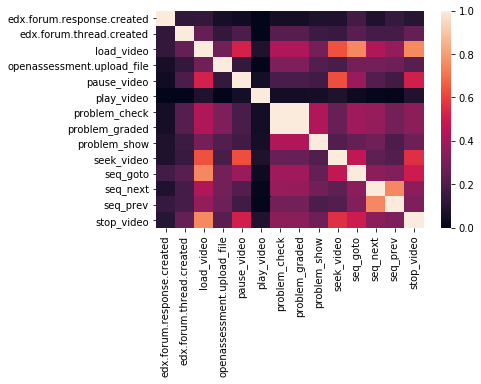

In [9]:
%matplotlib inline
import seaborn as sns
sns.heatmap(corr, annot = False)

In [10]:
# Import `train_test_split` from `sklearn.model_selection`

from sklearn.preprocessing import LabelEncoder

import numpy as np
from sklearn.model_selection import train_test_split

# Specify the data 
# Evaluar todas las columnas desde la primera hasta la numero 15
X = datos.values[:, 0:limite]

# Specify the target labels and flatten the array 
# Devuelve una matriz aplanada contigua.
# Se devuelve una matriz 1-D que contiene los elementos de la entrada.
Y = datos.values[:,limite]

# Split the data up in train and test sets
# Especificando que se use el 20% del datasetpara el testeo
# Ademas de agregarle un filtro de mezclador

encoder = LabelEncoder()
encoder.fit(Y)
encoded_Y = encoder.transform(Y)

X_train, X_test, y_train, y_test = train_test_split( X, encoded_Y, test_size = 0.70, random_state = 0)

In [11]:
from sklearn.preprocessing import StandardScaler

# Definir la escala
scaler = StandardScaler().fit(X_train)

# Escalar el set det entrenamiento
X_train = scaler.transform(X_train)

# Escalar el set de testeo
X_test = scaler.transform(X_test)

C:\Users\Michael\Anaconda3\envs\KerasNGpu\lib\site-packages\sklearn\utils\validation.py:475: DataConversionWarning: Data with input dtype object was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)
C:\Users\Michael\Anaconda3\envs\KerasNGpu\lib\site-packages\sklearn\utils\validation.py:475: DataConversionWarning: Data with input dtype object was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)
C:\Users\Michael\Anaconda3\envs\KerasNGpu\lib\site-packages\sklearn\utils\validation.py:475: DataConversionWarning: Data with input dtype object was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)


In [12]:
from keras.models import Sequential
from keras.layers import Dense

# Inicia el constructor
model = Sequential()
# Se agrega la capa de entrada
model.add(Dense(limite, kernel_initializer='normal',activation='relu', input_shape=(limite,)))
# Add one hidden layer 
model.add(Dense(oculta, kernel_initializer='normal', activation='relu'))
# Add an output layer 
model.add(Dense(1, kernel_initializer='normal', activation='sigmoid'))

# Inicia el constructor
model2 = Sequential()
# Se agrega la capa de entrada
model2.add(Dense(limite, kernel_initializer='normal',activation='relu', input_shape=(limite,)))
# Add one hidden layer 
model2.add(Dense(oculta, kernel_initializer='normal', activation='relu'))
# Add an output layer 
model2.add(Dense(salida, kernel_initializer='normal', activation='sigmoid'))

# Inicia el constructor
model3 = Sequential()
# Se agrega la capa de entrada
model3.add(Dense(limite, kernel_initializer='normal',activation='relu', input_shape=(limite,)))
# Add one hidden layer 
model3.add(Dense(oculta, kernel_initializer='normal', activation='relu'))
# Add an output layer 
model3.add(Dense(salida, kernel_initializer='normal', activation='sigmoid'))

# Inicia el constructor
model4 = Sequential()
# Se agrega la capa de entrada
model4.add(Dense(limite, kernel_initializer='normal',activation='relu', input_shape=(limite,)))
# Add one hidden layer 
model4.add(Dense(oculta, kernel_initializer='normal', activation='relu'))
# Add an output layer 
model4.add(Dense(salida, kernel_initializer='normal', activation='sigmoid'))

# Inicia el constructor
model5 = Sequential()
# Se agrega la capa de entrada
model5.add(Dense(limite, kernel_initializer='normal',activation='relu', input_shape=(limite,)))
# Add one hidden layer 
model5.add(Dense(oculta, kernel_initializer='normal', activation='relu'))
# Add an output layer 
model5.add(Dense(salida, kernel_initializer='normal', activation='sigmoid'))

# Inicia el constructor
model6 = Sequential()
# Se agrega la capa de entrada
model6.add(Dense(limite, kernel_initializer='normal',activation='relu', input_shape=(limite,)))
# Add one hidden layer 
model6.add(Dense(oculta, kernel_initializer='normal', activation='relu'))
# Add an output layer 
model6.add(Dense(salida, kernel_initializer='normal', activation='sigmoid'))

# Inicia el constructor
model7 = Sequential()
# Se agrega la capa de entrada
model7.add(Dense(limite, kernel_initializer='normal',activation='relu', input_shape=(limite,)))
# Add one hidden layer 
model7.add(Dense(oculta, kernel_initializer='normal', activation='relu'))
# Add an output layer 
model7.add(Dense(salida, kernel_initializer='normal', activation='sigmoid'))

# Inicia el constructor
model8 = Sequential()
# Se agrega la capa de entrada
model8.add(Dense(limite, kernel_initializer='normal',activation='relu', input_shape=(limite,)))
# Add one hidden layer 
model8.add(Dense(oculta, kernel_initializer='normal', activation='relu'))
# Add an output layer 
model8.add(Dense(salida, kernel_initializer='normal', activation='sigmoid'))

# Inicia el constructor
model9 = Sequential()
# Se agrega la capa de entrada
model9.add(Dense(limite, kernel_initializer='normal',activation='relu', input_shape=(limite,)))
# Add one hidden layer 
model9.add(Dense(oculta, kernel_initializer='normal', activation='relu'))
# Add an output layer 
model9.add(Dense(salida, kernel_initializer='normal', activation='sigmoid'))

# Inicia el constructor
model10 = Sequential()
# Se agrega la capa de entrada
model10.add(Dense(limite, kernel_initializer='normal',activation='relu', input_shape=(limite,)))
# Add one hidden layer 
model10.add(Dense(oculta, kernel_initializer='normal', activation='relu'))
# Add an output layer 
model10.add(Dense(salida, kernel_initializer='normal', activation='sigmoid'))

# Inicia el constructor
model11 = Sequential()
# Se agrega la capa de entrada
model11.add(Dense(limite, kernel_initializer='normal',activation='relu', input_shape=(limite,)))
# Add one hidden layer 
model11.add(Dense(oculta, kernel_initializer='normal', activation='relu'))
# Add an output layer 
model11.add(Dense(salida, kernel_initializer='normal', activation='sigmoid'))
# Inicia el constructor
model12 = Sequential()
# Se agrega la capa de entrada
model12.add(Dense(limite, kernel_initializer='normal',activation='relu', input_shape=(limite,)))
# Add one hidden layer 
model12.add(Dense(oculta, kernel_initializer='normal', activation='relu'))
# Add an output layer 
model12.add(Dense(salida, kernel_initializer='normal', activation='sigmoid'))
# Inicia el constructor
model13 = Sequential()
# Se agrega la capa de entrada
model13.add(Dense(limite, kernel_initializer='normal',activation='relu', input_shape=(limite,)))
# Add one hidden layer 
model13.add(Dense(oculta, kernel_initializer='normal', activation='relu'))
# Add an output layer 
model13.add(Dense(salida, kernel_initializer='normal', activation='sigmoid'))
# Inicia el constructor
model14 = Sequential()
# Se agrega la capa de entrada
model14.add(Dense(limite, kernel_initializer='normal',activation='relu', input_shape=(limite,)))
# Add one hidden layer 
model14.add(Dense(oculta, kernel_initializer='normal', activation='relu'))
# Add an output layer 
model14.add(Dense(salida, kernel_initializer='normal', activation='sigmoid'))
# Inicia el constructor
model15 = Sequential()
# Se agrega la capa de entrada
model15.add(Dense(limite, kernel_initializer='normal',activation='relu', input_shape=(limite,)))
# Add one hidden layer 
model15.add(Dense(oculta, kernel_initializer='normal', activation='relu'))
# Add an output layer 
model15.add(Dense(salida, kernel_initializer='normal', activation='sigmoid'))
# Inicia el constructor
model16 = Sequential()
# Se agrega la capa de entrada
model16.add(Dense(limite, kernel_initializer='normal',activation='relu', input_shape=(limite,)))
# Add one hidden layer 
model16.add(Dense(oculta, kernel_initializer='normal', activation='relu'))
# Add an output layer 
model16.add(Dense(salida, kernel_initializer='normal', activation='sigmoid'))
# Inicia el constructor
model17 = Sequential()
# Se agrega la capa de entrada
model17.add(Dense(limite, kernel_initializer='normal',activation='relu', input_shape=(limite,)))
# Add one hidden layer 
model17.add(Dense(oculta, kernel_initializer='normal', activation='relu'))
# Add an output layer 
model17.add(Dense(salida, kernel_initializer='normal', activation='sigmoid'))
# Inicia el constructor
model18 = Sequential()
# Se agrega la capa de entrada
model18.add(Dense(limite, kernel_initializer='normal',activation='relu', input_shape=(limite,)))
# Add one hidden layer 
model18.add(Dense(oculta, kernel_initializer='normal', activation='relu'))
# Add an output layer 
model18.add(Dense(salida, kernel_initializer='normal', activation='sigmoid'))

In [13]:
# Model summary
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1 (Dense)              (None, 14)                210       
_________________________________________________________________
dense_2 (Dense)              (None, 12)                180       
_________________________________________________________________
dense_3 (Dense)              (None, 1)                 13        
Total params: 403
Trainable params: 403
Non-trainable params: 0
_________________________________________________________________


In [14]:
# Model config
#model.get_config()
# List all weight tensors 
#model.get_weights()

In [15]:
model.compile(loss='mean_squared_error',
              optimizer='sgd',
              metrics=['accuracy'])
                   
history = model.fit(X_train, y_train,epochs=5000, validation_split=0.33, batch_size=50, verbose=1)

Train on 462 samples, validate on 228 samples
Epoch 1/5000
462/462 [==============================] - 1s 1ms/step - loss: 0.2501 - acc: 0.3896 - val_loss: 0.2501 - val_acc: 0.5351
Epoch 2/5000
462/462 [==============================] - 0s 26us/step - loss: 0.2500 - acc: 0.5455 - val_loss: 0.2500 - val_acc: 0.5351
Epoch 3/5000
462/462 [==============================] - 0s 28us/step - loss: 0.2500 - acc: 0.5433 - val_loss: 0.2500 - val_acc: 0.5263
Epoch 4/5000
462/462 [==============================] - 0s 26us/step - loss: 0.2499 - acc: 0.5433 - val_loss: 0.2500 - val_acc: 0.5263
Epoch 5/5000
462/462 [==============================] - 0s 35us/step - loss: 0.2499 - acc: 0.5433 - val_loss: 0.2500 - val_acc: 0.5263
Epoch 6/5000
462/462 [==============================] - 0s 26us/step - loss: 0.2498 - acc: 0.5433 - val_loss: 0.2499 - val_acc: 0.5263
Epoch 7/5000
462/462 [==============================] - 0s 35us/step - loss: 0.2498 - acc: 0.5433 - val_loss: 0.2499 - val_acc: 0.5263
Epoch 8/50

Epoch 61/5000
462/462 [==============================] - 0s 32us/step - loss: 0.2484 - acc: 0.5433 - val_loss: 0.2492 - val_acc: 0.5263
Epoch 62/5000
462/462 [==============================] - 0s 26us/step - loss: 0.2484 - acc: 0.5433 - val_loss: 0.2492 - val_acc: 0.5263
Epoch 63/5000
462/462 [==============================] - 0s 28us/step - loss: 0.2484 - acc: 0.5433 - val_loss: 0.2491 - val_acc: 0.5263
Epoch 64/5000
462/462 [==============================] - 0s 30us/step - loss: 0.2483 - acc: 0.5433 - val_loss: 0.2491 - val_acc: 0.5263
Epoch 65/5000
462/462 [==============================] - 0s 32us/step - loss: 0.2483 - acc: 0.5433 - val_loss: 0.2491 - val_acc: 0.5263
Epoch 66/5000
462/462 [==============================] - 0s 52us/step - loss: 0.2483 - acc: 0.5433 - val_loss: 0.2491 - val_acc: 0.5263
Epoch 67/5000
462/462 [==============================] - 0s 112us/step - loss: 0.2483 - acc: 0.5433 - val_loss: 0.2491 - val_acc: 0.5263
Epoch 68/5000
462/462 [========================

462/462 [==============================] - 0s 24us/step - loss: 0.2479 - acc: 0.5433 - val_loss: 0.2490 - val_acc: 0.5263
Epoch 122/5000
462/462 [==============================] - 0s 24us/step - loss: 0.2479 - acc: 0.5433 - val_loss: 0.2490 - val_acc: 0.5263
Epoch 123/5000
462/462 [==============================] - 0s 22us/step - loss: 0.2479 - acc: 0.5433 - val_loss: 0.2490 - val_acc: 0.5263
Epoch 124/5000
462/462 [==============================] - 0s 26us/step - loss: 0.2478 - acc: 0.5433 - val_loss: 0.2490 - val_acc: 0.5263
Epoch 125/5000
462/462 [==============================] - 0s 26us/step - loss: 0.2478 - acc: 0.5433 - val_loss: 0.2490 - val_acc: 0.5263
Epoch 126/5000
462/462 [==============================] - 0s 26us/step - loss: 0.2478 - acc: 0.5433 - val_loss: 0.2490 - val_acc: 0.5263
Epoch 127/5000
462/462 [==============================] - 0s 28us/step - loss: 0.2478 - acc: 0.5433 - val_loss: 0.2490 - val_acc: 0.5263
Epoch 128/5000
462/462 [==============================] 

Epoch 240/5000
462/462 [==============================] - 0s 24us/step - loss: 0.2470 - acc: 0.5433 - val_loss: 0.2484 - val_acc: 0.5263
Epoch 241/5000
462/462 [==============================] - 0s 27us/step - loss: 0.2470 - acc: 0.5433 - val_loss: 0.2484 - val_acc: 0.5263
Epoch 242/5000
462/462 [==============================] - 0s 28us/step - loss: 0.2470 - acc: 0.5433 - val_loss: 0.2484 - val_acc: 0.5263
Epoch 243/5000
462/462 [==============================] - 0s 29us/step - loss: 0.2470 - acc: 0.5433 - val_loss: 0.2484 - val_acc: 0.5263
Epoch 244/5000
462/462 [==============================] - 0s 26us/step - loss: 0.2470 - acc: 0.5433 - val_loss: 0.2483 - val_acc: 0.5263
Epoch 245/5000
462/462 [==============================] - 0s 39us/step - loss: 0.2469 - acc: 0.5433 - val_loss: 0.2483 - val_acc: 0.5263
Epoch 246/5000
462/462 [==============================] - 0s 211us/step - loss: 0.2469 - acc: 0.5433 - val_loss: 0.2483 - val_acc: 0.5263
Epoch 247/5000
462/462 [================

Epoch 359/5000
462/462 [==============================] - 0s 41us/step - loss: 0.2436 - acc: 0.5433 - val_loss: 0.2447 - val_acc: 0.5263
Epoch 360/5000
462/462 [==============================] - 0s 41us/step - loss: 0.2435 - acc: 0.5433 - val_loss: 0.2447 - val_acc: 0.5263
Epoch 361/5000
462/462 [==============================] - 0s 35us/step - loss: 0.2434 - acc: 0.5433 - val_loss: 0.2446 - val_acc: 0.5263
Epoch 362/5000
462/462 [==============================] - 0s 32us/step - loss: 0.2434 - acc: 0.5433 - val_loss: 0.2445 - val_acc: 0.5263
Epoch 363/5000
462/462 [==============================] - 0s 28us/step - loss: 0.2433 - acc: 0.5433 - val_loss: 0.2445 - val_acc: 0.5263
Epoch 364/5000
462/462 [==============================] - 0s 30us/step - loss: 0.2432 - acc: 0.5433 - val_loss: 0.2444 - val_acc: 0.5263
Epoch 365/5000
462/462 [==============================] - 0s 26us/step - loss: 0.2432 - acc: 0.5433 - val_loss: 0.2443 - val_acc: 0.5263
Epoch 366/5000
462/462 [=================

Epoch 419/5000
462/462 [==============================] - 0s 30us/step - loss: 0.2368 - acc: 0.5455 - val_loss: 0.2374 - val_acc: 0.5307
Epoch 420/5000
462/462 [==============================] - 0s 30us/step - loss: 0.2366 - acc: 0.5476 - val_loss: 0.2372 - val_acc: 0.5307
Epoch 421/5000
462/462 [==============================] - 0s 28us/step - loss: 0.2364 - acc: 0.5476 - val_loss: 0.2370 - val_acc: 0.5307
Epoch 422/5000
462/462 [==============================] - 0s 26us/step - loss: 0.2362 - acc: 0.5476 - val_loss: 0.2368 - val_acc: 0.5307
Epoch 423/5000
462/462 [==============================] - 0s 30us/step - loss: 0.2360 - acc: 0.5476 - val_loss: 0.2366 - val_acc: 0.5307
Epoch 424/5000
462/462 [==============================] - 0s 26us/step - loss: 0.2358 - acc: 0.5476 - val_loss: 0.2364 - val_acc: 0.5307
Epoch 425/5000
462/462 [==============================] - 0s 28us/step - loss: 0.2356 - acc: 0.5476 - val_loss: 0.2361 - val_acc: 0.5307
Epoch 426/5000
462/462 [=================

Epoch 479/5000
462/462 [==============================] - 0s 30us/step - loss: 0.2148 - acc: 0.7143 - val_loss: 0.2135 - val_acc: 0.7149
Epoch 480/5000
462/462 [==============================] - 0s 35us/step - loss: 0.2141 - acc: 0.7208 - val_loss: 0.2128 - val_acc: 0.7193
Epoch 481/5000
462/462 [==============================] - 0s 28us/step - loss: 0.2135 - acc: 0.7186 - val_loss: 0.2120 - val_acc: 0.7193
Epoch 482/5000
462/462 [==============================] - 0s 26us/step - loss: 0.2128 - acc: 0.7186 - val_loss: 0.2113 - val_acc: 0.7237
Epoch 483/5000
462/462 [==============================] - 0s 30us/step - loss: 0.2122 - acc: 0.7186 - val_loss: 0.2106 - val_acc: 0.7281
Epoch 484/5000
462/462 [==============================] - 0s 26us/step - loss: 0.2114 - acc: 0.7229 - val_loss: 0.2098 - val_acc: 0.7281
Epoch 485/5000
462/462 [==============================] - 0s 28us/step - loss: 0.2107 - acc: 0.7251 - val_loss: 0.2091 - val_acc: 0.7368
Epoch 486/5000
462/462 [=================

Epoch 539/5000
462/462 [==============================] - 0s 35us/step - loss: 0.1585 - acc: 0.8290 - val_loss: 0.1537 - val_acc: 0.8509
Epoch 540/5000
462/462 [==============================] - 0s 28us/step - loss: 0.1575 - acc: 0.8290 - val_loss: 0.1526 - val_acc: 0.8509
Epoch 541/5000
462/462 [==============================] - 0s 32us/step - loss: 0.1564 - acc: 0.8290 - val_loss: 0.1516 - val_acc: 0.8509
Epoch 542/5000
462/462 [==============================] - 0s 28us/step - loss: 0.1554 - acc: 0.8290 - val_loss: 0.1505 - val_acc: 0.8509
Epoch 543/5000
462/462 [==============================] - 0s 28us/step - loss: 0.1544 - acc: 0.8290 - val_loss: 0.1495 - val_acc: 0.8509
Epoch 544/5000
462/462 [==============================] - 0s 26us/step - loss: 0.1534 - acc: 0.8290 - val_loss: 0.1485 - val_acc: 0.8509
Epoch 545/5000
462/462 [==============================] - 0s 24us/step - loss: 0.1524 - acc: 0.8290 - val_loss: 0.1475 - val_acc: 0.8509
Epoch 546/5000
462/462 [=================

Epoch 599/5000
462/462 [==============================] - 0s 87us/step - loss: 0.1150 - acc: 0.8485 - val_loss: 0.1111 - val_acc: 0.8553
Epoch 600/5000
462/462 [==============================] - 0s 52us/step - loss: 0.1145 - acc: 0.8485 - val_loss: 0.1107 - val_acc: 0.8596
Epoch 601/5000
462/462 [==============================] - 0s 45us/step - loss: 0.1141 - acc: 0.8506 - val_loss: 0.1104 - val_acc: 0.8553
Epoch 602/5000
462/462 [==============================] - 0s 43us/step - loss: 0.1137 - acc: 0.8506 - val_loss: 0.1100 - val_acc: 0.8553
Epoch 603/5000
462/462 [==============================] - 0s 32us/step - loss: 0.1133 - acc: 0.8506 - val_loss: 0.1097 - val_acc: 0.8553
Epoch 604/5000
462/462 [==============================] - 0s 34us/step - loss: 0.1129 - acc: 0.8550 - val_loss: 0.1093 - val_acc: 0.8553
Epoch 605/5000
462/462 [==============================] - 0s 29us/step - loss: 0.1125 - acc: 0.8550 - val_loss: 0.1090 - val_acc: 0.8553
Epoch 606/5000
462/462 [=================

Epoch 718/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0883 - acc: 0.8896 - val_loss: 0.0908 - val_acc: 0.8860
Epoch 719/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0881 - acc: 0.8896 - val_loss: 0.0908 - val_acc: 0.8860
Epoch 720/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0880 - acc: 0.8896 - val_loss: 0.0907 - val_acc: 0.8860
Epoch 721/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0879 - acc: 0.8896 - val_loss: 0.0906 - val_acc: 0.8860
Epoch 722/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0878 - acc: 0.8896 - val_loss: 0.0906 - val_acc: 0.8860
Epoch 723/5000
462/462 [==============================] - 0s 61us/step - loss: 0.0877 - acc: 0.8918 - val_loss: 0.0905 - val_acc: 0.8860
Epoch 724/5000
462/462 [==============================] - 0s 56us/step - loss: 0.0875 - acc: 0.8939 - val_loss: 0.0904 - val_acc: 0.8860
Epoch 725/5000
462/462 [=================

Epoch 837/5000
462/462 [==============================] - 0s 241us/step - loss: 0.0778 - acc: 0.9091 - val_loss: 0.0860 - val_acc: 0.8904
Epoch 838/5000
462/462 [==============================] - 0s 87us/step - loss: 0.0777 - acc: 0.9091 - val_loss: 0.0860 - val_acc: 0.8904
Epoch 839/5000
462/462 [==============================] - 0s 58us/step - loss: 0.0777 - acc: 0.9091 - val_loss: 0.0860 - val_acc: 0.8904
Epoch 840/5000
462/462 [==============================] - 0s 49us/step - loss: 0.0776 - acc: 0.9091 - val_loss: 0.0860 - val_acc: 0.8904
Epoch 841/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0776 - acc: 0.9091 - val_loss: 0.0859 - val_acc: 0.8904
Epoch 842/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0775 - acc: 0.9091 - val_loss: 0.0859 - val_acc: 0.8860
Epoch 843/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0774 - acc: 0.9091 - val_loss: 0.0859 - val_acc: 0.8860
Epoch 844/5000
462/462 [================

Epoch 897/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0749 - acc: 0.9134 - val_loss: 0.0852 - val_acc: 0.8816
Epoch 898/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0748 - acc: 0.9156 - val_loss: 0.0852 - val_acc: 0.8816
Epoch 899/5000
462/462 [==============================] - 0s 48us/step - loss: 0.0748 - acc: 0.9134 - val_loss: 0.0852 - val_acc: 0.8816
Epoch 900/5000
462/462 [==============================] - 0s 237us/step - loss: 0.0747 - acc: 0.9134 - val_loss: 0.0852 - val_acc: 0.8816
Epoch 901/5000
462/462 [==============================] - 0s 76us/step - loss: 0.0747 - acc: 0.9134 - val_loss: 0.0851 - val_acc: 0.8816
Epoch 902/5000
462/462 [==============================] - 0s 56us/step - loss: 0.0747 - acc: 0.9156 - val_loss: 0.0851 - val_acc: 0.8816
Epoch 903/5000
462/462 [==============================] - 0s 48us/step - loss: 0.0746 - acc: 0.9156 - val_loss: 0.0851 - val_acc: 0.8816
Epoch 904/5000
462/462 [================

Epoch 957/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0728 - acc: 0.9177 - val_loss: 0.0845 - val_acc: 0.8816
Epoch 958/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0727 - acc: 0.9177 - val_loss: 0.0845 - val_acc: 0.8816
Epoch 959/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0727 - acc: 0.9177 - val_loss: 0.0845 - val_acc: 0.8816
Epoch 960/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0727 - acc: 0.9177 - val_loss: 0.0846 - val_acc: 0.8816
Epoch 961/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0726 - acc: 0.9156 - val_loss: 0.0846 - val_acc: 0.8816
Epoch 962/5000
462/462 [==============================] - 0s 131us/step - loss: 0.0726 - acc: 0.9156 - val_loss: 0.0846 - val_acc: 0.8816
Epoch 963/5000
462/462 [==============================] - 0s 142us/step - loss: 0.0726 - acc: 0.9156 - val_loss: 0.0846 - val_acc: 0.8816
Epoch 964/5000
462/462 [===============

462/462 [==============================] - 0s 212us/step - loss: 0.0701 - acc: 0.9177 - val_loss: 0.0840 - val_acc: 0.8816
Epoch 1076/5000
462/462 [==============================] - 0s 78us/step - loss: 0.0701 - acc: 0.9177 - val_loss: 0.0839 - val_acc: 0.8816
Epoch 1077/5000
462/462 [==============================] - 0s 55us/step - loss: 0.0701 - acc: 0.9177 - val_loss: 0.0839 - val_acc: 0.8816
Epoch 1078/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0700 - acc: 0.9177 - val_loss: 0.0840 - val_acc: 0.8816
Epoch 1079/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0700 - acc: 0.9177 - val_loss: 0.0839 - val_acc: 0.8816
Epoch 1080/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0700 - acc: 0.9177 - val_loss: 0.0838 - val_acc: 0.8816
Epoch 1081/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0700 - acc: 0.9177 - val_loss: 0.0838 - val_acc: 0.8816
Epoch 1082/5000
462/462 [========================

462/462 [==============================] - 0s 28us/step - loss: 0.0683 - acc: 0.9156 - val_loss: 0.0839 - val_acc: 0.8772
Epoch 1194/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0682 - acc: 0.9134 - val_loss: 0.0839 - val_acc: 0.8772
Epoch 1195/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0682 - acc: 0.9134 - val_loss: 0.0839 - val_acc: 0.8772
Epoch 1196/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0682 - acc: 0.9134 - val_loss: 0.0839 - val_acc: 0.8772
Epoch 1197/5000
462/462 [==============================] - 0s 149us/step - loss: 0.0682 - acc: 0.9134 - val_loss: 0.0838 - val_acc: 0.8772
Epoch 1198/5000
462/462 [==============================] - 0s 89us/step - loss: 0.0682 - acc: 0.9156 - val_loss: 0.0838 - val_acc: 0.8772
Epoch 1199/5000
462/462 [==============================] - 0s 67us/step - loss: 0.0682 - acc: 0.9156 - val_loss: 0.0839 - val_acc: 0.8772
Epoch 1200/5000
462/462 [========================

462/462 [==============================] - 0s 26us/step - loss: 0.0667 - acc: 0.9177 - val_loss: 0.0836 - val_acc: 0.8772
Epoch 1312/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0667 - acc: 0.9177 - val_loss: 0.0836 - val_acc: 0.8772
Epoch 1313/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0666 - acc: 0.9177 - val_loss: 0.0836 - val_acc: 0.8772
Epoch 1314/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0666 - acc: 0.9177 - val_loss: 0.0836 - val_acc: 0.8772
Epoch 1315/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0666 - acc: 0.9177 - val_loss: 0.0836 - val_acc: 0.8772
Epoch 1316/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0666 - acc: 0.9177 - val_loss: 0.0836 - val_acc: 0.8772
Epoch 1317/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0666 - acc: 0.9177 - val_loss: 0.0835 - val_acc: 0.8772
Epoch 1318/5000
462/462 [=========================

462/462 [==============================] - 0s 30us/step - loss: 0.0653 - acc: 0.9177 - val_loss: 0.0830 - val_acc: 0.8772
Epoch 1430/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0652 - acc: 0.9177 - val_loss: 0.0830 - val_acc: 0.8772
Epoch 1431/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0652 - acc: 0.9177 - val_loss: 0.0830 - val_acc: 0.8772
Epoch 1432/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0652 - acc: 0.9177 - val_loss: 0.0830 - val_acc: 0.8772
Epoch 1433/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0652 - acc: 0.9177 - val_loss: 0.0831 - val_acc: 0.8772
Epoch 1434/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0652 - acc: 0.9177 - val_loss: 0.0831 - val_acc: 0.8772
Epoch 1435/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0652 - acc: 0.9177 - val_loss: 0.0830 - val_acc: 0.8772
Epoch 1436/5000
462/462 [=========================

462/462 [==============================] - 0s 26us/step - loss: 0.0640 - acc: 0.9177 - val_loss: 0.0831 - val_acc: 0.8772
Epoch 1548/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0640 - acc: 0.9177 - val_loss: 0.0831 - val_acc: 0.8772
Epoch 1549/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0640 - acc: 0.9177 - val_loss: 0.0831 - val_acc: 0.8772
Epoch 1550/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0639 - acc: 0.9177 - val_loss: 0.0831 - val_acc: 0.8772
Epoch 1551/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0639 - acc: 0.9177 - val_loss: 0.0831 - val_acc: 0.8772
Epoch 1552/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0639 - acc: 0.9177 - val_loss: 0.0831 - val_acc: 0.8772
Epoch 1553/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0639 - acc: 0.9177 - val_loss: 0.0831 - val_acc: 0.8772
Epoch 1554/5000
462/462 [=========================

462/462 [==============================] - 0s 24us/step - loss: 0.0625 - acc: 0.9199 - val_loss: 0.0837 - val_acc: 0.8772
Epoch 1666/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0625 - acc: 0.9199 - val_loss: 0.0837 - val_acc: 0.8772
Epoch 1667/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0625 - acc: 0.9199 - val_loss: 0.0838 - val_acc: 0.8772
Epoch 1668/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0624 - acc: 0.9199 - val_loss: 0.0838 - val_acc: 0.8772
Epoch 1669/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0624 - acc: 0.9199 - val_loss: 0.0838 - val_acc: 0.8772
Epoch 1670/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0624 - acc: 0.9199 - val_loss: 0.0838 - val_acc: 0.8772
Epoch 1671/5000
462/462 [==============================] - 0s 54us/step - loss: 0.0624 - acc: 0.9199 - val_loss: 0.0839 - val_acc: 0.8772
Epoch 1672/5000
462/462 [=========================

462/462 [==============================] - 0s 24us/step - loss: 0.0611 - acc: 0.9199 - val_loss: 0.0835 - val_acc: 0.8772
Epoch 1784/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0611 - acc: 0.9199 - val_loss: 0.0835 - val_acc: 0.8772
Epoch 1785/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0611 - acc: 0.9199 - val_loss: 0.0835 - val_acc: 0.8772
Epoch 1786/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0610 - acc: 0.9199 - val_loss: 0.0835 - val_acc: 0.8772
Epoch 1787/5000
462/462 [==============================] - ETA: 0s - loss: 0.0335 - acc: 0.980 - 0s 28us/step - loss: 0.0610 - acc: 0.9199 - val_loss: 0.0836 - val_acc: 0.8772
Epoch 1788/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0610 - acc: 0.9199 - val_loss: 0.0836 - val_acc: 0.8772
Epoch 1789/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0610 - acc: 0.9199 - val_loss: 0.0835 - val_acc: 0.8772
Epoch 1790/5

462/462 [==============================] - 0s 24us/step - loss: 0.0599 - acc: 0.9221 - val_loss: 0.0836 - val_acc: 0.8772
Epoch 1902/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0599 - acc: 0.9242 - val_loss: 0.0835 - val_acc: 0.8772
Epoch 1903/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0599 - acc: 0.9242 - val_loss: 0.0835 - val_acc: 0.8772
Epoch 1904/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0599 - acc: 0.9242 - val_loss: 0.0835 - val_acc: 0.8772
Epoch 1905/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0599 - acc: 0.9242 - val_loss: 0.0835 - val_acc: 0.8772
Epoch 1906/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0599 - acc: 0.9242 - val_loss: 0.0835 - val_acc: 0.8772
Epoch 1907/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0599 - acc: 0.9242 - val_loss: 0.0836 - val_acc: 0.8772
Epoch 1908/5000
462/462 [=========================

462/462 [==============================] - 0s 27us/step - loss: 0.0588 - acc: 0.9242 - val_loss: 0.0840 - val_acc: 0.8772
Epoch 2020/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0588 - acc: 0.9242 - val_loss: 0.0841 - val_acc: 0.8772
Epoch 2021/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0588 - acc: 0.9242 - val_loss: 0.0841 - val_acc: 0.8772
Epoch 2022/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0588 - acc: 0.9242 - val_loss: 0.0840 - val_acc: 0.8772
Epoch 2023/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0588 - acc: 0.9242 - val_loss: 0.0841 - val_acc: 0.8772
Epoch 2024/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0588 - acc: 0.9242 - val_loss: 0.0841 - val_acc: 0.8772
Epoch 2025/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0588 - acc: 0.9242 - val_loss: 0.0841 - val_acc: 0.8772
Epoch 2026/5000
462/462 [=========================

462/462 [==============================] - 0s 26us/step - loss: 0.0579 - acc: 0.9264 - val_loss: 0.0839 - val_acc: 0.8772
Epoch 2138/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0578 - acc: 0.9264 - val_loss: 0.0839 - val_acc: 0.8772
Epoch 2139/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0578 - acc: 0.9264 - val_loss: 0.0837 - val_acc: 0.8772
Epoch 2140/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0578 - acc: 0.9264 - val_loss: 0.0838 - val_acc: 0.8772
Epoch 2141/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0578 - acc: 0.9264 - val_loss: 0.0839 - val_acc: 0.8772
Epoch 2142/5000
462/462 [==============================] - 0s 48us/step - loss: 0.0578 - acc: 0.9264 - val_loss: 0.0839 - val_acc: 0.8772
Epoch 2143/5000
462/462 [==============================] - 0s 259us/step - loss: 0.0578 - acc: 0.9264 - val_loss: 0.0839 - val_acc: 0.8772
Epoch 2144/5000
462/462 [========================

462/462 [==============================] - 0s 26us/step - loss: 0.0569 - acc: 0.9264 - val_loss: 0.0843 - val_acc: 0.8772
Epoch 2256/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0569 - acc: 0.9264 - val_loss: 0.0843 - val_acc: 0.8772
Epoch 2257/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0569 - acc: 0.9264 - val_loss: 0.0843 - val_acc: 0.8772
Epoch 2258/5000
462/462 [==============================] - 0s 169us/step - loss: 0.0569 - acc: 0.9264 - val_loss: 0.0843 - val_acc: 0.8772
Epoch 2259/5000
462/462 [==============================] - 0s 110us/step - loss: 0.0569 - acc: 0.9264 - val_loss: 0.0844 - val_acc: 0.8772
Epoch 2260/5000
462/462 [==============================] - 0s 65us/step - loss: 0.0569 - acc: 0.9264 - val_loss: 0.0843 - val_acc: 0.8772
Epoch 2261/5000
462/462 [==============================] - 0s 48us/step - loss: 0.0569 - acc: 0.9264 - val_loss: 0.0844 - val_acc: 0.8772
Epoch 2262/5000
462/462 [=======================

462/462 [==============================] - 0s 24us/step - loss: 0.0560 - acc: 0.9264 - val_loss: 0.0847 - val_acc: 0.8772
Epoch 2374/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0560 - acc: 0.9264 - val_loss: 0.0847 - val_acc: 0.8772
Epoch 2375/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0560 - acc: 0.9264 - val_loss: 0.0848 - val_acc: 0.8772
Epoch 2376/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0560 - acc: 0.9264 - val_loss: 0.0848 - val_acc: 0.8772
Epoch 2377/5000
462/462 [==============================] - 0s 89us/step - loss: 0.0560 - acc: 0.9264 - val_loss: 0.0848 - val_acc: 0.8772
Epoch 2378/5000
462/462 [==============================] - 0s 86us/step - loss: 0.0560 - acc: 0.9264 - val_loss: 0.0848 - val_acc: 0.8772
Epoch 2379/5000
462/462 [==============================] - 0s 65us/step - loss: 0.0559 - acc: 0.9264 - val_loss: 0.0847 - val_acc: 0.8772
Epoch 2380/5000
462/462 [=========================

462/462 [==============================] - 0s 50us/step - loss: 0.0551 - acc: 0.9242 - val_loss: 0.0847 - val_acc: 0.8816
Epoch 2492/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0551 - acc: 0.9242 - val_loss: 0.0847 - val_acc: 0.8816
Epoch 2493/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0551 - acc: 0.9242 - val_loss: 0.0847 - val_acc: 0.8816
Epoch 2494/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0551 - acc: 0.9242 - val_loss: 0.0847 - val_acc: 0.8816
Epoch 2495/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0551 - acc: 0.9242 - val_loss: 0.0847 - val_acc: 0.8816
Epoch 2496/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0551 - acc: 0.9242 - val_loss: 0.0849 - val_acc: 0.8772
Epoch 2497/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0551 - acc: 0.9264 - val_loss: 0.0849 - val_acc: 0.8772
Epoch 2498/5000
462/462 [=========================

Epoch 2550/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0547 - acc: 0.9242 - val_loss: 0.0850 - val_acc: 0.8816
Epoch 2551/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0547 - acc: 0.9242 - val_loss: 0.0850 - val_acc: 0.8816
Epoch 2552/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0547 - acc: 0.9242 - val_loss: 0.0851 - val_acc: 0.8772
Epoch 2553/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0547 - acc: 0.9264 - val_loss: 0.0851 - val_acc: 0.8772
Epoch 2554/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0547 - acc: 0.9264 - val_loss: 0.0850 - val_acc: 0.8816
Epoch 2555/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0547 - acc: 0.9242 - val_loss: 0.0851 - val_acc: 0.8816
Epoch 2556/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0546 - acc: 0.9242 - val_loss: 0.0850 - val_acc: 0.8816
Epoch 2557/5000
462/462 [=========

462/462 [==============================] - 0s 54us/step - loss: 0.0543 - acc: 0.9264 - val_loss: 0.0850 - val_acc: 0.8816
Epoch 2610/5000
462/462 [==============================] - 0s 44us/step - loss: 0.0543 - acc: 0.9242 - val_loss: 0.0850 - val_acc: 0.8816
Epoch 2611/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0543 - acc: 0.9242 - val_loss: 0.0850 - val_acc: 0.8816
Epoch 2612/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0543 - acc: 0.9264 - val_loss: 0.0849 - val_acc: 0.8816
Epoch 2613/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0543 - acc: 0.9242 - val_loss: 0.0849 - val_acc: 0.8816
Epoch 2614/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0543 - acc: 0.9242 - val_loss: 0.0850 - val_acc: 0.8816
Epoch 2615/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0543 - acc: 0.9242 - val_loss: 0.0850 - val_acc: 0.8816
Epoch 2616/5000
462/462 [=========================

462/462 [==============================] - 0s 52us/step - loss: 0.0534 - acc: 0.9286 - val_loss: 0.0855 - val_acc: 0.8816
Epoch 2728/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0534 - acc: 0.9286 - val_loss: 0.0856 - val_acc: 0.8816
Epoch 2729/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0535 - acc: 0.9286 - val_loss: 0.0855 - val_acc: 0.8816
Epoch 2730/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0534 - acc: 0.9286 - val_loss: 0.0854 - val_acc: 0.8816
Epoch 2731/5000
462/462 [==============================] - 0s 33us/step - loss: 0.0534 - acc: 0.9286 - val_loss: 0.0854 - val_acc: 0.8816
Epoch 2732/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0534 - acc: 0.9286 - val_loss: 0.0856 - val_acc: 0.8816
Epoch 2733/5000
462/462 [==============================] - 0s 29us/step - loss: 0.0534 - acc: 0.9286 - val_loss: 0.0854 - val_acc: 0.8816
Epoch 2734/5000
462/462 [=========================

462/462 [==============================] - 0s 35us/step - loss: 0.0526 - acc: 0.9351 - val_loss: 0.0859 - val_acc: 0.8728
Epoch 2846/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0526 - acc: 0.9351 - val_loss: 0.0859 - val_acc: 0.8728
Epoch 2847/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0526 - acc: 0.9351 - val_loss: 0.0859 - val_acc: 0.8728
Epoch 2848/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0526 - acc: 0.9351 - val_loss: 0.0859 - val_acc: 0.8728
Epoch 2849/5000
462/462 [==============================] - 0s 27us/step - loss: 0.0526 - acc: 0.9351 - val_loss: 0.0860 - val_acc: 0.8684
Epoch 2850/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0526 - acc: 0.9351 - val_loss: 0.0859 - val_acc: 0.8684
Epoch 2851/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0526 - acc: 0.9351 - val_loss: 0.0861 - val_acc: 0.8684
Epoch 2852/5000
462/462 [=========================

462/462 [==============================] - 0s 29us/step - loss: 0.0517 - acc: 0.9372 - val_loss: 0.0862 - val_acc: 0.8728
Epoch 2964/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0516 - acc: 0.9372 - val_loss: 0.0862 - val_acc: 0.8728
Epoch 2965/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0516 - acc: 0.9372 - val_loss: 0.0861 - val_acc: 0.8728
Epoch 2966/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0516 - acc: 0.9372 - val_loss: 0.0861 - val_acc: 0.8728
Epoch 2967/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0516 - acc: 0.9372 - val_loss: 0.0861 - val_acc: 0.8728
Epoch 2968/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0516 - acc: 0.9372 - val_loss: 0.0861 - val_acc: 0.8728
Epoch 2969/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0516 - acc: 0.9372 - val_loss: 0.0861 - val_acc: 0.8728
Epoch 2970/5000
462/462 [=========================

462/462 [==============================] - 0s 28us/step - loss: 0.0507 - acc: 0.9394 - val_loss: 0.0870 - val_acc: 0.8728
Epoch 3082/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0507 - acc: 0.9394 - val_loss: 0.0870 - val_acc: 0.8728
Epoch 3083/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0507 - acc: 0.9394 - val_loss: 0.0869 - val_acc: 0.8728
Epoch 3084/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0507 - acc: 0.9394 - val_loss: 0.0870 - val_acc: 0.8728
Epoch 3085/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0507 - acc: 0.9394 - val_loss: 0.0870 - val_acc: 0.8728
Epoch 3086/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0507 - acc: 0.9394 - val_loss: 0.0870 - val_acc: 0.8728
Epoch 3087/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0507 - acc: 0.9394 - val_loss: 0.0871 - val_acc: 0.8684
Epoch 3088/5000
462/462 [=========================

462/462 [==============================] - 0s 26us/step - loss: 0.0498 - acc: 0.9372 - val_loss: 0.0882 - val_acc: 0.8728
Epoch 3200/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0497 - acc: 0.9372 - val_loss: 0.0884 - val_acc: 0.8684
Epoch 3201/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0497 - acc: 0.9372 - val_loss: 0.0883 - val_acc: 0.8728
Epoch 3202/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0498 - acc: 0.9372 - val_loss: 0.0883 - val_acc: 0.8728
Epoch 3203/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0497 - acc: 0.9372 - val_loss: 0.0882 - val_acc: 0.8684
Epoch 3204/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0497 - acc: 0.9394 - val_loss: 0.0884 - val_acc: 0.8684
Epoch 3205/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0497 - acc: 0.9372 - val_loss: 0.0884 - val_acc: 0.8684
Epoch 3206/5000
462/462 [=========================

462/462 [==============================] - 0s 26us/step - loss: 0.0488 - acc: 0.9416 - val_loss: 0.0890 - val_acc: 0.8684
Epoch 3318/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0487 - acc: 0.9416 - val_loss: 0.0890 - val_acc: 0.8684
Epoch 3319/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0487 - acc: 0.9416 - val_loss: 0.0890 - val_acc: 0.8684
Epoch 3320/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0487 - acc: 0.9416 - val_loss: 0.0890 - val_acc: 0.8684
Epoch 3321/5000
462/462 [==============================] - 0s 67us/step - loss: 0.0487 - acc: 0.9416 - val_loss: 0.0890 - val_acc: 0.8684
Epoch 3322/5000
462/462 [==============================] - 0s 203us/step - loss: 0.0487 - acc: 0.9416 - val_loss: 0.0891 - val_acc: 0.8684
Epoch 3323/5000
462/462 [==============================] - 0s 65us/step - loss: 0.0487 - acc: 0.9416 - val_loss: 0.0895 - val_acc: 0.8640
Epoch 3324/5000
462/462 [========================

462/462 [==============================] - 0s 54us/step - loss: 0.0478 - acc: 0.9416 - val_loss: 0.0900 - val_acc: 0.8728
Epoch 3436/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0478 - acc: 0.9416 - val_loss: 0.0900 - val_acc: 0.8728
Epoch 3437/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0478 - acc: 0.9416 - val_loss: 0.0899 - val_acc: 0.8728
Epoch 3438/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0478 - acc: 0.9416 - val_loss: 0.0900 - val_acc: 0.8728
Epoch 3439/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0478 - acc: 0.9416 - val_loss: 0.0900 - val_acc: 0.8728
Epoch 3440/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0477 - acc: 0.9416 - val_loss: 0.0900 - val_acc: 0.8728
Epoch 3441/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0477 - acc: 0.9416 - val_loss: 0.0900 - val_acc: 0.8728
Epoch 3442/5000
462/462 [=========================

462/462 [==============================] - 0s 26us/step - loss: 0.0469 - acc: 0.9416 - val_loss: 0.0905 - val_acc: 0.8728
Epoch 3554/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0470 - acc: 0.9416 - val_loss: 0.0906 - val_acc: 0.8728
Epoch 3555/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0469 - acc: 0.9416 - val_loss: 0.0906 - val_acc: 0.8728
Epoch 3556/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0469 - acc: 0.9416 - val_loss: 0.0906 - val_acc: 0.8728
Epoch 3557/5000
462/462 [==============================] - 0s 214us/step - loss: 0.0469 - acc: 0.9416 - val_loss: 0.0908 - val_acc: 0.8728
Epoch 3558/5000
462/462 [==============================] - 0s 110us/step - loss: 0.0469 - acc: 0.9416 - val_loss: 0.0908 - val_acc: 0.8728
Epoch 3559/5000
462/462 [==============================] - 0s 58us/step - loss: 0.0469 - acc: 0.9416 - val_loss: 0.0908 - val_acc: 0.8728
Epoch 3560/5000
462/462 [=======================

462/462 [==============================] - 0s 32us/step - loss: 0.0461 - acc: 0.9437 - val_loss: 0.0915 - val_acc: 0.8728
Epoch 3672/5000
462/462 [==============================] - 0s 36us/step - loss: 0.0461 - acc: 0.9437 - val_loss: 0.0915 - val_acc: 0.8728
Epoch 3673/5000
462/462 [==============================] - 0s 214us/step - loss: 0.0460 - acc: 0.9437 - val_loss: 0.0915 - val_acc: 0.8728
Epoch 3674/5000
462/462 [==============================] - 0s 82us/step - loss: 0.0461 - acc: 0.9437 - val_loss: 0.0915 - val_acc: 0.8728
Epoch 3675/5000
462/462 [==============================] - 0s 61us/step - loss: 0.0461 - acc: 0.9437 - val_loss: 0.0915 - val_acc: 0.8728
Epoch 3676/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0461 - acc: 0.9437 - val_loss: 0.0916 - val_acc: 0.8728
Epoch 3677/5000
462/462 [==============================] - 0s 42us/step - loss: 0.0460 - acc: 0.9437 - val_loss: 0.0916 - val_acc: 0.8728
Epoch 3678/5000
462/462 [========================

462/462 [==============================] - 0s 41us/step - loss: 0.0452 - acc: 0.9459 - val_loss: 0.0925 - val_acc: 0.8728
Epoch 3790/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0452 - acc: 0.9459 - val_loss: 0.0924 - val_acc: 0.8728
Epoch 3791/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0453 - acc: 0.9437 - val_loss: 0.0924 - val_acc: 0.8728
Epoch 3792/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0453 - acc: 0.9437 - val_loss: 0.0925 - val_acc: 0.8728
Epoch 3793/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0452 - acc: 0.9459 - val_loss: 0.0925 - val_acc: 0.8728
Epoch 3794/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0452 - acc: 0.9437 - val_loss: 0.0926 - val_acc: 0.8728
Epoch 3795/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0452 - acc: 0.9459 - val_loss: 0.0925 - val_acc: 0.8728
Epoch 3796/5000
462/462 [=========================

462/462 [==============================] - 0s 28us/step - loss: 0.0445 - acc: 0.9437 - val_loss: 0.0932 - val_acc: 0.8728
Epoch 3908/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0445 - acc: 0.9437 - val_loss: 0.0931 - val_acc: 0.8728
Epoch 3909/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0445 - acc: 0.9437 - val_loss: 0.0931 - val_acc: 0.8728
Epoch 3910/5000
462/462 [==============================] - ETA: 0s - loss: 0.0527 - acc: 0.920 - 0s 24us/step - loss: 0.0445 - acc: 0.9437 - val_loss: 0.0931 - val_acc: 0.8728
Epoch 3911/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0445 - acc: 0.9437 - val_loss: 0.0930 - val_acc: 0.8728
Epoch 3912/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0445 - acc: 0.9437 - val_loss: 0.0930 - val_acc: 0.8684
Epoch 3913/5000
462/462 [==============================] - 0s 63us/step - loss: 0.0445 - acc: 0.9437 - val_loss: 0.0930 - val_acc: 0.8684
Epoch 3914/5

462/462 [==============================] - 0s 32us/step - loss: 0.0438 - acc: 0.9459 - val_loss: 0.0937 - val_acc: 0.8684
Epoch 4026/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0438 - acc: 0.9459 - val_loss: 0.0936 - val_acc: 0.8684
Epoch 4027/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0438 - acc: 0.9459 - val_loss: 0.0937 - val_acc: 0.8684
Epoch 4028/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0437 - acc: 0.9459 - val_loss: 0.0937 - val_acc: 0.8684
Epoch 4029/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0437 - acc: 0.9459 - val_loss: 0.0938 - val_acc: 0.8684
Epoch 4030/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0437 - acc: 0.9459 - val_loss: 0.0938 - val_acc: 0.8684
Epoch 4031/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0437 - acc: 0.9459 - val_loss: 0.0939 - val_acc: 0.8684
Epoch 4032/5000
462/462 [=========================

462/462 [==============================] - 0s 26us/step - loss: 0.0430 - acc: 0.9459 - val_loss: 0.0946 - val_acc: 0.8684
Epoch 4144/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0430 - acc: 0.9459 - val_loss: 0.0945 - val_acc: 0.8684
Epoch 4145/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0430 - acc: 0.9459 - val_loss: 0.0946 - val_acc: 0.8684
Epoch 4146/5000
462/462 [==============================] - 0s 253us/step - loss: 0.0430 - acc: 0.9459 - val_loss: 0.0946 - val_acc: 0.8684
Epoch 4147/5000
462/462 [==============================] - 0s 84us/step - loss: 0.0430 - acc: 0.9459 - val_loss: 0.0946 - val_acc: 0.8684
Epoch 4148/5000
462/462 [==============================] - 0s 63us/step - loss: 0.0431 - acc: 0.9459 - val_loss: 0.0946 - val_acc: 0.8684
Epoch 4149/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0430 - acc: 0.9459 - val_loss: 0.0946 - val_acc: 0.8684
Epoch 4150/5000
462/462 [========================

462/462 [==============================] - 0s 30us/step - loss: 0.0424 - acc: 0.9459 - val_loss: 0.0955 - val_acc: 0.8684
Epoch 4262/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0423 - acc: 0.9481 - val_loss: 0.0955 - val_acc: 0.8684
Epoch 4263/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0424 - acc: 0.9481 - val_loss: 0.0955 - val_acc: 0.8684
Epoch 4264/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0423 - acc: 0.9481 - val_loss: 0.0955 - val_acc: 0.8684
Epoch 4265/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0423 - acc: 0.9481 - val_loss: 0.0954 - val_acc: 0.8640
Epoch 4266/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0423 - acc: 0.9481 - val_loss: 0.0954 - val_acc: 0.8640
Epoch 4267/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0423 - acc: 0.9481 - val_loss: 0.0955 - val_acc: 0.8640
Epoch 4268/5000
462/462 [=========================

462/462 [==============================] - 0s 32us/step - loss: 0.0417 - acc: 0.9502 - val_loss: 0.0962 - val_acc: 0.8640
Epoch 4380/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0417 - acc: 0.9524 - val_loss: 0.0961 - val_acc: 0.8640
Epoch 4381/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0417 - acc: 0.9502 - val_loss: 0.0962 - val_acc: 0.8640
Epoch 4382/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0417 - acc: 0.9524 - val_loss: 0.0962 - val_acc: 0.8640
Epoch 4383/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0417 - acc: 0.9524 - val_loss: 0.0962 - val_acc: 0.8640
Epoch 4384/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0418 - acc: 0.9524 - val_loss: 0.0964 - val_acc: 0.8640
Epoch 4385/5000
462/462 [==============================] - 0s 52us/step - loss: 0.0417 - acc: 0.9524 - val_loss: 0.0964 - val_acc: 0.8640
Epoch 4386/5000
462/462 [=========================

462/462 [==============================] - 0s 35us/step - loss: 0.0411 - acc: 0.9524 - val_loss: 0.0968 - val_acc: 0.8640
Epoch 4498/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0411 - acc: 0.9502 - val_loss: 0.0968 - val_acc: 0.8640
Epoch 4499/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0411 - acc: 0.9502 - val_loss: 0.0968 - val_acc: 0.8640
Epoch 4500/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0411 - acc: 0.9502 - val_loss: 0.0969 - val_acc: 0.8640
Epoch 4501/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0411 - acc: 0.9502 - val_loss: 0.0967 - val_acc: 0.8640
Epoch 4502/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0411 - acc: 0.9502 - val_loss: 0.0968 - val_acc: 0.8640
Epoch 4503/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0411 - acc: 0.9502 - val_loss: 0.0966 - val_acc: 0.8640
Epoch 4504/5000
462/462 [=========================

462/462 [==============================] - 0s 76us/step - loss: 0.0405 - acc: 0.9524 - val_loss: 0.0980 - val_acc: 0.8640
Epoch 4616/5000
462/462 [==============================] - 0s 54us/step - loss: 0.0405 - acc: 0.9524 - val_loss: 0.0979 - val_acc: 0.8640
Epoch 4617/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0405 - acc: 0.9524 - val_loss: 0.0979 - val_acc: 0.8640
Epoch 4618/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0405 - acc: 0.9524 - val_loss: 0.0979 - val_acc: 0.8640
Epoch 4619/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0405 - acc: 0.9524 - val_loss: 0.0979 - val_acc: 0.8640
Epoch 4620/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0405 - acc: 0.9524 - val_loss: 0.0979 - val_acc: 0.8640
Epoch 4621/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0405 - acc: 0.9524 - val_loss: 0.0979 - val_acc: 0.8640
Epoch 4622/5000
462/462 [=========================

462/462 [==============================] - 0s 26us/step - loss: 0.0400 - acc: 0.9524 - val_loss: 0.0985 - val_acc: 0.8596
Epoch 4734/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0400 - acc: 0.9524 - val_loss: 0.0986 - val_acc: 0.8596
Epoch 4735/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0400 - acc: 0.9524 - val_loss: 0.0987 - val_acc: 0.8596
Epoch 4736/5000
462/462 [==============================] - 0s 69us/step - loss: 0.0400 - acc: 0.9524 - val_loss: 0.0987 - val_acc: 0.8596
Epoch 4737/5000
462/462 [==============================] - 0s 197us/step - loss: 0.0400 - acc: 0.9524 - val_loss: 0.0987 - val_acc: 0.8596
Epoch 4738/5000
462/462 [==============================] - 0s 58us/step - loss: 0.0400 - acc: 0.9524 - val_loss: 0.0988 - val_acc: 0.8596
Epoch 4739/5000
462/462 [==============================] - 0s 54us/step - loss: 0.0400 - acc: 0.9524 - val_loss: 0.0988 - val_acc: 0.8596
Epoch 4740/5000
462/462 [========================

Epoch 4851/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0395 - acc: 0.9524 - val_loss: 0.0993 - val_acc: 0.8596
Epoch 4852/5000
462/462 [==============================] - 0s 29us/step - loss: 0.0395 - acc: 0.9524 - val_loss: 0.0993 - val_acc: 0.8596
Epoch 4853/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0395 - acc: 0.9524 - val_loss: 0.0993 - val_acc: 0.8596
Epoch 4854/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0396 - acc: 0.9524 - val_loss: 0.0993 - val_acc: 0.8596
Epoch 4855/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0395 - acc: 0.9524 - val_loss: 0.0992 - val_acc: 0.8596
Epoch 4856/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0394 - acc: 0.9524 - val_loss: 0.0991 - val_acc: 0.8596
Epoch 4857/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0395 - acc: 0.9524 - val_loss: 0.0991 - val_acc: 0.8596
Epoch 4858/5000
462/462 [=========

462/462 [==============================] - 0s 24us/step - loss: 0.0392 - acc: 0.9524 - val_loss: 0.0998 - val_acc: 0.8596
Epoch 4911/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0392 - acc: 0.9524 - val_loss: 0.0998 - val_acc: 0.8596
Epoch 4912/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0392 - acc: 0.9524 - val_loss: 0.0998 - val_acc: 0.8596
Epoch 4913/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0392 - acc: 0.9524 - val_loss: 0.0998 - val_acc: 0.8596
Epoch 4914/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0392 - acc: 0.9524 - val_loss: 0.0999 - val_acc: 0.8596
Epoch 4915/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0392 - acc: 0.9524 - val_loss: 0.0998 - val_acc: 0.8596
Epoch 4916/5000
462/462 [==============================] - 0s 56us/step - loss: 0.0392 - acc: 0.9524 - val_loss: 0.0998 - val_acc: 0.8596
Epoch 4917/5000
462/462 [=========================

In [16]:
y_pred_mean_squared_error = model.predict(X_test).ravel()
fpr_keras, tpr_keras, thresholds_keras = roc_curve(y_test, y_pred_mean_squared_error)

In [17]:
model2.compile(loss='mean_absolute_error',
              optimizer='sgd',
              metrics=['accuracy'])
                   
history2 = model2.fit(X_train, y_train,epochs=5000, validation_split=0.33, batch_size=50, verbose=1)

Train on 462 samples, validate on 228 samples
Epoch 1/5000
462/462 [==============================] - 0s 543us/step - loss: 0.5001 - acc: 0.5476 - val_loss: 0.5001 - val_acc: 0.5263
Epoch 2/5000
462/462 [==============================] - 0s 32us/step - loss: 0.5000 - acc: 0.5433 - val_loss: 0.5001 - val_acc: 0.5263
Epoch 3/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5000 - acc: 0.5433 - val_loss: 0.5000 - val_acc: 0.5263
Epoch 4/5000
462/462 [==============================] - 0s 37us/step - loss: 0.4999 - acc: 0.5433 - val_loss: 0.5000 - val_acc: 0.5263
Epoch 5/5000
462/462 [==============================] - 0s 24us/step - loss: 0.4998 - acc: 0.5433 - val_loss: 0.4999 - val_acc: 0.5263
Epoch 6/5000
462/462 [==============================] - 0s 35us/step - loss: 0.4998 - acc: 0.5433 - val_loss: 0.4999 - val_acc: 0.5263
Epoch 7/5000
462/462 [==============================] - 0s 45us/step - loss: 0.4997 - acc: 0.5433 - val_loss: 0.4999 - val_acc: 0.5263
Epoch 8/

Epoch 61/5000
462/462 [==============================] - 0s 67us/step - loss: 0.4967 - acc: 0.5433 - val_loss: 0.4979 - val_acc: 0.5263
Epoch 62/5000
462/462 [==============================] - 0s 50us/step - loss: 0.4967 - acc: 0.5433 - val_loss: 0.4979 - val_acc: 0.5263
Epoch 63/5000
462/462 [==============================] - 0s 48us/step - loss: 0.4967 - acc: 0.5433 - val_loss: 0.4979 - val_acc: 0.5263
Epoch 64/5000
462/462 [==============================] - 0s 37us/step - loss: 0.4966 - acc: 0.5433 - val_loss: 0.4978 - val_acc: 0.5263
Epoch 65/5000
462/462 [==============================] - 0s 35us/step - loss: 0.4966 - acc: 0.5433 - val_loss: 0.4978 - val_acc: 0.5263
Epoch 66/5000
462/462 [==============================] - 0s 30us/step - loss: 0.4965 - acc: 0.5433 - val_loss: 0.4978 - val_acc: 0.5263
Epoch 67/5000
462/462 [==============================] - 0s 30us/step - loss: 0.4965 - acc: 0.5433 - val_loss: 0.4977 - val_acc: 0.5263
Epoch 68/5000
462/462 [=========================

462/462 [==============================] - 0s 100us/step - loss: 0.4934 - acc: 0.5433 - val_loss: 0.4957 - val_acc: 0.5263
Epoch 122/5000
462/462 [==============================] - 0s 63us/step - loss: 0.4934 - acc: 0.5433 - val_loss: 0.4957 - val_acc: 0.5263
Epoch 123/5000
462/462 [==============================] - 0s 93us/step - loss: 0.4933 - acc: 0.5433 - val_loss: 0.4956 - val_acc: 0.5263
Epoch 124/5000
462/462 [==============================] - 0s 43us/step - loss: 0.4933 - acc: 0.5433 - val_loss: 0.4956 - val_acc: 0.5263
Epoch 125/5000
462/462 [==============================] - 0s 48us/step - loss: 0.4932 - acc: 0.5433 - val_loss: 0.4956 - val_acc: 0.5263
Epoch 126/5000
462/462 [==============================] - 0s 35us/step - loss: 0.4931 - acc: 0.5433 - val_loss: 0.4955 - val_acc: 0.5263
Epoch 127/5000
462/462 [==============================] - 0s 35us/step - loss: 0.4931 - acc: 0.5433 - val_loss: 0.4955 - val_acc: 0.5263
Epoch 128/5000
462/462 [==============================]

Epoch 181/5000
462/462 [==============================] - 0s 67us/step - loss: 0.4901 - acc: 0.5433 - val_loss: 0.4934 - val_acc: 0.5263
Epoch 182/5000
462/462 [==============================] - 0s 58us/step - loss: 0.4900 - acc: 0.5433 - val_loss: 0.4933 - val_acc: 0.5263
Epoch 183/5000
462/462 [==============================] - 0s 45us/step - loss: 0.4899 - acc: 0.5433 - val_loss: 0.4933 - val_acc: 0.5263
Epoch 184/5000
462/462 [==============================] - 0s 41us/step - loss: 0.4899 - acc: 0.5433 - val_loss: 0.4932 - val_acc: 0.5263
Epoch 185/5000
462/462 [==============================] - 0s 37us/step - loss: 0.4899 - acc: 0.5433 - val_loss: 0.4932 - val_acc: 0.5263
Epoch 186/5000
462/462 [==============================] - 0s 30us/step - loss: 0.4898 - acc: 0.5433 - val_loss: 0.4932 - val_acc: 0.5263
Epoch 187/5000
462/462 [==============================] - 0s 26us/step - loss: 0.4897 - acc: 0.5433 - val_loss: 0.4931 - val_acc: 0.5263
Epoch 188/5000
462/462 [=================

Epoch 241/5000
462/462 [==============================] - 0s 26us/step - loss: 0.4862 - acc: 0.5433 - val_loss: 0.4904 - val_acc: 0.5263
Epoch 242/5000
462/462 [==============================] - 0s 26us/step - loss: 0.4862 - acc: 0.5433 - val_loss: 0.4904 - val_acc: 0.5263
Epoch 243/5000
462/462 [==============================] - 0s 26us/step - loss: 0.4861 - acc: 0.5433 - val_loss: 0.4903 - val_acc: 0.5263
Epoch 244/5000
462/462 [==============================] - 0s 24us/step - loss: 0.4860 - acc: 0.5433 - val_loss: 0.4902 - val_acc: 0.5263
Epoch 245/5000
462/462 [==============================] - 0s 26us/step - loss: 0.4859 - acc: 0.5433 - val_loss: 0.4902 - val_acc: 0.5263
Epoch 246/5000
462/462 [==============================] - 0s 26us/step - loss: 0.4858 - acc: 0.5433 - val_loss: 0.4901 - val_acc: 0.5263
Epoch 247/5000
462/462 [==============================] - 0s 32us/step - loss: 0.4858 - acc: 0.5433 - val_loss: 0.4901 - val_acc: 0.5263
Epoch 248/5000
462/462 [=================

Epoch 301/5000
462/462 [==============================] - 0s 26us/step - loss: 0.4806 - acc: 0.5433 - val_loss: 0.4856 - val_acc: 0.5263
Epoch 302/5000
462/462 [==============================] - 0s 22us/step - loss: 0.4804 - acc: 0.5433 - val_loss: 0.4855 - val_acc: 0.5263
Epoch 303/5000
462/462 [==============================] - 0s 26us/step - loss: 0.4803 - acc: 0.5433 - val_loss: 0.4854 - val_acc: 0.5263
Epoch 304/5000
462/462 [==============================] - 0s 26us/step - loss: 0.4802 - acc: 0.5433 - val_loss: 0.4853 - val_acc: 0.5263
Epoch 305/5000
462/462 [==============================] - 0s 28us/step - loss: 0.4801 - acc: 0.5433 - val_loss: 0.4852 - val_acc: 0.5263
Epoch 306/5000
462/462 [==============================] - 0s 28us/step - loss: 0.4800 - acc: 0.5433 - val_loss: 0.4851 - val_acc: 0.5263
Epoch 307/5000
462/462 [==============================] - ETA: 0s - loss: 0.4606 - acc: 0.600 - 0s 35us/step - loss: 0.4798 - acc: 0.5433 - val_loss: 0.4849 - val_acc: 0.5263
Epo

Epoch 420/5000
462/462 [==============================] - 0s 45us/step - loss: 0.4375 - acc: 0.5433 - val_loss: 0.4434 - val_acc: 0.5263
Epoch 421/5000
462/462 [==============================] - 0s 32us/step - loss: 0.4366 - acc: 0.5433 - val_loss: 0.4426 - val_acc: 0.5263
Epoch 422/5000
462/462 [==============================] - 0s 35us/step - loss: 0.4358 - acc: 0.5433 - val_loss: 0.4417 - val_acc: 0.5263
Epoch 423/5000
462/462 [==============================] - 0s 30us/step - loss: 0.4350 - acc: 0.5433 - val_loss: 0.4409 - val_acc: 0.5263
Epoch 424/5000
462/462 [==============================] - 0s 30us/step - loss: 0.4341 - acc: 0.5433 - val_loss: 0.4401 - val_acc: 0.5263
Epoch 425/5000
462/462 [==============================] - 0s 26us/step - loss: 0.4333 - acc: 0.5433 - val_loss: 0.4392 - val_acc: 0.5263
Epoch 426/5000
462/462 [==============================] - 0s 26us/step - loss: 0.4324 - acc: 0.5433 - val_loss: 0.4383 - val_acc: 0.5263
Epoch 427/5000
462/462 [=================

C:\Users\Michael\Anaconda3\envs\KerasNGpu\lib\site-packages\keras\callbacks.py:120: UserWarning: Method on_batch_end() is slow compared to the batch update (0.109705). Check your callbacks.
  % delta_t_median)


462/462 [==============================] - 0s 24us/step - loss: 0.4289 - acc: 0.5433 - val_loss: 0.4347 - val_acc: 0.5263
Epoch 431/5000
462/462 [==============================] - 0s 30us/step - loss: 0.4280 - acc: 0.5433 - val_loss: 0.4338 - val_acc: 0.5263
Epoch 432/5000
462/462 [==============================] - 0s 28us/step - loss: 0.4270 - acc: 0.5433 - val_loss: 0.4328 - val_acc: 0.5263
Epoch 433/5000
462/462 [==============================] - 0s 32us/step - loss: 0.4261 - acc: 0.5433 - val_loss: 0.4319 - val_acc: 0.5263
Epoch 434/5000
462/462 [==============================] - 0s 35us/step - loss: 0.4252 - acc: 0.5433 - val_loss: 0.4310 - val_acc: 0.5263
Epoch 435/5000
462/462 [==============================] - ETA: 0s - loss: 0.3924 - acc: 0.600 - 0s 151us/step - loss: 0.4243 - acc: 0.5433 - val_loss: 0.4300 - val_acc: 0.5263
Epoch 436/5000
462/462 [==============================] - 0s 172us/step - loss: 0.4233 - acc: 0.5433 - val_loss: 0.4291 - val_acc: 0.5263
Epoch 437/5000
4

Epoch 549/5000
462/462 [==============================] - 0s 41us/step - loss: 0.2951 - acc: 0.7965 - val_loss: 0.2943 - val_acc: 0.7939
Epoch 550/5000
462/462 [==============================] - 0s 35us/step - loss: 0.2933 - acc: 0.7965 - val_loss: 0.2924 - val_acc: 0.8026
Epoch 551/5000
462/462 [==============================] - 0s 32us/step - loss: 0.2916 - acc: 0.7965 - val_loss: 0.2904 - val_acc: 0.8026
Epoch 552/5000
462/462 [==============================] - 0s 30us/step - loss: 0.2897 - acc: 0.7965 - val_loss: 0.2884 - val_acc: 0.7982
Epoch 553/5000
462/462 [==============================] - 0s 28us/step - loss: 0.2879 - acc: 0.7965 - val_loss: 0.2864 - val_acc: 0.7982
Epoch 554/5000
462/462 [==============================] - 0s 28us/step - loss: 0.2861 - acc: 0.7965 - val_loss: 0.2843 - val_acc: 0.8026
Epoch 555/5000
462/462 [==============================] - 0s 26us/step - loss: 0.2841 - acc: 0.7944 - val_loss: 0.2823 - val_acc: 0.8070
Epoch 556/5000
462/462 [=================

Epoch 609/5000
462/462 [==============================] - 0s 28us/step - loss: 0.1907 - acc: 0.8571 - val_loss: 0.1882 - val_acc: 0.8553
Epoch 610/5000
462/462 [==============================] - 0s 24us/step - loss: 0.1896 - acc: 0.8593 - val_loss: 0.1871 - val_acc: 0.8553
Epoch 611/5000
462/462 [==============================] - 0s 26us/step - loss: 0.1883 - acc: 0.8593 - val_loss: 0.1861 - val_acc: 0.8553
Epoch 612/5000
462/462 [==============================] - 0s 30us/step - loss: 0.1872 - acc: 0.8593 - val_loss: 0.1850 - val_acc: 0.8596
Epoch 613/5000
462/462 [==============================] - 0s 26us/step - loss: 0.1861 - acc: 0.8615 - val_loss: 0.1840 - val_acc: 0.8596
Epoch 614/5000
462/462 [==============================] - 0s 35us/step - loss: 0.1850 - acc: 0.8636 - val_loss: 0.1831 - val_acc: 0.8596
Epoch 615/5000
462/462 [==============================] - 0s 37us/step - loss: 0.1840 - acc: 0.8636 - val_loss: 0.1821 - val_acc: 0.8596
Epoch 616/5000
462/462 [=================

Epoch 728/5000
462/462 [==============================] - 0s 30us/step - loss: 0.1230 - acc: 0.9026 - val_loss: 0.1319 - val_acc: 0.8904
Epoch 729/5000
462/462 [==============================] - 0s 30us/step - loss: 0.1227 - acc: 0.9026 - val_loss: 0.1317 - val_acc: 0.8904
Epoch 730/5000
462/462 [==============================] - 0s 37us/step - loss: 0.1224 - acc: 0.9026 - val_loss: 0.1315 - val_acc: 0.8947
Epoch 731/5000
462/462 [==============================] - 0s 52us/step - loss: 0.1222 - acc: 0.9026 - val_loss: 0.1313 - val_acc: 0.8947
Epoch 732/5000
462/462 [==============================] - 0s 255us/step - loss: 0.1219 - acc: 0.9026 - val_loss: 0.1311 - val_acc: 0.8947
Epoch 733/5000
462/462 [==============================] - 0s 100us/step - loss: 0.1217 - acc: 0.9026 - val_loss: 0.1309 - val_acc: 0.8947
Epoch 734/5000
462/462 [==============================] - 0s 61us/step - loss: 0.1214 - acc: 0.9026 - val_loss: 0.1308 - val_acc: 0.8947
Epoch 735/5000
462/462 [===============

Epoch 847/5000
462/462 [==============================] - 0s 26us/step - loss: 0.1040 - acc: 0.9134 - val_loss: 0.1199 - val_acc: 0.8947
Epoch 848/5000
462/462 [==============================] - 0s 24us/step - loss: 0.1040 - acc: 0.9134 - val_loss: 0.1199 - val_acc: 0.8947
Epoch 849/5000
462/462 [==============================] - 0s 24us/step - loss: 0.1039 - acc: 0.9134 - val_loss: 0.1198 - val_acc: 0.8947
Epoch 850/5000
462/462 [==============================] - 0s 24us/step - loss: 0.1038 - acc: 0.9134 - val_loss: 0.1198 - val_acc: 0.8947
Epoch 851/5000
462/462 [==============================] - 0s 24us/step - loss: 0.1037 - acc: 0.9134 - val_loss: 0.1196 - val_acc: 0.8947
Epoch 852/5000
462/462 [==============================] - 0s 26us/step - loss: 0.1036 - acc: 0.9134 - val_loss: 0.1196 - val_acc: 0.8947
Epoch 853/5000
462/462 [==============================] - 0s 24us/step - loss: 0.1035 - acc: 0.9134 - val_loss: 0.1195 - val_acc: 0.8947
Epoch 854/5000
462/462 [=================

Epoch 907/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0997 - acc: 0.9177 - val_loss: 0.1174 - val_acc: 0.8947
Epoch 908/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0996 - acc: 0.9177 - val_loss: 0.1174 - val_acc: 0.8947
Epoch 909/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0996 - acc: 0.9177 - val_loss: 0.1174 - val_acc: 0.8947
Epoch 910/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0995 - acc: 0.9177 - val_loss: 0.1174 - val_acc: 0.8947
Epoch 911/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0995 - acc: 0.9177 - val_loss: 0.1174 - val_acc: 0.8947
Epoch 912/5000
462/462 [==============================] - 0s 207us/step - loss: 0.0994 - acc: 0.9177 - val_loss: 0.1174 - val_acc: 0.8947
Epoch 913/5000
462/462 [==============================] - 0s 112us/step - loss: 0.0993 - acc: 0.9177 - val_loss: 0.1174 - val_acc: 0.8947
Epoch 914/5000
462/462 [===============

462/462 [==============================] - 0s 123us/step - loss: 0.0949 - acc: 0.9177 - val_loss: 0.1146 - val_acc: 0.8904
Epoch 1026/5000
462/462 [==============================] - 0s 67us/step - loss: 0.0949 - acc: 0.9177 - val_loss: 0.1146 - val_acc: 0.8904
Epoch 1027/5000
462/462 [==============================] - 0s 48us/step - loss: 0.0948 - acc: 0.9177 - val_loss: 0.1146 - val_acc: 0.8904
Epoch 1028/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0948 - acc: 0.9177 - val_loss: 0.1145 - val_acc: 0.8904
Epoch 1029/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0948 - acc: 0.9177 - val_loss: 0.1145 - val_acc: 0.8904
Epoch 1030/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0948 - acc: 0.9177 - val_loss: 0.1145 - val_acc: 0.8904
Epoch 1031/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0947 - acc: 0.9177 - val_loss: 0.1144 - val_acc: 0.8904
Epoch 1032/5000
462/462 [========================

462/462 [==============================] - 0s 31us/step - loss: 0.0923 - acc: 0.9177 - val_loss: 0.1131 - val_acc: 0.8904
Epoch 1144/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0923 - acc: 0.9177 - val_loss: 0.1130 - val_acc: 0.8904
Epoch 1145/5000
462/462 [==============================] - 0s 29us/step - loss: 0.0922 - acc: 0.9177 - val_loss: 0.1130 - val_acc: 0.8904
Epoch 1146/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0922 - acc: 0.9177 - val_loss: 0.1130 - val_acc: 0.8904
Epoch 1147/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0922 - acc: 0.9177 - val_loss: 0.1130 - val_acc: 0.8904
Epoch 1148/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0922 - acc: 0.9177 - val_loss: 0.1130 - val_acc: 0.8904
Epoch 1149/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0922 - acc: 0.9177 - val_loss: 0.1130 - val_acc: 0.8904
Epoch 1150/5000
462/462 [=========================

462/462 [==============================] - 0s 26us/step - loss: 0.0906 - acc: 0.9156 - val_loss: 0.1120 - val_acc: 0.8904
Epoch 1262/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0906 - acc: 0.9156 - val_loss: 0.1120 - val_acc: 0.8904
Epoch 1263/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0905 - acc: 0.9156 - val_loss: 0.1119 - val_acc: 0.8904
Epoch 1264/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0905 - acc: 0.9177 - val_loss: 0.1120 - val_acc: 0.8904
Epoch 1265/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0905 - acc: 0.9156 - val_loss: 0.1119 - val_acc: 0.8904
Epoch 1266/5000
462/462 [==============================] - 0s 257us/step - loss: 0.0905 - acc: 0.9156 - val_loss: 0.1118 - val_acc: 0.8904
Epoch 1267/5000
462/462 [==============================] - 0s 71us/step - loss: 0.0905 - acc: 0.9156 - val_loss: 0.1118 - val_acc: 0.8947
Epoch 1268/5000
462/462 [========================

462/462 [==============================] - 0s 71us/step - loss: 0.0894 - acc: 0.9177 - val_loss: 0.1100 - val_acc: 0.8947
Epoch 1380/5000
462/462 [==============================] - 0s 56us/step - loss: 0.0893 - acc: 0.9177 - val_loss: 0.1100 - val_acc: 0.8947
Epoch 1381/5000
462/462 [==============================] - 0s 50us/step - loss: 0.0893 - acc: 0.9177 - val_loss: 0.1100 - val_acc: 0.8947
Epoch 1382/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0893 - acc: 0.9177 - val_loss: 0.1100 - val_acc: 0.8947
Epoch 1383/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0893 - acc: 0.9177 - val_loss: 0.1100 - val_acc: 0.8947
Epoch 1384/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0893 - acc: 0.9177 - val_loss: 0.1100 - val_acc: 0.8947
Epoch 1385/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0893 - acc: 0.9177 - val_loss: 0.1100 - val_acc: 0.8947
Epoch 1386/5000
462/462 [=========================

462/462 [==============================] - 0s 32us/step - loss: 0.0885 - acc: 0.9199 - val_loss: 0.1088 - val_acc: 0.8947
Epoch 1498/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0885 - acc: 0.9199 - val_loss: 0.1088 - val_acc: 0.8947
Epoch 1499/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0885 - acc: 0.9199 - val_loss: 0.1088 - val_acc: 0.8947
Epoch 1500/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0885 - acc: 0.9199 - val_loss: 0.1088 - val_acc: 0.8947
Epoch 1501/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0885 - acc: 0.9199 - val_loss: 0.1088 - val_acc: 0.8947
Epoch 1502/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0884 - acc: 0.9199 - val_loss: 0.1088 - val_acc: 0.8947
Epoch 1503/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0884 - acc: 0.9199 - val_loss: 0.1088 - val_acc: 0.8947
Epoch 1504/5000
462/462 [=========================

462/462 [==============================] - 0s 71us/step - loss: 0.0878 - acc: 0.9199 - val_loss: 0.1079 - val_acc: 0.8991
Epoch 1616/5000
462/462 [==============================] - 0s 52us/step - loss: 0.0878 - acc: 0.9199 - val_loss: 0.1080 - val_acc: 0.8991
Epoch 1617/5000
462/462 [==============================] - 0s 48us/step - loss: 0.0878 - acc: 0.9199 - val_loss: 0.1080 - val_acc: 0.8991
Epoch 1618/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0878 - acc: 0.9199 - val_loss: 0.1080 - val_acc: 0.8991
Epoch 1619/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0878 - acc: 0.9199 - val_loss: 0.1080 - val_acc: 0.8991
Epoch 1620/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0877 - acc: 0.9199 - val_loss: 0.1080 - val_acc: 0.8991
Epoch 1621/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0877 - acc: 0.9199 - val_loss: 0.1079 - val_acc: 0.8991
Epoch 1622/5000
462/462 [=========================

462/462 [==============================] - 0s 24us/step - loss: 0.0872 - acc: 0.9199 - val_loss: 0.1071 - val_acc: 0.8991
Epoch 1734/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0872 - acc: 0.9199 - val_loss: 0.1071 - val_acc: 0.8991
Epoch 1735/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0872 - acc: 0.9199 - val_loss: 0.1071 - val_acc: 0.8991
Epoch 1736/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0872 - acc: 0.9199 - val_loss: 0.1071 - val_acc: 0.8991
Epoch 1737/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0872 - acc: 0.9199 - val_loss: 0.1071 - val_acc: 0.8991
Epoch 1738/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0872 - acc: 0.9199 - val_loss: 0.1071 - val_acc: 0.8991
Epoch 1739/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0872 - acc: 0.9199 - val_loss: 0.1071 - val_acc: 0.8991
Epoch 1740/5000
462/462 [=========================

462/462 [==============================] - 0s 28us/step - loss: 0.0867 - acc: 0.9199 - val_loss: 0.1063 - val_acc: 0.8991
Epoch 1852/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0867 - acc: 0.9199 - val_loss: 0.1062 - val_acc: 0.8991
Epoch 1853/5000
462/462 [==============================] - 0s 149us/step - loss: 0.0867 - acc: 0.9199 - val_loss: 0.1062 - val_acc: 0.8991
Epoch 1854/5000
462/462 [==============================] - 0s 115us/step - loss: 0.0867 - acc: 0.9199 - val_loss: 0.1063 - val_acc: 0.8991
Epoch 1855/5000
462/462 [==============================] - 0s 67us/step - loss: 0.0867 - acc: 0.9199 - val_loss: 0.1063 - val_acc: 0.8991
Epoch 1856/5000
462/462 [==============================] - 0s 56us/step - loss: 0.0867 - acc: 0.9199 - val_loss: 0.1063 - val_acc: 0.8991
Epoch 1857/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0867 - acc: 0.9199 - val_loss: 0.1063 - val_acc: 0.8991
Epoch 1858/5000
462/462 [=======================

462/462 [==============================] - 0s 26us/step - loss: 0.0863 - acc: 0.9199 - val_loss: 0.1055 - val_acc: 0.8991
Epoch 1970/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0863 - acc: 0.9199 - val_loss: 0.1055 - val_acc: 0.8991
Epoch 1971/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0862 - acc: 0.9199 - val_loss: 0.1055 - val_acc: 0.8991
Epoch 1972/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0862 - acc: 0.9199 - val_loss: 0.1055 - val_acc: 0.8991
Epoch 1973/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0862 - acc: 0.9199 - val_loss: 0.1055 - val_acc: 0.8991
Epoch 1974/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0862 - acc: 0.9199 - val_loss: 0.1055 - val_acc: 0.8991
Epoch 1975/5000
462/462 [==============================] - 0s 155us/step - loss: 0.0862 - acc: 0.9199 - val_loss: 0.1055 - val_acc: 0.8991
Epoch 1976/5000
462/462 [========================

462/462 [==============================] - 0s 52us/step - loss: 0.0858 - acc: 0.9199 - val_loss: 0.1051 - val_acc: 0.8991
Epoch 2088/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0858 - acc: 0.9199 - val_loss: 0.1051 - val_acc: 0.8991
Epoch 2089/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0858 - acc: 0.9199 - val_loss: 0.1051 - val_acc: 0.8991
Epoch 2090/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0858 - acc: 0.9199 - val_loss: 0.1051 - val_acc: 0.8991
Epoch 2091/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0858 - acc: 0.9199 - val_loss: 0.1049 - val_acc: 0.8991
Epoch 2092/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0858 - acc: 0.9199 - val_loss: 0.1050 - val_acc: 0.8991
Epoch 2093/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0858 - acc: 0.9199 - val_loss: 0.1050 - val_acc: 0.8991
Epoch 2094/5000
462/462 [=========================

Epoch 2205/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0855 - acc: 0.9199 - val_loss: 0.1048 - val_acc: 0.8991
Epoch 2206/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0855 - acc: 0.9199 - val_loss: 0.1048 - val_acc: 0.8991
Epoch 2207/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0855 - acc: 0.9199 - val_loss: 0.1048 - val_acc: 0.8991
Epoch 2208/5000
462/462 [==============================] - 0s 212us/step - loss: 0.0855 - acc: 0.9199 - val_loss: 0.1049 - val_acc: 0.8991
Epoch 2209/5000
462/462 [==============================] - 0s 82us/step - loss: 0.0855 - acc: 0.9199 - val_loss: 0.1049 - val_acc: 0.8991
Epoch 2210/5000
462/462 [==============================] - 0s 61us/step - loss: 0.0855 - acc: 0.9199 - val_loss: 0.1049 - val_acc: 0.8991
Epoch 2211/5000
462/462 [==============================] - 0s 48us/step - loss: 0.0855 - acc: 0.9199 - val_loss: 0.1049 - val_acc: 0.8991
Epoch 2212/5000
462/462 [========

462/462 [==============================] - 0s 32us/step - loss: 0.0852 - acc: 0.9199 - val_loss: 0.1044 - val_acc: 0.8991
Epoch 2324/5000
462/462 [==============================] - 0s 71us/step - loss: 0.0852 - acc: 0.9199 - val_loss: 0.1044 - val_acc: 0.8991
Epoch 2325/5000
462/462 [==============================] - 0s 195us/step - loss: 0.0852 - acc: 0.9199 - val_loss: 0.1044 - val_acc: 0.8991
Epoch 2326/5000
462/462 [==============================] - 0s 67us/step - loss: 0.0852 - acc: 0.9199 - val_loss: 0.1044 - val_acc: 0.8991
Epoch 2327/5000
462/462 [==============================] - 0s 54us/step - loss: 0.0852 - acc: 0.9199 - val_loss: 0.1044 - val_acc: 0.8991
Epoch 2328/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0852 - acc: 0.9199 - val_loss: 0.1044 - val_acc: 0.8991
Epoch 2329/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0852 - acc: 0.9199 - val_loss: 0.1044 - val_acc: 0.8991
Epoch 2330/5000
462/462 [========================

462/462 [==============================] - 0s 224us/step - loss: 0.0849 - acc: 0.9199 - val_loss: 0.1044 - val_acc: 0.8991
Epoch 2442/5000
462/462 [==============================] - 0s 91us/step - loss: 0.0849 - acc: 0.9199 - val_loss: 0.1044 - val_acc: 0.8991
Epoch 2443/5000
462/462 [==============================] - 0s 61us/step - loss: 0.0849 - acc: 0.9199 - val_loss: 0.1044 - val_acc: 0.8991
Epoch 2444/5000
462/462 [==============================] - 0s 50us/step - loss: 0.0849 - acc: 0.9199 - val_loss: 0.1044 - val_acc: 0.8991
Epoch 2445/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0849 - acc: 0.9199 - val_loss: 0.1044 - val_acc: 0.8991
Epoch 2446/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0849 - acc: 0.9199 - val_loss: 0.1044 - val_acc: 0.8991
Epoch 2447/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0849 - acc: 0.9199 - val_loss: 0.1045 - val_acc: 0.8991
Epoch 2448/5000
462/462 [========================

462/462 [==============================] - 0s 32us/step - loss: 0.0847 - acc: 0.9199 - val_loss: 0.1043 - val_acc: 0.8991
Epoch 2560/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0847 - acc: 0.9199 - val_loss: 0.1043 - val_acc: 0.8991
Epoch 2561/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0847 - acc: 0.9199 - val_loss: 0.1043 - val_acc: 0.8991
Epoch 2562/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0847 - acc: 0.9199 - val_loss: 0.1043 - val_acc: 0.8991
Epoch 2563/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0847 - acc: 0.9199 - val_loss: 0.1043 - val_acc: 0.8991
Epoch 2564/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0847 - acc: 0.9199 - val_loss: 0.1043 - val_acc: 0.8991
Epoch 2565/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0847 - acc: 0.9199 - val_loss: 0.1043 - val_acc: 0.8991
Epoch 2566/5000
462/462 [=========================

462/462 [==============================] - 0s 28us/step - loss: 0.0844 - acc: 0.9199 - val_loss: 0.1044 - val_acc: 0.8991
Epoch 2678/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0845 - acc: 0.9199 - val_loss: 0.1044 - val_acc: 0.8991
Epoch 2679/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0844 - acc: 0.9199 - val_loss: 0.1044 - val_acc: 0.8991
Epoch 2680/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0844 - acc: 0.9199 - val_loss: 0.1044 - val_acc: 0.8991
Epoch 2681/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0844 - acc: 0.9199 - val_loss: 0.1044 - val_acc: 0.8991
Epoch 2682/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0844 - acc: 0.9199 - val_loss: 0.1044 - val_acc: 0.8991
Epoch 2683/5000
462/462 [==============================] - 0s 180us/step - loss: 0.0844 - acc: 0.9199 - val_loss: 0.1045 - val_acc: 0.8991
Epoch 2684/5000
462/462 [========================

462/462 [==============================] - 0s 216us/step - loss: 0.0842 - acc: 0.9199 - val_loss: 0.1044 - val_acc: 0.8991
Epoch 2796/5000
462/462 [==============================] - 0s 76us/step - loss: 0.0842 - acc: 0.9199 - val_loss: 0.1044 - val_acc: 0.8991
Epoch 2797/5000
462/462 [==============================] - 0s 54us/step - loss: 0.0842 - acc: 0.9199 - val_loss: 0.1043 - val_acc: 0.8991
Epoch 2798/5000
462/462 [==============================] - 0s 48us/step - loss: 0.0842 - acc: 0.9199 - val_loss: 0.1043 - val_acc: 0.8991
Epoch 2799/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0842 - acc: 0.9199 - val_loss: 0.1043 - val_acc: 0.8991
Epoch 2800/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0842 - acc: 0.9199 - val_loss: 0.1043 - val_acc: 0.8991
Epoch 2801/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0842 - acc: 0.9199 - val_loss: 0.1043 - val_acc: 0.8991
Epoch 2802/5000
462/462 [========================

462/462 [==============================] - 0s 30us/step - loss: 0.0841 - acc: 0.9199 - val_loss: 0.1044 - val_acc: 0.8991
Epoch 2914/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0841 - acc: 0.9199 - val_loss: 0.1043 - val_acc: 0.8991
Epoch 2915/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0841 - acc: 0.9199 - val_loss: 0.1044 - val_acc: 0.8991
Epoch 2916/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0840 - acc: 0.9199 - val_loss: 0.1044 - val_acc: 0.8991
Epoch 2917/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0840 - acc: 0.9199 - val_loss: 0.1044 - val_acc: 0.8991
Epoch 2918/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0840 - acc: 0.9199 - val_loss: 0.1044 - val_acc: 0.8991
Epoch 2919/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0840 - acc: 0.9199 - val_loss: 0.1044 - val_acc: 0.8991
Epoch 2920/5000
462/462 [=========================

462/462 [==============================] - 0s 28us/step - loss: 0.0839 - acc: 0.9199 - val_loss: 0.1047 - val_acc: 0.8991
Epoch 3032/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0839 - acc: 0.9199 - val_loss: 0.1047 - val_acc: 0.8991
Epoch 3033/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0839 - acc: 0.9199 - val_loss: 0.1046 - val_acc: 0.8991
Epoch 3034/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0839 - acc: 0.9199 - val_loss: 0.1047 - val_acc: 0.8991
Epoch 3035/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0839 - acc: 0.9199 - val_loss: 0.1047 - val_acc: 0.8991
Epoch 3036/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0839 - acc: 0.9199 - val_loss: 0.1047 - val_acc: 0.8991
Epoch 3037/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0839 - acc: 0.9199 - val_loss: 0.1047 - val_acc: 0.8991
Epoch 3038/5000
462/462 [=========================

462/462 [==============================] - 0s 28us/step - loss: 0.0837 - acc: 0.9199 - val_loss: 0.1049 - val_acc: 0.8947
Epoch 3150/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0837 - acc: 0.9199 - val_loss: 0.1049 - val_acc: 0.8947
Epoch 3151/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0837 - acc: 0.9199 - val_loss: 0.1049 - val_acc: 0.8947
Epoch 3152/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0837 - acc: 0.9199 - val_loss: 0.1049 - val_acc: 0.8947
Epoch 3153/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0837 - acc: 0.9199 - val_loss: 0.1049 - val_acc: 0.8947
Epoch 3154/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0837 - acc: 0.9199 - val_loss: 0.1049 - val_acc: 0.8947
Epoch 3155/5000
462/462 [==============================] - 0s 176us/step - loss: 0.0837 - acc: 0.9199 - val_loss: 0.1049 - val_acc: 0.8947
Epoch 3156/5000
462/462 [========================

462/462 [==============================] - 0s 24us/step - loss: 0.0836 - acc: 0.9199 - val_loss: 0.1050 - val_acc: 0.8947
Epoch 3268/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0836 - acc: 0.9199 - val_loss: 0.1050 - val_acc: 0.8947
Epoch 3269/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0836 - acc: 0.9199 - val_loss: 0.1050 - val_acc: 0.8947
Epoch 3270/5000
462/462 [==============================] - 0s 25us/step - loss: 0.0836 - acc: 0.9199 - val_loss: 0.1050 - val_acc: 0.8947
Epoch 3271/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0836 - acc: 0.9199 - val_loss: 0.1050 - val_acc: 0.8947
Epoch 3272/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0836 - acc: 0.9199 - val_loss: 0.1050 - val_acc: 0.8947
Epoch 3273/5000
462/462 [==============================] - 0s 50us/step - loss: 0.0836 - acc: 0.9199 - val_loss: 0.1050 - val_acc: 0.8947
Epoch 3274/5000
462/462 [=========================

Epoch 3326/5000
462/462 [==============================] - 0s 52us/step - loss: 0.0835 - acc: 0.9199 - val_loss: 0.1051 - val_acc: 0.8947
Epoch 3327/5000
462/462 [==============================] - 0s 253us/step - loss: 0.0835 - acc: 0.9199 - val_loss: 0.1051 - val_acc: 0.8947
Epoch 3328/5000
462/462 [==============================] - 0s 74us/step - loss: 0.0835 - acc: 0.9199 - val_loss: 0.1051 - val_acc: 0.8947
Epoch 3329/5000
462/462 [==============================] - 0s 69us/step - loss: 0.0835 - acc: 0.9199 - val_loss: 0.1051 - val_acc: 0.8947
Epoch 3330/5000
462/462 [==============================] - 0s 56us/step - loss: 0.0835 - acc: 0.9199 - val_loss: 0.1051 - val_acc: 0.8947
Epoch 3331/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0835 - acc: 0.9199 - val_loss: 0.1051 - val_acc: 0.8947
Epoch 3332/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0835 - acc: 0.9199 - val_loss: 0.1051 - val_acc: 0.8947
Epoch 3333/5000
462/462 [========

462/462 [==============================] - 0s 26us/step - loss: 0.0834 - acc: 0.9199 - val_loss: 0.1052 - val_acc: 0.8947
Epoch 3445/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0834 - acc: 0.9199 - val_loss: 0.1052 - val_acc: 0.8947
Epoch 3446/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0834 - acc: 0.9199 - val_loss: 0.1052 - val_acc: 0.8947
Epoch 3447/5000
462/462 [==============================] - 0s 63us/step - loss: 0.0834 - acc: 0.9199 - val_loss: 0.1052 - val_acc: 0.8947
Epoch 3448/5000
462/462 [==============================] - 0s 143us/step - loss: 0.0834 - acc: 0.9199 - val_loss: 0.1052 - val_acc: 0.8947
Epoch 3449/5000
462/462 [==============================] - 0s 74us/step - loss: 0.0834 - acc: 0.9199 - val_loss: 0.1053 - val_acc: 0.8947
Epoch 3450/5000
462/462 [==============================] - 0s 50us/step - loss: 0.0834 - acc: 0.9199 - val_loss: 0.1053 - val_acc: 0.8947
Epoch 3451/5000
462/462 [========================

462/462 [==============================] - 0s 28us/step - loss: 0.0833 - acc: 0.9199 - val_loss: 0.1055 - val_acc: 0.8947
Epoch 3563/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0833 - acc: 0.9199 - val_loss: 0.1056 - val_acc: 0.8947
Epoch 3564/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0833 - acc: 0.9199 - val_loss: 0.1056 - val_acc: 0.8947
Epoch 3565/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0833 - acc: 0.9199 - val_loss: 0.1056 - val_acc: 0.8947
Epoch 3566/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0833 - acc: 0.9199 - val_loss: 0.1056 - val_acc: 0.8947
Epoch 3567/5000
462/462 [==============================] - 0s 84us/step - loss: 0.0833 - acc: 0.9199 - val_loss: 0.1056 - val_acc: 0.8947
Epoch 3568/5000
462/462 [==============================] - 0s 180us/step - loss: 0.0833 - acc: 0.9199 - val_loss: 0.1056 - val_acc: 0.8947
Epoch 3569/5000
462/462 [========================

462/462 [==============================] - 0s 26us/step - loss: 0.0832 - acc: 0.9199 - val_loss: 0.1057 - val_acc: 0.8947
Epoch 3681/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0832 - acc: 0.9199 - val_loss: 0.1057 - val_acc: 0.8947
Epoch 3682/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0832 - acc: 0.9199 - val_loss: 0.1057 - val_acc: 0.8947
Epoch 3683/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0832 - acc: 0.9199 - val_loss: 0.1056 - val_acc: 0.8947
Epoch 3684/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0832 - acc: 0.9199 - val_loss: 0.1056 - val_acc: 0.8947
Epoch 3685/5000
462/462 [==============================] - 0s 225us/step - loss: 0.0832 - acc: 0.9199 - val_loss: 0.1056 - val_acc: 0.8947
Epoch 3686/5000
462/462 [==============================] - 0s 105us/step - loss: 0.0832 - acc: 0.9199 - val_loss: 0.1056 - val_acc: 0.8947
Epoch 3687/5000
462/462 [=======================

462/462 [==============================] - 0s 32us/step - loss: 0.0831 - acc: 0.9199 - val_loss: 0.1058 - val_acc: 0.8947
Epoch 3799/5000
462/462 [==============================] - ETA: 0s - loss: 0.1215 - acc: 0.880 - 0s 32us/step - loss: 0.0831 - acc: 0.9199 - val_loss: 0.1058 - val_acc: 0.8947
Epoch 3800/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0831 - acc: 0.9199 - val_loss: 0.1058 - val_acc: 0.8947
Epoch 3801/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0831 - acc: 0.9199 - val_loss: 0.1058 - val_acc: 0.8947
Epoch 3802/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0831 - acc: 0.9199 - val_loss: 0.1058 - val_acc: 0.8947
Epoch 3803/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0831 - acc: 0.9199 - val_loss: 0.1058 - val_acc: 0.8947
Epoch 3804/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0831 - acc: 0.9199 - val_loss: 0.1058 - val_acc: 0.8947
Epoch 3805/5

Epoch 3857/5000
462/462 [==============================] - 0s 242us/step - loss: 0.0830 - acc: 0.9199 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3858/5000
462/462 [==============================] - 0s 82us/step - loss: 0.0830 - acc: 0.9199 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3859/5000
462/462 [==============================] - 0s 53us/step - loss: 0.0830 - acc: 0.9199 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3860/5000
462/462 [==============================] - 0s 59us/step - loss: 0.0830 - acc: 0.9199 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3861/5000
462/462 [==============================] - ETA: 0s - loss: 0.0831 - acc: 0.920 - 0s 67us/step - loss: 0.0830 - acc: 0.9199 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3862/5000
462/462 [==============================] - 0s 56us/step - loss: 0.0830 - acc: 0.9199 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3863/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0830 - acc: 0.9199 - val_loss: 0.1060 - val_acc: 0.

462/462 [==============================] - 0s 28us/step - loss: 0.0830 - acc: 0.9199 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3917/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0830 - acc: 0.9199 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3918/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0830 - acc: 0.9199 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3919/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0830 - acc: 0.9199 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3920/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0830 - acc: 0.9199 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3921/5000
462/462 [==============================] - 0s 61us/step - loss: 0.0830 - acc: 0.9199 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3922/5000
462/462 [==============================] - 0s 212us/step - loss: 0.0830 - acc: 0.9199 - val_loss: 0.1061 - val_acc: 0.8947
Epoch 3923/5000
462/462 [========================

Epoch 4034/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0829 - acc: 0.9199 - val_loss: 0.1061 - val_acc: 0.8947
Epoch 4035/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0829 - acc: 0.9199 - val_loss: 0.1061 - val_acc: 0.8947
Epoch 4036/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0829 - acc: 0.9199 - val_loss: 0.1061 - val_acc: 0.8947
Epoch 4037/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0829 - acc: 0.9199 - val_loss: 0.1061 - val_acc: 0.8947
Epoch 4038/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0829 - acc: 0.9199 - val_loss: 0.1061 - val_acc: 0.8947
Epoch 4039/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0829 - acc: 0.9199 - val_loss: 0.1061 - val_acc: 0.8947
Epoch 4040/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0829 - acc: 0.9199 - val_loss: 0.1061 - val_acc: 0.8947
Epoch 4041/5000
462/462 [=========

462/462 [==============================] - 0s 134us/step - loss: 0.0828 - acc: 0.9199 - val_loss: 0.1062 - val_acc: 0.8947
Epoch 4094/5000
462/462 [==============================] - 0s 162us/step - loss: 0.0828 - acc: 0.9199 - val_loss: 0.1062 - val_acc: 0.8947
Epoch 4095/5000
462/462 [==============================] - 0s 76us/step - loss: 0.0828 - acc: 0.9199 - val_loss: 0.1062 - val_acc: 0.8947
Epoch 4096/5000
462/462 [==============================] - 0s 50us/step - loss: 0.0828 - acc: 0.9199 - val_loss: 0.1062 - val_acc: 0.8947
Epoch 4097/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0828 - acc: 0.9199 - val_loss: 0.1062 - val_acc: 0.8947
Epoch 4098/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0828 - acc: 0.9199 - val_loss: 0.1062 - val_acc: 0.8947
Epoch 4099/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0828 - acc: 0.9199 - val_loss: 0.1062 - val_acc: 0.8947
Epoch 4100/5000
462/462 [=======================

462/462 [==============================] - 0s 29us/step - loss: 0.0828 - acc: 0.9199 - val_loss: 0.1063 - val_acc: 0.8947
Epoch 4212/5000
462/462 [==============================] - 0s 27us/step - loss: 0.0828 - acc: 0.9199 - val_loss: 0.1063 - val_acc: 0.8947
Epoch 4213/5000
462/462 [==============================] - 0s 34us/step - loss: 0.0828 - acc: 0.9199 - val_loss: 0.1063 - val_acc: 0.8947
Epoch 4214/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0828 - acc: 0.9199 - val_loss: 0.1063 - val_acc: 0.8947
Epoch 4215/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0828 - acc: 0.9199 - val_loss: 0.1063 - val_acc: 0.8947
Epoch 4216/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0828 - acc: 0.9199 - val_loss: 0.1062 - val_acc: 0.8947
Epoch 4217/5000
462/462 [==============================] - 0s 236us/step - loss: 0.0828 - acc: 0.9199 - val_loss: 0.1062 - val_acc: 0.8947
Epoch 4218/5000
462/462 [========================

462/462 [==============================] - 0s 26us/step - loss: 0.0827 - acc: 0.9199 - val_loss: 0.1061 - val_acc: 0.8947
Epoch 4330/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0827 - acc: 0.9199 - val_loss: 0.1062 - val_acc: 0.8947
Epoch 4331/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0827 - acc: 0.9199 - val_loss: 0.1062 - val_acc: 0.8947
Epoch 4332/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0827 - acc: 0.9199 - val_loss: 0.1062 - val_acc: 0.8947
Epoch 4333/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0827 - acc: 0.9199 - val_loss: 0.1062 - val_acc: 0.8947
Epoch 4334/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0827 - acc: 0.9199 - val_loss: 0.1062 - val_acc: 0.8947
Epoch 4335/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0827 - acc: 0.9199 - val_loss: 0.1062 - val_acc: 0.8947
Epoch 4336/5000
462/462 [=========================

462/462 [==============================] - 0s 61us/step - loss: 0.0826 - acc: 0.9199 - val_loss: 0.1065 - val_acc: 0.8947
Epoch 4448/5000
462/462 [==============================] - 0s 181us/step - loss: 0.0826 - acc: 0.9199 - val_loss: 0.1065 - val_acc: 0.8947
Epoch 4449/5000
462/462 [==============================] - 0s 63us/step - loss: 0.0826 - acc: 0.9199 - val_loss: 0.1065 - val_acc: 0.8947
Epoch 4450/5000
462/462 [==============================] - 0s 50us/step - loss: 0.0826 - acc: 0.9199 - val_loss: 0.1065 - val_acc: 0.8947
Epoch 4451/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0826 - acc: 0.9199 - val_loss: 0.1065 - val_acc: 0.8947
Epoch 4452/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0826 - acc: 0.9199 - val_loss: 0.1065 - val_acc: 0.8947
Epoch 4453/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0826 - acc: 0.9199 - val_loss: 0.1065 - val_acc: 0.8947
Epoch 4454/5000
462/462 [========================

462/462 [==============================] - 0s 43us/step - loss: 0.0825 - acc: 0.9199 - val_loss: 0.1064 - val_acc: 0.8947
Epoch 4566/5000
462/462 [==============================] - 0s 249us/step - loss: 0.0825 - acc: 0.9199 - val_loss: 0.1064 - val_acc: 0.8947
Epoch 4567/5000
462/462 [==============================] - 0s 88us/step - loss: 0.0825 - acc: 0.9199 - val_loss: 0.1064 - val_acc: 0.8947
Epoch 4568/5000
462/462 [==============================] - 0s 55us/step - loss: 0.0825 - acc: 0.9199 - val_loss: 0.1064 - val_acc: 0.8947
Epoch 4569/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0825 - acc: 0.9199 - val_loss: 0.1064 - val_acc: 0.8947
Epoch 4570/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0825 - acc: 0.9199 - val_loss: 0.1064 - val_acc: 0.8947
Epoch 4571/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0825 - acc: 0.9199 - val_loss: 0.1064 - val_acc: 0.8947
Epoch 4572/5000
462/462 [========================

462/462 [==============================] - 0s 41us/step - loss: 0.0825 - acc: 0.9199 - val_loss: 0.1065 - val_acc: 0.8947
Epoch 4684/5000
462/462 [==============================] - 0s 247us/step - loss: 0.0825 - acc: 0.9199 - val_loss: 0.1065 - val_acc: 0.8947
Epoch 4685/5000
462/462 [==============================] - 0s 82us/step - loss: 0.0825 - acc: 0.9199 - val_loss: 0.1065 - val_acc: 0.8947
Epoch 4686/5000
462/462 [==============================] - 0s 58us/step - loss: 0.0825 - acc: 0.9199 - val_loss: 0.1065 - val_acc: 0.8947
Epoch 4687/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0825 - acc: 0.9199 - val_loss: 0.1065 - val_acc: 0.8947
Epoch 4688/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0825 - acc: 0.9199 - val_loss: 0.1065 - val_acc: 0.8947
Epoch 4689/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0825 - acc: 0.9199 - val_loss: 0.1065 - val_acc: 0.8947
Epoch 4690/5000
462/462 [========================

462/462 [==============================] - 0s 43us/step - loss: 0.0824 - acc: 0.9199 - val_loss: 0.1066 - val_acc: 0.8947
Epoch 4802/5000
462/462 [==============================] - 0s 216us/step - loss: 0.0824 - acc: 0.9199 - val_loss: 0.1066 - val_acc: 0.8947
Epoch 4803/5000
462/462 [==============================] - 0s 67us/step - loss: 0.0824 - acc: 0.9199 - val_loss: 0.1066 - val_acc: 0.8947
Epoch 4804/5000
462/462 [==============================] - 0s 56us/step - loss: 0.0824 - acc: 0.9199 - val_loss: 0.1066 - val_acc: 0.8947
Epoch 4805/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0824 - acc: 0.9199 - val_loss: 0.1066 - val_acc: 0.8947
Epoch 4806/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0824 - acc: 0.9199 - val_loss: 0.1066 - val_acc: 0.8947
Epoch 4807/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0824 - acc: 0.9199 - val_loss: 0.1066 - val_acc: 0.8947
Epoch 4808/5000
462/462 [========================

462/462 [==============================] - 0s 58us/step - loss: 0.0824 - acc: 0.9199 - val_loss: 0.1066 - val_acc: 0.8947
Epoch 4920/5000
462/462 [==============================] - 0s 52us/step - loss: 0.0824 - acc: 0.9199 - val_loss: 0.1066 - val_acc: 0.8947
Epoch 4921/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0824 - acc: 0.9199 - val_loss: 0.1066 - val_acc: 0.8947
Epoch 4922/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0824 - acc: 0.9199 - val_loss: 0.1066 - val_acc: 0.8947
Epoch 4923/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0824 - acc: 0.9199 - val_loss: 0.1066 - val_acc: 0.8947
Epoch 4924/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0824 - acc: 0.9199 - val_loss: 0.1066 - val_acc: 0.8947
Epoch 4925/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0823 - acc: 0.9199 - val_loss: 0.1066 - val_acc: 0.8947
Epoch 4926/5000
462/462 [=========================

In [18]:
y_pred_mean_absolute_error = model2.predict(X_test)
fpr_keras2, tpr_keras2, thresholds_keras = roc_curve(y_test, y_pred_mean_absolute_error)

In [19]:
model3.compile(loss='mean_absolute_percentage_error',
              optimizer='sgd',
              metrics=['accuracy'])
                   
history3 = model3.fit(X_train, y_train,epochs=5000, validation_split=0.33, batch_size=50, verbose=1)

Train on 462 samples, validate on 228 samples
Epoch 1/5000
462/462 [==============================] - 0s 500us/step - loss: 30313235.7143 - acc: 0.5108 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 2/5000
462/462 [==============================] - 0s 26us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 3/5000
462/462 [==============================] - 0s 26us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 4/5000
462/462 [==============================] - 0s 26us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 5/5000
462/462 [==============================] - 0s 26us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 6/5000
462/462 [==============================] - 0s 26us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 7/5000
462/462 [==============================] - 0s 28us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_

462/462 [==============================] - 0s 24us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 61/5000
462/462 [==============================] - 0s 26us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 62/5000
462/462 [==============================] - 0s 28us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 63/5000
462/462 [==============================] - 0s 28us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 64/5000
462/462 [==============================] - 0s 43us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 65/5000
462/462 [==============================] - 0s 273us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 66/5000
462/462 [==============================] - 0s 82us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 67/5000
462/462 [========================

462/462 [==============================] - 0s 28us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 179/5000
462/462 [==============================] - 0s 24us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 180/5000
462/462 [==============================] - 0s 32us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 181/5000
462/462 [==============================] - 0s 28us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 182/5000
462/462 [==============================] - 0s 37us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 183/5000
462/462 [==============================] - 0s 56us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 184/5000
462/462 [==============================] - 0s 298us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 185/5000
462/462 [=================

Epoch 237/5000
462/462 [==============================] - 0s 32us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 238/5000
462/462 [==============================] - 0s 32us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 239/5000
462/462 [==============================] - 0s 32us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 240/5000
462/462 [==============================] - 0s 28us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 241/5000
462/462 [==============================] - 0s 26us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 242/5000
462/462 [==============================] - 0s 28us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 243/5000
462/462 [==============================] - 0s 26us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 244/5000
462/462 [===

Epoch 296/5000
462/462 [==============================] - 0s 26us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 297/5000
462/462 [==============================] - 0s 24us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 298/5000
462/462 [==============================] - 0s 28us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 299/5000
462/462 [==============================] - 0s 24us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 300/5000
462/462 [==============================] - 0s 24us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 301/5000
462/462 [==============================] - 0s 28us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 302/5000
462/462 [==============================] - 0s 30us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 303/5000
462/462 [===

Epoch 355/5000
462/462 [==============================] - ETA: 0s - loss: 48.0000 - acc: 0.52 - 0s 28us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 356/5000
462/462 [==============================] - 0s 28us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 357/5000
462/462 [==============================] - 0s 24us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 358/5000
462/462 [==============================] - 0s 24us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 359/5000
462/462 [==============================] - 0s 26us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 360/5000
462/462 [==============================] - 0s 28us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 361/5000
462/462 [==============================] - 0s 28us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_a

462/462 [==============================] - 0s 26us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 473/5000
462/462 [==============================] - 0s 26us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 474/5000
462/462 [==============================] - 0s 24us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 475/5000
462/462 [==============================] - 0s 26us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 476/5000
462/462 [==============================] - 0s 28us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 477/5000
462/462 [==============================] - 0s 28us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 478/5000
462/462 [==============================] - 0s 35us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 479/5000
462/462 [==================

462/462 [==============================] - 0s 24us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 532/5000
462/462 [==============================] - 0s 24us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 533/5000
462/462 [==============================] - 0s 26us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 534/5000
462/462 [==============================] - 0s 23us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 535/5000
462/462 [==============================] - 0s 26us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 536/5000
462/462 [==============================] - 0s 28us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 537/5000
462/462 [==============================] - 0s 26us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 538/5000
462/462 [==================

Epoch 590/5000
462/462 [==============================] - 0s 26us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 591/5000
462/462 [==============================] - 0s 30us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 592/5000
462/462 [==============================] - 0s 28us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 593/5000
462/462 [==============================] - 0s 32us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 594/5000
462/462 [==============================] - 0s 48us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 595/5000
462/462 [==============================] - 0s 228us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 596/5000
462/462 [==============================] - 0s 94us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 597/5000
462/462 [==

462/462 [==============================] - 0s 35us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 708/5000
462/462 [==============================] - 0s 41us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 709/5000
462/462 [==============================] - 0s 220us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 710/5000
462/462 [==============================] - 0s 95us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 711/5000
462/462 [==============================] - 0s 54us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 712/5000
462/462 [==============================] - 0s 45us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 713/5000
462/462 [==============================] - 0s 39us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 714/5000
462/462 [=================

462/462 [==============================] - 0s 32us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 767/5000
462/462 [==============================] - 0s 45us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 768/5000
462/462 [==============================] - 0s 235us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 769/5000
462/462 [==============================] - 0s 71us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 770/5000
462/462 [==============================] - 0s 54us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 771/5000
462/462 [==============================] - 0s 41us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 772/5000
462/462 [==============================] - 0s 39us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 773/5000
462/462 [=================

462/462 [==============================] - 0s 132us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 826/5000
462/462 [==============================] - 0s 58us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 827/5000
462/462 [==============================] - 0s 48us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 828/5000
462/462 [==============================] - 0s 37us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 829/5000
462/462 [==============================] - 0s 39us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 830/5000
462/462 [==============================] - 0s 30us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 831/5000
462/462 [==============================] - 0s 30us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 832/5000
462/462 [=================

Epoch 884/5000
462/462 [==============================] - 0s 55us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 885/5000
462/462 [==============================] - 0s 45us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 886/5000
462/462 [==============================] - 0s 39us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 887/5000
462/462 [==============================] - 0s 33us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 888/5000
462/462 [==============================] - 0s 28us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 889/5000
462/462 [==============================] - 0s 28us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 890/5000
462/462 [==============================] - 0s 28us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 891/5000
462/462 [===

Epoch 943/5000
462/462 [==============================] - 0s 45us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 944/5000
462/462 [==============================] - 0s 41us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 945/5000
462/462 [==============================] - 0s 37us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 946/5000
462/462 [==============================] - 0s 35us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 947/5000
462/462 [==============================] - 0s 28us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 948/5000
462/462 [==============================] - 0s 30us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 949/5000
462/462 [==============================] - 0s 28us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 950/5000
462/462 [===

462/462 [==============================] - 0s 52us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 1060/5000
462/462 [==============================] - 0s 52us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 1061/5000
462/462 [==============================] - 0s 35us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 1062/5000
462/462 [==============================] - 0s 32us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 1063/5000
462/462 [==============================] - 0s 30us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 1064/5000
462/462 [==============================] - 0s 26us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 1065/5000
462/462 [==============================] - 0s 26us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 1066/5000
462/462 [===========

462/462 [==============================] - 0s 35us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 1176/5000
462/462 [==============================] - 0s 30us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 1177/5000
462/462 [==============================] - 0s 30us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 1178/5000
462/462 [==============================] - 0s 26us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 1179/5000
462/462 [==============================] - 0s 26us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 1180/5000
462/462 [==============================] - 0s 24us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 1181/5000
462/462 [==============================] - 0s 30us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 1182/5000
462/462 [===========

462/462 [==============================] - 0s 28us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 1292/5000
462/462 [==============================] - 0s 30us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 1293/5000
462/462 [==============================] - 0s 26us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 1294/5000
462/462 [==============================] - 0s 23us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 1295/5000
462/462 [==============================] - 0s 26us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 1296/5000
462/462 [==============================] - 0s 26us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 1297/5000
462/462 [==============================] - 0s 24us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 1298/5000
462/462 [===========

462/462 [==============================] - 0s 35us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 1408/5000
462/462 [==============================] - 0s 32us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 1409/5000
462/462 [==============================] - 0s 30us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 1410/5000
462/462 [==============================] - 0s 28us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 1411/5000
462/462 [==============================] - 0s 26us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 1412/5000
462/462 [==============================] - 0s 26us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 1413/5000
462/462 [==============================] - 0s 24us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 1414/5000
462/462 [===========

462/462 [==============================] - 0s 26us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 1524/5000
462/462 [==============================] - 0s 24us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 1525/5000
462/462 [==============================] - 0s 28us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 1526/5000
462/462 [==============================] - 0s 26us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 1527/5000
462/462 [==============================] - 0s 26us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 1528/5000
462/462 [==============================] - 0s 28us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 1529/5000
462/462 [==============================] - 0s 37us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 1530/5000
462/462 [===========

462/462 [==============================] - 0s 24us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 1640/5000
462/462 [==============================] - 0s 26us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 1641/5000
462/462 [==============================] - 0s 26us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 1642/5000
462/462 [==============================] - 0s 30us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 1643/5000
462/462 [==============================] - 0s 35us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 1644/5000
462/462 [==============================] - 0s 117us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 1645/5000
462/462 [==============================] - 0s 208us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 1646/5000
462/462 [=========

462/462 [==============================] - 0s 30us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 1756/5000
462/462 [==============================] - 0s 30us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 1757/5000
462/462 [==============================] - 0s 50us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 1758/5000
462/462 [==============================] - 0s 240us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 1759/5000
462/462 [==============================] - 0s 80us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 1760/5000
462/462 [==============================] - 0s 54us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 1761/5000
462/462 [==============================] - 0s 41us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 1762/5000
462/462 [==========

462/462 [==============================] - 0s 43us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 1872/5000
462/462 [==============================] - 0s 37us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 1873/5000
462/462 [==============================] - 0s 35us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 1874/5000
462/462 [==============================] - 0s 28us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 1875/5000
462/462 [==============================] - 0s 28us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 1876/5000
462/462 [==============================] - 0s 26us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 1877/5000
462/462 [==============================] - 0s 24us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 1878/5000
462/462 [===========

462/462 [==============================] - 0s 28us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 1930/5000
462/462 [==============================] - 0s 28us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 1931/5000
462/462 [==============================] - 0s 26us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 1932/5000
462/462 [==============================] - 0s 24us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 1933/5000
462/462 [==============================] - 0s 24us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 1934/5000
462/462 [==============================] - 0s 26us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 1935/5000
462/462 [==============================] - 0s 22us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 1936/5000
462/462 [===========

462/462 [==============================] - 0s 32us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 2046/5000
462/462 [==============================] - 0s 28us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 2047/5000
462/462 [==============================] - 0s 28us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 2048/5000
462/462 [==============================] - 0s 26us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 2049/5000
462/462 [==============================] - 0s 26us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 2050/5000
462/462 [==============================] - 0s 26us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 2051/5000
462/462 [==============================] - 0s 24us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 2052/5000
462/462 [===========

462/462 [==============================] - 0s 51us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 2162/5000
462/462 [==============================] - 0s 40us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 2163/5000
462/462 [==============================] - 0s 35us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 2164/5000
462/462 [==============================] - 0s 32us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 2165/5000
462/462 [==============================] - 0s 32us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 2166/5000
462/462 [==============================] - 0s 28us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 2167/5000
462/462 [==============================] - 0s 26us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 2168/5000
462/462 [===========

462/462 [==============================] - 0s 52us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 2278/5000
462/462 [==============================] - 0s 227us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 2279/5000
462/462 [==============================] - 0s 67us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 2280/5000
462/462 [==============================] - 0s 53us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 2281/5000
462/462 [==============================] - 0s 45us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 2282/5000
462/462 [==============================] - 0s 37us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 2283/5000
462/462 [==============================] - 0s 34us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 2284/5000
462/462 [==========

462/462 [==============================] - 0s 54us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 2394/5000
462/462 [==============================] - 0s 45us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 2395/5000
462/462 [==============================] - 0s 37us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 2396/5000
462/462 [==============================] - 0s 30us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 2397/5000
462/462 [==============================] - 0s 30us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 2398/5000
462/462 [==============================] - 0s 28us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 2399/5000
462/462 [==============================] - 0s 28us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 2400/5000
462/462 [===========

462/462 [==============================] - 0s 30us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 2510/5000
462/462 [==============================] - 0s 30us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 2511/5000
462/462 [==============================] - 0s 26us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 2512/5000
462/462 [==============================] - 0s 28us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 2513/5000
462/462 [==============================] - 0s 28us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 2514/5000
462/462 [==============================] - 0s 24us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 2515/5000
462/462 [==============================] - 0s 26us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 2516/5000
462/462 [===========

462/462 [==============================] - 0s 24us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 2626/5000
462/462 [==============================] - 0s 30us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 2627/5000
462/462 [==============================] - 0s 26us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 2628/5000
462/462 [==============================] - 0s 26us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 2629/5000
462/462 [==============================] - 0s 26us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 2630/5000
462/462 [==============================] - 0s 28us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 2631/5000
462/462 [==============================] - 0s 28us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 2632/5000
462/462 [===========

462/462 [==============================] - 0s 26us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 2742/5000
462/462 [==============================] - 0s 30us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 2743/5000
462/462 [==============================] - 0s 35us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 2744/5000
462/462 [==============================] - 0s 162us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 2745/5000
462/462 [==============================] - 0s 136us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 2746/5000
462/462 [==============================] - 0s 69us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 2747/5000
462/462 [==============================] - 0s 50us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 2748/5000
462/462 [=========

462/462 [==============================] - 0s 26us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 2858/5000
462/462 [==============================] - 0s 28us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 2859/5000
462/462 [==============================] - 0s 28us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 2860/5000
462/462 [==============================] - 0s 50us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 2861/5000
462/462 [==============================] - 0s 218us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 2862/5000
462/462 [==============================] - 0s 78us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 2863/5000
462/462 [==============================] - 0s 50us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 2864/5000
462/462 [==========

462/462 [==============================] - 0s 26us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 2974/5000
462/462 [==============================] - 0s 26us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 2975/5000
462/462 [==============================] - 0s 30us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 2976/5000
462/462 [==============================] - 0s 35us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 2977/5000
462/462 [==============================] - 0s 41us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 2978/5000
462/462 [==============================] - 0s 63us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 2979/5000
462/462 [==============================] - 0s 76us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 2980/5000
462/462 [===========

462/462 [==============================] - 0s 56us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 3090/5000
462/462 [==============================] - 0s 45us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 3091/5000
462/462 [==============================] - 0s 39us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 3092/5000
462/462 [==============================] - 0s 39us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 3093/5000
462/462 [==============================] - 0s 35us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 3094/5000
462/462 [==============================] - 0s 30us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 3095/5000
462/462 [==============================] - 0s 30us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 3096/5000
462/462 [===========

462/462 [==============================] - 0s 26us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 3206/5000
462/462 [==============================] - 0s 28us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 3207/5000
462/462 [==============================] - 0s 28us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 3208/5000
462/462 [==============================] - 0s 30us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 3209/5000
462/462 [==============================] - 0s 37us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 3210/5000
462/462 [==============================] - 0s 156us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 3211/5000
462/462 [==============================] - 0s 151us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 3212/5000
462/462 [=========

462/462 [==============================] - 0s 167us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 3322/5000
462/462 [==============================] - 0s 104us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 3323/5000
462/462 [==============================] - 0s 61us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 3324/5000
462/462 [==============================] - 0s 45us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 3325/5000
462/462 [==============================] - 0s 39us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 3326/5000
462/462 [==============================] - 0s 35us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 3327/5000
462/462 [==============================] - 0s 30us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 3328/5000
462/462 [=========

462/462 [==============================] - 0s 48us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 3438/5000
462/462 [==============================] - 0s 45us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 3439/5000
462/462 [==============================] - 0s 37us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 3440/5000
462/462 [==============================] - 0s 37us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 3441/5000
462/462 [==============================] - 0s 29us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 3442/5000
462/462 [==============================] - 0s 28us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 3443/5000
462/462 [==============================] - 0s 30us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 3444/5000
462/462 [===========

462/462 [==============================] - 0s 35us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 3554/5000
462/462 [==============================] - 0s 32us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 3555/5000
462/462 [==============================] - 0s 28us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 3556/5000
462/462 [==============================] - 0s 28us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 3557/5000
462/462 [==============================] - 0s 26us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 3558/5000
462/462 [==============================] - 0s 24us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 3559/5000
462/462 [==============================] - 0s 26us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 3560/5000
462/462 [===========

462/462 [==============================] - 0s 69us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 3670/5000
462/462 [==============================] - 0s 48us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 3671/5000
462/462 [==============================] - 0s 37us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 3672/5000
462/462 [==============================] - 0s 33us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 3673/5000
462/462 [==============================] - 0s 37us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 3674/5000
462/462 [==============================] - 0s 32us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 3675/5000
462/462 [==============================] - 0s 26us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 3676/5000
462/462 [===========

462/462 [==============================] - 0s 30us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 3786/5000
462/462 [==============================] - 0s 26us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 3787/5000
462/462 [==============================] - 0s 26us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 3788/5000
462/462 [==============================] - 0s 26us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 3789/5000
462/462 [==============================] - 0s 26us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 3790/5000
462/462 [==============================] - 0s 30us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 3791/5000
462/462 [==============================] - 0s 28us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 3792/5000
462/462 [===========

462/462 [==============================] - 0s 39us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 3902/5000
462/462 [==============================] - 0s 37us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 3903/5000
462/462 [==============================] - 0s 32us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 3904/5000
462/462 [==============================] - 0s 30us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 3905/5000
462/462 [==============================] - 0s 28us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 3906/5000
462/462 [==============================] - 0s 32us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 3907/5000
462/462 [==============================] - 0s 26us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 3908/5000
462/462 [===========

462/462 [==============================] - 0s 48us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 4018/5000
462/462 [==============================] - 0s 272us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 4019/5000
462/462 [==============================] - 0s 84us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 4020/5000
462/462 [==============================] - 0s 50us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 4021/5000
462/462 [==============================] - 0s 41us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 4022/5000
462/462 [==============================] - 0s 37us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 4023/5000
462/462 [==============================] - 0s 32us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 4024/5000
462/462 [==========

462/462 [==============================] - 0s 80us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 4134/5000
462/462 [==============================] - 0s 54us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 4135/5000
462/462 [==============================] - 0s 43us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 4136/5000
462/462 [==============================] - 0s 39us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 4137/5000
462/462 [==============================] - 0s 37us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 4138/5000
462/462 [==============================] - 0s 30us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 4139/5000
462/462 [==============================] - 0s 28us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 4140/5000
462/462 [===========

462/462 [==============================] - 0s 42us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 4250/5000
462/462 [==============================] - 0s 35us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 4251/5000
462/462 [==============================] - 0s 32us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 4252/5000
462/462 [==============================] - 0s 28us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 4253/5000
462/462 [==============================] - 0s 28us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 4254/5000
462/462 [==============================] - 0s 26us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 4255/5000
462/462 [==============================] - 0s 24us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 4256/5000
462/462 [===========

462/462 [==============================] - 0s 91us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 4366/5000
462/462 [==============================] - 0s 67us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 4367/5000
462/462 [==============================] - 0s 52us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 4368/5000
462/462 [==============================] - 0s 41us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 4369/5000
462/462 [==============================] - 0s 39us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 4370/5000
462/462 [==============================] - 0s 32us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 4371/5000
462/462 [==============================] - 0s 32us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 4372/5000
462/462 [===========

462/462 [==============================] - 0s 28us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 4482/5000
462/462 [==============================] - 0s 28us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 4483/5000
462/462 [==============================] - 0s 35us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 4484/5000
462/462 [==============================] - 0s 106us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 4485/5000
462/462 [==============================] - 0s 149us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 4486/5000
462/462 [==============================] - 0s 65us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 4487/5000
462/462 [==============================] - 0s 51us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 4488/5000
462/462 [=========

462/462 [==============================] - 0s 37us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 4598/5000
462/462 [==============================] - 0s 32us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 4599/5000
462/462 [==============================] - 0s 28us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 4600/5000
462/462 [==============================] - 0s 26us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 4601/5000
462/462 [==============================] - 0s 26us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 4602/5000
462/462 [==============================] - 0s 26us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 4603/5000
462/462 [==============================] - 0s 26us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 4604/5000
462/462 [===========

462/462 [==============================] - 0s 39us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 4714/5000
462/462 [==============================] - 0s 32us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 4715/5000
462/462 [==============================] - 0s 35us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 4716/5000
462/462 [==============================] - 0s 28us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 4717/5000
462/462 [==============================] - 0s 26us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 4718/5000
462/462 [==============================] - 0s 28us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 4719/5000
462/462 [==============================] - 0s 26us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 4720/5000
462/462 [===========

462/462 [==============================] - 0s 28us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 4830/5000
462/462 [==============================] - 0s 28us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 4831/5000
462/462 [==============================] - 0s 24us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 4832/5000
462/462 [==============================] - 0s 24us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 4833/5000
462/462 [==============================] - 0s 24us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 4834/5000
462/462 [==============================] - 0s 26us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 4835/5000
462/462 [==============================] - 0s 26us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 4836/5000
462/462 [===========

462/462 [==============================] - 0s 26us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 4946/5000
462/462 [==============================] - 0s 29us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 4947/5000
462/462 [==============================] - 0s 26us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 4948/5000
462/462 [==============================] - 0s 28us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 4949/5000
462/462 [==============================] - 0s 24us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 4950/5000
462/462 [==============================] - 0s 26us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 4951/5000
462/462 [==============================] - 0s 24us/step - loss: 45.6710 - acc: 0.5433 - val_loss: 47.3684 - val_acc: 0.5263
Epoch 4952/5000
462/462 [===========

In [20]:
y_pred_mean_absolute_percentage_error = model3.predict(X_test)
fpr_keras3, tpr_keras3, thresholds_keras = roc_curve(y_test, y_pred_mean_absolute_percentage_error)

In [21]:
model4.compile(loss='mean_squared_logarithmic_error',
              optimizer='sgd',
              metrics=['accuracy'])
                   
history4 = model4.fit(X_train, y_train,epochs=5000, validation_split=0.33, batch_size=50, verbose=1)

Train on 462 samples, validate on 228 samples
Epoch 1/5000
462/462 [==============================] - 0s 591us/step - loss: 0.1271 - acc: 0.6190 - val_loss: 0.1257 - val_acc: 0.5351
Epoch 2/5000
462/462 [==============================] - 0s 35us/step - loss: 0.1270 - acc: 0.5455 - val_loss: 0.1256 - val_acc: 0.5263
Epoch 3/5000
462/462 [==============================] - 0s 32us/step - loss: 0.1269 - acc: 0.5455 - val_loss: 0.1255 - val_acc: 0.5263
Epoch 4/5000
462/462 [==============================] - 0s 32us/step - loss: 0.1268 - acc: 0.5433 - val_loss: 0.1254 - val_acc: 0.5263
Epoch 5/5000
462/462 [==============================] - 0s 32us/step - loss: 0.1267 - acc: 0.5433 - val_loss: 0.1253 - val_acc: 0.5263
Epoch 6/5000
462/462 [==============================] - 0s 30us/step - loss: 0.1266 - acc: 0.5433 - val_loss: 0.1253 - val_acc: 0.5263
Epoch 7/5000
462/462 [==============================] - 0s 28us/step - loss: 0.1265 - acc: 0.5433 - val_loss: 0.1252 - val_acc: 0.5263
Epoch 8/

Epoch 61/5000
462/462 [==============================] - 0s 28us/step - loss: 0.1229 - acc: 0.5433 - val_loss: 0.1222 - val_acc: 0.5263
Epoch 62/5000
462/462 [==============================] - 0s 28us/step - loss: 0.1229 - acc: 0.5433 - val_loss: 0.1222 - val_acc: 0.5263
Epoch 63/5000
462/462 [==============================] - 0s 24us/step - loss: 0.1229 - acc: 0.5433 - val_loss: 0.1221 - val_acc: 0.5263
Epoch 64/5000
462/462 [==============================] - 0s 26us/step - loss: 0.1228 - acc: 0.5433 - val_loss: 0.1221 - val_acc: 0.5263
Epoch 65/5000
462/462 [==============================] - 0s 26us/step - loss: 0.1228 - acc: 0.5433 - val_loss: 0.1220 - val_acc: 0.5263
Epoch 66/5000
462/462 [==============================] - 0s 26us/step - loss: 0.1227 - acc: 0.5433 - val_loss: 0.1220 - val_acc: 0.5263
Epoch 67/5000
462/462 [==============================] - 0s 29us/step - loss: 0.1227 - acc: 0.5433 - val_loss: 0.1220 - val_acc: 0.5263
Epoch 68/5000
462/462 [=========================

462/462 [==============================] - 0s 61us/step - loss: 0.1208 - acc: 0.5433 - val_loss: 0.1205 - val_acc: 0.5263
Epoch 122/5000
462/462 [==============================] - 0s 54us/step - loss: 0.1208 - acc: 0.5433 - val_loss: 0.1205 - val_acc: 0.5263
Epoch 123/5000
462/462 [==============================] - 0s 43us/step - loss: 0.1208 - acc: 0.5433 - val_loss: 0.1205 - val_acc: 0.5263
Epoch 124/5000
462/462 [==============================] - 0s 45us/step - loss: 0.1208 - acc: 0.5433 - val_loss: 0.1205 - val_acc: 0.5263
Epoch 125/5000
462/462 [==============================] - 0s 39us/step - loss: 0.1207 - acc: 0.5433 - val_loss: 0.1205 - val_acc: 0.5263
Epoch 126/5000
462/462 [==============================] - 0s 30us/step - loss: 0.1207 - acc: 0.5433 - val_loss: 0.1204 - val_acc: 0.5263
Epoch 127/5000
462/462 [==============================] - 0s 30us/step - loss: 0.1207 - acc: 0.5433 - val_loss: 0.1204 - val_acc: 0.5263
Epoch 128/5000
462/462 [==============================] 

C:\Users\Michael\Anaconda3\envs\KerasNGpu\lib\site-packages\keras\callbacks.py:120: UserWarning: Method on_batch_end() is slow compared to the batch update (0.101941). Check your callbacks.
  % delta_t_median)


462/462 [==============================] - 0s 26us/step - loss: 0.1196 - acc: 0.5433 - val_loss: 0.1197 - val_acc: 0.5263
Epoch 185/5000
462/462 [==============================] - 0s 24us/step - loss: 0.1196 - acc: 0.5433 - val_loss: 0.1197 - val_acc: 0.5263
Epoch 186/5000
462/462 [==============================] - 0s 24us/step - loss: 0.1196 - acc: 0.5433 - val_loss: 0.1197 - val_acc: 0.5263
Epoch 187/5000
462/462 [==============================] - 0s 28us/step - loss: 0.1196 - acc: 0.5433 - val_loss: 0.1197 - val_acc: 0.5263
Epoch 188/5000
462/462 [==============================] - 0s 28us/step - loss: 0.1196 - acc: 0.5433 - val_loss: 0.1196 - val_acc: 0.5263
Epoch 189/5000
462/462 [==============================] - 0s 32us/step - loss: 0.1196 - acc: 0.5433 - val_loss: 0.1196 - val_acc: 0.5263
Epoch 190/5000
462/462 [==============================] - 0s 39us/step - loss: 0.1196 - acc: 0.5433 - val_loss: 0.1196 - val_acc: 0.5263
Epoch 191/5000
462/462 [==============================] 

462/462 [==============================] - 0s 50us/step - loss: 0.1185 - acc: 0.5433 - val_loss: 0.1189 - val_acc: 0.5263
Epoch 303/5000
462/462 [==============================] - 0s 39us/step - loss: 0.1185 - acc: 0.5433 - val_loss: 0.1189 - val_acc: 0.5263
Epoch 304/5000
462/462 [==============================] - 0s 37us/step - loss: 0.1185 - acc: 0.5433 - val_loss: 0.1189 - val_acc: 0.5263
Epoch 305/5000
462/462 [==============================] - 0s 32us/step - loss: 0.1185 - acc: 0.5433 - val_loss: 0.1189 - val_acc: 0.5263
Epoch 306/5000
462/462 [==============================] - 0s 30us/step - loss: 0.1185 - acc: 0.5433 - val_loss: 0.1189 - val_acc: 0.5263
Epoch 307/5000
462/462 [==============================] - 0s 28us/step - loss: 0.1185 - acc: 0.5433 - val_loss: 0.1189 - val_acc: 0.5263
Epoch 308/5000
462/462 [==============================] - 0s 30us/step - loss: 0.1185 - acc: 0.5433 - val_loss: 0.1188 - val_acc: 0.5263
Epoch 309/5000
462/462 [==============================] 

Epoch 362/5000
462/462 [==============================] - 0s 28us/step - loss: 0.1180 - acc: 0.5433 - val_loss: 0.1185 - val_acc: 0.5263
Epoch 363/5000
462/462 [==============================] - 0s 26us/step - loss: 0.1180 - acc: 0.5433 - val_loss: 0.1184 - val_acc: 0.5263
Epoch 364/5000
462/462 [==============================] - 0s 24us/step - loss: 0.1180 - acc: 0.5433 - val_loss: 0.1184 - val_acc: 0.5263
Epoch 365/5000
462/462 [==============================] - 0s 28us/step - loss: 0.1180 - acc: 0.5433 - val_loss: 0.1184 - val_acc: 0.5263
Epoch 366/5000
462/462 [==============================] - 0s 26us/step - loss: 0.1180 - acc: 0.5433 - val_loss: 0.1184 - val_acc: 0.5263
Epoch 367/5000
462/462 [==============================] - 0s 28us/step - loss: 0.1180 - acc: 0.5433 - val_loss: 0.1184 - val_acc: 0.5263
Epoch 368/5000
462/462 [==============================] - 0s 26us/step - loss: 0.1180 - acc: 0.5433 - val_loss: 0.1184 - val_acc: 0.5263
Epoch 369/5000
462/462 [=================

462/462 [==============================] - 0s 26us/step - loss: 0.1164 - acc: 0.5433 - val_loss: 0.1169 - val_acc: 0.5263
Epoch 481/5000
462/462 [==============================] - 0s 30us/step - loss: 0.1164 - acc: 0.5433 - val_loss: 0.1169 - val_acc: 0.5263
Epoch 482/5000
462/462 [==============================] - 0s 30us/step - loss: 0.1163 - acc: 0.5433 - val_loss: 0.1169 - val_acc: 0.5263
Epoch 483/5000
462/462 [==============================] - 0s 43us/step - loss: 0.1163 - acc: 0.5433 - val_loss: 0.1168 - val_acc: 0.5263
Epoch 484/5000
462/462 [==============================] - 0s 272us/step - loss: 0.1163 - acc: 0.5433 - val_loss: 0.1168 - val_acc: 0.5263
Epoch 485/5000
462/462 [==============================] - 0s 87us/step - loss: 0.1163 - acc: 0.5433 - val_loss: 0.1168 - val_acc: 0.5263
Epoch 486/5000
462/462 [==============================] - 0s 56us/step - loss: 0.1163 - acc: 0.5433 - val_loss: 0.1168 - val_acc: 0.5263
Epoch 487/5000
462/462 [==============================]

Epoch 599/5000
462/462 [==============================] - 0s 218us/step - loss: 0.1121 - acc: 0.5433 - val_loss: 0.1125 - val_acc: 0.5263
Epoch 600/5000
462/462 [==============================] - 0s 76us/step - loss: 0.1120 - acc: 0.5433 - val_loss: 0.1124 - val_acc: 0.5263
Epoch 601/5000
462/462 [==============================] - 0s 54us/step - loss: 0.1120 - acc: 0.5433 - val_loss: 0.1124 - val_acc: 0.5263
Epoch 602/5000
462/462 [==============================] - 0s 45us/step - loss: 0.1119 - acc: 0.5433 - val_loss: 0.1123 - val_acc: 0.5263
Epoch 603/5000
462/462 [==============================] - 0s 37us/step - loss: 0.1118 - acc: 0.5433 - val_loss: 0.1122 - val_acc: 0.5263
Epoch 604/5000
462/462 [==============================] - 0s 35us/step - loss: 0.1118 - acc: 0.5433 - val_loss: 0.1122 - val_acc: 0.5263
Epoch 605/5000
462/462 [==============================] - 0s 32us/step - loss: 0.1117 - acc: 0.5433 - val_loss: 0.1121 - val_acc: 0.5263
Epoch 606/5000
462/462 [================

Epoch 659/5000
462/462 [==============================] - 0s 39us/step - loss: 0.1072 - acc: 0.5433 - val_loss: 0.1075 - val_acc: 0.5263
Epoch 660/5000
462/462 [==============================] - 0s 37us/step - loss: 0.1071 - acc: 0.5433 - val_loss: 0.1074 - val_acc: 0.5263
Epoch 661/5000
462/462 [==============================] - 0s 32us/step - loss: 0.1070 - acc: 0.5433 - val_loss: 0.1072 - val_acc: 0.5263
Epoch 662/5000
462/462 [==============================] - 0s 30us/step - loss: 0.1069 - acc: 0.5433 - val_loss: 0.1071 - val_acc: 0.5263
Epoch 663/5000
462/462 [==============================] - 0s 28us/step - loss: 0.1068 - acc: 0.5433 - val_loss: 0.1070 - val_acc: 0.5263
Epoch 664/5000
462/462 [==============================] - 0s 26us/step - loss: 0.1067 - acc: 0.5433 - val_loss: 0.1069 - val_acc: 0.5263
Epoch 665/5000
462/462 [==============================] - 0s 24us/step - loss: 0.1066 - acc: 0.5433 - val_loss: 0.1068 - val_acc: 0.5263
Epoch 666/5000
462/462 [=================

Epoch 719/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0988 - acc: 0.5433 - val_loss: 0.0989 - val_acc: 0.5263
Epoch 720/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0987 - acc: 0.5433 - val_loss: 0.0987 - val_acc: 0.5263
Epoch 721/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0985 - acc: 0.5433 - val_loss: 0.0985 - val_acc: 0.5263
Epoch 722/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0983 - acc: 0.5433 - val_loss: 0.0983 - val_acc: 0.5263
Epoch 723/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0981 - acc: 0.5433 - val_loss: 0.0982 - val_acc: 0.5263
Epoch 724/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0980 - acc: 0.5433 - val_loss: 0.0980 - val_acc: 0.5263
Epoch 725/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0978 - acc: 0.5433 - val_loss: 0.0978 - val_acc: 0.5263
Epoch 726/5000
462/462 [=================

462/462 [==============================] - 0s 26us/step - loss: 0.0742 - acc: 0.7013 - val_loss: 0.0735 - val_acc: 0.7105
Epoch 838/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0740 - acc: 0.7035 - val_loss: 0.0733 - val_acc: 0.7105
Epoch 839/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0738 - acc: 0.7035 - val_loss: 0.0731 - val_acc: 0.7149
Epoch 840/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0736 - acc: 0.7035 - val_loss: 0.0729 - val_acc: 0.7149
Epoch 841/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0734 - acc: 0.7056 - val_loss: 0.0727 - val_acc: 0.7281
Epoch 842/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0732 - acc: 0.7078 - val_loss: 0.0725 - val_acc: 0.7281
Epoch 843/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0730 - acc: 0.7078 - val_loss: 0.0723 - val_acc: 0.7281
Epoch 844/5000
462/462 [==============================] 

Epoch 956/5000
462/462 [==============================] - 0s 48us/step - loss: 0.0556 - acc: 0.8290 - val_loss: 0.0551 - val_acc: 0.8465
Epoch 957/5000
462/462 [==============================] - 0s 229us/step - loss: 0.0555 - acc: 0.8290 - val_loss: 0.0550 - val_acc: 0.8465
Epoch 958/5000
462/462 [==============================] - 0s 67us/step - loss: 0.0554 - acc: 0.8290 - val_loss: 0.0549 - val_acc: 0.8509
Epoch 959/5000
462/462 [==============================] - 0s 54us/step - loss: 0.0553 - acc: 0.8290 - val_loss: 0.0548 - val_acc: 0.8509
Epoch 960/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0552 - acc: 0.8290 - val_loss: 0.0547 - val_acc: 0.8509
Epoch 961/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0551 - acc: 0.8290 - val_loss: 0.0546 - val_acc: 0.8509
Epoch 962/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0550 - acc: 0.8290 - val_loss: 0.0545 - val_acc: 0.8509
Epoch 963/5000
462/462 [================

462/462 [==============================] - 0s 32us/step - loss: 0.0468 - acc: 0.8636 - val_loss: 0.0477 - val_acc: 0.8553
Epoch 1075/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0468 - acc: 0.8636 - val_loss: 0.0476 - val_acc: 0.8553
Epoch 1076/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0467 - acc: 0.8636 - val_loss: 0.0476 - val_acc: 0.8553
Epoch 1077/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0467 - acc: 0.8636 - val_loss: 0.0476 - val_acc: 0.8553
Epoch 1078/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0466 - acc: 0.8636 - val_loss: 0.0475 - val_acc: 0.8553
Epoch 1079/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0466 - acc: 0.8636 - val_loss: 0.0475 - val_acc: 0.8553
Epoch 1080/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0465 - acc: 0.8636 - val_loss: 0.0475 - val_acc: 0.8553
Epoch 1081/5000
462/462 [=========================

462/462 [==============================] - 0s 26us/step - loss: 0.0422 - acc: 0.8853 - val_loss: 0.0448 - val_acc: 0.8509
Epoch 1193/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0422 - acc: 0.8853 - val_loss: 0.0447 - val_acc: 0.8509
Epoch 1194/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0422 - acc: 0.8853 - val_loss: 0.0447 - val_acc: 0.8509
Epoch 1195/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0421 - acc: 0.8853 - val_loss: 0.0447 - val_acc: 0.8509
Epoch 1196/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0421 - acc: 0.8853 - val_loss: 0.0447 - val_acc: 0.8553
Epoch 1197/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0421 - acc: 0.8874 - val_loss: 0.0447 - val_acc: 0.8553
Epoch 1198/5000
462/462 [==============================] - 0s 158us/step - loss: 0.0420 - acc: 0.8874 - val_loss: 0.0447 - val_acc: 0.8553
Epoch 1199/5000
462/462 [========================

462/462 [==============================] - 0s 45us/step - loss: 0.0394 - acc: 0.8983 - val_loss: 0.0433 - val_acc: 0.8640
Epoch 1311/5000
462/462 [==============================] - 0s 227us/step - loss: 0.0394 - acc: 0.8983 - val_loss: 0.0433 - val_acc: 0.8640
Epoch 1312/5000
462/462 [==============================] - 0s 74us/step - loss: 0.0394 - acc: 0.8983 - val_loss: 0.0433 - val_acc: 0.8640
Epoch 1313/5000
462/462 [==============================] - 0s 54us/step - loss: 0.0393 - acc: 0.8983 - val_loss: 0.0433 - val_acc: 0.8640
Epoch 1314/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0393 - acc: 0.8983 - val_loss: 0.0433 - val_acc: 0.8640
Epoch 1315/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0393 - acc: 0.8983 - val_loss: 0.0433 - val_acc: 0.8640
Epoch 1316/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0393 - acc: 0.8983 - val_loss: 0.0433 - val_acc: 0.8640
Epoch 1317/5000
462/462 [========================

462/462 [==============================] - 0s 37us/step - loss: 0.0376 - acc: 0.9004 - val_loss: 0.0426 - val_acc: 0.8684
Epoch 1429/5000
462/462 [==============================] - 0s 34us/step - loss: 0.0375 - acc: 0.9004 - val_loss: 0.0426 - val_acc: 0.8684
Epoch 1430/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0375 - acc: 0.9004 - val_loss: 0.0426 - val_acc: 0.8684
Epoch 1431/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0375 - acc: 0.9004 - val_loss: 0.0426 - val_acc: 0.8684
Epoch 1432/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0375 - acc: 0.9004 - val_loss: 0.0426 - val_acc: 0.8684
Epoch 1433/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0375 - acc: 0.9004 - val_loss: 0.0425 - val_acc: 0.8684
Epoch 1434/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0375 - acc: 0.9004 - val_loss: 0.0425 - val_acc: 0.8684
Epoch 1435/5000
462/462 [=========================

Epoch 1546/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0363 - acc: 0.9026 - val_loss: 0.0421 - val_acc: 0.8728
Epoch 1547/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0363 - acc: 0.9026 - val_loss: 0.0421 - val_acc: 0.8728
Epoch 1548/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0363 - acc: 0.9026 - val_loss: 0.0421 - val_acc: 0.8728
Epoch 1549/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0363 - acc: 0.9026 - val_loss: 0.0421 - val_acc: 0.8728
Epoch 1550/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0363 - acc: 0.9026 - val_loss: 0.0421 - val_acc: 0.8728
Epoch 1551/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0363 - acc: 0.9026 - val_loss: 0.0421 - val_acc: 0.8728
Epoch 1552/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0363 - acc: 0.9048 - val_loss: 0.0421 - val_acc: 0.8728
Epoch 1553/5000
462/462 [=========

462/462 [==============================] - 0s 26us/step - loss: 0.0355 - acc: 0.9069 - val_loss: 0.0419 - val_acc: 0.8728
Epoch 1665/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0355 - acc: 0.9069 - val_loss: 0.0419 - val_acc: 0.8728
Epoch 1666/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0355 - acc: 0.9069 - val_loss: 0.0419 - val_acc: 0.8728
Epoch 1667/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0355 - acc: 0.9069 - val_loss: 0.0419 - val_acc: 0.8728
Epoch 1668/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0355 - acc: 0.9069 - val_loss: 0.0419 - val_acc: 0.8728
Epoch 1669/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0355 - acc: 0.9069 - val_loss: 0.0419 - val_acc: 0.8728
Epoch 1670/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0355 - acc: 0.9069 - val_loss: 0.0419 - val_acc: 0.8728
Epoch 1671/5000
462/462 [=========================

462/462 [==============================] - 0s 24us/step - loss: 0.0349 - acc: 0.9069 - val_loss: 0.0417 - val_acc: 0.8728
Epoch 1783/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0349 - acc: 0.9069 - val_loss: 0.0417 - val_acc: 0.8728
Epoch 1784/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0348 - acc: 0.9069 - val_loss: 0.0417 - val_acc: 0.8728
Epoch 1785/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0348 - acc: 0.9069 - val_loss: 0.0417 - val_acc: 0.8728
Epoch 1786/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0348 - acc: 0.9069 - val_loss: 0.0417 - val_acc: 0.8728
Epoch 1787/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0348 - acc: 0.9069 - val_loss: 0.0417 - val_acc: 0.8728
Epoch 1788/5000
462/462 [==============================] - 0s 48us/step - loss: 0.0348 - acc: 0.9069 - val_loss: 0.0417 - val_acc: 0.8728
Epoch 1789/5000
462/462 [=========================

462/462 [==============================] - 0s 89us/step - loss: 0.0343 - acc: 0.9091 - val_loss: 0.0417 - val_acc: 0.8728
Epoch 1901/5000
462/462 [==============================] - 0s 54us/step - loss: 0.0343 - acc: 0.9113 - val_loss: 0.0417 - val_acc: 0.8728
Epoch 1902/5000
462/462 [==============================] - 0s 48us/step - loss: 0.0343 - acc: 0.9091 - val_loss: 0.0417 - val_acc: 0.8728
Epoch 1903/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0343 - acc: 0.9091 - val_loss: 0.0417 - val_acc: 0.8728
Epoch 1904/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0343 - acc: 0.9091 - val_loss: 0.0417 - val_acc: 0.8728
Epoch 1905/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0343 - acc: 0.9091 - val_loss: 0.0417 - val_acc: 0.8728
Epoch 1906/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0343 - acc: 0.9091 - val_loss: 0.0417 - val_acc: 0.8728
Epoch 1907/5000
462/462 [=========================

462/462 [==============================] - 0s 37us/step - loss: 0.0339 - acc: 0.9113 - val_loss: 0.0417 - val_acc: 0.8728
Epoch 2019/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0339 - acc: 0.9113 - val_loss: 0.0417 - val_acc: 0.8728
Epoch 2020/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0339 - acc: 0.9113 - val_loss: 0.0417 - val_acc: 0.8728
Epoch 2021/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0339 - acc: 0.9113 - val_loss: 0.0417 - val_acc: 0.8728
Epoch 2022/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0339 - acc: 0.9113 - val_loss: 0.0417 - val_acc: 0.8728
Epoch 2023/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0339 - acc: 0.9113 - val_loss: 0.0417 - val_acc: 0.8728
Epoch 2024/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0339 - acc: 0.9113 - val_loss: 0.0418 - val_acc: 0.8728
Epoch 2025/5000
462/462 [=========================

462/462 [==============================] - 0s 28us/step - loss: 0.0335 - acc: 0.9134 - val_loss: 0.0417 - val_acc: 0.8728
Epoch 2137/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0335 - acc: 0.9134 - val_loss: 0.0417 - val_acc: 0.8728
Epoch 2138/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0335 - acc: 0.9134 - val_loss: 0.0417 - val_acc: 0.8728
Epoch 2139/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0335 - acc: 0.9134 - val_loss: 0.0417 - val_acc: 0.8728
Epoch 2140/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0335 - acc: 0.9134 - val_loss: 0.0417 - val_acc: 0.8728
Epoch 2141/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0335 - acc: 0.9134 - val_loss: 0.0418 - val_acc: 0.8728
Epoch 2142/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0335 - acc: 0.9134 - val_loss: 0.0418 - val_acc: 0.8728
Epoch 2143/5000
462/462 [=========================

462/462 [==============================] - 0s 30us/step - loss: 0.0332 - acc: 0.9113 - val_loss: 0.0417 - val_acc: 0.8728
Epoch 2255/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0332 - acc: 0.9091 - val_loss: 0.0417 - val_acc: 0.8728
Epoch 2256/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0332 - acc: 0.9091 - val_loss: 0.0417 - val_acc: 0.8728
Epoch 2257/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0332 - acc: 0.9091 - val_loss: 0.0417 - val_acc: 0.8728
Epoch 2258/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0332 - acc: 0.9091 - val_loss: 0.0417 - val_acc: 0.8728
Epoch 2259/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0332 - acc: 0.9091 - val_loss: 0.0417 - val_acc: 0.8728
Epoch 2260/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0331 - acc: 0.9113 - val_loss: 0.0418 - val_acc: 0.8728
Epoch 2261/5000
462/462 [=========================

462/462 [==============================] - 0s 26us/step - loss: 0.0328 - acc: 0.9091 - val_loss: 0.0418 - val_acc: 0.8728
Epoch 2373/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0328 - acc: 0.9091 - val_loss: 0.0418 - val_acc: 0.8728
Epoch 2374/5000
462/462 [==============================] - 0s 69us/step - loss: 0.0328 - acc: 0.9091 - val_loss: 0.0418 - val_acc: 0.8728
Epoch 2375/5000
462/462 [==============================] - 0s 173us/step - loss: 0.0328 - acc: 0.9091 - val_loss: 0.0418 - val_acc: 0.8728
Epoch 2376/5000
462/462 [==============================] - 0s 71us/step - loss: 0.0328 - acc: 0.9091 - val_loss: 0.0418 - val_acc: 0.8728
Epoch 2377/5000
462/462 [==============================] - 0s 48us/step - loss: 0.0328 - acc: 0.9091 - val_loss: 0.0418 - val_acc: 0.8728
Epoch 2378/5000
462/462 [==============================] - 0s 42us/step - loss: 0.0328 - acc: 0.9091 - val_loss: 0.0418 - val_acc: 0.8728
Epoch 2379/5000
462/462 [========================

462/462 [==============================] - 0s 78us/step - loss: 0.0326 - acc: 0.9113 - val_loss: 0.0420 - val_acc: 0.8728
Epoch 2491/5000
462/462 [==============================] - 0s 54us/step - loss: 0.0326 - acc: 0.9113 - val_loss: 0.0420 - val_acc: 0.8728
Epoch 2492/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0326 - acc: 0.9091 - val_loss: 0.0420 - val_acc: 0.8728
Epoch 2493/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0326 - acc: 0.9091 - val_loss: 0.0420 - val_acc: 0.8728
Epoch 2494/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0326 - acc: 0.9091 - val_loss: 0.0420 - val_acc: 0.8728
Epoch 2495/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0326 - acc: 0.9091 - val_loss: 0.0420 - val_acc: 0.8728
Epoch 2496/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0326 - acc: 0.9113 - val_loss: 0.0420 - val_acc: 0.8728
Epoch 2497/5000
462/462 [=========================

462/462 [==============================] - 0s 24us/step - loss: 0.0324 - acc: 0.9113 - val_loss: 0.0421 - val_acc: 0.8728
Epoch 2609/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0324 - acc: 0.9113 - val_loss: 0.0421 - val_acc: 0.8728
Epoch 2610/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0324 - acc: 0.9113 - val_loss: 0.0421 - val_acc: 0.8728
Epoch 2611/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0324 - acc: 0.9113 - val_loss: 0.0420 - val_acc: 0.8728
Epoch 2612/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0324 - acc: 0.9113 - val_loss: 0.0420 - val_acc: 0.8728
Epoch 2613/5000
462/462 [==============================] - 0s 78us/step - loss: 0.0324 - acc: 0.9113 - val_loss: 0.0420 - val_acc: 0.8728
Epoch 2614/5000
462/462 [==============================] - 0s 63us/step - loss: 0.0324 - acc: 0.9113 - val_loss: 0.0420 - val_acc: 0.8728
Epoch 2615/5000
462/462 [=========================

Epoch 2667/5000
462/462 [==============================] - 0s 115us/step - loss: 0.0323 - acc: 0.9113 - val_loss: 0.0421 - val_acc: 0.8728
Epoch 2668/5000
462/462 [==============================] - 0s 58us/step - loss: 0.0323 - acc: 0.9113 - val_loss: 0.0421 - val_acc: 0.8728
Epoch 2669/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0323 - acc: 0.9113 - val_loss: 0.0421 - val_acc: 0.8728
Epoch 2670/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0323 - acc: 0.9113 - val_loss: 0.0420 - val_acc: 0.8728
Epoch 2671/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0323 - acc: 0.9113 - val_loss: 0.0420 - val_acc: 0.8728
Epoch 2672/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0323 - acc: 0.9113 - val_loss: 0.0420 - val_acc: 0.8728
Epoch 2673/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0323 - acc: 0.9113 - val_loss: 0.0421 - val_acc: 0.8728
Epoch 2674/5000
462/462 [========

462/462 [==============================] - 0s 39us/step - loss: 0.0322 - acc: 0.9113 - val_loss: 0.0421 - val_acc: 0.8728
Epoch 2727/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0322 - acc: 0.9113 - val_loss: 0.0421 - val_acc: 0.8728
Epoch 2728/5000
462/462 [==============================] - 0s 33us/step - loss: 0.0322 - acc: 0.9113 - val_loss: 0.0421 - val_acc: 0.8728
Epoch 2729/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0322 - acc: 0.9113 - val_loss: 0.0421 - val_acc: 0.8728
Epoch 2730/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0322 - acc: 0.9113 - val_loss: 0.0421 - val_acc: 0.8728
Epoch 2731/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0322 - acc: 0.9113 - val_loss: 0.0421 - val_acc: 0.8728
Epoch 2732/5000
462/462 [==============================] - 0s 25us/step - loss: 0.0322 - acc: 0.9113 - val_loss: 0.0421 - val_acc: 0.8728
Epoch 2733/5000
462/462 [=========================

462/462 [==============================] - 0s 30us/step - loss: 0.0320 - acc: 0.9113 - val_loss: 0.0422 - val_acc: 0.8728
Epoch 2844/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0320 - acc: 0.9113 - val_loss: 0.0422 - val_acc: 0.8728
Epoch 2845/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0320 - acc: 0.9113 - val_loss: 0.0422 - val_acc: 0.8728
Epoch 2846/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0320 - acc: 0.9113 - val_loss: 0.0422 - val_acc: 0.8728
Epoch 2847/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0320 - acc: 0.9113 - val_loss: 0.0422 - val_acc: 0.8728
Epoch 2848/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0320 - acc: 0.9113 - val_loss: 0.0422 - val_acc: 0.8728
Epoch 2849/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0320 - acc: 0.9113 - val_loss: 0.0422 - val_acc: 0.8728
Epoch 2850/5000
462/462 [=========================

462/462 [==============================] - 0s 32us/step - loss: 0.0319 - acc: 0.9113 - val_loss: 0.0423 - val_acc: 0.8728
Epoch 2962/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0319 - acc: 0.9113 - val_loss: 0.0423 - val_acc: 0.8728
Epoch 2963/5000
462/462 [==============================] - 0s 257us/step - loss: 0.0319 - acc: 0.9113 - val_loss: 0.0423 - val_acc: 0.8728
Epoch 2964/5000
462/462 [==============================] - 0s 101us/step - loss: 0.0319 - acc: 0.9113 - val_loss: 0.0423 - val_acc: 0.8728
Epoch 2965/5000
462/462 [==============================] - 0s 61us/step - loss: 0.0319 - acc: 0.9113 - val_loss: 0.0423 - val_acc: 0.8728
Epoch 2966/5000
462/462 [==============================] - 0s 48us/step - loss: 0.0319 - acc: 0.9113 - val_loss: 0.0423 - val_acc: 0.8728
Epoch 2967/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0319 - acc: 0.9113 - val_loss: 0.0423 - val_acc: 0.8728
Epoch 2968/5000
462/462 [=======================

462/462 [==============================] - 0s 32us/step - loss: 0.0317 - acc: 0.9113 - val_loss: 0.0424 - val_acc: 0.8728
Epoch 3080/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0317 - acc: 0.9113 - val_loss: 0.0424 - val_acc: 0.8728
Epoch 3081/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0317 - acc: 0.9113 - val_loss: 0.0424 - val_acc: 0.8728
Epoch 3082/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0317 - acc: 0.9113 - val_loss: 0.0424 - val_acc: 0.8728
Epoch 3083/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0317 - acc: 0.9113 - val_loss: 0.0424 - val_acc: 0.8728
Epoch 3084/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0317 - acc: 0.9113 - val_loss: 0.0424 - val_acc: 0.8728
Epoch 3085/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0317 - acc: 0.9113 - val_loss: 0.0424 - val_acc: 0.8728
Epoch 3086/5000
462/462 [=========================

462/462 [==============================] - 0s 218us/step - loss: 0.0316 - acc: 0.9113 - val_loss: 0.0424 - val_acc: 0.8728
Epoch 3198/5000
462/462 [==============================] - 0s 86us/step - loss: 0.0316 - acc: 0.9113 - val_loss: 0.0424 - val_acc: 0.8728
Epoch 3199/5000
462/462 [==============================] - 0s 62us/step - loss: 0.0316 - acc: 0.9113 - val_loss: 0.0424 - val_acc: 0.8728
Epoch 3200/5000
462/462 [==============================] - 0s 52us/step - loss: 0.0316 - acc: 0.9113 - val_loss: 0.0424 - val_acc: 0.8728
Epoch 3201/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0316 - acc: 0.9113 - val_loss: 0.0424 - val_acc: 0.8728
Epoch 3202/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0316 - acc: 0.9113 - val_loss: 0.0424 - val_acc: 0.8728
Epoch 3203/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0316 - acc: 0.9113 - val_loss: 0.0424 - val_acc: 0.8728
Epoch 3204/5000
462/462 [========================

462/462 [==============================] - 0s 26us/step - loss: 0.0314 - acc: 0.9113 - val_loss: 0.0424 - val_acc: 0.8728
Epoch 3316/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0314 - acc: 0.9113 - val_loss: 0.0424 - val_acc: 0.8728
Epoch 3317/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0314 - acc: 0.9113 - val_loss: 0.0424 - val_acc: 0.8728
Epoch 3318/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0314 - acc: 0.9113 - val_loss: 0.0424 - val_acc: 0.8728
Epoch 3319/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0314 - acc: 0.9113 - val_loss: 0.0424 - val_acc: 0.8728
Epoch 3320/5000
462/462 [==============================] - 0s 58us/step - loss: 0.0314 - acc: 0.9113 - val_loss: 0.0424 - val_acc: 0.8728
Epoch 3321/5000
462/462 [==============================] - 0s 326us/step - loss: 0.0314 - acc: 0.9113 - val_loss: 0.0424 - val_acc: 0.8728
Epoch 3322/5000
462/462 [========================

C:\Users\Michael\Anaconda3\envs\KerasNGpu\lib\site-packages\keras\callbacks.py:120: UserWarning: Method on_batch_end() is slow compared to the batch update (0.112726). Check your callbacks.
  % delta_t_median)


462/462 [==============================] - 0s 26us/step - loss: 0.0314 - acc: 0.9113 - val_loss: 0.0424 - val_acc: 0.8728
Epoch 3330/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0314 - acc: 0.9113 - val_loss: 0.0424 - val_acc: 0.8728
Epoch 3331/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0314 - acc: 0.9113 - val_loss: 0.0424 - val_acc: 0.8728
Epoch 3332/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0314 - acc: 0.9113 - val_loss: 0.0424 - val_acc: 0.8728
Epoch 3333/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0314 - acc: 0.9113 - val_loss: 0.0424 - val_acc: 0.8728
Epoch 3334/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0314 - acc: 0.9113 - val_loss: 0.0424 - val_acc: 0.8728
Epoch 3335/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0314 - acc: 0.9113 - val_loss: 0.0424 - val_acc: 0.8728
Epoch 3336/5000
462/462 [=========================

462/462 [==============================] - 0s 35us/step - loss: 0.0313 - acc: 0.9156 - val_loss: 0.0425 - val_acc: 0.8728
Epoch 3448/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0313 - acc: 0.9156 - val_loss: 0.0425 - val_acc: 0.8728
Epoch 3449/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0313 - acc: 0.9156 - val_loss: 0.0425 - val_acc: 0.8728
Epoch 3450/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0313 - acc: 0.9156 - val_loss: 0.0425 - val_acc: 0.8728
Epoch 3451/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0313 - acc: 0.9156 - val_loss: 0.0425 - val_acc: 0.8728
Epoch 3452/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0313 - acc: 0.9156 - val_loss: 0.0425 - val_acc: 0.8728
Epoch 3453/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0313 - acc: 0.9156 - val_loss: 0.0425 - val_acc: 0.8728
Epoch 3454/5000
462/462 [=========================

462/462 [==============================] - 0s 32us/step - loss: 0.0312 - acc: 0.9156 - val_loss: 0.0424 - val_acc: 0.8728
Epoch 3566/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0312 - acc: 0.9156 - val_loss: 0.0424 - val_acc: 0.8728
Epoch 3567/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0312 - acc: 0.9156 - val_loss: 0.0424 - val_acc: 0.8728
Epoch 3568/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0312 - acc: 0.9156 - val_loss: 0.0424 - val_acc: 0.8728
Epoch 3569/5000
462/462 [==============================] - 0s 184us/step - loss: 0.0312 - acc: 0.9156 - val_loss: 0.0424 - val_acc: 0.8728
Epoch 3570/5000
462/462 [==============================] - 0s 125us/step - loss: 0.0312 - acc: 0.9156 - val_loss: 0.0424 - val_acc: 0.8728
Epoch 3571/5000
462/462 [==============================] - 0s 69us/step - loss: 0.0312 - acc: 0.9156 - val_loss: 0.0424 - val_acc: 0.8728
Epoch 3572/5000
462/462 [=======================

462/462 [==============================] - 0s 35us/step - loss: 0.0310 - acc: 0.9156 - val_loss: 0.0424 - val_acc: 0.8728
Epoch 3684/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0310 - acc: 0.9156 - val_loss: 0.0424 - val_acc: 0.8728
Epoch 3685/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0310 - acc: 0.9156 - val_loss: 0.0424 - val_acc: 0.8728
Epoch 3686/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0310 - acc: 0.9156 - val_loss: 0.0424 - val_acc: 0.8728
Epoch 3687/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0310 - acc: 0.9156 - val_loss: 0.0425 - val_acc: 0.8728
Epoch 3688/5000
462/462 [==============================] - 0s 238us/step - loss: 0.0310 - acc: 0.9156 - val_loss: 0.0425 - val_acc: 0.8728
Epoch 3689/5000
462/462 [==============================] - 0s 95us/step - loss: 0.0310 - acc: 0.9156 - val_loss: 0.0425 - val_acc: 0.8728
Epoch 3690/5000
462/462 [========================

462/462 [==============================] - 0s 37us/step - loss: 0.0309 - acc: 0.9156 - val_loss: 0.0424 - val_acc: 0.8728
Epoch 3802/5000
462/462 [==============================] - 0s 56us/step - loss: 0.0309 - acc: 0.9156 - val_loss: 0.0424 - val_acc: 0.8728
Epoch 3803/5000
462/462 [==============================] - 0s 202us/step - loss: 0.0309 - acc: 0.9156 - val_loss: 0.0424 - val_acc: 0.8728
Epoch 3804/5000
462/462 [==============================] - 0s 69us/step - loss: 0.0309 - acc: 0.9156 - val_loss: 0.0424 - val_acc: 0.8728
Epoch 3805/5000
462/462 [==============================] - 0s 48us/step - loss: 0.0309 - acc: 0.9156 - val_loss: 0.0424 - val_acc: 0.8728
Epoch 3806/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0309 - acc: 0.9156 - val_loss: 0.0424 - val_acc: 0.8728
Epoch 3807/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0309 - acc: 0.9156 - val_loss: 0.0424 - val_acc: 0.8728
Epoch 3808/5000
462/462 [========================

462/462 [==============================] - 0s 30us/step - loss: 0.0308 - acc: 0.9199 - val_loss: 0.0425 - val_acc: 0.8728
Epoch 3920/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0308 - acc: 0.9199 - val_loss: 0.0425 - val_acc: 0.8728
Epoch 3921/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0308 - acc: 0.9156 - val_loss: 0.0425 - val_acc: 0.8728
Epoch 3922/5000
462/462 [==============================] - 0s 155us/step - loss: 0.0308 - acc: 0.9177 - val_loss: 0.0425 - val_acc: 0.8728
Epoch 3923/5000
462/462 [==============================] - 0s 110us/step - loss: 0.0308 - acc: 0.9199 - val_loss: 0.0425 - val_acc: 0.8728
Epoch 3924/5000
462/462 [==============================] - 0s 63us/step - loss: 0.0308 - acc: 0.9156 - val_loss: 0.0424 - val_acc: 0.8728
Epoch 3925/5000
462/462 [==============================] - 0s 50us/step - loss: 0.0308 - acc: 0.9156 - val_loss: 0.0424 - val_acc: 0.8728
Epoch 3926/5000
462/462 [=======================

462/462 [==============================] - 0s 35us/step - loss: 0.0307 - acc: 0.9177 - val_loss: 0.0424 - val_acc: 0.8728
Epoch 4038/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0307 - acc: 0.9199 - val_loss: 0.0424 - val_acc: 0.8728
Epoch 4039/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0307 - acc: 0.9199 - val_loss: 0.0424 - val_acc: 0.8728
Epoch 4040/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0307 - acc: 0.9199 - val_loss: 0.0424 - val_acc: 0.8728
Epoch 4041/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0307 - acc: 0.9199 - val_loss: 0.0424 - val_acc: 0.8728
Epoch 4042/5000
462/462 [==============================] - 0s 27us/step - loss: 0.0307 - acc: 0.9199 - val_loss: 0.0424 - val_acc: 0.8728
Epoch 4043/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0307 - acc: 0.9199 - val_loss: 0.0424 - val_acc: 0.8728
Epoch 4044/5000
462/462 [=========================

462/462 [==============================] - 0s 190us/step - loss: 0.0306 - acc: 0.9199 - val_loss: 0.0424 - val_acc: 0.8728
Epoch 4156/5000
462/462 [==============================] - 0s 141us/step - loss: 0.0306 - acc: 0.9199 - val_loss: 0.0424 - val_acc: 0.8728
Epoch 4157/5000
462/462 [==============================] - 0s 71us/step - loss: 0.0306 - acc: 0.9199 - val_loss: 0.0424 - val_acc: 0.8728
Epoch 4158/5000
462/462 [==============================] - 0s 56us/step - loss: 0.0306 - acc: 0.9199 - val_loss: 0.0424 - val_acc: 0.8728
Epoch 4159/5000
462/462 [==============================] - 0s 48us/step - loss: 0.0305 - acc: 0.9199 - val_loss: 0.0424 - val_acc: 0.8728
Epoch 4160/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0305 - acc: 0.9199 - val_loss: 0.0424 - val_acc: 0.8728
Epoch 4161/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0305 - acc: 0.9199 - val_loss: 0.0424 - val_acc: 0.8728
Epoch 4162/5000
462/462 [=======================

462/462 [==============================] - 0s 54us/step - loss: 0.0304 - acc: 0.9221 - val_loss: 0.0425 - val_acc: 0.8728
Epoch 4274/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0304 - acc: 0.9221 - val_loss: 0.0425 - val_acc: 0.8728
Epoch 4275/5000
462/462 [==============================] - 0s 40us/step - loss: 0.0304 - acc: 0.9221 - val_loss: 0.0425 - val_acc: 0.8728
Epoch 4276/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0304 - acc: 0.9221 - val_loss: 0.0425 - val_acc: 0.8728
Epoch 4277/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0304 - acc: 0.9221 - val_loss: 0.0425 - val_acc: 0.8728
Epoch 4278/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0304 - acc: 0.9221 - val_loss: 0.0425 - val_acc: 0.8728
Epoch 4279/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0304 - acc: 0.9221 - val_loss: 0.0425 - val_acc: 0.8728
Epoch 4280/5000
462/462 [=========================

462/462 [==============================] - 0s 30us/step - loss: 0.0303 - acc: 0.9221 - val_loss: 0.0425 - val_acc: 0.8728
Epoch 4392/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0303 - acc: 0.9242 - val_loss: 0.0425 - val_acc: 0.8728
Epoch 4393/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0303 - acc: 0.9242 - val_loss: 0.0425 - val_acc: 0.8728
Epoch 4394/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0303 - acc: 0.9242 - val_loss: 0.0425 - val_acc: 0.8728
Epoch 4395/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0303 - acc: 0.9221 - val_loss: 0.0425 - val_acc: 0.8728
Epoch 4396/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0303 - acc: 0.9221 - val_loss: 0.0425 - val_acc: 0.8728
Epoch 4397/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0303 - acc: 0.9242 - val_loss: 0.0425 - val_acc: 0.8728
Epoch 4398/5000
462/462 [=========================

462/462 [==============================] - 0s 250us/step - loss: 0.0302 - acc: 0.9242 - val_loss: 0.0425 - val_acc: 0.8728
Epoch 4510/5000
462/462 [==============================] - 0s 91us/step - loss: 0.0302 - acc: 0.9242 - val_loss: 0.0425 - val_acc: 0.8728
Epoch 4511/5000
462/462 [==============================] - 0s 54us/step - loss: 0.0302 - acc: 0.9242 - val_loss: 0.0425 - val_acc: 0.8728
Epoch 4512/5000
462/462 [==============================] - 0s 47us/step - loss: 0.0302 - acc: 0.9242 - val_loss: 0.0425 - val_acc: 0.8728
Epoch 4513/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0302 - acc: 0.9242 - val_loss: 0.0425 - val_acc: 0.8728
Epoch 4514/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0302 - acc: 0.9242 - val_loss: 0.0425 - val_acc: 0.8728
Epoch 4515/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0302 - acc: 0.9242 - val_loss: 0.0425 - val_acc: 0.8728
Epoch 4516/5000
462/462 [========================

462/462 [==============================] - 0s 43us/step - loss: 0.0301 - acc: 0.9242 - val_loss: 0.0425 - val_acc: 0.8728
Epoch 4628/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0301 - acc: 0.9242 - val_loss: 0.0425 - val_acc: 0.8728
Epoch 4629/5000
462/462 [==============================] - 0s 36us/step - loss: 0.0301 - acc: 0.9242 - val_loss: 0.0425 - val_acc: 0.8728
Epoch 4630/5000
462/462 [==============================] - 0s 31us/step - loss: 0.0301 - acc: 0.9242 - val_loss: 0.0425 - val_acc: 0.8728
Epoch 4631/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0301 - acc: 0.9242 - val_loss: 0.0425 - val_acc: 0.8728
Epoch 4632/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0301 - acc: 0.9242 - val_loss: 0.0425 - val_acc: 0.8728
Epoch 4633/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0301 - acc: 0.9242 - val_loss: 0.0426 - val_acc: 0.8728
Epoch 4634/5000
462/462 [=========================

462/462 [==============================] - 0s 169us/step - loss: 0.0300 - acc: 0.9242 - val_loss: 0.0426 - val_acc: 0.8728
Epoch 4746/5000
462/462 [==============================] - 0s 141us/step - loss: 0.0300 - acc: 0.9242 - val_loss: 0.0426 - val_acc: 0.8728
Epoch 4747/5000
462/462 [==============================] - 0s 69us/step - loss: 0.0300 - acc: 0.9242 - val_loss: 0.0426 - val_acc: 0.8728
Epoch 4748/5000
462/462 [==============================] - 0s 56us/step - loss: 0.0300 - acc: 0.9242 - val_loss: 0.0425 - val_acc: 0.8728
Epoch 4749/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0300 - acc: 0.9242 - val_loss: 0.0425 - val_acc: 0.8728
Epoch 4750/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0300 - acc: 0.9242 - val_loss: 0.0425 - val_acc: 0.8728
Epoch 4751/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0300 - acc: 0.9242 - val_loss: 0.0425 - val_acc: 0.8728
Epoch 4752/5000
462/462 [=======================

462/462 [==============================] - 0s 41us/step - loss: 0.0299 - acc: 0.9242 - val_loss: 0.0426 - val_acc: 0.8728
Epoch 4864/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0299 - acc: 0.9242 - val_loss: 0.0426 - val_acc: 0.8728
Epoch 4865/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0299 - acc: 0.9242 - val_loss: 0.0426 - val_acc: 0.8728
Epoch 4866/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0299 - acc: 0.9242 - val_loss: 0.0426 - val_acc: 0.8728
Epoch 4867/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0299 - acc: 0.9242 - val_loss: 0.0426 - val_acc: 0.8728
Epoch 4868/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0299 - acc: 0.9242 - val_loss: 0.0426 - val_acc: 0.8728
Epoch 4869/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0299 - acc: 0.9242 - val_loss: 0.0426 - val_acc: 0.8728
Epoch 4870/5000
462/462 [=========================

462/462 [==============================] - 0s 48us/step - loss: 0.0298 - acc: 0.9242 - val_loss: 0.0426 - val_acc: 0.8728
Epoch 4982/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0298 - acc: 0.9242 - val_loss: 0.0426 - val_acc: 0.8728
Epoch 4983/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0298 - acc: 0.9242 - val_loss: 0.0426 - val_acc: 0.8728
Epoch 4984/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0298 - acc: 0.9242 - val_loss: 0.0426 - val_acc: 0.8728
Epoch 4985/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0298 - acc: 0.9242 - val_loss: 0.0427 - val_acc: 0.8728
Epoch 4986/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0298 - acc: 0.9242 - val_loss: 0.0427 - val_acc: 0.8728
Epoch 4987/5000
462/462 [==============================] - ETA: 0s - loss: 0.0300 - acc: 0.900 - 0s 30us/step - loss: 0.0298 - acc: 0.9242 - val_loss: 0.0427 - val_acc: 0.8728
Epoch 4988/5

In [22]:
y_pred_mean_squared_logarithmic_error = model4.predict(X_test)
fpr_keras4, tpr_keras4, thresholds_keras = roc_curve(y_test, y_pred_mean_squared_logarithmic_error)

In [23]:
model5.compile(loss='squared_hinge',
              optimizer='sgd',
              metrics=['accuracy'])
                   
history5 = model5.fit(X_train, y_train,epochs=5000, validation_split=0.33, batch_size=50, verbose=1)

Train on 462 samples, validate on 228 samples
Epoch 1/5000
462/462 [==============================] - 0s 513us/step - loss: 0.6568 - acc: 0.4913 - val_loss: 0.6432 - val_acc: 0.4737
Epoch 2/5000
462/462 [==============================] - 0s 28us/step - loss: 0.6555 - acc: 0.4567 - val_loss: 0.6419 - val_acc: 0.4737
Epoch 3/5000
462/462 [==============================] - 0s 28us/step - loss: 0.6542 - acc: 0.4567 - val_loss: 0.6405 - val_acc: 0.4737
Epoch 4/5000
462/462 [==============================] - 0s 35us/step - loss: 0.6530 - acc: 0.4567 - val_loss: 0.6393 - val_acc: 0.4737
Epoch 5/5000
462/462 [==============================] - 0s 32us/step - loss: 0.6518 - acc: 0.4567 - val_loss: 0.6380 - val_acc: 0.4737
Epoch 6/5000
462/462 [==============================] - 0s 35us/step - loss: 0.6506 - acc: 0.4567 - val_loss: 0.6368 - val_acc: 0.4737
Epoch 7/5000
462/462 [==============================] - 0s 45us/step - loss: 0.6493 - acc: 0.4567 - val_loss: 0.6355 - val_acc: 0.4737
Epoch 8/

Epoch 61/5000
462/462 [==============================] - 0s 37us/step - loss: 0.6026 - acc: 0.4567 - val_loss: 0.5874 - val_acc: 0.4737
Epoch 62/5000
462/462 [==============================] - 0s 37us/step - loss: 0.6020 - acc: 0.4567 - val_loss: 0.5867 - val_acc: 0.4737
Epoch 63/5000
462/462 [==============================] - 0s 32us/step - loss: 0.6014 - acc: 0.4567 - val_loss: 0.5862 - val_acc: 0.4737
Epoch 64/5000
462/462 [==============================] - 0s 35us/step - loss: 0.6009 - acc: 0.4567 - val_loss: 0.5856 - val_acc: 0.4737
Epoch 65/5000
462/462 [==============================] - 0s 32us/step - loss: 0.6003 - acc: 0.4567 - val_loss: 0.5850 - val_acc: 0.4737
Epoch 66/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5998 - acc: 0.4567 - val_loss: 0.5845 - val_acc: 0.4737
Epoch 67/5000
462/462 [==============================] - 0s 39us/step - loss: 0.5992 - acc: 0.4567 - val_loss: 0.5839 - val_acc: 0.4737
Epoch 68/5000
462/462 [=========================

462/462 [==============================] - 0s 39us/step - loss: 0.5784 - acc: 0.4567 - val_loss: 0.5625 - val_acc: 0.4737
Epoch 122/5000
462/462 [==============================] - 0s 37us/step - loss: 0.5782 - acc: 0.4567 - val_loss: 0.5622 - val_acc: 0.4737
Epoch 123/5000
462/462 [==============================] - 0s 39us/step - loss: 0.5779 - acc: 0.4567 - val_loss: 0.5620 - val_acc: 0.4737
Epoch 124/5000
462/462 [==============================] - 0s 35us/step - loss: 0.5777 - acc: 0.4567 - val_loss: 0.5617 - val_acc: 0.4737
Epoch 125/5000
462/462 [==============================] - 0s 32us/step - loss: 0.5774 - acc: 0.4567 - val_loss: 0.5614 - val_acc: 0.4737
Epoch 126/5000
462/462 [==============================] - 0s 35us/step - loss: 0.5771 - acc: 0.4567 - val_loss: 0.5612 - val_acc: 0.4737
Epoch 127/5000
462/462 [==============================] - 0s 30us/step - loss: 0.5769 - acc: 0.4567 - val_loss: 0.5609 - val_acc: 0.4737
Epoch 128/5000
462/462 [==============================] 

Epoch 181/5000
462/462 [==============================] - 0s 50us/step - loss: 0.5668 - acc: 0.4567 - val_loss: 0.5505 - val_acc: 0.4737
Epoch 182/5000
462/462 [==============================] - 0s 39us/step - loss: 0.5666 - acc: 0.4567 - val_loss: 0.5503 - val_acc: 0.4737
Epoch 183/5000
462/462 [==============================] - 0s 35us/step - loss: 0.5665 - acc: 0.4567 - val_loss: 0.5502 - val_acc: 0.4737
Epoch 184/5000
462/462 [==============================] - 0s 39us/step - loss: 0.5663 - acc: 0.4567 - val_loss: 0.5500 - val_acc: 0.4737
Epoch 185/5000
462/462 [==============================] - 0s 35us/step - loss: 0.5662 - acc: 0.4567 - val_loss: 0.5499 - val_acc: 0.4737
Epoch 186/5000
462/462 [==============================] - 0s 35us/step - loss: 0.5661 - acc: 0.4567 - val_loss: 0.5498 - val_acc: 0.4737
Epoch 187/5000
462/462 [==============================] - 0s 45us/step - loss: 0.5659 - acc: 0.4567 - val_loss: 0.5496 - val_acc: 0.4737
Epoch 188/5000
462/462 [=================

Epoch 300/5000
462/462 [==============================] - 0s 32us/step - loss: 0.5563 - acc: 0.4567 - val_loss: 0.5397 - val_acc: 0.4737
Epoch 301/5000
462/462 [==============================] - 0s 32us/step - loss: 0.5563 - acc: 0.4567 - val_loss: 0.5396 - val_acc: 0.4737
Epoch 302/5000
462/462 [==============================] - 0s 35us/step - loss: 0.5562 - acc: 0.4567 - val_loss: 0.5396 - val_acc: 0.4737
Epoch 303/5000
462/462 [==============================] - 0s 35us/step - loss: 0.5561 - acc: 0.4567 - val_loss: 0.5395 - val_acc: 0.4737
Epoch 304/5000
462/462 [==============================] - 0s 41us/step - loss: 0.5561 - acc: 0.4567 - val_loss: 0.5395 - val_acc: 0.4737
Epoch 305/5000
462/462 [==============================] - 0s 48us/step - loss: 0.5560 - acc: 0.4567 - val_loss: 0.5394 - val_acc: 0.4737
Epoch 306/5000
462/462 [==============================] - 0s 305us/step - loss: 0.5560 - acc: 0.4567 - val_loss: 0.5394 - val_acc: 0.4737
Epoch 307/5000
462/462 [================

Epoch 360/5000
462/462 [==============================] - 0s 37us/step - loss: 0.5536 - acc: 0.4567 - val_loss: 0.5369 - val_acc: 0.4737
Epoch 361/5000
462/462 [==============================] - 0s 45us/step - loss: 0.5536 - acc: 0.4567 - val_loss: 0.5369 - val_acc: 0.4737
Epoch 362/5000
462/462 [==============================] - 0s 264us/step - loss: 0.5536 - acc: 0.4567 - val_loss: 0.5369 - val_acc: 0.4737
Epoch 363/5000
462/462 [==============================] - 0s 80us/step - loss: 0.5535 - acc: 0.4567 - val_loss: 0.5368 - val_acc: 0.4737
Epoch 364/5000
462/462 [==============================] - 0s 65us/step - loss: 0.5535 - acc: 0.4567 - val_loss: 0.5368 - val_acc: 0.4737
Epoch 365/5000
462/462 [==============================] - 0s 50us/step - loss: 0.5535 - acc: 0.4567 - val_loss: 0.5367 - val_acc: 0.4737
Epoch 366/5000
462/462 [==============================] - 0s 43us/step - loss: 0.5534 - acc: 0.4567 - val_loss: 0.5367 - val_acc: 0.4737
Epoch 367/5000
462/462 [================

Epoch 479/5000
462/462 [==============================] - 0s 50us/step - loss: 0.5504 - acc: 0.4567 - val_loss: 0.5336 - val_acc: 0.4737
Epoch 480/5000
462/462 [==============================] - ETA: 0s - loss: 0.5494 - acc: 0.457 - 0s 275us/step - loss: 0.5504 - acc: 0.4567 - val_loss: 0.5336 - val_acc: 0.4737
Epoch 481/5000
462/462 [==============================] - 0s 115us/step - loss: 0.5504 - acc: 0.4567 - val_loss: 0.5336 - val_acc: 0.4737
Epoch 482/5000
462/462 [==============================] - 0s 61us/step - loss: 0.5504 - acc: 0.4567 - val_loss: 0.5336 - val_acc: 0.4737
Epoch 483/5000
462/462 [==============================] - 0s 41us/step - loss: 0.5504 - acc: 0.4567 - val_loss: 0.5335 - val_acc: 0.4737
Epoch 484/5000
462/462 [==============================] - 0s 37us/step - loss: 0.5503 - acc: 0.4567 - val_loss: 0.5335 - val_acc: 0.4737
Epoch 485/5000
462/462 [==============================] - 0s 35us/step - loss: 0.5503 - acc: 0.4567 - val_loss: 0.5335 - val_acc: 0.4737
E

Epoch 598/5000
462/462 [==============================] - 0s 32us/step - loss: 0.5486 - acc: 0.4567 - val_loss: 0.5317 - val_acc: 0.4737
Epoch 599/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5486 - acc: 0.4567 - val_loss: 0.5317 - val_acc: 0.4737
Epoch 600/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5486 - acc: 0.4567 - val_loss: 0.5317 - val_acc: 0.4737
Epoch 601/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5485 - acc: 0.4567 - val_loss: 0.5317 - val_acc: 0.4737
Epoch 602/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5485 - acc: 0.4567 - val_loss: 0.5317 - val_acc: 0.4737
Epoch 603/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5485 - acc: 0.4567 - val_loss: 0.5316 - val_acc: 0.4737
Epoch 604/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5485 - acc: 0.4567 - val_loss: 0.5316 - val_acc: 0.4737
Epoch 605/5000
462/462 [=================

Epoch 658/5000
462/462 [==============================] - 0s 169us/step - loss: 0.5479 - acc: 0.4567 - val_loss: 0.5310 - val_acc: 0.4737
Epoch 659/5000
462/462 [==============================] - 0s 69us/step - loss: 0.5479 - acc: 0.4567 - val_loss: 0.5310 - val_acc: 0.4737
Epoch 660/5000
462/462 [==============================] - 0s 50us/step - loss: 0.5479 - acc: 0.4567 - val_loss: 0.5310 - val_acc: 0.4737
Epoch 661/5000
462/462 [==============================] - 0s 48us/step - loss: 0.5479 - acc: 0.4567 - val_loss: 0.5310 - val_acc: 0.4737
Epoch 662/5000
462/462 [==============================] - 0s 41us/step - loss: 0.5479 - acc: 0.4567 - val_loss: 0.5310 - val_acc: 0.4737
Epoch 663/5000
462/462 [==============================] - 0s 37us/step - loss: 0.5479 - acc: 0.4567 - val_loss: 0.5310 - val_acc: 0.4737
Epoch 664/5000
462/462 [==============================] - 0s 39us/step - loss: 0.5479 - acc: 0.4567 - val_loss: 0.5310 - val_acc: 0.4737
Epoch 665/5000
462/462 [================

462/462 [==============================] - 0s 35us/step - loss: 0.5470 - acc: 0.4567 - val_loss: 0.5300 - val_acc: 0.4737
Epoch 777/5000
462/462 [==============================] - 0s 32us/step - loss: 0.5470 - acc: 0.4567 - val_loss: 0.5300 - val_acc: 0.4737
Epoch 778/5000
462/462 [==============================] - 0s 39us/step - loss: 0.5470 - acc: 0.4567 - val_loss: 0.5300 - val_acc: 0.4737
Epoch 779/5000
462/462 [==============================] - 0s 143us/step - loss: 0.5469 - acc: 0.4567 - val_loss: 0.5300 - val_acc: 0.4737
Epoch 780/5000
462/462 [==============================] - 0s 145us/step - loss: 0.5469 - acc: 0.4567 - val_loss: 0.5300 - val_acc: 0.4737
Epoch 781/5000
462/462 [==============================] - 0s 76us/step - loss: 0.5469 - acc: 0.4567 - val_loss: 0.5300 - val_acc: 0.4737
Epoch 782/5000
462/462 [==============================] - 0s 56us/step - loss: 0.5469 - acc: 0.4567 - val_loss: 0.5300 - val_acc: 0.4737
Epoch 783/5000
462/462 [==============================

Epoch 895/5000
462/462 [==============================] - 0s 260us/step - loss: 0.5463 - acc: 0.4567 - val_loss: 0.5293 - val_acc: 0.4737
Epoch 896/5000
462/462 [==============================] - 0s 101us/step - loss: 0.5463 - acc: 0.4567 - val_loss: 0.5293 - val_acc: 0.4737
Epoch 897/5000
462/462 [==============================] - 0s 74us/step - loss: 0.5463 - acc: 0.4567 - val_loss: 0.5293 - val_acc: 0.4737
Epoch 898/5000
462/462 [==============================] - 0s 54us/step - loss: 0.5463 - acc: 0.4567 - val_loss: 0.5293 - val_acc: 0.4737
Epoch 899/5000
462/462 [==============================] - 0s 48us/step - loss: 0.5463 - acc: 0.4567 - val_loss: 0.5293 - val_acc: 0.4737
Epoch 900/5000
462/462 [==============================] - 0s 43us/step - loss: 0.5463 - acc: 0.4567 - val_loss: 0.5293 - val_acc: 0.4737
Epoch 901/5000
462/462 [==============================] - 0s 37us/step - loss: 0.5463 - acc: 0.4567 - val_loss: 0.5293 - val_acc: 0.4737
Epoch 902/5000
462/462 [===============

Epoch 955/5000
462/462 [==============================] - 0s 32us/step - loss: 0.5460 - acc: 0.4567 - val_loss: 0.5291 - val_acc: 0.4737
Epoch 956/5000
462/462 [==============================] - 0s 123us/step - loss: 0.5460 - acc: 0.4567 - val_loss: 0.5291 - val_acc: 0.4737
Epoch 957/5000
462/462 [==============================] - 0s 218us/step - loss: 0.5460 - acc: 0.4567 - val_loss: 0.5291 - val_acc: 0.4737
Epoch 958/5000
462/462 [==============================] - 0s 67us/step - loss: 0.5460 - acc: 0.4567 - val_loss: 0.5291 - val_acc: 0.4737
Epoch 959/5000
462/462 [==============================] - 0s 50us/step - loss: 0.5460 - acc: 0.4567 - val_loss: 0.5290 - val_acc: 0.4737
Epoch 960/5000
462/462 [==============================] - 0s 43us/step - loss: 0.5460 - acc: 0.4567 - val_loss: 0.5290 - val_acc: 0.4737
Epoch 961/5000
462/462 [==============================] - 0s 41us/step - loss: 0.5460 - acc: 0.4567 - val_loss: 0.5290 - val_acc: 0.4737
Epoch 962/5000
462/462 [===============

C:\Users\Michael\Anaconda3\envs\KerasNGpu\lib\site-packages\keras\callbacks.py:120: UserWarning: Method on_batch_end() is slow compared to the batch update (0.121919). Check your callbacks.
  % delta_t_median)


Epoch 996/5000
462/462 [==============================] - 0s 32us/step - loss: 0.5459 - acc: 0.4567 - val_loss: 0.5289 - val_acc: 0.4737
Epoch 997/5000
462/462 [==============================] - 0s 35us/step - loss: 0.5459 - acc: 0.4567 - val_loss: 0.5289 - val_acc: 0.4737
Epoch 998/5000
462/462 [==============================] - 0s 37us/step - loss: 0.5459 - acc: 0.4567 - val_loss: 0.5289 - val_acc: 0.4737
Epoch 999/5000
462/462 [==============================] - 0s 45us/step - loss: 0.5458 - acc: 0.4567 - val_loss: 0.5289 - val_acc: 0.4737
Epoch 1000/5000
462/462 [==============================] - 0s 271us/step - loss: 0.5458 - acc: 0.4567 - val_loss: 0.5289 - val_acc: 0.4737
Epoch 1001/5000
462/462 [==============================] - 0s 84us/step - loss: 0.5458 - acc: 0.4567 - val_loss: 0.5289 - val_acc: 0.4737
Epoch 1002/5000
462/462 [==============================] - 0s 61us/step - loss: 0.5458 - acc: 0.4567 - val_loss: 0.5289 - val_acc: 0.4737
Epoch 1003/5000
462/462 [============

462/462 [==============================] - 0s 30us/step - loss: 0.5457 - acc: 0.4567 - val_loss: 0.5287 - val_acc: 0.4737
Epoch 1056/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5456 - acc: 0.4567 - val_loss: 0.5287 - val_acc: 0.4737
Epoch 1057/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5456 - acc: 0.4567 - val_loss: 0.5287 - val_acc: 0.4737
Epoch 1058/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5456 - acc: 0.4567 - val_loss: 0.5287 - val_acc: 0.4737
Epoch 1059/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5456 - acc: 0.4567 - val_loss: 0.5287 - val_acc: 0.4737
Epoch 1060/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5456 - acc: 0.4567 - val_loss: 0.5287 - val_acc: 0.4737
Epoch 1061/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5456 - acc: 0.4567 - val_loss: 0.5287 - val_acc: 0.4737
Epoch 1062/5000
462/462 [=========================

462/462 [==============================] - 0s 35us/step - loss: 0.5453 - acc: 0.4567 - val_loss: 0.5283 - val_acc: 0.4737
Epoch 1174/5000
462/462 [==============================] - 0s 143us/step - loss: 0.5453 - acc: 0.4567 - val_loss: 0.5283 - val_acc: 0.4737
Epoch 1175/5000
462/462 [==============================] - 0s 156us/step - loss: 0.5453 - acc: 0.4567 - val_loss: 0.5283 - val_acc: 0.4737
Epoch 1176/5000
462/462 [==============================] - 0s 65us/step - loss: 0.5453 - acc: 0.4567 - val_loss: 0.5283 - val_acc: 0.4737
Epoch 1177/5000
462/462 [==============================] - 0s 54us/step - loss: 0.5453 - acc: 0.4567 - val_loss: 0.5283 - val_acc: 0.4737
Epoch 1178/5000
462/462 [==============================] - 0s 41us/step - loss: 0.5453 - acc: 0.4567 - val_loss: 0.5283 - val_acc: 0.4737
Epoch 1179/5000
462/462 [==============================] - 0s 43us/step - loss: 0.5453 - acc: 0.4567 - val_loss: 0.5283 - val_acc: 0.4737
Epoch 1180/5000
462/462 [=======================

462/462 [==============================] - 0s 58us/step - loss: 0.5450 - acc: 0.4567 - val_loss: 0.5281 - val_acc: 0.4737
Epoch 1292/5000
462/462 [==============================] - 0s 50us/step - loss: 0.5450 - acc: 0.4567 - val_loss: 0.5281 - val_acc: 0.4737
Epoch 1293/5000
462/462 [==============================] - 0s 41us/step - loss: 0.5450 - acc: 0.4567 - val_loss: 0.5281 - val_acc: 0.4737
Epoch 1294/5000
462/462 [==============================] - 0s 41us/step - loss: 0.5450 - acc: 0.4567 - val_loss: 0.5281 - val_acc: 0.4737
Epoch 1295/5000
462/462 [==============================] - 0s 41us/step - loss: 0.5450 - acc: 0.4567 - val_loss: 0.5281 - val_acc: 0.4737
Epoch 1296/5000
462/462 [==============================] - 0s 39us/step - loss: 0.5450 - acc: 0.4567 - val_loss: 0.5281 - val_acc: 0.4737
Epoch 1297/5000
462/462 [==============================] - 0s 32us/step - loss: 0.5450 - acc: 0.4567 - val_loss: 0.5281 - val_acc: 0.4737
Epoch 1298/5000
462/462 [=========================

Epoch 1350/5000
462/462 [==============================] - 0s 32us/step - loss: 0.5449 - acc: 0.4567 - val_loss: 0.5280 - val_acc: 0.4737
Epoch 1351/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5449 - acc: 0.4567 - val_loss: 0.5279 - val_acc: 0.4737
Epoch 1352/5000
462/462 [==============================] - 0s 30us/step - loss: 0.5449 - acc: 0.4567 - val_loss: 0.5279 - val_acc: 0.4737
Epoch 1353/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5449 - acc: 0.4567 - val_loss: 0.5279 - val_acc: 0.4737
Epoch 1354/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5449 - acc: 0.4567 - val_loss: 0.5279 - val_acc: 0.4737
Epoch 1355/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5449 - acc: 0.4567 - val_loss: 0.5279 - val_acc: 0.4737
Epoch 1356/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5449 - acc: 0.4567 - val_loss: 0.5279 - val_acc: 0.4737
Epoch 1357/5000
462/462 [=========

462/462 [==============================] - 0s 74us/step - loss: 0.5447 - acc: 0.4567 - val_loss: 0.5278 - val_acc: 0.4737
Epoch 1469/5000
462/462 [==============================] - 0s 61us/step - loss: 0.5447 - acc: 0.4567 - val_loss: 0.5278 - val_acc: 0.4737
Epoch 1470/5000
462/462 [==============================] - 0s 45us/step - loss: 0.5447 - acc: 0.4567 - val_loss: 0.5278 - val_acc: 0.4737
Epoch 1471/5000
462/462 [==============================] - 0s 43us/step - loss: 0.5447 - acc: 0.4567 - val_loss: 0.5277 - val_acc: 0.4737
Epoch 1472/5000
462/462 [==============================] - 0s 39us/step - loss: 0.5447 - acc: 0.4567 - val_loss: 0.5277 - val_acc: 0.4737
Epoch 1473/5000
462/462 [==============================] - 0s 45us/step - loss: 0.5447 - acc: 0.4567 - val_loss: 0.5277 - val_acc: 0.4737
Epoch 1474/5000
462/462 [==============================] - 0s 30us/step - loss: 0.5447 - acc: 0.4567 - val_loss: 0.5277 - val_acc: 0.4737
Epoch 1475/5000
462/462 [=========================

462/462 [==============================] - 0s 32us/step - loss: 0.5446 - acc: 0.4567 - val_loss: 0.5276 - val_acc: 0.4737
Epoch 1587/5000
462/462 [==============================] - 0s 35us/step - loss: 0.5446 - acc: 0.4567 - val_loss: 0.5276 - val_acc: 0.4737
Epoch 1588/5000
462/462 [==============================] - 0s 218us/step - loss: 0.5446 - acc: 0.4567 - val_loss: 0.5276 - val_acc: 0.4737
Epoch 1589/5000
462/462 [==============================] - 0s 112us/step - loss: 0.5446 - acc: 0.4567 - val_loss: 0.5276 - val_acc: 0.4737
Epoch 1590/5000
462/462 [==============================] - 0s 65us/step - loss: 0.5446 - acc: 0.4567 - val_loss: 0.5276 - val_acc: 0.4737
Epoch 1591/5000
462/462 [==============================] - 0s 50us/step - loss: 0.5446 - acc: 0.4567 - val_loss: 0.5276 - val_acc: 0.4737
Epoch 1592/5000
462/462 [==============================] - 0s 41us/step - loss: 0.5446 - acc: 0.4567 - val_loss: 0.5276 - val_acc: 0.4737
Epoch 1593/5000
462/462 [=======================

462/462 [==============================] - 0s 65us/step - loss: 0.5444 - acc: 0.4567 - val_loss: 0.5275 - val_acc: 0.4737
Epoch 1705/5000
462/462 [==============================] - 0s 52us/step - loss: 0.5444 - acc: 0.4567 - val_loss: 0.5275 - val_acc: 0.4737
Epoch 1706/5000
462/462 [==============================] - 0s 43us/step - loss: 0.5444 - acc: 0.4567 - val_loss: 0.5275 - val_acc: 0.4737
Epoch 1707/5000
462/462 [==============================] - 0s 41us/step - loss: 0.5444 - acc: 0.4567 - val_loss: 0.5275 - val_acc: 0.4737
Epoch 1708/5000
462/462 [==============================] - 0s 39us/step - loss: 0.5444 - acc: 0.4567 - val_loss: 0.5275 - val_acc: 0.4737
Epoch 1709/5000
462/462 [==============================] - 0s 32us/step - loss: 0.5444 - acc: 0.4567 - val_loss: 0.5275 - val_acc: 0.4737
Epoch 1710/5000
462/462 [==============================] - 0s 32us/step - loss: 0.5444 - acc: 0.4567 - val_loss: 0.5275 - val_acc: 0.4737
Epoch 1711/5000
462/462 [=========================

462/462 [==============================] - 0s 39us/step - loss: 0.5443 - acc: 0.4567 - val_loss: 0.5273 - val_acc: 0.4737
Epoch 1823/5000
462/462 [==============================] - 0s 37us/step - loss: 0.5443 - acc: 0.4567 - val_loss: 0.5273 - val_acc: 0.4737
Epoch 1824/5000
462/462 [==============================] - 0s 35us/step - loss: 0.5443 - acc: 0.4567 - val_loss: 0.5273 - val_acc: 0.4737
Epoch 1825/5000
462/462 [==============================] - 0s 30us/step - loss: 0.5443 - acc: 0.4567 - val_loss: 0.5273 - val_acc: 0.4737
Epoch 1826/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5443 - acc: 0.4567 - val_loss: 0.5273 - val_acc: 0.4737
Epoch 1827/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5443 - acc: 0.4567 - val_loss: 0.5273 - val_acc: 0.4737
Epoch 1828/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5443 - acc: 0.4567 - val_loss: 0.5273 - val_acc: 0.4737
Epoch 1829/5000
462/462 [=========================

462/462 [==============================] - 0s 26us/step - loss: 0.5442 - acc: 0.4567 - val_loss: 0.5273 - val_acc: 0.4737
Epoch 1941/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5442 - acc: 0.4567 - val_loss: 0.5273 - val_acc: 0.4737
Epoch 1942/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5442 - acc: 0.4567 - val_loss: 0.5272 - val_acc: 0.4737
Epoch 1943/5000
462/462 [==============================] - 0s 24us/step - loss: 0.5442 - acc: 0.4567 - val_loss: 0.5272 - val_acc: 0.4737
Epoch 1944/5000
462/462 [==============================] - 0s 24us/step - loss: 0.5442 - acc: 0.4567 - val_loss: 0.5272 - val_acc: 0.4737
Epoch 1945/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5442 - acc: 0.4567 - val_loss: 0.5272 - val_acc: 0.4737
Epoch 1946/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5442 - acc: 0.4567 - val_loss: 0.5272 - val_acc: 0.4737
Epoch 1947/5000
462/462 [=========================

462/462 [==============================] - 0s 41us/step - loss: 0.5442 - acc: 0.4567 - val_loss: 0.5272 - val_acc: 0.4737
Epoch 2059/5000
462/462 [==============================] - 0s 48us/step - loss: 0.5442 - acc: 0.4567 - val_loss: 0.5272 - val_acc: 0.4737
Epoch 2060/5000
462/462 [==============================] - 0s 39us/step - loss: 0.5442 - acc: 0.4567 - val_loss: 0.5272 - val_acc: 0.4737
Epoch 2061/5000
462/462 [==============================] - 0s 35us/step - loss: 0.5442 - acc: 0.4567 - val_loss: 0.5272 - val_acc: 0.4737
Epoch 2062/5000
462/462 [==============================] - 0s 35us/step - loss: 0.5442 - acc: 0.4567 - val_loss: 0.5272 - val_acc: 0.4737
Epoch 2063/5000
462/462 [==============================] - 0s 35us/step - loss: 0.5442 - acc: 0.4567 - val_loss: 0.5272 - val_acc: 0.4737
Epoch 2064/5000
462/462 [==============================] - 0s 35us/step - loss: 0.5442 - acc: 0.4567 - val_loss: 0.5272 - val_acc: 0.4737
Epoch 2065/5000
462/462 [=========================

462/462 [==============================] - 0s 37us/step - loss: 0.5441 - acc: 0.4567 - val_loss: 0.5271 - val_acc: 0.4737
Epoch 2176/5000
462/462 [==============================] - 0s 32us/step - loss: 0.5441 - acc: 0.4567 - val_loss: 0.5271 - val_acc: 0.4737
Epoch 2177/5000
462/462 [==============================] - 0s 35us/step - loss: 0.5441 - acc: 0.4567 - val_loss: 0.5271 - val_acc: 0.4737
Epoch 2178/5000
462/462 [==============================] - 0s 35us/step - loss: 0.5441 - acc: 0.4567 - val_loss: 0.5271 - val_acc: 0.4737
Epoch 2179/5000
462/462 [==============================] - 0s 32us/step - loss: 0.5441 - acc: 0.4567 - val_loss: 0.5271 - val_acc: 0.4737
Epoch 2180/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5441 - acc: 0.4567 - val_loss: 0.5271 - val_acc: 0.4737
Epoch 2181/5000
462/462 [==============================] - 0s 37us/step - loss: 0.5441 - acc: 0.4567 - val_loss: 0.5271 - val_acc: 0.4737
Epoch 2182/5000
462/462 [=========================

462/462 [==============================] - 0s 67us/step - loss: 0.5440 - acc: 0.4567 - val_loss: 0.5270 - val_acc: 0.4737
Epoch 2294/5000
462/462 [==============================] - 0s 45us/step - loss: 0.5440 - acc: 0.4567 - val_loss: 0.5270 - val_acc: 0.4737
Epoch 2295/5000
462/462 [==============================] - 0s 39us/step - loss: 0.5440 - acc: 0.4567 - val_loss: 0.5270 - val_acc: 0.4737
Epoch 2296/5000
462/462 [==============================] - 0s 39us/step - loss: 0.5440 - acc: 0.4567 - val_loss: 0.5270 - val_acc: 0.4737
Epoch 2297/5000
462/462 [==============================] - 0s 34us/step - loss: 0.5440 - acc: 0.4567 - val_loss: 0.5270 - val_acc: 0.4737
Epoch 2298/5000
462/462 [==============================] - 0s 35us/step - loss: 0.5440 - acc: 0.4567 - val_loss: 0.5270 - val_acc: 0.4737
Epoch 2299/5000
462/462 [==============================] - 0s 30us/step - loss: 0.5440 - acc: 0.4567 - val_loss: 0.5270 - val_acc: 0.4737
Epoch 2300/5000
462/462 [=========================

462/462 [==============================] - 0s 32us/step - loss: 0.5440 - acc: 0.4567 - val_loss: 0.5270 - val_acc: 0.4737
Epoch 2412/5000
462/462 [==============================] - 0s 41us/step - loss: 0.5440 - acc: 0.4567 - val_loss: 0.5270 - val_acc: 0.4737
Epoch 2413/5000
462/462 [==============================] - 0s 370us/step - loss: 0.5440 - acc: 0.4567 - val_loss: 0.5270 - val_acc: 0.4737
Epoch 2414/5000
462/462 [==============================] - 0s 65us/step - loss: 0.5440 - acc: 0.4567 - val_loss: 0.5270 - val_acc: 0.4737
Epoch 2415/5000
462/462 [==============================] - 0s 50us/step - loss: 0.5440 - acc: 0.4567 - val_loss: 0.5270 - val_acc: 0.4737
Epoch 2416/5000
462/462 [==============================] - 0s 41us/step - loss: 0.5440 - acc: 0.4567 - val_loss: 0.5270 - val_acc: 0.4737
Epoch 2417/5000
462/462 [==============================] - 0s 37us/step - loss: 0.5440 - acc: 0.4567 - val_loss: 0.5270 - val_acc: 0.4737
Epoch 2418/5000
462/462 [========================

462/462 [==============================] - 0s 41us/step - loss: 0.5439 - acc: 0.4567 - val_loss: 0.5269 - val_acc: 0.4737
Epoch 2530/5000
462/462 [==============================] - 0s 35us/step - loss: 0.5439 - acc: 0.4567 - val_loss: 0.5269 - val_acc: 0.4737
Epoch 2531/5000
462/462 [==============================] - 0s 30us/step - loss: 0.5439 - acc: 0.4567 - val_loss: 0.5269 - val_acc: 0.4737
Epoch 2532/5000
462/462 [==============================] - 0s 35us/step - loss: 0.5439 - acc: 0.4567 - val_loss: 0.5269 - val_acc: 0.4737
Epoch 2533/5000
462/462 [==============================] - 0s 30us/step - loss: 0.5439 - acc: 0.4567 - val_loss: 0.5269 - val_acc: 0.4737
Epoch 2534/5000
462/462 [==============================] - 0s 35us/step - loss: 0.5439 - acc: 0.4567 - val_loss: 0.5269 - val_acc: 0.4737
Epoch 2535/5000
462/462 [==============================] - 0s 37us/step - loss: 0.5439 - acc: 0.4567 - val_loss: 0.5269 - val_acc: 0.4737
Epoch 2536/5000
462/462 [=========================

462/462 [==============================] - 0s 52us/step - loss: 0.5439 - acc: 0.4567 - val_loss: 0.5269 - val_acc: 0.4737
Epoch 2648/5000
462/462 [==============================] - 0s 48us/step - loss: 0.5439 - acc: 0.4567 - val_loss: 0.5269 - val_acc: 0.4737
Epoch 2649/5000
462/462 [==============================] - 0s 43us/step - loss: 0.5439 - acc: 0.4567 - val_loss: 0.5269 - val_acc: 0.4737
Epoch 2650/5000
462/462 [==============================] - 0s 37us/step - loss: 0.5439 - acc: 0.4567 - val_loss: 0.5269 - val_acc: 0.4737
Epoch 2651/5000
462/462 [==============================] - 0s 35us/step - loss: 0.5439 - acc: 0.4567 - val_loss: 0.5269 - val_acc: 0.4737
Epoch 2652/5000
462/462 [==============================] - 0s 32us/step - loss: 0.5439 - acc: 0.4567 - val_loss: 0.5269 - val_acc: 0.4737
Epoch 2653/5000
462/462 [==============================] - 0s 35us/step - loss: 0.5439 - acc: 0.4567 - val_loss: 0.5269 - val_acc: 0.4737
Epoch 2654/5000
462/462 [=========================

462/462 [==============================] - 0s 83us/step - loss: 0.5438 - acc: 0.4567 - val_loss: 0.5269 - val_acc: 0.4737
Epoch 2765/5000
462/462 [==============================] - 0s 54us/step - loss: 0.5438 - acc: 0.4567 - val_loss: 0.5269 - val_acc: 0.4737
Epoch 2766/5000
462/462 [==============================] - 0s 50us/step - loss: 0.5438 - acc: 0.4567 - val_loss: 0.5269 - val_acc: 0.4737
Epoch 2767/5000
462/462 [==============================] - 0s 45us/step - loss: 0.5438 - acc: 0.4567 - val_loss: 0.5269 - val_acc: 0.4737
Epoch 2768/5000
462/462 [==============================] - 0s 39us/step - loss: 0.5438 - acc: 0.4567 - val_loss: 0.5269 - val_acc: 0.4737
Epoch 2769/5000
462/462 [==============================] - 0s 30us/step - loss: 0.5438 - acc: 0.4567 - val_loss: 0.5269 - val_acc: 0.4737
Epoch 2770/5000
462/462 [==============================] - 0s 35us/step - loss: 0.5438 - acc: 0.4567 - val_loss: 0.5269 - val_acc: 0.4737
Epoch 2771/5000
462/462 [=========================

462/462 [==============================] - 0s 190us/step - loss: 0.5438 - acc: 0.4567 - val_loss: 0.5268 - val_acc: 0.4737
Epoch 2883/5000
462/462 [==============================] - 0s 154us/step - loss: 0.5438 - acc: 0.4567 - val_loss: 0.5268 - val_acc: 0.4737
Epoch 2884/5000
462/462 [==============================] - 0s 63us/step - loss: 0.5438 - acc: 0.4567 - val_loss: 0.5268 - val_acc: 0.4737
Epoch 2885/5000
462/462 [==============================] - 0s 50us/step - loss: 0.5438 - acc: 0.4567 - val_loss: 0.5268 - val_acc: 0.4737
Epoch 2886/5000
462/462 [==============================] - 0s 41us/step - loss: 0.5438 - acc: 0.4567 - val_loss: 0.5268 - val_acc: 0.4737
Epoch 2887/5000
462/462 [==============================] - 0s 39us/step - loss: 0.5438 - acc: 0.4567 - val_loss: 0.5268 - val_acc: 0.4737
Epoch 2888/5000
462/462 [==============================] - 0s 39us/step - loss: 0.5438 - acc: 0.4567 - val_loss: 0.5268 - val_acc: 0.4737
Epoch 2889/5000
462/462 [=======================

462/462 [==============================] - 0s 375us/step - loss: 0.5438 - acc: 0.4567 - val_loss: 0.5268 - val_acc: 0.4737
Epoch 3001/5000
462/462 [==============================] - 0s 67us/step - loss: 0.5438 - acc: 0.4567 - val_loss: 0.5268 - val_acc: 0.4737
Epoch 3002/5000
462/462 [==============================] - 0s 48us/step - loss: 0.5438 - acc: 0.4567 - val_loss: 0.5268 - val_acc: 0.4737
Epoch 3003/5000
462/462 [==============================] - 0s 45us/step - loss: 0.5438 - acc: 0.4567 - val_loss: 0.5268 - val_acc: 0.4737
Epoch 3004/5000
462/462 [==============================] - 0s 41us/step - loss: 0.5438 - acc: 0.4567 - val_loss: 0.5268 - val_acc: 0.4737
Epoch 3005/5000
462/462 [==============================] - 0s 32us/step - loss: 0.5438 - acc: 0.4567 - val_loss: 0.5268 - val_acc: 0.4737
Epoch 3006/5000
462/462 [==============================] - 0s 31us/step - loss: 0.5438 - acc: 0.4567 - val_loss: 0.5268 - val_acc: 0.4737
Epoch 3007/5000
462/462 [========================

462/462 [==============================] - 0s 30us/step - loss: 0.5438 - acc: 0.4567 - val_loss: 0.5268 - val_acc: 0.4737
Epoch 3119/5000
462/462 [==============================] - 0s 30us/step - loss: 0.5438 - acc: 0.4567 - val_loss: 0.5268 - val_acc: 0.4737
Epoch 3120/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5438 - acc: 0.4567 - val_loss: 0.5268 - val_acc: 0.4737
Epoch 3121/5000
462/462 [==============================] - 0s 24us/step - loss: 0.5438 - acc: 0.4567 - val_loss: 0.5268 - val_acc: 0.4737
Epoch 3122/5000
462/462 [==============================] - 0s 24us/step - loss: 0.5438 - acc: 0.4567 - val_loss: 0.5268 - val_acc: 0.4737
Epoch 3123/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5438 - acc: 0.4567 - val_loss: 0.5268 - val_acc: 0.4737
Epoch 3124/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5438 - acc: 0.4567 - val_loss: 0.5268 - val_acc: 0.4737
Epoch 3125/5000
462/462 [=========================

462/462 [==============================] - 0s 175us/step - loss: 0.5437 - acc: 0.4567 - val_loss: 0.5267 - val_acc: 0.4737
Epoch 3237/5000
462/462 [==============================] - 0s 112us/step - loss: 0.5437 - acc: 0.4567 - val_loss: 0.5267 - val_acc: 0.4737
Epoch 3238/5000
462/462 [==============================] - 0s 67us/step - loss: 0.5437 - acc: 0.4567 - val_loss: 0.5267 - val_acc: 0.4737
Epoch 3239/5000
462/462 [==============================] - 0s 45us/step - loss: 0.5437 - acc: 0.4567 - val_loss: 0.5267 - val_acc: 0.4737
Epoch 3240/5000
462/462 [==============================] - 0s 41us/step - loss: 0.5437 - acc: 0.4567 - val_loss: 0.5267 - val_acc: 0.4737
Epoch 3241/5000
462/462 [==============================] - 0s 37us/step - loss: 0.5437 - acc: 0.4567 - val_loss: 0.5267 - val_acc: 0.4737
Epoch 3242/5000
462/462 [==============================] - 0s 32us/step - loss: 0.5437 - acc: 0.4567 - val_loss: 0.5267 - val_acc: 0.4737
Epoch 3243/5000
462/462 [=======================

462/462 [==============================] - 0s 35us/step - loss: 0.5437 - acc: 0.4567 - val_loss: 0.5267 - val_acc: 0.4737
Epoch 3355/5000
462/462 [==============================] - 0s 30us/step - loss: 0.5437 - acc: 0.4567 - val_loss: 0.5267 - val_acc: 0.4737
Epoch 3356/5000
462/462 [==============================] - 0s 30us/step - loss: 0.5437 - acc: 0.4567 - val_loss: 0.5267 - val_acc: 0.4737
Epoch 3357/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5437 - acc: 0.4567 - val_loss: 0.5267 - val_acc: 0.4737
Epoch 3358/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5437 - acc: 0.4567 - val_loss: 0.5267 - val_acc: 0.4737
Epoch 3359/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5437 - acc: 0.4567 - val_loss: 0.5267 - val_acc: 0.4737
Epoch 3360/5000
462/462 [==============================] - 0s 24us/step - loss: 0.5437 - acc: 0.4567 - val_loss: 0.5267 - val_acc: 0.4737
Epoch 3361/5000
462/462 [=========================

Epoch 3472/5000
462/462 [==============================] - 0s 35us/step - loss: 0.5437 - acc: 0.4567 - val_loss: 0.5267 - val_acc: 0.4737
Epoch 3473/5000
462/462 [==============================] - 0s 39us/step - loss: 0.5437 - acc: 0.4567 - val_loss: 0.5267 - val_acc: 0.4737
Epoch 3474/5000
462/462 [==============================] - 0s 149us/step - loss: 0.5437 - acc: 0.4567 - val_loss: 0.5267 - val_acc: 0.4737
Epoch 3475/5000
462/462 [==============================] - 0s 112us/step - loss: 0.5437 - acc: 0.4567 - val_loss: 0.5267 - val_acc: 0.4737
Epoch 3476/5000
462/462 [==============================] - 0s 61us/step - loss: 0.5437 - acc: 0.4567 - val_loss: 0.5267 - val_acc: 0.4737
Epoch 3477/5000
462/462 [==============================] - 0s 48us/step - loss: 0.5437 - acc: 0.4567 - val_loss: 0.5267 - val_acc: 0.4737
Epoch 3478/5000
462/462 [==============================] - 0s 43us/step - loss: 0.5437 - acc: 0.4567 - val_loss: 0.5267 - val_acc: 0.4737
Epoch 3479/5000
462/462 [=======

462/462 [==============================] - 0s 265us/step - loss: 0.5437 - acc: 0.4567 - val_loss: 0.5267 - val_acc: 0.4737
Epoch 3532/5000
462/462 [==============================] - 0s 76us/step - loss: 0.5437 - acc: 0.4567 - val_loss: 0.5267 - val_acc: 0.4737
Epoch 3533/5000
462/462 [==============================] - 0s 56us/step - loss: 0.5437 - acc: 0.4567 - val_loss: 0.5267 - val_acc: 0.4737
Epoch 3534/5000
462/462 [==============================] - 0s 41us/step - loss: 0.5437 - acc: 0.4567 - val_loss: 0.5267 - val_acc: 0.4737
Epoch 3535/5000
462/462 [==============================] - 0s 41us/step - loss: 0.5437 - acc: 0.4567 - val_loss: 0.5267 - val_acc: 0.4737
Epoch 3536/5000
462/462 [==============================] - 0s 32us/step - loss: 0.5437 - acc: 0.4567 - val_loss: 0.5267 - val_acc: 0.4737
Epoch 3537/5000
462/462 [==============================] - 0s 30us/step - loss: 0.5437 - acc: 0.4567 - val_loss: 0.5267 - val_acc: 0.4737
Epoch 3538/5000
462/462 [========================

462/462 [==============================] - 0s 34us/step - loss: 0.5437 - acc: 0.4567 - val_loss: 0.5267 - val_acc: 0.4737
Epoch 3650/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5437 - acc: 0.4567 - val_loss: 0.5267 - val_acc: 0.4737
Epoch 3651/5000
462/462 [==============================] - 0s 37us/step - loss: 0.5437 - acc: 0.4567 - val_loss: 0.5267 - val_acc: 0.4737
Epoch 3652/5000
462/462 [==============================] - 0s 37us/step - loss: 0.5437 - acc: 0.4567 - val_loss: 0.5267 - val_acc: 0.4737
Epoch 3653/5000
462/462 [==============================] - 0s 78us/step - loss: 0.5437 - acc: 0.4567 - val_loss: 0.5267 - val_acc: 0.4737
Epoch 3654/5000
462/462 [==============================] - 0s 237us/step - loss: 0.5437 - acc: 0.4567 - val_loss: 0.5267 - val_acc: 0.4737
Epoch 3655/5000
462/462 [==============================] - 0s 74us/step - loss: 0.5437 - acc: 0.4567 - val_loss: 0.5267 - val_acc: 0.4737
Epoch 3656/5000
462/462 [========================

462/462 [==============================] - 0s 54us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5267 - val_acc: 0.4737
Epoch 3768/5000
462/462 [==============================] - 0s 45us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5267 - val_acc: 0.4737
Epoch 3769/5000
462/462 [==============================] - 0s 37us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5267 - val_acc: 0.4737
Epoch 3770/5000
462/462 [==============================] - 0s 32us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5267 - val_acc: 0.4737
Epoch 3771/5000
462/462 [==============================] - 0s 32us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5267 - val_acc: 0.4737
Epoch 3772/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5267 - val_acc: 0.4737
Epoch 3773/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5267 - val_acc: 0.4737
Epoch 3774/5000
462/462 [=========================

462/462 [==============================] - 0s 28us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 3886/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 3887/5000
462/462 [==============================] - 0s 32us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 3888/5000
462/462 [==============================] - 0s 32us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 3889/5000
462/462 [==============================] - 0s 48us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 3890/5000
462/462 [==============================] - 0s 288us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 3891/5000
462/462 [==============================] - 0s 82us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 3892/5000
462/462 [========================

462/462 [==============================] - 0s 27us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4004/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4005/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4006/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4007/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4008/5000
462/462 [==============================] - 0s 32us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4009/5000
462/462 [==============================] - 0s 39us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4010/5000
462/462 [=========================

462/462 [==============================] - 0s 37us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4122/5000
462/462 [==============================] - 0s 35us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4123/5000
462/462 [==============================] - 0s 32us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4124/5000
462/462 [==============================] - 0s 30us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4125/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4126/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4127/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4128/5000
462/462 [=========================

462/462 [==============================] - 0s 35us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4240/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4241/5000
462/462 [==============================] - 0s 32us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4242/5000
462/462 [==============================] - 0s 37us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4243/5000
462/462 [==============================] - 0s 221us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4244/5000
462/462 [==============================] - 0s 124us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4245/5000
462/462 [==============================] - 0s 65us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4246/5000
462/462 [=======================

Epoch 4357/5000
462/462 [==============================] - 0s 35us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4358/5000
462/462 [==============================] - 0s 32us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4359/5000
462/462 [==============================] - 0s 30us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4360/5000
462/462 [==============================] - 0s 32us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4361/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4362/5000
462/462 [==============================] - 0s 24us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4363/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4364/5000
462/462 [=========

462/462 [==============================] - 0s 28us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4417/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4418/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4419/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4420/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4421/5000
462/462 [==============================] - 0s 30us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4422/5000
462/462 [==============================] - 0s 30us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4423/5000
462/462 [=========================

462/462 [==============================] - 0s 39us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4535/5000
462/462 [==============================] - 0s 74us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4536/5000
462/462 [==============================] - 0s 208us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4537/5000
462/462 [==============================] - 0s 61us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4538/5000
462/462 [==============================] - 0s 48us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4539/5000
462/462 [==============================] - 0s 39us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4540/5000
462/462 [==============================] - 0s 37us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4541/5000
462/462 [========================

462/462 [==============================] - 0s 26us/step - loss: 0.5435 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4653/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5435 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4654/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5435 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4655/5000
462/462 [==============================] - 0s 24us/step - loss: 0.5435 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4656/5000
462/462 [==============================] - ETA: 0s - loss: 0.5003 - acc: 0.500 - 0s 26us/step - loss: 0.5435 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4657/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5435 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4658/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5435 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4659/5

Epoch 4711/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5435 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4712/5000
462/462 [==============================] - 0s 24us/step - loss: 0.5435 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4713/5000
462/462 [==============================] - 0s 30us/step - loss: 0.5435 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4714/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5435 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4715/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5435 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4716/5000
462/462 [==============================] - 0s 43us/step - loss: 0.5435 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4717/5000
462/462 [==============================] - 0s 145us/step - loss: 0.5435 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4718/5000
462/462 [========

462/462 [==============================] - 0s 35us/step - loss: 0.5435 - acc: 0.4567 - val_loss: 0.5265 - val_acc: 0.4737
Epoch 4830/5000
462/462 [==============================] - 0s 39us/step - loss: 0.5435 - acc: 0.4567 - val_loss: 0.5265 - val_acc: 0.4737
Epoch 4831/5000
462/462 [==============================] - 0s 58us/step - loss: 0.5435 - acc: 0.4567 - val_loss: 0.5265 - val_acc: 0.4737
Epoch 4832/5000
462/462 [==============================] - 0s 335us/step - loss: 0.5435 - acc: 0.4567 - val_loss: 0.5265 - val_acc: 0.4737
Epoch 4833/5000
462/462 [==============================] - 0s 67us/step - loss: 0.5435 - acc: 0.4567 - val_loss: 0.5265 - val_acc: 0.4737
Epoch 4834/5000
462/462 [==============================] - 0s 61us/step - loss: 0.5435 - acc: 0.4567 - val_loss: 0.5265 - val_acc: 0.4737
Epoch 4835/5000
462/462 [==============================] - 0s 45us/step - loss: 0.5435 - acc: 0.4567 - val_loss: 0.5265 - val_acc: 0.4737
Epoch 4836/5000
462/462 [========================

462/462 [==============================] - 0s 41us/step - loss: 0.5435 - acc: 0.4567 - val_loss: 0.5265 - val_acc: 0.4737
Epoch 4948/5000
462/462 [==============================] - 0s 45us/step - loss: 0.5435 - acc: 0.4567 - val_loss: 0.5265 - val_acc: 0.4737
Epoch 4949/5000
462/462 [==============================] - 0s 39us/step - loss: 0.5435 - acc: 0.4567 - val_loss: 0.5265 - val_acc: 0.4737
Epoch 4950/5000
462/462 [==============================] - 0s 37us/step - loss: 0.5435 - acc: 0.4567 - val_loss: 0.5265 - val_acc: 0.4737
Epoch 4951/5000
462/462 [==============================] - 0s 37us/step - loss: 0.5435 - acc: 0.4567 - val_loss: 0.5265 - val_acc: 0.4737
Epoch 4952/5000
462/462 [==============================] - 0s 43us/step - loss: 0.5435 - acc: 0.4567 - val_loss: 0.5265 - val_acc: 0.4737
Epoch 4953/5000
462/462 [==============================] - 0s 80us/step - loss: 0.5435 - acc: 0.4567 - val_loss: 0.5265 - val_acc: 0.4737
Epoch 4954/5000
462/462 [=========================

In [24]:
y_pred_squared_hinge = model5.predict(X_test)
fpr_keras5, tpr_keras5, thresholds_keras = roc_curve(y_test, y_pred_squared_hinge)

In [25]:
model6.compile(loss='hinge',
              optimizer='sgd',
              metrics=['accuracy'])
                   
history6 = model6.fit(X_train, y_train,epochs=5000, validation_split=0.33, batch_size=50, verbose=1)

Train on 462 samples, validate on 228 samples
Epoch 1/5000
462/462 [==============================] - 0s 573us/step - loss: 0.7716 - acc: 0.3745 - val_loss: 0.7625 - val_acc: 0.4167
Epoch 2/5000
462/462 [==============================] - 0s 32us/step - loss: 0.7703 - acc: 0.4372 - val_loss: 0.7611 - val_acc: 0.4605
Epoch 3/5000
462/462 [==============================] - 0s 37us/step - loss: 0.7690 - acc: 0.4524 - val_loss: 0.7598 - val_acc: 0.4605
Epoch 4/5000
462/462 [==============================] - 0s 37us/step - loss: 0.7677 - acc: 0.4567 - val_loss: 0.7584 - val_acc: 0.4649
Epoch 5/5000
462/462 [==============================] - 0s 65us/step - loss: 0.7663 - acc: 0.4567 - val_loss: 0.7570 - val_acc: 0.4737
Epoch 6/5000
462/462 [==============================] - 0s 229us/step - loss: 0.7650 - acc: 0.4567 - val_loss: 0.7556 - val_acc: 0.4737
Epoch 7/5000
462/462 [==============================] - 0s 80us/step - loss: 0.7636 - acc: 0.4567 - val_loss: 0.7541 - val_acc: 0.4737
Epoch 8

462/462 [==============================] - 0s 35us/step - loss: 0.6454 - acc: 0.4567 - val_loss: 0.6315 - val_acc: 0.4737
Epoch 121/5000
462/462 [==============================] - 0s 32us/step - loss: 0.6447 - acc: 0.4567 - val_loss: 0.6309 - val_acc: 0.4737
Epoch 122/5000
462/462 [==============================] - 0s 32us/step - loss: 0.6440 - acc: 0.4567 - val_loss: 0.6302 - val_acc: 0.4737
Epoch 123/5000
462/462 [==============================] - 0s 30us/step - loss: 0.6433 - acc: 0.4567 - val_loss: 0.6295 - val_acc: 0.4737
Epoch 124/5000
462/462 [==============================] - 0s 28us/step - loss: 0.6427 - acc: 0.4567 - val_loss: 0.6288 - val_acc: 0.4737
Epoch 125/5000
462/462 [==============================] - 0s 26us/step - loss: 0.6420 - acc: 0.4567 - val_loss: 0.6281 - val_acc: 0.4737
Epoch 126/5000
462/462 [==============================] - 0s 30us/step - loss: 0.6414 - acc: 0.4567 - val_loss: 0.6274 - val_acc: 0.4737
Epoch 127/5000
462/462 [==============================] 

Epoch 239/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5920 - acc: 0.4567 - val_loss: 0.5761 - val_acc: 0.4737
Epoch 240/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5918 - acc: 0.4567 - val_loss: 0.5758 - val_acc: 0.4737
Epoch 241/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5915 - acc: 0.4567 - val_loss: 0.5756 - val_acc: 0.4737
Epoch 242/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5912 - acc: 0.4567 - val_loss: 0.5753 - val_acc: 0.4737
Epoch 243/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5909 - acc: 0.4567 - val_loss: 0.5750 - val_acc: 0.4737
Epoch 244/5000
462/462 [==============================] - 0s 32us/step - loss: 0.5907 - acc: 0.4567 - val_loss: 0.5747 - val_acc: 0.4737
Epoch 245/5000
462/462 [==============================] - 0s 50us/step - loss: 0.5904 - acc: 0.4567 - val_loss: 0.5744 - val_acc: 0.4737
Epoch 246/5000
462/462 [=================

Epoch 299/5000
462/462 [==============================] - 0s 37us/step - loss: 0.5781 - acc: 0.4567 - val_loss: 0.5617 - val_acc: 0.4737
Epoch 300/5000
462/462 [==============================] - 0s 32us/step - loss: 0.5780 - acc: 0.4567 - val_loss: 0.5615 - val_acc: 0.4737
Epoch 301/5000
462/462 [==============================] - 0s 30us/step - loss: 0.5778 - acc: 0.4567 - val_loss: 0.5613 - val_acc: 0.4737
Epoch 302/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5776 - acc: 0.4567 - val_loss: 0.5611 - val_acc: 0.4737
Epoch 303/5000
462/462 [==============================] - 0s 30us/step - loss: 0.5774 - acc: 0.4567 - val_loss: 0.5609 - val_acc: 0.4737
Epoch 304/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5772 - acc: 0.4567 - val_loss: 0.5607 - val_acc: 0.4737
Epoch 305/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5770 - acc: 0.4567 - val_loss: 0.5605 - val_acc: 0.4737
Epoch 306/5000
462/462 [=================

462/462 [==============================] - 0s 292us/step - loss: 0.5625 - acc: 0.4567 - val_loss: 0.5454 - val_acc: 0.4737
Epoch 418/5000
462/462 [==============================] - 0s 74us/step - loss: 0.5624 - acc: 0.4567 - val_loss: 0.5454 - val_acc: 0.4737
Epoch 419/5000
462/462 [==============================] - 0s 56us/step - loss: 0.5624 - acc: 0.4567 - val_loss: 0.5453 - val_acc: 0.4737
Epoch 420/5000
462/462 [==============================] - 0s 53us/step - loss: 0.5623 - acc: 0.4567 - val_loss: 0.5452 - val_acc: 0.4737
Epoch 421/5000
462/462 [==============================] - 0s 47us/step - loss: 0.5622 - acc: 0.4567 - val_loss: 0.5451 - val_acc: 0.4737
Epoch 422/5000
462/462 [==============================] - 0s 37us/step - loss: 0.5621 - acc: 0.4567 - val_loss: 0.5450 - val_acc: 0.4737
Epoch 423/5000
462/462 [==============================] - 0s 37us/step - loss: 0.5620 - acc: 0.4567 - val_loss: 0.5449 - val_acc: 0.4737
Epoch 424/5000
462/462 [==============================]

Epoch 477/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5580 - acc: 0.4567 - val_loss: 0.5408 - val_acc: 0.4737
Epoch 478/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5580 - acc: 0.4567 - val_loss: 0.5408 - val_acc: 0.4737
Epoch 479/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5579 - acc: 0.4567 - val_loss: 0.5407 - val_acc: 0.4737
Epoch 480/5000
462/462 [==============================] - 0s 32us/step - loss: 0.5579 - acc: 0.4567 - val_loss: 0.5406 - val_acc: 0.4737
Epoch 481/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5578 - acc: 0.4567 - val_loss: 0.5406 - val_acc: 0.4737
Epoch 482/5000
462/462 [==============================] - 0s 35us/step - loss: 0.5577 - acc: 0.4567 - val_loss: 0.5405 - val_acc: 0.4737
Epoch 483/5000
462/462 [==============================] - 0s 48us/step - loss: 0.5577 - acc: 0.4567 - val_loss: 0.5405 - val_acc: 0.4737
Epoch 484/5000
462/462 [=================

Epoch 596/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5527 - acc: 0.4567 - val_loss: 0.5354 - val_acc: 0.4737
Epoch 597/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5526 - acc: 0.4567 - val_loss: 0.5354 - val_acc: 0.4737
Epoch 598/5000
462/462 [==============================] - 0s 32us/step - loss: 0.5526 - acc: 0.4567 - val_loss: 0.5353 - val_acc: 0.4737
Epoch 599/5000
462/462 [==============================] - 0s 56us/step - loss: 0.5526 - acc: 0.4567 - val_loss: 0.5353 - val_acc: 0.4737
Epoch 600/5000
462/462 [==============================] - 0s 283us/step - loss: 0.5525 - acc: 0.4567 - val_loss: 0.5353 - val_acc: 0.4737
Epoch 601/5000
462/462 [==============================] - 0s 65us/step - loss: 0.5525 - acc: 0.4567 - val_loss: 0.5352 - val_acc: 0.4737
Epoch 602/5000
462/462 [==============================] - 0s 52us/step - loss: 0.5525 - acc: 0.4567 - val_loss: 0.5352 - val_acc: 0.4737
Epoch 603/5000
462/462 [================

Epoch 715/5000
462/462 [==============================] - 0s 39us/step - loss: 0.5498 - acc: 0.4567 - val_loss: 0.5325 - val_acc: 0.4737
Epoch 716/5000
462/462 [==============================] - 0s 39us/step - loss: 0.5498 - acc: 0.4567 - val_loss: 0.5325 - val_acc: 0.4737
Epoch 717/5000
462/462 [==============================] - 0s 32us/step - loss: 0.5497 - acc: 0.4567 - val_loss: 0.5325 - val_acc: 0.4737
Epoch 718/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5497 - acc: 0.4567 - val_loss: 0.5325 - val_acc: 0.4737
Epoch 719/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5497 - acc: 0.4567 - val_loss: 0.5325 - val_acc: 0.4737
Epoch 720/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5497 - acc: 0.4567 - val_loss: 0.5324 - val_acc: 0.4737
Epoch 721/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5497 - acc: 0.4567 - val_loss: 0.5324 - val_acc: 0.4737
Epoch 722/5000
462/462 [=================

Epoch 834/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5481 - acc: 0.4567 - val_loss: 0.5309 - val_acc: 0.4737
Epoch 835/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5481 - acc: 0.4567 - val_loss: 0.5308 - val_acc: 0.4737
Epoch 836/5000
462/462 [==============================] - 0s 74us/step - loss: 0.5480 - acc: 0.4567 - val_loss: 0.5308 - val_acc: 0.4737
Epoch 837/5000
462/462 [==============================] - 0s 37us/step - loss: 0.5480 - acc: 0.4567 - val_loss: 0.5308 - val_acc: 0.4737
Epoch 838/5000
462/462 [==============================] - 0s 67us/step - loss: 0.5480 - acc: 0.4567 - val_loss: 0.5308 - val_acc: 0.4737
Epoch 839/5000
462/462 [==============================] - 0s 308us/step - loss: 0.5480 - acc: 0.4567 - val_loss: 0.5308 - val_acc: 0.4737
Epoch 840/5000
462/462 [==============================] - 0s 82us/step - loss: 0.5480 - acc: 0.4567 - val_loss: 0.5308 - val_acc: 0.4737
Epoch 841/5000
462/462 [================

Epoch 894/5000
462/462 [==============================] - 0s 30us/step - loss: 0.5475 - acc: 0.4567 - val_loss: 0.5303 - val_acc: 0.4737
Epoch 895/5000
462/462 [==============================] - 0s 30us/step - loss: 0.5475 - acc: 0.4567 - val_loss: 0.5303 - val_acc: 0.4737
Epoch 896/5000
462/462 [==============================] - 0s 58us/step - loss: 0.5475 - acc: 0.4567 - val_loss: 0.5303 - val_acc: 0.4737
Epoch 897/5000
462/462 [==============================] - 0s 263us/step - loss: 0.5474 - acc: 0.4567 - val_loss: 0.5302 - val_acc: 0.4737
Epoch 898/5000
462/462 [==============================] - 0s 89us/step - loss: 0.5474 - acc: 0.4567 - val_loss: 0.5302 - val_acc: 0.4737
Epoch 899/5000
462/462 [==============================] - 0s 61us/step - loss: 0.5474 - acc: 0.4567 - val_loss: 0.5302 - val_acc: 0.4737
Epoch 900/5000
462/462 [==============================] - 0s 48us/step - loss: 0.5474 - acc: 0.4567 - val_loss: 0.5302 - val_acc: 0.4737
Epoch 901/5000
462/462 [================

Epoch 954/5000
462/462 [==============================] - 0s 219us/step - loss: 0.5470 - acc: 0.4567 - val_loss: 0.5298 - val_acc: 0.4737
Epoch 955/5000
462/462 [==============================] - 0s 71us/step - loss: 0.5470 - acc: 0.4567 - val_loss: 0.5298 - val_acc: 0.4737
Epoch 956/5000
462/462 [==============================] - 0s 50us/step - loss: 0.5470 - acc: 0.4567 - val_loss: 0.5298 - val_acc: 0.4737
Epoch 957/5000
462/462 [==============================] - 0s 49us/step - loss: 0.5470 - acc: 0.4567 - val_loss: 0.5298 - val_acc: 0.4737
Epoch 958/5000
462/462 [==============================] - 0s 43us/step - loss: 0.5470 - acc: 0.4567 - val_loss: 0.5298 - val_acc: 0.4737
Epoch 959/5000
462/462 [==============================] - 0s 39us/step - loss: 0.5469 - acc: 0.4567 - val_loss: 0.5298 - val_acc: 0.4737
Epoch 960/5000
462/462 [==============================] - 0s 41us/step - loss: 0.5469 - acc: 0.4567 - val_loss: 0.5298 - val_acc: 0.4737
Epoch 961/5000
462/462 [================

462/462 [==============================] - 0s 41us/step - loss: 0.5463 - acc: 0.4567 - val_loss: 0.5291 - val_acc: 0.4737
Epoch 1073/5000
462/462 [==============================] - 0s 37us/step - loss: 0.5463 - acc: 0.4567 - val_loss: 0.5291 - val_acc: 0.4737
Epoch 1074/5000
462/462 [==============================] - 0s 37us/step - loss: 0.5463 - acc: 0.4567 - val_loss: 0.5291 - val_acc: 0.4737
Epoch 1075/5000
462/462 [==============================] - 0s 35us/step - loss: 0.5462 - acc: 0.4567 - val_loss: 0.5291 - val_acc: 0.4737
Epoch 1076/5000
462/462 [==============================] - 0s 35us/step - loss: 0.5462 - acc: 0.4567 - val_loss: 0.5291 - val_acc: 0.4737
Epoch 1077/5000
462/462 [==============================] - 0s 30us/step - loss: 0.5462 - acc: 0.4567 - val_loss: 0.5291 - val_acc: 0.4737
Epoch 1078/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5462 - acc: 0.4567 - val_loss: 0.5291 - val_acc: 0.4737
Epoch 1079/5000
462/462 [=========================

462/462 [==============================] - 0s 28us/step - loss: 0.5458 - acc: 0.4567 - val_loss: 0.5286 - val_acc: 0.4737
Epoch 1191/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5457 - acc: 0.4567 - val_loss: 0.5286 - val_acc: 0.4737
Epoch 1192/5000
462/462 [==============================] - 0s 30us/step - loss: 0.5457 - acc: 0.4567 - val_loss: 0.5286 - val_acc: 0.4737
Epoch 1193/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5457 - acc: 0.4567 - val_loss: 0.5286 - val_acc: 0.4737
Epoch 1194/5000
462/462 [==============================] - 0s 32us/step - loss: 0.5457 - acc: 0.4567 - val_loss: 0.5286 - val_acc: 0.4737
Epoch 1195/5000
462/462 [==============================] - 0s 39us/step - loss: 0.5457 - acc: 0.4567 - val_loss: 0.5286 - val_acc: 0.4737
Epoch 1196/5000
462/462 [==============================] - 0s 212us/step - loss: 0.5457 - acc: 0.4567 - val_loss: 0.5286 - val_acc: 0.4737
Epoch 1197/5000
462/462 [========================

462/462 [==============================] - 0s 39us/step - loss: 0.5454 - acc: 0.4567 - val_loss: 0.5283 - val_acc: 0.4737
Epoch 1309/5000
462/462 [==============================] - 0s 32us/step - loss: 0.5454 - acc: 0.4567 - val_loss: 0.5283 - val_acc: 0.4737
Epoch 1310/5000
462/462 [==============================] - 0s 30us/step - loss: 0.5454 - acc: 0.4567 - val_loss: 0.5283 - val_acc: 0.4737
Epoch 1311/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5454 - acc: 0.4567 - val_loss: 0.5283 - val_acc: 0.4737
Epoch 1312/5000
462/462 [==============================] - 0s 37us/step - loss: 0.5454 - acc: 0.4567 - val_loss: 0.5283 - val_acc: 0.4737
Epoch 1313/5000
462/462 [==============================] - 0s 32us/step - loss: 0.5454 - acc: 0.4567 - val_loss: 0.5283 - val_acc: 0.4737
Epoch 1314/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5454 - acc: 0.4567 - val_loss: 0.5283 - val_acc: 0.4737
Epoch 1315/5000
462/462 [=========================

462/462 [==============================] - 0s 43us/step - loss: 0.5451 - acc: 0.4567 - val_loss: 0.5280 - val_acc: 0.4737
Epoch 1427/5000
462/462 [==============================] - 0s 39us/step - loss: 0.5451 - acc: 0.4567 - val_loss: 0.5280 - val_acc: 0.4737
Epoch 1428/5000
462/462 [==============================] - 0s 30us/step - loss: 0.5451 - acc: 0.4567 - val_loss: 0.5280 - val_acc: 0.4737
Epoch 1429/5000
462/462 [==============================] - 0s 32us/step - loss: 0.5451 - acc: 0.4567 - val_loss: 0.5280 - val_acc: 0.4737
Epoch 1430/5000
462/462 [==============================] - 0s 30us/step - loss: 0.5451 - acc: 0.4567 - val_loss: 0.5280 - val_acc: 0.4737
Epoch 1431/5000
462/462 [==============================] - 0s 32us/step - loss: 0.5451 - acc: 0.4567 - val_loss: 0.5280 - val_acc: 0.4737
Epoch 1432/5000
462/462 [==============================] - 0s 30us/step - loss: 0.5451 - acc: 0.4567 - val_loss: 0.5280 - val_acc: 0.4737
Epoch 1433/5000
462/462 [=========================

462/462 [==============================] - 0s 41us/step - loss: 0.5449 - acc: 0.4567 - val_loss: 0.5278 - val_acc: 0.4737
Epoch 1545/5000
462/462 [==============================] - 0s 35us/step - loss: 0.5449 - acc: 0.4567 - val_loss: 0.5278 - val_acc: 0.4737
Epoch 1546/5000
462/462 [==============================] - 0s 35us/step - loss: 0.5449 - acc: 0.4567 - val_loss: 0.5278 - val_acc: 0.4737
Epoch 1547/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5448 - acc: 0.4567 - val_loss: 0.5278 - val_acc: 0.4737
Epoch 1548/5000
462/462 [==============================] - 0s 35us/step - loss: 0.5448 - acc: 0.4567 - val_loss: 0.5278 - val_acc: 0.4737
Epoch 1549/5000
462/462 [==============================] - 0s 32us/step - loss: 0.5448 - acc: 0.4567 - val_loss: 0.5278 - val_acc: 0.4737
Epoch 1550/5000
462/462 [==============================] - 0s 32us/step - loss: 0.5448 - acc: 0.4567 - val_loss: 0.5278 - val_acc: 0.4737
Epoch 1551/5000
462/462 [=========================

462/462 [==============================] - 0s 35us/step - loss: 0.5447 - acc: 0.4567 - val_loss: 0.5276 - val_acc: 0.4737
Epoch 1663/5000
462/462 [==============================] - 0s 32us/step - loss: 0.5447 - acc: 0.4567 - val_loss: 0.5276 - val_acc: 0.4737
Epoch 1664/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5447 - acc: 0.4567 - val_loss: 0.5276 - val_acc: 0.4737
Epoch 1665/5000
462/462 [==============================] - 0s 32us/step - loss: 0.5447 - acc: 0.4567 - val_loss: 0.5276 - val_acc: 0.4737
Epoch 1666/5000
462/462 [==============================] - 0s 32us/step - loss: 0.5447 - acc: 0.4567 - val_loss: 0.5276 - val_acc: 0.4737
Epoch 1667/5000
462/462 [==============================] - 0s 30us/step - loss: 0.5447 - acc: 0.4567 - val_loss: 0.5276 - val_acc: 0.4737
Epoch 1668/5000
462/462 [==============================] - ETA: 0s - loss: 0.6010 - acc: 0.400 - 0s 35us/step - loss: 0.5447 - acc: 0.4567 - val_loss: 0.5276 - val_acc: 0.4737
Epoch 1669/5

Epoch 1721/5000
462/462 [==============================] - 0s 37us/step - loss: 0.5446 - acc: 0.4567 - val_loss: 0.5275 - val_acc: 0.4737
Epoch 1722/5000
462/462 [==============================] - 0s 32us/step - loss: 0.5446 - acc: 0.4567 - val_loss: 0.5275 - val_acc: 0.4737
Epoch 1723/5000
462/462 [==============================] - 0s 35us/step - loss: 0.5446 - acc: 0.4567 - val_loss: 0.5275 - val_acc: 0.4737
Epoch 1724/5000
462/462 [==============================] - 0s 32us/step - loss: 0.5446 - acc: 0.4567 - val_loss: 0.5275 - val_acc: 0.4737
Epoch 1725/5000
462/462 [==============================] - 0s 37us/step - loss: 0.5446 - acc: 0.4567 - val_loss: 0.5275 - val_acc: 0.4737
Epoch 1726/5000
462/462 [==============================] - 0s 39us/step - loss: 0.5446 - acc: 0.4567 - val_loss: 0.5275 - val_acc: 0.4737
Epoch 1727/5000
462/462 [==============================] - 0s 54us/step - loss: 0.5446 - acc: 0.4567 - val_loss: 0.5275 - val_acc: 0.4737
Epoch 1728/5000
462/462 [=========

462/462 [==============================] - 0s 30us/step - loss: 0.5445 - acc: 0.4567 - val_loss: 0.5274 - val_acc: 0.4737
Epoch 1840/5000
462/462 [==============================] - 0s 35us/step - loss: 0.5445 - acc: 0.4567 - val_loss: 0.5274 - val_acc: 0.4737
Epoch 1841/5000
462/462 [==============================] - 0s 41us/step - loss: 0.5445 - acc: 0.4567 - val_loss: 0.5274 - val_acc: 0.4737
Epoch 1842/5000
462/462 [==============================] - 0s 256us/step - loss: 0.5445 - acc: 0.4567 - val_loss: 0.5274 - val_acc: 0.4737
Epoch 1843/5000
462/462 [==============================] - 0s 89us/step - loss: 0.5445 - acc: 0.4567 - val_loss: 0.5274 - val_acc: 0.4737
Epoch 1844/5000
462/462 [==============================] - 0s 67us/step - loss: 0.5445 - acc: 0.4567 - val_loss: 0.5274 - val_acc: 0.4737
Epoch 1845/5000
462/462 [==============================] - 0s 50us/step - loss: 0.5445 - acc: 0.4567 - val_loss: 0.5274 - val_acc: 0.4737
Epoch 1846/5000
462/462 [========================

462/462 [==============================] - 0s 104us/step - loss: 0.5443 - acc: 0.4567 - val_loss: 0.5273 - val_acc: 0.4737
Epoch 1958/5000
462/462 [==============================] - 0s 56us/step - loss: 0.5443 - acc: 0.4567 - val_loss: 0.5273 - val_acc: 0.4737
Epoch 1959/5000
462/462 [==============================] - 0s 43us/step - loss: 0.5443 - acc: 0.4567 - val_loss: 0.5273 - val_acc: 0.4737
Epoch 1960/5000
462/462 [==============================] - 0s 43us/step - loss: 0.5443 - acc: 0.4567 - val_loss: 0.5273 - val_acc: 0.4737
Epoch 1961/5000
462/462 [==============================] - 0s 43us/step - loss: 0.5443 - acc: 0.4567 - val_loss: 0.5273 - val_acc: 0.4737
Epoch 1962/5000
462/462 [==============================] - 0s 36us/step - loss: 0.5443 - acc: 0.4567 - val_loss: 0.5273 - val_acc: 0.4737
Epoch 1963/5000
462/462 [==============================] - 0s 35us/step - loss: 0.5443 - acc: 0.4567 - val_loss: 0.5273 - val_acc: 0.4737
Epoch 1964/5000
462/462 [========================

462/462 [==============================] - 0s 45us/step - loss: 0.5443 - acc: 0.4567 - val_loss: 0.5272 - val_acc: 0.4737
Epoch 2076/5000
462/462 [==============================] - 0s 37us/step - loss: 0.5443 - acc: 0.4567 - val_loss: 0.5272 - val_acc: 0.4737
Epoch 2077/5000
462/462 [==============================] - 0s 30us/step - loss: 0.5442 - acc: 0.4567 - val_loss: 0.5272 - val_acc: 0.4737
Epoch 2078/5000
462/462 [==============================] - 0s 35us/step - loss: 0.5442 - acc: 0.4567 - val_loss: 0.5272 - val_acc: 0.4737
Epoch 2079/5000
462/462 [==============================] - 0s 32us/step - loss: 0.5442 - acc: 0.4567 - val_loss: 0.5272 - val_acc: 0.4737
Epoch 2080/5000
462/462 [==============================] - 0s 52us/step - loss: 0.5442 - acc: 0.4567 - val_loss: 0.5272 - val_acc: 0.4737
Epoch 2081/5000
462/462 [==============================] - 0s 385us/step - loss: 0.5442 - acc: 0.4567 - val_loss: 0.5272 - val_acc: 0.4737
Epoch 2082/5000
462/462 [========================

462/462 [==============================] - 0s 30us/step - loss: 0.5442 - acc: 0.4567 - val_loss: 0.5271 - val_acc: 0.4737
Epoch 2194/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5442 - acc: 0.4567 - val_loss: 0.5271 - val_acc: 0.4737
Epoch 2195/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5442 - acc: 0.4567 - val_loss: 0.5271 - val_acc: 0.4737
Epoch 2196/5000
462/462 [==============================] - 0s 24us/step - loss: 0.5442 - acc: 0.4567 - val_loss: 0.5271 - val_acc: 0.4737
Epoch 2197/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5442 - acc: 0.4567 - val_loss: 0.5271 - val_acc: 0.4737
Epoch 2198/5000
462/462 [==============================] - 0s 30us/step - loss: 0.5442 - acc: 0.4567 - val_loss: 0.5271 - val_acc: 0.4737
Epoch 2199/5000
462/462 [==============================] - 0s 37us/step - loss: 0.5442 - acc: 0.4567 - val_loss: 0.5271 - val_acc: 0.4737
Epoch 2200/5000
462/462 [=========================

462/462 [==============================] - 0s 63us/step - loss: 0.5441 - acc: 0.4567 - val_loss: 0.5271 - val_acc: 0.4737
Epoch 2312/5000
462/462 [==============================] - 0s 123us/step - loss: 0.5441 - acc: 0.4567 - val_loss: 0.5271 - val_acc: 0.4737
Epoch 2313/5000
462/462 [==============================] - 0s 68us/step - loss: 0.5441 - acc: 0.4567 - val_loss: 0.5271 - val_acc: 0.4737
Epoch 2314/5000
462/462 [==============================] - 0s 48us/step - loss: 0.5441 - acc: 0.4567 - val_loss: 0.5271 - val_acc: 0.4737
Epoch 2315/5000
462/462 [==============================] - 0s 43us/step - loss: 0.5441 - acc: 0.4567 - val_loss: 0.5271 - val_acc: 0.4737
Epoch 2316/5000
462/462 [==============================] - 0s 37us/step - loss: 0.5441 - acc: 0.4567 - val_loss: 0.5271 - val_acc: 0.4737
Epoch 2317/5000
462/462 [==============================] - 0s 35us/step - loss: 0.5441 - acc: 0.4567 - val_loss: 0.5271 - val_acc: 0.4737
Epoch 2318/5000
462/462 [========================

462/462 [==============================] - 0s 39us/step - loss: 0.5440 - acc: 0.4567 - val_loss: 0.5270 - val_acc: 0.4737
Epoch 2430/5000
462/462 [==============================] - 0s 190us/step - loss: 0.5440 - acc: 0.4567 - val_loss: 0.5270 - val_acc: 0.4737
Epoch 2431/5000
462/462 [==============================] - 0s 99us/step - loss: 0.5440 - acc: 0.4567 - val_loss: 0.5270 - val_acc: 0.4737
Epoch 2432/5000
462/462 [==============================] - 0s 63us/step - loss: 0.5440 - acc: 0.4567 - val_loss: 0.5270 - val_acc: 0.4737
Epoch 2433/5000
462/462 [==============================] - 0s 45us/step - loss: 0.5440 - acc: 0.4567 - val_loss: 0.5270 - val_acc: 0.4737
Epoch 2434/5000
462/462 [==============================] - 0s 39us/step - loss: 0.5440 - acc: 0.4567 - val_loss: 0.5270 - val_acc: 0.4737
Epoch 2435/5000
462/462 [==============================] - 0s 35us/step - loss: 0.5440 - acc: 0.4567 - val_loss: 0.5270 - val_acc: 0.4737
Epoch 2436/5000
462/462 [========================

Epoch 2488/5000
462/462 [==============================] - 0s 78us/step - loss: 0.5440 - acc: 0.4567 - val_loss: 0.5270 - val_acc: 0.4737
Epoch 2489/5000
462/462 [==============================] - 0s 54us/step - loss: 0.5440 - acc: 0.4567 - val_loss: 0.5270 - val_acc: 0.4737
Epoch 2490/5000
462/462 [==============================] - 0s 39us/step - loss: 0.5440 - acc: 0.4567 - val_loss: 0.5270 - val_acc: 0.4737
Epoch 2491/5000
462/462 [==============================] - 0s 32us/step - loss: 0.5440 - acc: 0.4567 - val_loss: 0.5270 - val_acc: 0.4737
Epoch 2492/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5440 - acc: 0.4567 - val_loss: 0.5270 - val_acc: 0.4737
Epoch 2493/5000
462/462 [==============================] - 0s 32us/step - loss: 0.5440 - acc: 0.4567 - val_loss: 0.5270 - val_acc: 0.4737
Epoch 2494/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5440 - acc: 0.4567 - val_loss: 0.5270 - val_acc: 0.4737
Epoch 2495/5000
462/462 [=========

462/462 [==============================] - 0s 24us/step - loss: 0.5440 - acc: 0.4567 - val_loss: 0.5269 - val_acc: 0.4737
Epoch 2607/5000
462/462 [==============================] - 0s 24us/step - loss: 0.5440 - acc: 0.4567 - val_loss: 0.5269 - val_acc: 0.4737
Epoch 2608/5000
462/462 [==============================] - 0s 24us/step - loss: 0.5440 - acc: 0.4567 - val_loss: 0.5269 - val_acc: 0.4737
Epoch 2609/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5440 - acc: 0.4567 - val_loss: 0.5269 - val_acc: 0.4737
Epoch 2610/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5440 - acc: 0.4567 - val_loss: 0.5269 - val_acc: 0.4737
Epoch 2611/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5440 - acc: 0.4567 - val_loss: 0.5269 - val_acc: 0.4737
Epoch 2612/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5440 - acc: 0.4567 - val_loss: 0.5269 - val_acc: 0.4737
Epoch 2613/5000
462/462 [=========================

462/462 [==============================] - 0s 28us/step - loss: 0.5439 - acc: 0.4567 - val_loss: 0.5269 - val_acc: 0.4737
Epoch 2725/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5439 - acc: 0.4567 - val_loss: 0.5269 - val_acc: 0.4737
Epoch 2726/5000
462/462 [==============================] - 0s 24us/step - loss: 0.5439 - acc: 0.4567 - val_loss: 0.5269 - val_acc: 0.4737
Epoch 2727/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5439 - acc: 0.4567 - val_loss: 0.5269 - val_acc: 0.4737
Epoch 2728/5000
462/462 [==============================] - 0s 24us/step - loss: 0.5439 - acc: 0.4567 - val_loss: 0.5269 - val_acc: 0.4737
Epoch 2729/5000
462/462 [==============================] - 0s 24us/step - loss: 0.5439 - acc: 0.4567 - val_loss: 0.5269 - val_acc: 0.4737
Epoch 2730/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5439 - acc: 0.4567 - val_loss: 0.5269 - val_acc: 0.4737
Epoch 2731/5000
462/462 [=========================

462/462 [==============================] - 0s 26us/step - loss: 0.5439 - acc: 0.4567 - val_loss: 0.5269 - val_acc: 0.4737
Epoch 2843/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5439 - acc: 0.4567 - val_loss: 0.5269 - val_acc: 0.4737
Epoch 2844/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5439 - acc: 0.4567 - val_loss: 0.5269 - val_acc: 0.4737
Epoch 2845/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5439 - acc: 0.4567 - val_loss: 0.5269 - val_acc: 0.4737
Epoch 2846/5000
462/462 [==============================] - 0s 32us/step - loss: 0.5439 - acc: 0.4567 - val_loss: 0.5269 - val_acc: 0.4737
Epoch 2847/5000
462/462 [==============================] - 0s 43us/step - loss: 0.5439 - acc: 0.4567 - val_loss: 0.5269 - val_acc: 0.4737
Epoch 2848/5000
462/462 [==============================] - 0s 253us/step - loss: 0.5439 - acc: 0.4567 - val_loss: 0.5269 - val_acc: 0.4737
Epoch 2849/5000
462/462 [========================

462/462 [==============================] - 0s 71us/step - loss: 0.5438 - acc: 0.4567 - val_loss: 0.5268 - val_acc: 0.4737
Epoch 2961/5000
462/462 [==============================] - 0s 52us/step - loss: 0.5438 - acc: 0.4567 - val_loss: 0.5268 - val_acc: 0.4737
Epoch 2962/5000
462/462 [==============================] - 0s 37us/step - loss: 0.5438 - acc: 0.4567 - val_loss: 0.5268 - val_acc: 0.4737
Epoch 2963/5000
462/462 [==============================] - 0s 35us/step - loss: 0.5438 - acc: 0.4567 - val_loss: 0.5268 - val_acc: 0.4737
Epoch 2964/5000
462/462 [==============================] - 0s 32us/step - loss: 0.5438 - acc: 0.4567 - val_loss: 0.5268 - val_acc: 0.4737
Epoch 2965/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5438 - acc: 0.4567 - val_loss: 0.5268 - val_acc: 0.4737
Epoch 2966/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5438 - acc: 0.4567 - val_loss: 0.5268 - val_acc: 0.4737
Epoch 2967/5000
462/462 [=========================

462/462 [==============================] - 0s 35us/step - loss: 0.5438 - acc: 0.4567 - val_loss: 0.5268 - val_acc: 0.4737
Epoch 3079/5000
462/462 [==============================] - 0s 43us/step - loss: 0.5438 - acc: 0.4567 - val_loss: 0.5268 - val_acc: 0.4737
Epoch 3080/5000
462/462 [==============================] - 0s 203us/step - loss: 0.5438 - acc: 0.4567 - val_loss: 0.5268 - val_acc: 0.4737
Epoch 3081/5000
462/462 [==============================] - 0s 128us/step - loss: 0.5438 - acc: 0.4567 - val_loss: 0.5268 - val_acc: 0.4737
Epoch 3082/5000
462/462 [==============================] - 0s 69us/step - loss: 0.5438 - acc: 0.4567 - val_loss: 0.5268 - val_acc: 0.4737
Epoch 3083/5000
462/462 [==============================] - 0s 61us/step - loss: 0.5438 - acc: 0.4567 - val_loss: 0.5268 - val_acc: 0.4737
Epoch 3084/5000
462/462 [==============================] - 0s 45us/step - loss: 0.5438 - acc: 0.4567 - val_loss: 0.5268 - val_acc: 0.4737
Epoch 3085/5000
462/462 [=======================

462/462 [==============================] - 0s 48us/step - loss: 0.5438 - acc: 0.4567 - val_loss: 0.5268 - val_acc: 0.4737
Epoch 3197/5000
462/462 [==============================] - 0s 342us/step - loss: 0.5438 - acc: 0.4567 - val_loss: 0.5268 - val_acc: 0.4737
Epoch 3198/5000
462/462 [==============================] - 0s 74us/step - loss: 0.5438 - acc: 0.4567 - val_loss: 0.5268 - val_acc: 0.4737
Epoch 3199/5000
462/462 [==============================] - 0s 56us/step - loss: 0.5438 - acc: 0.4567 - val_loss: 0.5268 - val_acc: 0.4737
Epoch 3200/5000
462/462 [==============================] - 0s 38us/step - loss: 0.5438 - acc: 0.4567 - val_loss: 0.5268 - val_acc: 0.4737
Epoch 3201/5000
462/462 [==============================] - 0s 38us/step - loss: 0.5438 - acc: 0.4567 - val_loss: 0.5268 - val_acc: 0.4737
Epoch 3202/5000
462/462 [==============================] - 0s 37us/step - loss: 0.5438 - acc: 0.4567 - val_loss: 0.5268 - val_acc: 0.4737
Epoch 3203/5000
462/462 [========================

462/462 [==============================] - 0s 56us/step - loss: 0.5438 - acc: 0.4567 - val_loss: 0.5268 - val_acc: 0.4737
Epoch 3315/5000
462/462 [==============================] - 0s 247us/step - loss: 0.5438 - acc: 0.4567 - val_loss: 0.5268 - val_acc: 0.4737
Epoch 3316/5000
462/462 [==============================] - 0s 58us/step - loss: 0.5438 - acc: 0.4567 - val_loss: 0.5268 - val_acc: 0.4737
Epoch 3317/5000
462/462 [==============================] - 0s 45us/step - loss: 0.5438 - acc: 0.4567 - val_loss: 0.5268 - val_acc: 0.4737
Epoch 3318/5000
462/462 [==============================] - 0s 41us/step - loss: 0.5438 - acc: 0.4567 - val_loss: 0.5268 - val_acc: 0.4737
Epoch 3319/5000
462/462 [==============================] - 0s 37us/step - loss: 0.5438 - acc: 0.4567 - val_loss: 0.5268 - val_acc: 0.4737
Epoch 3320/5000
462/462 [==============================] - 0s 37us/step - loss: 0.5438 - acc: 0.4567 - val_loss: 0.5268 - val_acc: 0.4737
Epoch 3321/5000
462/462 [========================

462/462 [==============================] - 0s 30us/step - loss: 0.5437 - acc: 0.4567 - val_loss: 0.5267 - val_acc: 0.4737
Epoch 3433/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5437 - acc: 0.4567 - val_loss: 0.5267 - val_acc: 0.4737
Epoch 3434/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5437 - acc: 0.4567 - val_loss: 0.5267 - val_acc: 0.4737
Epoch 3435/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5437 - acc: 0.4567 - val_loss: 0.5267 - val_acc: 0.4737
Epoch 3436/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5437 - acc: 0.4567 - val_loss: 0.5267 - val_acc: 0.4737
Epoch 3437/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5437 - acc: 0.4567 - val_loss: 0.5267 - val_acc: 0.4737
Epoch 3438/5000
462/462 [==============================] - 0s 32us/step - loss: 0.5437 - acc: 0.4567 - val_loss: 0.5267 - val_acc: 0.4737
Epoch 3439/5000
462/462 [=========================

462/462 [==============================] - 0s 28us/step - loss: 0.5437 - acc: 0.4567 - val_loss: 0.5267 - val_acc: 0.4737
Epoch 3551/5000
462/462 [==============================] - 0s 30us/step - loss: 0.5437 - acc: 0.4567 - val_loss: 0.5267 - val_acc: 0.4737
Epoch 3552/5000
462/462 [==============================] - 0s 45us/step - loss: 0.5437 - acc: 0.4567 - val_loss: 0.5267 - val_acc: 0.4737
Epoch 3553/5000
462/462 [==============================] - 0s 227us/step - loss: 0.5437 - acc: 0.4567 - val_loss: 0.5267 - val_acc: 0.4737
Epoch 3554/5000
462/462 [==============================] - 0s 80us/step - loss: 0.5437 - acc: 0.4567 - val_loss: 0.5267 - val_acc: 0.4737
Epoch 3555/5000
462/462 [==============================] - 0s 56us/step - loss: 0.5437 - acc: 0.4567 - val_loss: 0.5267 - val_acc: 0.4737
Epoch 3556/5000
462/462 [==============================] - 0s 50us/step - loss: 0.5437 - acc: 0.4567 - val_loss: 0.5267 - val_acc: 0.4737
Epoch 3557/5000
462/462 [========================

462/462 [==============================] - 0s 32us/step - loss: 0.5437 - acc: 0.4567 - val_loss: 0.5267 - val_acc: 0.4737
Epoch 3669/5000
462/462 [==============================] - 0s 30us/step - loss: 0.5437 - acc: 0.4567 - val_loss: 0.5267 - val_acc: 0.4737
Epoch 3670/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5437 - acc: 0.4567 - val_loss: 0.5267 - val_acc: 0.4737
Epoch 3671/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5437 - acc: 0.4567 - val_loss: 0.5267 - val_acc: 0.4737
Epoch 3672/5000
462/462 [==============================] - 0s 24us/step - loss: 0.5437 - acc: 0.4567 - val_loss: 0.5267 - val_acc: 0.4737
Epoch 3673/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5437 - acc: 0.4567 - val_loss: 0.5267 - val_acc: 0.4737
Epoch 3674/5000
462/462 [==============================] - 0s 24us/step - loss: 0.5437 - acc: 0.4567 - val_loss: 0.5267 - val_acc: 0.4737
Epoch 3675/5000
462/462 [=========================

462/462 [==============================] - 0s 28us/step - loss: 0.5437 - acc: 0.4567 - val_loss: 0.5267 - val_acc: 0.4737
Epoch 3787/5000
462/462 [==============================] - 0s 30us/step - loss: 0.5437 - acc: 0.4567 - val_loss: 0.5267 - val_acc: 0.4737
Epoch 3788/5000
462/462 [==============================] - 0s 37us/step - loss: 0.5437 - acc: 0.4567 - val_loss: 0.5267 - val_acc: 0.4737
Epoch 3789/5000
462/462 [==============================] - 0s 143us/step - loss: 0.5437 - acc: 0.4567 - val_loss: 0.5267 - val_acc: 0.4737
Epoch 3790/5000
462/462 [==============================] - 0s 149us/step - loss: 0.5437 - acc: 0.4567 - val_loss: 0.5267 - val_acc: 0.4737
Epoch 3791/5000
462/462 [==============================] - 0s 69us/step - loss: 0.5437 - acc: 0.4567 - val_loss: 0.5267 - val_acc: 0.4737
Epoch 3792/5000
462/462 [==============================] - 0s 52us/step - loss: 0.5437 - acc: 0.4567 - val_loss: 0.5267 - val_acc: 0.4737
Epoch 3793/5000
462/462 [=======================

462/462 [==============================] - 0s 37us/step - loss: 0.5437 - acc: 0.4567 - val_loss: 0.5267 - val_acc: 0.4737
Epoch 3905/5000
462/462 [==============================] - 0s 32us/step - loss: 0.5437 - acc: 0.4567 - val_loss: 0.5267 - val_acc: 0.4737
Epoch 3906/5000
462/462 [==============================] - 0s 32us/step - loss: 0.5437 - acc: 0.4567 - val_loss: 0.5267 - val_acc: 0.4737
Epoch 3907/5000
462/462 [==============================] - 0s 30us/step - loss: 0.5437 - acc: 0.4567 - val_loss: 0.5267 - val_acc: 0.4737
Epoch 3908/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5437 - acc: 0.4567 - val_loss: 0.5267 - val_acc: 0.4737
Epoch 3909/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5437 - acc: 0.4567 - val_loss: 0.5267 - val_acc: 0.4737
Epoch 3910/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5437 - acc: 0.4567 - val_loss: 0.5267 - val_acc: 0.4737
Epoch 3911/5000
462/462 [=========================

462/462 [==============================] - 0s 54us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4023/5000
462/462 [==============================] - 0s 48us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4024/5000
462/462 [==============================] - 0s 41us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4025/5000
462/462 [==============================] - 0s 32us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4026/5000
462/462 [==============================] - 0s 32us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4027/5000
462/462 [==============================] - 0s 33us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4028/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4029/5000
462/462 [=========================

462/462 [==============================] - 0s 24us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4141/5000
462/462 [==============================] - 0s 30us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4142/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4143/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4144/5000
462/462 [==============================] - 0s 32us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4145/5000
462/462 [==============================] - 0s 41us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4146/5000
462/462 [==============================] - 0s 260us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4147/5000
462/462 [========================

462/462 [==============================] - 0s 30us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4259/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4260/5000
462/462 [==============================] - 0s 24us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4261/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4262/5000
462/462 [==============================] - 0s 24us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4263/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4264/5000
462/462 [==============================] - 0s 24us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4265/5000
462/462 [=========================

462/462 [==============================] - 0s 26us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4377/5000
462/462 [==============================] - 0s 32us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4378/5000
462/462 [==============================] - 0s 115us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4379/5000
462/462 [==============================] - 0s 143us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4380/5000
462/462 [==============================] - 0s 61us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4381/5000
462/462 [==============================] - 0s 48us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4382/5000
462/462 [==============================] - 0s 43us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4383/5000
462/462 [=======================

462/462 [==============================] - 0s 74us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4495/5000
462/462 [==============================] - 0s 48us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4496/5000
462/462 [==============================] - 0s 39us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4497/5000
462/462 [==============================] - 0s 39us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4498/5000
462/462 [==============================] - 0s 32us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4499/5000
462/462 [==============================] - 0s 30us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4500/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4501/5000
462/462 [=========================

Epoch 4612/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4613/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4614/5000
462/462 [==============================] - 0s 24us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4615/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4616/5000
462/462 [==============================] - 0s 24us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4617/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4618/5000
462/462 [==============================] - 0s 35us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4619/5000
462/462 [=========

462/462 [==============================] - 0s 41us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4731/5000
462/462 [==============================] - 0s 35us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4732/5000
462/462 [==============================] - 0s 35us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4733/5000
462/462 [==============================] - 0s 30us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4734/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4735/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4736/5000
462/462 [==============================] - 0s 32us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4737/5000
462/462 [=========================

Epoch 4789/5000
462/462 [==============================] - 0s 30us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4790/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4791/5000
462/462 [==============================] - 0s 25us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4792/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4793/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4794/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4795/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4796/5000
462/462 [=========

462/462 [==============================] - 0s 28us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4908/5000
462/462 [==============================] - 0s 35us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4909/5000
462/462 [==============================] - 0s 162us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4910/5000
462/462 [==============================] - 0s 115us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4911/5000
462/462 [==============================] - 0s 61us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4912/5000
462/462 [==============================] - 0s 50us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4913/5000
462/462 [==============================] - 0s 41us/step - loss: 0.5436 - acc: 0.4567 - val_loss: 0.5266 - val_acc: 0.4737
Epoch 4914/5000
462/462 [=======================

In [26]:
y_pred_hinge = model6.predict(X_test)
fpr_keras6, tpr_keras6, thresholds_keras = roc_curve(y_test, y_pred_hinge)

In [27]:
model7.compile(loss='categorical_hinge',
              optimizer='sgd',
              metrics=['accuracy'])
                   
history7 = model7.fit(X_train, y_train,epochs=5000, validation_split=0.33, batch_size=50, verbose=1)

Train on 462 samples, validate on 228 samples
Epoch 1/5000
462/462 [==============================] - 0s 614us/step - loss: 1.0435 - acc: 0.3680 - val_loss: 1.0265 - val_acc: 0.5307
Epoch 2/5000
462/462 [==============================] - 0s 26us/step - loss: 1.0434 - acc: 0.5498 - val_loss: 1.0265 - val_acc: 0.5263
Epoch 3/5000
462/462 [==============================] - 0s 28us/step - loss: 1.0433 - acc: 0.5433 - val_loss: 1.0264 - val_acc: 0.5263
Epoch 4/5000
462/462 [==============================] - 0s 30us/step - loss: 1.0433 - acc: 0.5433 - val_loss: 1.0264 - val_acc: 0.5263
Epoch 5/5000
462/462 [==============================] - 0s 35us/step - loss: 1.0432 - acc: 0.5433 - val_loss: 1.0264 - val_acc: 0.5263
Epoch 6/5000
462/462 [==============================] - 0s 48us/step - loss: 1.0431 - acc: 0.5433 - val_loss: 1.0263 - val_acc: 0.5263
Epoch 7/5000
462/462 [==============================] - 0s 291us/step - loss: 1.0431 - acc: 0.5433 - val_loss: 1.0263 - val_acc: 0.5263
Epoch 8

Epoch 61/5000
462/462 [==============================] - 0s 43us/step - loss: 1.0403 - acc: 0.5433 - val_loss: 1.0245 - val_acc: 0.5263
Epoch 62/5000
462/462 [==============================] - 0s 41us/step - loss: 1.0403 - acc: 0.5433 - val_loss: 1.0244 - val_acc: 0.5263
Epoch 63/5000
462/462 [==============================] - 0s 35us/step - loss: 1.0402 - acc: 0.5433 - val_loss: 1.0244 - val_acc: 0.5263
Epoch 64/5000
462/462 [==============================] - 0s 35us/step - loss: 1.0402 - acc: 0.5433 - val_loss: 1.0244 - val_acc: 0.5263
Epoch 65/5000
462/462 [==============================] - 0s 30us/step - loss: 1.0401 - acc: 0.5433 - val_loss: 1.0243 - val_acc: 0.5263
Epoch 66/5000
462/462 [==============================] - 0s 28us/step - loss: 1.0400 - acc: 0.5433 - val_loss: 1.0243 - val_acc: 0.5263
Epoch 67/5000
462/462 [==============================] - 0s 28us/step - loss: 1.0400 - acc: 0.5433 - val_loss: 1.0242 - val_acc: 0.5263
Epoch 68/5000
462/462 [=========================

462/462 [==============================] - 0s 24us/step - loss: 1.0373 - acc: 0.5433 - val_loss: 1.0225 - val_acc: 0.5263
Epoch 122/5000
462/462 [==============================] - 0s 26us/step - loss: 1.0373 - acc: 0.5433 - val_loss: 1.0225 - val_acc: 0.5263
Epoch 123/5000
462/462 [==============================] - 0s 26us/step - loss: 1.0373 - acc: 0.5433 - val_loss: 1.0225 - val_acc: 0.5263
Epoch 124/5000
462/462 [==============================] - 0s 28us/step - loss: 1.0372 - acc: 0.5433 - val_loss: 1.0224 - val_acc: 0.5263
Epoch 125/5000
462/462 [==============================] - 0s 28us/step - loss: 1.0372 - acc: 0.5433 - val_loss: 1.0224 - val_acc: 0.5263
Epoch 126/5000
462/462 [==============================] - 0s 30us/step - loss: 1.0371 - acc: 0.5433 - val_loss: 1.0224 - val_acc: 0.5263
Epoch 127/5000
462/462 [==============================] - 0s 35us/step - loss: 1.0371 - acc: 0.5433 - val_loss: 1.0223 - val_acc: 0.5263
Epoch 128/5000
462/462 [==============================] 

Epoch 181/5000
462/462 [==============================] - 0s 28us/step - loss: 1.0344 - acc: 0.5433 - val_loss: 1.0205 - val_acc: 0.5263
Epoch 182/5000
462/462 [==============================] - 0s 30us/step - loss: 1.0343 - acc: 0.5433 - val_loss: 1.0205 - val_acc: 0.5263
Epoch 183/5000
462/462 [==============================] - 0s 35us/step - loss: 1.0343 - acc: 0.5433 - val_loss: 1.0204 - val_acc: 0.5263
Epoch 184/5000
462/462 [==============================] - 0s 120us/step - loss: 1.0342 - acc: 0.5433 - val_loss: 1.0204 - val_acc: 0.5263
Epoch 185/5000
462/462 [==============================] - 0s 167us/step - loss: 1.0342 - acc: 0.5433 - val_loss: 1.0204 - val_acc: 0.5263
Epoch 186/5000
462/462 [==============================] - 0s 61us/step - loss: 1.0341 - acc: 0.5433 - val_loss: 1.0203 - val_acc: 0.5263
Epoch 187/5000
462/462 [==============================] - 0s 50us/step - loss: 1.0341 - acc: 0.5433 - val_loss: 1.0203 - val_acc: 0.5263
Epoch 188/5000
462/462 [===============

Epoch 241/5000
462/462 [==============================] - 0s 71us/step - loss: 1.0311 - acc: 0.5433 - val_loss: 1.0182 - val_acc: 0.5263
Epoch 242/5000
462/462 [==============================] - 0s 54us/step - loss: 1.0311 - acc: 0.5433 - val_loss: 1.0181 - val_acc: 0.5263
Epoch 243/5000
462/462 [==============================] - 0s 39us/step - loss: 1.0310 - acc: 0.5433 - val_loss: 1.0181 - val_acc: 0.5263
Epoch 244/5000
462/462 [==============================] - 0s 39us/step - loss: 1.0309 - acc: 0.5433 - val_loss: 1.0180 - val_acc: 0.5263
Epoch 245/5000
462/462 [==============================] - 0s 32us/step - loss: 1.0309 - acc: 0.5433 - val_loss: 1.0180 - val_acc: 0.5263
Epoch 246/5000
462/462 [==============================] - 0s 32us/step - loss: 1.0308 - acc: 0.5433 - val_loss: 1.0180 - val_acc: 0.5263
Epoch 247/5000
462/462 [==============================] - 0s 30us/step - loss: 1.0308 - acc: 0.5433 - val_loss: 1.0179 - val_acc: 0.5263
Epoch 248/5000
462/462 [=================

Epoch 301/5000
462/462 [==============================] - 0s 88us/step - loss: 1.0276 - acc: 0.5433 - val_loss: 1.0153 - val_acc: 0.5263
Epoch 302/5000
462/462 [==============================] - 0s 63us/step - loss: 1.0275 - acc: 0.5433 - val_loss: 1.0153 - val_acc: 0.5263
Epoch 303/5000
462/462 [==============================] - 0s 41us/step - loss: 1.0274 - acc: 0.5433 - val_loss: 1.0152 - val_acc: 0.5263
Epoch 304/5000
462/462 [==============================] - 0s 39us/step - loss: 1.0274 - acc: 0.5433 - val_loss: 1.0152 - val_acc: 0.5263
Epoch 305/5000
462/462 [==============================] - 0s 39us/step - loss: 1.0273 - acc: 0.5433 - val_loss: 1.0151 - val_acc: 0.5263
Epoch 306/5000
462/462 [==============================] - 0s 35us/step - loss: 1.0272 - acc: 0.5433 - val_loss: 1.0150 - val_acc: 0.5263
Epoch 307/5000
462/462 [==============================] - 0s 30us/step - loss: 1.0272 - acc: 0.5433 - val_loss: 1.0150 - val_acc: 0.5263
Epoch 308/5000
462/462 [=================

Epoch 361/5000
462/462 [==============================] - 0s 28us/step - loss: 1.0229 - acc: 0.5433 - val_loss: 1.0109 - val_acc: 0.5263
Epoch 362/5000
462/462 [==============================] - 0s 28us/step - loss: 1.0228 - acc: 0.5433 - val_loss: 1.0108 - val_acc: 0.5263
Epoch 363/5000
462/462 [==============================] - 0s 28us/step - loss: 1.0227 - acc: 0.5433 - val_loss: 1.0107 - val_acc: 0.5263
Epoch 364/5000
462/462 [==============================] - 0s 30us/step - loss: 1.0226 - acc: 0.5433 - val_loss: 1.0106 - val_acc: 0.5263
Epoch 365/5000
462/462 [==============================] - 0s 48us/step - loss: 1.0225 - acc: 0.5433 - val_loss: 1.0105 - val_acc: 0.5263
Epoch 366/5000
462/462 [==============================] - 0s 307us/step - loss: 1.0224 - acc: 0.5433 - val_loss: 1.0104 - val_acc: 0.5263
Epoch 367/5000
462/462 [==============================] - 0s 61us/step - loss: 1.0222 - acc: 0.5433 - val_loss: 1.0103 - val_acc: 0.5263
Epoch 368/5000
462/462 [================

Epoch 421/5000
462/462 [==============================] - 0s 239us/step - loss: 1.0140 - acc: 0.5433 - val_loss: 1.0010 - val_acc: 0.5263
Epoch 422/5000
462/462 [==============================] - 0s 91us/step - loss: 1.0138 - acc: 0.5433 - val_loss: 1.0008 - val_acc: 0.5263
Epoch 423/5000
462/462 [==============================] - 0s 54us/step - loss: 1.0136 - acc: 0.5433 - val_loss: 1.0005 - val_acc: 0.5263
Epoch 424/5000
462/462 [==============================] - 0s 43us/step - loss: 1.0133 - acc: 0.5433 - val_loss: 1.0002 - val_acc: 0.5263
Epoch 425/5000
462/462 [==============================] - 0s 37us/step - loss: 1.0131 - acc: 0.5433 - val_loss: 0.9999 - val_acc: 0.5263
Epoch 426/5000
462/462 [==============================] - 0s 37us/step - loss: 1.0128 - acc: 0.5433 - val_loss: 0.9996 - val_acc: 0.5263
Epoch 427/5000
462/462 [==============================] - 0s 30us/step - loss: 1.0126 - acc: 0.5433 - val_loss: 0.9993 - val_acc: 0.5263
Epoch 428/5000
462/462 [================

Epoch 481/5000
462/462 [==============================] - 0s 41us/step - loss: 0.9790 - acc: 0.6017 - val_loss: 0.9567 - val_acc: 0.6316
Epoch 482/5000
462/462 [==============================] - 0s 32us/step - loss: 0.9777 - acc: 0.6039 - val_loss: 0.9551 - val_acc: 0.6360
Epoch 483/5000
462/462 [==============================] - 0s 35us/step - loss: 0.9764 - acc: 0.6104 - val_loss: 0.9535 - val_acc: 0.6360
Epoch 484/5000
462/462 [==============================] - 0s 30us/step - loss: 0.9751 - acc: 0.6126 - val_loss: 0.9517 - val_acc: 0.6360
Epoch 485/5000
462/462 [==============================] - 0s 30us/step - loss: 0.9737 - acc: 0.6169 - val_loss: 0.9500 - val_acc: 0.6447
Epoch 486/5000
462/462 [==============================] - 0s 26us/step - loss: 0.9722 - acc: 0.6212 - val_loss: 0.9482 - val_acc: 0.6404
Epoch 487/5000
462/462 [==============================] - 0s 24us/step - loss: 0.9708 - acc: 0.6212 - val_loss: 0.9465 - val_acc: 0.6404
Epoch 488/5000
462/462 [=================

462/462 [==============================] - 0s 41us/step - loss: 0.7851 - acc: 0.8377 - val_loss: 0.7514 - val_acc: 0.8640
Epoch 600/5000
462/462 [==============================] - 0s 39us/step - loss: 0.7837 - acc: 0.8377 - val_loss: 0.7501 - val_acc: 0.8640
Epoch 601/5000
462/462 [==============================] - 0s 32us/step - loss: 0.7823 - acc: 0.8377 - val_loss: 0.7488 - val_acc: 0.8684
Epoch 602/5000
462/462 [==============================] - 0s 32us/step - loss: 0.7809 - acc: 0.8377 - val_loss: 0.7475 - val_acc: 0.8684
Epoch 603/5000
462/462 [==============================] - 0s 30us/step - loss: 0.7795 - acc: 0.8377 - val_loss: 0.7461 - val_acc: 0.8684
Epoch 604/5000
462/462 [==============================] - 0s 30us/step - loss: 0.7781 - acc: 0.8398 - val_loss: 0.7448 - val_acc: 0.8640
Epoch 605/5000
462/462 [==============================] - 0s 26us/step - loss: 0.7768 - acc: 0.8398 - val_loss: 0.7436 - val_acc: 0.8640
Epoch 606/5000
462/462 [==============================] 

Epoch 659/5000
462/462 [==============================] - 0s 26us/step - loss: 0.7142 - acc: 0.8766 - val_loss: 0.6904 - val_acc: 0.8772
Epoch 660/5000
462/462 [==============================] - 0s 28us/step - loss: 0.7133 - acc: 0.8766 - val_loss: 0.6897 - val_acc: 0.8772
Epoch 661/5000
462/462 [==============================] - 0s 26us/step - loss: 0.7124 - acc: 0.8788 - val_loss: 0.6891 - val_acc: 0.8772
Epoch 662/5000
462/462 [==============================] - 0s 27us/step - loss: 0.7116 - acc: 0.8788 - val_loss: 0.6885 - val_acc: 0.8816
Epoch 663/5000
462/462 [==============================] - 0s 24us/step - loss: 0.7108 - acc: 0.8788 - val_loss: 0.6879 - val_acc: 0.8816
Epoch 664/5000
462/462 [==============================] - 0s 24us/step - loss: 0.7100 - acc: 0.8788 - val_loss: 0.6873 - val_acc: 0.8816
Epoch 665/5000
462/462 [==============================] - 0s 30us/step - loss: 0.7092 - acc: 0.8831 - val_loss: 0.6867 - val_acc: 0.8816
Epoch 666/5000
462/462 [=================

Epoch 778/5000
462/462 [==============================] - 0s 52us/step - loss: 0.6598 - acc: 0.9091 - val_loss: 0.6529 - val_acc: 0.8947
Epoch 779/5000
462/462 [==============================] - 0s 41us/step - loss: 0.6595 - acc: 0.9091 - val_loss: 0.6528 - val_acc: 0.8947
Epoch 780/5000
462/462 [==============================] - 0s 37us/step - loss: 0.6593 - acc: 0.9091 - val_loss: 0.6527 - val_acc: 0.8947
Epoch 781/5000
462/462 [==============================] - 0s 35us/step - loss: 0.6591 - acc: 0.9091 - val_loss: 0.6526 - val_acc: 0.8947
Epoch 782/5000
462/462 [==============================] - 0s 30us/step - loss: 0.6589 - acc: 0.9091 - val_loss: 0.6525 - val_acc: 0.8947
Epoch 783/5000
462/462 [==============================] - 0s 28us/step - loss: 0.6587 - acc: 0.9091 - val_loss: 0.6524 - val_acc: 0.8947
Epoch 784/5000
462/462 [==============================] - 0s 30us/step - loss: 0.6585 - acc: 0.9091 - val_loss: 0.6522 - val_acc: 0.8947
Epoch 785/5000
462/462 [=================

462/462 [==============================] - 0s 292us/step - loss: 0.6443 - acc: 0.9156 - val_loss: 0.6449 - val_acc: 0.8860
Epoch 897/5000
462/462 [==============================] - 0s 71us/step - loss: 0.6443 - acc: 0.9156 - val_loss: 0.6448 - val_acc: 0.8860
Epoch 898/5000
462/462 [==============================] - 0s 58us/step - loss: 0.6442 - acc: 0.9156 - val_loss: 0.6448 - val_acc: 0.8860
Epoch 899/5000
462/462 [==============================] - 0s 43us/step - loss: 0.6441 - acc: 0.9156 - val_loss: 0.6447 - val_acc: 0.8860
Epoch 900/5000
462/462 [==============================] - 0s 39us/step - loss: 0.6441 - acc: 0.9177 - val_loss: 0.6447 - val_acc: 0.8860
Epoch 901/5000
462/462 [==============================] - 0s 37us/step - loss: 0.6440 - acc: 0.9156 - val_loss: 0.6446 - val_acc: 0.8860
Epoch 902/5000
462/462 [==============================] - 0s 39us/step - loss: 0.6439 - acc: 0.9156 - val_loss: 0.6446 - val_acc: 0.8860
Epoch 903/5000
462/462 [==============================]

Epoch 956/5000
462/462 [==============================] - 0s 30us/step - loss: 0.6409 - acc: 0.9156 - val_loss: 0.6432 - val_acc: 0.8860
Epoch 957/5000
462/462 [==============================] - 0s 28us/step - loss: 0.6409 - acc: 0.9156 - val_loss: 0.6432 - val_acc: 0.8860
Epoch 958/5000
462/462 [==============================] - 0s 26us/step - loss: 0.6408 - acc: 0.9156 - val_loss: 0.6432 - val_acc: 0.8860
Epoch 959/5000
462/462 [==============================] - 0s 30us/step - loss: 0.6408 - acc: 0.9156 - val_loss: 0.6432 - val_acc: 0.8860
Epoch 960/5000
462/462 [==============================] - 0s 43us/step - loss: 0.6407 - acc: 0.9156 - val_loss: 0.6432 - val_acc: 0.8860
Epoch 961/5000
462/462 [==============================] - 0s 288us/step - loss: 0.6407 - acc: 0.9156 - val_loss: 0.6431 - val_acc: 0.8860
Epoch 962/5000
462/462 [==============================] - 0s 69us/step - loss: 0.6406 - acc: 0.9156 - val_loss: 0.6431 - val_acc: 0.8860
Epoch 963/5000
462/462 [================

462/462 [==============================] - 0s 28us/step - loss: 0.6369 - acc: 0.9177 - val_loss: 0.6416 - val_acc: 0.8860
Epoch 1075/5000
462/462 [==============================] - 0s 35us/step - loss: 0.6369 - acc: 0.9177 - val_loss: 0.6416 - val_acc: 0.8860
Epoch 1076/5000
462/462 [==============================] - 0s 32us/step - loss: 0.6369 - acc: 0.9177 - val_loss: 0.6417 - val_acc: 0.8860
Epoch 1077/5000
462/462 [==============================] - 0s 45us/step - loss: 0.6369 - acc: 0.9177 - val_loss: 0.6417 - val_acc: 0.8860
Epoch 1078/5000
462/462 [==============================] - 0s 354us/step - loss: 0.6369 - acc: 0.9177 - val_loss: 0.6416 - val_acc: 0.8860
Epoch 1079/5000
462/462 [==============================] - 0s 71us/step - loss: 0.6368 - acc: 0.9177 - val_loss: 0.6415 - val_acc: 0.8860
Epoch 1080/5000
462/462 [==============================] - 0s 56us/step - loss: 0.6368 - acc: 0.9177 - val_loss: 0.6416 - val_acc: 0.8860
Epoch 1081/5000
462/462 [========================

462/462 [==============================] - 0s 26us/step - loss: 0.6347 - acc: 0.9177 - val_loss: 0.6406 - val_acc: 0.8860
Epoch 1193/5000
462/462 [==============================] - 0s 26us/step - loss: 0.6347 - acc: 0.9177 - val_loss: 0.6406 - val_acc: 0.8860
Epoch 1194/5000
462/462 [==============================] - 0s 27us/step - loss: 0.6347 - acc: 0.9177 - val_loss: 0.6406 - val_acc: 0.8860
Epoch 1195/5000
462/462 [==============================] - 0s 29us/step - loss: 0.6347 - acc: 0.9177 - val_loss: 0.6406 - val_acc: 0.8860
Epoch 1196/5000
462/462 [==============================] - 0s 29us/step - loss: 0.6346 - acc: 0.9177 - val_loss: 0.6406 - val_acc: 0.8860
Epoch 1197/5000
462/462 [==============================] - 0s 32us/step - loss: 0.6346 - acc: 0.9177 - val_loss: 0.6406 - val_acc: 0.8860
Epoch 1198/5000
462/462 [==============================] - 0s 33us/step - loss: 0.6346 - acc: 0.9177 - val_loss: 0.6406 - val_acc: 0.8860
Epoch 1199/5000
462/462 [=========================

462/462 [==============================] - 0s 89us/step - loss: 0.6332 - acc: 0.9177 - val_loss: 0.6405 - val_acc: 0.8860
Epoch 1311/5000
462/462 [==============================] - 0s 57us/step - loss: 0.6332 - acc: 0.9177 - val_loss: 0.6404 - val_acc: 0.8860
Epoch 1312/5000
462/462 [==============================] - 0s 47us/step - loss: 0.6332 - acc: 0.9177 - val_loss: 0.6404 - val_acc: 0.8860
Epoch 1313/5000
462/462 [==============================] - 0s 39us/step - loss: 0.6332 - acc: 0.9177 - val_loss: 0.6404 - val_acc: 0.8860
Epoch 1314/5000
462/462 [==============================] - 0s 39us/step - loss: 0.6332 - acc: 0.9177 - val_loss: 0.6404 - val_acc: 0.8860
Epoch 1315/5000
462/462 [==============================] - 0s 30us/step - loss: 0.6332 - acc: 0.9177 - val_loss: 0.6404 - val_acc: 0.8860
Epoch 1316/5000
462/462 [==============================] - 0s 32us/step - loss: 0.6332 - acc: 0.9177 - val_loss: 0.6404 - val_acc: 0.8860
Epoch 1317/5000
462/462 [=========================

462/462 [==============================] - 0s 26us/step - loss: 0.6322 - acc: 0.9177 - val_loss: 0.6394 - val_acc: 0.8860
Epoch 1429/5000
462/462 [==============================] - 0s 28us/step - loss: 0.6322 - acc: 0.9177 - val_loss: 0.6395 - val_acc: 0.8860
Epoch 1430/5000
462/462 [==============================] - 0s 26us/step - loss: 0.6322 - acc: 0.9177 - val_loss: 0.6395 - val_acc: 0.8860
Epoch 1431/5000
462/462 [==============================] - 0s 26us/step - loss: 0.6322 - acc: 0.9177 - val_loss: 0.6394 - val_acc: 0.8860
Epoch 1432/5000
462/462 [==============================] - 0s 28us/step - loss: 0.6322 - acc: 0.9177 - val_loss: 0.6394 - val_acc: 0.8860
Epoch 1433/5000
462/462 [==============================] - 0s 32us/step - loss: 0.6322 - acc: 0.9177 - val_loss: 0.6396 - val_acc: 0.8860
Epoch 1434/5000
462/462 [==============================] - 0s 43us/step - loss: 0.6322 - acc: 0.9177 - val_loss: 0.6396 - val_acc: 0.8860
Epoch 1435/5000
462/462 [=========================

Epoch 1487/5000
462/462 [==============================] - 0s 37us/step - loss: 0.6318 - acc: 0.9177 - val_loss: 0.6395 - val_acc: 0.8860
Epoch 1488/5000
462/462 [==============================] - 0s 182us/step - loss: 0.6318 - acc: 0.9177 - val_loss: 0.6395 - val_acc: 0.8860
Epoch 1489/5000
462/462 [==============================] - 0s 121us/step - loss: 0.6318 - acc: 0.9177 - val_loss: 0.6394 - val_acc: 0.8860
Epoch 1490/5000
462/462 [==============================] - 0s 62us/step - loss: 0.6318 - acc: 0.9177 - val_loss: 0.6395 - val_acc: 0.8860
Epoch 1491/5000
462/462 [==============================] - 0s 50us/step - loss: 0.6317 - acc: 0.9177 - val_loss: 0.6395 - val_acc: 0.8860
Epoch 1492/5000
462/462 [==============================] - 0s 43us/step - loss: 0.6317 - acc: 0.9177 - val_loss: 0.6395 - val_acc: 0.8860
Epoch 1493/5000
462/462 [==============================] - 0s 35us/step - loss: 0.6317 - acc: 0.9177 - val_loss: 0.6395 - val_acc: 0.8860
Epoch 1494/5000
462/462 [=======

462/462 [==============================] - 0s 37us/step - loss: 0.6311 - acc: 0.9156 - val_loss: 0.6396 - val_acc: 0.8860
Epoch 1606/5000
462/462 [==============================] - 0s 35us/step - loss: 0.6311 - acc: 0.9156 - val_loss: 0.6396 - val_acc: 0.8860
Epoch 1607/5000
462/462 [==============================] - 0s 28us/step - loss: 0.6311 - acc: 0.9177 - val_loss: 0.6398 - val_acc: 0.8860
Epoch 1608/5000
462/462 [==============================] - 0s 30us/step - loss: 0.6311 - acc: 0.9156 - val_loss: 0.6398 - val_acc: 0.8860
Epoch 1609/5000
462/462 [==============================] - 0s 26us/step - loss: 0.6311 - acc: 0.9156 - val_loss: 0.6398 - val_acc: 0.8860
Epoch 1610/5000
462/462 [==============================] - 0s 26us/step - loss: 0.6311 - acc: 0.9156 - val_loss: 0.6398 - val_acc: 0.8860
Epoch 1611/5000
462/462 [==============================] - 0s 30us/step - loss: 0.6311 - acc: 0.9156 - val_loss: 0.6397 - val_acc: 0.8860
Epoch 1612/5000
462/462 [=========================

462/462 [==============================] - 0s 41us/step - loss: 0.6306 - acc: 0.9156 - val_loss: 0.6406 - val_acc: 0.8860
Epoch 1724/5000
462/462 [==============================] - 0s 229us/step - loss: 0.6306 - acc: 0.9156 - val_loss: 0.6406 - val_acc: 0.8860
Epoch 1725/5000
462/462 [==============================] - 0s 91us/step - loss: 0.6306 - acc: 0.9156 - val_loss: 0.6406 - val_acc: 0.8860
Epoch 1726/5000
462/462 [==============================] - 0s 58us/step - loss: 0.6306 - acc: 0.9156 - val_loss: 0.6406 - val_acc: 0.8860
Epoch 1727/5000
462/462 [==============================] - 0s 48us/step - loss: 0.6306 - acc: 0.9156 - val_loss: 0.6405 - val_acc: 0.8860
Epoch 1728/5000
462/462 [==============================] - 0s 39us/step - loss: 0.6306 - acc: 0.9156 - val_loss: 0.6405 - val_acc: 0.8860
Epoch 1729/5000
462/462 [==============================] - 0s 35us/step - loss: 0.6306 - acc: 0.9156 - val_loss: 0.6406 - val_acc: 0.8860
Epoch 1730/5000
462/462 [========================

462/462 [==============================] - 0s 30us/step - loss: 0.6301 - acc: 0.9156 - val_loss: 0.6407 - val_acc: 0.8860
Epoch 1842/5000
462/462 [==============================] - 0s 28us/step - loss: 0.6301 - acc: 0.9156 - val_loss: 0.6407 - val_acc: 0.8860
Epoch 1843/5000
462/462 [==============================] - 0s 28us/step - loss: 0.6301 - acc: 0.9156 - val_loss: 0.6407 - val_acc: 0.8860
Epoch 1844/5000
462/462 [==============================] - 0s 28us/step - loss: 0.6301 - acc: 0.9156 - val_loss: 0.6407 - val_acc: 0.8860
Epoch 1845/5000
462/462 [==============================] - 0s 26us/step - loss: 0.6301 - acc: 0.9156 - val_loss: 0.6407 - val_acc: 0.8860
Epoch 1846/5000
462/462 [==============================] - 0s 26us/step - loss: 0.6301 - acc: 0.9156 - val_loss: 0.6407 - val_acc: 0.8860
Epoch 1847/5000
462/462 [==============================] - 0s 30us/step - loss: 0.6301 - acc: 0.9156 - val_loss: 0.6407 - val_acc: 0.8860
Epoch 1848/5000
462/462 [=========================

462/462 [==============================] - 0s 30us/step - loss: 0.6297 - acc: 0.9177 - val_loss: 0.6415 - val_acc: 0.8860
Epoch 1960/5000
462/462 [==============================] - 0s 30us/step - loss: 0.6297 - acc: 0.9177 - val_loss: 0.6415 - val_acc: 0.8860
Epoch 1961/5000
462/462 [==============================] - 0s 28us/step - loss: 0.6297 - acc: 0.9177 - val_loss: 0.6415 - val_acc: 0.8860
Epoch 1962/5000
462/462 [==============================] - 0s 27us/step - loss: 0.6297 - acc: 0.9177 - val_loss: 0.6415 - val_acc: 0.8860
Epoch 1963/5000
462/462 [==============================] - 0s 24us/step - loss: 0.6297 - acc: 0.9177 - val_loss: 0.6415 - val_acc: 0.8860
Epoch 1964/5000
462/462 [==============================] - 0s 28us/step - loss: 0.6297 - acc: 0.9177 - val_loss: 0.6415 - val_acc: 0.8860
Epoch 1965/5000
462/462 [==============================] - 0s 26us/step - loss: 0.6297 - acc: 0.9177 - val_loss: 0.6415 - val_acc: 0.8860
Epoch 1966/5000
462/462 [=========================

462/462 [==============================] - 0s 63us/step - loss: 0.6294 - acc: 0.9177 - val_loss: 0.6417 - val_acc: 0.8816
Epoch 2078/5000
462/462 [==============================] - 0s 52us/step - loss: 0.6293 - acc: 0.9177 - val_loss: 0.6417 - val_acc: 0.8816
Epoch 2079/5000
462/462 [==============================] - 0s 39us/step - loss: 0.6293 - acc: 0.9177 - val_loss: 0.6417 - val_acc: 0.8816
Epoch 2080/5000
462/462 [==============================] - 0s 39us/step - loss: 0.6294 - acc: 0.9177 - val_loss: 0.6417 - val_acc: 0.8816
Epoch 2081/5000
462/462 [==============================] - 0s 35us/step - loss: 0.6293 - acc: 0.9177 - val_loss: 0.6417 - val_acc: 0.8816
Epoch 2082/5000
462/462 [==============================] - 0s 35us/step - loss: 0.6293 - acc: 0.9177 - val_loss: 0.6417 - val_acc: 0.8816
Epoch 2083/5000
462/462 [==============================] - 0s 30us/step - loss: 0.6293 - acc: 0.9177 - val_loss: 0.6417 - val_acc: 0.8816
Epoch 2084/5000
462/462 [=========================

462/462 [==============================] - 0s 263us/step - loss: 0.6290 - acc: 0.9177 - val_loss: 0.6422 - val_acc: 0.8816
Epoch 2196/5000
462/462 [==============================] - 0s 104us/step - loss: 0.6290 - acc: 0.9177 - val_loss: 0.6422 - val_acc: 0.8816
Epoch 2197/5000
462/462 [==============================] - 0s 50us/step - loss: 0.6290 - acc: 0.9177 - val_loss: 0.6422 - val_acc: 0.8816
Epoch 2198/5000
462/462 [==============================] - 0s 39us/step - loss: 0.6290 - acc: 0.9177 - val_loss: 0.6422 - val_acc: 0.8816
Epoch 2199/5000
462/462 [==============================] - 0s 35us/step - loss: 0.6290 - acc: 0.9177 - val_loss: 0.6421 - val_acc: 0.8816
Epoch 2200/5000
462/462 [==============================] - 0s 32us/step - loss: 0.6290 - acc: 0.9177 - val_loss: 0.6423 - val_acc: 0.8816
Epoch 2201/5000
462/462 [==============================] - 0s 32us/step - loss: 0.6289 - acc: 0.9177 - val_loss: 0.6423 - val_acc: 0.8816
Epoch 2202/5000
462/462 [=======================

Epoch 2313/5000
462/462 [==============================] - 0s 28us/step - loss: 0.6286 - acc: 0.9177 - val_loss: 0.6425 - val_acc: 0.8816
Epoch 2314/5000
462/462 [==============================] - 0s 28us/step - loss: 0.6286 - acc: 0.9177 - val_loss: 0.6425 - val_acc: 0.8816
Epoch 2315/5000
462/462 [==============================] - 0s 30us/step - loss: 0.6286 - acc: 0.9177 - val_loss: 0.6425 - val_acc: 0.8816
Epoch 2316/5000
462/462 [==============================] - 0s 24us/step - loss: 0.6286 - acc: 0.9177 - val_loss: 0.6425 - val_acc: 0.8816
Epoch 2317/5000
462/462 [==============================] - 0s 26us/step - loss: 0.6286 - acc: 0.9177 - val_loss: 0.6425 - val_acc: 0.8816
Epoch 2318/5000
462/462 [==============================] - 0s 24us/step - loss: 0.6286 - acc: 0.9177 - val_loss: 0.6425 - val_acc: 0.8816
Epoch 2319/5000
462/462 [==============================] - 0s 28us/step - loss: 0.6286 - acc: 0.9177 - val_loss: 0.6425 - val_acc: 0.8816
Epoch 2320/5000
462/462 [=========

462/462 [==============================] - 0s 24us/step - loss: 0.6284 - acc: 0.9177 - val_loss: 0.6424 - val_acc: 0.8816
Epoch 2373/5000
462/462 [==============================] - 0s 24us/step - loss: 0.6284 - acc: 0.9177 - val_loss: 0.6423 - val_acc: 0.8816
Epoch 2374/5000
462/462 [==============================] - 0s 26us/step - loss: 0.6284 - acc: 0.9177 - val_loss: 0.6423 - val_acc: 0.8816
Epoch 2375/5000
462/462 [==============================] - 0s 26us/step - loss: 0.6284 - acc: 0.9177 - val_loss: 0.6424 - val_acc: 0.8816
Epoch 2376/5000
462/462 [==============================] - 0s 24us/step - loss: 0.6283 - acc: 0.9177 - val_loss: 0.6423 - val_acc: 0.8816
Epoch 2377/5000
462/462 [==============================] - 0s 26us/step - loss: 0.6283 - acc: 0.9177 - val_loss: 0.6423 - val_acc: 0.8816
Epoch 2378/5000
462/462 [==============================] - 0s 28us/step - loss: 0.6284 - acc: 0.9177 - val_loss: 0.6424 - val_acc: 0.8816
Epoch 2379/5000
462/462 [=========================

462/462 [==============================] - 0s 37us/step - loss: 0.6280 - acc: 0.9177 - val_loss: 0.6425 - val_acc: 0.8816
Epoch 2491/5000
462/462 [==============================] - 0s 262us/step - loss: 0.6280 - acc: 0.9177 - val_loss: 0.6426 - val_acc: 0.8816
Epoch 2492/5000
462/462 [==============================] - 0s 87us/step - loss: 0.6280 - acc: 0.9177 - val_loss: 0.6426 - val_acc: 0.8816
Epoch 2493/5000
462/462 [==============================] - 0s 58us/step - loss: 0.6280 - acc: 0.9177 - val_loss: 0.6426 - val_acc: 0.8816
Epoch 2494/5000
462/462 [==============================] - 0s 45us/step - loss: 0.6280 - acc: 0.9177 - val_loss: 0.6426 - val_acc: 0.8816
Epoch 2495/5000
462/462 [==============================] - 0s 39us/step - loss: 0.6280 - acc: 0.9177 - val_loss: 0.6427 - val_acc: 0.8816
Epoch 2496/5000
462/462 [==============================] - 0s 37us/step - loss: 0.6280 - acc: 0.9177 - val_loss: 0.6427 - val_acc: 0.8816
Epoch 2497/5000
462/462 [========================

462/462 [==============================] - 0s 26us/step - loss: 0.6277 - acc: 0.9177 - val_loss: 0.6427 - val_acc: 0.8816
Epoch 2609/5000
462/462 [==============================] - 0s 28us/step - loss: 0.6277 - acc: 0.9177 - val_loss: 0.6427 - val_acc: 0.8816
Epoch 2610/5000
462/462 [==============================] - 0s 35us/step - loss: 0.6277 - acc: 0.9177 - val_loss: 0.6427 - val_acc: 0.8816
Epoch 2611/5000
462/462 [==============================] - 0s 52us/step - loss: 0.6277 - acc: 0.9177 - val_loss: 0.6427 - val_acc: 0.8816
Epoch 2612/5000
462/462 [==============================] - 0s 276us/step - loss: 0.6277 - acc: 0.9177 - val_loss: 0.6427 - val_acc: 0.8816
Epoch 2613/5000
462/462 [==============================] - 0s 74us/step - loss: 0.6277 - acc: 0.9177 - val_loss: 0.6427 - val_acc: 0.8816
Epoch 2614/5000
462/462 [==============================] - 0s 52us/step - loss: 0.6277 - acc: 0.9177 - val_loss: 0.6427 - val_acc: 0.8816
Epoch 2615/5000
462/462 [========================

462/462 [==============================] - 0s 28us/step - loss: 0.6274 - acc: 0.9177 - val_loss: 0.6429 - val_acc: 0.8816
Epoch 2727/5000
462/462 [==============================] - 0s 30us/step - loss: 0.6274 - acc: 0.9177 - val_loss: 0.6429 - val_acc: 0.8816
Epoch 2728/5000
462/462 [==============================] - 0s 26us/step - loss: 0.6274 - acc: 0.9177 - val_loss: 0.6429 - val_acc: 0.8816
Epoch 2729/5000
462/462 [==============================] - 0s 26us/step - loss: 0.6274 - acc: 0.9177 - val_loss: 0.6429 - val_acc: 0.8816
Epoch 2730/5000
462/462 [==============================] - 0s 28us/step - loss: 0.6274 - acc: 0.9177 - val_loss: 0.6429 - val_acc: 0.8816
Epoch 2731/5000
462/462 [==============================] - 0s 30us/step - loss: 0.6273 - acc: 0.9177 - val_loss: 0.6429 - val_acc: 0.8816
Epoch 2732/5000
462/462 [==============================] - 0s 28us/step - loss: 0.6274 - acc: 0.9177 - val_loss: 0.6429 - val_acc: 0.8816
Epoch 2733/5000
462/462 [=========================

462/462 [==============================] - 0s 125us/step - loss: 0.6271 - acc: 0.9177 - val_loss: 0.6431 - val_acc: 0.8816
Epoch 2845/5000
462/462 [==============================] - 0s 67us/step - loss: 0.6271 - acc: 0.9177 - val_loss: 0.6431 - val_acc: 0.8816
Epoch 2846/5000
462/462 [==============================] - 0s 48us/step - loss: 0.6271 - acc: 0.9177 - val_loss: 0.6431 - val_acc: 0.8816
Epoch 2847/5000
462/462 [==============================] - 0s 41us/step - loss: 0.6271 - acc: 0.9177 - val_loss: 0.6431 - val_acc: 0.8816
Epoch 2848/5000
462/462 [==============================] - 0s 39us/step - loss: 0.6271 - acc: 0.9177 - val_loss: 0.6431 - val_acc: 0.8816
Epoch 2849/5000
462/462 [==============================] - 0s 30us/step - loss: 0.6271 - acc: 0.9177 - val_loss: 0.6431 - val_acc: 0.8816
Epoch 2850/5000
462/462 [==============================] - 0s 30us/step - loss: 0.6271 - acc: 0.9177 - val_loss: 0.6431 - val_acc: 0.8816
Epoch 2851/5000
462/462 [========================

462/462 [==============================] - 0s 32us/step - loss: 0.6268 - acc: 0.9199 - val_loss: 0.6433 - val_acc: 0.8816
Epoch 2963/5000
462/462 [==============================] - 0s 48us/step - loss: 0.6268 - acc: 0.9199 - val_loss: 0.6433 - val_acc: 0.8816
Epoch 2964/5000
462/462 [==============================] - 0s 337us/step - loss: 0.6268 - acc: 0.9199 - val_loss: 0.6433 - val_acc: 0.8816
Epoch 2965/5000
462/462 [==============================] - 0s 97us/step - loss: 0.6268 - acc: 0.9199 - val_loss: 0.6433 - val_acc: 0.8816
Epoch 2966/5000
462/462 [==============================] - 0s 54us/step - loss: 0.6268 - acc: 0.9199 - val_loss: 0.6433 - val_acc: 0.8816
Epoch 2967/5000
462/462 [==============================] - 0s 45us/step - loss: 0.6268 - acc: 0.9199 - val_loss: 0.6432 - val_acc: 0.8816
Epoch 2968/5000
462/462 [==============================] - 0s 41us/step - loss: 0.6268 - acc: 0.9199 - val_loss: 0.6432 - val_acc: 0.8816
Epoch 2969/5000
462/462 [========================

462/462 [==============================] - 0s 28us/step - loss: 0.6266 - acc: 0.9199 - val_loss: 0.6434 - val_acc: 0.8816
Epoch 3081/5000
462/462 [==============================] - 0s 28us/step - loss: 0.6266 - acc: 0.9199 - val_loss: 0.6434 - val_acc: 0.8816
Epoch 3082/5000
462/462 [==============================] - 0s 32us/step - loss: 0.6265 - acc: 0.9199 - val_loss: 0.6433 - val_acc: 0.8816
Epoch 3083/5000
462/462 [==============================] - 0s 26us/step - loss: 0.6266 - acc: 0.9199 - val_loss: 0.6433 - val_acc: 0.8816
Epoch 3084/5000
462/462 [==============================] - 0s 30us/step - loss: 0.6265 - acc: 0.9199 - val_loss: 0.6433 - val_acc: 0.8816
Epoch 3085/5000
462/462 [==============================] - 0s 28us/step - loss: 0.6265 - acc: 0.9199 - val_loss: 0.6433 - val_acc: 0.8816
Epoch 3086/5000
462/462 [==============================] - 0s 28us/step - loss: 0.6265 - acc: 0.9199 - val_loss: 0.6433 - val_acc: 0.8816
Epoch 3087/5000
462/462 [=========================

462/462 [==============================] - 0s 110us/step - loss: 0.6263 - acc: 0.9221 - val_loss: 0.6434 - val_acc: 0.8816
Epoch 3199/5000
462/462 [==============================] - 0s 58us/step - loss: 0.6263 - acc: 0.9199 - val_loss: 0.6434 - val_acc: 0.8816
Epoch 3200/5000
462/462 [==============================] - 0s 48us/step - loss: 0.6263 - acc: 0.9199 - val_loss: 0.6434 - val_acc: 0.8816
Epoch 3201/5000
462/462 [==============================] - 0s 39us/step - loss: 0.6263 - acc: 0.9221 - val_loss: 0.6434 - val_acc: 0.8816
Epoch 3202/5000
462/462 [==============================] - 0s 37us/step - loss: 0.6263 - acc: 0.9221 - val_loss: 0.6434 - val_acc: 0.8816
Epoch 3203/5000
462/462 [==============================] - 0s 30us/step - loss: 0.6263 - acc: 0.9221 - val_loss: 0.6434 - val_acc: 0.8816
Epoch 3204/5000
462/462 [==============================] - 0s 32us/step - loss: 0.6263 - acc: 0.9221 - val_loss: 0.6434 - val_acc: 0.8816
Epoch 3205/5000
462/462 [========================

462/462 [==============================] - 0s 26us/step - loss: 0.6261 - acc: 0.9221 - val_loss: 0.6435 - val_acc: 0.8816
Epoch 3317/5000
462/462 [==============================] - 0s 26us/step - loss: 0.6260 - acc: 0.9221 - val_loss: 0.6435 - val_acc: 0.8816
Epoch 3318/5000
462/462 [==============================] - 0s 26us/step - loss: 0.6261 - acc: 0.9221 - val_loss: 0.6435 - val_acc: 0.8816
Epoch 3319/5000
462/462 [==============================] - 0s 30us/step - loss: 0.6261 - acc: 0.9221 - val_loss: 0.6435 - val_acc: 0.8816
Epoch 3320/5000
462/462 [==============================] - 0s 37us/step - loss: 0.6260 - acc: 0.9221 - val_loss: 0.6435 - val_acc: 0.8816
Epoch 3321/5000
462/462 [==============================] - 0s 69us/step - loss: 0.6260 - acc: 0.9221 - val_loss: 0.6435 - val_acc: 0.8816
Epoch 3322/5000
462/462 [==============================] - 0s 138us/step - loss: 0.6260 - acc: 0.9221 - val_loss: 0.6435 - val_acc: 0.8816
Epoch 3323/5000
462/462 [========================

462/462 [==============================] - 0s 26us/step - loss: 0.6258 - acc: 0.9221 - val_loss: 0.6436 - val_acc: 0.8816
Epoch 3435/5000
462/462 [==============================] - 0s 26us/step - loss: 0.6258 - acc: 0.9221 - val_loss: 0.6436 - val_acc: 0.8816
Epoch 3436/5000
462/462 [==============================] - 0s 26us/step - loss: 0.6258 - acc: 0.9221 - val_loss: 0.6436 - val_acc: 0.8816
Epoch 3437/5000
462/462 [==============================] - 0s 26us/step - loss: 0.6258 - acc: 0.9221 - val_loss: 0.6436 - val_acc: 0.8816
Epoch 3438/5000
462/462 [==============================] - 0s 24us/step - loss: 0.6258 - acc: 0.9221 - val_loss: 0.6436 - val_acc: 0.8816
Epoch 3439/5000
462/462 [==============================] - 0s 26us/step - loss: 0.6258 - acc: 0.9221 - val_loss: 0.6436 - val_acc: 0.8816
Epoch 3440/5000
462/462 [==============================] - 0s 30us/step - loss: 0.6258 - acc: 0.9221 - val_loss: 0.6436 - val_acc: 0.8816
Epoch 3441/5000
462/462 [=========================

462/462 [==============================] - 0s 28us/step - loss: 0.6256 - acc: 0.9221 - val_loss: 0.6437 - val_acc: 0.8816
Epoch 3553/5000
462/462 [==============================] - 0s 35us/step - loss: 0.6256 - acc: 0.9221 - val_loss: 0.6437 - val_acc: 0.8816
Epoch 3554/5000
462/462 [==============================] - 0s 30us/step - loss: 0.6256 - acc: 0.9221 - val_loss: 0.6437 - val_acc: 0.8816
Epoch 3555/5000
462/462 [==============================] - 0s 29us/step - loss: 0.6256 - acc: 0.9221 - val_loss: 0.6437 - val_acc: 0.8816
Epoch 3556/5000
462/462 [==============================] - 0s 35us/step - loss: 0.6256 - acc: 0.9221 - val_loss: 0.6437 - val_acc: 0.8816
Epoch 3557/5000
462/462 [==============================] - 0s 32us/step - loss: 0.6256 - acc: 0.9221 - val_loss: 0.6437 - val_acc: 0.8816
Epoch 3558/5000
462/462 [==============================] - 0s 52us/step - loss: 0.6256 - acc: 0.9221 - val_loss: 0.6437 - val_acc: 0.8816
Epoch 3559/5000
462/462 [=========================

Epoch 3611/5000
462/462 [==============================] - 0s 26us/step - loss: 0.6255 - acc: 0.9221 - val_loss: 0.6437 - val_acc: 0.8816
Epoch 3612/5000
462/462 [==============================] - 0s 26us/step - loss: 0.6255 - acc: 0.9221 - val_loss: 0.6437 - val_acc: 0.8816
Epoch 3613/5000
462/462 [==============================] - 0s 28us/step - loss: 0.6255 - acc: 0.9221 - val_loss: 0.6438 - val_acc: 0.8816
Epoch 3614/5000
462/462 [==============================] - 0s 28us/step - loss: 0.6255 - acc: 0.9221 - val_loss: 0.6438 - val_acc: 0.8816
Epoch 3615/5000
462/462 [==============================] - 0s 28us/step - loss: 0.6255 - acc: 0.9221 - val_loss: 0.6438 - val_acc: 0.8816
Epoch 3616/5000
462/462 [==============================] - 0s 26us/step - loss: 0.6255 - acc: 0.9221 - val_loss: 0.6438 - val_acc: 0.8816
Epoch 3617/5000
462/462 [==============================] - 0s 26us/step - loss: 0.6255 - acc: 0.9221 - val_loss: 0.6438 - val_acc: 0.8816
Epoch 3618/5000
462/462 [=========

462/462 [==============================] - 0s 41us/step - loss: 0.6253 - acc: 0.9221 - val_loss: 0.6439 - val_acc: 0.8816
Epoch 3730/5000
462/462 [==============================] - 0s 225us/step - loss: 0.6253 - acc: 0.9221 - val_loss: 0.6439 - val_acc: 0.8816
Epoch 3731/5000
462/462 [==============================] - 0s 100us/step - loss: 0.6253 - acc: 0.9221 - val_loss: 0.6439 - val_acc: 0.8816
Epoch 3732/5000
462/462 [==============================] - 0s 61us/step - loss: 0.6254 - acc: 0.9221 - val_loss: 0.6439 - val_acc: 0.8816
Epoch 3733/5000
462/462 [==============================] - 0s 50us/step - loss: 0.6253 - acc: 0.9221 - val_loss: 0.6439 - val_acc: 0.8816
Epoch 3734/5000
462/462 [==============================] - 0s 43us/step - loss: 0.6253 - acc: 0.9221 - val_loss: 0.6439 - val_acc: 0.8816
Epoch 3735/5000
462/462 [==============================] - 0s 39us/step - loss: 0.6253 - acc: 0.9221 - val_loss: 0.6439 - val_acc: 0.8816
Epoch 3736/5000
462/462 [=======================

462/462 [==============================] - 0s 28us/step - loss: 0.6252 - acc: 0.9221 - val_loss: 0.6440 - val_acc: 0.8816
Epoch 3848/5000
462/462 [==============================] - 0s 28us/step - loss: 0.6252 - acc: 0.9221 - val_loss: 0.6440 - val_acc: 0.8816
Epoch 3849/5000
462/462 [==============================] - 0s 26us/step - loss: 0.6252 - acc: 0.9221 - val_loss: 0.6440 - val_acc: 0.8816
Epoch 3850/5000
462/462 [==============================] - 0s 26us/step - loss: 0.6252 - acc: 0.9221 - val_loss: 0.6440 - val_acc: 0.8816
Epoch 3851/5000
462/462 [==============================] - 0s 28us/step - loss: 0.6252 - acc: 0.9221 - val_loss: 0.6440 - val_acc: 0.8816
Epoch 3852/5000
462/462 [==============================] - 0s 26us/step - loss: 0.6252 - acc: 0.9221 - val_loss: 0.6440 - val_acc: 0.8816
Epoch 3853/5000
462/462 [==============================] - 0s 24us/step - loss: 0.6252 - acc: 0.9221 - val_loss: 0.6440 - val_acc: 0.8816
Epoch 3854/5000
462/462 [=========================

Epoch 3965/5000
462/462 [==============================] - 0s 48us/step - loss: 0.6250 - acc: 0.9221 - val_loss: 0.6440 - val_acc: 0.8816
Epoch 3966/5000
462/462 [==============================] - 0s 247us/step - loss: 0.6250 - acc: 0.9221 - val_loss: 0.6440 - val_acc: 0.8816
Epoch 3967/5000
462/462 [==============================] - 0s 78us/step - loss: 0.6250 - acc: 0.9221 - val_loss: 0.6440 - val_acc: 0.8816
Epoch 3968/5000
462/462 [==============================] - 0s 61us/step - loss: 0.6250 - acc: 0.9221 - val_loss: 0.6440 - val_acc: 0.8816
Epoch 3969/5000
462/462 [==============================] - 0s 43us/step - loss: 0.6250 - acc: 0.9221 - val_loss: 0.6440 - val_acc: 0.8816
Epoch 3970/5000
462/462 [==============================] - 0s 37us/step - loss: 0.6250 - acc: 0.9221 - val_loss: 0.6441 - val_acc: 0.8816
Epoch 3971/5000
462/462 [==============================] - 0s 32us/step - loss: 0.6250 - acc: 0.9221 - val_loss: 0.6441 - val_acc: 0.8816
Epoch 3972/5000
462/462 [========

462/462 [==============================] - 0s 30us/step - loss: 0.6249 - acc: 0.9221 - val_loss: 0.6442 - val_acc: 0.8816
Epoch 4084/5000
462/462 [==============================] - 0s 26us/step - loss: 0.6248 - acc: 0.9221 - val_loss: 0.6442 - val_acc: 0.8816
Epoch 4085/5000
462/462 [==============================] - 0s 28us/step - loss: 0.6248 - acc: 0.9221 - val_loss: 0.6442 - val_acc: 0.8816
Epoch 4086/5000
462/462 [==============================] - 0s 24us/step - loss: 0.6248 - acc: 0.9221 - val_loss: 0.6442 - val_acc: 0.8816
Epoch 4087/5000
462/462 [==============================] - 0s 28us/step - loss: 0.6248 - acc: 0.9221 - val_loss: 0.6442 - val_acc: 0.8816
Epoch 4088/5000
462/462 [==============================] - 0s 28us/step - loss: 0.6248 - acc: 0.9221 - val_loss: 0.6442 - val_acc: 0.8816
Epoch 4089/5000
462/462 [==============================] - 0s 26us/step - loss: 0.6248 - acc: 0.9221 - val_loss: 0.6442 - val_acc: 0.8816
Epoch 4090/5000
462/462 [=========================

462/462 [==============================] - 0s 35us/step - loss: 0.6247 - acc: 0.9221 - val_loss: 0.6443 - val_acc: 0.8816
Epoch 4202/5000
462/462 [==============================] - 0s 32us/step - loss: 0.6247 - acc: 0.9221 - val_loss: 0.6443 - val_acc: 0.8816
Epoch 4203/5000
462/462 [==============================] - 0s 30us/step - loss: 0.6247 - acc: 0.9221 - val_loss: 0.6443 - val_acc: 0.8816
Epoch 4204/5000
462/462 [==============================] - 0s 35us/step - loss: 0.6247 - acc: 0.9221 - val_loss: 0.6443 - val_acc: 0.8816
Epoch 4205/5000
462/462 [==============================] - 0s 32us/step - loss: 0.6247 - acc: 0.9221 - val_loss: 0.6443 - val_acc: 0.8816
Epoch 4206/5000
462/462 [==============================] - 0s 30us/step - loss: 0.6247 - acc: 0.9221 - val_loss: 0.6443 - val_acc: 0.8816
Epoch 4207/5000
462/462 [==============================] - 0s 35us/step - loss: 0.6247 - acc: 0.9221 - val_loss: 0.6443 - val_acc: 0.8816
Epoch 4208/5000
462/462 [=========================

462/462 [==============================] - 0s 26us/step - loss: 0.6246 - acc: 0.9221 - val_loss: 0.6444 - val_acc: 0.8816
Epoch 4320/5000
462/462 [==============================] - 0s 28us/step - loss: 0.6246 - acc: 0.9221 - val_loss: 0.6444 - val_acc: 0.8816
Epoch 4321/5000
462/462 [==============================] - 0s 26us/step - loss: 0.6246 - acc: 0.9221 - val_loss: 0.6444 - val_acc: 0.8816
Epoch 4322/5000
462/462 [==============================] - 0s 26us/step - loss: 0.6245 - acc: 0.9221 - val_loss: 0.6444 - val_acc: 0.8816
Epoch 4323/5000
462/462 [==============================] - 0s 24us/step - loss: 0.6245 - acc: 0.9221 - val_loss: 0.6444 - val_acc: 0.8816
Epoch 4324/5000
462/462 [==============================] - 0s 24us/step - loss: 0.6245 - acc: 0.9221 - val_loss: 0.6444 - val_acc: 0.8816
Epoch 4325/5000
462/462 [==============================] - 0s 28us/step - loss: 0.6245 - acc: 0.9221 - val_loss: 0.6444 - val_acc: 0.8816
Epoch 4326/5000
462/462 [=========================

462/462 [==============================] - 0s 37us/step - loss: 0.6244 - acc: 0.9221 - val_loss: 0.6445 - val_acc: 0.8816
Epoch 4438/5000
462/462 [==============================] - 0s 35us/step - loss: 0.6244 - acc: 0.9221 - val_loss: 0.6445 - val_acc: 0.8816
Epoch 4439/5000
462/462 [==============================] - 0s 33us/step - loss: 0.6244 - acc: 0.9221 - val_loss: 0.6445 - val_acc: 0.8816
Epoch 4440/5000
462/462 [==============================] - 0s 32us/step - loss: 0.6244 - acc: 0.9221 - val_loss: 0.6445 - val_acc: 0.8816
Epoch 4441/5000
462/462 [==============================] - 0s 28us/step - loss: 0.6244 - acc: 0.9221 - val_loss: 0.6445 - val_acc: 0.8816
Epoch 4442/5000
462/462 [==============================] - 0s 28us/step - loss: 0.6244 - acc: 0.9221 - val_loss: 0.6445 - val_acc: 0.8816
Epoch 4443/5000
462/462 [==============================] - 0s 26us/step - loss: 0.6244 - acc: 0.9221 - val_loss: 0.6445 - val_acc: 0.8816
Epoch 4444/5000
462/462 [=========================

462/462 [==============================] - 0s 26us/step - loss: 0.6243 - acc: 0.9221 - val_loss: 0.6446 - val_acc: 0.8816
Epoch 4556/5000
462/462 [==============================] - 0s 28us/step - loss: 0.6243 - acc: 0.9221 - val_loss: 0.6446 - val_acc: 0.8816
Epoch 4557/5000
462/462 [==============================] - 0s 28us/step - loss: 0.6243 - acc: 0.9221 - val_loss: 0.6446 - val_acc: 0.8816
Epoch 4558/5000
462/462 [==============================] - 0s 32us/step - loss: 0.6243 - acc: 0.9221 - val_loss: 0.6446 - val_acc: 0.8816
Epoch 4559/5000
462/462 [==============================] - 0s 39us/step - loss: 0.6243 - acc: 0.9221 - val_loss: 0.6446 - val_acc: 0.8816
Epoch 4560/5000
462/462 [==============================] - 0s 297us/step - loss: 0.6243 - acc: 0.9221 - val_loss: 0.6446 - val_acc: 0.8816
Epoch 4561/5000
462/462 [==============================] - 0s 104us/step - loss: 0.6243 - acc: 0.9221 - val_loss: 0.6446 - val_acc: 0.8816
Epoch 4562/5000
462/462 [=======================

462/462 [==============================] - 0s 35us/step - loss: 0.6242 - acc: 0.9221 - val_loss: 0.6447 - val_acc: 0.8816
Epoch 4674/5000
462/462 [==============================] - 0s 30us/step - loss: 0.6242 - acc: 0.9221 - val_loss: 0.6447 - val_acc: 0.8816
Epoch 4675/5000
462/462 [==============================] - 0s 28us/step - loss: 0.6242 - acc: 0.9221 - val_loss: 0.6447 - val_acc: 0.8816
Epoch 4676/5000
462/462 [==============================] - 0s 28us/step - loss: 0.6242 - acc: 0.9221 - val_loss: 0.6447 - val_acc: 0.8816
Epoch 4677/5000
462/462 [==============================] - 0s 28us/step - loss: 0.6242 - acc: 0.9221 - val_loss: 0.6447 - val_acc: 0.8816
Epoch 4678/5000
462/462 [==============================] - 0s 26us/step - loss: 0.6242 - acc: 0.9221 - val_loss: 0.6447 - val_acc: 0.8816
Epoch 4679/5000
462/462 [==============================] - 0s 26us/step - loss: 0.6242 - acc: 0.9221 - val_loss: 0.6447 - val_acc: 0.8816
Epoch 4680/5000
462/462 [=========================

462/462 [==============================] - 0s 28us/step - loss: 0.6241 - acc: 0.9221 - val_loss: 0.6448 - val_acc: 0.8816
Epoch 4792/5000
462/462 [==============================] - 0s 30us/step - loss: 0.6241 - acc: 0.9221 - val_loss: 0.6448 - val_acc: 0.8816
Epoch 4793/5000
462/462 [==============================] - 0s 32us/step - loss: 0.6241 - acc: 0.9221 - val_loss: 0.6448 - val_acc: 0.8816
Epoch 4794/5000
462/462 [==============================] - 0s 39us/step - loss: 0.6240 - acc: 0.9221 - val_loss: 0.6448 - val_acc: 0.8816
Epoch 4795/5000
462/462 [==============================] - 0s 177us/step - loss: 0.6240 - acc: 0.9221 - val_loss: 0.6448 - val_acc: 0.8816
Epoch 4796/5000
462/462 [==============================] - 0s 119us/step - loss: 0.6240 - acc: 0.9221 - val_loss: 0.6449 - val_acc: 0.8816
Epoch 4797/5000
462/462 [==============================] - 0s 64us/step - loss: 0.6240 - acc: 0.9221 - val_loss: 0.6449 - val_acc: 0.8816
Epoch 4798/5000
462/462 [=======================

462/462 [==============================] - 0s 30us/step - loss: 0.6239 - acc: 0.9221 - val_loss: 0.6451 - val_acc: 0.8816
Epoch 4910/5000
462/462 [==============================] - 0s 28us/step - loss: 0.6239 - acc: 0.9221 - val_loss: 0.6451 - val_acc: 0.8816
Epoch 4911/5000
462/462 [==============================] - 0s 32us/step - loss: 0.6239 - acc: 0.9221 - val_loss: 0.6451 - val_acc: 0.8816
Epoch 4912/5000
462/462 [==============================] - 0s 30us/step - loss: 0.6239 - acc: 0.9221 - val_loss: 0.6451 - val_acc: 0.8816
Epoch 4913/5000
462/462 [==============================] - 0s 30us/step - loss: 0.6239 - acc: 0.9221 - val_loss: 0.6451 - val_acc: 0.8816
Epoch 4914/5000
462/462 [==============================] - 0s 63us/step - loss: 0.6239 - acc: 0.9221 - val_loss: 0.6451 - val_acc: 0.8816
Epoch 4915/5000
462/462 [==============================] - 0s 283us/step - loss: 0.6239 - acc: 0.9221 - val_loss: 0.6451 - val_acc: 0.8816
Epoch 4916/5000
462/462 [========================

In [28]:
y_pred_categorical_hinge = model7.predict(X_test)
fpr_keras7, tpr_keras7, thresholds_keras = roc_curve(y_test, y_pred_categorical_hinge)

In [29]:
model8.compile(loss='logcosh',
              optimizer='sgd',
              metrics=['accuracy'])
                   
history8 = model8.fit(X_train, y_train,epochs=5000, validation_split=0.33, batch_size=50, verbose=1)

Train on 462 samples, validate on 228 samples
Epoch 1/5000
462/462 [==============================] - 0s 945us/step - loss: 0.1202 - acc: 0.2208 - val_loss: 0.1202 - val_acc: 0.2325
Epoch 2/5000
462/462 [==============================] - 0s 35us/step - loss: 0.1202 - acc: 0.2100 - val_loss: 0.1202 - val_acc: 0.2105
Epoch 3/5000
462/462 [==============================] - 0s 35us/step - loss: 0.1202 - acc: 0.2446 - val_loss: 0.1202 - val_acc: 0.3114
Epoch 4/5000
462/462 [==============================] - 0s 35us/step - loss: 0.1202 - acc: 0.5022 - val_loss: 0.1202 - val_acc: 0.5219
Epoch 5/5000
462/462 [==============================] - 0s 35us/step - loss: 0.1202 - acc: 0.5455 - val_loss: 0.1202 - val_acc: 0.5307
Epoch 6/5000
462/462 [==============================] - 0s 32us/step - loss: 0.1202 - acc: 0.5433 - val_loss: 0.1202 - val_acc: 0.5263
Epoch 7/5000
462/462 [==============================] - 0s 37us/step - loss: 0.1202 - acc: 0.5455 - val_loss: 0.1202 - val_acc: 0.5263
Epoch 8/

Epoch 61/5000
462/462 [==============================] - 0s 56us/step - loss: 0.1197 - acc: 0.5433 - val_loss: 0.1199 - val_acc: 0.5263
Epoch 62/5000
462/462 [==============================] - 0s 50us/step - loss: 0.1197 - acc: 0.5433 - val_loss: 0.1199 - val_acc: 0.5263
Epoch 63/5000
462/462 [==============================] - 0s 39us/step - loss: 0.1197 - acc: 0.5433 - val_loss: 0.1199 - val_acc: 0.5263
Epoch 64/5000
462/462 [==============================] - 0s 37us/step - loss: 0.1197 - acc: 0.5433 - val_loss: 0.1199 - val_acc: 0.5263
Epoch 65/5000
462/462 [==============================] - 0s 32us/step - loss: 0.1197 - acc: 0.5433 - val_loss: 0.1199 - val_acc: 0.5263
Epoch 66/5000
462/462 [==============================] - 0s 28us/step - loss: 0.1197 - acc: 0.5433 - val_loss: 0.1199 - val_acc: 0.5263
Epoch 67/5000
462/462 [==============================] - 0s 28us/step - loss: 0.1197 - acc: 0.5433 - val_loss: 0.1199 - val_acc: 0.5263
Epoch 68/5000
462/462 [=========================

462/462 [==============================] - 0s 65us/step - loss: 0.1194 - acc: 0.5433 - val_loss: 0.1198 - val_acc: 0.5263
Epoch 122/5000
462/462 [==============================] - 0s 261us/step - loss: 0.1194 - acc: 0.5433 - val_loss: 0.1198 - val_acc: 0.5263
Epoch 123/5000
462/462 [==============================] - 0s 65us/step - loss: 0.1194 - acc: 0.5433 - val_loss: 0.1198 - val_acc: 0.5263
Epoch 124/5000
462/462 [==============================] - 0s 43us/step - loss: 0.1194 - acc: 0.5433 - val_loss: 0.1198 - val_acc: 0.5263
Epoch 125/5000
462/462 [==============================] - 0s 43us/step - loss: 0.1194 - acc: 0.5433 - val_loss: 0.1198 - val_acc: 0.5263
Epoch 126/5000
462/462 [==============================] - 0s 39us/step - loss: 0.1194 - acc: 0.5433 - val_loss: 0.1198 - val_acc: 0.5263
Epoch 127/5000
462/462 [==============================] - 0s 32us/step - loss: 0.1194 - acc: 0.5433 - val_loss: 0.1198 - val_acc: 0.5263
Epoch 128/5000
462/462 [==============================]

Epoch 181/5000
462/462 [==============================] - 0s 32us/step - loss: 0.1192 - acc: 0.5433 - val_loss: 0.1197 - val_acc: 0.5263
Epoch 182/5000
462/462 [==============================] - 0s 32us/step - loss: 0.1192 - acc: 0.5433 - val_loss: 0.1197 - val_acc: 0.5263
Epoch 183/5000
462/462 [==============================] - 0s 28us/step - loss: 0.1192 - acc: 0.5433 - val_loss: 0.1197 - val_acc: 0.5263
Epoch 184/5000
462/462 [==============================] - 0s 26us/step - loss: 0.1192 - acc: 0.5433 - val_loss: 0.1197 - val_acc: 0.5263
Epoch 185/5000
462/462 [==============================] - 0s 26us/step - loss: 0.1192 - acc: 0.5433 - val_loss: 0.1197 - val_acc: 0.5263
Epoch 186/5000
462/462 [==============================] - 0s 24us/step - loss: 0.1192 - acc: 0.5433 - val_loss: 0.1197 - val_acc: 0.5263
Epoch 187/5000
462/462 [==============================] - 0s 28us/step - loss: 0.1192 - acc: 0.5433 - val_loss: 0.1197 - val_acc: 0.5263
Epoch 188/5000
462/462 [=================

462/462 [==============================] - 0s 24us/step - loss: 0.1191 - acc: 0.5433 - val_loss: 0.1197 - val_acc: 0.5263
Epoch 300/5000
462/462 [==============================] - ETA: 0s - loss: 0.1177 - acc: 0.580 - 0s 28us/step - loss: 0.1191 - acc: 0.5433 - val_loss: 0.1197 - val_acc: 0.5263
Epoch 301/5000
462/462 [==============================] - 0s 28us/step - loss: 0.1191 - acc: 0.5433 - val_loss: 0.1197 - val_acc: 0.5263
Epoch 302/5000
462/462 [==============================] - 0s 32us/step - loss: 0.1191 - acc: 0.5433 - val_loss: 0.1197 - val_acc: 0.5263
Epoch 303/5000
462/462 [==============================] - 0s 43us/step - loss: 0.1191 - acc: 0.5433 - val_loss: 0.1197 - val_acc: 0.5263
Epoch 304/5000
462/462 [==============================] - 0s 225us/step - loss: 0.1191 - acc: 0.5433 - val_loss: 0.1197 - val_acc: 0.5263
Epoch 305/5000
462/462 [==============================] - 0s 71us/step - loss: 0.1191 - acc: 0.5433 - val_loss: 0.1197 - val_acc: 0.5263
Epoch 306/5000
46

Epoch 418/5000
462/462 [==============================] - 0s 30us/step - loss: 0.1190 - acc: 0.5433 - val_loss: 0.1197 - val_acc: 0.5263
Epoch 419/5000
462/462 [==============================] - 0s 30us/step - loss: 0.1190 - acc: 0.5433 - val_loss: 0.1197 - val_acc: 0.5263
Epoch 420/5000
462/462 [==============================] - 0s 26us/step - loss: 0.1190 - acc: 0.5433 - val_loss: 0.1197 - val_acc: 0.5263
Epoch 421/5000
462/462 [==============================] - 0s 24us/step - loss: 0.1190 - acc: 0.5433 - val_loss: 0.1197 - val_acc: 0.5263
Epoch 422/5000
462/462 [==============================] - 0s 24us/step - loss: 0.1190 - acc: 0.5433 - val_loss: 0.1197 - val_acc: 0.5263
Epoch 423/5000
462/462 [==============================] - 0s 26us/step - loss: 0.1190 - acc: 0.5433 - val_loss: 0.1197 - val_acc: 0.5263
Epoch 424/5000
462/462 [==============================] - 0s 28us/step - loss: 0.1190 - acc: 0.5433 - val_loss: 0.1197 - val_acc: 0.5263
Epoch 425/5000
462/462 [=================

Epoch 478/5000
462/462 [==============================] - 0s 50us/step - loss: 0.1189 - acc: 0.5433 - val_loss: 0.1197 - val_acc: 0.5263
Epoch 479/5000
462/462 [==============================] - 0s 41us/step - loss: 0.1189 - acc: 0.5433 - val_loss: 0.1196 - val_acc: 0.5263
Epoch 480/5000
462/462 [==============================] - 0s 35us/step - loss: 0.1189 - acc: 0.5433 - val_loss: 0.1196 - val_acc: 0.5263
Epoch 481/5000
462/462 [==============================] - 0s 37us/step - loss: 0.1189 - acc: 0.5433 - val_loss: 0.1196 - val_acc: 0.5263
Epoch 482/5000
462/462 [==============================] - 0s 28us/step - loss: 0.1189 - acc: 0.5433 - val_loss: 0.1196 - val_acc: 0.5263
Epoch 483/5000
462/462 [==============================] - 0s 30us/step - loss: 0.1189 - acc: 0.5433 - val_loss: 0.1196 - val_acc: 0.5263
Epoch 484/5000
462/462 [==============================] - 0s 28us/step - loss: 0.1189 - acc: 0.5433 - val_loss: 0.1196 - val_acc: 0.5263
Epoch 485/5000
462/462 [=================

Epoch 538/5000
462/462 [==============================] - 0s 80us/step - loss: 0.1189 - acc: 0.5433 - val_loss: 0.1196 - val_acc: 0.5263
Epoch 539/5000
462/462 [==============================] - 0s 56us/step - loss: 0.1189 - acc: 0.5433 - val_loss: 0.1196 - val_acc: 0.5263
Epoch 540/5000
462/462 [==============================] - 0s 45us/step - loss: 0.1189 - acc: 0.5433 - val_loss: 0.1196 - val_acc: 0.5263
Epoch 541/5000
462/462 [==============================] - 0s 41us/step - loss: 0.1189 - acc: 0.5433 - val_loss: 0.1196 - val_acc: 0.5263
Epoch 542/5000
462/462 [==============================] - 0s 39us/step - loss: 0.1189 - acc: 0.5433 - val_loss: 0.1196 - val_acc: 0.5263
Epoch 543/5000
462/462 [==============================] - 0s 30us/step - loss: 0.1189 - acc: 0.5433 - val_loss: 0.1196 - val_acc: 0.5263
Epoch 544/5000
462/462 [==============================] - 0s 30us/step - loss: 0.1189 - acc: 0.5433 - val_loss: 0.1196 - val_acc: 0.5263
Epoch 545/5000
462/462 [=================

Epoch 598/5000
462/462 [==============================] - 0s 30us/step - loss: 0.1188 - acc: 0.5433 - val_loss: 0.1195 - val_acc: 0.5263
Epoch 599/5000
462/462 [==============================] - 0s 30us/step - loss: 0.1188 - acc: 0.5433 - val_loss: 0.1195 - val_acc: 0.5263
Epoch 600/5000
462/462 [==============================] - ETA: 0s - loss: 0.1128 - acc: 0.680 - 0s 28us/step - loss: 0.1188 - acc: 0.5433 - val_loss: 0.1195 - val_acc: 0.5263
Epoch 601/5000
462/462 [==============================] - 0s 28us/step - loss: 0.1188 - acc: 0.5433 - val_loss: 0.1195 - val_acc: 0.5263
Epoch 602/5000
462/462 [==============================] - 0s 24us/step - loss: 0.1188 - acc: 0.5433 - val_loss: 0.1195 - val_acc: 0.5263
Epoch 603/5000
462/462 [==============================] - 0s 30us/step - loss: 0.1188 - acc: 0.5433 - val_loss: 0.1195 - val_acc: 0.5263
Epoch 604/5000
462/462 [==============================] - 0s 26us/step - loss: 0.1188 - acc: 0.5433 - val_loss: 0.1195 - val_acc: 0.5263
Epo

Epoch 717/5000
462/462 [==============================] - 0s 32us/step - loss: 0.1185 - acc: 0.5433 - val_loss: 0.1193 - val_acc: 0.5263
Epoch 718/5000
462/462 [==============================] - 0s 43us/step - loss: 0.1185 - acc: 0.5433 - val_loss: 0.1193 - val_acc: 0.5263
Epoch 719/5000
462/462 [==============================] - 0s 238us/step - loss: 0.1185 - acc: 0.5433 - val_loss: 0.1193 - val_acc: 0.5263
Epoch 720/5000
462/462 [==============================] - 0s 78us/step - loss: 0.1185 - acc: 0.5433 - val_loss: 0.1193 - val_acc: 0.5263
Epoch 721/5000
462/462 [==============================] - 0s 54us/step - loss: 0.1185 - acc: 0.5433 - val_loss: 0.1193 - val_acc: 0.5263
Epoch 722/5000
462/462 [==============================] - 0s 45us/step - loss: 0.1185 - acc: 0.5433 - val_loss: 0.1193 - val_acc: 0.5263
Epoch 723/5000
462/462 [==============================] - 0s 37us/step - loss: 0.1185 - acc: 0.5433 - val_loss: 0.1193 - val_acc: 0.5263
Epoch 724/5000
462/462 [================

Epoch 777/5000
462/462 [==============================] - 0s 32us/step - loss: 0.1183 - acc: 0.5433 - val_loss: 0.1191 - val_acc: 0.5263
Epoch 778/5000
462/462 [==============================] - 0s 30us/step - loss: 0.1183 - acc: 0.5433 - val_loss: 0.1191 - val_acc: 0.5263
Epoch 779/5000
462/462 [==============================] - 0s 30us/step - loss: 0.1183 - acc: 0.5433 - val_loss: 0.1191 - val_acc: 0.5263
Epoch 780/5000
462/462 [==============================] - 0s 30us/step - loss: 0.1183 - acc: 0.5433 - val_loss: 0.1191 - val_acc: 0.5263
Epoch 781/5000
462/462 [==============================] - 0s 28us/step - loss: 0.1183 - acc: 0.5433 - val_loss: 0.1191 - val_acc: 0.5263
Epoch 782/5000
462/462 [==============================] - 0s 32us/step - loss: 0.1183 - acc: 0.5433 - val_loss: 0.1191 - val_acc: 0.5263
Epoch 783/5000
462/462 [==============================] - 0s 26us/step - loss: 0.1183 - acc: 0.5433 - val_loss: 0.1191 - val_acc: 0.5263
Epoch 784/5000
462/462 [=================

Epoch 837/5000
462/462 [==============================] - 0s 30us/step - loss: 0.1180 - acc: 0.5433 - val_loss: 0.1188 - val_acc: 0.5263
Epoch 838/5000
462/462 [==============================] - 0s 26us/step - loss: 0.1180 - acc: 0.5433 - val_loss: 0.1188 - val_acc: 0.5263
Epoch 839/5000
462/462 [==============================] - 0s 30us/step - loss: 0.1180 - acc: 0.5433 - val_loss: 0.1188 - val_acc: 0.5263
Epoch 840/5000
462/462 [==============================] - 0s 26us/step - loss: 0.1180 - acc: 0.5433 - val_loss: 0.1188 - val_acc: 0.5263
Epoch 841/5000
462/462 [==============================] - 0s 26us/step - loss: 0.1180 - acc: 0.5433 - val_loss: 0.1188 - val_acc: 0.5263
Epoch 842/5000
462/462 [==============================] - 0s 28us/step - loss: 0.1180 - acc: 0.5433 - val_loss: 0.1188 - val_acc: 0.5263
Epoch 843/5000
462/462 [==============================] - 0s 32us/step - loss: 0.1180 - acc: 0.5433 - val_loss: 0.1188 - val_acc: 0.5263
Epoch 844/5000
462/462 [=================

Epoch 897/5000
462/462 [==============================] - 0s 50us/step - loss: 0.1176 - acc: 0.5433 - val_loss: 0.1183 - val_acc: 0.5263
Epoch 898/5000
462/462 [==============================] - 0s 281us/step - loss: 0.1176 - acc: 0.5433 - val_loss: 0.1183 - val_acc: 0.5263
Epoch 899/5000
462/462 [==============================] - 0s 68us/step - loss: 0.1176 - acc: 0.5433 - val_loss: 0.1183 - val_acc: 0.5263
Epoch 900/5000
462/462 [==============================] - 0s 56us/step - loss: 0.1175 - acc: 0.5433 - val_loss: 0.1183 - val_acc: 0.5263
Epoch 901/5000
462/462 [==============================] - 0s 50us/step - loss: 0.1175 - acc: 0.5433 - val_loss: 0.1183 - val_acc: 0.5263
Epoch 902/5000
462/462 [==============================] - 0s 37us/step - loss: 0.1175 - acc: 0.5433 - val_loss: 0.1183 - val_acc: 0.5263
Epoch 903/5000
462/462 [==============================] - 0s 35us/step - loss: 0.1175 - acc: 0.5433 - val_loss: 0.1183 - val_acc: 0.5263
Epoch 904/5000
462/462 [================

462/462 [==============================] - 0s 32us/step - loss: 0.1158 - acc: 0.5433 - val_loss: 0.1165 - val_acc: 0.5263
Epoch 1015/5000
462/462 [==============================] - 0s 30us/step - loss: 0.1158 - acc: 0.5433 - val_loss: 0.1165 - val_acc: 0.5263
Epoch 1016/5000
462/462 [==============================] - 0s 31us/step - loss: 0.1158 - acc: 0.5433 - val_loss: 0.1165 - val_acc: 0.5263
Epoch 1017/5000
462/462 [==============================] - 0s 30us/step - loss: 0.1158 - acc: 0.5433 - val_loss: 0.1165 - val_acc: 0.5263
Epoch 1018/5000
462/462 [==============================] - 0s 26us/step - loss: 0.1157 - acc: 0.5433 - val_loss: 0.1164 - val_acc: 0.5263
Epoch 1019/5000
462/462 [==============================] - 0s 26us/step - loss: 0.1157 - acc: 0.5433 - val_loss: 0.1164 - val_acc: 0.5263
Epoch 1020/5000
462/462 [==============================] - 0s 28us/step - loss: 0.1157 - acc: 0.5433 - val_loss: 0.1164 - val_acc: 0.5263
Epoch 1021/5000
462/462 [=========================

462/462 [==============================] - 0s 39us/step - loss: 0.1110 - acc: 0.5433 - val_loss: 0.1116 - val_acc: 0.5263
Epoch 1133/5000
462/462 [==============================] - 0s 37us/step - loss: 0.1110 - acc: 0.5433 - val_loss: 0.1115 - val_acc: 0.5263
Epoch 1134/5000
462/462 [==============================] - 0s 30us/step - loss: 0.1109 - acc: 0.5433 - val_loss: 0.1114 - val_acc: 0.5263
Epoch 1135/5000
462/462 [==============================] - 0s 30us/step - loss: 0.1108 - acc: 0.5433 - val_loss: 0.1114 - val_acc: 0.5263
Epoch 1136/5000
462/462 [==============================] - 0s 28us/step - loss: 0.1108 - acc: 0.5433 - val_loss: 0.1113 - val_acc: 0.5263
Epoch 1137/5000
462/462 [==============================] - 0s 24us/step - loss: 0.1107 - acc: 0.5433 - val_loss: 0.1112 - val_acc: 0.5263
Epoch 1138/5000
462/462 [==============================] - 0s 28us/step - loss: 0.1106 - acc: 0.5433 - val_loss: 0.1112 - val_acc: 0.5263
Epoch 1139/5000
462/462 [=========================

462/462 [==============================] - 0s 37us/step - loss: 0.0971 - acc: 0.7165 - val_loss: 0.0972 - val_acc: 0.7193
Epoch 1250/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0969 - acc: 0.7165 - val_loss: 0.0970 - val_acc: 0.7325
Epoch 1251/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0967 - acc: 0.7208 - val_loss: 0.0968 - val_acc: 0.7368
Epoch 1252/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0965 - acc: 0.7251 - val_loss: 0.0966 - val_acc: 0.7412
Epoch 1253/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0963 - acc: 0.7273 - val_loss: 0.0964 - val_acc: 0.7500
Epoch 1254/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0961 - acc: 0.7316 - val_loss: 0.0962 - val_acc: 0.7500
Epoch 1255/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0959 - acc: 0.7359 - val_loss: 0.0960 - val_acc: 0.7500
Epoch 1256/5000
462/462 [=========================

462/462 [==============================] - 0s 32us/step - loss: 0.0714 - acc: 0.8355 - val_loss: 0.0706 - val_acc: 0.8333
Epoch 1368/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0712 - acc: 0.8355 - val_loss: 0.0704 - val_acc: 0.8333
Epoch 1369/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0710 - acc: 0.8355 - val_loss: 0.0702 - val_acc: 0.8421
Epoch 1370/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0708 - acc: 0.8377 - val_loss: 0.0700 - val_acc: 0.8377
Epoch 1371/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0706 - acc: 0.8377 - val_loss: 0.0698 - val_acc: 0.8421
Epoch 1372/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0704 - acc: 0.8377 - val_loss: 0.0696 - val_acc: 0.8421
Epoch 1373/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0702 - acc: 0.8377 - val_loss: 0.0694 - val_acc: 0.8421
Epoch 1374/5000
462/462 [=========================

462/462 [==============================] - 0s 150us/step - loss: 0.0533 - acc: 0.8550 - val_loss: 0.0527 - val_acc: 0.8553
Epoch 1486/5000
462/462 [==============================] - 0s 65us/step - loss: 0.0532 - acc: 0.8571 - val_loss: 0.0526 - val_acc: 0.8553
Epoch 1487/5000
462/462 [==============================] - 0s 50us/step - loss: 0.0531 - acc: 0.8571 - val_loss: 0.0525 - val_acc: 0.8553
Epoch 1488/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0530 - acc: 0.8571 - val_loss: 0.0524 - val_acc: 0.8553
Epoch 1489/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0529 - acc: 0.8571 - val_loss: 0.0523 - val_acc: 0.8553
Epoch 1490/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0528 - acc: 0.8571 - val_loss: 0.0522 - val_acc: 0.8553
Epoch 1491/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0528 - acc: 0.8571 - val_loss: 0.0521 - val_acc: 0.8553
Epoch 1492/5000
462/462 [========================

462/462 [==============================] - 0s 26us/step - loss: 0.0453 - acc: 0.8831 - val_loss: 0.0458 - val_acc: 0.8684
Epoch 1604/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0452 - acc: 0.8831 - val_loss: 0.0458 - val_acc: 0.8684
Epoch 1605/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0452 - acc: 0.8831 - val_loss: 0.0458 - val_acc: 0.8684
Epoch 1606/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0452 - acc: 0.8831 - val_loss: 0.0458 - val_acc: 0.8684
Epoch 1607/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0451 - acc: 0.8831 - val_loss: 0.0457 - val_acc: 0.8684
Epoch 1608/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0451 - acc: 0.8831 - val_loss: 0.0457 - val_acc: 0.8684
Epoch 1609/5000
462/462 [==============================] - 0s 223us/step - loss: 0.0450 - acc: 0.8831 - val_loss: 0.0456 - val_acc: 0.8684
Epoch 1610/5000
462/462 [========================

462/462 [==============================] - 0s 26us/step - loss: 0.0412 - acc: 0.8896 - val_loss: 0.0430 - val_acc: 0.8772
Epoch 1722/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0412 - acc: 0.8896 - val_loss: 0.0430 - val_acc: 0.8772
Epoch 1723/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0412 - acc: 0.8896 - val_loss: 0.0430 - val_acc: 0.8772
Epoch 1724/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0411 - acc: 0.8896 - val_loss: 0.0430 - val_acc: 0.8772
Epoch 1725/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0411 - acc: 0.8896 - val_loss: 0.0430 - val_acc: 0.8772
Epoch 1726/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0411 - acc: 0.8896 - val_loss: 0.0430 - val_acc: 0.8816
Epoch 1727/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0411 - acc: 0.8918 - val_loss: 0.0429 - val_acc: 0.8816
Epoch 1728/5000
462/462 [=========================

462/462 [==============================] - 0s 43us/step - loss: 0.0386 - acc: 0.8983 - val_loss: 0.0416 - val_acc: 0.8947
Epoch 1840/5000
462/462 [==============================] - 0s 277us/step - loss: 0.0386 - acc: 0.9004 - val_loss: 0.0416 - val_acc: 0.8947
Epoch 1841/5000
462/462 [==============================] - 0s 144us/step - loss: 0.0385 - acc: 0.9004 - val_loss: 0.0416 - val_acc: 0.8947
Epoch 1842/5000
462/462 [==============================] - 0s 61us/step - loss: 0.0385 - acc: 0.9004 - val_loss: 0.0416 - val_acc: 0.8947
Epoch 1843/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0385 - acc: 0.9004 - val_loss: 0.0416 - val_acc: 0.8947
Epoch 1844/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0385 - acc: 0.9004 - val_loss: 0.0416 - val_acc: 0.8947
Epoch 1845/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0385 - acc: 0.9004 - val_loss: 0.0416 - val_acc: 0.8947
Epoch 1846/5000
462/462 [=======================

462/462 [==============================] - 0s 28us/step - loss: 0.0367 - acc: 0.9091 - val_loss: 0.0407 - val_acc: 0.8947
Epoch 1958/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0367 - acc: 0.9113 - val_loss: 0.0407 - val_acc: 0.8947
Epoch 1959/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0367 - acc: 0.9113 - val_loss: 0.0407 - val_acc: 0.8947
Epoch 1960/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0367 - acc: 0.9113 - val_loss: 0.0407 - val_acc: 0.8947
Epoch 1961/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0367 - acc: 0.9113 - val_loss: 0.0407 - val_acc: 0.8947
Epoch 1962/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0366 - acc: 0.9113 - val_loss: 0.0407 - val_acc: 0.8947
Epoch 1963/5000
462/462 [==============================] - 0s 216us/step - loss: 0.0366 - acc: 0.9113 - val_loss: 0.0407 - val_acc: 0.8947
Epoch 1964/5000
462/462 [========================

462/462 [==============================] - 0s 37us/step - loss: 0.0354 - acc: 0.9134 - val_loss: 0.0402 - val_acc: 0.8860
Epoch 2076/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0354 - acc: 0.9134 - val_loss: 0.0402 - val_acc: 0.8860
Epoch 2077/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0353 - acc: 0.9134 - val_loss: 0.0401 - val_acc: 0.8860
Epoch 2078/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0353 - acc: 0.9134 - val_loss: 0.0402 - val_acc: 0.8860
Epoch 2079/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0353 - acc: 0.9134 - val_loss: 0.0401 - val_acc: 0.8860
Epoch 2080/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0353 - acc: 0.9134 - val_loss: 0.0401 - val_acc: 0.8860
Epoch 2081/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0353 - acc: 0.9134 - val_loss: 0.0401 - val_acc: 0.8860
Epoch 2082/5000
462/462 [=========================

462/462 [==============================] - 0s 35us/step - loss: 0.0344 - acc: 0.9113 - val_loss: 0.0398 - val_acc: 0.8816
Epoch 2194/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0344 - acc: 0.9113 - val_loss: 0.0398 - val_acc: 0.8816
Epoch 2195/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0344 - acc: 0.9113 - val_loss: 0.0398 - val_acc: 0.8816
Epoch 2196/5000
462/462 [==============================] - ETA: 0s - loss: 0.0325 - acc: 0.900 - 0s 28us/step - loss: 0.0344 - acc: 0.9113 - val_loss: 0.0398 - val_acc: 0.8816
Epoch 2197/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0344 - acc: 0.9113 - val_loss: 0.0398 - val_acc: 0.8816
Epoch 2198/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0344 - acc: 0.9113 - val_loss: 0.0398 - val_acc: 0.8816
Epoch 2199/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0344 - acc: 0.9113 - val_loss: 0.0398 - val_acc: 0.8816
Epoch 2200/5

462/462 [==============================] - 0s 26us/step - loss: 0.0337 - acc: 0.9177 - val_loss: 0.0395 - val_acc: 0.8816
Epoch 2312/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0337 - acc: 0.9177 - val_loss: 0.0395 - val_acc: 0.8816
Epoch 2313/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0337 - acc: 0.9177 - val_loss: 0.0395 - val_acc: 0.8816
Epoch 2314/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0337 - acc: 0.9177 - val_loss: 0.0395 - val_acc: 0.8816
Epoch 2315/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0337 - acc: 0.9177 - val_loss: 0.0395 - val_acc: 0.8816
Epoch 2316/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0337 - acc: 0.9177 - val_loss: 0.0395 - val_acc: 0.8816
Epoch 2317/5000
462/462 [==============================] - 0s 270us/step - loss: 0.0336 - acc: 0.9177 - val_loss: 0.0395 - val_acc: 0.8816
Epoch 2318/5000
462/462 [========================

462/462 [==============================] - 0s 35us/step - loss: 0.0331 - acc: 0.9177 - val_loss: 0.0394 - val_acc: 0.8772
Epoch 2430/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0331 - acc: 0.9177 - val_loss: 0.0394 - val_acc: 0.8772
Epoch 2431/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0331 - acc: 0.9177 - val_loss: 0.0394 - val_acc: 0.8772
Epoch 2432/5000
462/462 [==============================] - 0s 56us/step - loss: 0.0331 - acc: 0.9177 - val_loss: 0.0394 - val_acc: 0.8772
Epoch 2433/5000
462/462 [==============================] - 0s 308us/step - loss: 0.0331 - acc: 0.9177 - val_loss: 0.0394 - val_acc: 0.8772
Epoch 2434/5000
462/462 [==============================] - 0s 67us/step - loss: 0.0331 - acc: 0.9177 - val_loss: 0.0394 - val_acc: 0.8772
Epoch 2435/5000
462/462 [==============================] - 0s 50us/step - loss: 0.0331 - acc: 0.9177 - val_loss: 0.0394 - val_acc: 0.8772
Epoch 2436/5000
462/462 [========================

462/462 [==============================] - 0s 45us/step - loss: 0.0327 - acc: 0.9177 - val_loss: 0.0393 - val_acc: 0.8772
Epoch 2548/5000
462/462 [==============================] - 0s 256us/step - loss: 0.0327 - acc: 0.9177 - val_loss: 0.0393 - val_acc: 0.8772
Epoch 2549/5000
462/462 [==============================] - 0s 79us/step - loss: 0.0327 - acc: 0.9177 - val_loss: 0.0393 - val_acc: 0.8772
Epoch 2550/5000
462/462 [==============================] - 0s 50us/step - loss: 0.0327 - acc: 0.9177 - val_loss: 0.0393 - val_acc: 0.8772
Epoch 2551/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0327 - acc: 0.9177 - val_loss: 0.0393 - val_acc: 0.8772
Epoch 2552/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0327 - acc: 0.9177 - val_loss: 0.0393 - val_acc: 0.8772
Epoch 2553/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0327 - acc: 0.9177 - val_loss: 0.0393 - val_acc: 0.8772
Epoch 2554/5000
462/462 [========================

462/462 [==============================] - 0s 26us/step - loss: 0.0323 - acc: 0.9177 - val_loss: 0.0393 - val_acc: 0.8728
Epoch 2666/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0323 - acc: 0.9177 - val_loss: 0.0393 - val_acc: 0.8728
Epoch 2667/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0323 - acc: 0.9177 - val_loss: 0.0393 - val_acc: 0.8728
Epoch 2668/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0323 - acc: 0.9177 - val_loss: 0.0393 - val_acc: 0.8728
Epoch 2669/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0323 - acc: 0.9177 - val_loss: 0.0393 - val_acc: 0.8728
Epoch 2670/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0323 - acc: 0.9177 - val_loss: 0.0393 - val_acc: 0.8728
Epoch 2671/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0323 - acc: 0.9177 - val_loss: 0.0393 - val_acc: 0.8728
Epoch 2672/5000
462/462 [=========================

462/462 [==============================] - 0s 28us/step - loss: 0.0320 - acc: 0.9177 - val_loss: 0.0392 - val_acc: 0.8772
Epoch 2784/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0320 - acc: 0.9177 - val_loss: 0.0392 - val_acc: 0.8772
Epoch 2785/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0320 - acc: 0.9177 - val_loss: 0.0392 - val_acc: 0.8772
Epoch 2786/5000
462/462 [==============================] - 0s 31us/step - loss: 0.0320 - acc: 0.9177 - val_loss: 0.0392 - val_acc: 0.8772
Epoch 2787/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0320 - acc: 0.9177 - val_loss: 0.0392 - val_acc: 0.8772
Epoch 2788/5000
462/462 [==============================] - 0s 288us/step - loss: 0.0320 - acc: 0.9177 - val_loss: 0.0392 - val_acc: 0.8772
Epoch 2789/5000
462/462 [==============================] - 0s 74us/step - loss: 0.0320 - acc: 0.9177 - val_loss: 0.0392 - val_acc: 0.8772
Epoch 2790/5000
462/462 [========================

462/462 [==============================] - 0s 52us/step - loss: 0.0317 - acc: 0.9156 - val_loss: 0.0392 - val_acc: 0.8728
Epoch 2902/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0317 - acc: 0.9156 - val_loss: 0.0392 - val_acc: 0.8728
Epoch 2903/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0317 - acc: 0.9156 - val_loss: 0.0392 - val_acc: 0.8728
Epoch 2904/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0317 - acc: 0.9156 - val_loss: 0.0392 - val_acc: 0.8728
Epoch 2905/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0317 - acc: 0.9156 - val_loss: 0.0392 - val_acc: 0.8728
Epoch 2906/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0317 - acc: 0.9156 - val_loss: 0.0392 - val_acc: 0.8728
Epoch 2907/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0317 - acc: 0.9156 - val_loss: 0.0392 - val_acc: 0.8728
Epoch 2908/5000
462/462 [=========================

462/462 [==============================] - 0s 26us/step - loss: 0.0315 - acc: 0.9177 - val_loss: 0.0392 - val_acc: 0.8728
Epoch 3020/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0315 - acc: 0.9177 - val_loss: 0.0392 - val_acc: 0.8728
Epoch 3021/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0315 - acc: 0.9177 - val_loss: 0.0392 - val_acc: 0.8728
Epoch 3022/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0315 - acc: 0.9177 - val_loss: 0.0392 - val_acc: 0.8728
Epoch 3023/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0315 - acc: 0.9177 - val_loss: 0.0392 - val_acc: 0.8728
Epoch 3024/5000
462/462 [==============================] - 0s 56us/step - loss: 0.0315 - acc: 0.9177 - val_loss: 0.0392 - val_acc: 0.8728
Epoch 3025/5000
462/462 [==============================] - 0s 251us/step - loss: 0.0315 - acc: 0.9177 - val_loss: 0.0392 - val_acc: 0.8728
Epoch 3026/5000
462/462 [========================

462/462 [==============================] - 0s 32us/step - loss: 0.0312 - acc: 0.9177 - val_loss: 0.0393 - val_acc: 0.8728
Epoch 3138/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0312 - acc: 0.9177 - val_loss: 0.0393 - val_acc: 0.8728
Epoch 3139/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0312 - acc: 0.9177 - val_loss: 0.0393 - val_acc: 0.8728
Epoch 3140/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0312 - acc: 0.9177 - val_loss: 0.0393 - val_acc: 0.8728
Epoch 3141/5000
462/462 [==============================] - 0s 54us/step - loss: 0.0312 - acc: 0.9177 - val_loss: 0.0393 - val_acc: 0.8728
Epoch 3142/5000
462/462 [==============================] - 0s 268us/step - loss: 0.0312 - acc: 0.9177 - val_loss: 0.0393 - val_acc: 0.8728
Epoch 3143/5000
462/462 [==============================] - 0s 89us/step - loss: 0.0312 - acc: 0.9177 - val_loss: 0.0393 - val_acc: 0.8728
Epoch 3144/5000
462/462 [========================

462/462 [==============================] - 0s 32us/step - loss: 0.0310 - acc: 0.9177 - val_loss: 0.0394 - val_acc: 0.8728
Epoch 3256/5000
462/462 [==============================] - 0s 54us/step - loss: 0.0310 - acc: 0.9177 - val_loss: 0.0394 - val_acc: 0.8728
Epoch 3257/5000
462/462 [==============================] - 0s 201us/step - loss: 0.0310 - acc: 0.9177 - val_loss: 0.0394 - val_acc: 0.8728
Epoch 3258/5000
462/462 [==============================] - 0s 69us/step - loss: 0.0310 - acc: 0.9177 - val_loss: 0.0394 - val_acc: 0.8728
Epoch 3259/5000
462/462 [==============================] - 0s 54us/step - loss: 0.0310 - acc: 0.9177 - val_loss: 0.0394 - val_acc: 0.8728
Epoch 3260/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0310 - acc: 0.9177 - val_loss: 0.0394 - val_acc: 0.8728
Epoch 3261/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0310 - acc: 0.9177 - val_loss: 0.0394 - val_acc: 0.8728
Epoch 3262/5000
462/462 [========================

Epoch 3314/5000
462/462 [==============================] - 0s 50us/step - loss: 0.0309 - acc: 0.9156 - val_loss: 0.0394 - val_acc: 0.8728
Epoch 3315/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0309 - acc: 0.9156 - val_loss: 0.0394 - val_acc: 0.8728
Epoch 3316/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0309 - acc: 0.9156 - val_loss: 0.0394 - val_acc: 0.8728
Epoch 3317/5000
462/462 [==============================] - 0s 80us/step - loss: 0.0309 - acc: 0.9156 - val_loss: 0.0394 - val_acc: 0.8728
Epoch 3318/5000
462/462 [==============================] - 0s 50us/step - loss: 0.0309 - acc: 0.9156 - val_loss: 0.0394 - val_acc: 0.8728
Epoch 3319/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0309 - acc: 0.9156 - val_loss: 0.0394 - val_acc: 0.8728
Epoch 3320/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0309 - acc: 0.9156 - val_loss: 0.0394 - val_acc: 0.8728
Epoch 3321/5000
462/462 [=========

462/462 [==============================] - 0s 30us/step - loss: 0.0307 - acc: 0.9156 - val_loss: 0.0394 - val_acc: 0.8728
Epoch 3433/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0307 - acc: 0.9156 - val_loss: 0.0393 - val_acc: 0.8728
Epoch 3434/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0307 - acc: 0.9156 - val_loss: 0.0394 - val_acc: 0.8728
Epoch 3435/5000
462/462 [==============================] - 0s 130us/step - loss: 0.0307 - acc: 0.9156 - val_loss: 0.0394 - val_acc: 0.8728
Epoch 3436/5000
462/462 [==============================] - 0s 125us/step - loss: 0.0307 - acc: 0.9156 - val_loss: 0.0393 - val_acc: 0.8728
Epoch 3437/5000
462/462 [==============================] - 0s 67us/step - loss: 0.0307 - acc: 0.9156 - val_loss: 0.0393 - val_acc: 0.8728
Epoch 3438/5000
462/462 [==============================] - 0s 48us/step - loss: 0.0307 - acc: 0.9156 - val_loss: 0.0393 - val_acc: 0.8728
Epoch 3439/5000
462/462 [=======================

462/462 [==============================] - 0s 39us/step - loss: 0.0305 - acc: 0.9177 - val_loss: 0.0395 - val_acc: 0.8728
Epoch 3551/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0305 - acc: 0.9177 - val_loss: 0.0395 - val_acc: 0.8728
Epoch 3552/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0305 - acc: 0.9177 - val_loss: 0.0395 - val_acc: 0.8728
Epoch 3553/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0305 - acc: 0.9177 - val_loss: 0.0395 - val_acc: 0.8728
Epoch 3554/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0305 - acc: 0.9177 - val_loss: 0.0395 - val_acc: 0.8728
Epoch 3555/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0305 - acc: 0.9177 - val_loss: 0.0395 - val_acc: 0.8728
Epoch 3556/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0305 - acc: 0.9177 - val_loss: 0.0395 - val_acc: 0.8728
Epoch 3557/5000
462/462 [=========================

462/462 [==============================] - 0s 32us/step - loss: 0.0303 - acc: 0.9199 - val_loss: 0.0395 - val_acc: 0.8728
Epoch 3669/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0303 - acc: 0.9199 - val_loss: 0.0395 - val_acc: 0.8728
Epoch 3670/5000
462/462 [==============================] - 0s 264us/step - loss: 0.0303 - acc: 0.9199 - val_loss: 0.0395 - val_acc: 0.8728
Epoch 3671/5000
462/462 [==============================] - 0s 69us/step - loss: 0.0303 - acc: 0.9199 - val_loss: 0.0395 - val_acc: 0.8728
Epoch 3672/5000
462/462 [==============================] - 0s 52us/step - loss: 0.0303 - acc: 0.9199 - val_loss: 0.0395 - val_acc: 0.8728
Epoch 3673/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0303 - acc: 0.9199 - val_loss: 0.0395 - val_acc: 0.8728
Epoch 3674/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0303 - acc: 0.9199 - val_loss: 0.0395 - val_acc: 0.8728
Epoch 3675/5000
462/462 [========================

462/462 [==============================] - 0s 28us/step - loss: 0.0301 - acc: 0.9199 - val_loss: 0.0394 - val_acc: 0.8728
Epoch 3787/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0301 - acc: 0.9199 - val_loss: 0.0394 - val_acc: 0.8728
Epoch 3788/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0301 - acc: 0.9199 - val_loss: 0.0394 - val_acc: 0.8728
Epoch 3789/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0301 - acc: 0.9199 - val_loss: 0.0394 - val_acc: 0.8728
Epoch 3790/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0301 - acc: 0.9199 - val_loss: 0.0394 - val_acc: 0.8728
Epoch 3791/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0301 - acc: 0.9199 - val_loss: 0.0394 - val_acc: 0.8728
Epoch 3792/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0301 - acc: 0.9199 - val_loss: 0.0394 - val_acc: 0.8728
Epoch 3793/5000
462/462 [=========================

462/462 [==============================] - 0s 30us/step - loss: 0.0299 - acc: 0.9199 - val_loss: 0.0394 - val_acc: 0.8728
Epoch 3905/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0299 - acc: 0.9199 - val_loss: 0.0394 - val_acc: 0.8728
Epoch 3906/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0299 - acc: 0.9199 - val_loss: 0.0394 - val_acc: 0.8728
Epoch 3907/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0299 - acc: 0.9199 - val_loss: 0.0394 - val_acc: 0.8728
Epoch 3908/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0299 - acc: 0.9199 - val_loss: 0.0394 - val_acc: 0.8728
Epoch 3909/5000
462/462 [==============================] - 0s 61us/step - loss: 0.0299 - acc: 0.9199 - val_loss: 0.0394 - val_acc: 0.8728
Epoch 3910/5000
462/462 [==============================] - ETA: 0s - loss: 0.0281 - acc: 0.924 - 0s 199us/step - loss: 0.0299 - acc: 0.9199 - val_loss: 0.0394 - val_acc: 0.8728
Epoch 3911/

462/462 [==============================] - 0s 37us/step - loss: 0.0297 - acc: 0.9199 - val_loss: 0.0393 - val_acc: 0.8728
Epoch 4023/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0297 - acc: 0.9199 - val_loss: 0.0393 - val_acc: 0.8728
Epoch 4024/5000
462/462 [==============================] - 0s 36us/step - loss: 0.0297 - acc: 0.9199 - val_loss: 0.0393 - val_acc: 0.8728
Epoch 4025/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0297 - acc: 0.9199 - val_loss: 0.0393 - val_acc: 0.8728
Epoch 4026/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0297 - acc: 0.9199 - val_loss: 0.0393 - val_acc: 0.8728
Epoch 4027/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0297 - acc: 0.9199 - val_loss: 0.0393 - val_acc: 0.8728
Epoch 4028/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0297 - acc: 0.9199 - val_loss: 0.0394 - val_acc: 0.8728
Epoch 4029/5000
462/462 [=========================

Epoch 4081/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0296 - acc: 0.9199 - val_loss: 0.0394 - val_acc: 0.8728
Epoch 4082/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0296 - acc: 0.9199 - val_loss: 0.0394 - val_acc: 0.8728
Epoch 4083/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0296 - acc: 0.9199 - val_loss: 0.0394 - val_acc: 0.8728
Epoch 4084/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0296 - acc: 0.9199 - val_loss: 0.0394 - val_acc: 0.8728
Epoch 4085/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0296 - acc: 0.9199 - val_loss: 0.0394 - val_acc: 0.8728
Epoch 4086/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0296 - acc: 0.9199 - val_loss: 0.0394 - val_acc: 0.8728
Epoch 4087/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0296 - acc: 0.9199 - val_loss: 0.0394 - val_acc: 0.8728
Epoch 4088/5000
462/462 [=========

462/462 [==============================] - 0s 35us/step - loss: 0.0295 - acc: 0.9199 - val_loss: 0.0394 - val_acc: 0.8728
Epoch 4141/5000
462/462 [==============================] - 0s 186us/step - loss: 0.0295 - acc: 0.9199 - val_loss: 0.0394 - val_acc: 0.8728
Epoch 4142/5000
462/462 [==============================] - 0s 106us/step - loss: 0.0295 - acc: 0.9199 - val_loss: 0.0394 - val_acc: 0.8728
Epoch 4143/5000
462/462 [==============================] - 0s 61us/step - loss: 0.0295 - acc: 0.9199 - val_loss: 0.0394 - val_acc: 0.8728
Epoch 4144/5000
462/462 [==============================] - 0s 50us/step - loss: 0.0295 - acc: 0.9199 - val_loss: 0.0394 - val_acc: 0.8728
Epoch 4145/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0295 - acc: 0.9199 - val_loss: 0.0394 - val_acc: 0.8728
Epoch 4146/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0295 - acc: 0.9199 - val_loss: 0.0394 - val_acc: 0.8728
Epoch 4147/5000
462/462 [=======================

462/462 [==============================] - 0s 26us/step - loss: 0.0294 - acc: 0.9221 - val_loss: 0.0393 - val_acc: 0.8728
Epoch 4259/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0294 - acc: 0.9221 - val_loss: 0.0393 - val_acc: 0.8728
Epoch 4260/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0294 - acc: 0.9221 - val_loss: 0.0392 - val_acc: 0.8728
Epoch 4261/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0294 - acc: 0.9221 - val_loss: 0.0392 - val_acc: 0.8728
Epoch 4262/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0294 - acc: 0.9221 - val_loss: 0.0393 - val_acc: 0.8728
Epoch 4263/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0294 - acc: 0.9221 - val_loss: 0.0393 - val_acc: 0.8728
Epoch 4264/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0293 - acc: 0.9221 - val_loss: 0.0393 - val_acc: 0.8728
Epoch 4265/5000
462/462 [=========================

Epoch 4376/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0292 - acc: 0.9242 - val_loss: 0.0393 - val_acc: 0.8772
Epoch 4377/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0292 - acc: 0.9242 - val_loss: 0.0393 - val_acc: 0.8772
Epoch 4378/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0292 - acc: 0.9242 - val_loss: 0.0393 - val_acc: 0.8772
Epoch 4379/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0292 - acc: 0.9242 - val_loss: 0.0393 - val_acc: 0.8772
Epoch 4380/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0292 - acc: 0.9242 - val_loss: 0.0393 - val_acc: 0.8772
Epoch 4381/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0292 - acc: 0.9242 - val_loss: 0.0393 - val_acc: 0.8772
Epoch 4382/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0292 - acc: 0.9242 - val_loss: 0.0393 - val_acc: 0.8772
Epoch 4383/5000
462/462 [=========

462/462 [==============================] - 0s 43us/step - loss: 0.0290 - acc: 0.9242 - val_loss: 0.0393 - val_acc: 0.8772
Epoch 4495/5000
462/462 [==============================] - 0s 206us/step - loss: 0.0290 - acc: 0.9242 - val_loss: 0.0392 - val_acc: 0.8772
Epoch 4496/5000
462/462 [==============================] - 0s 82us/step - loss: 0.0290 - acc: 0.9242 - val_loss: 0.0392 - val_acc: 0.8772
Epoch 4497/5000
462/462 [==============================] - 0s 58us/step - loss: 0.0290 - acc: 0.9242 - val_loss: 0.0392 - val_acc: 0.8772
Epoch 4498/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0290 - acc: 0.9242 - val_loss: 0.0392 - val_acc: 0.8772
Epoch 4499/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0290 - acc: 0.9242 - val_loss: 0.0392 - val_acc: 0.8772
Epoch 4500/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0290 - acc: 0.9242 - val_loss: 0.0392 - val_acc: 0.8772
Epoch 4501/5000
462/462 [========================

462/462 [==============================] - 0s 63us/step - loss: 0.0288 - acc: 0.9264 - val_loss: 0.0392 - val_acc: 0.8772
Epoch 4613/5000
462/462 [==============================] - 0s 156us/step - loss: 0.0288 - acc: 0.9264 - val_loss: 0.0392 - val_acc: 0.8772
Epoch 4614/5000
462/462 [==============================] - 0s 65us/step - loss: 0.0288 - acc: 0.9264 - val_loss: 0.0392 - val_acc: 0.8772
Epoch 4615/5000
462/462 [==============================] - 0s 50us/step - loss: 0.0288 - acc: 0.9264 - val_loss: 0.0392 - val_acc: 0.8772
Epoch 4616/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0288 - acc: 0.9286 - val_loss: 0.0392 - val_acc: 0.8772
Epoch 4617/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0288 - acc: 0.9264 - val_loss: 0.0392 - val_acc: 0.8772
Epoch 4618/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0288 - acc: 0.9286 - val_loss: 0.0392 - val_acc: 0.8772
Epoch 4619/5000
462/462 [========================

462/462 [==============================] - 0s 30us/step - loss: 0.0287 - acc: 0.9286 - val_loss: 0.0392 - val_acc: 0.8772
Epoch 4731/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0287 - acc: 0.9286 - val_loss: 0.0392 - val_acc: 0.8772
Epoch 4732/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0287 - acc: 0.9286 - val_loss: 0.0392 - val_acc: 0.8772
Epoch 4733/5000
462/462 [==============================] - 0s 54us/step - loss: 0.0287 - acc: 0.9286 - val_loss: 0.0392 - val_acc: 0.8772
Epoch 4734/5000
462/462 [==============================] - 0s 63us/step - loss: 0.0287 - acc: 0.9286 - val_loss: 0.0392 - val_acc: 0.8772
Epoch 4735/5000
462/462 [==============================] - 0s 52us/step - loss: 0.0287 - acc: 0.9286 - val_loss: 0.0392 - val_acc: 0.8772
Epoch 4736/5000
462/462 [==============================] - ETA: 0s - loss: 0.0365 - acc: 0.900 - 0s 45us/step - loss: 0.0287 - acc: 0.9286 - val_loss: 0.0392 - val_acc: 0.8772
Epoch 4737/5

462/462 [==============================] - 0s 63us/step - loss: 0.0286 - acc: 0.9264 - val_loss: 0.0391 - val_acc: 0.8772
Epoch 4849/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0286 - acc: 0.9264 - val_loss: 0.0391 - val_acc: 0.8772
Epoch 4850/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0286 - acc: 0.9264 - val_loss: 0.0391 - val_acc: 0.8772
Epoch 4851/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0285 - acc: 0.9264 - val_loss: 0.0391 - val_acc: 0.8772
Epoch 4852/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0285 - acc: 0.9264 - val_loss: 0.0391 - val_acc: 0.8772
Epoch 4853/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0285 - acc: 0.9264 - val_loss: 0.0391 - val_acc: 0.8772
Epoch 4854/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0285 - acc: 0.9264 - val_loss: 0.0391 - val_acc: 0.8772
Epoch 4855/5000
462/462 [=========================

462/462 [==============================] - 0s 35us/step - loss: 0.0284 - acc: 0.9264 - val_loss: 0.0391 - val_acc: 0.8772
Epoch 4967/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0284 - acc: 0.9264 - val_loss: 0.0391 - val_acc: 0.8772
Epoch 4968/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0284 - acc: 0.9264 - val_loss: 0.0391 - val_acc: 0.8772
Epoch 4969/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0284 - acc: 0.9264 - val_loss: 0.0391 - val_acc: 0.8772
Epoch 4970/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0284 - acc: 0.9264 - val_loss: 0.0391 - val_acc: 0.8772
Epoch 4971/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0284 - acc: 0.9264 - val_loss: 0.0391 - val_acc: 0.8772
Epoch 4972/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0284 - acc: 0.9264 - val_loss: 0.0391 - val_acc: 0.8772
Epoch 4973/5000
462/462 [=========================

In [30]:
y_pred_logcosh = model8.predict(X_test)
fpr_keras8, tpr_keras8, thresholds_keras = roc_curve(y_test, y_pred_logcosh)

In [31]:
model9.compile(loss='binary_crossentropy',
              optimizer='sgd',
              metrics=['accuracy'])
                   
history9 = model9.fit(X_train, y_train,epochs=5000, validation_split=0.33, batch_size=50, verbose=1)

Train on 462 samples, validate on 228 samples
Epoch 1/5000
462/462 [==============================] - 0s 736us/step - loss: 0.6928 - acc: 0.6775 - val_loss: 0.6927 - val_acc: 0.5307
Epoch 2/5000
462/462 [==============================] - 0s 48us/step - loss: 0.6926 - acc: 0.5433 - val_loss: 0.6925 - val_acc: 0.5263
Epoch 3/5000
462/462 [==============================] - 0s 180us/step - loss: 0.6923 - acc: 0.5433 - val_loss: 0.6923 - val_acc: 0.5263
Epoch 4/5000
462/462 [==============================] - 0s 102us/step - loss: 0.6921 - acc: 0.5433 - val_loss: 0.6922 - val_acc: 0.5263
Epoch 5/5000
462/462 [==============================] - 0s 67us/step - loss: 0.6919 - acc: 0.5433 - val_loss: 0.6920 - val_acc: 0.5263
Epoch 6/5000
462/462 [==============================] - 0s 52us/step - loss: 0.6916 - acc: 0.5433 - val_loss: 0.6919 - val_acc: 0.5263
Epoch 7/5000
462/462 [==============================] - 0s 41us/step - loss: 0.6914 - acc: 0.5433 - val_loss: 0.6917 - val_acc: 0.5263
Epoch 

Epoch 120/5000
462/462 [==============================] - 0s 54us/step - loss: 0.6667 - acc: 0.5476 - val_loss: 0.6671 - val_acc: 0.5351
Epoch 121/5000
462/462 [==============================] - 0s 43us/step - loss: 0.6659 - acc: 0.5498 - val_loss: 0.6662 - val_acc: 0.5351
Epoch 122/5000
462/462 [==============================] - 0s 39us/step - loss: 0.6652 - acc: 0.5498 - val_loss: 0.6654 - val_acc: 0.5395
Epoch 123/5000
462/462 [==============================] - 0s 37us/step - loss: 0.6643 - acc: 0.5498 - val_loss: 0.6644 - val_acc: 0.5482
Epoch 124/5000
462/462 [==============================] - 0s 32us/step - loss: 0.6634 - acc: 0.5498 - val_loss: 0.6635 - val_acc: 0.5526
Epoch 125/5000
462/462 [==============================] - 0s 35us/step - loss: 0.6626 - acc: 0.5563 - val_loss: 0.6626 - val_acc: 0.5526
Epoch 126/5000
462/462 [==============================] - 0s 30us/step - loss: 0.6616 - acc: 0.5563 - val_loss: 0.6615 - val_acc: 0.5570
Epoch 127/5000
462/462 [=================

Epoch 180/5000
462/462 [==============================] - 0s 69us/step - loss: 0.4930 - acc: 0.8203 - val_loss: 0.4817 - val_acc: 0.8333
Epoch 181/5000
462/462 [==============================] - 0s 52us/step - loss: 0.4875 - acc: 0.8203 - val_loss: 0.4761 - val_acc: 0.8377
Epoch 182/5000
462/462 [==============================] - 0s 41us/step - loss: 0.4820 - acc: 0.8247 - val_loss: 0.4707 - val_acc: 0.8421
Epoch 183/5000
462/462 [==============================] - 0s 37us/step - loss: 0.4766 - acc: 0.8247 - val_loss: 0.4650 - val_acc: 0.8377
Epoch 184/5000
462/462 [==============================] - 0s 37us/step - loss: 0.4710 - acc: 0.8247 - val_loss: 0.4596 - val_acc: 0.8377
Epoch 185/5000
462/462 [==============================] - 0s 32us/step - loss: 0.4657 - acc: 0.8247 - val_loss: 0.4541 - val_acc: 0.8377
Epoch 186/5000
462/462 [==============================] - 0s 30us/step - loss: 0.4602 - acc: 0.8268 - val_loss: 0.4492 - val_acc: 0.8377
Epoch 187/5000
462/462 [=================

Epoch 240/5000
462/462 [==============================] - 0s 37us/step - loss: 0.3097 - acc: 0.8766 - val_loss: 0.3200 - val_acc: 0.8684
Epoch 241/5000
462/462 [==============================] - 0s 30us/step - loss: 0.3086 - acc: 0.8745 - val_loss: 0.3194 - val_acc: 0.8684
Epoch 242/5000
462/462 [==============================] - 0s 30us/step - loss: 0.3076 - acc: 0.8766 - val_loss: 0.3187 - val_acc: 0.8684
Epoch 243/5000
462/462 [==============================] - 0s 28us/step - loss: 0.3065 - acc: 0.8788 - val_loss: 0.3180 - val_acc: 0.8728
Epoch 244/5000
462/462 [==============================] - 0s 28us/step - loss: 0.3055 - acc: 0.8766 - val_loss: 0.3174 - val_acc: 0.8728
Epoch 245/5000
462/462 [==============================] - 0s 26us/step - loss: 0.3045 - acc: 0.8766 - val_loss: 0.3167 - val_acc: 0.8772
Epoch 246/5000
462/462 [==============================] - 0s 26us/step - loss: 0.3034 - acc: 0.8766 - val_loss: 0.3161 - val_acc: 0.8772
Epoch 247/5000
462/462 [=================

Epoch 359/5000
462/462 [==============================] - 0s 32us/step - loss: 0.2533 - acc: 0.9134 - val_loss: 0.2883 - val_acc: 0.8772
Epoch 360/5000
462/462 [==============================] - 0s 30us/step - loss: 0.2530 - acc: 0.9134 - val_loss: 0.2881 - val_acc: 0.8772
Epoch 361/5000
462/462 [==============================] - 0s 28us/step - loss: 0.2528 - acc: 0.9134 - val_loss: 0.2882 - val_acc: 0.8772
Epoch 362/5000
462/462 [==============================] - 0s 26us/step - loss: 0.2527 - acc: 0.9134 - val_loss: 0.2881 - val_acc: 0.8772
Epoch 363/5000
462/462 [==============================] - 0s 30us/step - loss: 0.2524 - acc: 0.9134 - val_loss: 0.2881 - val_acc: 0.8772
Epoch 364/5000
462/462 [==============================] - 0s 28us/step - loss: 0.2522 - acc: 0.9134 - val_loss: 0.2880 - val_acc: 0.8772
Epoch 365/5000
462/462 [==============================] - 0s 26us/step - loss: 0.2520 - acc: 0.9134 - val_loss: 0.2880 - val_acc: 0.8728
Epoch 366/5000
462/462 [=================

Epoch 419/5000
462/462 [==============================] - 0s 26us/step - loss: 0.2438 - acc: 0.9177 - val_loss: 0.2866 - val_acc: 0.8772
Epoch 420/5000
462/462 [==============================] - 0s 28us/step - loss: 0.2437 - acc: 0.9177 - val_loss: 0.2867 - val_acc: 0.8772
Epoch 421/5000
462/462 [==============================] - 0s 26us/step - loss: 0.2435 - acc: 0.9177 - val_loss: 0.2867 - val_acc: 0.8772
Epoch 422/5000
462/462 [==============================] - 0s 28us/step - loss: 0.2434 - acc: 0.9177 - val_loss: 0.2866 - val_acc: 0.8772
Epoch 423/5000
462/462 [==============================] - 0s 26us/step - loss: 0.2433 - acc: 0.9177 - val_loss: 0.2867 - val_acc: 0.8728
Epoch 424/5000
462/462 [==============================] - 0s 30us/step - loss: 0.2432 - acc: 0.9177 - val_loss: 0.2868 - val_acc: 0.8728
Epoch 425/5000
462/462 [==============================] - 0s 28us/step - loss: 0.2432 - acc: 0.9177 - val_loss: 0.2864 - val_acc: 0.8772
Epoch 426/5000
462/462 [=================

Epoch 479/5000
462/462 [==============================] - 0s 30us/step - loss: 0.2376 - acc: 0.9156 - val_loss: 0.2870 - val_acc: 0.8772
Epoch 480/5000
462/462 [==============================] - 0s 39us/step - loss: 0.2375 - acc: 0.9156 - val_loss: 0.2869 - val_acc: 0.8772
Epoch 481/5000
462/462 [==============================] - 0s 195us/step - loss: 0.2375 - acc: 0.9156 - val_loss: 0.2868 - val_acc: 0.8772
Epoch 482/5000
462/462 [==============================] - 0s 102us/step - loss: 0.2373 - acc: 0.9156 - val_loss: 0.2866 - val_acc: 0.8772
Epoch 483/5000
462/462 [==============================] - 0s 63us/step - loss: 0.2373 - acc: 0.9156 - val_loss: 0.2866 - val_acc: 0.8772
Epoch 484/5000
462/462 [==============================] - 0s 48us/step - loss: 0.2371 - acc: 0.9156 - val_loss: 0.2866 - val_acc: 0.8772
Epoch 485/5000
462/462 [==============================] - 0s 43us/step - loss: 0.2370 - acc: 0.9156 - val_loss: 0.2867 - val_acc: 0.8772
Epoch 486/5000
462/462 [===============

Epoch 598/5000
462/462 [==============================] - 0s 28us/step - loss: 0.2279 - acc: 0.9156 - val_loss: 0.2933 - val_acc: 0.8816
Epoch 599/5000
462/462 [==============================] - 0s 26us/step - loss: 0.2277 - acc: 0.9156 - val_loss: 0.2936 - val_acc: 0.8816
Epoch 600/5000
462/462 [==============================] - 0s 28us/step - loss: 0.2278 - acc: 0.9156 - val_loss: 0.2938 - val_acc: 0.8816
Epoch 601/5000
462/462 [==============================] - ETA: 0s - loss: 0.2995 - acc: 0.900 - 0s 30us/step - loss: 0.2277 - acc: 0.9177 - val_loss: 0.2941 - val_acc: 0.8772
Epoch 602/5000
462/462 [==============================] - 0s 37us/step - loss: 0.2279 - acc: 0.9177 - val_loss: 0.2945 - val_acc: 0.8772
Epoch 603/5000
462/462 [==============================] - 0s 71us/step - loss: 0.2276 - acc: 0.9199 - val_loss: 0.2943 - val_acc: 0.8772
Epoch 604/5000
462/462 [==============================] - 0s 216us/step - loss: 0.2275 - acc: 0.9199 - val_loss: 0.2942 - val_acc: 0.8772
Ep

Epoch 717/5000
462/462 [==============================] - 0s 30us/step - loss: 0.2189 - acc: 0.9221 - val_loss: 0.3023 - val_acc: 0.8728
Epoch 718/5000
462/462 [==============================] - 0s 28us/step - loss: 0.2187 - acc: 0.9221 - val_loss: 0.3025 - val_acc: 0.8728
Epoch 719/5000
462/462 [==============================] - 0s 30us/step - loss: 0.2187 - acc: 0.9221 - val_loss: 0.3019 - val_acc: 0.8728
Epoch 720/5000
462/462 [==============================] - 0s 28us/step - loss: 0.2186 - acc: 0.9221 - val_loss: 0.3023 - val_acc: 0.8728
Epoch 721/5000
462/462 [==============================] - 0s 28us/step - loss: 0.2185 - acc: 0.9221 - val_loss: 0.3022 - val_acc: 0.8728
Epoch 722/5000
462/462 [==============================] - 0s 28us/step - loss: 0.2184 - acc: 0.9221 - val_loss: 0.3017 - val_acc: 0.8772
Epoch 723/5000
462/462 [==============================] - 0s 28us/step - loss: 0.2184 - acc: 0.9221 - val_loss: 0.3021 - val_acc: 0.8772
Epoch 724/5000
462/462 [=================

Epoch 777/5000
462/462 [==============================] - 0s 35us/step - loss: 0.2145 - acc: 0.9221 - val_loss: 0.3067 - val_acc: 0.8772
Epoch 778/5000
462/462 [==============================] - 0s 35us/step - loss: 0.2149 - acc: 0.9221 - val_loss: 0.3074 - val_acc: 0.8772
Epoch 779/5000
462/462 [==============================] - 0s 35us/step - loss: 0.2144 - acc: 0.9221 - val_loss: 0.3078 - val_acc: 0.8772
Epoch 780/5000
462/462 [==============================] - 0s 54us/step - loss: 0.2144 - acc: 0.9221 - val_loss: 0.3075 - val_acc: 0.8772
Epoch 781/5000
462/462 [==============================] - 0s 308us/step - loss: 0.2143 - acc: 0.9221 - val_loss: 0.3070 - val_acc: 0.8772
Epoch 782/5000
462/462 [==============================] - 0s 76us/step - loss: 0.2144 - acc: 0.9221 - val_loss: 0.3069 - val_acc: 0.8772
Epoch 783/5000
462/462 [==============================] - 0s 54us/step - loss: 0.2146 - acc: 0.9221 - val_loss: 0.3074 - val_acc: 0.8772
Epoch 784/5000
462/462 [================

Epoch 837/5000
462/462 [==============================] - 0s 39us/step - loss: 0.2107 - acc: 0.9242 - val_loss: 0.3151 - val_acc: 0.8772
Epoch 838/5000
462/462 [==============================] - 0s 35us/step - loss: 0.2108 - acc: 0.9242 - val_loss: 0.3149 - val_acc: 0.8772
Epoch 839/5000
462/462 [==============================] - 0s 32us/step - loss: 0.2104 - acc: 0.9242 - val_loss: 0.3153 - val_acc: 0.8772
Epoch 840/5000
462/462 [==============================] - 0s 32us/step - loss: 0.2106 - acc: 0.9221 - val_loss: 0.3157 - val_acc: 0.8772
Epoch 841/5000
462/462 [==============================] - 0s 28us/step - loss: 0.2104 - acc: 0.9242 - val_loss: 0.3153 - val_acc: 0.8772
Epoch 842/5000
462/462 [==============================] - 0s 28us/step - loss: 0.2105 - acc: 0.9242 - val_loss: 0.3148 - val_acc: 0.8772
Epoch 843/5000
462/462 [==============================] - 0s 28us/step - loss: 0.2107 - acc: 0.9221 - val_loss: 0.3153 - val_acc: 0.8772
Epoch 844/5000
462/462 [=================

462/462 [==============================] - 0s 28us/step - loss: 0.2006 - acc: 0.9242 - val_loss: 0.3295 - val_acc: 0.8728
Epoch 956/5000
462/462 [==============================] - 0s 32us/step - loss: 0.2004 - acc: 0.9242 - val_loss: 0.3291 - val_acc: 0.8728
Epoch 957/5000
462/462 [==============================] - ETA: 0s - loss: 0.2605 - acc: 0.900 - 0s 39us/step - loss: 0.2003 - acc: 0.9242 - val_loss: 0.3295 - val_acc: 0.8728
Epoch 958/5000
462/462 [==============================] - 0s 134us/step - loss: 0.2006 - acc: 0.9242 - val_loss: 0.3290 - val_acc: 0.8772
Epoch 959/5000
462/462 [==============================] - 0s 149us/step - loss: 0.2002 - acc: 0.9242 - val_loss: 0.3293 - val_acc: 0.8728
Epoch 960/5000
462/462 [==============================] - 0s 69us/step - loss: 0.2000 - acc: 0.9242 - val_loss: 0.3295 - val_acc: 0.8728
Epoch 961/5000
462/462 [==============================] - 0s 56us/step - loss: 0.2000 - acc: 0.9242 - val_loss: 0.3294 - val_acc: 0.8772
Epoch 962/5000
4

462/462 [==============================] - 0s 26us/step - loss: 0.1917 - acc: 0.9242 - val_loss: 0.3400 - val_acc: 0.8728
Epoch 1074/5000
462/462 [==============================] - 0s 26us/step - loss: 0.1918 - acc: 0.9242 - val_loss: 0.3418 - val_acc: 0.8728
Epoch 1075/5000
462/462 [==============================] - 0s 30us/step - loss: 0.1919 - acc: 0.9242 - val_loss: 0.3410 - val_acc: 0.8728
Epoch 1076/5000
462/462 [==============================] - 0s 30us/step - loss: 0.1915 - acc: 0.9242 - val_loss: 0.3416 - val_acc: 0.8728
Epoch 1077/5000
462/462 [==============================] - 0s 30us/step - loss: 0.1913 - acc: 0.9242 - val_loss: 0.3418 - val_acc: 0.8728
Epoch 1078/5000
462/462 [==============================] - 0s 56us/step - loss: 0.1912 - acc: 0.9242 - val_loss: 0.3416 - val_acc: 0.8728
Epoch 1079/5000
462/462 [==============================] - 0s 244us/step - loss: 0.1912 - acc: 0.9242 - val_loss: 0.3416 - val_acc: 0.8728
Epoch 1080/5000
462/462 [========================

462/462 [==============================] - 0s 35us/step - loss: 0.1794 - acc: 0.9264 - val_loss: 0.3516 - val_acc: 0.8728
Epoch 1192/5000
462/462 [==============================] - 0s 32us/step - loss: 0.1792 - acc: 0.9264 - val_loss: 0.3512 - val_acc: 0.8728
Epoch 1193/5000
462/462 [==============================] - 0s 30us/step - loss: 0.1792 - acc: 0.9264 - val_loss: 0.3520 - val_acc: 0.8728
Epoch 1194/5000
462/462 [==============================] - 0s 28us/step - loss: 0.1796 - acc: 0.9264 - val_loss: 0.3522 - val_acc: 0.8728
Epoch 1195/5000
462/462 [==============================] - 0s 26us/step - loss: 0.1790 - acc: 0.9264 - val_loss: 0.3519 - val_acc: 0.8728
Epoch 1196/5000
462/462 [==============================] - 0s 26us/step - loss: 0.1790 - acc: 0.9264 - val_loss: 0.3505 - val_acc: 0.8728
Epoch 1197/5000
462/462 [==============================] - 0s 28us/step - loss: 0.1790 - acc: 0.9221 - val_loss: 0.3512 - val_acc: 0.8728
Epoch 1198/5000
462/462 [=========================

462/462 [==============================] - 0s 30us/step - loss: 0.1648 - acc: 0.9286 - val_loss: 0.3671 - val_acc: 0.8640
Epoch 1310/5000
462/462 [==============================] - 0s 28us/step - loss: 0.1646 - acc: 0.9286 - val_loss: 0.3657 - val_acc: 0.8640
Epoch 1311/5000
462/462 [==============================] - 0s 28us/step - loss: 0.1645 - acc: 0.9264 - val_loss: 0.3668 - val_acc: 0.8640
Epoch 1312/5000
462/462 [==============================] - 0s 28us/step - loss: 0.1642 - acc: 0.9286 - val_loss: 0.3670 - val_acc: 0.8640
Epoch 1313/5000
462/462 [==============================] - 0s 28us/step - loss: 0.1643 - acc: 0.9264 - val_loss: 0.3671 - val_acc: 0.8640
Epoch 1314/5000
462/462 [==============================] - 0s 28us/step - loss: 0.1642 - acc: 0.9286 - val_loss: 0.3667 - val_acc: 0.8640
Epoch 1315/5000
462/462 [==============================] - 0s 28us/step - loss: 0.1638 - acc: 0.9264 - val_loss: 0.3700 - val_acc: 0.8640
Epoch 1316/5000
462/462 [=========================

462/462 [==============================] - 0s 26us/step - loss: 0.1519 - acc: 0.9307 - val_loss: 0.3798 - val_acc: 0.8596
Epoch 1428/5000
462/462 [==============================] - 0s 28us/step - loss: 0.1519 - acc: 0.9307 - val_loss: 0.3813 - val_acc: 0.8596
Epoch 1429/5000
462/462 [==============================] - 0s 26us/step - loss: 0.1516 - acc: 0.9286 - val_loss: 0.3823 - val_acc: 0.8596
Epoch 1430/5000
462/462 [==============================] - 0s 30us/step - loss: 0.1518 - acc: 0.9307 - val_loss: 0.3825 - val_acc: 0.8684
Epoch 1431/5000
462/462 [==============================] - 0s 28us/step - loss: 0.1519 - acc: 0.9286 - val_loss: 0.3835 - val_acc: 0.8684
Epoch 1432/5000
462/462 [==============================] - 0s 35us/step - loss: 0.1518 - acc: 0.9286 - val_loss: 0.3831 - val_acc: 0.8684
Epoch 1433/5000
462/462 [==============================] - 0s 67us/step - loss: 0.1514 - acc: 0.9307 - val_loss: 0.3832 - val_acc: 0.8684
Epoch 1434/5000
462/462 [=========================

Epoch 1545/5000
462/462 [==============================] - 0s 48us/step - loss: 0.1396 - acc: 0.9351 - val_loss: 0.3944 - val_acc: 0.8553
Epoch 1546/5000
462/462 [==============================] - 0s 45us/step - loss: 0.1394 - acc: 0.9372 - val_loss: 0.3936 - val_acc: 0.8553
Epoch 1547/5000
462/462 [==============================] - 0s 41us/step - loss: 0.1395 - acc: 0.9372 - val_loss: 0.3950 - val_acc: 0.8553
Epoch 1548/5000
462/462 [==============================] - 0s 35us/step - loss: 0.1391 - acc: 0.9372 - val_loss: 0.3937 - val_acc: 0.8553
Epoch 1549/5000
462/462 [==============================] - 0s 28us/step - loss: 0.1392 - acc: 0.9372 - val_loss: 0.3941 - val_acc: 0.8553
Epoch 1550/5000
462/462 [==============================] - 0s 28us/step - loss: 0.1388 - acc: 0.9372 - val_loss: 0.3940 - val_acc: 0.8553
Epoch 1551/5000
462/462 [==============================] - 0s 26us/step - loss: 0.1387 - acc: 0.9372 - val_loss: 0.3933 - val_acc: 0.8596
Epoch 1552/5000
462/462 [=========

462/462 [==============================] - 0s 48us/step - loss: 0.1281 - acc: 0.9416 - val_loss: 0.4085 - val_acc: 0.8640
Epoch 1664/5000
462/462 [==============================] - 0s 45us/step - loss: 0.1281 - acc: 0.9437 - val_loss: 0.4102 - val_acc: 0.8640
Epoch 1665/5000
462/462 [==============================] - 0s 37us/step - loss: 0.1285 - acc: 0.9416 - val_loss: 0.4090 - val_acc: 0.8640
Epoch 1666/5000
462/462 [==============================] - 0s 35us/step - loss: 0.1281 - acc: 0.9416 - val_loss: 0.4093 - val_acc: 0.8640
Epoch 1667/5000
462/462 [==============================] - 0s 32us/step - loss: 0.1283 - acc: 0.9437 - val_loss: 0.4091 - val_acc: 0.8640
Epoch 1668/5000
462/462 [==============================] - 0s 28us/step - loss: 0.1283 - acc: 0.9416 - val_loss: 0.4093 - val_acc: 0.8640
Epoch 1669/5000
462/462 [==============================] - 0s 30us/step - loss: 0.1279 - acc: 0.9416 - val_loss: 0.4086 - val_acc: 0.8640
Epoch 1670/5000
462/462 [=========================

462/462 [==============================] - 0s 32us/step - loss: 0.1194 - acc: 0.9437 - val_loss: 0.4233 - val_acc: 0.8640
Epoch 1782/5000
462/462 [==============================] - 0s 28us/step - loss: 0.1192 - acc: 0.9437 - val_loss: 0.4234 - val_acc: 0.8596
Epoch 1783/5000
462/462 [==============================] - 0s 28us/step - loss: 0.1190 - acc: 0.9459 - val_loss: 0.4230 - val_acc: 0.8596
Epoch 1784/5000
462/462 [==============================] - 0s 26us/step - loss: 0.1186 - acc: 0.9459 - val_loss: 0.4227 - val_acc: 0.8640
Epoch 1785/5000
462/462 [==============================] - 0s 28us/step - loss: 0.1187 - acc: 0.9437 - val_loss: 0.4223 - val_acc: 0.8553
Epoch 1786/5000
462/462 [==============================] - 0s 28us/step - loss: 0.1190 - acc: 0.9481 - val_loss: 0.4229 - val_acc: 0.8640
Epoch 1787/5000
462/462 [==============================] - 0s 35us/step - loss: 0.1185 - acc: 0.9437 - val_loss: 0.4235 - val_acc: 0.8640
Epoch 1788/5000
462/462 [=========================

462/462 [==============================] - 0s 41us/step - loss: 0.1107 - acc: 0.9459 - val_loss: 0.4383 - val_acc: 0.8553
Epoch 1900/5000
462/462 [==============================] - 0s 35us/step - loss: 0.1105 - acc: 0.9502 - val_loss: 0.4389 - val_acc: 0.8553
Epoch 1901/5000
462/462 [==============================] - 0s 37us/step - loss: 0.1101 - acc: 0.9459 - val_loss: 0.4393 - val_acc: 0.8553
Epoch 1902/5000
462/462 [==============================] - 0s 30us/step - loss: 0.1122 - acc: 0.9524 - val_loss: 0.4387 - val_acc: 0.8553
Epoch 1903/5000
462/462 [==============================] - 0s 28us/step - loss: 0.1108 - acc: 0.9481 - val_loss: 0.4390 - val_acc: 0.8596
Epoch 1904/5000
462/462 [==============================] - 0s 24us/step - loss: 0.1101 - acc: 0.9459 - val_loss: 0.4384 - val_acc: 0.8553
Epoch 1905/5000
462/462 [==============================] - 0s 28us/step - loss: 0.1109 - acc: 0.9502 - val_loss: 0.4386 - val_acc: 0.8553
Epoch 1906/5000
462/462 [=========================

462/462 [==============================] - 0s 41us/step - loss: 0.1047 - acc: 0.9524 - val_loss: 0.4601 - val_acc: 0.8509
Epoch 2018/5000
462/462 [==============================] - 0s 39us/step - loss: 0.1039 - acc: 0.9502 - val_loss: 0.4581 - val_acc: 0.8553
Epoch 2019/5000
462/462 [==============================] - 0s 35us/step - loss: 0.1037 - acc: 0.9545 - val_loss: 0.4585 - val_acc: 0.8553
Epoch 2020/5000
462/462 [==============================] - 0s 30us/step - loss: 0.1030 - acc: 0.9545 - val_loss: 0.4569 - val_acc: 0.8596
Epoch 2021/5000
462/462 [==============================] - 0s 30us/step - loss: 0.1033 - acc: 0.9545 - val_loss: 0.4575 - val_acc: 0.8596
Epoch 2022/5000
462/462 [==============================] - 0s 28us/step - loss: 0.1037 - acc: 0.9545 - val_loss: 0.4575 - val_acc: 0.8553
Epoch 2023/5000
462/462 [==============================] - 0s 28us/step - loss: 0.1034 - acc: 0.9545 - val_loss: 0.4594 - val_acc: 0.8553
Epoch 2024/5000
462/462 [=========================

462/462 [==============================] - 0s 37us/step - loss: 0.0982 - acc: 0.9524 - val_loss: 0.4764 - val_acc: 0.8509
Epoch 2136/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0969 - acc: 0.9545 - val_loss: 0.4775 - val_acc: 0.8465
Epoch 2137/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0970 - acc: 0.9567 - val_loss: 0.4780 - val_acc: 0.8465
Epoch 2138/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0972 - acc: 0.9567 - val_loss: 0.4767 - val_acc: 0.8553
Epoch 2139/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0970 - acc: 0.9567 - val_loss: 0.4777 - val_acc: 0.8465
Epoch 2140/5000
462/462 [==============================] - 0s 27us/step - loss: 0.0973 - acc: 0.9545 - val_loss: 0.4797 - val_acc: 0.8465
Epoch 2141/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0974 - acc: 0.9567 - val_loss: 0.4752 - val_acc: 0.8465
Epoch 2142/5000
462/462 [=========================

462/462 [==============================] - 0s 43us/step - loss: 0.0912 - acc: 0.9567 - val_loss: 0.5002 - val_acc: 0.8465
Epoch 2254/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0916 - acc: 0.9567 - val_loss: 0.5003 - val_acc: 0.8465
Epoch 2255/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0910 - acc: 0.9589 - val_loss: 0.5000 - val_acc: 0.8377
Epoch 2256/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0918 - acc: 0.9589 - val_loss: 0.5011 - val_acc: 0.8421
Epoch 2257/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0918 - acc: 0.9589 - val_loss: 0.5012 - val_acc: 0.8421
Epoch 2258/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0910 - acc: 0.9589 - val_loss: 0.5011 - val_acc: 0.8421
Epoch 2259/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0913 - acc: 0.9589 - val_loss: 0.5018 - val_acc: 0.8421
Epoch 2260/5000
462/462 [=========================

462/462 [==============================] - 0s 37us/step - loss: 0.0867 - acc: 0.9654 - val_loss: 0.5203 - val_acc: 0.8377
Epoch 2372/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0867 - acc: 0.9632 - val_loss: 0.5202 - val_acc: 0.8421
Epoch 2373/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0863 - acc: 0.9675 - val_loss: 0.5195 - val_acc: 0.8421
Epoch 2374/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0861 - acc: 0.9632 - val_loss: 0.5205 - val_acc: 0.8421
Epoch 2375/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0865 - acc: 0.9632 - val_loss: 0.5202 - val_acc: 0.8377
Epoch 2376/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0861 - acc: 0.9632 - val_loss: 0.5205 - val_acc: 0.8377
Epoch 2377/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0856 - acc: 0.9632 - val_loss: 0.5207 - val_acc: 0.8377
Epoch 2378/5000
462/462 [=========================

462/462 [==============================] - 0s 54us/step - loss: 0.0821 - acc: 0.9610 - val_loss: 0.5469 - val_acc: 0.8465
Epoch 2490/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0820 - acc: 0.9654 - val_loss: 0.5443 - val_acc: 0.8377
Epoch 2491/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0822 - acc: 0.9610 - val_loss: 0.5448 - val_acc: 0.8421
Epoch 2492/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0813 - acc: 0.9675 - val_loss: 0.5441 - val_acc: 0.8377
Epoch 2493/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0830 - acc: 0.9654 - val_loss: 0.5444 - val_acc: 0.8377
Epoch 2494/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0811 - acc: 0.9675 - val_loss: 0.5464 - val_acc: 0.8377
Epoch 2495/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0815 - acc: 0.9654 - val_loss: 0.5509 - val_acc: 0.8421
Epoch 2496/5000
462/462 [=========================

462/462 [==============================] - 0s 54us/step - loss: 0.0782 - acc: 0.9697 - val_loss: 0.5698 - val_acc: 0.8333
Epoch 2608/5000
462/462 [==============================] - 0s 275us/step - loss: 0.0777 - acc: 0.9697 - val_loss: 0.5718 - val_acc: 0.8377
Epoch 2609/5000
462/462 [==============================] - 0s 82us/step - loss: 0.0775 - acc: 0.9675 - val_loss: 0.5693 - val_acc: 0.8377
Epoch 2610/5000
462/462 [==============================] - 0s 56us/step - loss: 0.0779 - acc: 0.9697 - val_loss: 0.5688 - val_acc: 0.8377
Epoch 2611/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0780 - acc: 0.9675 - val_loss: 0.5704 - val_acc: 0.8377
Epoch 2612/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0780 - acc: 0.9697 - val_loss: 0.5699 - val_acc: 0.8421
Epoch 2613/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0779 - acc: 0.9675 - val_loss: 0.5675 - val_acc: 0.8333
Epoch 2614/5000
462/462 [========================

462/462 [==============================] - 0s 30us/step - loss: 0.0749 - acc: 0.9762 - val_loss: 0.6001 - val_acc: 0.8333
Epoch 2726/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0752 - acc: 0.9719 - val_loss: 0.5967 - val_acc: 0.8246
Epoch 2727/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0748 - acc: 0.9762 - val_loss: 0.5980 - val_acc: 0.8246
Epoch 2728/5000
462/462 [==============================] - 0s 162us/step - loss: 0.0746 - acc: 0.9762 - val_loss: 0.5974 - val_acc: 0.8202
Epoch 2729/5000
462/462 [==============================] - 0s 136us/step - loss: 0.0737 - acc: 0.9762 - val_loss: 0.5973 - val_acc: 0.8246
Epoch 2730/5000
462/462 [==============================] - 0s 67us/step - loss: 0.0738 - acc: 0.9719 - val_loss: 0.5977 - val_acc: 0.8246
Epoch 2731/5000
462/462 [==============================] - 0s 58us/step - loss: 0.0740 - acc: 0.9719 - val_loss: 0.5982 - val_acc: 0.8202
Epoch 2732/5000
462/462 [=======================

462/462 [==============================] - 0s 26us/step - loss: 0.0709 - acc: 0.9740 - val_loss: 0.6250 - val_acc: 0.8246
Epoch 2844/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0718 - acc: 0.9697 - val_loss: 0.6234 - val_acc: 0.8246
Epoch 2845/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0711 - acc: 0.9719 - val_loss: 0.6281 - val_acc: 0.8377
Epoch 2846/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0730 - acc: 0.9719 - val_loss: 0.6240 - val_acc: 0.8246
Epoch 2847/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0718 - acc: 0.9740 - val_loss: 0.6243 - val_acc: 0.8246
Epoch 2848/5000
462/462 [==============================] - 0s 52us/step - loss: 0.0712 - acc: 0.9740 - val_loss: 0.6247 - val_acc: 0.8246
Epoch 2849/5000
462/462 [==============================] - 0s 273us/step - loss: 0.0722 - acc: 0.9740 - val_loss: 0.6344 - val_acc: 0.8333
Epoch 2850/5000
462/462 [========================

462/462 [==============================] - 0s 28us/step - loss: 0.0709 - acc: 0.9740 - val_loss: 0.6512 - val_acc: 0.8289
Epoch 2962/5000
462/462 [==============================] - ETA: 0s - loss: 0.0719 - acc: 0.960 - 0s 26us/step - loss: 0.0684 - acc: 0.9805 - val_loss: 0.6512 - val_acc: 0.8289
Epoch 2963/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0696 - acc: 0.9762 - val_loss: 0.6516 - val_acc: 0.8289
Epoch 2964/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0689 - acc: 0.9784 - val_loss: 0.6527 - val_acc: 0.8289
Epoch 2965/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0682 - acc: 0.9805 - val_loss: 0.6510 - val_acc: 0.8333
Epoch 2966/5000
462/462 [==============================] - 0s 50us/step - loss: 0.0688 - acc: 0.9719 - val_loss: 0.6500 - val_acc: 0.8333
Epoch 2967/5000
462/462 [==============================] - 0s 273us/step - loss: 0.0684 - acc: 0.9784 - val_loss: 0.6539 - val_acc: 0.8377
Epoch 2968/

462/462 [==============================] - 0s 30us/step - loss: 0.0668 - acc: 0.9762 - val_loss: 0.6803 - val_acc: 0.8289
Epoch 3080/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0661 - acc: 0.9740 - val_loss: 0.6847 - val_acc: 0.8421
Epoch 3081/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0681 - acc: 0.9762 - val_loss: 0.6763 - val_acc: 0.8246
Epoch 3082/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0669 - acc: 0.9805 - val_loss: 0.6758 - val_acc: 0.8289
Epoch 3083/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0669 - acc: 0.9740 - val_loss: 0.6790 - val_acc: 0.8289
Epoch 3084/5000
462/462 [==============================] - 0s 61us/step - loss: 0.0681 - acc: 0.9762 - val_loss: 0.6771 - val_acc: 0.8289
Epoch 3085/5000
462/462 [==============================] - 0s 262us/step - loss: 0.0660 - acc: 0.9784 - val_loss: 0.6768 - val_acc: 0.8289
Epoch 3086/5000
462/462 [========================

462/462 [==============================] - 0s 28us/step - loss: 0.0645 - acc: 0.9784 - val_loss: 0.7023 - val_acc: 0.8246
Epoch 3198/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0643 - acc: 0.9805 - val_loss: 0.7027 - val_acc: 0.8246
Epoch 3199/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0637 - acc: 0.9740 - val_loss: 0.7025 - val_acc: 0.8246
Epoch 3200/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0662 - acc: 0.9762 - val_loss: 0.7070 - val_acc: 0.8377
Epoch 3201/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0661 - acc: 0.9719 - val_loss: 0.7109 - val_acc: 0.8377
Epoch 3202/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0665 - acc: 0.9740 - val_loss: 0.7024 - val_acc: 0.8289
Epoch 3203/5000
462/462 [==============================] - 0s 264us/step - loss: 0.0646 - acc: 0.9805 - val_loss: 0.7022 - val_acc: 0.8246
Epoch 3204/5000
462/462 [========================

462/462 [==============================] - 0s 67us/step - loss: 0.0628 - acc: 0.9784 - val_loss: 0.7284 - val_acc: 0.8246
Epoch 3316/5000
462/462 [==============================] - 0s 52us/step - loss: 0.0621 - acc: 0.9784 - val_loss: 0.7276 - val_acc: 0.8246
Epoch 3317/5000
462/462 [==============================] - 0s 52us/step - loss: 0.0631 - acc: 0.9784 - val_loss: 0.7272 - val_acc: 0.8246
Epoch 3318/5000
462/462 [==============================] - 0s 50us/step - loss: 0.0622 - acc: 0.9740 - val_loss: 0.7279 - val_acc: 0.8246
Epoch 3319/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0627 - acc: 0.9827 - val_loss: 0.7281 - val_acc: 0.8246
Epoch 3320/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0615 - acc: 0.9827 - val_loss: 0.7398 - val_acc: 0.8377
Epoch 3321/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0668 - acc: 0.9740 - val_loss: 0.7280 - val_acc: 0.8289
Epoch 3322/5000
462/462 [=========================

462/462 [==============================] - 0s 35us/step - loss: 0.0631 - acc: 0.9805 - val_loss: 0.7552 - val_acc: 0.8246
Epoch 3434/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0617 - acc: 0.9784 - val_loss: 0.7542 - val_acc: 0.8246
Epoch 3435/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0600 - acc: 0.9784 - val_loss: 0.7532 - val_acc: 0.8289
Epoch 3436/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0618 - acc: 0.9784 - val_loss: 0.7551 - val_acc: 0.8289
Epoch 3437/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0597 - acc: 0.9784 - val_loss: 0.7566 - val_acc: 0.8246
Epoch 3438/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0614 - acc: 0.9784 - val_loss: 0.7578 - val_acc: 0.8246
Epoch 3439/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0606 - acc: 0.9848 - val_loss: 0.7557 - val_acc: 0.8289
Epoch 3440/5000
462/462 [=========================

462/462 [==============================] - 0s 35us/step - loss: 0.0587 - acc: 0.9805 - val_loss: 0.7955 - val_acc: 0.8333
Epoch 3551/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0625 - acc: 0.9719 - val_loss: 0.7820 - val_acc: 0.8246
Epoch 3552/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0584 - acc: 0.9848 - val_loss: 0.7840 - val_acc: 0.8202
Epoch 3553/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0587 - acc: 0.9827 - val_loss: 0.7852 - val_acc: 0.8202
Epoch 3554/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0577 - acc: 0.9762 - val_loss: 0.7888 - val_acc: 0.8289
Epoch 3555/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0601 - acc: 0.9784 - val_loss: 0.7853 - val_acc: 0.8202
Epoch 3556/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0590 - acc: 0.9805 - val_loss: 0.7874 - val_acc: 0.8202
Epoch 3557/5000
462/462 [=========================

462/462 [==============================] - 0s 35us/step - loss: 0.0567 - acc: 0.9805 - val_loss: 0.8104 - val_acc: 0.8202
Epoch 3669/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0587 - acc: 0.9827 - val_loss: 0.8129 - val_acc: 0.8333
Epoch 3670/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0625 - acc: 0.9762 - val_loss: 0.8084 - val_acc: 0.8246
Epoch 3671/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0572 - acc: 0.9784 - val_loss: 0.8116 - val_acc: 0.8246
Epoch 3672/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0583 - acc: 0.9805 - val_loss: 0.8106 - val_acc: 0.8246
Epoch 3673/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0567 - acc: 0.9848 - val_loss: 0.8122 - val_acc: 0.8246
Epoch 3674/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0592 - acc: 0.9827 - val_loss: 0.8104 - val_acc: 0.8246
Epoch 3675/5000
462/462 [=========================

462/462 [==============================] - 0s 41us/step - loss: 0.0561 - acc: 0.9827 - val_loss: 0.8439 - val_acc: 0.8289
Epoch 3787/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0572 - acc: 0.9762 - val_loss: 0.8417 - val_acc: 0.8289
Epoch 3788/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0550 - acc: 0.9827 - val_loss: 0.8393 - val_acc: 0.8202
Epoch 3789/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0559 - acc: 0.9805 - val_loss: 0.8419 - val_acc: 0.8246
Epoch 3790/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0560 - acc: 0.9762 - val_loss: 0.8424 - val_acc: 0.8246
Epoch 3791/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0556 - acc: 0.9848 - val_loss: 0.8396 - val_acc: 0.8246
Epoch 3792/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0572 - acc: 0.9762 - val_loss: 0.8425 - val_acc: 0.8246
Epoch 3793/5000
462/462 [=========================

462/462 [==============================] - 0s 48us/step - loss: 0.0561 - acc: 0.9784 - val_loss: 0.8673 - val_acc: 0.8246
Epoch 3905/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0547 - acc: 0.9827 - val_loss: 0.9064 - val_acc: 0.8333
Epoch 3906/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0627 - acc: 0.9784 - val_loss: 0.8746 - val_acc: 0.8377
Epoch 3907/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0571 - acc: 0.9740 - val_loss: 0.8650 - val_acc: 0.8246
Epoch 3908/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0542 - acc: 0.9827 - val_loss: 0.8657 - val_acc: 0.8246
Epoch 3909/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0551 - acc: 0.9827 - val_loss: 0.8655 - val_acc: 0.8246
Epoch 3910/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0543 - acc: 0.9827 - val_loss: 0.8672 - val_acc: 0.8246
Epoch 3911/5000
462/462 [=========================

462/462 [==============================] - 0s 35us/step - loss: 0.0545 - acc: 0.9805 - val_loss: 0.8861 - val_acc: 0.8246
Epoch 4023/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0533 - acc: 0.9784 - val_loss: 0.8935 - val_acc: 0.8289
Epoch 4024/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0548 - acc: 0.9827 - val_loss: 0.8927 - val_acc: 0.8289
Epoch 4025/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0542 - acc: 0.9805 - val_loss: 0.8902 - val_acc: 0.8246
Epoch 4026/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0539 - acc: 0.9827 - val_loss: 0.8896 - val_acc: 0.8246
Epoch 4027/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0527 - acc: 0.9805 - val_loss: 0.8852 - val_acc: 0.8246
Epoch 4028/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0529 - acc: 0.9805 - val_loss: 0.8891 - val_acc: 0.8246
Epoch 4029/5000
462/462 [=========================

Epoch 4140/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0535 - acc: 0.9805 - val_loss: 0.9082 - val_acc: 0.8246
Epoch 4141/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0529 - acc: 0.9805 - val_loss: 0.9145 - val_acc: 0.8333
Epoch 4142/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0532 - acc: 0.9827 - val_loss: 0.9194 - val_acc: 0.8421
Epoch 4143/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0546 - acc: 0.9827 - val_loss: 0.9147 - val_acc: 0.8333
Epoch 4144/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0518 - acc: 0.9827 - val_loss: 0.9138 - val_acc: 0.8333
Epoch 4145/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0532 - acc: 0.9805 - val_loss: 0.9098 - val_acc: 0.8246
Epoch 4146/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0529 - acc: 0.9827 - val_loss: 0.9098 - val_acc: 0.8246
Epoch 4147/5000
462/462 [=========

462/462 [==============================] - 0s 32us/step - loss: 0.0522 - acc: 0.9848 - val_loss: 0.9305 - val_acc: 0.8289
Epoch 4259/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0525 - acc: 0.9805 - val_loss: 0.9700 - val_acc: 0.8333
Epoch 4260/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0603 - acc: 0.9784 - val_loss: 0.9267 - val_acc: 0.8246
Epoch 4261/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0510 - acc: 0.9848 - val_loss: 0.9314 - val_acc: 0.8246
Epoch 4262/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0516 - acc: 0.9827 - val_loss: 0.9342 - val_acc: 0.8289
Epoch 4263/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0517 - acc: 0.9805 - val_loss: 0.9282 - val_acc: 0.8246
Epoch 4264/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0519 - acc: 0.9805 - val_loss: 0.9298 - val_acc: 0.8246
Epoch 4265/5000
462/462 [=========================

462/462 [==============================] - 0s 28us/step - loss: 0.0504 - acc: 0.9827 - val_loss: 0.9555 - val_acc: 0.8377
Epoch 4377/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0540 - acc: 0.9827 - val_loss: 0.9535 - val_acc: 0.8333
Epoch 4378/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0513 - acc: 0.9827 - val_loss: 0.9497 - val_acc: 0.8289
Epoch 4379/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0508 - acc: 0.9827 - val_loss: 0.9530 - val_acc: 0.8333
Epoch 4380/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0514 - acc: 0.9805 - val_loss: 0.9550 - val_acc: 0.8333
Epoch 4381/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0512 - acc: 0.9762 - val_loss: 0.9503 - val_acc: 0.8246
Epoch 4382/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0501 - acc: 0.9827 - val_loss: 0.9532 - val_acc: 0.8289
Epoch 4383/5000
462/462 [=========================

462/462 [==============================] - 0s 30us/step - loss: 0.0505 - acc: 0.9848 - val_loss: 0.9683 - val_acc: 0.8333
Epoch 4495/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0503 - acc: 0.9805 - val_loss: 0.9666 - val_acc: 0.8333
Epoch 4496/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0496 - acc: 0.9827 - val_loss: 0.9669 - val_acc: 0.8246
Epoch 4497/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0501 - acc: 0.9805 - val_loss: 0.9782 - val_acc: 0.8421
Epoch 4498/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0534 - acc: 0.9762 - val_loss: 0.9717 - val_acc: 0.8289
Epoch 4499/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0494 - acc: 0.9848 - val_loss: 0.9708 - val_acc: 0.8246
Epoch 4500/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0496 - acc: 0.9870 - val_loss: 0.9712 - val_acc: 0.8202
Epoch 4501/5000
462/462 [=========================

Epoch 4612/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0510 - acc: 0.9827 - val_loss: 0.9955 - val_acc: 0.8333
Epoch 4613/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0517 - acc: 0.9827 - val_loss: 0.9923 - val_acc: 0.8289
Epoch 4614/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0480 - acc: 0.9762 - val_loss: 0.9871 - val_acc: 0.8289
Epoch 4615/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0492 - acc: 0.9827 - val_loss: 0.9876 - val_acc: 0.8289
Epoch 4616/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0485 - acc: 0.9870 - val_loss: 0.9855 - val_acc: 0.8289
Epoch 4617/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0478 - acc: 0.9805 - val_loss: 0.9859 - val_acc: 0.8246
Epoch 4618/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0478 - acc: 0.9848 - val_loss: 0.9847 - val_acc: 0.8289
Epoch 4619/5000
462/462 [=========

462/462 [==============================] - 0s 37us/step - loss: 0.0579 - acc: 0.9805 - val_loss: 1.0017 - val_acc: 0.8246
Epoch 4731/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0478 - acc: 0.9870 - val_loss: 1.0014 - val_acc: 0.8246
Epoch 4732/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0489 - acc: 0.9827 - val_loss: 1.0274 - val_acc: 0.8333
Epoch 4733/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0522 - acc: 0.9762 - val_loss: 1.0015 - val_acc: 0.8246
Epoch 4734/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0481 - acc: 0.9870 - val_loss: 1.0038 - val_acc: 0.8246
Epoch 4735/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0481 - acc: 0.9870 - val_loss: 1.0088 - val_acc: 0.8289
Epoch 4736/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0467 - acc: 0.9827 - val_loss: 1.0041 - val_acc: 0.8246
Epoch 4737/5000
462/462 [=========================

462/462 [==============================] - 0s 226us/step - loss: 0.0481 - acc: 0.9805 - val_loss: 1.0180 - val_acc: 0.8246
Epoch 4849/5000
462/462 [==============================] - 0s 78us/step - loss: 0.0472 - acc: 0.9870 - val_loss: 1.0178 - val_acc: 0.8246
Epoch 4850/5000
462/462 [==============================] - 0s 56us/step - loss: 0.0478 - acc: 0.9805 - val_loss: 1.0219 - val_acc: 0.8289
Epoch 4851/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0472 - acc: 0.9848 - val_loss: 1.0230 - val_acc: 0.8333
Epoch 4852/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0460 - acc: 0.9870 - val_loss: 1.0169 - val_acc: 0.8246
Epoch 4853/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0468 - acc: 0.9848 - val_loss: 1.0280 - val_acc: 0.8333
Epoch 4854/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0480 - acc: 0.9870 - val_loss: 1.0236 - val_acc: 0.8333
Epoch 4855/5000
462/462 [========================

462/462 [==============================] - 0s 28us/step - loss: 0.0461 - acc: 0.9870 - val_loss: 1.0382 - val_acc: 0.8333
Epoch 4967/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0469 - acc: 0.9848 - val_loss: 1.0395 - val_acc: 0.8333
Epoch 4968/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0457 - acc: 0.9848 - val_loss: 1.0331 - val_acc: 0.8246
Epoch 4969/5000
462/462 [==============================] - 0s 61us/step - loss: 0.0473 - acc: 0.9870 - val_loss: 1.0311 - val_acc: 0.8246
Epoch 4970/5000
462/462 [==============================] - 0s 197us/step - loss: 0.0477 - acc: 0.9805 - val_loss: 1.0345 - val_acc: 0.8333
Epoch 4971/5000
462/462 [==============================] - 0s 67us/step - loss: 0.0471 - acc: 0.9848 - val_loss: 1.0381 - val_acc: 0.8333
Epoch 4972/5000
462/462 [==============================] - 0s 50us/step - loss: 0.0473 - acc: 0.9848 - val_loss: 1.0361 - val_acc: 0.8333
Epoch 4973/5000
462/462 [========================

In [32]:
y_pred_binary_crossentropy = model9.predict(X_test)
fpr_keras9, tpr_keras9, thresholds_keras = roc_curve(y_test, y_pred_binary_crossentropy)

In [33]:
model10.compile(loss='kullback_leibler_divergence',
              optimizer='sgd',
              metrics=['accuracy'])
                   
history10 = model10.fit(X_train, y_train,epochs=5000, validation_split=0.33, batch_size=50, verbose=1)

Train on 462 samples, validate on 228 samples
Epoch 1/5000
462/462 [==============================] - 0s 690us/step - loss: 0.3145 - acc: 0.4351 - val_loss: 0.3232 - val_acc: 0.4605
Epoch 2/5000
462/462 [==============================] - 0s 30us/step - loss: 0.3092 - acc: 0.4567 - val_loss: 0.3175 - val_acc: 0.4737
Epoch 3/5000
462/462 [==============================] - 0s 28us/step - loss: 0.3039 - acc: 0.4567 - val_loss: 0.3124 - val_acc: 0.4737
Epoch 4/5000
462/462 [==============================] - 0s 28us/step - loss: 0.2989 - acc: 0.4567 - val_loss: 0.3070 - val_acc: 0.4737
Epoch 5/5000
462/462 [==============================] - 0s 28us/step - loss: 0.2938 - acc: 0.4567 - val_loss: 0.3020 - val_acc: 0.4737
Epoch 6/5000
462/462 [==============================] - 0s 28us/step - loss: 0.2891 - acc: 0.4567 - val_loss: 0.2971 - val_acc: 0.4737
Epoch 7/5000
462/462 [==============================] - 0s 30us/step - loss: 0.2844 - acc: 0.4567 - val_loss: 0.2923 - val_acc: 0.4737
Epoch 8/

Epoch 61/5000
462/462 [==============================] - 0s 37us/step - loss: 0.1359 - acc: 0.4567 - val_loss: 0.1399 - val_acc: 0.4737
Epoch 62/5000
462/462 [==============================] - 0s 32us/step - loss: 0.1344 - acc: 0.4567 - val_loss: 0.1383 - val_acc: 0.4737
Epoch 63/5000
462/462 [==============================] - 0s 32us/step - loss: 0.1328 - acc: 0.4567 - val_loss: 0.1367 - val_acc: 0.4737
Epoch 64/5000
462/462 [==============================] - 0s 26us/step - loss: 0.1313 - acc: 0.4567 - val_loss: 0.1352 - val_acc: 0.4737
Epoch 65/5000
462/462 [==============================] - 0s 28us/step - loss: 0.1298 - acc: 0.4567 - val_loss: 0.1337 - val_acc: 0.4737
Epoch 66/5000
462/462 [==============================] - 0s 28us/step - loss: 0.1284 - acc: 0.4567 - val_loss: 0.1322 - val_acc: 0.4737
Epoch 67/5000
462/462 [==============================] - 0s 26us/step - loss: 0.1269 - acc: 0.4567 - val_loss: 0.1307 - val_acc: 0.4737
Epoch 68/5000
462/462 [=========================

462/462 [==============================] - 0s 76us/step - loss: 0.0738 - acc: 0.4567 - val_loss: 0.0759 - val_acc: 0.4737
Epoch 122/5000
462/462 [==============================] - 0s 58us/step - loss: 0.0732 - acc: 0.4567 - val_loss: 0.0752 - val_acc: 0.4737
Epoch 123/5000
462/462 [==============================] - 0s 50us/step - loss: 0.0725 - acc: 0.4567 - val_loss: 0.0745 - val_acc: 0.4737
Epoch 124/5000
462/462 [==============================] - 0s 50us/step - loss: 0.0718 - acc: 0.4567 - val_loss: 0.0739 - val_acc: 0.4737
Epoch 125/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0712 - acc: 0.4567 - val_loss: 0.0732 - val_acc: 0.4737
Epoch 126/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0706 - acc: 0.4567 - val_loss: 0.0725 - val_acc: 0.4737
Epoch 127/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0699 - acc: 0.4567 - val_loss: 0.0719 - val_acc: 0.4737
Epoch 128/5000
462/462 [==============================] 

Epoch 181/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0446 - acc: 0.4567 - val_loss: 0.0456 - val_acc: 0.4737
Epoch 182/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0442 - acc: 0.4567 - val_loss: 0.0453 - val_acc: 0.4737
Epoch 183/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0439 - acc: 0.4567 - val_loss: 0.0449 - val_acc: 0.4737
Epoch 184/5000
462/462 [==============================] - 0s 296us/step - loss: 0.0436 - acc: 0.4567 - val_loss: 0.0446 - val_acc: 0.4737
Epoch 185/5000
462/462 [==============================] - 0s 74us/step - loss: 0.0432 - acc: 0.4567 - val_loss: 0.0442 - val_acc: 0.4737
Epoch 186/5000
462/462 [==============================] - 0s 56us/step - loss: 0.0429 - acc: 0.4567 - val_loss: 0.0439 - val_acc: 0.4737
Epoch 187/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0426 - acc: 0.4567 - val_loss: 0.0436 - val_acc: 0.4737
Epoch 188/5000
462/462 [================

Epoch 300/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0199 - acc: 0.4567 - val_loss: 0.0200 - val_acc: 0.4737
Epoch 301/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0197 - acc: 0.4567 - val_loss: 0.0199 - val_acc: 0.4737
Epoch 302/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0196 - acc: 0.4567 - val_loss: 0.0197 - val_acc: 0.4737
Epoch 303/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0195 - acc: 0.4567 - val_loss: 0.0196 - val_acc: 0.4737
Epoch 304/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0194 - acc: 0.4567 - val_loss: 0.0195 - val_acc: 0.4737
Epoch 305/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0193 - acc: 0.4567 - val_loss: 0.0194 - val_acc: 0.4737
Epoch 306/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0192 - acc: 0.4567 - val_loss: 0.0193 - val_acc: 0.4737
Epoch 307/5000
462/462 [=================

Epoch 360/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0143 - acc: 0.4567 - val_loss: 0.0142 - val_acc: 0.4737
Epoch 361/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0142 - acc: 0.4567 - val_loss: 0.0142 - val_acc: 0.4737
Epoch 362/5000
462/462 [==============================] - 0s 52us/step - loss: 0.0141 - acc: 0.4567 - val_loss: 0.0141 - val_acc: 0.4737
Epoch 363/5000
462/462 [==============================] - 0s 269us/step - loss: 0.0141 - acc: 0.4567 - val_loss: 0.0140 - val_acc: 0.4737
Epoch 364/5000
462/462 [==============================] - 0s 78us/step - loss: 0.0140 - acc: 0.4567 - val_loss: 0.0139 - val_acc: 0.4737
Epoch 365/5000
462/462 [==============================] - 0s 54us/step - loss: 0.0139 - acc: 0.4567 - val_loss: 0.0139 - val_acc: 0.4737
Epoch 366/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0139 - acc: 0.4567 - val_loss: 0.0138 - val_acc: 0.4737
Epoch 367/5000
462/462 [================

462/462 [==============================] - 0s 41us/step - loss: 0.0084 - acc: 0.4567 - val_loss: 0.0083 - val_acc: 0.4737
Epoch 479/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0084 - acc: 0.4567 - val_loss: 0.0082 - val_acc: 0.4737
Epoch 480/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0084 - acc: 0.4567 - val_loss: 0.0082 - val_acc: 0.4737
Epoch 481/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0083 - acc: 0.4567 - val_loss: 0.0082 - val_acc: 0.4737
Epoch 482/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0083 - acc: 0.4567 - val_loss: 0.0081 - val_acc: 0.4737
Epoch 483/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0083 - acc: 0.4567 - val_loss: 0.0081 - val_acc: 0.4737
Epoch 484/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0082 - acc: 0.4567 - val_loss: 0.0081 - val_acc: 0.4737
Epoch 485/5000
462/462 [==============================] 

Epoch 538/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0068 - acc: 0.4567 - val_loss: 0.0066 - val_acc: 0.4737
Epoch 539/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0068 - acc: 0.4567 - val_loss: 0.0066 - val_acc: 0.4737
Epoch 540/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0067 - acc: 0.4567 - val_loss: 0.0066 - val_acc: 0.4737
Epoch 541/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0067 - acc: 0.4567 - val_loss: 0.0065 - val_acc: 0.4737
Epoch 542/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0067 - acc: 0.4567 - val_loss: 0.0065 - val_acc: 0.4737
Epoch 543/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0067 - acc: 0.4567 - val_loss: 0.0065 - val_acc: 0.4737
Epoch 544/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0066 - acc: 0.4567 - val_loss: 0.0065 - val_acc: 0.4737
Epoch 545/5000
462/462 [=================

Epoch 657/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0047 - acc: 0.4567 - val_loss: 0.0046 - val_acc: 0.4737
Epoch 658/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0047 - acc: 0.4567 - val_loss: 0.0046 - val_acc: 0.4737
Epoch 659/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0047 - acc: 0.4567 - val_loss: 0.0045 - val_acc: 0.4737
Epoch 660/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0047 - acc: 0.4567 - val_loss: 0.0045 - val_acc: 0.4737
Epoch 661/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0047 - acc: 0.4567 - val_loss: 0.0045 - val_acc: 0.4737
Epoch 662/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0047 - acc: 0.4567 - val_loss: 0.0045 - val_acc: 0.4737
Epoch 663/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0046 - acc: 0.4567 - val_loss: 0.0045 - val_acc: 0.4737
Epoch 664/5000
462/462 [=================

Epoch 717/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0040 - acc: 0.4567 - val_loss: 0.0039 - val_acc: 0.4737
Epoch 718/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0040 - acc: 0.4567 - val_loss: 0.0039 - val_acc: 0.4737
Epoch 719/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0040 - acc: 0.4567 - val_loss: 0.0039 - val_acc: 0.4737
Epoch 720/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0040 - acc: 0.4567 - val_loss: 0.0039 - val_acc: 0.4737
Epoch 721/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0040 - acc: 0.4567 - val_loss: 0.0039 - val_acc: 0.4737
Epoch 722/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0040 - acc: 0.4567 - val_loss: 0.0039 - val_acc: 0.4737
Epoch 723/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0040 - acc: 0.4567 - val_loss: 0.0038 - val_acc: 0.4737
Epoch 724/5000
462/462 [=================

Epoch 777/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0035 - acc: 0.4567 - val_loss: 0.0034 - val_acc: 0.4737
Epoch 778/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0035 - acc: 0.4567 - val_loss: 0.0034 - val_acc: 0.4737
Epoch 779/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0035 - acc: 0.4567 - val_loss: 0.0034 - val_acc: 0.4737
Epoch 780/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0035 - acc: 0.4567 - val_loss: 0.0034 - val_acc: 0.4737
Epoch 781/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0035 - acc: 0.4567 - val_loss: 0.0033 - val_acc: 0.4737
Epoch 782/5000
462/462 [==============================] - 0s 278us/step - loss: 0.0035 - acc: 0.4567 - val_loss: 0.0033 - val_acc: 0.4737
Epoch 783/5000
462/462 [==============================] - 0s 106us/step - loss: 0.0035 - acc: 0.4567 - val_loss: 0.0033 - val_acc: 0.4737
Epoch 784/5000
462/462 [===============

Epoch 837/5000
462/462 [==============================] - 0s 54us/step - loss: 0.0031 - acc: 0.4567 - val_loss: 0.0030 - val_acc: 0.4737
Epoch 838/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0031 - acc: 0.4567 - val_loss: 0.0030 - val_acc: 0.4737
Epoch 839/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0031 - acc: 0.4567 - val_loss: 0.0030 - val_acc: 0.4737
Epoch 840/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0031 - acc: 0.4567 - val_loss: 0.0029 - val_acc: 0.4737
Epoch 841/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0031 - acc: 0.4567 - val_loss: 0.0029 - val_acc: 0.4737
Epoch 842/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0031 - acc: 0.4567 - val_loss: 0.0029 - val_acc: 0.4737
Epoch 843/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0031 - acc: 0.4567 - val_loss: 0.0029 - val_acc: 0.4737
Epoch 844/5000
462/462 [=================

462/462 [==============================] - 0s 30us/step - loss: 0.0025 - acc: 0.4567 - val_loss: 0.0024 - val_acc: 0.4737
Epoch 956/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0025 - acc: 0.4567 - val_loss: 0.0024 - val_acc: 0.4737
Epoch 957/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0025 - acc: 0.4567 - val_loss: 0.0024 - val_acc: 0.4737
Epoch 958/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0025 - acc: 0.4567 - val_loss: 0.0024 - val_acc: 0.4737
Epoch 959/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0025 - acc: 0.4567 - val_loss: 0.0023 - val_acc: 0.4737
Epoch 960/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0024 - acc: 0.4567 - val_loss: 0.0023 - val_acc: 0.4737
Epoch 961/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0024 - acc: 0.4567 - val_loss: 0.0023 - val_acc: 0.4737
Epoch 962/5000
462/462 [==============================] 

462/462 [==============================] - 0s 28us/step - loss: 0.0020 - acc: 0.4567 - val_loss: 0.0019 - val_acc: 0.4737
Epoch 1074/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0020 - acc: 0.4567 - val_loss: 0.0019 - val_acc: 0.4737
Epoch 1075/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0020 - acc: 0.4567 - val_loss: 0.0019 - val_acc: 0.4737
Epoch 1076/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0020 - acc: 0.4567 - val_loss: 0.0019 - val_acc: 0.4737
Epoch 1077/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0020 - acc: 0.4567 - val_loss: 0.0019 - val_acc: 0.4737
Epoch 1078/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0020 - acc: 0.4567 - val_loss: 0.0019 - val_acc: 0.4737
Epoch 1079/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0020 - acc: 0.4567 - val_loss: 0.0019 - val_acc: 0.4737
Epoch 1080/5000
462/462 [=========================

462/462 [==============================] - 0s 39us/step - loss: 0.0017 - acc: 0.4567 - val_loss: 0.0016 - val_acc: 0.4737
Epoch 1192/5000
462/462 [==============================] - 0s 216us/step - loss: 0.0017 - acc: 0.4567 - val_loss: 0.0016 - val_acc: 0.4737
Epoch 1193/5000
462/462 [==============================] - 0s 87us/step - loss: 0.0017 - acc: 0.4567 - val_loss: 0.0016 - val_acc: 0.4737
Epoch 1194/5000
462/462 [==============================] - ETA: 0s - loss: 0.0013 - acc: 0.360 - 0s 58us/step - loss: 0.0017 - acc: 0.4567 - val_loss: 0.0016 - val_acc: 0.4737
Epoch 1195/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0017 - acc: 0.4567 - val_loss: 0.0016 - val_acc: 0.4737
Epoch 1196/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0017 - acc: 0.4567 - val_loss: 0.0016 - val_acc: 0.4737
Epoch 1197/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0017 - acc: 0.4567 - val_loss: 0.0016 - val_acc: 0.4737
Epoch 1198/

462/462 [==============================] - 0s 28us/step - loss: 0.0015 - acc: 0.4567 - val_loss: 0.0014 - val_acc: 0.4737
Epoch 1309/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0015 - acc: 0.4567 - val_loss: 0.0014 - val_acc: 0.4737
Epoch 1310/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0015 - acc: 0.4567 - val_loss: 0.0014 - val_acc: 0.4737
Epoch 1311/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0015 - acc: 0.4567 - val_loss: 0.0014 - val_acc: 0.4737
Epoch 1312/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0015 - acc: 0.4567 - val_loss: 0.0014 - val_acc: 0.4737
Epoch 1313/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0015 - acc: 0.4567 - val_loss: 0.0014 - val_acc: 0.4737
Epoch 1314/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0015 - acc: 0.4567 - val_loss: 0.0014 - val_acc: 0.4737
Epoch 1315/5000
462/462 [=========================

462/462 [==============================] - 0s 41us/step - loss: 0.0013 - acc: 0.4567 - val_loss: 0.0012 - val_acc: 0.4737
Epoch 1427/5000
462/462 [==============================] - 0s 180us/step - loss: 0.0013 - acc: 0.4567 - val_loss: 0.0012 - val_acc: 0.4737
Epoch 1428/5000
462/462 [==============================] - 0s 151us/step - loss: 0.0013 - acc: 0.4567 - val_loss: 0.0012 - val_acc: 0.4737
Epoch 1429/5000
462/462 [==============================] - 0s 61us/step - loss: 0.0013 - acc: 0.4567 - val_loss: 0.0012 - val_acc: 0.4737
Epoch 1430/5000
462/462 [==============================] - 0s 48us/step - loss: 0.0013 - acc: 0.4567 - val_loss: 0.0012 - val_acc: 0.4737
Epoch 1431/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0013 - acc: 0.4567 - val_loss: 0.0012 - val_acc: 0.4737
Epoch 1432/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0013 - acc: 0.4567 - val_loss: 0.0012 - val_acc: 0.4737
Epoch 1433/5000
462/462 [=======================

462/462 [==============================] - 0s 28us/step - loss: 0.0011 - acc: 0.4567 - val_loss: 0.0011 - val_acc: 0.4737
Epoch 1545/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0011 - acc: 0.4567 - val_loss: 0.0011 - val_acc: 0.4737
Epoch 1546/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0011 - acc: 0.4567 - val_loss: 0.0011 - val_acc: 0.4737
Epoch 1547/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0011 - acc: 0.4567 - val_loss: 0.0011 - val_acc: 0.4737
Epoch 1548/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0011 - acc: 0.4567 - val_loss: 0.0011 - val_acc: 0.4737
Epoch 1549/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0011 - acc: 0.4567 - val_loss: 0.0011 - val_acc: 0.4737
Epoch 1550/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0011 - acc: 0.4567 - val_loss: 0.0011 - val_acc: 0.4737
Epoch 1551/5000
462/462 [=========================

462/462 [==============================] - 0s 28us/step - loss: 0.0010 - acc: 0.4567 - val_loss: 9.7438e-04 - val_acc: 0.4737
Epoch 1662/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0010 - acc: 0.4567 - val_loss: 9.7348e-04 - val_acc: 0.4737
Epoch 1663/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0010 - acc: 0.4567 - val_loss: 9.7259e-04 - val_acc: 0.4737
Epoch 1664/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0010 - acc: 0.4567 - val_loss: 9.7172e-04 - val_acc: 0.4737
Epoch 1665/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0010 - acc: 0.4567 - val_loss: 9.7082e-04 - val_acc: 0.4737
Epoch 1666/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0010 - acc: 0.4567 - val_loss: 9.6993e-04 - val_acc: 0.4737
Epoch 1667/5000
462/462 [==============================] - 0s 281us/step - loss: 0.0010 - acc: 0.4567 - val_loss: 9.6905e-04 - val_acc: 0.4737
Epoch 1668/5000
462/4

Epoch 1718/5000
462/462 [==============================] - 0s 93us/step - loss: 9.7291e-04 - acc: 0.4567 - val_loss: 9.2554e-04 - val_acc: 0.4737
Epoch 1719/5000
462/462 [==============================] - 0s 58us/step - loss: 9.7205e-04 - acc: 0.4567 - val_loss: 9.2477e-04 - val_acc: 0.4737
Epoch 1720/5000
462/462 [==============================] - 0s 54us/step - loss: 9.7123e-04 - acc: 0.4567 - val_loss: 9.2396e-04 - val_acc: 0.4737
Epoch 1721/5000
462/462 [==============================] - 0s 39us/step - loss: 9.7038e-04 - acc: 0.4567 - val_loss: 9.2311e-04 - val_acc: 0.4737
Epoch 1722/5000
462/462 [==============================] - 0s 39us/step - loss: 9.6950e-04 - acc: 0.4567 - val_loss: 9.2231e-04 - val_acc: 0.4737
Epoch 1723/5000
462/462 [==============================] - 0s 35us/step - loss: 9.6866e-04 - acc: 0.4567 - val_loss: 9.2149e-04 - val_acc: 0.4737
Epoch 1724/5000
462/462 [==============================] - 0s 32us/step - loss: 9.6778e-04 - acc: 0.4567 - val_loss: 9.2070e

462/462 [==============================] - 0s 28us/step - loss: 9.2683e-04 - acc: 0.4567 - val_loss: 8.8178e-04 - val_acc: 0.4737
Epoch 1775/5000
462/462 [==============================] - 0s 35us/step - loss: 9.2605e-04 - acc: 0.4567 - val_loss: 8.8104e-04 - val_acc: 0.4737
Epoch 1776/5000
462/462 [==============================] - 0s 43us/step - loss: 9.2527e-04 - acc: 0.4567 - val_loss: 8.8030e-04 - val_acc: 0.4737
Epoch 1777/5000
462/462 [==============================] - 0s 195us/step - loss: 9.2450e-04 - acc: 0.4567 - val_loss: 8.7955e-04 - val_acc: 0.4737
Epoch 1778/5000
462/462 [==============================] - 0s 102us/step - loss: 9.2370e-04 - acc: 0.4567 - val_loss: 8.7879e-04 - val_acc: 0.4737
Epoch 1779/5000
462/462 [==============================] - 0s 61us/step - loss: 9.2290e-04 - acc: 0.4567 - val_loss: 8.7804e-04 - val_acc: 0.4737
Epoch 1780/5000
462/462 [==============================] - 0s 58us/step - loss: 9.2212e-04 - acc: 0.4567 - val_loss: 8.7725e-04 - val_acc:

462/462 [==============================] - 0s 244us/step - loss: 8.4571e-04 - acc: 0.4567 - val_loss: 8.0478e-04 - val_acc: 0.4737
Epoch 1886/5000
462/462 [==============================] - 0s 76us/step - loss: 8.4505e-04 - acc: 0.4567 - val_loss: 8.0416e-04 - val_acc: 0.4737
Epoch 1887/5000
462/462 [==============================] - 0s 54us/step - loss: 8.4440e-04 - acc: 0.4567 - val_loss: 8.0352e-04 - val_acc: 0.4737
Epoch 1888/5000
462/462 [==============================] - 0s 43us/step - loss: 8.4372e-04 - acc: 0.4567 - val_loss: 8.0287e-04 - val_acc: 0.4737
Epoch 1889/5000
462/462 [==============================] - 0s 37us/step - loss: 8.4304e-04 - acc: 0.4567 - val_loss: 8.0222e-04 - val_acc: 0.4737
Epoch 1890/5000
462/462 [==============================] - 0s 35us/step - loss: 8.4236e-04 - acc: 0.4567 - val_loss: 8.0160e-04 - val_acc: 0.4737
Epoch 1891/5000
462/462 [==============================] - 0s 35us/step - loss: 8.4170e-04 - acc: 0.4567 - val_loss: 8.0099e-04 - val_acc: 

Epoch 1997/5000
462/462 [==============================] - 0s 39us/step - loss: 7.7583e-04 - acc: 0.4567 - val_loss: 7.3852e-04 - val_acc: 0.4737
Epoch 1998/5000
462/462 [==============================] - 0s 35us/step - loss: 7.7528e-04 - acc: 0.4567 - val_loss: 7.3795e-04 - val_acc: 0.4737
Epoch 1999/5000
462/462 [==============================] - 0s 32us/step - loss: 7.7469e-04 - acc: 0.4567 - val_loss: 7.3740e-04 - val_acc: 0.4737
Epoch 2000/5000
462/462 [==============================] - 0s 30us/step - loss: 7.7410e-04 - acc: 0.4567 - val_loss: 7.3686e-04 - val_acc: 0.4737
Epoch 2001/5000
462/462 [==============================] - 0s 28us/step - loss: 7.7352e-04 - acc: 0.4567 - val_loss: 7.3632e-04 - val_acc: 0.4737
Epoch 2002/5000
462/462 [==============================] - 0s 26us/step - loss: 7.7296e-04 - acc: 0.4567 - val_loss: 7.3579e-04 - val_acc: 0.4737
Epoch 2003/5000
462/462 [==============================] - 0s 28us/step - loss: 7.7240e-04 - acc: 0.4567 - val_loss: 7.3521e

Epoch 2053/5000
462/462 [==============================] - 0s 28us/step - loss: 7.4452e-04 - acc: 0.4567 - val_loss: 7.0881e-04 - val_acc: 0.4737
Epoch 2054/5000
462/462 [==============================] - 0s 35us/step - loss: 7.4400e-04 - acc: 0.4567 - val_loss: 7.0827e-04 - val_acc: 0.4737
Epoch 2055/5000
462/462 [==============================] - 0s 32us/step - loss: 7.4343e-04 - acc: 0.4567 - val_loss: 7.0777e-04 - val_acc: 0.4737
Epoch 2056/5000
462/462 [==============================] - 0s 50us/step - loss: 7.4290e-04 - acc: 0.4567 - val_loss: 7.0727e-04 - val_acc: 0.4737
Epoch 2057/5000
462/462 [==============================] - 0s 242us/step - loss: 7.4238e-04 - acc: 0.4567 - val_loss: 7.0675e-04 - val_acc: 0.4737
Epoch 2058/5000
462/462 [==============================] - 0s 102us/step - loss: 7.4182e-04 - acc: 0.4567 - val_loss: 7.0623e-04 - val_acc: 0.4737
Epoch 2059/5000
462/462 [==============================] - 0s 61us/step - loss: 7.4128e-04 - acc: 0.4567 - val_loss: 7.057

462/462 [==============================] - 0s 32us/step - loss: 7.1546e-04 - acc: 0.4567 - val_loss: 6.8130e-04 - val_acc: 0.4737
Epoch 2110/5000
462/462 [==============================] - 0s 26us/step - loss: 7.1499e-04 - acc: 0.4567 - val_loss: 6.8081e-04 - val_acc: 0.4737
Epoch 2111/5000
462/462 [==============================] - 0s 28us/step - loss: 7.1448e-04 - acc: 0.4567 - val_loss: 6.8032e-04 - val_acc: 0.4737
Epoch 2112/5000
462/462 [==============================] - 0s 28us/step - loss: 7.1396e-04 - acc: 0.4567 - val_loss: 6.7984e-04 - val_acc: 0.4737
Epoch 2113/5000
462/462 [==============================] - 0s 28us/step - loss: 7.1345e-04 - acc: 0.4567 - val_loss: 6.7935e-04 - val_acc: 0.4737
Epoch 2114/5000
462/462 [==============================] - 0s 26us/step - loss: 7.1294e-04 - acc: 0.4567 - val_loss: 6.7887e-04 - val_acc: 0.4737
Epoch 2115/5000
462/462 [==============================] - 0s 26us/step - loss: 7.1243e-04 - acc: 0.4567 - val_loss: 6.7839e-04 - val_acc: 0

462/462 [==============================] - 0s 28us/step - loss: 6.6252e-04 - acc: 0.4567 - val_loss: 6.3117e-04 - val_acc: 0.4737
Epoch 2222/5000
462/462 [==============================] - 0s 24us/step - loss: 6.6211e-04 - acc: 0.4567 - val_loss: 6.3077e-04 - val_acc: 0.4737
Epoch 2223/5000
462/462 [==============================] - 0s 24us/step - loss: 6.6168e-04 - acc: 0.4567 - val_loss: 6.3034e-04 - val_acc: 0.4737
Epoch 2224/5000
462/462 [==============================] - 0s 28us/step - loss: 6.6123e-04 - acc: 0.4567 - val_loss: 6.2994e-04 - val_acc: 0.4737
Epoch 2225/5000
462/462 [==============================] - 0s 26us/step - loss: 6.6081e-04 - acc: 0.4567 - val_loss: 6.2953e-04 - val_acc: 0.4737
Epoch 2226/5000
462/462 [==============================] - 0s 26us/step - loss: 6.6037e-04 - acc: 0.4567 - val_loss: 6.2912e-04 - val_acc: 0.4737
Epoch 2227/5000
462/462 [==============================] - 0s 30us/step - loss: 6.5994e-04 - acc: 0.4567 - val_loss: 6.2871e-04 - val_acc: 0

462/462 [==============================] - 0s 28us/step - loss: 6.1676e-04 - acc: 0.4567 - val_loss: 5.8784e-04 - val_acc: 0.4737
Epoch 2333/5000
462/462 [==============================] - 0s 28us/step - loss: 6.1639e-04 - acc: 0.4567 - val_loss: 5.8746e-04 - val_acc: 0.4737
Epoch 2334/5000
462/462 [==============================] - 0s 28us/step - loss: 6.1599e-04 - acc: 0.4567 - val_loss: 5.8709e-04 - val_acc: 0.4737
Epoch 2335/5000
462/462 [==============================] - 0s 26us/step - loss: 6.1560e-04 - acc: 0.4567 - val_loss: 5.8672e-04 - val_acc: 0.4737
Epoch 2336/5000
462/462 [==============================] - 0s 26us/step - loss: 6.1521e-04 - acc: 0.4567 - val_loss: 5.8634e-04 - val_acc: 0.4737
Epoch 2337/5000
462/462 [==============================] - 0s 30us/step - loss: 6.1481e-04 - acc: 0.4567 - val_loss: 5.8598e-04 - val_acc: 0.4737
Epoch 2338/5000
462/462 [==============================] - 0s 28us/step - loss: 6.1443e-04 - acc: 0.4567 - val_loss: 5.8560e-04 - val_acc: 0

Epoch 2388/5000
462/462 [==============================] - 0s 28us/step - loss: 5.9578e-04 - acc: 0.4567 - val_loss: 5.6797e-04 - val_acc: 0.4737
Epoch 2389/5000
462/462 [==============================] - 0s 26us/step - loss: 5.9542e-04 - acc: 0.4567 - val_loss: 5.6762e-04 - val_acc: 0.4737
Epoch 2390/5000
462/462 [==============================] - 0s 26us/step - loss: 5.9506e-04 - acc: 0.4567 - val_loss: 5.6729e-04 - val_acc: 0.4737
Epoch 2391/5000
462/462 [==============================] - 0s 28us/step - loss: 5.9471e-04 - acc: 0.4567 - val_loss: 5.6695e-04 - val_acc: 0.4737
Epoch 2392/5000
462/462 [==============================] - 0s 28us/step - loss: 5.9435e-04 - acc: 0.4567 - val_loss: 5.6661e-04 - val_acc: 0.4737
Epoch 2393/5000
462/462 [==============================] - 0s 26us/step - loss: 5.9399e-04 - acc: 0.4567 - val_loss: 5.6626e-04 - val_acc: 0.4737
Epoch 2394/5000
462/462 [==============================] - 0s 28us/step - loss: 5.9362e-04 - acc: 0.4567 - val_loss: 5.6589e

462/462 [==============================] - 0s 24us/step - loss: 5.7602e-04 - acc: 0.4567 - val_loss: 5.4926e-04 - val_acc: 0.4737
Epoch 2445/5000
462/462 [==============================] - 0s 26us/step - loss: 5.7567e-04 - acc: 0.4567 - val_loss: 5.4893e-04 - val_acc: 0.4737
Epoch 2446/5000
462/462 [==============================] - 0s 26us/step - loss: 5.7533e-04 - acc: 0.4567 - val_loss: 5.4861e-04 - val_acc: 0.4737
Epoch 2447/5000
462/462 [==============================] - 0s 28us/step - loss: 5.7499e-04 - acc: 0.4567 - val_loss: 5.4831e-04 - val_acc: 0.4737
Epoch 2448/5000
462/462 [==============================] - 0s 28us/step - loss: 5.7467e-04 - acc: 0.4567 - val_loss: 5.4799e-04 - val_acc: 0.4737
Epoch 2449/5000
462/462 [==============================] - 0s 35us/step - loss: 5.7433e-04 - acc: 0.4567 - val_loss: 5.4766e-04 - val_acc: 0.4737
Epoch 2450/5000
462/462 [==============================] - 0s 245us/step - loss: 5.7399e-04 - acc: 0.4567 - val_loss: 5.4735e-04 - val_acc: 

462/462 [==============================] - 0s 26us/step - loss: 5.3990e-04 - acc: 0.4567 - val_loss: 5.1504e-04 - val_acc: 0.4737
Epoch 2557/5000
462/462 [==============================] - 0s 26us/step - loss: 5.3958e-04 - acc: 0.4567 - val_loss: 5.1475e-04 - val_acc: 0.4737
Epoch 2558/5000
462/462 [==============================] - 0s 28us/step - loss: 5.3927e-04 - acc: 0.4567 - val_loss: 5.1446e-04 - val_acc: 0.4737
Epoch 2559/5000
462/462 [==============================] - 0s 26us/step - loss: 5.3897e-04 - acc: 0.4567 - val_loss: 5.1417e-04 - val_acc: 0.4737
Epoch 2560/5000
462/462 [==============================] - 0s 32us/step - loss: 5.3866e-04 - acc: 0.4567 - val_loss: 5.1389e-04 - val_acc: 0.4737
Epoch 2561/5000
462/462 [==============================] - 0s 37us/step - loss: 5.3837e-04 - acc: 0.4567 - val_loss: 5.1360e-04 - val_acc: 0.4737
Epoch 2562/5000
462/462 [==============================] - 0s 269us/step - loss: 5.3806e-04 - acc: 0.4567 - val_loss: 5.1331e-04 - val_acc: 

Epoch 2612/5000
462/462 [==============================] - 0s 26us/step - loss: 5.2327e-04 - acc: 0.4567 - val_loss: 4.9929e-04 - val_acc: 0.4737
Epoch 2613/5000
462/462 [==============================] - 0s 26us/step - loss: 5.2296e-04 - acc: 0.4567 - val_loss: 4.9901e-04 - val_acc: 0.4737
Epoch 2614/5000
462/462 [==============================] - 0s 28us/step - loss: 5.2267e-04 - acc: 0.4567 - val_loss: 4.9873e-04 - val_acc: 0.4737
Epoch 2615/5000
462/462 [==============================] - 0s 26us/step - loss: 5.2237e-04 - acc: 0.4567 - val_loss: 4.9845e-04 - val_acc: 0.4737
Epoch 2616/5000
462/462 [==============================] - 0s 30us/step - loss: 5.2208e-04 - acc: 0.4567 - val_loss: 4.9818e-04 - val_acc: 0.4737
Epoch 2617/5000
462/462 [==============================] - 0s 32us/step - loss: 5.2179e-04 - acc: 0.4567 - val_loss: 4.9790e-04 - val_acc: 0.4737
Epoch 2618/5000
462/462 [==============================] - 0s 50us/step - loss: 5.2149e-04 - acc: 0.4567 - val_loss: 4.9763e

462/462 [==============================] - 0s 28us/step - loss: 5.0745e-04 - acc: 0.4567 - val_loss: 4.8433e-04 - val_acc: 0.4737
Epoch 2669/5000
462/462 [==============================] - 0s 26us/step - loss: 5.0718e-04 - acc: 0.4567 - val_loss: 4.8406e-04 - val_acc: 0.4737
Epoch 2670/5000
462/462 [==============================] - 0s 28us/step - loss: 5.0689e-04 - acc: 0.4567 - val_loss: 4.8380e-04 - val_acc: 0.4737
Epoch 2671/5000
462/462 [==============================] - 0s 28us/step - loss: 5.0661e-04 - acc: 0.4567 - val_loss: 4.8354e-04 - val_acc: 0.4737
Epoch 2672/5000
462/462 [==============================] - 0s 41us/step - loss: 5.0634e-04 - acc: 0.4567 - val_loss: 4.8328e-04 - val_acc: 0.4737
Epoch 2673/5000
462/462 [==============================] - 0s 246us/step - loss: 5.0606e-04 - acc: 0.4567 - val_loss: 4.8302e-04 - val_acc: 0.4737
Epoch 2674/5000
462/462 [==============================] - 0s 87us/step - loss: 5.0579e-04 - acc: 0.4567 - val_loss: 4.8275e-04 - val_acc: 

462/462 [==============================] - 0s 132us/step - loss: 4.7841e-04 - acc: 0.4567 - val_loss: 4.5681e-04 - val_acc: 0.4737
Epoch 2781/5000
462/462 [==============================] - 0s 134us/step - loss: 4.7816e-04 - acc: 0.4567 - val_loss: 4.5658e-04 - val_acc: 0.4737
Epoch 2782/5000
462/462 [==============================] - 0s 65us/step - loss: 4.7792e-04 - acc: 0.4567 - val_loss: 4.5636e-04 - val_acc: 0.4737
Epoch 2783/5000
462/462 [==============================] - 0s 52us/step - loss: 4.7767e-04 - acc: 0.4567 - val_loss: 4.5612e-04 - val_acc: 0.4737
Epoch 2784/5000
462/462 [==============================] - 0s 43us/step - loss: 4.7743e-04 - acc: 0.4567 - val_loss: 4.5589e-04 - val_acc: 0.4737
Epoch 2785/5000
462/462 [==============================] - 0s 39us/step - loss: 4.7718e-04 - acc: 0.4567 - val_loss: 4.5565e-04 - val_acc: 0.4737
Epoch 2786/5000
462/462 [==============================] - 0s 32us/step - loss: 4.7693e-04 - acc: 0.4567 - val_loss: 4.5542e-04 - val_acc:

462/462 [==============================] - 0s 28us/step - loss: 4.5207e-04 - acc: 0.4567 - val_loss: 4.3187e-04 - val_acc: 0.4737
Epoch 2893/5000
462/462 [==============================] - 0s 30us/step - loss: 4.5185e-04 - acc: 0.4567 - val_loss: 4.3166e-04 - val_acc: 0.4737
Epoch 2894/5000
462/462 [==============================] - 0s 30us/step - loss: 4.5163e-04 - acc: 0.4567 - val_loss: 4.3145e-04 - val_acc: 0.4737
Epoch 2895/5000
462/462 [==============================] - 0s 30us/step - loss: 4.5141e-04 - acc: 0.4567 - val_loss: 4.3124e-04 - val_acc: 0.4737
Epoch 2896/5000
462/462 [==============================] - 0s 28us/step - loss: 4.5118e-04 - acc: 0.4567 - val_loss: 4.3102e-04 - val_acc: 0.4737
Epoch 2897/5000
462/462 [==============================] - 0s 35us/step - loss: 4.5095e-04 - acc: 0.4567 - val_loss: 4.3081e-04 - val_acc: 0.4737
Epoch 2898/5000
462/462 [==============================] - 0s 32us/step - loss: 4.5073e-04 - acc: 0.4567 - val_loss: 4.3060e-04 - val_acc: 0

462/462 [==============================] - 0s 41us/step - loss: 4.2816e-04 - acc: 0.4567 - val_loss: 4.0922e-04 - val_acc: 0.4737
Epoch 3005/5000
462/462 [==============================] - 0s 37us/step - loss: 4.2795e-04 - acc: 0.4567 - val_loss: 4.0902e-04 - val_acc: 0.4737
Epoch 3006/5000
462/462 [==============================] - 0s 35us/step - loss: 4.2775e-04 - acc: 0.4567 - val_loss: 4.0884e-04 - val_acc: 0.4737
Epoch 3007/5000
462/462 [==============================] - 0s 32us/step - loss: 4.2755e-04 - acc: 0.4567 - val_loss: 4.0864e-04 - val_acc: 0.4737
Epoch 3008/5000
462/462 [==============================] - 0s 30us/step - loss: 4.2734e-04 - acc: 0.4567 - val_loss: 4.0846e-04 - val_acc: 0.4737
Epoch 3009/5000
462/462 [==============================] - 0s 30us/step - loss: 4.2715e-04 - acc: 0.4567 - val_loss: 4.0827e-04 - val_acc: 0.4737
Epoch 3010/5000
462/462 [==============================] - 0s 26us/step - loss: 4.2695e-04 - acc: 0.4567 - val_loss: 4.0806e-04 - val_acc: 0

462/462 [==============================] - 0s 32us/step - loss: 4.0637e-04 - acc: 0.4567 - val_loss: 3.8859e-04 - val_acc: 0.4737
Epoch 3117/5000
462/462 [==============================] - 0s 30us/step - loss: 4.0619e-04 - acc: 0.4567 - val_loss: 3.8840e-04 - val_acc: 0.4737
Epoch 3118/5000
462/462 [==============================] - 0s 28us/step - loss: 4.0598e-04 - acc: 0.4567 - val_loss: 3.8822e-04 - val_acc: 0.4737
Epoch 3119/5000
462/462 [==============================] - 0s 26us/step - loss: 4.0580e-04 - acc: 0.4567 - val_loss: 3.8805e-04 - val_acc: 0.4737
Epoch 3120/5000
462/462 [==============================] - 0s 26us/step - loss: 4.0562e-04 - acc: 0.4567 - val_loss: 3.8788e-04 - val_acc: 0.4737
Epoch 3121/5000
462/462 [==============================] - 0s 26us/step - loss: 4.0544e-04 - acc: 0.4567 - val_loss: 3.8771e-04 - val_acc: 0.4737
Epoch 3122/5000
462/462 [==============================] - 0s 28us/step - loss: 4.0525e-04 - acc: 0.4567 - val_loss: 3.8754e-04 - val_acc: 0

462/462 [==============================] - 0s 28us/step - loss: 3.8645e-04 - acc: 0.4567 - val_loss: 3.6972e-04 - val_acc: 0.4737
Epoch 3229/5000
462/462 [==============================] - 0s 28us/step - loss: 3.8628e-04 - acc: 0.4567 - val_loss: 3.6956e-04 - val_acc: 0.4737
Epoch 3230/5000
462/462 [==============================] - 0s 26us/step - loss: 3.8611e-04 - acc: 0.4567 - val_loss: 3.6940e-04 - val_acc: 0.4737
Epoch 3231/5000
462/462 [==============================] - 0s 26us/step - loss: 3.8595e-04 - acc: 0.4567 - val_loss: 3.6924e-04 - val_acc: 0.4737
Epoch 3232/5000
462/462 [==============================] - 0s 24us/step - loss: 3.8577e-04 - acc: 0.4567 - val_loss: 3.6908e-04 - val_acc: 0.4737
Epoch 3233/5000
462/462 [==============================] - 0s 26us/step - loss: 3.8561e-04 - acc: 0.4567 - val_loss: 3.6893e-04 - val_acc: 0.4737
Epoch 3234/5000
462/462 [==============================] - 0s 28us/step - loss: 3.8545e-04 - acc: 0.4567 - val_loss: 3.6877e-04 - val_acc: 0

462/462 [==============================] - 0s 28us/step - loss: 3.6820e-04 - acc: 0.4567 - val_loss: 3.5243e-04 - val_acc: 0.4737
Epoch 3341/5000
462/462 [==============================] - 0s 28us/step - loss: 3.6805e-04 - acc: 0.4567 - val_loss: 3.5229e-04 - val_acc: 0.4737
Epoch 3342/5000
462/462 [==============================] - 0s 28us/step - loss: 3.6790e-04 - acc: 0.4567 - val_loss: 3.5214e-04 - val_acc: 0.4737
Epoch 3343/5000
462/462 [==============================] - 0s 32us/step - loss: 3.6774e-04 - acc: 0.4567 - val_loss: 3.5199e-04 - val_acc: 0.4737
Epoch 3344/5000
462/462 [==============================] - 0s 48us/step - loss: 3.6758e-04 - acc: 0.4567 - val_loss: 3.5184e-04 - val_acc: 0.4737
Epoch 3345/5000
462/462 [==============================] - 0s 269us/step - loss: 3.6743e-04 - acc: 0.4567 - val_loss: 3.5169e-04 - val_acc: 0.4737
Epoch 3346/5000
462/462 [==============================] - 0s 65us/step - loss: 3.6727e-04 - acc: 0.4567 - val_loss: 3.5154e-04 - val_acc: 

462/462 [==============================] - 0s 50us/step - loss: 3.5143e-04 - acc: 0.4567 - val_loss: 3.3655e-04 - val_acc: 0.4737
Epoch 3453/5000
462/462 [==============================] - 0s 41us/step - loss: 3.5129e-04 - acc: 0.4567 - val_loss: 3.3641e-04 - val_acc: 0.4737
Epoch 3454/5000
462/462 [==============================] - 0s 35us/step - loss: 3.5115e-04 - acc: 0.4567 - val_loss: 3.3627e-04 - val_acc: 0.4737
Epoch 3455/5000
462/462 [==============================] - 0s 35us/step - loss: 3.5100e-04 - acc: 0.4567 - val_loss: 3.3614e-04 - val_acc: 0.4737
Epoch 3456/5000
462/462 [==============================] - 0s 32us/step - loss: 3.5086e-04 - acc: 0.4567 - val_loss: 3.3600e-04 - val_acc: 0.4737
Epoch 3457/5000
462/462 [==============================] - 0s 28us/step - loss: 3.5072e-04 - acc: 0.4567 - val_loss: 3.3587e-04 - val_acc: 0.4737
Epoch 3458/5000
462/462 [==============================] - 0s 30us/step - loss: 3.5057e-04 - acc: 0.4567 - val_loss: 3.3574e-04 - val_acc: 0

Epoch 3564/5000
462/462 [==============================] - 0s 32us/step - loss: 3.3599e-04 - acc: 0.4567 - val_loss: 3.2192e-04 - val_acc: 0.4737
Epoch 3565/5000
462/462 [==============================] - 0s 28us/step - loss: 3.3586e-04 - acc: 0.4567 - val_loss: 3.2179e-04 - val_acc: 0.4737
Epoch 3566/5000
462/462 [==============================] - 0s 26us/step - loss: 3.3572e-04 - acc: 0.4567 - val_loss: 3.2166e-04 - val_acc: 0.4737
Epoch 3567/5000
462/462 [==============================] - 0s 26us/step - loss: 3.3558e-04 - acc: 0.4567 - val_loss: 3.2154e-04 - val_acc: 0.4737
Epoch 3568/5000
462/462 [==============================] - 0s 26us/step - loss: 3.3545e-04 - acc: 0.4567 - val_loss: 3.2141e-04 - val_acc: 0.4737
Epoch 3569/5000
462/462 [==============================] - 0s 30us/step - loss: 3.3532e-04 - acc: 0.4567 - val_loss: 3.2128e-04 - val_acc: 0.4737
Epoch 3570/5000
462/462 [==============================] - 0s 26us/step - loss: 3.3519e-04 - acc: 0.4567 - val_loss: 3.2116e

Epoch 3620/5000
462/462 [==============================] - 0s 30us/step - loss: 3.2868e-04 - acc: 0.4567 - val_loss: 3.1499e-04 - val_acc: 0.4737
Epoch 3621/5000
462/462 [==============================] - 0s 26us/step - loss: 3.2855e-04 - acc: 0.4567 - val_loss: 3.1487e-04 - val_acc: 0.4737
Epoch 3622/5000
462/462 [==============================] - 0s 28us/step - loss: 3.2842e-04 - acc: 0.4567 - val_loss: 3.1475e-04 - val_acc: 0.4737
Epoch 3623/5000
462/462 [==============================] - 0s 26us/step - loss: 3.2829e-04 - acc: 0.4567 - val_loss: 3.1463e-04 - val_acc: 0.4737
Epoch 3624/5000
462/462 [==============================] - 0s 24us/step - loss: 3.2817e-04 - acc: 0.4567 - val_loss: 3.1451e-04 - val_acc: 0.4737
Epoch 3625/5000
462/462 [==============================] - 0s 28us/step - loss: 3.2804e-04 - acc: 0.4567 - val_loss: 3.1438e-04 - val_acc: 0.4737
Epoch 3626/5000
462/462 [==============================] - 0s 30us/step - loss: 3.2790e-04 - acc: 0.4567 - val_loss: 3.1426e

Epoch 3676/5000
462/462 [==============================] - 0s 26us/step - loss: 3.2165e-04 - acc: 0.4567 - val_loss: 3.0834e-04 - val_acc: 0.4737
Epoch 3677/5000
462/462 [==============================] - 0s 28us/step - loss: 3.2153e-04 - acc: 0.4567 - val_loss: 3.0823e-04 - val_acc: 0.4737
Epoch 3678/5000
462/462 [==============================] - 0s 24us/step - loss: 3.2142e-04 - acc: 0.4567 - val_loss: 3.0812e-04 - val_acc: 0.4737
Epoch 3679/5000
462/462 [==============================] - 0s 24us/step - loss: 3.2130e-04 - acc: 0.4567 - val_loss: 3.0800e-04 - val_acc: 0.4737
Epoch 3680/5000
462/462 [==============================] - 0s 26us/step - loss: 3.2117e-04 - acc: 0.4567 - val_loss: 3.0789e-04 - val_acc: 0.4737
Epoch 3681/5000
462/462 [==============================] - 0s 26us/step - loss: 3.2106e-04 - acc: 0.4567 - val_loss: 3.0777e-04 - val_acc: 0.4737
Epoch 3682/5000
462/462 [==============================] - 0s 28us/step - loss: 3.2094e-04 - acc: 0.4567 - val_loss: 3.0766e

462/462 [==============================] - 0s 30us/step - loss: 3.1491e-04 - acc: 0.4567 - val_loss: 3.0195e-04 - val_acc: 0.4737
Epoch 3733/5000
462/462 [==============================] - 0s 26us/step - loss: 3.1478e-04 - acc: 0.4567 - val_loss: 3.0183e-04 - val_acc: 0.4737
Epoch 3734/5000
462/462 [==============================] - 0s 26us/step - loss: 3.1466e-04 - acc: 0.4567 - val_loss: 3.0172e-04 - val_acc: 0.4737
Epoch 3735/5000
462/462 [==============================] - 0s 26us/step - loss: 3.1455e-04 - acc: 0.4567 - val_loss: 3.0161e-04 - val_acc: 0.4737
Epoch 3736/5000
462/462 [==============================] - 0s 28us/step - loss: 3.1442e-04 - acc: 0.4567 - val_loss: 3.0149e-04 - val_acc: 0.4737
Epoch 3737/5000
462/462 [==============================] - 0s 26us/step - loss: 3.1430e-04 - acc: 0.4567 - val_loss: 3.0138e-04 - val_acc: 0.4737
Epoch 3738/5000
462/462 [==============================] - 0s 28us/step - loss: 3.1418e-04 - acc: 0.4567 - val_loss: 3.0126e-04 - val_acc: 0

Epoch 3844/5000
462/462 [==============================] - 0s 37us/step - loss: 3.0214e-04 - acc: 0.4567 - val_loss: 2.8986e-04 - val_acc: 0.4737
Epoch 3845/5000
462/462 [==============================] - 0s 32us/step - loss: 3.0203e-04 - acc: 0.4567 - val_loss: 2.8975e-04 - val_acc: 0.4737
Epoch 3846/5000
462/462 [==============================] - 0s 30us/step - loss: 3.0192e-04 - acc: 0.4567 - val_loss: 2.8965e-04 - val_acc: 0.4737
Epoch 3847/5000
462/462 [==============================] - 0s 28us/step - loss: 3.0181e-04 - acc: 0.4567 - val_loss: 2.8955e-04 - val_acc: 0.4737
Epoch 3848/5000
462/462 [==============================] - 0s 24us/step - loss: 3.0170e-04 - acc: 0.4567 - val_loss: 2.8944e-04 - val_acc: 0.4737
Epoch 3849/5000
462/462 [==============================] - 0s 24us/step - loss: 3.0159e-04 - acc: 0.4567 - val_loss: 2.8934e-04 - val_acc: 0.4737
Epoch 3850/5000
462/462 [==============================] - 0s 30us/step - loss: 3.0148e-04 - acc: 0.4567 - val_loss: 2.8923e

Epoch 3900/5000
462/462 [==============================] - 0s 35us/step - loss: 2.9604e-04 - acc: 0.4567 - val_loss: 2.8408e-04 - val_acc: 0.4737
Epoch 3901/5000
462/462 [==============================] - 0s 32us/step - loss: 2.9594e-04 - acc: 0.4567 - val_loss: 2.8399e-04 - val_acc: 0.4737
Epoch 3902/5000
462/462 [==============================] - 0s 30us/step - loss: 2.9583e-04 - acc: 0.4567 - val_loss: 2.8389e-04 - val_acc: 0.4737
Epoch 3903/5000
462/462 [==============================] - 0s 26us/step - loss: 2.9573e-04 - acc: 0.4567 - val_loss: 2.8379e-04 - val_acc: 0.4737
Epoch 3904/5000
462/462 [==============================] - 0s 28us/step - loss: 2.9562e-04 - acc: 0.4567 - val_loss: 2.8369e-04 - val_acc: 0.4737
Epoch 3905/5000
462/462 [==============================] - 0s 28us/step - loss: 2.9552e-04 - acc: 0.4567 - val_loss: 2.8359e-04 - val_acc: 0.4737
Epoch 3906/5000
462/462 [==============================] - 0s 26us/step - loss: 2.9542e-04 - acc: 0.4567 - val_loss: 2.8349e

Epoch 3956/5000
462/462 [==============================] - 0s 32us/step - loss: 2.9021e-04 - acc: 0.4567 - val_loss: 2.7856e-04 - val_acc: 0.4737
Epoch 3957/5000
462/462 [==============================] - 0s 28us/step - loss: 2.9011e-04 - acc: 0.4567 - val_loss: 2.7846e-04 - val_acc: 0.4737
Epoch 3958/5000
462/462 [==============================] - 0s 28us/step - loss: 2.9001e-04 - acc: 0.4567 - val_loss: 2.7837e-04 - val_acc: 0.4737
Epoch 3959/5000
462/462 [==============================] - 0s 28us/step - loss: 2.8990e-04 - acc: 0.4567 - val_loss: 2.7827e-04 - val_acc: 0.4737
Epoch 3960/5000
462/462 [==============================] - ETA: 0s - loss: 3.2111e-04 - acc: 0.540 - 0s 30us/step - loss: 2.8980e-04 - acc: 0.4567 - val_loss: 2.7817e-04 - val_acc: 0.4737
Epoch 3961/5000
462/462 [==============================] - 0s 28us/step - loss: 2.8970e-04 - acc: 0.4567 - val_loss: 2.7808e-04 - val_acc: 0.4737
Epoch 3962/5000
462/462 [==============================] - 0s 26us/step - loss: 2.

462/462 [==============================] - 0s 63us/step - loss: 2.7917e-04 - acc: 0.4567 - val_loss: 2.6811e-04 - val_acc: 0.4737
Epoch 4068/5000
462/462 [==============================] - 0s 260us/step - loss: 2.7907e-04 - acc: 0.4567 - val_loss: 2.6802e-04 - val_acc: 0.4737
Epoch 4069/5000
462/462 [==============================] - 0s 71us/step - loss: 2.7898e-04 - acc: 0.4567 - val_loss: 2.6793e-04 - val_acc: 0.4737
Epoch 4070/5000
462/462 [==============================] - 0s 58us/step - loss: 2.7888e-04 - acc: 0.4567 - val_loss: 2.6783e-04 - val_acc: 0.4737
Epoch 4071/5000
462/462 [==============================] - 0s 45us/step - loss: 2.7878e-04 - acc: 0.4567 - val_loss: 2.6775e-04 - val_acc: 0.4737
Epoch 4072/5000
462/462 [==============================] - 0s 41us/step - loss: 2.7869e-04 - acc: 0.4567 - val_loss: 2.6766e-04 - val_acc: 0.4737
Epoch 4073/5000
462/462 [==============================] - 0s 35us/step - loss: 2.7860e-04 - acc: 0.4567 - val_loss: 2.6757e-04 - val_acc: 

462/462 [==============================] - 0s 41us/step - loss: 2.6883e-04 - acc: 0.4567 - val_loss: 2.5833e-04 - val_acc: 0.4737
Epoch 4179/5000
462/462 [==============================] - 0s 63us/step - loss: 2.6873e-04 - acc: 0.4567 - val_loss: 2.5824e-04 - val_acc: 0.4737
Epoch 4180/5000
462/462 [==============================] - 0s 71us/step - loss: 2.6865e-04 - acc: 0.4567 - val_loss: 2.5816e-04 - val_acc: 0.4737
Epoch 4181/5000
462/462 [==============================] - 0s 52us/step - loss: 2.6856e-04 - acc: 0.4567 - val_loss: 2.5807e-04 - val_acc: 0.4737
Epoch 4182/5000
462/462 [==============================] - 0s 43us/step - loss: 2.6846e-04 - acc: 0.4567 - val_loss: 2.5799e-04 - val_acc: 0.4737
Epoch 4183/5000
462/462 [==============================] - 0s 41us/step - loss: 2.6838e-04 - acc: 0.4567 - val_loss: 2.5790e-04 - val_acc: 0.4737
Epoch 4184/5000
462/462 [==============================] - 0s 35us/step - loss: 2.6829e-04 - acc: 0.4567 - val_loss: 2.5782e-04 - val_acc: 0

Epoch 4234/5000
462/462 [==============================] - 0s 28us/step - loss: 2.6387e-04 - acc: 0.4567 - val_loss: 2.5363e-04 - val_acc: 0.4737
Epoch 4235/5000
462/462 [==============================] - 0s 28us/step - loss: 2.6378e-04 - acc: 0.4567 - val_loss: 2.5354e-04 - val_acc: 0.4737
Epoch 4236/5000
462/462 [==============================] - 0s 26us/step - loss: 2.6368e-04 - acc: 0.4567 - val_loss: 2.5346e-04 - val_acc: 0.4737
Epoch 4237/5000
462/462 [==============================] - 0s 35us/step - loss: 2.6360e-04 - acc: 0.4567 - val_loss: 2.5338e-04 - val_acc: 0.4737
Epoch 4238/5000
462/462 [==============================] - 0s 58us/step - loss: 2.6351e-04 - acc: 0.4567 - val_loss: 2.5330e-04 - val_acc: 0.4737
Epoch 4239/5000
462/462 [==============================] - 0s 91us/step - loss: 2.6343e-04 - acc: 0.4567 - val_loss: 2.5322e-04 - val_acc: 0.4737
Epoch 4240/5000
462/462 [==============================] - 0s 67us/step - loss: 2.6334e-04 - acc: 0.4567 - val_loss: 2.5314e

462/462 [==============================] - 0s 26us/step - loss: 2.5907e-04 - acc: 0.4567 - val_loss: 2.4910e-04 - val_acc: 0.4737
Epoch 4291/5000
462/462 [==============================] - 0s 28us/step - loss: 2.5898e-04 - acc: 0.4567 - val_loss: 2.4902e-04 - val_acc: 0.4737
Epoch 4292/5000
462/462 [==============================] - 0s 26us/step - loss: 2.5890e-04 - acc: 0.4567 - val_loss: 2.4893e-04 - val_acc: 0.4737
Epoch 4293/5000
462/462 [==============================] - 0s 26us/step - loss: 2.5881e-04 - acc: 0.4567 - val_loss: 2.4885e-04 - val_acc: 0.4737
Epoch 4294/5000
462/462 [==============================] - 0s 28us/step - loss: 2.5873e-04 - acc: 0.4567 - val_loss: 2.4877e-04 - val_acc: 0.4737
Epoch 4295/5000
462/462 [==============================] - 0s 32us/step - loss: 2.5864e-04 - acc: 0.4567 - val_loss: 2.4869e-04 - val_acc: 0.4737
Epoch 4296/5000
462/462 [==============================] - 0s 35us/step - loss: 2.5855e-04 - acc: 0.4567 - val_loss: 2.4861e-04 - val_acc: 0

Epoch 4402/5000
462/462 [==============================] - 0s 28us/step - loss: 2.4989e-04 - acc: 0.4567 - val_loss: 2.4042e-04 - val_acc: 0.4737
Epoch 4403/5000
462/462 [==============================] - 0s 26us/step - loss: 2.4982e-04 - acc: 0.4567 - val_loss: 2.4034e-04 - val_acc: 0.4737
Epoch 4404/5000
462/462 [==============================] - 0s 28us/step - loss: 2.4974e-04 - acc: 0.4567 - val_loss: 2.4027e-04 - val_acc: 0.4737
Epoch 4405/5000
462/462 [==============================] - 0s 26us/step - loss: 2.4966e-04 - acc: 0.4567 - val_loss: 2.4019e-04 - val_acc: 0.4737
Epoch 4406/5000
462/462 [==============================] - 0s 26us/step - loss: 2.4958e-04 - acc: 0.4567 - val_loss: 2.4012e-04 - val_acc: 0.4737
Epoch 4407/5000
462/462 [==============================] - 0s 28us/step - loss: 2.4950e-04 - acc: 0.4567 - val_loss: 2.4004e-04 - val_acc: 0.4737
Epoch 4408/5000
462/462 [==============================] - 0s 32us/step - loss: 2.4941e-04 - acc: 0.4567 - val_loss: 2.3996e

Epoch 4458/5000
462/462 [==============================] - 0s 24us/step - loss: 2.4553e-04 - acc: 0.4567 - val_loss: 2.3629e-04 - val_acc: 0.4737
Epoch 4459/5000
462/462 [==============================] - 0s 28us/step - loss: 2.4545e-04 - acc: 0.4567 - val_loss: 2.3622e-04 - val_acc: 0.4737
Epoch 4460/5000
462/462 [==============================] - 0s 26us/step - loss: 2.4538e-04 - acc: 0.4567 - val_loss: 2.3614e-04 - val_acc: 0.4737
Epoch 4461/5000
462/462 [==============================] - 0s 24us/step - loss: 2.4530e-04 - acc: 0.4567 - val_loss: 2.3607e-04 - val_acc: 0.4737
Epoch 4462/5000
462/462 [==============================] - 0s 26us/step - loss: 2.4523e-04 - acc: 0.4567 - val_loss: 2.3600e-04 - val_acc: 0.4737
Epoch 4463/5000
462/462 [==============================] - 0s 30us/step - loss: 2.4515e-04 - acc: 0.4567 - val_loss: 2.3592e-04 - val_acc: 0.4737
Epoch 4464/5000
462/462 [==============================] - 0s 35us/step - loss: 2.4507e-04 - acc: 0.4567 - val_loss: 2.3585e

462/462 [==============================] - 0s 28us/step - loss: 2.4130e-04 - acc: 0.4567 - val_loss: 2.3228e-04 - val_acc: 0.4737
Epoch 4515/5000
462/462 [==============================] - 0s 24us/step - loss: 2.4123e-04 - acc: 0.4567 - val_loss: 2.3221e-04 - val_acc: 0.4737
Epoch 4516/5000
462/462 [==============================] - 0s 28us/step - loss: 2.4115e-04 - acc: 0.4567 - val_loss: 2.3214e-04 - val_acc: 0.4737
Epoch 4517/5000
462/462 [==============================] - 0s 28us/step - loss: 2.4108e-04 - acc: 0.4567 - val_loss: 2.3207e-04 - val_acc: 0.4737
Epoch 4518/5000
462/462 [==============================] - 0s 26us/step - loss: 2.4101e-04 - acc: 0.4567 - val_loss: 2.3200e-04 - val_acc: 0.4737
Epoch 4519/5000
462/462 [==============================] - 0s 30us/step - loss: 2.4093e-04 - acc: 0.4567 - val_loss: 2.3193e-04 - val_acc: 0.4737
Epoch 4520/5000
462/462 [==============================] - 0s 28us/step - loss: 2.4086e-04 - acc: 0.4567 - val_loss: 2.3186e-04 - val_acc: 0

462/462 [==============================] - 0s 30us/step - loss: 2.3323e-04 - acc: 0.4567 - val_loss: 2.2464e-04 - val_acc: 0.4737
Epoch 4627/5000
462/462 [==============================] - 0s 28us/step - loss: 2.3316e-04 - acc: 0.4567 - val_loss: 2.2457e-04 - val_acc: 0.4737
Epoch 4628/5000
462/462 [==============================] - 0s 28us/step - loss: 2.3309e-04 - acc: 0.4567 - val_loss: 2.2451e-04 - val_acc: 0.4737
Epoch 4629/5000
462/462 [==============================] - 0s 35us/step - loss: 2.3302e-04 - acc: 0.4567 - val_loss: 2.2444e-04 - val_acc: 0.4737
Epoch 4630/5000
462/462 [==============================] - 0s 185us/step - loss: 2.3295e-04 - acc: 0.4567 - val_loss: 2.2437e-04 - val_acc: 0.4737
Epoch 4631/5000
462/462 [==============================] - 0s 104us/step - loss: 2.3288e-04 - acc: 0.4567 - val_loss: 2.2430e-04 - val_acc: 0.4737
Epoch 4632/5000
462/462 [==============================] - 0s 60us/step - loss: 2.3280e-04 - acc: 0.4567 - val_loss: 2.2424e-04 - val_acc:

462/462 [==============================] - 0s 48us/step - loss: 2.2560e-04 - acc: 0.4567 - val_loss: 2.1742e-04 - val_acc: 0.4737
Epoch 4739/5000
462/462 [==============================] - 0s 158us/step - loss: 2.2553e-04 - acc: 0.4567 - val_loss: 2.1736e-04 - val_acc: 0.4737
Epoch 4740/5000
462/462 [==============================] - 0s 107us/step - loss: 2.2547e-04 - acc: 0.4567 - val_loss: 2.1730e-04 - val_acc: 0.4737
Epoch 4741/5000
462/462 [==============================] - 0s 69us/step - loss: 2.2540e-04 - acc: 0.4567 - val_loss: 2.1724e-04 - val_acc: 0.4737
Epoch 4742/5000
462/462 [==============================] - 0s 52us/step - loss: 2.2534e-04 - acc: 0.4567 - val_loss: 2.1718e-04 - val_acc: 0.4737
Epoch 4743/5000
462/462 [==============================] - 0s 43us/step - loss: 2.2528e-04 - acc: 0.4567 - val_loss: 2.1712e-04 - val_acc: 0.4737
Epoch 4744/5000
462/462 [==============================] - 0s 35us/step - loss: 2.2521e-04 - acc: 0.4567 - val_loss: 2.1705e-04 - val_acc:

462/462 [==============================] - 0s 47us/step - loss: 2.1846e-04 - acc: 0.4567 - val_loss: 2.1066e-04 - val_acc: 0.4737
Epoch 4851/5000
462/462 [==============================] - 0s 41us/step - loss: 2.1839e-04 - acc: 0.4567 - val_loss: 2.1060e-04 - val_acc: 0.4737
Epoch 4852/5000
462/462 [==============================] - 0s 37us/step - loss: 2.1833e-04 - acc: 0.4567 - val_loss: 2.1054e-04 - val_acc: 0.4737
Epoch 4853/5000
462/462 [==============================] - 0s 32us/step - loss: 2.1827e-04 - acc: 0.4567 - val_loss: 2.1048e-04 - val_acc: 0.4737
Epoch 4854/5000
462/462 [==============================] - 0s 30us/step - loss: 2.1821e-04 - acc: 0.4567 - val_loss: 2.1043e-04 - val_acc: 0.4737
Epoch 4855/5000
462/462 [==============================] - 0s 30us/step - loss: 2.1815e-04 - acc: 0.4567 - val_loss: 2.1036e-04 - val_acc: 0.4737
Epoch 4856/5000
462/462 [==============================] - 0s 28us/step - loss: 2.1808e-04 - acc: 0.4567 - val_loss: 2.1030e-04 - val_acc: 0

Epoch 4906/5000
462/462 [==============================] - 0s 48us/step - loss: 2.1500e-04 - acc: 0.4567 - val_loss: 2.0738e-04 - val_acc: 0.4737
Epoch 4907/5000
462/462 [==============================] - 0s 106us/step - loss: 2.1493e-04 - acc: 0.4567 - val_loss: 2.0733e-04 - val_acc: 0.4737
Epoch 4908/5000
462/462 [==============================] - 0s 102us/step - loss: 2.1487e-04 - acc: 0.4567 - val_loss: 2.0727e-04 - val_acc: 0.4737
Epoch 4909/5000
462/462 [==============================] - 0s 58us/step - loss: 2.1481e-04 - acc: 0.4567 - val_loss: 2.0721e-04 - val_acc: 0.4737
Epoch 4910/5000
462/462 [==============================] - 0s 50us/step - loss: 2.1475e-04 - acc: 0.4567 - val_loss: 2.0715e-04 - val_acc: 0.4737
Epoch 4911/5000
462/462 [==============================] - 0s 41us/step - loss: 2.1470e-04 - acc: 0.4567 - val_loss: 2.0710e-04 - val_acc: 0.4737
Epoch 4912/5000
462/462 [==============================] - 0s 37us/step - loss: 2.1463e-04 - acc: 0.4567 - val_loss: 2.070

In [34]:
y_pred_kullback_leibler_divergence = model10.predict(X_test)
fpr_keras10, tpr_keras10, thresholds_keras = roc_curve(y_test, y_pred_kullback_leibler_divergence)

In [35]:
model11.compile(loss='poisson',
              optimizer='sgd',
              metrics=['accuracy'])
                   
history11 = model11.fit(X_train, y_train,epochs=5000, validation_split=0.33, batch_size=50, verbose=1)

Train on 462 samples, validate on 228 samples
Epoch 1/5000
462/462 [==============================] - 0s 754us/step - loss: 0.8168 - acc: 0.3312 - val_loss: 0.8286 - val_acc: 0.5307
Epoch 2/5000
462/462 [==============================] - 0s 24us/step - loss: 0.8167 - acc: 0.5541 - val_loss: 0.8285 - val_acc: 0.5307
Epoch 3/5000
462/462 [==============================] - 0s 30us/step - loss: 0.8166 - acc: 0.5476 - val_loss: 0.8285 - val_acc: 0.5307
Epoch 4/5000
462/462 [==============================] - 0s 26us/step - loss: 0.8166 - acc: 0.5433 - val_loss: 0.8285 - val_acc: 0.5263
Epoch 5/5000
462/462 [==============================] - 0s 28us/step - loss: 0.8165 - acc: 0.5433 - val_loss: 0.8284 - val_acc: 0.5263
Epoch 6/5000
462/462 [==============================] - 0s 26us/step - loss: 0.8165 - acc: 0.5433 - val_loss: 0.8284 - val_acc: 0.5263
Epoch 7/5000
462/462 [==============================] - 0s 26us/step - loss: 0.8164 - acc: 0.5433 - val_loss: 0.8284 - val_acc: 0.5263
Epoch 8/

Epoch 61/5000
462/462 [==============================] - 0s 193us/step - loss: 0.8148 - acc: 0.5433 - val_loss: 0.8274 - val_acc: 0.5263
Epoch 62/5000
462/462 [==============================] - 0s 110us/step - loss: 0.8148 - acc: 0.5433 - val_loss: 0.8274 - val_acc: 0.5263
Epoch 63/5000
462/462 [==============================] - 0s 63us/step - loss: 0.8148 - acc: 0.5433 - val_loss: 0.8274 - val_acc: 0.5263
Epoch 64/5000
462/462 [==============================] - 0s 48us/step - loss: 0.8147 - acc: 0.5433 - val_loss: 0.8274 - val_acc: 0.5263
Epoch 65/5000
462/462 [==============================] - 0s 43us/step - loss: 0.8147 - acc: 0.5433 - val_loss: 0.8274 - val_acc: 0.5263
Epoch 66/5000
462/462 [==============================] - 0s 35us/step - loss: 0.8147 - acc: 0.5433 - val_loss: 0.8274 - val_acc: 0.5263
Epoch 67/5000
462/462 [==============================] - 0s 35us/step - loss: 0.8147 - acc: 0.5433 - val_loss: 0.8274 - val_acc: 0.5263
Epoch 68/5000
462/462 [=======================

462/462 [==============================] - 0s 32us/step - loss: 0.8141 - acc: 0.5433 - val_loss: 0.8271 - val_acc: 0.5263
Epoch 122/5000
462/462 [==============================] - 0s 30us/step - loss: 0.8141 - acc: 0.5433 - val_loss: 0.8271 - val_acc: 0.5263
Epoch 123/5000
462/462 [==============================] - 0s 28us/step - loss: 0.8141 - acc: 0.5433 - val_loss: 0.8271 - val_acc: 0.5263
Epoch 124/5000
462/462 [==============================] - 0s 26us/step - loss: 0.8141 - acc: 0.5433 - val_loss: 0.8270 - val_acc: 0.5263
Epoch 125/5000
462/462 [==============================] - 0s 26us/step - loss: 0.8141 - acc: 0.5433 - val_loss: 0.8270 - val_acc: 0.5263
Epoch 126/5000
462/462 [==============================] - 0s 30us/step - loss: 0.8140 - acc: 0.5433 - val_loss: 0.8270 - val_acc: 0.5263
Epoch 127/5000
462/462 [==============================] - 0s 32us/step - loss: 0.8140 - acc: 0.5433 - val_loss: 0.8270 - val_acc: 0.5263
Epoch 128/5000
462/462 [==============================] 

Epoch 181/5000
462/462 [==============================] - 0s 28us/step - loss: 0.8134 - acc: 0.5433 - val_loss: 0.8264 - val_acc: 0.5263
Epoch 182/5000
462/462 [==============================] - 0s 24us/step - loss: 0.8134 - acc: 0.5433 - val_loss: 0.8264 - val_acc: 0.5263
Epoch 183/5000
462/462 [==============================] - 0s 28us/step - loss: 0.8134 - acc: 0.5433 - val_loss: 0.8264 - val_acc: 0.5263
Epoch 184/5000
462/462 [==============================] - 0s 24us/step - loss: 0.8134 - acc: 0.5433 - val_loss: 0.8264 - val_acc: 0.5263
Epoch 185/5000
462/462 [==============================] - 0s 26us/step - loss: 0.8134 - acc: 0.5433 - val_loss: 0.8264 - val_acc: 0.5263
Epoch 186/5000
462/462 [==============================] - 0s 28us/step - loss: 0.8134 - acc: 0.5433 - val_loss: 0.8264 - val_acc: 0.5263
Epoch 187/5000
462/462 [==============================] - 0s 30us/step - loss: 0.8134 - acc: 0.5433 - val_loss: 0.8264 - val_acc: 0.5263
Epoch 188/5000
462/462 [=================

Epoch 241/5000
462/462 [==============================] - 0s 58us/step - loss: 0.8122 - acc: 0.5433 - val_loss: 0.8251 - val_acc: 0.5263
Epoch 242/5000
462/462 [==============================] - 0s 48us/step - loss: 0.8121 - acc: 0.5433 - val_loss: 0.8251 - val_acc: 0.5263
Epoch 243/5000
462/462 [==============================] - 0s 39us/step - loss: 0.8121 - acc: 0.5433 - val_loss: 0.8250 - val_acc: 0.5263
Epoch 244/5000
462/462 [==============================] - 0s 37us/step - loss: 0.8121 - acc: 0.5433 - val_loss: 0.8250 - val_acc: 0.5263
Epoch 245/5000
462/462 [==============================] - 0s 35us/step - loss: 0.8120 - acc: 0.5433 - val_loss: 0.8250 - val_acc: 0.5263
Epoch 246/5000
462/462 [==============================] - 0s 32us/step - loss: 0.8120 - acc: 0.5433 - val_loss: 0.8249 - val_acc: 0.5263
Epoch 247/5000
462/462 [==============================] - 0s 28us/step - loss: 0.8120 - acc: 0.5433 - val_loss: 0.8249 - val_acc: 0.5263
Epoch 248/5000
462/462 [=================

Epoch 301/5000
462/462 [==============================] - 0s 39us/step - loss: 0.8090 - acc: 0.5433 - val_loss: 0.8215 - val_acc: 0.5263
Epoch 302/5000
462/462 [==============================] - 0s 37us/step - loss: 0.8090 - acc: 0.5433 - val_loss: 0.8214 - val_acc: 0.5263
Epoch 303/5000
462/462 [==============================] - 0s 35us/step - loss: 0.8089 - acc: 0.5433 - val_loss: 0.8213 - val_acc: 0.5263
Epoch 304/5000
462/462 [==============================] - 0s 30us/step - loss: 0.8088 - acc: 0.5433 - val_loss: 0.8212 - val_acc: 0.5263
Epoch 305/5000
462/462 [==============================] - 0s 28us/step - loss: 0.8087 - acc: 0.5433 - val_loss: 0.8211 - val_acc: 0.5263
Epoch 306/5000
462/462 [==============================] - 0s 28us/step - loss: 0.8086 - acc: 0.5433 - val_loss: 0.8210 - val_acc: 0.5263
Epoch 307/5000
462/462 [==============================] - 0s 26us/step - loss: 0.8085 - acc: 0.5433 - val_loss: 0.8209 - val_acc: 0.5263
Epoch 308/5000
462/462 [=================

Epoch 420/5000
462/462 [==============================] - 0s 43us/step - loss: 0.7666 - acc: 0.7359 - val_loss: 0.7749 - val_acc: 0.7456
Epoch 421/5000
462/462 [==============================] - 0s 43us/step - loss: 0.7657 - acc: 0.7338 - val_loss: 0.7740 - val_acc: 0.7544
Epoch 422/5000
462/462 [==============================] - 0s 37us/step - loss: 0.7649 - acc: 0.7359 - val_loss: 0.7731 - val_acc: 0.7544
Epoch 423/5000
462/462 [==============================] - 0s 35us/step - loss: 0.7640 - acc: 0.7381 - val_loss: 0.7721 - val_acc: 0.7544
Epoch 424/5000
462/462 [==============================] - 0s 32us/step - loss: 0.7630 - acc: 0.7381 - val_loss: 0.7712 - val_acc: 0.7544
Epoch 425/5000
462/462 [==============================] - 0s 35us/step - loss: 0.7621 - acc: 0.7359 - val_loss: 0.7702 - val_acc: 0.7544
Epoch 426/5000
462/462 [==============================] - 0s 28us/step - loss: 0.7611 - acc: 0.7403 - val_loss: 0.7692 - val_acc: 0.7588
Epoch 427/5000
462/462 [=================

Epoch 480/5000
462/462 [==============================] - 0s 24us/step - loss: 0.6914 - acc: 0.8052 - val_loss: 0.7001 - val_acc: 0.8246
Epoch 481/5000
462/462 [==============================] - 0s 28us/step - loss: 0.6899 - acc: 0.8052 - val_loss: 0.6987 - val_acc: 0.8333
Epoch 482/5000
462/462 [==============================] - 0s 28us/step - loss: 0.6884 - acc: 0.8052 - val_loss: 0.6973 - val_acc: 0.8289
Epoch 483/5000
462/462 [==============================] - 0s 28us/step - loss: 0.6869 - acc: 0.8052 - val_loss: 0.6958 - val_acc: 0.8289
Epoch 484/5000
462/462 [==============================] - 0s 26us/step - loss: 0.6853 - acc: 0.8052 - val_loss: 0.6943 - val_acc: 0.8246
Epoch 485/5000
462/462 [==============================] - 0s 28us/step - loss: 0.6838 - acc: 0.8074 - val_loss: 0.6928 - val_acc: 0.8246
Epoch 486/5000
462/462 [==============================] - 0s 28us/step - loss: 0.6823 - acc: 0.8074 - val_loss: 0.6913 - val_acc: 0.8289
Epoch 487/5000
462/462 [=================

Epoch 540/5000
462/462 [==============================] - 0s 28us/step - loss: 0.6175 - acc: 0.8571 - val_loss: 0.6336 - val_acc: 0.8421
Epoch 541/5000
462/462 [==============================] - 0s 37us/step - loss: 0.6166 - acc: 0.8571 - val_loss: 0.6330 - val_acc: 0.8421
Epoch 542/5000
462/462 [==============================] - ETA: 0s - loss: 0.4508 - acc: 0.900 - 0s 110us/step - loss: 0.6159 - acc: 0.8571 - val_loss: 0.6324 - val_acc: 0.8465
Epoch 543/5000
462/462 [==============================] - 0s 128us/step - loss: 0.6151 - acc: 0.8615 - val_loss: 0.6318 - val_acc: 0.8509
Epoch 544/5000
462/462 [==============================] - 0s 63us/step - loss: 0.6143 - acc: 0.8615 - val_loss: 0.6312 - val_acc: 0.8509
Epoch 545/5000
462/462 [==============================] - 0s 48us/step - loss: 0.6136 - acc: 0.8615 - val_loss: 0.6306 - val_acc: 0.8509
Epoch 546/5000
462/462 [==============================] - 0s 43us/step - loss: 0.6129 - acc: 0.8658 - val_loss: 0.6301 - val_acc: 0.8509
E

Epoch 659/5000
462/462 [==============================] - 0s 30us/step - loss: 0.5745 - acc: 0.9004 - val_loss: 0.6035 - val_acc: 0.8728
Epoch 660/5000
462/462 [==============================] - 0s 32us/step - loss: 0.5743 - acc: 0.9004 - val_loss: 0.6035 - val_acc: 0.8728
Epoch 661/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5741 - acc: 0.9004 - val_loss: 0.6033 - val_acc: 0.8728
Epoch 662/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5740 - acc: 0.8983 - val_loss: 0.6033 - val_acc: 0.8728
Epoch 663/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5739 - acc: 0.8983 - val_loss: 0.6032 - val_acc: 0.8728
Epoch 664/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5737 - acc: 0.8983 - val_loss: 0.6031 - val_acc: 0.8728
Epoch 665/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5736 - acc: 0.9004 - val_loss: 0.6031 - val_acc: 0.8728
Epoch 666/5000
462/462 [=================

Epoch 719/5000
462/462 [==============================] - 0s 24us/step - loss: 0.5678 - acc: 0.9113 - val_loss: 0.6000 - val_acc: 0.8772
Epoch 720/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5677 - acc: 0.9113 - val_loss: 0.6000 - val_acc: 0.8728
Epoch 721/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5676 - acc: 0.9113 - val_loss: 0.5999 - val_acc: 0.8728
Epoch 722/5000
462/462 [==============================] - 0s 30us/step - loss: 0.5676 - acc: 0.9113 - val_loss: 0.6001 - val_acc: 0.8728
Epoch 723/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5675 - acc: 0.9113 - val_loss: 0.6000 - val_acc: 0.8772
Epoch 724/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5674 - acc: 0.9113 - val_loss: 0.6000 - val_acc: 0.8728
Epoch 725/5000
462/462 [==============================] - 0s 30us/step - loss: 0.5673 - acc: 0.9113 - val_loss: 0.5997 - val_acc: 0.8772
Epoch 726/5000
462/462 [=================

Epoch 779/5000
462/462 [==============================] - 0s 30us/step - loss: 0.5638 - acc: 0.9134 - val_loss: 0.5978 - val_acc: 0.8772
Epoch 780/5000
462/462 [==============================] - 0s 30us/step - loss: 0.5637 - acc: 0.9134 - val_loss: 0.5979 - val_acc: 0.8772
Epoch 781/5000
462/462 [==============================] - 0s 32us/step - loss: 0.5637 - acc: 0.9134 - val_loss: 0.5980 - val_acc: 0.8772
Epoch 782/5000
462/462 [==============================] - 0s 45us/step - loss: 0.5637 - acc: 0.9134 - val_loss: 0.5980 - val_acc: 0.8772
Epoch 783/5000
462/462 [==============================] - 0s 282us/step - loss: 0.5636 - acc: 0.9156 - val_loss: 0.5980 - val_acc: 0.8772
Epoch 784/5000
462/462 [==============================] - 0s 78us/step - loss: 0.5635 - acc: 0.9156 - val_loss: 0.5980 - val_acc: 0.8772
Epoch 785/5000
462/462 [==============================] - 0s 53us/step - loss: 0.5635 - acc: 0.9156 - val_loss: 0.5980 - val_acc: 0.8772
Epoch 786/5000
462/462 [================

Epoch 898/5000
462/462 [==============================] - 0s 54us/step - loss: 0.5587 - acc: 0.9156 - val_loss: 0.5954 - val_acc: 0.8728
Epoch 899/5000
462/462 [==============================] - 0s 43us/step - loss: 0.5587 - acc: 0.9156 - val_loss: 0.5954 - val_acc: 0.8728
Epoch 900/5000
462/462 [==============================] - 0s 39us/step - loss: 0.5587 - acc: 0.9156 - val_loss: 0.5954 - val_acc: 0.8728
Epoch 901/5000
462/462 [==============================] - 0s 32us/step - loss: 0.5586 - acc: 0.9156 - val_loss: 0.5952 - val_acc: 0.8728
Epoch 902/5000
462/462 [==============================] - 0s 32us/step - loss: 0.5586 - acc: 0.9156 - val_loss: 0.5950 - val_acc: 0.8772
Epoch 903/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5586 - acc: 0.9156 - val_loss: 0.5951 - val_acc: 0.8772
Epoch 904/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5585 - acc: 0.9156 - val_loss: 0.5951 - val_acc: 0.8772
Epoch 905/5000
462/462 [=================

462/462 [==============================] - 0s 35us/step - loss: 0.5553 - acc: 0.9156 - val_loss: 0.5937 - val_acc: 0.8772
Epoch 1017/5000
462/462 [==============================] - 0s 34us/step - loss: 0.5552 - acc: 0.9156 - val_loss: 0.5938 - val_acc: 0.8772
Epoch 1018/5000
462/462 [==============================] - 0s 32us/step - loss: 0.5552 - acc: 0.9156 - val_loss: 0.5938 - val_acc: 0.8772
Epoch 1019/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5552 - acc: 0.9156 - val_loss: 0.5937 - val_acc: 0.8772
Epoch 1020/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5552 - acc: 0.9156 - val_loss: 0.5940 - val_acc: 0.8772
Epoch 1021/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5553 - acc: 0.9156 - val_loss: 0.5938 - val_acc: 0.8772
Epoch 1022/5000
462/462 [==============================] - 0s 24us/step - loss: 0.5551 - acc: 0.9156 - val_loss: 0.5939 - val_acc: 0.8772
Epoch 1023/5000
462/462 [=========================

Epoch 1075/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5538 - acc: 0.9134 - val_loss: 0.5925 - val_acc: 0.8816
Epoch 1076/5000
462/462 [==============================] - 0s 30us/step - loss: 0.5539 - acc: 0.9134 - val_loss: 0.5926 - val_acc: 0.8816
Epoch 1077/5000
462/462 [==============================] - 0s 43us/step - loss: 0.5538 - acc: 0.9134 - val_loss: 0.5928 - val_acc: 0.8816
Epoch 1078/5000
462/462 [==============================] - 0s 247us/step - loss: 0.5538 - acc: 0.9156 - val_loss: 0.5931 - val_acc: 0.8772
Epoch 1079/5000
462/462 [==============================] - 0s 75us/step - loss: 0.5538 - acc: 0.9156 - val_loss: 0.5932 - val_acc: 0.8772
Epoch 1080/5000
462/462 [==============================] - 0s 52us/step - loss: 0.5538 - acc: 0.9156 - val_loss: 0.5932 - val_acc: 0.8772
Epoch 1081/5000
462/462 [==============================] - 0s 45us/step - loss: 0.5538 - acc: 0.9156 - val_loss: 0.5931 - val_acc: 0.8772
Epoch 1082/5000
462/462 [========

462/462 [==============================] - 0s 43us/step - loss: 0.5513 - acc: 0.9134 - val_loss: 0.5928 - val_acc: 0.8772
Epoch 1194/5000
462/462 [==============================] - 0s 39us/step - loss: 0.5513 - acc: 0.9134 - val_loss: 0.5928 - val_acc: 0.8772
Epoch 1195/5000
462/462 [==============================] - 0s 37us/step - loss: 0.5513 - acc: 0.9134 - val_loss: 0.5929 - val_acc: 0.8772
Epoch 1196/5000
462/462 [==============================] - 0s 32us/step - loss: 0.5513 - acc: 0.9134 - val_loss: 0.5928 - val_acc: 0.8772
Epoch 1197/5000
462/462 [==============================] - 0s 39us/step - loss: 0.5513 - acc: 0.9134 - val_loss: 0.5931 - val_acc: 0.8772
Epoch 1198/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5513 - acc: 0.9134 - val_loss: 0.5930 - val_acc: 0.8772
Epoch 1199/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5513 - acc: 0.9134 - val_loss: 0.5931 - val_acc: 0.8772
Epoch 1200/5000
462/462 [=========================

462/462 [==============================] - 0s 73us/step - loss: 0.5491 - acc: 0.9156 - val_loss: 0.5925 - val_acc: 0.8772
Epoch 1312/5000
462/462 [==============================] - 0s 52us/step - loss: 0.5491 - acc: 0.9156 - val_loss: 0.5919 - val_acc: 0.8772
Epoch 1313/5000
462/462 [==============================] - 0s 43us/step - loss: 0.5490 - acc: 0.9156 - val_loss: 0.5921 - val_acc: 0.8772
Epoch 1314/5000
462/462 [==============================] - 0s 39us/step - loss: 0.5490 - acc: 0.9156 - val_loss: 0.5921 - val_acc: 0.8772
Epoch 1315/5000
462/462 [==============================] - 0s 35us/step - loss: 0.5490 - acc: 0.9156 - val_loss: 0.5920 - val_acc: 0.8772
Epoch 1316/5000
462/462 [==============================] - 0s 32us/step - loss: 0.5491 - acc: 0.9156 - val_loss: 0.5921 - val_acc: 0.8772
Epoch 1317/5000
462/462 [==============================] - 0s 32us/step - loss: 0.5489 - acc: 0.9156 - val_loss: 0.5920 - val_acc: 0.8772
Epoch 1318/5000
462/462 [=========================

462/462 [==============================] - 0s 30us/step - loss: 0.5470 - acc: 0.9156 - val_loss: 0.5928 - val_acc: 0.8816
Epoch 1430/5000
462/462 [==============================] - 0s 30us/step - loss: 0.5470 - acc: 0.9156 - val_loss: 0.5928 - val_acc: 0.8816
Epoch 1431/5000
462/462 [==============================] - 0s 35us/step - loss: 0.5470 - acc: 0.9156 - val_loss: 0.5929 - val_acc: 0.8816
Epoch 1432/5000
462/462 [==============================] - 0s 33us/step - loss: 0.5470 - acc: 0.9156 - val_loss: 0.5930 - val_acc: 0.8816
Epoch 1433/5000
462/462 [==============================] - 0s 51us/step - loss: 0.5470 - acc: 0.9156 - val_loss: 0.5930 - val_acc: 0.8816
Epoch 1434/5000
462/462 [==============================] - ETA: 0s - loss: 0.5791 - acc: 0.892 - 0s 301us/step - loss: 0.5470 - acc: 0.9156 - val_loss: 0.5929 - val_acc: 0.8816
Epoch 1435/5000
462/462 [==============================] - 0s 56us/step - loss: 0.5470 - acc: 0.9156 - val_loss: 0.5929 - val_acc: 0.8816
Epoch 1436/

Epoch 1488/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5462 - acc: 0.9156 - val_loss: 0.5925 - val_acc: 0.8816
Epoch 1489/5000
462/462 [==============================] - 0s 32us/step - loss: 0.5462 - acc: 0.9156 - val_loss: 0.5924 - val_acc: 0.8816
Epoch 1490/5000
462/462 [==============================] - 0s 50us/step - loss: 0.5462 - acc: 0.9156 - val_loss: 0.5924 - val_acc: 0.8772
Epoch 1491/5000
462/462 [==============================] - 0s 232us/step - loss: 0.5460 - acc: 0.9156 - val_loss: 0.5923 - val_acc: 0.8772
Epoch 1492/5000
462/462 [==============================] - 0s 87us/step - loss: 0.5460 - acc: 0.9156 - val_loss: 0.5924 - val_acc: 0.8816
Epoch 1493/5000
462/462 [==============================] - 0s 56us/step - loss: 0.5460 - acc: 0.9156 - val_loss: 0.5925 - val_acc: 0.8816
Epoch 1494/5000
462/462 [==============================] - 0s 45us/step - loss: 0.5461 - acc: 0.9156 - val_loss: 0.5925 - val_acc: 0.8816
Epoch 1495/5000
462/462 [========

462/462 [==============================] - 0s 43us/step - loss: 0.5446 - acc: 0.9156 - val_loss: 0.5927 - val_acc: 0.8772
Epoch 1607/5000
462/462 [==============================] - 0s 37us/step - loss: 0.5445 - acc: 0.9113 - val_loss: 0.5928 - val_acc: 0.8772
Epoch 1608/5000
462/462 [==============================] - 0s 35us/step - loss: 0.5444 - acc: 0.9156 - val_loss: 0.5928 - val_acc: 0.8772
Epoch 1609/5000
462/462 [==============================] - 0s 32us/step - loss: 0.5444 - acc: 0.9156 - val_loss: 0.5929 - val_acc: 0.8772
Epoch 1610/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5444 - acc: 0.9156 - val_loss: 0.5931 - val_acc: 0.8772
Epoch 1611/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5444 - acc: 0.9156 - val_loss: 0.5932 - val_acc: 0.8772
Epoch 1612/5000
462/462 [==============================] - 0s 30us/step - loss: 0.5443 - acc: 0.9156 - val_loss: 0.5927 - val_acc: 0.8772
Epoch 1613/5000
462/462 [=========================

462/462 [==============================] - 0s 41us/step - loss: 0.5430 - acc: 0.9134 - val_loss: 0.5922 - val_acc: 0.8772
Epoch 1725/5000
462/462 [==============================] - 0s 35us/step - loss: 0.5431 - acc: 0.9177 - val_loss: 0.5918 - val_acc: 0.8772
Epoch 1726/5000
462/462 [==============================] - 0s 37us/step - loss: 0.5431 - acc: 0.9156 - val_loss: 0.5919 - val_acc: 0.8772
Epoch 1727/5000
462/462 [==============================] - 0s 32us/step - loss: 0.5431 - acc: 0.9156 - val_loss: 0.5916 - val_acc: 0.8816
Epoch 1728/5000
462/462 [==============================] - 0s 41us/step - loss: 0.5432 - acc: 0.9177 - val_loss: 0.5919 - val_acc: 0.8772
Epoch 1729/5000
462/462 [==============================] - 0s 45us/step - loss: 0.5431 - acc: 0.9177 - val_loss: 0.5920 - val_acc: 0.8772
Epoch 1730/5000
462/462 [==============================] - 0s 221us/step - loss: 0.5431 - acc: 0.9177 - val_loss: 0.5922 - val_acc: 0.8772
Epoch 1731/5000
462/462 [========================

462/462 [==============================] - 0s 28us/step - loss: 0.5418 - acc: 0.9199 - val_loss: 0.5944 - val_acc: 0.8772
Epoch 1843/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5418 - acc: 0.9199 - val_loss: 0.5945 - val_acc: 0.8772
Epoch 1844/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5418 - acc: 0.9177 - val_loss: 0.5945 - val_acc: 0.8772
Epoch 1845/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5418 - acc: 0.9221 - val_loss: 0.5942 - val_acc: 0.8772
Epoch 1846/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5418 - acc: 0.9199 - val_loss: 0.5944 - val_acc: 0.8772
Epoch 1847/5000
462/462 [==============================] - 0s 30us/step - loss: 0.5417 - acc: 0.9199 - val_loss: 0.5940 - val_acc: 0.8772
Epoch 1848/5000
462/462 [==============================] - 0s 48us/step - loss: 0.5418 - acc: 0.9199 - val_loss: 0.5938 - val_acc: 0.8772
Epoch 1849/5000
462/462 [=========================

462/462 [==============================] - 0s 74us/step - loss: 0.5407 - acc: 0.9199 - val_loss: 0.5954 - val_acc: 0.8772
Epoch 1961/5000
462/462 [==============================] - 0s 50us/step - loss: 0.5407 - acc: 0.9199 - val_loss: 0.5956 - val_acc: 0.8772
Epoch 1962/5000
462/462 [==============================] - 0s 48us/step - loss: 0.5407 - acc: 0.9199 - val_loss: 0.5959 - val_acc: 0.8772
Epoch 1963/5000
462/462 [==============================] - 0s 32us/step - loss: 0.5408 - acc: 0.9199 - val_loss: 0.5950 - val_acc: 0.8816
Epoch 1964/5000
462/462 [==============================] - 0s 32us/step - loss: 0.5407 - acc: 0.9199 - val_loss: 0.5951 - val_acc: 0.8816
Epoch 1965/5000
462/462 [==============================] - 0s 32us/step - loss: 0.5407 - acc: 0.9221 - val_loss: 0.5945 - val_acc: 0.8816
Epoch 1966/5000
462/462 [==============================] - 0s 32us/step - loss: 0.5408 - acc: 0.9199 - val_loss: 0.5946 - val_acc: 0.8816
Epoch 1967/5000
462/462 [=========================

462/462 [==============================] - 0s 28us/step - loss: 0.5397 - acc: 0.9221 - val_loss: 0.5961 - val_acc: 0.8772
Epoch 2079/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5397 - acc: 0.9199 - val_loss: 0.5961 - val_acc: 0.8772
Epoch 2080/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5397 - acc: 0.9199 - val_loss: 0.5964 - val_acc: 0.8772
Epoch 2081/5000
462/462 [==============================] - 0s 30us/step - loss: 0.5397 - acc: 0.9199 - val_loss: 0.5962 - val_acc: 0.8772
Epoch 2082/5000
462/462 [==============================] - 0s 41us/step - loss: 0.5398 - acc: 0.9199 - val_loss: 0.5964 - val_acc: 0.8772
Epoch 2083/5000
462/462 [==============================] - ETA: 0s - loss: 0.5119 - acc: 0.940 - 0s 69us/step - loss: 0.5397 - acc: 0.9199 - val_loss: 0.5965 - val_acc: 0.8772
Epoch 2084/5000
462/462 [==============================] - 0s 78us/step - loss: 0.5396 - acc: 0.9199 - val_loss: 0.5964 - val_acc: 0.8772
Epoch 2085/5

462/462 [==============================] - 0s 43us/step - loss: 0.5387 - acc: 0.9199 - val_loss: 0.5965 - val_acc: 0.8772
Epoch 2197/5000
462/462 [==============================] - 0s 39us/step - loss: 0.5388 - acc: 0.9199 - val_loss: 0.5966 - val_acc: 0.8772
Epoch 2198/5000
462/462 [==============================] - 0s 30us/step - loss: 0.5386 - acc: 0.9199 - val_loss: 0.5965 - val_acc: 0.8772
Epoch 2199/5000
462/462 [==============================] - 0s 32us/step - loss: 0.5387 - acc: 0.9199 - val_loss: 0.5961 - val_acc: 0.8772
Epoch 2200/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5387 - acc: 0.9199 - val_loss: 0.5962 - val_acc: 0.8772
Epoch 2201/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5387 - acc: 0.9199 - val_loss: 0.5967 - val_acc: 0.8772
Epoch 2202/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5387 - acc: 0.9199 - val_loss: 0.5970 - val_acc: 0.8772
Epoch 2203/5000
462/462 [=========================

462/462 [==============================] - 0s 26us/step - loss: 0.5378 - acc: 0.9199 - val_loss: 0.5982 - val_acc: 0.8772
Epoch 2315/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5378 - acc: 0.9177 - val_loss: 0.5984 - val_acc: 0.8772
Epoch 2316/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5378 - acc: 0.9199 - val_loss: 0.5977 - val_acc: 0.8772
Epoch 2317/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5378 - acc: 0.9177 - val_loss: 0.5977 - val_acc: 0.8772
Epoch 2318/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5378 - acc: 0.9177 - val_loss: 0.5980 - val_acc: 0.8772
Epoch 2319/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5378 - acc: 0.9177 - val_loss: 0.5971 - val_acc: 0.8772
Epoch 2320/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5379 - acc: 0.9177 - val_loss: 0.5970 - val_acc: 0.8772
Epoch 2321/5000
462/462 [=========================

462/462 [==============================] - 0s 63us/step - loss: 0.5370 - acc: 0.9177 - val_loss: 0.5991 - val_acc: 0.8772
Epoch 2433/5000
462/462 [==============================] - 0s 48us/step - loss: 0.5370 - acc: 0.9177 - val_loss: 0.5990 - val_acc: 0.8772
Epoch 2434/5000
462/462 [==============================] - 0s 48us/step - loss: 0.5371 - acc: 0.9177 - val_loss: 0.5992 - val_acc: 0.8772
Epoch 2435/5000
462/462 [==============================] - 0s 35us/step - loss: 0.5370 - acc: 0.9177 - val_loss: 0.5993 - val_acc: 0.8772
Epoch 2436/5000
462/462 [==============================] - 0s 30us/step - loss: 0.5371 - acc: 0.9177 - val_loss: 0.5994 - val_acc: 0.8772
Epoch 2437/5000
462/462 [==============================] - 0s 30us/step - loss: 0.5370 - acc: 0.9177 - val_loss: 0.5985 - val_acc: 0.8772
Epoch 2438/5000
462/462 [==============================] - 0s 32us/step - loss: 0.5370 - acc: 0.9177 - val_loss: 0.5986 - val_acc: 0.8772
Epoch 2439/5000
462/462 [=========================

462/462 [==============================] - 0s 28us/step - loss: 0.5362 - acc: 0.9199 - val_loss: 0.6001 - val_acc: 0.8772
Epoch 2551/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5363 - acc: 0.9199 - val_loss: 0.5993 - val_acc: 0.8772
Epoch 2552/5000
462/462 [==============================] - 0s 24us/step - loss: 0.5363 - acc: 0.9199 - val_loss: 0.5994 - val_acc: 0.8772
Epoch 2553/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5362 - acc: 0.9199 - val_loss: 0.5989 - val_acc: 0.8772
Epoch 2554/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5363 - acc: 0.9199 - val_loss: 0.5997 - val_acc: 0.8772
Epoch 2555/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5363 - acc: 0.9199 - val_loss: 0.6002 - val_acc: 0.8772
Epoch 2556/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5362 - acc: 0.9199 - val_loss: 0.6009 - val_acc: 0.8772
Epoch 2557/5000
462/462 [=========================

Epoch 2668/5000
462/462 [==============================] - 0s 37us/step - loss: 0.5356 - acc: 0.9199 - val_loss: 0.6015 - val_acc: 0.8772
Epoch 2669/5000
462/462 [==============================] - 0s 205us/step - loss: 0.5355 - acc: 0.9199 - val_loss: 0.6013 - val_acc: 0.8772
Epoch 2670/5000
462/462 [==============================] - 0s 102us/step - loss: 0.5355 - acc: 0.9199 - val_loss: 0.6015 - val_acc: 0.8772
Epoch 2671/5000
462/462 [==============================] - 0s 62us/step - loss: 0.5355 - acc: 0.9199 - val_loss: 0.6008 - val_acc: 0.8728
Epoch 2672/5000
462/462 [==============================] - 0s 48us/step - loss: 0.5355 - acc: 0.9199 - val_loss: 0.6013 - val_acc: 0.8772
Epoch 2673/5000
462/462 [==============================] - 0s 39us/step - loss: 0.5354 - acc: 0.9199 - val_loss: 0.6015 - val_acc: 0.8772
Epoch 2674/5000
462/462 [==============================] - 0s 37us/step - loss: 0.5355 - acc: 0.9199 - val_loss: 0.6015 - val_acc: 0.8772
Epoch 2675/5000
462/462 [=======

462/462 [==============================] - 0s 56us/step - loss: 0.5351 - acc: 0.9199 - val_loss: 0.6014 - val_acc: 0.8728
Epoch 2728/5000
462/462 [==============================] - 0s 80us/step - loss: 0.5351 - acc: 0.9199 - val_loss: 0.6015 - val_acc: 0.8728
Epoch 2729/5000
462/462 [==============================] - 0s 56us/step - loss: 0.5351 - acc: 0.9199 - val_loss: 0.6016 - val_acc: 0.8772
Epoch 2730/5000
462/462 [==============================] - 0s 45us/step - loss: 0.5350 - acc: 0.9199 - val_loss: 0.6019 - val_acc: 0.8772
Epoch 2731/5000
462/462 [==============================] - 0s 37us/step - loss: 0.5351 - acc: 0.9199 - val_loss: 0.6016 - val_acc: 0.8728
Epoch 2732/5000
462/462 [==============================] - 0s 35us/step - loss: 0.5351 - acc: 0.9199 - val_loss: 0.6016 - val_acc: 0.8728
Epoch 2733/5000
462/462 [==============================] - 0s 35us/step - loss: 0.5351 - acc: 0.9199 - val_loss: 0.6016 - val_acc: 0.8728
Epoch 2734/5000
462/462 [=========================

Epoch 2786/5000
462/462 [==============================] - 0s 45us/step - loss: 0.5346 - acc: 0.9199 - val_loss: 0.6013 - val_acc: 0.8728
Epoch 2787/5000
462/462 [==============================] - 0s 37us/step - loss: 0.5348 - acc: 0.9199 - val_loss: 0.6016 - val_acc: 0.8728
Epoch 2788/5000
462/462 [==============================] - 0s 35us/step - loss: 0.5347 - acc: 0.9199 - val_loss: 0.6013 - val_acc: 0.8728
Epoch 2789/5000
462/462 [==============================] - 0s 30us/step - loss: 0.5346 - acc: 0.9199 - val_loss: 0.6015 - val_acc: 0.8728
Epoch 2790/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5346 - acc: 0.9199 - val_loss: 0.6017 - val_acc: 0.8728
Epoch 2791/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5346 - acc: 0.9199 - val_loss: 0.6018 - val_acc: 0.8728
Epoch 2792/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5346 - acc: 0.9199 - val_loss: 0.6020 - val_acc: 0.8728
Epoch 2793/5000
462/462 [=========

462/462 [==============================] - 0s 25us/step - loss: 0.5342 - acc: 0.9199 - val_loss: 0.6017 - val_acc: 0.8684
Epoch 2846/5000
462/462 [==============================] - 0s 25us/step - loss: 0.5342 - acc: 0.9199 - val_loss: 0.6016 - val_acc: 0.8728
Epoch 2847/5000
462/462 [==============================] - 0s 24us/step - loss: 0.5343 - acc: 0.9199 - val_loss: 0.6014 - val_acc: 0.8684
Epoch 2848/5000
462/462 [==============================] - 0s 24us/step - loss: 0.5342 - acc: 0.9199 - val_loss: 0.6015 - val_acc: 0.8684
Epoch 2849/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5342 - acc: 0.9199 - val_loss: 0.6016 - val_acc: 0.8684
Epoch 2850/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5342 - acc: 0.9199 - val_loss: 0.6009 - val_acc: 0.8728
Epoch 2851/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5342 - acc: 0.9221 - val_loss: 0.6010 - val_acc: 0.8728
Epoch 2852/5000
462/462 [=========================

462/462 [==============================] - 0s 149us/step - loss: 0.5334 - acc: 0.9199 - val_loss: 0.6018 - val_acc: 0.8684
Epoch 2964/5000
462/462 [==============================] - 0s 150us/step - loss: 0.5335 - acc: 0.9199 - val_loss: 0.6017 - val_acc: 0.8684
Epoch 2965/5000
462/462 [==============================] - 0s 71us/step - loss: 0.5333 - acc: 0.9199 - val_loss: 0.6018 - val_acc: 0.8684
Epoch 2966/5000
462/462 [==============================] - 0s 48us/step - loss: 0.5335 - acc: 0.9199 - val_loss: 0.6019 - val_acc: 0.8684
Epoch 2967/5000
462/462 [==============================] - 0s 39us/step - loss: 0.5334 - acc: 0.9199 - val_loss: 0.6017 - val_acc: 0.8728
Epoch 2968/5000
462/462 [==============================] - 0s 39us/step - loss: 0.5334 - acc: 0.9199 - val_loss: 0.6020 - val_acc: 0.8684
Epoch 2969/5000
462/462 [==============================] - 0s 31us/step - loss: 0.5333 - acc: 0.9199 - val_loss: 0.6021 - val_acc: 0.8684
Epoch 2970/5000
462/462 [=======================

Epoch 3081/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5325 - acc: 0.9199 - val_loss: 0.6024 - val_acc: 0.8728
Epoch 3082/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5325 - acc: 0.9199 - val_loss: 0.6025 - val_acc: 0.8728
Epoch 3083/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5324 - acc: 0.9199 - val_loss: 0.6025 - val_acc: 0.8728
Epoch 3084/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5324 - acc: 0.9199 - val_loss: 0.6023 - val_acc: 0.8728
Epoch 3085/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5324 - acc: 0.9199 - val_loss: 0.6023 - val_acc: 0.8728
Epoch 3086/5000
462/462 [==============================] - 0s 30us/step - loss: 0.5324 - acc: 0.9199 - val_loss: 0.6030 - val_acc: 0.8728
Epoch 3087/5000
462/462 [==============================] - 0s 32us/step - loss: 0.5325 - acc: 0.9199 - val_loss: 0.6033 - val_acc: 0.8640
Epoch 3088/5000
462/462 [=========

462/462 [==============================] - 0s 28us/step - loss: 0.5316 - acc: 0.9199 - val_loss: 0.6030 - val_acc: 0.8728
Epoch 3200/5000
462/462 [==============================] - 0s 30us/step - loss: 0.5315 - acc: 0.9199 - val_loss: 0.6028 - val_acc: 0.8728
Epoch 3201/5000
462/462 [==============================] - 0s 35us/step - loss: 0.5316 - acc: 0.9199 - val_loss: 0.6029 - val_acc: 0.8728
Epoch 3202/5000
462/462 [==============================] - 0s 52us/step - loss: 0.5315 - acc: 0.9199 - val_loss: 0.6032 - val_acc: 0.8728
Epoch 3203/5000
462/462 [==============================] - 0s 221us/step - loss: 0.5315 - acc: 0.9199 - val_loss: 0.6033 - val_acc: 0.8728
Epoch 3204/5000
462/462 [==============================] - 0s 66us/step - loss: 0.5315 - acc: 0.9199 - val_loss: 0.6033 - val_acc: 0.8728
Epoch 3205/5000
462/462 [==============================] - 0s 50us/step - loss: 0.5314 - acc: 0.9199 - val_loss: 0.6035 - val_acc: 0.8728
Epoch 3206/5000
462/462 [========================

Epoch 3258/5000
462/462 [==============================] - 0s 158us/step - loss: 0.5312 - acc: 0.9242 - val_loss: 0.6036 - val_acc: 0.8772
Epoch 3259/5000
462/462 [==============================] - 0s 69us/step - loss: 0.5311 - acc: 0.9242 - val_loss: 0.6042 - val_acc: 0.8728
Epoch 3260/5000
462/462 [==============================] - 0s 48us/step - loss: 0.5310 - acc: 0.9199 - val_loss: 0.6044 - val_acc: 0.8728
Epoch 3261/5000
462/462 [==============================] - 0s 43us/step - loss: 0.5310 - acc: 0.9199 - val_loss: 0.6044 - val_acc: 0.8728
Epoch 3262/5000
462/462 [==============================] - 0s 41us/step - loss: 0.5310 - acc: 0.9199 - val_loss: 0.6041 - val_acc: 0.8728
Epoch 3263/5000
462/462 [==============================] - 0s 35us/step - loss: 0.5312 - acc: 0.9221 - val_loss: 0.6042 - val_acc: 0.8728
Epoch 3264/5000
462/462 [==============================] - 0s 35us/step - loss: 0.5310 - acc: 0.9199 - val_loss: 0.6038 - val_acc: 0.8728
Epoch 3265/5000
462/462 [========

462/462 [==============================] - 0s 76us/step - loss: 0.5306 - acc: 0.9242 - val_loss: 0.6049 - val_acc: 0.8728
Epoch 3318/5000
462/462 [==============================] - 0s 54us/step - loss: 0.5306 - acc: 0.9199 - val_loss: 0.6049 - val_acc: 0.8728
Epoch 3319/5000
462/462 [==============================] - 0s 48us/step - loss: 0.5306 - acc: 0.9199 - val_loss: 0.6045 - val_acc: 0.8684
Epoch 3320/5000
462/462 [==============================] - 0s 39us/step - loss: 0.5305 - acc: 0.9199 - val_loss: 0.6043 - val_acc: 0.8684
Epoch 3321/5000
462/462 [==============================] - 0s 35us/step - loss: 0.5305 - acc: 0.9199 - val_loss: 0.6042 - val_acc: 0.8684
Epoch 3322/5000
462/462 [==============================] - 0s 30us/step - loss: 0.5306 - acc: 0.9199 - val_loss: 0.6042 - val_acc: 0.8684
Epoch 3323/5000
462/462 [==============================] - 0s 30us/step - loss: 0.5306 - acc: 0.9199 - val_loss: 0.6036 - val_acc: 0.8684
Epoch 3324/5000
462/462 [=========================

462/462 [==============================] - 0s 28us/step - loss: 0.5297 - acc: 0.9242 - val_loss: 0.6057 - val_acc: 0.8684
Epoch 3436/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5297 - acc: 0.9221 - val_loss: 0.6055 - val_acc: 0.8684
Epoch 3437/5000
462/462 [==============================] - 0s 24us/step - loss: 0.5297 - acc: 0.9242 - val_loss: 0.6054 - val_acc: 0.8684
Epoch 3438/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5297 - acc: 0.9242 - val_loss: 0.6049 - val_acc: 0.8684
Epoch 3439/5000
462/462 [==============================] - 0s 30us/step - loss: 0.5298 - acc: 0.9221 - val_loss: 0.6049 - val_acc: 0.8684
Epoch 3440/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5298 - acc: 0.9221 - val_loss: 0.6052 - val_acc: 0.8640
Epoch 3441/5000
462/462 [==============================] - 0s 30us/step - loss: 0.5297 - acc: 0.9221 - val_loss: 0.6053 - val_acc: 0.8640
Epoch 3442/5000
462/462 [=========================

462/462 [==============================] - 0s 28us/step - loss: 0.5288 - acc: 0.9242 - val_loss: 0.6074 - val_acc: 0.8684
Epoch 3554/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5288 - acc: 0.9221 - val_loss: 0.6075 - val_acc: 0.8684
Epoch 3555/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5289 - acc: 0.9242 - val_loss: 0.6076 - val_acc: 0.8684
Epoch 3556/5000
462/462 [==============================] - 0s 43us/step - loss: 0.5288 - acc: 0.9221 - val_loss: 0.6076 - val_acc: 0.8684
Epoch 3557/5000
462/462 [==============================] - 0s 173us/step - loss: 0.5287 - acc: 0.9221 - val_loss: 0.6082 - val_acc: 0.8684
Epoch 3558/5000
462/462 [==============================] - 0s 97us/step - loss: 0.5287 - acc: 0.9242 - val_loss: 0.6082 - val_acc: 0.8684
Epoch 3559/5000
462/462 [==============================] - 0s 63us/step - loss: 0.5287 - acc: 0.9242 - val_loss: 0.6082 - val_acc: 0.8684
Epoch 3560/5000
462/462 [========================

462/462 [==============================] - 0s 30us/step - loss: 0.5279 - acc: 0.9221 - val_loss: 0.6107 - val_acc: 0.8640
Epoch 3672/5000
462/462 [==============================] - 0s 43us/step - loss: 0.5278 - acc: 0.9221 - val_loss: 0.6108 - val_acc: 0.8640
Epoch 3673/5000
462/462 [==============================] - 0s 228us/step - loss: 0.5278 - acc: 0.9221 - val_loss: 0.6109 - val_acc: 0.8640
Epoch 3674/5000
462/462 [==============================] - 0s 80us/step - loss: 0.5278 - acc: 0.9221 - val_loss: 0.6109 - val_acc: 0.8640
Epoch 3675/5000
462/462 [==============================] - 0s 58us/step - loss: 0.5278 - acc: 0.9221 - val_loss: 0.6110 - val_acc: 0.8640
Epoch 3676/5000
462/462 [==============================] - 0s 45us/step - loss: 0.5278 - acc: 0.9221 - val_loss: 0.6106 - val_acc: 0.8640
Epoch 3677/5000
462/462 [==============================] - 0s 37us/step - loss: 0.5278 - acc: 0.9221 - val_loss: 0.6105 - val_acc: 0.8640
Epoch 3678/5000
462/462 [========================

462/462 [==============================] - 0s 37us/step - loss: 0.5269 - acc: 0.9221 - val_loss: 0.6139 - val_acc: 0.8640
Epoch 3790/5000
462/462 [==============================] - 0s 32us/step - loss: 0.5269 - acc: 0.9221 - val_loss: 0.6137 - val_acc: 0.8684
Epoch 3791/5000
462/462 [==============================] - 0s 32us/step - loss: 0.5269 - acc: 0.9221 - val_loss: 0.6137 - val_acc: 0.8684
Epoch 3792/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5268 - acc: 0.9242 - val_loss: 0.6137 - val_acc: 0.8684
Epoch 3793/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5268 - acc: 0.9242 - val_loss: 0.6135 - val_acc: 0.8684
Epoch 3794/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5268 - acc: 0.9242 - val_loss: 0.6137 - val_acc: 0.8684
Epoch 3795/5000
462/462 [==============================] - 0s 24us/step - loss: 0.5268 - acc: 0.9242 - val_loss: 0.6140 - val_acc: 0.8684
Epoch 3796/5000
462/462 [=========================

462/462 [==============================] - 0s 26us/step - loss: 0.5258 - acc: 0.9242 - val_loss: 0.6163 - val_acc: 0.8596
Epoch 3908/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5259 - acc: 0.9242 - val_loss: 0.6165 - val_acc: 0.8596
Epoch 3909/5000
462/462 [==============================] - 0s 29us/step - loss: 0.5258 - acc: 0.9242 - val_loss: 0.6170 - val_acc: 0.8596
Epoch 3910/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5259 - acc: 0.9242 - val_loss: 0.6171 - val_acc: 0.8596
Epoch 3911/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5258 - acc: 0.9242 - val_loss: 0.6170 - val_acc: 0.8596
Epoch 3912/5000
462/462 [==============================] - 0s 37us/step - loss: 0.5258 - acc: 0.9242 - val_loss: 0.6169 - val_acc: 0.8596
Epoch 3913/5000
462/462 [==============================] - ETA: 0s - loss: 0.5082 - acc: 0.960 - 0s 162us/step - loss: 0.5258 - acc: 0.9242 - val_loss: 0.6171 - val_acc: 0.8596
Epoch 3914/

462/462 [==============================] - 0s 197us/step - loss: 0.5250 - acc: 0.9242 - val_loss: 0.6210 - val_acc: 0.8640
Epoch 4026/5000
462/462 [==============================] - 0s 119us/step - loss: 0.5250 - acc: 0.9242 - val_loss: 0.6208 - val_acc: 0.8640
Epoch 4027/5000
462/462 [==============================] - 0s 69us/step - loss: 0.5250 - acc: 0.9242 - val_loss: 0.6202 - val_acc: 0.8596
Epoch 4028/5000
462/462 [==============================] - 0s 50us/step - loss: 0.5250 - acc: 0.9242 - val_loss: 0.6198 - val_acc: 0.8596
Epoch 4029/5000
462/462 [==============================] - 0s 39us/step - loss: 0.5250 - acc: 0.9286 - val_loss: 0.6200 - val_acc: 0.8596
Epoch 4030/5000
462/462 [==============================] - 0s 40us/step - loss: 0.5250 - acc: 0.9264 - val_loss: 0.6201 - val_acc: 0.8596
Epoch 4031/5000
462/462 [==============================] - 0s 35us/step - loss: 0.5250 - acc: 0.9286 - val_loss: 0.6203 - val_acc: 0.8640
Epoch 4032/5000
462/462 [=======================

462/462 [==============================] - 0s 32us/step - loss: 0.5242 - acc: 0.9286 - val_loss: 0.6233 - val_acc: 0.8640
Epoch 4144/5000
462/462 [==============================] - 0s 43us/step - loss: 0.5242 - acc: 0.9286 - val_loss: 0.6237 - val_acc: 0.8640
Epoch 4145/5000
462/462 [==============================] - 0s 234us/step - loss: 0.5241 - acc: 0.9242 - val_loss: 0.6239 - val_acc: 0.8640
Epoch 4146/5000
462/462 [==============================] - 0s 76us/step - loss: 0.5241 - acc: 0.9242 - val_loss: 0.6230 - val_acc: 0.8640
Epoch 4147/5000
462/462 [==============================] - 0s 54us/step - loss: 0.5243 - acc: 0.9286 - val_loss: 0.6235 - val_acc: 0.8640
Epoch 4148/5000
462/462 [==============================] - 0s 43us/step - loss: 0.5241 - acc: 0.9264 - val_loss: 0.6239 - val_acc: 0.8640
Epoch 4149/5000
462/462 [==============================] - 0s 37us/step - loss: 0.5241 - acc: 0.9264 - val_loss: 0.6240 - val_acc: 0.8640
Epoch 4150/5000
462/462 [========================

462/462 [==============================] - 0s 125us/step - loss: 0.5234 - acc: 0.9242 - val_loss: 0.6279 - val_acc: 0.8640
Epoch 4262/5000
462/462 [==============================] - 0s 61us/step - loss: 0.5234 - acc: 0.9264 - val_loss: 0.6272 - val_acc: 0.8640
Epoch 4263/5000
462/462 [==============================] - 0s 52us/step - loss: 0.5235 - acc: 0.9286 - val_loss: 0.6274 - val_acc: 0.8640
Epoch 4264/5000
462/462 [==============================] - 0s 43us/step - loss: 0.5234 - acc: 0.9264 - val_loss: 0.6278 - val_acc: 0.8640
Epoch 4265/5000
462/462 [==============================] - 0s 37us/step - loss: 0.5234 - acc: 0.9242 - val_loss: 0.6278 - val_acc: 0.8640
Epoch 4266/5000
462/462 [==============================] - 0s 32us/step - loss: 0.5233 - acc: 0.9242 - val_loss: 0.6278 - val_acc: 0.8640
Epoch 4267/5000
462/462 [==============================] - 0s 32us/step - loss: 0.5234 - acc: 0.9286 - val_loss: 0.6279 - val_acc: 0.8640
Epoch 4268/5000
462/462 [========================

462/462 [==============================] - 0s 42us/step - loss: 0.5227 - acc: 0.9264 - val_loss: 0.6314 - val_acc: 0.8640
Epoch 4380/5000
462/462 [==============================] - 0s 37us/step - loss: 0.5227 - acc: 0.9286 - val_loss: 0.6313 - val_acc: 0.8640
Epoch 4381/5000
462/462 [==============================] - 0s 35us/step - loss: 0.5227 - acc: 0.9264 - val_loss: 0.6309 - val_acc: 0.8640
Epoch 4382/5000
462/462 [==============================] - 0s 30us/step - loss: 0.5228 - acc: 0.9286 - val_loss: 0.6308 - val_acc: 0.8640
Epoch 4383/5000
462/462 [==============================] - 0s 30us/step - loss: 0.5227 - acc: 0.9286 - val_loss: 0.6315 - val_acc: 0.8640
Epoch 4384/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5228 - acc: 0.9286 - val_loss: 0.6315 - val_acc: 0.8640
Epoch 4385/5000
462/462 [==============================] - 0s 24us/step - loss: 0.5227 - acc: 0.9286 - val_loss: 0.6316 - val_acc: 0.8640
Epoch 4386/5000
462/462 [=========================

462/462 [==============================] - 0s 30us/step - loss: 0.5221 - acc: 0.9286 - val_loss: 0.6351 - val_acc: 0.8640
Epoch 4498/5000
462/462 [==============================] - 0s 30us/step - loss: 0.5221 - acc: 0.9286 - val_loss: 0.6350 - val_acc: 0.8640
Epoch 4499/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5221 - acc: 0.9286 - val_loss: 0.6349 - val_acc: 0.8640
Epoch 4500/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5221 - acc: 0.9264 - val_loss: 0.6348 - val_acc: 0.8640
Epoch 4501/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5221 - acc: 0.9286 - val_loss: 0.6347 - val_acc: 0.8640
Epoch 4502/5000
462/462 [==============================] - 0s 30us/step - loss: 0.5220 - acc: 0.9286 - val_loss: 0.6353 - val_acc: 0.8640
Epoch 4503/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5221 - acc: 0.9264 - val_loss: 0.6357 - val_acc: 0.8640
Epoch 4504/5000
462/462 [=========================

462/462 [==============================] - 0s 48us/step - loss: 0.5216 - acc: 0.9264 - val_loss: 0.6377 - val_acc: 0.8553
Epoch 4616/5000
462/462 [==============================] - 0s 37us/step - loss: 0.5216 - acc: 0.9286 - val_loss: 0.6381 - val_acc: 0.8553
Epoch 4617/5000
462/462 [==============================] - 0s 35us/step - loss: 0.5216 - acc: 0.9264 - val_loss: 0.6380 - val_acc: 0.8553
Epoch 4618/5000
462/462 [==============================] - 0s 32us/step - loss: 0.5217 - acc: 0.9264 - val_loss: 0.6381 - val_acc: 0.8553
Epoch 4619/5000
462/462 [==============================] - 0s 30us/step - loss: 0.5216 - acc: 0.9286 - val_loss: 0.6382 - val_acc: 0.8553
Epoch 4620/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5216 - acc: 0.9286 - val_loss: 0.6385 - val_acc: 0.8553
Epoch 4621/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5216 - acc: 0.9264 - val_loss: 0.6383 - val_acc: 0.8553
Epoch 4622/5000
462/462 [=========================

462/462 [==============================] - 0s 35us/step - loss: 0.5212 - acc: 0.9264 - val_loss: 0.6404 - val_acc: 0.8553
Epoch 4734/5000
462/462 [==============================] - 0s 30us/step - loss: 0.5211 - acc: 0.9264 - val_loss: 0.6407 - val_acc: 0.8553
Epoch 4735/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5212 - acc: 0.9242 - val_loss: 0.6404 - val_acc: 0.8553
Epoch 4736/5000
462/462 [==============================] - 0s 24us/step - loss: 0.5212 - acc: 0.9242 - val_loss: 0.6401 - val_acc: 0.8553
Epoch 4737/5000
462/462 [==============================] - 0s 30us/step - loss: 0.5211 - acc: 0.9264 - val_loss: 0.6401 - val_acc: 0.8553
Epoch 4738/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5211 - acc: 0.9264 - val_loss: 0.6399 - val_acc: 0.8553
Epoch 4739/5000
462/462 [==============================] - 0s 30us/step - loss: 0.5211 - acc: 0.9264 - val_loss: 0.6403 - val_acc: 0.8553
Epoch 4740/5000
462/462 [=========================

462/462 [==============================] - 0s 28us/step - loss: 0.5208 - acc: 0.9307 - val_loss: 0.6420 - val_acc: 0.8553
Epoch 4852/5000
462/462 [==============================] - 0s 28us/step - loss: 0.5207 - acc: 0.9307 - val_loss: 0.6426 - val_acc: 0.8553
Epoch 4853/5000
462/462 [==============================] - 0s 32us/step - loss: 0.5207 - acc: 0.9286 - val_loss: 0.6425 - val_acc: 0.8553
Epoch 4854/5000
462/462 [==============================] - 0s 50us/step - loss: 0.5208 - acc: 0.9286 - val_loss: 0.6427 - val_acc: 0.8553
Epoch 4855/5000
462/462 [==============================] - 0s 261us/step - loss: 0.5207 - acc: 0.9286 - val_loss: 0.6434 - val_acc: 0.8553
Epoch 4856/5000
462/462 [==============================] - 0s 65us/step - loss: 0.5208 - acc: 0.9286 - val_loss: 0.6431 - val_acc: 0.8553
Epoch 4857/5000
462/462 [==============================] - 0s 52us/step - loss: 0.5208 - acc: 0.9307 - val_loss: 0.6433 - val_acc: 0.8553
Epoch 4858/5000
462/462 [========================

462/462 [==============================] - 0s 50us/step - loss: 0.5203 - acc: 0.9329 - val_loss: 0.6458 - val_acc: 0.8553
Epoch 4970/5000
462/462 [==============================] - 0s 37us/step - loss: 0.5204 - acc: 0.9329 - val_loss: 0.6455 - val_acc: 0.8553
Epoch 4971/5000
462/462 [==============================] - 0s 35us/step - loss: 0.5203 - acc: 0.9329 - val_loss: 0.6461 - val_acc: 0.8553
Epoch 4972/5000
462/462 [==============================] - 0s 32us/step - loss: 0.5205 - acc: 0.9329 - val_loss: 0.6460 - val_acc: 0.8553
Epoch 4973/5000
462/462 [==============================] - 0s 32us/step - loss: 0.5204 - acc: 0.9329 - val_loss: 0.6469 - val_acc: 0.8553
Epoch 4974/5000
462/462 [==============================] - 0s 26us/step - loss: 0.5204 - acc: 0.9329 - val_loss: 0.6468 - val_acc: 0.8553
Epoch 4975/5000
462/462 [==============================] - 0s 30us/step - loss: 0.5203 - acc: 0.9329 - val_loss: 0.6462 - val_acc: 0.8553
Epoch 4976/5000
462/462 [=========================

In [36]:
y_pred_poisson = model11.predict(X_test)
fpr_keras11, tpr_keras11, thresholds_keras = roc_curve(y_test, y_pred_poisson)

In [37]:
from sklearn.metrics import auc

auc_keras = auc(fpr_keras, tpr_keras)
auc_keras2 = auc(fpr_keras2, tpr_keras2)
auc_keras3 = auc(fpr_keras3, tpr_keras3)
auc_keras4 = auc(fpr_keras4, tpr_keras4)
auc_keras5 = auc(fpr_keras5, tpr_keras5)
auc_keras6 = auc(fpr_keras6, tpr_keras6)
auc_keras7 = auc(fpr_keras7, tpr_keras7)
auc_keras8 = auc(fpr_keras8, tpr_keras8)
auc_keras9 = auc(fpr_keras9, tpr_keras9)
auc_keras10 = auc(fpr_keras10, tpr_keras10)
auc_keras11 = auc(fpr_keras11, tpr_keras11)


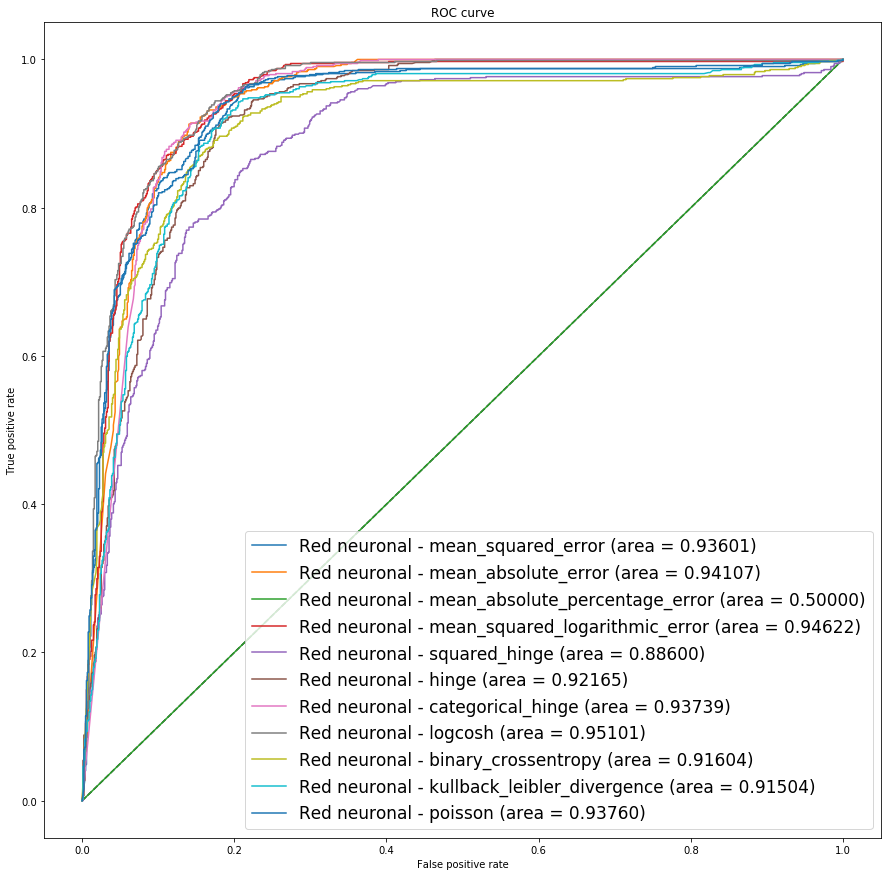

<Figure size 432x288 with 0 Axes>

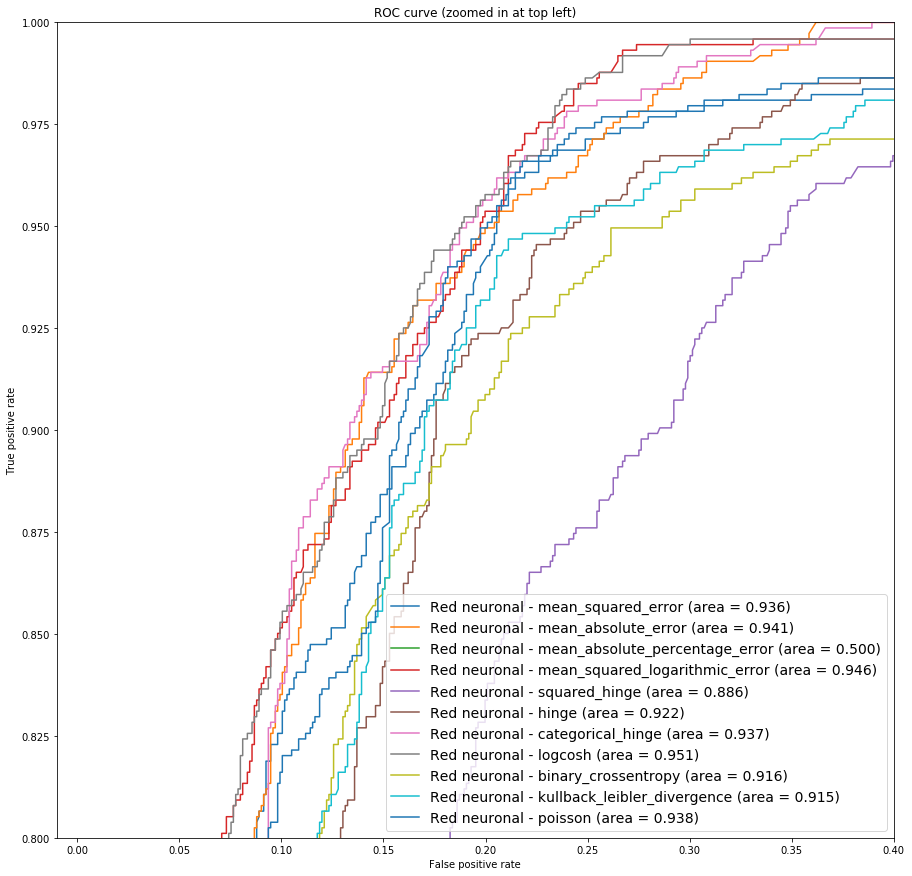

In [38]:
plt.subplots(figsize=(15,15))
plt.figure(1)
plt.plot([0, 1], [0, 1], 'k--')

plt.plot(fpr_keras, tpr_keras, label='Red neuronal - mean_squared_error (area = {:.5f})'.format(auc_keras))
plt.plot(fpr_keras2, tpr_keras2, label='Red neuronal - mean_absolute_error (area = {:.5f})'.format(auc_keras2))
plt.plot(fpr_keras3, tpr_keras3, label='Red neuronal - mean_absolute_percentage_error (area = {:.5f})'.format(auc_keras3))
plt.plot(fpr_keras4, tpr_keras4, label='Red neuronal - mean_squared_logarithmic_error (area = {:.5f})'.format(auc_keras4))
plt.plot(fpr_keras5, tpr_keras5, label='Red neuronal - squared_hinge (area = {:.5f})'.format(auc_keras5))
plt.plot(fpr_keras6, tpr_keras6, label='Red neuronal - hinge (area = {:.5f})'.format(auc_keras6))
plt.plot(fpr_keras7, tpr_keras7, label='Red neuronal - categorical_hinge (area = {:.5f})'.format(auc_keras7))
plt.plot(fpr_keras8, tpr_keras8, label='Red neuronal - logcosh (area = {:.5f})'.format(auc_keras8))
plt.plot(fpr_keras9, tpr_keras9, label='Red neuronal - binary_crossentropy (area = {:.5f})'.format(auc_keras9))
plt.plot(fpr_keras10, tpr_keras10, label='Red neuronal - kullback_leibler_divergence (area = {:.5f})'.format(auc_keras10))
plt.plot(fpr_keras11, tpr_keras11, label='Red neuronal - poisson (area = {:.5f})'.format(auc_keras11))

plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve')
plt.legend(loc='best',prop={'size': 17})
plt.show()

plt.figure(2)
plt.subplots(figsize=(15,15))
plt.xlim(-0.01, 0.4)
plt.ylim(0.8, 1)
plt.plot([0, 1], [0, 1], 'k--')

plt.plot(fpr_keras, tpr_keras, label='Red neuronal - mean_squared_error (area = {:.3f})'.format(auc_keras))
plt.plot(fpr_keras2, tpr_keras2, label='Red neuronal - mean_absolute_error (area = {:.3f})'.format(auc_keras2))
plt.plot(fpr_keras3, tpr_keras3, label='Red neuronal - mean_absolute_percentage_error (area = {:.3f})'.format(auc_keras3))
plt.plot(fpr_keras4, tpr_keras4, label='Red neuronal - mean_squared_logarithmic_error (area = {:.3f})'.format(auc_keras4))
plt.plot(fpr_keras5, tpr_keras5, label='Red neuronal - squared_hinge (area = {:.3f})'.format(auc_keras5))
plt.plot(fpr_keras6, tpr_keras6, label='Red neuronal - hinge (area = {:.3f})'.format(auc_keras6))
plt.plot(fpr_keras7, tpr_keras7, label='Red neuronal - categorical_hinge (area = {:.3f})'.format(auc_keras7))
plt.plot(fpr_keras8, tpr_keras8, label='Red neuronal - logcosh (area = {:.3f})'.format(auc_keras8))
plt.plot(fpr_keras9, tpr_keras9, label='Red neuronal - binary_crossentropy (area = {:.3f})'.format(auc_keras9))
plt.plot(fpr_keras10, tpr_keras10, label='Red neuronal - kullback_leibler_divergence (area = {:.3f})'.format(auc_keras10))
plt.plot(fpr_keras11, tpr_keras11, label='Red neuronal - poisson (area = {:.3f})'.format(auc_keras11))

plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve (zoomed in at top left)')
plt.legend(loc='best',prop={'size': 14})

plt.show()

In [14]:
model12.compile(loss='mean_absolute_error',
              optimizer='sgd',
              metrics=['accuracy'])
                   
history12 = model12.fit(X_train, y_train,epochs=5000, validation_split=0.33, batch_size=50, verbose=1)

Train on 462 samples, validate on 228 samples
Epoch 1/5000
462/462 [==============================] - 1s 1ms/step - loss: 0.4996 - acc: 0.6190 - val_loss: 0.4996 - val_acc: 0.6096
Epoch 2/5000
462/462 [==============================] - 0s 26us/step - loss: 0.4996 - acc: 0.5779 - val_loss: 0.4996 - val_acc: 0.5526
Epoch 3/5000
462/462 [==============================] - 0s 26us/step - loss: 0.4995 - acc: 0.5498 - val_loss: 0.4995 - val_acc: 0.5439
Epoch 4/5000
462/462 [==============================] - 0s 26us/step - loss: 0.4995 - acc: 0.5476 - val_loss: 0.4995 - val_acc: 0.5307
Epoch 5/5000
462/462 [==============================] - 0s 28us/step - loss: 0.4994 - acc: 0.5455 - val_loss: 0.4994 - val_acc: 0.5263
Epoch 6/5000
462/462 [==============================] - 0s 32us/step - loss: 0.4994 - acc: 0.5455 - val_loss: 0.4994 - val_acc: 0.5263
Epoch 7/5000
462/462 [==============================] - 0s 30us/step - loss: 0.4993 - acc: 0.5455 - val_loss: 0.4994 - val_acc: 0.5263
Epoch 8/50

Epoch 61/5000
462/462 [==============================] - 0s 26us/step - loss: 0.4961 - acc: 0.5433 - val_loss: 0.4971 - val_acc: 0.5263
Epoch 62/5000
462/462 [==============================] - 0s 30us/step - loss: 0.4961 - acc: 0.5433 - val_loss: 0.4971 - val_acc: 0.5263
Epoch 63/5000
462/462 [==============================] - 0s 28us/step - loss: 0.4960 - acc: 0.5433 - val_loss: 0.4971 - val_acc: 0.5263
Epoch 64/5000
462/462 [==============================] - 0s 26us/step - loss: 0.4960 - acc: 0.5433 - val_loss: 0.4970 - val_acc: 0.5263
Epoch 65/5000
462/462 [==============================] - 0s 28us/step - loss: 0.4959 - acc: 0.5433 - val_loss: 0.4970 - val_acc: 0.5263
Epoch 66/5000
462/462 [==============================] - 0s 28us/step - loss: 0.4959 - acc: 0.5433 - val_loss: 0.4970 - val_acc: 0.5263
Epoch 67/5000
462/462 [==============================] - 0s 24us/step - loss: 0.4958 - acc: 0.5433 - val_loss: 0.4969 - val_acc: 0.5263
Epoch 68/5000
462/462 [=========================

462/462 [==============================] - 0s 39us/step - loss: 0.4924 - acc: 0.5433 - val_loss: 0.4943 - val_acc: 0.5263
Epoch 122/5000
462/462 [==============================] - 0s 43us/step - loss: 0.4923 - acc: 0.5433 - val_loss: 0.4943 - val_acc: 0.5263
Epoch 123/5000
462/462 [==============================] - 0s 37us/step - loss: 0.4922 - acc: 0.5433 - val_loss: 0.4942 - val_acc: 0.5263
Epoch 124/5000
462/462 [==============================] - 0s 24us/step - loss: 0.4921 - acc: 0.5433 - val_loss: 0.4942 - val_acc: 0.5263
Epoch 125/5000
462/462 [==============================] - 0s 28us/step - loss: 0.4920 - acc: 0.5433 - val_loss: 0.4941 - val_acc: 0.5263
Epoch 126/5000
462/462 [==============================] - 0s 28us/step - loss: 0.4919 - acc: 0.5433 - val_loss: 0.4941 - val_acc: 0.5263
Epoch 127/5000
462/462 [==============================] - 0s 26us/step - loss: 0.4919 - acc: 0.5433 - val_loss: 0.4940 - val_acc: 0.5263
Epoch 128/5000
462/462 [==============================] 

Epoch 181/5000
462/462 [==============================] - 0s 28us/step - loss: 0.4874 - acc: 0.5433 - val_loss: 0.4903 - val_acc: 0.5263
Epoch 182/5000
462/462 [==============================] - 0s 26us/step - loss: 0.4873 - acc: 0.5433 - val_loss: 0.4902 - val_acc: 0.5263
Epoch 183/5000
462/462 [==============================] - 0s 26us/step - loss: 0.4872 - acc: 0.5433 - val_loss: 0.4901 - val_acc: 0.5263
Epoch 184/5000
462/462 [==============================] - 0s 28us/step - loss: 0.4871 - acc: 0.5433 - val_loss: 0.4900 - val_acc: 0.5263
Epoch 185/5000
462/462 [==============================] - 0s 24us/step - loss: 0.4870 - acc: 0.5433 - val_loss: 0.4899 - val_acc: 0.5263
Epoch 186/5000
462/462 [==============================] - 0s 26us/step - loss: 0.4869 - acc: 0.5433 - val_loss: 0.4898 - val_acc: 0.5263
Epoch 187/5000
462/462 [==============================] - 0s 24us/step - loss: 0.4868 - acc: 0.5433 - val_loss: 0.4897 - val_acc: 0.5263
Epoch 188/5000
462/462 [=================

Epoch 241/5000
462/462 [==============================] - 0s 28us/step - loss: 0.4786 - acc: 0.5433 - val_loss: 0.4819 - val_acc: 0.5263
Epoch 242/5000
462/462 [==============================] - 0s 24us/step - loss: 0.4784 - acc: 0.5433 - val_loss: 0.4817 - val_acc: 0.5263
Epoch 243/5000
462/462 [==============================] - 0s 26us/step - loss: 0.4782 - acc: 0.5433 - val_loss: 0.4814 - val_acc: 0.5263
Epoch 244/5000
462/462 [==============================] - 0s 30us/step - loss: 0.4779 - acc: 0.5433 - val_loss: 0.4812 - val_acc: 0.5263
Epoch 245/5000
462/462 [==============================] - 0s 26us/step - loss: 0.4777 - acc: 0.5433 - val_loss: 0.4810 - val_acc: 0.5263
Epoch 246/5000
462/462 [==============================] - 0s 26us/step - loss: 0.4775 - acc: 0.5433 - val_loss: 0.4807 - val_acc: 0.5263
Epoch 247/5000
462/462 [==============================] - 0s 26us/step - loss: 0.4772 - acc: 0.5433 - val_loss: 0.4805 - val_acc: 0.5263
Epoch 248/5000
462/462 [=================

Epoch 301/5000
462/462 [==============================] - 0s 26us/step - loss: 0.4538 - acc: 0.5433 - val_loss: 0.4563 - val_acc: 0.5263
Epoch 302/5000
462/462 [==============================] - 0s 24us/step - loss: 0.4531 - acc: 0.5433 - val_loss: 0.4556 - val_acc: 0.5263
Epoch 303/5000
462/462 [==============================] - 0s 28us/step - loss: 0.4523 - acc: 0.5433 - val_loss: 0.4548 - val_acc: 0.5263
Epoch 304/5000
462/462 [==============================] - 0s 26us/step - loss: 0.4515 - acc: 0.5433 - val_loss: 0.4540 - val_acc: 0.5263
Epoch 305/5000
462/462 [==============================] - 0s 28us/step - loss: 0.4507 - acc: 0.5433 - val_loss: 0.4531 - val_acc: 0.5263
Epoch 306/5000
462/462 [==============================] - 0s 24us/step - loss: 0.4499 - acc: 0.5433 - val_loss: 0.4523 - val_acc: 0.5263
Epoch 307/5000
462/462 [==============================] - 0s 26us/step - loss: 0.4491 - acc: 0.5433 - val_loss: 0.4514 - val_acc: 0.5263
Epoch 308/5000
462/462 [=================

Epoch 361/5000
462/462 [==============================] - 0s 24us/step - loss: 0.3657 - acc: 0.6688 - val_loss: 0.3619 - val_acc: 0.6754
Epoch 362/5000
462/462 [==============================] - 0s 28us/step - loss: 0.3634 - acc: 0.6797 - val_loss: 0.3592 - val_acc: 0.6798
Epoch 363/5000
462/462 [==============================] - 0s 32us/step - loss: 0.3609 - acc: 0.6818 - val_loss: 0.3566 - val_acc: 0.6798
Epoch 364/5000
462/462 [==============================] - 0s 32us/step - loss: 0.3585 - acc: 0.6883 - val_loss: 0.3539 - val_acc: 0.6886
Epoch 365/5000
462/462 [==============================] - 0s 30us/step - loss: 0.3560 - acc: 0.6926 - val_loss: 0.3512 - val_acc: 0.6974
Epoch 366/5000
462/462 [==============================] - 0s 28us/step - loss: 0.3536 - acc: 0.6970 - val_loss: 0.3485 - val_acc: 0.6974
Epoch 367/5000
462/462 [==============================] - 0s 30us/step - loss: 0.3511 - acc: 0.6991 - val_loss: 0.3457 - val_acc: 0.7018
Epoch 368/5000
462/462 [=================

462/462 [==============================] - 0s 32us/step - loss: 0.2211 - acc: 0.8355 - val_loss: 0.2113 - val_acc: 0.8421
Epoch 421/5000
462/462 [==============================] - 0s 28us/step - loss: 0.2194 - acc: 0.8377 - val_loss: 0.2097 - val_acc: 0.8421
Epoch 422/5000
462/462 [==============================] - 0s 32us/step - loss: 0.2178 - acc: 0.8377 - val_loss: 0.2081 - val_acc: 0.8465
Epoch 423/5000
462/462 [==============================] - 0s 35us/step - loss: 0.2161 - acc: 0.8377 - val_loss: 0.2066 - val_acc: 0.8509
Epoch 424/5000
462/462 [==============================] - 0s 32us/step - loss: 0.2146 - acc: 0.8398 - val_loss: 0.2051 - val_acc: 0.8509
Epoch 425/5000
462/462 [==============================] - 0s 37us/step - loss: 0.2130 - acc: 0.8442 - val_loss: 0.2037 - val_acc: 0.8553
Epoch 426/5000
462/462 [==============================] - 0s 32us/step - loss: 0.2115 - acc: 0.8442 - val_loss: 0.2022 - val_acc: 0.8553
Epoch 427/5000
462/462 [==============================] 

Epoch 480/5000
462/462 [==============================] - 0s 32us/step - loss: 0.1596 - acc: 0.8788 - val_loss: 0.1564 - val_acc: 0.8684
Epoch 481/5000
462/462 [==============================] - 0s 26us/step - loss: 0.1590 - acc: 0.8788 - val_loss: 0.1558 - val_acc: 0.8684
Epoch 482/5000
462/462 [==============================] - 0s 26us/step - loss: 0.1583 - acc: 0.8788 - val_loss: 0.1553 - val_acc: 0.8684
Epoch 483/5000
462/462 [==============================] - 0s 28us/step - loss: 0.1577 - acc: 0.8788 - val_loss: 0.1548 - val_acc: 0.8684
Epoch 484/5000
462/462 [==============================] - 0s 26us/step - loss: 0.1570 - acc: 0.8810 - val_loss: 0.1544 - val_acc: 0.8728
Epoch 485/5000
462/462 [==============================] - 0s 26us/step - loss: 0.1564 - acc: 0.8810 - val_loss: 0.1539 - val_acc: 0.8728
Epoch 486/5000
462/462 [==============================] - 0s 30us/step - loss: 0.1558 - acc: 0.8831 - val_loss: 0.1535 - val_acc: 0.8728
Epoch 487/5000
462/462 [=================

Epoch 540/5000
462/462 [==============================] - 0s 35us/step - loss: 0.1309 - acc: 0.8983 - val_loss: 0.1353 - val_acc: 0.8904
Epoch 541/5000
462/462 [==============================] - 0s 30us/step - loss: 0.1306 - acc: 0.8983 - val_loss: 0.1351 - val_acc: 0.8904
Epoch 542/5000
462/462 [==============================] - 0s 28us/step - loss: 0.1303 - acc: 0.8983 - val_loss: 0.1348 - val_acc: 0.8904
Epoch 543/5000
462/462 [==============================] - 0s 28us/step - loss: 0.1300 - acc: 0.8983 - val_loss: 0.1347 - val_acc: 0.8904
Epoch 544/5000
462/462 [==============================] - 0s 26us/step - loss: 0.1297 - acc: 0.8961 - val_loss: 0.1345 - val_acc: 0.8904
Epoch 545/5000
462/462 [==============================] - 0s 24us/step - loss: 0.1294 - acc: 0.8961 - val_loss: 0.1342 - val_acc: 0.8904
Epoch 546/5000
462/462 [==============================] - 0s 24us/step - loss: 0.1290 - acc: 0.8961 - val_loss: 0.1340 - val_acc: 0.8904
Epoch 547/5000
462/462 [=================

Epoch 600/5000
462/462 [==============================] - 0s 26us/step - loss: 0.1155 - acc: 0.9091 - val_loss: 0.1251 - val_acc: 0.8947
Epoch 601/5000
462/462 [==============================] - 0s 28us/step - loss: 0.1153 - acc: 0.9091 - val_loss: 0.1250 - val_acc: 0.8947
Epoch 602/5000
462/462 [==============================] - 0s 28us/step - loss: 0.1151 - acc: 0.9091 - val_loss: 0.1248 - val_acc: 0.8947
Epoch 603/5000
462/462 [==============================] - 0s 26us/step - loss: 0.1149 - acc: 0.9091 - val_loss: 0.1247 - val_acc: 0.8947
Epoch 604/5000
462/462 [==============================] - 0s 28us/step - loss: 0.1147 - acc: 0.9091 - val_loss: 0.1246 - val_acc: 0.8947
Epoch 605/5000
462/462 [==============================] - 0s 28us/step - loss: 0.1145 - acc: 0.9091 - val_loss: 0.1243 - val_acc: 0.8947
Epoch 606/5000
462/462 [==============================] - 0s 26us/step - loss: 0.1143 - acc: 0.9091 - val_loss: 0.1242 - val_acc: 0.8947
Epoch 607/5000
462/462 [=================

Epoch 660/5000
462/462 [==============================] - 0s 28us/step - loss: 0.1065 - acc: 0.9113 - val_loss: 0.1198 - val_acc: 0.8947
Epoch 661/5000
462/462 [==============================] - 0s 30us/step - loss: 0.1064 - acc: 0.9113 - val_loss: 0.1197 - val_acc: 0.8947
Epoch 662/5000
462/462 [==============================] - 0s 37us/step - loss: 0.1063 - acc: 0.9113 - val_loss: 0.1196 - val_acc: 0.8947
Epoch 663/5000
462/462 [==============================] - 0s 41us/step - loss: 0.1061 - acc: 0.9113 - val_loss: 0.1196 - val_acc: 0.8947
Epoch 664/5000
462/462 [==============================] - 0s 41us/step - loss: 0.1060 - acc: 0.9113 - val_loss: 0.1195 - val_acc: 0.8947
Epoch 665/5000
462/462 [==============================] - 0s 37us/step - loss: 0.1059 - acc: 0.9113 - val_loss: 0.1195 - val_acc: 0.8947
Epoch 666/5000
462/462 [==============================] - 0s 39us/step - loss: 0.1058 - acc: 0.9113 - val_loss: 0.1195 - val_acc: 0.8947
Epoch 667/5000
462/462 [=================

Epoch 720/5000
462/462 [==============================] - 0s 30us/step - loss: 0.1011 - acc: 0.9156 - val_loss: 0.1174 - val_acc: 0.8947
Epoch 721/5000
462/462 [==============================] - 0s 28us/step - loss: 0.1010 - acc: 0.9156 - val_loss: 0.1174 - val_acc: 0.8947
Epoch 722/5000
462/462 [==============================] - 0s 28us/step - loss: 0.1010 - acc: 0.9156 - val_loss: 0.1173 - val_acc: 0.8947
Epoch 723/5000
462/462 [==============================] - 0s 28us/step - loss: 0.1009 - acc: 0.9156 - val_loss: 0.1173 - val_acc: 0.8947
Epoch 724/5000
462/462 [==============================] - 0s 30us/step - loss: 0.1008 - acc: 0.9156 - val_loss: 0.1172 - val_acc: 0.8947
Epoch 725/5000
462/462 [==============================] - 0s 28us/step - loss: 0.1007 - acc: 0.9156 - val_loss: 0.1171 - val_acc: 0.8947
Epoch 726/5000
462/462 [==============================] - 0s 26us/step - loss: 0.1007 - acc: 0.9156 - val_loss: 0.1171 - val_acc: 0.8947
Epoch 727/5000
462/462 [=================

462/462 [==============================] - 0s 26us/step - loss: 0.0978 - acc: 0.9156 - val_loss: 0.1159 - val_acc: 0.8904
Epoch 780/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0978 - acc: 0.9156 - val_loss: 0.1159 - val_acc: 0.8947
Epoch 781/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0978 - acc: 0.9156 - val_loss: 0.1158 - val_acc: 0.8947
Epoch 782/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0977 - acc: 0.9156 - val_loss: 0.1158 - val_acc: 0.8947
Epoch 783/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0977 - acc: 0.9156 - val_loss: 0.1158 - val_acc: 0.8904
Epoch 784/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0976 - acc: 0.9156 - val_loss: 0.1158 - val_acc: 0.8904
Epoch 785/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0976 - acc: 0.9156 - val_loss: 0.1158 - val_acc: 0.8904
Epoch 786/5000
462/462 [==============================] 

Epoch 839/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0956 - acc: 0.9156 - val_loss: 0.1152 - val_acc: 0.8904
Epoch 840/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0956 - acc: 0.9156 - val_loss: 0.1152 - val_acc: 0.8904
Epoch 841/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0955 - acc: 0.9156 - val_loss: 0.1152 - val_acc: 0.8904
Epoch 842/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0955 - acc: 0.9156 - val_loss: 0.1152 - val_acc: 0.8904
Epoch 843/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0955 - acc: 0.9156 - val_loss: 0.1151 - val_acc: 0.8904
Epoch 844/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0954 - acc: 0.9156 - val_loss: 0.1151 - val_acc: 0.8904
Epoch 845/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0954 - acc: 0.9156 - val_loss: 0.1151 - val_acc: 0.8904
Epoch 846/5000
462/462 [=================

Epoch 899/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0939 - acc: 0.9156 - val_loss: 0.1144 - val_acc: 0.8904
Epoch 900/5000
462/462 [==============================] - 0s 56us/step - loss: 0.0939 - acc: 0.9156 - val_loss: 0.1143 - val_acc: 0.8904
Epoch 901/5000
462/462 [==============================] - 0s 56us/step - loss: 0.0939 - acc: 0.9156 - val_loss: 0.1143 - val_acc: 0.8904
Epoch 902/5000
462/462 [==============================] - 0s 50us/step - loss: 0.0939 - acc: 0.9156 - val_loss: 0.1143 - val_acc: 0.8904
Epoch 903/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0939 - acc: 0.9156 - val_loss: 0.1142 - val_acc: 0.8904
Epoch 904/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0938 - acc: 0.9156 - val_loss: 0.1142 - val_acc: 0.8904
Epoch 905/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0938 - acc: 0.9156 - val_loss: 0.1142 - val_acc: 0.8904
Epoch 906/5000
462/462 [=================

Epoch 959/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0927 - acc: 0.9156 - val_loss: 0.1137 - val_acc: 0.8904
Epoch 960/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0927 - acc: 0.9156 - val_loss: 0.1137 - val_acc: 0.8904
Epoch 961/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0926 - acc: 0.9156 - val_loss: 0.1137 - val_acc: 0.8904
Epoch 962/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0926 - acc: 0.9156 - val_loss: 0.1137 - val_acc: 0.8904
Epoch 963/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0926 - acc: 0.9156 - val_loss: 0.1137 - val_acc: 0.8904
Epoch 964/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0926 - acc: 0.9156 - val_loss: 0.1137 - val_acc: 0.8904
Epoch 965/5000
462/462 [==============================] - 0s 48us/step - loss: 0.0926 - acc: 0.9156 - val_loss: 0.1137 - val_acc: 0.8904
Epoch 966/5000
462/462 [=================

462/462 [==============================] - 0s 28us/step - loss: 0.0917 - acc: 0.9156 - val_loss: 0.1134 - val_acc: 0.8904
Epoch 1019/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0917 - acc: 0.9156 - val_loss: 0.1134 - val_acc: 0.8904
Epoch 1020/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0917 - acc: 0.9156 - val_loss: 0.1134 - val_acc: 0.8904
Epoch 1021/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0917 - acc: 0.9156 - val_loss: 0.1134 - val_acc: 0.8904
Epoch 1022/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0917 - acc: 0.9156 - val_loss: 0.1133 - val_acc: 0.8904
Epoch 1023/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0917 - acc: 0.9156 - val_loss: 0.1132 - val_acc: 0.8904
Epoch 1024/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0916 - acc: 0.9156 - val_loss: 0.1131 - val_acc: 0.8904
Epoch 1025/5000
462/462 [=========================

462/462 [==============================] - 0s 30us/step - loss: 0.0909 - acc: 0.9156 - val_loss: 0.1125 - val_acc: 0.8904
Epoch 1078/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0909 - acc: 0.9156 - val_loss: 0.1124 - val_acc: 0.8904
Epoch 1079/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0909 - acc: 0.9156 - val_loss: 0.1124 - val_acc: 0.8904
Epoch 1080/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0909 - acc: 0.9156 - val_loss: 0.1123 - val_acc: 0.8947
Epoch 1081/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0909 - acc: 0.9156 - val_loss: 0.1123 - val_acc: 0.8947
Epoch 1082/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0909 - acc: 0.9156 - val_loss: 0.1124 - val_acc: 0.8947
Epoch 1083/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0909 - acc: 0.9156 - val_loss: 0.1124 - val_acc: 0.8904
Epoch 1084/5000
462/462 [=========================

462/462 [==============================] - 0s 39us/step - loss: 0.0903 - acc: 0.9156 - val_loss: 0.1124 - val_acc: 0.8904
Epoch 1137/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0903 - acc: 0.9156 - val_loss: 0.1125 - val_acc: 0.8904
Epoch 1138/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0903 - acc: 0.9156 - val_loss: 0.1126 - val_acc: 0.8904
Epoch 1139/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0902 - acc: 0.9156 - val_loss: 0.1125 - val_acc: 0.8904
Epoch 1140/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0902 - acc: 0.9156 - val_loss: 0.1125 - val_acc: 0.8904
Epoch 1141/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0902 - acc: 0.9156 - val_loss: 0.1125 - val_acc: 0.8904
Epoch 1142/5000
462/462 [==============================] - 0s 50us/step - loss: 0.0902 - acc: 0.9156 - val_loss: 0.1126 - val_acc: 0.8904
Epoch 1143/5000
462/462 [=========================

462/462 [==============================] - 0s 39us/step - loss: 0.0897 - acc: 0.9156 - val_loss: 0.1124 - val_acc: 0.8904
Epoch 1196/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0897 - acc: 0.9156 - val_loss: 0.1124 - val_acc: 0.8904
Epoch 1197/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0897 - acc: 0.9156 - val_loss: 0.1124 - val_acc: 0.8904
Epoch 1198/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0897 - acc: 0.9156 - val_loss: 0.1124 - val_acc: 0.8904
Epoch 1199/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0897 - acc: 0.9156 - val_loss: 0.1122 - val_acc: 0.8904
Epoch 1200/5000
462/462 [==============================] - ETA: 0s - loss: 0.0847 - acc: 0.920 - 0s 39us/step - loss: 0.0897 - acc: 0.9156 - val_loss: 0.1122 - val_acc: 0.8904
Epoch 1201/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0897 - acc: 0.9156 - val_loss: 0.1121 - val_acc: 0.8904
Epoch 1202/5

462/462 [==============================] - 0s 32us/step - loss: 0.0892 - acc: 0.9156 - val_loss: 0.1119 - val_acc: 0.8904
Epoch 1255/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0892 - acc: 0.9156 - val_loss: 0.1119 - val_acc: 0.8904
Epoch 1256/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0892 - acc: 0.9156 - val_loss: 0.1119 - val_acc: 0.8904
Epoch 1257/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0892 - acc: 0.9156 - val_loss: 0.1119 - val_acc: 0.8904
Epoch 1258/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0892 - acc: 0.9156 - val_loss: 0.1119 - val_acc: 0.8904
Epoch 1259/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0892 - acc: 0.9156 - val_loss: 0.1119 - val_acc: 0.8904
Epoch 1260/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0892 - acc: 0.9156 - val_loss: 0.1119 - val_acc: 0.8904
Epoch 1261/5000
462/462 [=========================

462/462 [==============================] - 0s 45us/step - loss: 0.0888 - acc: 0.9156 - val_loss: 0.1118 - val_acc: 0.8904
Epoch 1314/5000
462/462 [==============================] - 0s 97us/step - loss: 0.0888 - acc: 0.9156 - val_loss: 0.1118 - val_acc: 0.8904
Epoch 1315/5000
462/462 [==============================] - 0s 67us/step - loss: 0.0888 - acc: 0.9156 - val_loss: 0.1118 - val_acc: 0.8904
Epoch 1316/5000
462/462 [==============================] - 0s 48us/step - loss: 0.0888 - acc: 0.9156 - val_loss: 0.1118 - val_acc: 0.8904
Epoch 1317/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0888 - acc: 0.9156 - val_loss: 0.1118 - val_acc: 0.8904
Epoch 1318/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0888 - acc: 0.9177 - val_loss: 0.1119 - val_acc: 0.8904
Epoch 1319/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0888 - acc: 0.9156 - val_loss: 0.1118 - val_acc: 0.8904
Epoch 1320/5000
462/462 [=========================

462/462 [==============================] - 0s 41us/step - loss: 0.0885 - acc: 0.9156 - val_loss: 0.1111 - val_acc: 0.8947
Epoch 1373/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0885 - acc: 0.9156 - val_loss: 0.1111 - val_acc: 0.8947
Epoch 1374/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0884 - acc: 0.9156 - val_loss: 0.1110 - val_acc: 0.8947
Epoch 1375/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0884 - acc: 0.9156 - val_loss: 0.1110 - val_acc: 0.8947
Epoch 1376/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0884 - acc: 0.9156 - val_loss: 0.1112 - val_acc: 0.8947
Epoch 1377/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0884 - acc: 0.9156 - val_loss: 0.1112 - val_acc: 0.8947
Epoch 1378/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0884 - acc: 0.9156 - val_loss: 0.1112 - val_acc: 0.8947
Epoch 1379/5000
462/462 [=========================

462/462 [==============================] - 0s 24us/step - loss: 0.0882 - acc: 0.9156 - val_loss: 0.1110 - val_acc: 0.8947
Epoch 1432/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0881 - acc: 0.9156 - val_loss: 0.1110 - val_acc: 0.8947
Epoch 1433/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0881 - acc: 0.9156 - val_loss: 0.1110 - val_acc: 0.8947
Epoch 1434/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0881 - acc: 0.9156 - val_loss: 0.1110 - val_acc: 0.8947
Epoch 1435/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0881 - acc: 0.9156 - val_loss: 0.1109 - val_acc: 0.8947
Epoch 1436/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0881 - acc: 0.9156 - val_loss: 0.1109 - val_acc: 0.8947
Epoch 1437/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0881 - acc: 0.9156 - val_loss: 0.1109 - val_acc: 0.8947
Epoch 1438/5000
462/462 [=========================

462/462 [==============================] - 0s 58us/step - loss: 0.0879 - acc: 0.9156 - val_loss: 0.1100 - val_acc: 0.8947
Epoch 1491/5000
462/462 [==============================] - 0s 82us/step - loss: 0.0879 - acc: 0.9156 - val_loss: 0.1100 - val_acc: 0.8947
Epoch 1492/5000
462/462 [==============================] - 0s 58us/step - loss: 0.0879 - acc: 0.9156 - val_loss: 0.1100 - val_acc: 0.8947
Epoch 1493/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0878 - acc: 0.9156 - val_loss: 0.1100 - val_acc: 0.8947
Epoch 1494/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0879 - acc: 0.9156 - val_loss: 0.1100 - val_acc: 0.8947
Epoch 1495/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0878 - acc: 0.9156 - val_loss: 0.1100 - val_acc: 0.8947
Epoch 1496/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0878 - acc: 0.9156 - val_loss: 0.1100 - val_acc: 0.8947
Epoch 1497/5000
462/462 [=========================

462/462 [==============================] - 0s 28us/step - loss: 0.0876 - acc: 0.9156 - val_loss: 0.1095 - val_acc: 0.8947
Epoch 1550/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0876 - acc: 0.9156 - val_loss: 0.1095 - val_acc: 0.8947
Epoch 1551/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0876 - acc: 0.9156 - val_loss: 0.1095 - val_acc: 0.8947
Epoch 1552/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0876 - acc: 0.9156 - val_loss: 0.1095 - val_acc: 0.8947
Epoch 1553/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0876 - acc: 0.9156 - val_loss: 0.1095 - val_acc: 0.8947
Epoch 1554/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0876 - acc: 0.9156 - val_loss: 0.1096 - val_acc: 0.8947
Epoch 1555/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0876 - acc: 0.9156 - val_loss: 0.1096 - val_acc: 0.8947
Epoch 1556/5000
462/462 [=========================

462/462 [==============================] - 0s 69us/step - loss: 0.0874 - acc: 0.9156 - val_loss: 0.1095 - val_acc: 0.8947
Epoch 1609/5000
462/462 [==============================] - 0s 52us/step - loss: 0.0874 - acc: 0.9156 - val_loss: 0.1096 - val_acc: 0.8947
Epoch 1610/5000
462/462 [==============================] - 0s 48us/step - loss: 0.0873 - acc: 0.9156 - val_loss: 0.1096 - val_acc: 0.8947
Epoch 1611/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0873 - acc: 0.9156 - val_loss: 0.1096 - val_acc: 0.8947
Epoch 1612/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0873 - acc: 0.9156 - val_loss: 0.1097 - val_acc: 0.8947
Epoch 1613/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0873 - acc: 0.9156 - val_loss: 0.1097 - val_acc: 0.8947
Epoch 1614/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0873 - acc: 0.9156 - val_loss: 0.1097 - val_acc: 0.8947
Epoch 1615/5000
462/462 [=========================

462/462 [==============================] - 0s 28us/step - loss: 0.0871 - acc: 0.9156 - val_loss: 0.1089 - val_acc: 0.8947
Epoch 1668/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0871 - acc: 0.9156 - val_loss: 0.1089 - val_acc: 0.8947
Epoch 1669/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0871 - acc: 0.9156 - val_loss: 0.1089 - val_acc: 0.8947
Epoch 1670/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0871 - acc: 0.9156 - val_loss: 0.1088 - val_acc: 0.8947
Epoch 1671/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0871 - acc: 0.9156 - val_loss: 0.1088 - val_acc: 0.8947
Epoch 1672/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0871 - acc: 0.9156 - val_loss: 0.1088 - val_acc: 0.8947
Epoch 1673/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0871 - acc: 0.9156 - val_loss: 0.1088 - val_acc: 0.8947
Epoch 1674/5000
462/462 [=========================

462/462 [==============================] - 0s 43us/step - loss: 0.0869 - acc: 0.9156 - val_loss: 0.1087 - val_acc: 0.8947
Epoch 1727/5000
462/462 [==============================] - 0s 216us/step - loss: 0.0869 - acc: 0.9156 - val_loss: 0.1087 - val_acc: 0.8947
Epoch 1728/5000
462/462 [==============================] - 0s 76us/step - loss: 0.0869 - acc: 0.9156 - val_loss: 0.1087 - val_acc: 0.8947
Epoch 1729/5000
462/462 [==============================] - 0s 56us/step - loss: 0.0869 - acc: 0.9156 - val_loss: 0.1087 - val_acc: 0.8947
Epoch 1730/5000
462/462 [==============================] - 0s 48us/step - loss: 0.0870 - acc: 0.9156 - val_loss: 0.1087 - val_acc: 0.8947
Epoch 1731/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0869 - acc: 0.9156 - val_loss: 0.1087 - val_acc: 0.8947
Epoch 1732/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0869 - acc: 0.9177 - val_loss: 0.1087 - val_acc: 0.8947
Epoch 1733/5000
462/462 [========================

462/462 [==============================] - 0s 35us/step - loss: 0.0868 - acc: 0.9156 - val_loss: 0.1086 - val_acc: 0.8947
Epoch 1786/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0868 - acc: 0.9156 - val_loss: 0.1086 - val_acc: 0.8947
Epoch 1787/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0868 - acc: 0.9156 - val_loss: 0.1086 - val_acc: 0.8947
Epoch 1788/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0867 - acc: 0.9156 - val_loss: 0.1086 - val_acc: 0.8947
Epoch 1789/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0867 - acc: 0.9177 - val_loss: 0.1086 - val_acc: 0.8947
Epoch 1790/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0867 - acc: 0.9156 - val_loss: 0.1086 - val_acc: 0.8947
Epoch 1791/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0867 - acc: 0.9156 - val_loss: 0.1086 - val_acc: 0.8947
Epoch 1792/5000
462/462 [=========================

462/462 [==============================] - 0s 26us/step - loss: 0.0866 - acc: 0.9156 - val_loss: 0.1088 - val_acc: 0.8947
Epoch 1845/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0866 - acc: 0.9156 - val_loss: 0.1088 - val_acc: 0.8947
Epoch 1846/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0866 - acc: 0.9156 - val_loss: 0.1088 - val_acc: 0.8947
Epoch 1847/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0866 - acc: 0.9156 - val_loss: 0.1089 - val_acc: 0.8947
Epoch 1848/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0866 - acc: 0.9156 - val_loss: 0.1089 - val_acc: 0.8947
Epoch 1849/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0866 - acc: 0.9156 - val_loss: 0.1089 - val_acc: 0.8947
Epoch 1850/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0866 - acc: 0.9156 - val_loss: 0.1089 - val_acc: 0.8947
Epoch 1851/5000
462/462 [=========================

462/462 [==============================] - 0s 39us/step - loss: 0.0864 - acc: 0.9177 - val_loss: 0.1080 - val_acc: 0.8947
Epoch 1904/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0864 - acc: 0.9177 - val_loss: 0.1080 - val_acc: 0.8947
Epoch 1905/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0864 - acc: 0.9177 - val_loss: 0.1080 - val_acc: 0.8947
Epoch 1906/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0864 - acc: 0.9177 - val_loss: 0.1080 - val_acc: 0.8947
Epoch 1907/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0864 - acc: 0.9177 - val_loss: 0.1080 - val_acc: 0.8947
Epoch 1908/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0864 - acc: 0.9156 - val_loss: 0.1080 - val_acc: 0.8947
Epoch 1909/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0864 - acc: 0.9177 - val_loss: 0.1080 - val_acc: 0.8947
Epoch 1910/5000
462/462 [=========================

462/462 [==============================] - 0s 22us/step - loss: 0.0862 - acc: 0.9156 - val_loss: 0.1078 - val_acc: 0.8991
Epoch 1963/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0862 - acc: 0.9177 - val_loss: 0.1078 - val_acc: 0.8991
Epoch 1964/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0862 - acc: 0.9156 - val_loss: 0.1078 - val_acc: 0.8991
Epoch 1965/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0862 - acc: 0.9177 - val_loss: 0.1078 - val_acc: 0.8991
Epoch 1966/5000
462/462 [==============================] - 0s 22us/step - loss: 0.0862 - acc: 0.9177 - val_loss: 0.1078 - val_acc: 0.8991
Epoch 1967/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0862 - acc: 0.9177 - val_loss: 0.1077 - val_acc: 0.8991
Epoch 1968/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0862 - acc: 0.9177 - val_loss: 0.1078 - val_acc: 0.8991
Epoch 1969/5000
462/462 [=========================

462/462 [==============================] - 0s 28us/step - loss: 0.0861 - acc: 0.9177 - val_loss: 0.1073 - val_acc: 0.8991
Epoch 2022/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0861 - acc: 0.9156 - val_loss: 0.1072 - val_acc: 0.8991
Epoch 2023/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0861 - acc: 0.9177 - val_loss: 0.1072 - val_acc: 0.8991
Epoch 2024/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0861 - acc: 0.9156 - val_loss: 0.1072 - val_acc: 0.8991
Epoch 2025/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0861 - acc: 0.9177 - val_loss: 0.1072 - val_acc: 0.8991
Epoch 2026/5000
462/462 [==============================] - 0s 82us/step - loss: 0.0861 - acc: 0.9177 - val_loss: 0.1072 - val_acc: 0.8991
Epoch 2027/5000
462/462 [==============================] - 0s 140us/step - loss: 0.0861 - acc: 0.9156 - val_loss: 0.1073 - val_acc: 0.8991
Epoch 2028/5000
462/462 [========================

462/462 [==============================] - 0s 30us/step - loss: 0.0859 - acc: 0.9177 - val_loss: 0.1070 - val_acc: 0.8991
Epoch 2081/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0859 - acc: 0.9177 - val_loss: 0.1070 - val_acc: 0.8991
Epoch 2082/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0859 - acc: 0.9177 - val_loss: 0.1070 - val_acc: 0.8991
Epoch 2083/5000
462/462 [==============================] - 0s 48us/step - loss: 0.0859 - acc: 0.9177 - val_loss: 0.1070 - val_acc: 0.8991
Epoch 2084/5000
462/462 [==============================] - 0s 52us/step - loss: 0.0859 - acc: 0.9177 - val_loss: 0.1071 - val_acc: 0.8991
Epoch 2085/5000
462/462 [==============================] - 0s 50us/step - loss: 0.0859 - acc: 0.9177 - val_loss: 0.1071 - val_acc: 0.8991
Epoch 2086/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0859 - acc: 0.9177 - val_loss: 0.1071 - val_acc: 0.8991
Epoch 2087/5000
462/462 [=========================

462/462 [==============================] - 0s 32us/step - loss: 0.0858 - acc: 0.9177 - val_loss: 0.1068 - val_acc: 0.8991
Epoch 2140/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0858 - acc: 0.9177 - val_loss: 0.1068 - val_acc: 0.8991
Epoch 2141/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0858 - acc: 0.9177 - val_loss: 0.1067 - val_acc: 0.8991
Epoch 2142/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0858 - acc: 0.9177 - val_loss: 0.1068 - val_acc: 0.8991
Epoch 2143/5000
462/462 [==============================] - 0s 48us/step - loss: 0.0858 - acc: 0.9177 - val_loss: 0.1068 - val_acc: 0.8991
Epoch 2144/5000
462/462 [==============================] - 0s 106us/step - loss: 0.0858 - acc: 0.9177 - val_loss: 0.1068 - val_acc: 0.8991
Epoch 2145/5000
462/462 [==============================] - 0s 76us/step - loss: 0.0858 - acc: 0.9177 - val_loss: 0.1068 - val_acc: 0.8991
Epoch 2146/5000
462/462 [========================

462/462 [==============================] - 0s 26us/step - loss: 0.0857 - acc: 0.9199 - val_loss: 0.1062 - val_acc: 0.8991
Epoch 2199/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0856 - acc: 0.9199 - val_loss: 0.1062 - val_acc: 0.8991
Epoch 2200/5000
462/462 [==============================] - 0s 22us/step - loss: 0.0856 - acc: 0.9199 - val_loss: 0.1062 - val_acc: 0.8991
Epoch 2201/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0856 - acc: 0.9199 - val_loss: 0.1062 - val_acc: 0.8991
Epoch 2202/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0856 - acc: 0.9199 - val_loss: 0.1062 - val_acc: 0.8991
Epoch 2203/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0856 - acc: 0.9199 - val_loss: 0.1061 - val_acc: 0.8991
Epoch 2204/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0856 - acc: 0.9199 - val_loss: 0.1062 - val_acc: 0.8991
Epoch 2205/5000
462/462 [=========================

462/462 [==============================] - 0s 30us/step - loss: 0.0855 - acc: 0.9199 - val_loss: 0.1059 - val_acc: 0.8991
Epoch 2258/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0855 - acc: 0.9199 - val_loss: 0.1059 - val_acc: 0.8991
Epoch 2259/5000
462/462 [==============================] - ETA: 0s - loss: 0.0129 - acc: 1.000 - 0s 54us/step - loss: 0.0855 - acc: 0.9199 - val_loss: 0.1059 - val_acc: 0.8991
Epoch 2260/5000
462/462 [==============================] - 0s 82us/step - loss: 0.0855 - acc: 0.9199 - val_loss: 0.1059 - val_acc: 0.8991
Epoch 2261/5000
462/462 [==============================] - 0s 65us/step - loss: 0.0855 - acc: 0.9199 - val_loss: 0.1060 - val_acc: 0.8991
Epoch 2262/5000
462/462 [==============================] - 0s 54us/step - loss: 0.0855 - acc: 0.9199 - val_loss: 0.1059 - val_acc: 0.8991
Epoch 2263/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0855 - acc: 0.9199 - val_loss: 0.1060 - val_acc: 0.8991
Epoch 2264/5

Epoch 2316/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0854 - acc: 0.9199 - val_loss: 0.1060 - val_acc: 0.8991
Epoch 2317/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0854 - acc: 0.9199 - val_loss: 0.1060 - val_acc: 0.8991
Epoch 2318/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0854 - acc: 0.9199 - val_loss: 0.1060 - val_acc: 0.8991
Epoch 2319/5000
462/462 [==============================] - ETA: 0s - loss: 0.0698 - acc: 0.940 - 0s 26us/step - loss: 0.0854 - acc: 0.9199 - val_loss: 0.1061 - val_acc: 0.8991
Epoch 2320/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0854 - acc: 0.9199 - val_loss: 0.1061 - val_acc: 0.8991
Epoch 2321/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0854 - acc: 0.9199 - val_loss: 0.1061 - val_acc: 0.8991
Epoch 2322/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0854 - acc: 0.9199 - val_loss: 0.1061 - val_acc: 0.8

Epoch 2375/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0852 - acc: 0.9221 - val_loss: 0.1060 - val_acc: 0.8991
Epoch 2376/5000
462/462 [==============================] - 0s 156us/step - loss: 0.0852 - acc: 0.9221 - val_loss: 0.1060 - val_acc: 0.8991
Epoch 2377/5000
462/462 [==============================] - 0s 97us/step - loss: 0.0852 - acc: 0.9221 - val_loss: 0.1060 - val_acc: 0.8991
Epoch 2378/5000
462/462 [==============================] - 0s 63us/step - loss: 0.0852 - acc: 0.9221 - val_loss: 0.1060 - val_acc: 0.8991
Epoch 2379/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0852 - acc: 0.9221 - val_loss: 0.1060 - val_acc: 0.8991
Epoch 2380/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0852 - acc: 0.9221 - val_loss: 0.1060 - val_acc: 0.8991
Epoch 2381/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0852 - acc: 0.9221 - val_loss: 0.1060 - val_acc: 0.8991
Epoch 2382/5000
462/462 [========

462/462 [==============================] - 0s 22us/step - loss: 0.0851 - acc: 0.9221 - val_loss: 0.1061 - val_acc: 0.8991
Epoch 2435/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0851 - acc: 0.9221 - val_loss: 0.1061 - val_acc: 0.8991
Epoch 2436/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0851 - acc: 0.9221 - val_loss: 0.1060 - val_acc: 0.8991
Epoch 2437/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0851 - acc: 0.9221 - val_loss: 0.1059 - val_acc: 0.8991
Epoch 2438/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0851 - acc: 0.9221 - val_loss: 0.1059 - val_acc: 0.8991
Epoch 2439/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0851 - acc: 0.9221 - val_loss: 0.1059 - val_acc: 0.8991
Epoch 2440/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0851 - acc: 0.9221 - val_loss: 0.1059 - val_acc: 0.8991
Epoch 2441/5000
462/462 [=========================

462/462 [==============================] - 0s 28us/step - loss: 0.0850 - acc: 0.9199 - val_loss: 0.1063 - val_acc: 0.8991
Epoch 2494/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0850 - acc: 0.9199 - val_loss: 0.1063 - val_acc: 0.8991
Epoch 2495/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0850 - acc: 0.9199 - val_loss: 0.1063 - val_acc: 0.8991
Epoch 2496/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0850 - acc: 0.9199 - val_loss: 0.1063 - val_acc: 0.8991
Epoch 2497/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0850 - acc: 0.9199 - val_loss: 0.1062 - val_acc: 0.8991
Epoch 2498/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0850 - acc: 0.9199 - val_loss: 0.1062 - val_acc: 0.8991
Epoch 2499/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0850 - acc: 0.9199 - val_loss: 0.1062 - val_acc: 0.8991
Epoch 2500/5000
462/462 [=========================

462/462 [==============================] - 0s 26us/step - loss: 0.0849 - acc: 0.9221 - val_loss: 0.1059 - val_acc: 0.8991
Epoch 2553/5000
462/462 [==============================] - 0s 22us/step - loss: 0.0849 - acc: 0.9221 - val_loss: 0.1059 - val_acc: 0.8991
Epoch 2554/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0849 - acc: 0.9221 - val_loss: 0.1059 - val_acc: 0.8991
Epoch 2555/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0849 - acc: 0.9221 - val_loss: 0.1059 - val_acc: 0.8991
Epoch 2556/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0849 - acc: 0.9221 - val_loss: 0.1058 - val_acc: 0.8991
Epoch 2557/5000
462/462 [==============================] - 0s 22us/step - loss: 0.0849 - acc: 0.9221 - val_loss: 0.1058 - val_acc: 0.8991
Epoch 2558/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0849 - acc: 0.9221 - val_loss: 0.1058 - val_acc: 0.8991
Epoch 2559/5000
462/462 [=========================

462/462 [==============================] - 0s 28us/step - loss: 0.0848 - acc: 0.9221 - val_loss: 0.1052 - val_acc: 0.8991
Epoch 2612/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0847 - acc: 0.9221 - val_loss: 0.1051 - val_acc: 0.8991
Epoch 2613/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0848 - acc: 0.9221 - val_loss: 0.1051 - val_acc: 0.8991
Epoch 2614/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0847 - acc: 0.9221 - val_loss: 0.1051 - val_acc: 0.8991
Epoch 2615/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0847 - acc: 0.9221 - val_loss: 0.1051 - val_acc: 0.8991
Epoch 2616/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0847 - acc: 0.9221 - val_loss: 0.1051 - val_acc: 0.8991
Epoch 2617/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0847 - acc: 0.9221 - val_loss: 0.1051 - val_acc: 0.8991
Epoch 2618/5000
462/462 [=========================

462/462 [==============================] - 0s 28us/step - loss: 0.0846 - acc: 0.9221 - val_loss: 0.1049 - val_acc: 0.8991
Epoch 2671/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0846 - acc: 0.9221 - val_loss: 0.1049 - val_acc: 0.8991
Epoch 2672/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0846 - acc: 0.9221 - val_loss: 0.1050 - val_acc: 0.8991
Epoch 2673/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0846 - acc: 0.9221 - val_loss: 0.1050 - val_acc: 0.8991
Epoch 2674/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0846 - acc: 0.9221 - val_loss: 0.1048 - val_acc: 0.8991
Epoch 2675/5000
462/462 [==============================] - 0s 22us/step - loss: 0.0846 - acc: 0.9221 - val_loss: 0.1048 - val_acc: 0.8991
Epoch 2676/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0846 - acc: 0.9221 - val_loss: 0.1049 - val_acc: 0.8991
Epoch 2677/5000
462/462 [=========================

462/462 [==============================] - 0s 30us/step - loss: 0.0845 - acc: 0.9221 - val_loss: 0.1054 - val_acc: 0.8991
Epoch 2730/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0845 - acc: 0.9221 - val_loss: 0.1053 - val_acc: 0.8991
Epoch 2731/5000
462/462 [==============================] - 0s 50us/step - loss: 0.0845 - acc: 0.9221 - val_loss: 0.1053 - val_acc: 0.8991
Epoch 2732/5000
462/462 [==============================] - 0s 117us/step - loss: 0.0845 - acc: 0.9221 - val_loss: 0.1053 - val_acc: 0.8991
Epoch 2733/5000
462/462 [==============================] - 0s 74us/step - loss: 0.0845 - acc: 0.9221 - val_loss: 0.1053 - val_acc: 0.8991
Epoch 2734/5000
462/462 [==============================] - 0s 56us/step - loss: 0.0845 - acc: 0.9221 - val_loss: 0.1051 - val_acc: 0.8991
Epoch 2735/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0845 - acc: 0.9221 - val_loss: 0.1051 - val_acc: 0.8991
Epoch 2736/5000
462/462 [========================

462/462 [==============================] - 0s 32us/step - loss: 0.0844 - acc: 0.9221 - val_loss: 0.1047 - val_acc: 0.8991
Epoch 2789/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0844 - acc: 0.9221 - val_loss: 0.1047 - val_acc: 0.8991
Epoch 2790/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0844 - acc: 0.9221 - val_loss: 0.1047 - val_acc: 0.8991
Epoch 2791/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0844 - acc: 0.9221 - val_loss: 0.1047 - val_acc: 0.8991
Epoch 2792/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0844 - acc: 0.9221 - val_loss: 0.1046 - val_acc: 0.8991
Epoch 2793/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0844 - acc: 0.9221 - val_loss: 0.1046 - val_acc: 0.8991
Epoch 2794/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0844 - acc: 0.9221 - val_loss: 0.1047 - val_acc: 0.8991
Epoch 2795/5000
462/462 [=========================

462/462 [==============================] - 0s 138us/step - loss: 0.0843 - acc: 0.9221 - val_loss: 0.1049 - val_acc: 0.8991
Epoch 2848/5000
462/462 [==============================] - 0s 65us/step - loss: 0.0843 - acc: 0.9221 - val_loss: 0.1049 - val_acc: 0.8991
Epoch 2849/5000
462/462 [==============================] - 0s 50us/step - loss: 0.0843 - acc: 0.9221 - val_loss: 0.1049 - val_acc: 0.8991
Epoch 2850/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0843 - acc: 0.9221 - val_loss: 0.1049 - val_acc: 0.8991
Epoch 2851/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0843 - acc: 0.9221 - val_loss: 0.1049 - val_acc: 0.8991
Epoch 2852/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0843 - acc: 0.9221 - val_loss: 0.1049 - val_acc: 0.8991
Epoch 2853/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0843 - acc: 0.9221 - val_loss: 0.1048 - val_acc: 0.8991
Epoch 2854/5000
462/462 [========================

462/462 [==============================] - 0s 24us/step - loss: 0.0842 - acc: 0.9221 - val_loss: 0.1047 - val_acc: 0.8991
Epoch 2907/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0842 - acc: 0.9221 - val_loss: 0.1047 - val_acc: 0.8991
Epoch 2908/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0842 - acc: 0.9221 - val_loss: 0.1047 - val_acc: 0.8991
Epoch 2909/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0842 - acc: 0.9221 - val_loss: 0.1047 - val_acc: 0.8991
Epoch 2910/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0842 - acc: 0.9221 - val_loss: 0.1047 - val_acc: 0.8991
Epoch 2911/5000
462/462 [==============================] - 0s 71us/step - loss: 0.0842 - acc: 0.9221 - val_loss: 0.1047 - val_acc: 0.8991
Epoch 2912/5000
462/462 [==============================] - 0s 106us/step - loss: 0.0842 - acc: 0.9221 - val_loss: 0.1049 - val_acc: 0.8991
Epoch 2913/5000
462/462 [========================

462/462 [==============================] - 0s 26us/step - loss: 0.0841 - acc: 0.9221 - val_loss: 0.1045 - val_acc: 0.8991
Epoch 2966/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0841 - acc: 0.9221 - val_loss: 0.1045 - val_acc: 0.8991
Epoch 2967/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0841 - acc: 0.9221 - val_loss: 0.1045 - val_acc: 0.8991
Epoch 2968/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0841 - acc: 0.9221 - val_loss: 0.1045 - val_acc: 0.8991
Epoch 2969/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0841 - acc: 0.9221 - val_loss: 0.1045 - val_acc: 0.8991
Epoch 2970/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0840 - acc: 0.9221 - val_loss: 0.1045 - val_acc: 0.8991
Epoch 2971/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0840 - acc: 0.9221 - val_loss: 0.1045 - val_acc: 0.8991
Epoch 2972/5000
462/462 [=========================

462/462 [==============================] - 0s 22us/step - loss: 0.0840 - acc: 0.9221 - val_loss: 0.1040 - val_acc: 0.8991
Epoch 3025/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0840 - acc: 0.9221 - val_loss: 0.1041 - val_acc: 0.8991
Epoch 3026/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0839 - acc: 0.9221 - val_loss: 0.1041 - val_acc: 0.8991
Epoch 3027/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0839 - acc: 0.9221 - val_loss: 0.1041 - val_acc: 0.8991
Epoch 3028/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0839 - acc: 0.9221 - val_loss: 0.1041 - val_acc: 0.8991
Epoch 3029/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0839 - acc: 0.9221 - val_loss: 0.1041 - val_acc: 0.8991
Epoch 3030/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0839 - acc: 0.9221 - val_loss: 0.1041 - val_acc: 0.8991
Epoch 3031/5000
462/462 [=========================

462/462 [==============================] - 0s 28us/step - loss: 0.0838 - acc: 0.9221 - val_loss: 0.1043 - val_acc: 0.8991
Epoch 3084/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0838 - acc: 0.9221 - val_loss: 0.1043 - val_acc: 0.8991
Epoch 3085/5000
462/462 [==============================] - 0s 50us/step - loss: 0.0838 - acc: 0.9221 - val_loss: 0.1043 - val_acc: 0.8991
Epoch 3086/5000
462/462 [==============================] - 0s 63us/step - loss: 0.0838 - acc: 0.9221 - val_loss: 0.1043 - val_acc: 0.8991
Epoch 3087/5000
462/462 [==============================] - 0s 58us/step - loss: 0.0838 - acc: 0.9221 - val_loss: 0.1043 - val_acc: 0.8991
Epoch 3088/5000
462/462 [==============================] - 0s 48us/step - loss: 0.0838 - acc: 0.9221 - val_loss: 0.1043 - val_acc: 0.8991
Epoch 3089/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0839 - acc: 0.9221 - val_loss: 0.1044 - val_acc: 0.8991
Epoch 3090/5000
462/462 [=========================

462/462 [==============================] - 0s 26us/step - loss: 0.0838 - acc: 0.9221 - val_loss: 0.1043 - val_acc: 0.8991
Epoch 3142/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0837 - acc: 0.9221 - val_loss: 0.1043 - val_acc: 0.8991
Epoch 3143/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0837 - acc: 0.9221 - val_loss: 0.1043 - val_acc: 0.8991
Epoch 3144/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0838 - acc: 0.9221 - val_loss: 0.1043 - val_acc: 0.8991
Epoch 3145/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0837 - acc: 0.9221 - val_loss: 0.1043 - val_acc: 0.8991
Epoch 3146/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0837 - acc: 0.9221 - val_loss: 0.1044 - val_acc: 0.8991
Epoch 3147/5000
462/462 [==============================] - 0s 50us/step - loss: 0.0838 - acc: 0.9221 - val_loss: 0.1045 - val_acc: 0.8991
Epoch 3148/5000
462/462 [=========================

462/462 [==============================] - 0s 28us/step - loss: 0.0836 - acc: 0.9221 - val_loss: 0.1042 - val_acc: 0.8991
Epoch 3201/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0836 - acc: 0.9221 - val_loss: 0.1042 - val_acc: 0.8991
Epoch 3202/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0836 - acc: 0.9221 - val_loss: 0.1042 - val_acc: 0.8991
Epoch 3203/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0836 - acc: 0.9221 - val_loss: 0.1042 - val_acc: 0.8991
Epoch 3204/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0836 - acc: 0.9221 - val_loss: 0.1042 - val_acc: 0.8991
Epoch 3205/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0836 - acc: 0.9221 - val_loss: 0.1042 - val_acc: 0.8991
Epoch 3206/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0836 - acc: 0.9221 - val_loss: 0.1042 - val_acc: 0.8991
Epoch 3207/5000
462/462 [=========================

462/462 [==============================] - 0s 43us/step - loss: 0.0835 - acc: 0.9221 - val_loss: 0.1040 - val_acc: 0.8991
Epoch 3260/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0836 - acc: 0.9221 - val_loss: 0.1039 - val_acc: 0.8991
Epoch 3261/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0835 - acc: 0.9221 - val_loss: 0.1039 - val_acc: 0.8991
Epoch 3262/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0836 - acc: 0.9221 - val_loss: 0.1039 - val_acc: 0.8991
Epoch 3263/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0835 - acc: 0.9221 - val_loss: 0.1039 - val_acc: 0.8991
Epoch 3264/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0835 - acc: 0.9221 - val_loss: 0.1039 - val_acc: 0.8991
Epoch 3265/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0835 - acc: 0.9221 - val_loss: 0.1038 - val_acc: 0.8991
Epoch 3266/5000
462/462 [=========================

462/462 [==============================] - 0s 48us/step - loss: 0.0835 - acc: 0.9221 - val_loss: 0.1039 - val_acc: 0.8991
Epoch 3319/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0835 - acc: 0.9221 - val_loss: 0.1039 - val_acc: 0.8991
Epoch 3320/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0835 - acc: 0.9221 - val_loss: 0.1039 - val_acc: 0.8991
Epoch 3321/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0835 - acc: 0.9221 - val_loss: 0.1041 - val_acc: 0.8991
Epoch 3322/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0835 - acc: 0.9221 - val_loss: 0.1040 - val_acc: 0.8991
Epoch 3323/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0835 - acc: 0.9221 - val_loss: 0.1041 - val_acc: 0.8991
Epoch 3324/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0835 - acc: 0.9221 - val_loss: 0.1040 - val_acc: 0.8991
Epoch 3325/5000
462/462 [=========================

462/462 [==============================] - 0s 28us/step - loss: 0.0834 - acc: 0.9221 - val_loss: 0.1035 - val_acc: 0.8991
Epoch 3378/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0834 - acc: 0.9221 - val_loss: 0.1036 - val_acc: 0.8991
Epoch 3379/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0833 - acc: 0.9221 - val_loss: 0.1036 - val_acc: 0.8991
Epoch 3380/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0834 - acc: 0.9221 - val_loss: 0.1036 - val_acc: 0.8991
Epoch 3381/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0834 - acc: 0.9221 - val_loss: 0.1036 - val_acc: 0.8991
Epoch 3382/5000
462/462 [==============================] - 0s 65us/step - loss: 0.0834 - acc: 0.9221 - val_loss: 0.1037 - val_acc: 0.8991
Epoch 3383/5000
462/462 [==============================] - 0s 69us/step - loss: 0.0833 - acc: 0.9221 - val_loss: 0.1036 - val_acc: 0.8991
Epoch 3384/5000
462/462 [=========================

462/462 [==============================] - 0s 26us/step - loss: 0.0833 - acc: 0.9221 - val_loss: 0.1035 - val_acc: 0.8991
Epoch 3437/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0833 - acc: 0.9221 - val_loss: 0.1035 - val_acc: 0.8991
Epoch 3438/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0833 - acc: 0.9221 - val_loss: 0.1035 - val_acc: 0.8991
Epoch 3439/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0833 - acc: 0.9221 - val_loss: 0.1035 - val_acc: 0.8991
Epoch 3440/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0833 - acc: 0.9221 - val_loss: 0.1035 - val_acc: 0.8991
Epoch 3441/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0833 - acc: 0.9221 - val_loss: 0.1035 - val_acc: 0.8991
Epoch 3442/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0833 - acc: 0.9221 - val_loss: 0.1035 - val_acc: 0.8991
Epoch 3443/5000
462/462 [=========================

462/462 [==============================] - 0s 30us/step - loss: 0.0832 - acc: 0.9221 - val_loss: 0.1032 - val_acc: 0.8991
Epoch 3496/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0832 - acc: 0.9221 - val_loss: 0.1032 - val_acc: 0.8991
Epoch 3497/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0832 - acc: 0.9221 - val_loss: 0.1032 - val_acc: 0.8991
Epoch 3498/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0832 - acc: 0.9221 - val_loss: 0.1032 - val_acc: 0.8991
Epoch 3499/5000
462/462 [==============================] - 0s 67us/step - loss: 0.0832 - acc: 0.9221 - val_loss: 0.1032 - val_acc: 0.8991
Epoch 3500/5000
462/462 [==============================] - 0s 61us/step - loss: 0.0832 - acc: 0.9221 - val_loss: 0.1032 - val_acc: 0.8991
Epoch 3501/5000
462/462 [==============================] - 0s 54us/step - loss: 0.0832 - acc: 0.9221 - val_loss: 0.1032 - val_acc: 0.8991
Epoch 3502/5000
462/462 [=========================

462/462 [==============================] - 0s 24us/step - loss: 0.0831 - acc: 0.9221 - val_loss: 0.1032 - val_acc: 0.8991
Epoch 3555/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0831 - acc: 0.9221 - val_loss: 0.1032 - val_acc: 0.8991
Epoch 3556/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0831 - acc: 0.9221 - val_loss: 0.1032 - val_acc: 0.8991
Epoch 3557/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0831 - acc: 0.9221 - val_loss: 0.1032 - val_acc: 0.8991
Epoch 3558/5000
462/462 [==============================] - 0s 22us/step - loss: 0.0831 - acc: 0.9221 - val_loss: 0.1032 - val_acc: 0.8991
Epoch 3559/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0831 - acc: 0.9221 - val_loss: 0.1030 - val_acc: 0.8991
Epoch 3560/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0831 - acc: 0.9221 - val_loss: 0.1030 - val_acc: 0.8991
Epoch 3561/5000
462/462 [=========================

462/462 [==============================] - 0s 30us/step - loss: 0.0830 - acc: 0.9221 - val_loss: 0.1033 - val_acc: 0.8991
Epoch 3614/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0830 - acc: 0.9221 - val_loss: 0.1033 - val_acc: 0.8991
Epoch 3615/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0830 - acc: 0.9221 - val_loss: 0.1033 - val_acc: 0.8991
Epoch 3616/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0830 - acc: 0.9221 - val_loss: 0.1033 - val_acc: 0.8991
Epoch 3617/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0830 - acc: 0.9221 - val_loss: 0.1032 - val_acc: 0.8991
Epoch 3618/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0830 - acc: 0.9221 - val_loss: 0.1034 - val_acc: 0.8991
Epoch 3619/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0830 - acc: 0.9221 - val_loss: 0.1034 - val_acc: 0.8991
Epoch 3620/5000
462/462 [=========================

462/462 [==============================] - 0s 37us/step - loss: 0.0829 - acc: 0.9221 - val_loss: 0.1031 - val_acc: 0.8991
Epoch 3673/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0829 - acc: 0.9221 - val_loss: 0.1031 - val_acc: 0.8991
Epoch 3674/5000
462/462 [==============================] - 0s 61us/step - loss: 0.0829 - acc: 0.9221 - val_loss: 0.1031 - val_acc: 0.8991
Epoch 3675/5000
462/462 [==============================] - 0s 56us/step - loss: 0.0829 - acc: 0.9221 - val_loss: 0.1032 - val_acc: 0.8991
Epoch 3676/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0829 - acc: 0.9221 - val_loss: 0.1033 - val_acc: 0.8991
Epoch 3677/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0829 - acc: 0.9221 - val_loss: 0.1033 - val_acc: 0.8991
Epoch 3678/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0829 - acc: 0.9221 - val_loss: 0.1034 - val_acc: 0.8991
Epoch 3679/5000
462/462 [=========================

462/462 [==============================] - 0s 28us/step - loss: 0.0828 - acc: 0.9221 - val_loss: 0.1030 - val_acc: 0.8991
Epoch 3732/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0828 - acc: 0.9221 - val_loss: 0.1029 - val_acc: 0.8991
Epoch 3733/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0828 - acc: 0.9221 - val_loss: 0.1029 - val_acc: 0.8991
Epoch 3734/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0828 - acc: 0.9221 - val_loss: 0.1029 - val_acc: 0.8991
Epoch 3735/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0828 - acc: 0.9221 - val_loss: 0.1029 - val_acc: 0.8991
Epoch 3736/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0828 - acc: 0.9221 - val_loss: 0.1030 - val_acc: 0.8991
Epoch 3737/5000
462/462 [==============================] - 0s 50us/step - loss: 0.0828 - acc: 0.9221 - val_loss: 0.1029 - val_acc: 0.8991
Epoch 3738/5000
462/462 [=========================

462/462 [==============================] - 0s 39us/step - loss: 0.0828 - acc: 0.9221 - val_loss: 0.1031 - val_acc: 0.8991
Epoch 3791/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0828 - acc: 0.9221 - val_loss: 0.1032 - val_acc: 0.8991
Epoch 3792/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0827 - acc: 0.9221 - val_loss: 0.1032 - val_acc: 0.8991
Epoch 3793/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0828 - acc: 0.9221 - val_loss: 0.1032 - val_acc: 0.8991
Epoch 3794/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0827 - acc: 0.9221 - val_loss: 0.1032 - val_acc: 0.8991
Epoch 3795/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0828 - acc: 0.9221 - val_loss: 0.1032 - val_acc: 0.8991
Epoch 3796/5000
462/462 [==============================] - 0s 50us/step - loss: 0.0827 - acc: 0.9221 - val_loss: 0.1032 - val_acc: 0.8991
Epoch 3797/5000
462/462 [=========================

462/462 [==============================] - 0s 28us/step - loss: 0.0827 - acc: 0.9221 - val_loss: 0.1029 - val_acc: 0.8991
Epoch 3850/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0827 - acc: 0.9221 - val_loss: 0.1030 - val_acc: 0.8991
Epoch 3851/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0827 - acc: 0.9221 - val_loss: 0.1030 - val_acc: 0.8991
Epoch 3852/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0827 - acc: 0.9221 - val_loss: 0.1030 - val_acc: 0.8991
Epoch 3853/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0827 - acc: 0.9221 - val_loss: 0.1030 - val_acc: 0.8991
Epoch 3854/5000
462/462 [==============================] - 0s 48us/step - loss: 0.0827 - acc: 0.9221 - val_loss: 0.1030 - val_acc: 0.8991
Epoch 3855/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0826 - acc: 0.9221 - val_loss: 0.1030 - val_acc: 0.8991
Epoch 3856/5000
462/462 [=========================

462/462 [==============================] - 0s 26us/step - loss: 0.0826 - acc: 0.9221 - val_loss: 0.1029 - val_acc: 0.8991
Epoch 3909/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0826 - acc: 0.9221 - val_loss: 0.1030 - val_acc: 0.8991
Epoch 3910/5000
462/462 [==============================] - 0s 54us/step - loss: 0.0826 - acc: 0.9221 - val_loss: 0.1030 - val_acc: 0.8991
Epoch 3911/5000
462/462 [==============================] - ETA: 0s - loss: 0.0824 - acc: 0.920 - 0s 67us/step - loss: 0.0826 - acc: 0.9221 - val_loss: 0.1030 - val_acc: 0.8991
Epoch 3912/5000
462/462 [==============================] - 0s 227us/step - loss: 0.0826 - acc: 0.9221 - val_loss: 0.1030 - val_acc: 0.8991
Epoch 3913/5000
462/462 [==============================] - 0s 58us/step - loss: 0.0826 - acc: 0.9221 - val_loss: 0.1030 - val_acc: 0.8991
Epoch 3914/5000
462/462 [==============================] - 0s 52us/step - loss: 0.0826 - acc: 0.9221 - val_loss: 0.1030 - val_acc: 0.8991
Epoch 3915/

462/462 [==============================] - 0s 35us/step - loss: 0.0825 - acc: 0.9221 - val_loss: 0.1030 - val_acc: 0.8991
Epoch 3968/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0825 - acc: 0.9221 - val_loss: 0.1030 - val_acc: 0.8991
Epoch 3969/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0825 - acc: 0.9221 - val_loss: 0.1030 - val_acc: 0.8991
Epoch 3970/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0825 - acc: 0.9221 - val_loss: 0.1030 - val_acc: 0.8991
Epoch 3971/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0825 - acc: 0.9221 - val_loss: 0.1030 - val_acc: 0.8991
Epoch 3972/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0825 - acc: 0.9221 - val_loss: 0.1030 - val_acc: 0.8991
Epoch 3973/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0825 - acc: 0.9221 - val_loss: 0.1030 - val_acc: 0.8991
Epoch 3974/5000
462/462 [=========================

462/462 [==============================] - 0s 266us/step - loss: 0.0824 - acc: 0.9221 - val_loss: 0.1028 - val_acc: 0.8991
Epoch 4027/5000
462/462 [==============================] - 0s 71us/step - loss: 0.0824 - acc: 0.9221 - val_loss: 0.1028 - val_acc: 0.8991
Epoch 4028/5000
462/462 [==============================] - 0s 54us/step - loss: 0.0824 - acc: 0.9221 - val_loss: 0.1027 - val_acc: 0.8991
Epoch 4029/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0824 - acc: 0.9221 - val_loss: 0.1027 - val_acc: 0.8991
Epoch 4030/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0824 - acc: 0.9221 - val_loss: 0.1027 - val_acc: 0.8991
Epoch 4031/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0824 - acc: 0.9221 - val_loss: 0.1026 - val_acc: 0.8991
Epoch 4032/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0824 - acc: 0.9221 - val_loss: 0.1026 - val_acc: 0.8991
Epoch 4033/5000
462/462 [========================

462/462 [==============================] - 0s 26us/step - loss: 0.0824 - acc: 0.9221 - val_loss: 0.1028 - val_acc: 0.8991
Epoch 4086/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0823 - acc: 0.9221 - val_loss: 0.1028 - val_acc: 0.8991
Epoch 4087/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0823 - acc: 0.9221 - val_loss: 0.1028 - val_acc: 0.8991
Epoch 4088/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0824 - acc: 0.9221 - val_loss: 0.1028 - val_acc: 0.8991
Epoch 4089/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0823 - acc: 0.9221 - val_loss: 0.1028 - val_acc: 0.8991
Epoch 4090/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0823 - acc: 0.9221 - val_loss: 0.1028 - val_acc: 0.8991
Epoch 4091/5000
462/462 [==============================] - 0s 78us/step - loss: 0.0823 - acc: 0.9221 - val_loss: 0.1028 - val_acc: 0.8991
Epoch 4092/5000
462/462 [=========================

462/462 [==============================] - 0s 28us/step - loss: 0.0823 - acc: 0.9221 - val_loss: 0.1026 - val_acc: 0.8991
Epoch 4145/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0823 - acc: 0.9221 - val_loss: 0.1026 - val_acc: 0.8991
Epoch 4146/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0823 - acc: 0.9221 - val_loss: 0.1026 - val_acc: 0.8991
Epoch 4147/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0823 - acc: 0.9221 - val_loss: 0.1026 - val_acc: 0.8991
Epoch 4148/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0823 - acc: 0.9221 - val_loss: 0.1026 - val_acc: 0.8991
Epoch 4149/5000
462/462 [==============================] - 0s 58us/step - loss: 0.0823 - acc: 0.9221 - val_loss: 0.1026 - val_acc: 0.8991
Epoch 4150/5000
462/462 [==============================] - 0s 221us/step - loss: 0.0823 - acc: 0.9221 - val_loss: 0.1026 - val_acc: 0.8991
Epoch 4151/5000
462/462 [========================

462/462 [==============================] - 0s 54us/step - loss: 0.0822 - acc: 0.9221 - val_loss: 0.1026 - val_acc: 0.8991
Epoch 4204/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0822 - acc: 0.9221 - val_loss: 0.1026 - val_acc: 0.8991
Epoch 4205/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0822 - acc: 0.9221 - val_loss: 0.1026 - val_acc: 0.8991
Epoch 4206/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0822 - acc: 0.9221 - val_loss: 0.1026 - val_acc: 0.8991
Epoch 4207/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0822 - acc: 0.9221 - val_loss: 0.1026 - val_acc: 0.8991
Epoch 4208/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0822 - acc: 0.9221 - val_loss: 0.1026 - val_acc: 0.8991
Epoch 4209/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0822 - acc: 0.9221 - val_loss: 0.1026 - val_acc: 0.8991
Epoch 4210/5000
462/462 [=========================

462/462 [==============================] - 0s 43us/step - loss: 0.0821 - acc: 0.9221 - val_loss: 0.1024 - val_acc: 0.9035
Epoch 4263/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0821 - acc: 0.9221 - val_loss: 0.1024 - val_acc: 0.9035
Epoch 4264/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0821 - acc: 0.9221 - val_loss: 0.1024 - val_acc: 0.9035
Epoch 4265/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0821 - acc: 0.9221 - val_loss: 0.1024 - val_acc: 0.9035
Epoch 4266/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0821 - acc: 0.9221 - val_loss: 0.1024 - val_acc: 0.9035
Epoch 4267/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0821 - acc: 0.9221 - val_loss: 0.1025 - val_acc: 0.8991
Epoch 4268/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0821 - acc: 0.9221 - val_loss: 0.1025 - val_acc: 0.8991
Epoch 4269/5000
462/462 [=========================

Epoch 4321/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0820 - acc: 0.9221 - val_loss: 0.1024 - val_acc: 0.9035
Epoch 4322/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0820 - acc: 0.9221 - val_loss: 0.1023 - val_acc: 0.9035
Epoch 4323/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0820 - acc: 0.9221 - val_loss: 0.1023 - val_acc: 0.9035
Epoch 4324/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0820 - acc: 0.9221 - val_loss: 0.1023 - val_acc: 0.9035
Epoch 4325/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0820 - acc: 0.9221 - val_loss: 0.1024 - val_acc: 0.9035
Epoch 4326/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0820 - acc: 0.9221 - val_loss: 0.1024 - val_acc: 0.9035
Epoch 4327/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0820 - acc: 0.9221 - val_loss: 0.1024 - val_acc: 0.9035
Epoch 4328/5000
462/462 [=========

Epoch 4380/5000
462/462 [==============================] - 0s 76us/step - loss: 0.0820 - acc: 0.9221 - val_loss: 0.1024 - val_acc: 0.8991
Epoch 4381/5000
462/462 [==============================] - 0s 61us/step - loss: 0.0820 - acc: 0.9221 - val_loss: 0.1024 - val_acc: 0.8947
Epoch 4382/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0819 - acc: 0.9221 - val_loss: 0.1024 - val_acc: 0.8947
Epoch 4383/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0820 - acc: 0.9221 - val_loss: 0.1024 - val_acc: 0.8947
Epoch 4384/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0820 - acc: 0.9221 - val_loss: 0.1024 - val_acc: 0.8947
Epoch 4385/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0820 - acc: 0.9221 - val_loss: 0.1024 - val_acc: 0.8947
Epoch 4386/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0819 - acc: 0.9221 - val_loss: 0.1024 - val_acc: 0.8991
Epoch 4387/5000
462/462 [=========

462/462 [==============================] - 0s 119us/step - loss: 0.0819 - acc: 0.9221 - val_loss: 0.1024 - val_acc: 0.8947
Epoch 4440/5000
462/462 [==============================] - 0s 65us/step - loss: 0.0819 - acc: 0.9221 - val_loss: 0.1023 - val_acc: 0.8947
Epoch 4441/5000
462/462 [==============================] - 0s 48us/step - loss: 0.0819 - acc: 0.9221 - val_loss: 0.1023 - val_acc: 0.8947
Epoch 4442/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0819 - acc: 0.9221 - val_loss: 0.1023 - val_acc: 0.8947
Epoch 4443/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0819 - acc: 0.9221 - val_loss: 0.1023 - val_acc: 0.8947
Epoch 4444/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0819 - acc: 0.9221 - val_loss: 0.1023 - val_acc: 0.8947
Epoch 4445/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0819 - acc: 0.9221 - val_loss: 0.1023 - val_acc: 0.8991
Epoch 4446/5000
462/462 [========================

462/462 [==============================] - 0s 43us/step - loss: 0.0818 - acc: 0.9221 - val_loss: 0.1025 - val_acc: 0.8947
Epoch 4499/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0818 - acc: 0.9221 - val_loss: 0.1025 - val_acc: 0.8947
Epoch 4500/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0818 - acc: 0.9221 - val_loss: 0.1025 - val_acc: 0.8947
Epoch 4501/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0818 - acc: 0.9221 - val_loss: 0.1025 - val_acc: 0.8947
Epoch 4502/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0818 - acc: 0.9221 - val_loss: 0.1025 - val_acc: 0.8947
Epoch 4503/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0818 - acc: 0.9221 - val_loss: 0.1025 - val_acc: 0.8947
Epoch 4504/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0818 - acc: 0.9221 - val_loss: 0.1025 - val_acc: 0.8947
Epoch 4505/5000
462/462 [=========================

462/462 [==============================] - 0s 26us/step - loss: 0.0817 - acc: 0.9221 - val_loss: 0.1023 - val_acc: 0.8947
Epoch 4558/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0818 - acc: 0.9221 - val_loss: 0.1023 - val_acc: 0.8947
Epoch 4559/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0818 - acc: 0.9221 - val_loss: 0.1023 - val_acc: 0.8947
Epoch 4560/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0817 - acc: 0.9221 - val_loss: 0.1023 - val_acc: 0.8947
Epoch 4561/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0817 - acc: 0.9221 - val_loss: 0.1023 - val_acc: 0.8947
Epoch 4562/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0817 - acc: 0.9221 - val_loss: 0.1024 - val_acc: 0.8947
Epoch 4563/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0817 - acc: 0.9221 - val_loss: 0.1024 - val_acc: 0.8947
Epoch 4564/5000
462/462 [=========================

462/462 [==============================] - 0s 41us/step - loss: 0.0817 - acc: 0.9221 - val_loss: 0.1024 - val_acc: 0.8947
Epoch 4617/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0817 - acc: 0.9221 - val_loss: 0.1024 - val_acc: 0.8947
Epoch 4618/5000
462/462 [==============================] - 0s 48us/step - loss: 0.0817 - acc: 0.9221 - val_loss: 0.1024 - val_acc: 0.8947
Epoch 4619/5000
462/462 [==============================] - 0s 48us/step - loss: 0.0817 - acc: 0.9221 - val_loss: 0.1024 - val_acc: 0.8947
Epoch 4620/5000
462/462 [==============================] - 0s 52us/step - loss: 0.0816 - acc: 0.9221 - val_loss: 0.1024 - val_acc: 0.8947
Epoch 4621/5000
462/462 [==============================] - 0s 52us/step - loss: 0.0817 - acc: 0.9221 - val_loss: 0.1024 - val_acc: 0.8947
Epoch 4622/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0817 - acc: 0.9221 - val_loss: 0.1024 - val_acc: 0.8947
Epoch 4623/5000
462/462 [=========================

462/462 [==============================] - 0s 28us/step - loss: 0.0816 - acc: 0.9221 - val_loss: 0.1024 - val_acc: 0.8947
Epoch 4676/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0816 - acc: 0.9221 - val_loss: 0.1024 - val_acc: 0.8947
Epoch 4677/5000
462/462 [==============================] - 0s 22us/step - loss: 0.0816 - acc: 0.9221 - val_loss: 0.1024 - val_acc: 0.8947
Epoch 4678/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0816 - acc: 0.9221 - val_loss: 0.1024 - val_acc: 0.8947
Epoch 4679/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0816 - acc: 0.9221 - val_loss: 0.1024 - val_acc: 0.8947
Epoch 4680/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0816 - acc: 0.9221 - val_loss: 0.1024 - val_acc: 0.8947
Epoch 4681/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0816 - acc: 0.9221 - val_loss: 0.1023 - val_acc: 0.8947
Epoch 4682/5000
462/462 [=========================

462/462 [==============================] - 0s 26us/step - loss: 0.0815 - acc: 0.9221 - val_loss: 0.1022 - val_acc: 0.8947
Epoch 4735/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0815 - acc: 0.9221 - val_loss: 0.1022 - val_acc: 0.8947
Epoch 4736/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0815 - acc: 0.9221 - val_loss: 0.1022 - val_acc: 0.8947
Epoch 4737/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0815 - acc: 0.9221 - val_loss: 0.1022 - val_acc: 0.8947
Epoch 4738/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0815 - acc: 0.9221 - val_loss: 0.1022 - val_acc: 0.8947
Epoch 4739/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0815 - acc: 0.9221 - val_loss: 0.1022 - val_acc: 0.8947
Epoch 4740/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0815 - acc: 0.9221 - val_loss: 0.1022 - val_acc: 0.8947
Epoch 4741/5000
462/462 [=========================

462/462 [==============================] - 0s 32us/step - loss: 0.0814 - acc: 0.9221 - val_loss: 0.1020 - val_acc: 0.8991
Epoch 4794/5000
462/462 [==============================] - 0s 52us/step - loss: 0.0814 - acc: 0.9221 - val_loss: 0.1018 - val_acc: 0.8991
Epoch 4795/5000
462/462 [==============================] - 0s 71us/step - loss: 0.0814 - acc: 0.9221 - val_loss: 0.1019 - val_acc: 0.8991
Epoch 4796/5000
462/462 [==============================] - 0s 61us/step - loss: 0.0814 - acc: 0.9221 - val_loss: 0.1019 - val_acc: 0.8991
Epoch 4797/5000
462/462 [==============================] - 0s 50us/step - loss: 0.0814 - acc: 0.9221 - val_loss: 0.1019 - val_acc: 0.8991
Epoch 4798/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0814 - acc: 0.9221 - val_loss: 0.1019 - val_acc: 0.8991
Epoch 4799/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0814 - acc: 0.9221 - val_loss: 0.1019 - val_acc: 0.8991
Epoch 4800/5000
462/462 [=========================

462/462 [==============================] - 0s 28us/step - loss: 0.0814 - acc: 0.9221 - val_loss: 0.1020 - val_acc: 0.8991
Epoch 4853/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0813 - acc: 0.9221 - val_loss: 0.1020 - val_acc: 0.8991
Epoch 4854/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0813 - acc: 0.9221 - val_loss: 0.1020 - val_acc: 0.8991
Epoch 4855/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0813 - acc: 0.9221 - val_loss: 0.1020 - val_acc: 0.8991
Epoch 4856/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0813 - acc: 0.9221 - val_loss: 0.1020 - val_acc: 0.8991
Epoch 4857/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0813 - acc: 0.9221 - val_loss: 0.1020 - val_acc: 0.8991
Epoch 4858/5000
462/462 [==============================] - 0s 84us/step - loss: 0.0813 - acc: 0.9221 - val_loss: 0.1020 - val_acc: 0.8991
Epoch 4859/5000
462/462 [=========================

462/462 [==============================] - 0s 30us/step - loss: 0.0813 - acc: 0.9221 - val_loss: 0.1021 - val_acc: 0.8947
Epoch 4912/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0813 - acc: 0.9221 - val_loss: 0.1021 - val_acc: 0.8947
Epoch 4913/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0813 - acc: 0.9221 - val_loss: 0.1021 - val_acc: 0.8947
Epoch 4914/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0813 - acc: 0.9221 - val_loss: 0.1021 - val_acc: 0.8947
Epoch 4915/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0813 - acc: 0.9221 - val_loss: 0.1021 - val_acc: 0.8947
Epoch 4916/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0812 - acc: 0.9221 - val_loss: 0.1021 - val_acc: 0.8947
Epoch 4917/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0813 - acc: 0.9221 - val_loss: 0.1021 - val_acc: 0.8947
Epoch 4918/5000
462/462 [=========================

462/462 [==============================] - 0s 43us/step - loss: 0.0812 - acc: 0.9221 - val_loss: 0.1020 - val_acc: 0.8991
Epoch 4971/5000
462/462 [==============================] - 0s 228us/step - loss: 0.0812 - acc: 0.9221 - val_loss: 0.1020 - val_acc: 0.8991
Epoch 4972/5000
462/462 [==============================] - 0s 80us/step - loss: 0.0812 - acc: 0.9221 - val_loss: 0.1020 - val_acc: 0.8991
Epoch 4973/5000
462/462 [==============================] - 0s 54us/step - loss: 0.0812 - acc: 0.9221 - val_loss: 0.1020 - val_acc: 0.8991
Epoch 4974/5000
462/462 [==============================] - 0s 56us/step - loss: 0.0812 - acc: 0.9221 - val_loss: 0.1020 - val_acc: 0.8991
Epoch 4975/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0812 - acc: 0.9221 - val_loss: 0.1020 - val_acc: 0.8991
Epoch 4976/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0812 - acc: 0.9221 - val_loss: 0.1020 - val_acc: 0.8991
Epoch 4977/5000
462/462 [========================

In [15]:
y_pred_sgd = model12.predict(X_test)
fpr_keras12, tpr_keras12, thresholds_keras = roc_curve(y_test, y_pred_sgd)

In [16]:
model13.compile(loss='mean_absolute_error',
              optimizer='rmsprop',
              metrics=['accuracy'])
                   
history13 = model13.fit(X_train, y_train,epochs=5000, validation_split=0.33, batch_size=50, verbose=1)

Train on 462 samples, validate on 228 samples
Epoch 1/5000
462/462 [==============================] - 0s 439us/step - loss: 0.4992 - acc: 0.5931 - val_loss: 0.4979 - val_acc: 0.6491
Epoch 2/5000
462/462 [==============================] - 0s 26us/step - loss: 0.4967 - acc: 0.6602 - val_loss: 0.4944 - val_acc: 0.7325
Epoch 3/5000
462/462 [==============================] - 0s 30us/step - loss: 0.4927 - acc: 0.7316 - val_loss: 0.4886 - val_acc: 0.7675
Epoch 4/5000
462/462 [==============================] - 0s 26us/step - loss: 0.4866 - acc: 0.7403 - val_loss: 0.4808 - val_acc: 0.7851
Epoch 5/5000
462/462 [==============================] - 0s 30us/step - loss: 0.4784 - acc: 0.7532 - val_loss: 0.4700 - val_acc: 0.8026
Epoch 6/5000
462/462 [==============================] - 0s 32us/step - loss: 0.4672 - acc: 0.7619 - val_loss: 0.4572 - val_acc: 0.7982
Epoch 7/5000
462/462 [==============================] - 0s 28us/step - loss: 0.4541 - acc: 0.7684 - val_loss: 0.4403 - val_acc: 0.7982
Epoch 8/

462/462 [==============================] - 0s 52us/step - loss: 0.0913 - acc: 0.9177 - val_loss: 0.1105 - val_acc: 0.8947
Epoch 61/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0907 - acc: 0.9177 - val_loss: 0.1090 - val_acc: 0.8991
Epoch 62/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0903 - acc: 0.9199 - val_loss: 0.1099 - val_acc: 0.8947
Epoch 63/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0901 - acc: 0.9177 - val_loss: 0.1096 - val_acc: 0.8947
Epoch 64/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0897 - acc: 0.9177 - val_loss: 0.1105 - val_acc: 0.8904
Epoch 65/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0896 - acc: 0.9177 - val_loss: 0.1103 - val_acc: 0.8904
Epoch 66/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0891 - acc: 0.9177 - val_loss: 0.1090 - val_acc: 0.8947
Epoch 67/5000
462/462 [==============================] - 0s 26

Epoch 120/5000
462/462 [==============================] - 0s 33us/step - loss: 0.0833 - acc: 0.9199 - val_loss: 0.1038 - val_acc: 0.8991
Epoch 121/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0833 - acc: 0.9177 - val_loss: 0.1031 - val_acc: 0.8991
Epoch 122/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0830 - acc: 0.9199 - val_loss: 0.1032 - val_acc: 0.8991
Epoch 123/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0832 - acc: 0.9199 - val_loss: 0.1034 - val_acc: 0.8991
Epoch 124/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0830 - acc: 0.9199 - val_loss: 0.1035 - val_acc: 0.8991
Epoch 125/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0830 - acc: 0.9199 - val_loss: 0.1039 - val_acc: 0.8991
Epoch 126/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0830 - acc: 0.9199 - val_loss: 0.1038 - val_acc: 0.8991
Epoch 127/5000
462/462 [=================

Epoch 180/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0796 - acc: 0.9221 - val_loss: 0.1080 - val_acc: 0.8947
Epoch 181/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0797 - acc: 0.9221 - val_loss: 0.1092 - val_acc: 0.8947
Epoch 182/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0795 - acc: 0.9221 - val_loss: 0.1091 - val_acc: 0.8947
Epoch 183/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0795 - acc: 0.9221 - val_loss: 0.1087 - val_acc: 0.8947
Epoch 184/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0793 - acc: 0.9242 - val_loss: 0.1087 - val_acc: 0.8947
Epoch 185/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0792 - acc: 0.9221 - val_loss: 0.1083 - val_acc: 0.8947
Epoch 186/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0793 - acc: 0.9221 - val_loss: 0.1088 - val_acc: 0.8947
Epoch 187/5000
462/462 [=================

462/462 [==============================] - 0s 61us/step - loss: 0.0770 - acc: 0.9242 - val_loss: 0.1108 - val_acc: 0.8904
Epoch 240/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0767 - acc: 0.9242 - val_loss: 0.1107 - val_acc: 0.8904
Epoch 241/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0766 - acc: 0.9242 - val_loss: 0.1115 - val_acc: 0.8904
Epoch 242/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0769 - acc: 0.9264 - val_loss: 0.1117 - val_acc: 0.8904
Epoch 243/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0768 - acc: 0.9264 - val_loss: 0.1116 - val_acc: 0.8904
Epoch 244/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0764 - acc: 0.9264 - val_loss: 0.1123 - val_acc: 0.8904
Epoch 245/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0763 - acc: 0.9264 - val_loss: 0.1113 - val_acc: 0.8904
Epoch 246/5000
462/462 [==============================] 

462/462 [==============================] - 0s 26us/step - loss: 0.0752 - acc: 0.9264 - val_loss: 0.1124 - val_acc: 0.8904
Epoch 299/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0751 - acc: 0.9264 - val_loss: 0.1122 - val_acc: 0.8904
Epoch 300/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0754 - acc: 0.9264 - val_loss: 0.1133 - val_acc: 0.8860
Epoch 301/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0750 - acc: 0.9264 - val_loss: 0.1134 - val_acc: 0.8860
Epoch 302/5000
462/462 [==============================] - 0s 251us/step - loss: 0.0753 - acc: 0.9264 - val_loss: 0.1134 - val_acc: 0.8860
Epoch 303/5000
462/462 [==============================] - 0s 76us/step - loss: 0.0750 - acc: 0.9264 - val_loss: 0.1134 - val_acc: 0.8860
Epoch 304/5000
462/462 [==============================] - 0s 61us/step - loss: 0.0752 - acc: 0.9264 - val_loss: 0.1128 - val_acc: 0.8860
Epoch 305/5000
462/462 [==============================]

Epoch 358/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0744 - acc: 0.9264 - val_loss: 0.1137 - val_acc: 0.8860
Epoch 359/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0743 - acc: 0.9264 - val_loss: 0.1143 - val_acc: 0.8860
Epoch 360/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0743 - acc: 0.9264 - val_loss: 0.1133 - val_acc: 0.8860
Epoch 361/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0743 - acc: 0.9264 - val_loss: 0.1141 - val_acc: 0.8860
Epoch 362/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0743 - acc: 0.9264 - val_loss: 0.1137 - val_acc: 0.8860
Epoch 363/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0743 - acc: 0.9264 - val_loss: 0.1142 - val_acc: 0.8860
Epoch 364/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0743 - acc: 0.9264 - val_loss: 0.1138 - val_acc: 0.8860
Epoch 365/5000
462/462 [=================

Epoch 418/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0721 - acc: 0.9286 - val_loss: 0.1144 - val_acc: 0.8860
Epoch 419/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0720 - acc: 0.9286 - val_loss: 0.1153 - val_acc: 0.8860
Epoch 420/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0721 - acc: 0.9286 - val_loss: 0.1155 - val_acc: 0.8860
Epoch 421/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0720 - acc: 0.9286 - val_loss: 0.1149 - val_acc: 0.8860
Epoch 422/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0720 - acc: 0.9286 - val_loss: 0.1137 - val_acc: 0.8860
Epoch 423/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0721 - acc: 0.9286 - val_loss: 0.1147 - val_acc: 0.8860
Epoch 424/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0720 - acc: 0.9286 - val_loss: 0.1154 - val_acc: 0.8860
Epoch 425/5000
462/462 [=================

Epoch 478/5000
462/462 [==============================] - 0s 177us/step - loss: 0.0717 - acc: 0.9286 - val_loss: 0.1136 - val_acc: 0.8860
Epoch 479/5000
462/462 [==============================] - 0s 74us/step - loss: 0.0717 - acc: 0.9286 - val_loss: 0.1137 - val_acc: 0.8860
Epoch 480/5000
462/462 [==============================] - 0s 50us/step - loss: 0.0716 - acc: 0.9286 - val_loss: 0.1149 - val_acc: 0.8860
Epoch 481/5000
462/462 [==============================] - 0s 48us/step - loss: 0.0717 - acc: 0.9286 - val_loss: 0.1150 - val_acc: 0.8860
Epoch 482/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0716 - acc: 0.9286 - val_loss: 0.1152 - val_acc: 0.8860
Epoch 483/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0716 - acc: 0.9286 - val_loss: 0.1138 - val_acc: 0.8860
Epoch 484/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0717 - acc: 0.9286 - val_loss: 0.1142 - val_acc: 0.8860
Epoch 485/5000
462/462 [================

Epoch 538/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0715 - acc: 0.9286 - val_loss: 0.1145 - val_acc: 0.8860
Epoch 539/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0715 - acc: 0.9286 - val_loss: 0.1138 - val_acc: 0.8860
Epoch 540/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0715 - acc: 0.9286 - val_loss: 0.1124 - val_acc: 0.8904
Epoch 541/5000
462/462 [==============================] - 0s 61us/step - loss: 0.0715 - acc: 0.9286 - val_loss: 0.1136 - val_acc: 0.8860
Epoch 542/5000
462/462 [==============================] - 0s 218us/step - loss: 0.0715 - acc: 0.9286 - val_loss: 0.1137 - val_acc: 0.8860
Epoch 543/5000
462/462 [==============================] - 0s 65us/step - loss: 0.0715 - acc: 0.9286 - val_loss: 0.1142 - val_acc: 0.8860
Epoch 544/5000
462/462 [==============================] - 0s 52us/step - loss: 0.0715 - acc: 0.9286 - val_loss: 0.1127 - val_acc: 0.8860
Epoch 545/5000
462/462 [================

Epoch 598/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0715 - acc: 0.9286 - val_loss: 0.1137 - val_acc: 0.8860
Epoch 599/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0715 - acc: 0.9286 - val_loss: 0.1142 - val_acc: 0.8860
Epoch 600/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0715 - acc: 0.9286 - val_loss: 0.1143 - val_acc: 0.8860
Epoch 601/5000
462/462 [==============================] - 0s 50us/step - loss: 0.0715 - acc: 0.9286 - val_loss: 0.1143 - val_acc: 0.8860
Epoch 602/5000
462/462 [==============================] - 0s 273us/step - loss: 0.0715 - acc: 0.9286 - val_loss: 0.1141 - val_acc: 0.8860
Epoch 603/5000
462/462 [==============================] - 0s 74us/step - loss: 0.0715 - acc: 0.9286 - val_loss: 0.1139 - val_acc: 0.8860
Epoch 604/5000
462/462 [==============================] - 0s 56us/step - loss: 0.0715 - acc: 0.9286 - val_loss: 0.1144 - val_acc: 0.8860
Epoch 605/5000
462/462 [================

Epoch 658/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0714 - acc: 0.9286 - val_loss: 0.1143 - val_acc: 0.8860
Epoch 659/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0714 - acc: 0.9286 - val_loss: 0.1141 - val_acc: 0.8860
Epoch 660/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0714 - acc: 0.9286 - val_loss: 0.1140 - val_acc: 0.8860
Epoch 661/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0714 - acc: 0.9286 - val_loss: 0.1141 - val_acc: 0.8860
Epoch 662/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0714 - acc: 0.9286 - val_loss: 0.1142 - val_acc: 0.8860
Epoch 663/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0714 - acc: 0.9286 - val_loss: 0.1143 - val_acc: 0.8860
Epoch 664/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0714 - acc: 0.9286 - val_loss: 0.1142 - val_acc: 0.8860
Epoch 665/5000
462/462 [=================

Epoch 718/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0714 - acc: 0.9286 - val_loss: 0.1141 - val_acc: 0.8860
Epoch 719/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0714 - acc: 0.9286 - val_loss: 0.1141 - val_acc: 0.8860
Epoch 720/5000
462/462 [==============================] - 0s 87us/step - loss: 0.0714 - acc: 0.9286 - val_loss: 0.1141 - val_acc: 0.8860
Epoch 721/5000
462/462 [==============================] - 0s 195us/step - loss: 0.0714 - acc: 0.9286 - val_loss: 0.1141 - val_acc: 0.8860
Epoch 722/5000
462/462 [==============================] - 0s 58us/step - loss: 0.0714 - acc: 0.9286 - val_loss: 0.1141 - val_acc: 0.8860
Epoch 723/5000
462/462 [==============================] - 0s 52us/step - loss: 0.0714 - acc: 0.9286 - val_loss: 0.1141 - val_acc: 0.8860
Epoch 724/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0714 - acc: 0.9286 - val_loss: 0.1142 - val_acc: 0.8860
Epoch 725/5000
462/462 [================

Epoch 778/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0714 - acc: 0.9286 - val_loss: 0.1141 - val_acc: 0.8860
Epoch 779/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0714 - acc: 0.9286 - val_loss: 0.1144 - val_acc: 0.8860
Epoch 780/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0714 - acc: 0.9286 - val_loss: 0.1141 - val_acc: 0.8860
Epoch 781/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0714 - acc: 0.9286 - val_loss: 0.1141 - val_acc: 0.8860
Epoch 782/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0714 - acc: 0.9286 - val_loss: 0.1141 - val_acc: 0.8860
Epoch 783/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0714 - acc: 0.9286 - val_loss: 0.1142 - val_acc: 0.8860
Epoch 784/5000
462/462 [==============================] - 0s 87us/step - loss: 0.0714 - acc: 0.9286 - val_loss: 0.1141 - val_acc: 0.8860
Epoch 785/5000
462/462 [=================

462/462 [==============================] - 0s 61us/step - loss: 0.0714 - acc: 0.9286 - val_loss: 0.1148 - val_acc: 0.8860
Epoch 838/5000
462/462 [==============================] - 0s 52us/step - loss: 0.0714 - acc: 0.9286 - val_loss: 0.1161 - val_acc: 0.8860
Epoch 839/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0714 - acc: 0.9286 - val_loss: 0.1149 - val_acc: 0.8860
Epoch 840/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0714 - acc: 0.9286 - val_loss: 0.1152 - val_acc: 0.8860
Epoch 841/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0714 - acc: 0.9286 - val_loss: 0.1150 - val_acc: 0.8860
Epoch 842/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0714 - acc: 0.9286 - val_loss: 0.1147 - val_acc: 0.8860
Epoch 843/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0714 - acc: 0.9286 - val_loss: 0.1151 - val_acc: 0.8860
Epoch 844/5000
462/462 [==============================] 

Epoch 897/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0714 - acc: 0.9286 - val_loss: 0.1181 - val_acc: 0.8816
Epoch 898/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0714 - acc: 0.9286 - val_loss: 0.1175 - val_acc: 0.8816
Epoch 899/5000
462/462 [==============================] - 0s 80us/step - loss: 0.0714 - acc: 0.9286 - val_loss: 0.1179 - val_acc: 0.8816
Epoch 900/5000
462/462 [==============================] - 0s 141us/step - loss: 0.0714 - acc: 0.9286 - val_loss: 0.1173 - val_acc: 0.8816
Epoch 901/5000
462/462 [==============================] - 0s 71us/step - loss: 0.0714 - acc: 0.9286 - val_loss: 0.1171 - val_acc: 0.8816
Epoch 902/5000
462/462 [==============================] - 0s 52us/step - loss: 0.0714 - acc: 0.9286 - val_loss: 0.1165 - val_acc: 0.8816
Epoch 903/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0714 - acc: 0.9286 - val_loss: 0.1167 - val_acc: 0.8816
Epoch 904/5000
462/462 [================

Epoch 957/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0702 - acc: 0.9307 - val_loss: 0.1143 - val_acc: 0.8860
Epoch 958/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0702 - acc: 0.9307 - val_loss: 0.1153 - val_acc: 0.8860
Epoch 959/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0704 - acc: 0.9307 - val_loss: 0.1144 - val_acc: 0.8860
Epoch 960/5000
462/462 [==============================] - 0s 171us/step - loss: 0.0706 - acc: 0.9307 - val_loss: 0.1144 - val_acc: 0.8860
Epoch 961/5000
462/462 [==============================] - 0s 108us/step - loss: 0.0702 - acc: 0.9307 - val_loss: 0.1151 - val_acc: 0.8860
Epoch 962/5000
462/462 [==============================] - 0s 65us/step - loss: 0.0703 - acc: 0.9307 - val_loss: 0.1143 - val_acc: 0.8860
Epoch 963/5000
462/462 [==============================] - 0s 48us/step - loss: 0.0704 - acc: 0.9307 - val_loss: 0.1143 - val_acc: 0.8860
Epoch 964/5000
462/462 [===============

462/462 [==============================] - 0s 28us/step - loss: 0.0698 - acc: 0.9307 - val_loss: 0.1170 - val_acc: 0.8860
Epoch 1017/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0695 - acc: 0.9307 - val_loss: 0.1199 - val_acc: 0.8772
Epoch 1018/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0697 - acc: 0.9307 - val_loss: 0.1168 - val_acc: 0.8860
Epoch 1019/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0696 - acc: 0.9307 - val_loss: 0.1214 - val_acc: 0.8772
Epoch 1020/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0700 - acc: 0.9307 - val_loss: 0.1196 - val_acc: 0.8772
Epoch 1021/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0695 - acc: 0.9307 - val_loss: 0.1195 - val_acc: 0.8772
Epoch 1022/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0695 - acc: 0.9307 - val_loss: 0.1197 - val_acc: 0.8772
Epoch 1023/5000
462/462 [=========================

462/462 [==============================] - 0s 37us/step - loss: 0.0694 - acc: 0.9307 - val_loss: 0.1216 - val_acc: 0.8772
Epoch 1076/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0695 - acc: 0.9307 - val_loss: 0.1209 - val_acc: 0.8772
Epoch 1077/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0694 - acc: 0.9307 - val_loss: 0.1223 - val_acc: 0.8772
Epoch 1078/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0695 - acc: 0.9307 - val_loss: 0.1219 - val_acc: 0.8772
Epoch 1079/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0694 - acc: 0.9307 - val_loss: 0.1220 - val_acc: 0.8772
Epoch 1080/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0694 - acc: 0.9307 - val_loss: 0.1204 - val_acc: 0.8772
Epoch 1081/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0695 - acc: 0.9307 - val_loss: 0.1207 - val_acc: 0.8772
Epoch 1082/5000
462/462 [=========================

462/462 [==============================] - 0s 54us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1225 - val_acc: 0.8772
Epoch 1135/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0694 - acc: 0.9307 - val_loss: 0.1225 - val_acc: 0.8772
Epoch 1136/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1222 - val_acc: 0.8772
Epoch 1137/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1226 - val_acc: 0.8772
Epoch 1138/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1217 - val_acc: 0.8772
Epoch 1139/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1226 - val_acc: 0.8772
Epoch 1140/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1224 - val_acc: 0.8772
Epoch 1141/5000
462/462 [=========================

462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1225 - val_acc: 0.8772
Epoch 1194/5000
462/462 [==============================] - ETA: 0s - loss: 0.1000 - acc: 0.900 - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 1195/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 1196/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1225 - val_acc: 0.8772
Epoch 1197/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1226 - val_acc: 0.8772
Epoch 1198/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1226 - val_acc: 0.8772
Epoch 1199/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1225 - val_acc: 0.8772
Epoch 1200/5

462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1225 - val_acc: 0.8772
Epoch 1253/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1233 - val_acc: 0.8772
Epoch 1254/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1234 - val_acc: 0.8772
Epoch 1255/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1234 - val_acc: 0.8772
Epoch 1256/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1234 - val_acc: 0.8772
Epoch 1257/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1233 - val_acc: 0.8772
Epoch 1258/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1233 - val_acc: 0.8772
Epoch 1259/5000
462/462 [=========================

Epoch 1311/5000
462/462 [==============================] - 0s 50us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1252 - val_acc: 0.8728
Epoch 1312/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1246 - val_acc: 0.8728
Epoch 1313/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1244 - val_acc: 0.8728
Epoch 1314/5000
462/462 [==============================] - ETA: 0s - loss: 0.0200 - acc: 0.980 - 0s 32us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1257 - val_acc: 0.8728
Epoch 1315/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1246 - val_acc: 0.8728
Epoch 1316/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1249 - val_acc: 0.8728
Epoch 1317/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1243 - val_acc: 0.8

462/462 [==============================] - 0s 78us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1265 - val_acc: 0.8728
Epoch 1371/5000
462/462 [==============================] - 0s 54us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1263 - val_acc: 0.8728
Epoch 1372/5000
462/462 [==============================] - 0s 48us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1269 - val_acc: 0.8728
Epoch 1373/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1268 - val_acc: 0.8728
Epoch 1374/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1264 - val_acc: 0.8728
Epoch 1375/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1257 - val_acc: 0.8728
Epoch 1376/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1264 - val_acc: 0.8728
Epoch 1377/5000
462/462 [=========================

462/462 [==============================] - 0s 41us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1269 - val_acc: 0.8728
Epoch 1430/5000
462/462 [==============================] - ETA: 0s - loss: 0.0200 - acc: 0.980 - 0s 35us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1271 - val_acc: 0.8728
Epoch 1431/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1264 - val_acc: 0.8728
Epoch 1432/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1265 - val_acc: 0.8728
Epoch 1433/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1266 - val_acc: 0.8728
Epoch 1434/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1265 - val_acc: 0.8728
Epoch 1435/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1267 - val_acc: 0.8728
Epoch 1436/5

462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1262 - val_acc: 0.8728
Epoch 1489/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1266 - val_acc: 0.8728
Epoch 1490/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1253 - val_acc: 0.8728
Epoch 1491/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1257 - val_acc: 0.8728
Epoch 1492/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1258 - val_acc: 0.8728
Epoch 1493/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1256 - val_acc: 0.8728
Epoch 1494/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1264 - val_acc: 0.8728
Epoch 1495/5000
462/462 [=========================

462/462 [==============================] - 0s 45us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1261 - val_acc: 0.8728
Epoch 1548/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1250 - val_acc: 0.8728
Epoch 1549/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1250 - val_acc: 0.8728
Epoch 1550/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1265 - val_acc: 0.8728
Epoch 1551/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1257 - val_acc: 0.8728
Epoch 1552/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1268 - val_acc: 0.8728
Epoch 1553/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1250 - val_acc: 0.8772
Epoch 1554/5000
462/462 [=========================

462/462 [==============================] - 0s 97us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1250 - val_acc: 0.8728
Epoch 1607/5000
462/462 [==============================] - 0s 56us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1257 - val_acc: 0.8728
Epoch 1608/5000
462/462 [==============================] - 0s 50us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1248 - val_acc: 0.8772
Epoch 1609/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1257 - val_acc: 0.8728
Epoch 1610/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1244 - val_acc: 0.8772
Epoch 1611/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1258 - val_acc: 0.8728
Epoch 1612/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1250 - val_acc: 0.8728
Epoch 1613/5000
462/462 [=========================

462/462 [==============================] - 0s 24us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1219 - val_acc: 0.8816
Epoch 1666/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1218 - val_acc: 0.8772
Epoch 1667/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1238 - val_acc: 0.8728
Epoch 1668/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1207 - val_acc: 0.8816
Epoch 1669/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1229 - val_acc: 0.8772
Epoch 1670/5000
462/462 [==============================] - 0s 58us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1221 - val_acc: 0.8772
Epoch 1671/5000
462/462 [==============================] - 0s 234us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1235 - val_acc: 0.8728
Epoch 1672/5000
462/462 [========================

462/462 [==============================] - 0s 28us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1208 - val_acc: 0.8772
Epoch 1725/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1207 - val_acc: 0.8772
Epoch 1726/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1208 - val_acc: 0.8772
Epoch 1727/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1205 - val_acc: 0.8816
Epoch 1728/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1201 - val_acc: 0.8816
Epoch 1729/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1214 - val_acc: 0.8772
Epoch 1730/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1207 - val_acc: 0.8772
Epoch 1731/5000
462/462 [=========================

462/462 [==============================] - 0s 37us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1208 - val_acc: 0.8772
Epoch 1784/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1201 - val_acc: 0.8816
Epoch 1785/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1210 - val_acc: 0.8772
Epoch 1786/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1211 - val_acc: 0.8772
Epoch 1787/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1196 - val_acc: 0.8816
Epoch 1788/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1203 - val_acc: 0.8816
Epoch 1789/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1202 - val_acc: 0.8816
Epoch 1790/5000
462/462 [=========================

462/462 [==============================] - 0s 56us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1211 - val_acc: 0.8772
Epoch 1843/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1205 - val_acc: 0.8816
Epoch 1844/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1211 - val_acc: 0.8772
Epoch 1845/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1212 - val_acc: 0.8772
Epoch 1846/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1205 - val_acc: 0.8816
Epoch 1847/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1213 - val_acc: 0.8772
Epoch 1848/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1205 - val_acc: 0.8816
Epoch 1849/5000
462/462 [=========================

462/462 [==============================] - 0s 41us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1213 - val_acc: 0.8772
Epoch 1902/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1210 - val_acc: 0.8772
Epoch 1903/5000
462/462 [==============================] - ETA: 0s - loss: 0.0800 - acc: 0.920 - 0s 32us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1207 - val_acc: 0.8772
Epoch 1904/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1213 - val_acc: 0.8772
Epoch 1905/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1212 - val_acc: 0.8772
Epoch 1906/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1207 - val_acc: 0.8772
Epoch 1907/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1214 - val_acc: 0.8772
Epoch 1908/5

462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1202 - val_acc: 0.8816
Epoch 1961/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1209 - val_acc: 0.8772
Epoch 1962/5000
462/462 [==============================] - 0s 175us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1210 - val_acc: 0.8772
Epoch 1963/5000
462/462 [==============================] - 0s 115us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1212 - val_acc: 0.8772
Epoch 1964/5000
462/462 [==============================] - 0s 65us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1209 - val_acc: 0.8772
Epoch 1965/5000
462/462 [==============================] - 0s 52us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1212 - val_acc: 0.8772
Epoch 1966/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1215 - val_acc: 0.8772
Epoch 1967/5000
462/462 [=======================

462/462 [==============================] - 0s 28us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1211 - val_acc: 0.8772
Epoch 2020/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1220 - val_acc: 0.8772
Epoch 2021/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1208 - val_acc: 0.8772
Epoch 2022/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1214 - val_acc: 0.8772
Epoch 2023/5000
462/462 [==============================] - ETA: 0s - loss: 0.1000 - acc: 0.900 - 0s 54us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1214 - val_acc: 0.8772
Epoch 2024/5000
462/462 [==============================] - 0s 156us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1217 - val_acc: 0.8772
Epoch 2025/5000
462/462 [==============================] - 0s 65us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1204 - val_acc: 0.8816
Epoch 2026/

462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1214 - val_acc: 0.8772
Epoch 2079/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1219 - val_acc: 0.8772
Epoch 2080/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1214 - val_acc: 0.8772
Epoch 2081/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1217 - val_acc: 0.8772
Epoch 2082/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1219 - val_acc: 0.8772
Epoch 2083/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1217 - val_acc: 0.8772
Epoch 2084/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1217 - val_acc: 0.8772
Epoch 2085/5000
462/462 [=========================

462/462 [==============================] - 0s 28us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1214 - val_acc: 0.8772
Epoch 2138/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1215 - val_acc: 0.8772
Epoch 2139/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1213 - val_acc: 0.8772
Epoch 2140/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1212 - val_acc: 0.8772
Epoch 2141/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1214 - val_acc: 0.8772
Epoch 2142/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1213 - val_acc: 0.8772
Epoch 2143/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1216 - val_acc: 0.8772
Epoch 2144/5000
462/462 [=========================

462/462 [==============================] - 0s 35us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1214 - val_acc: 0.8772
Epoch 2197/5000
462/462 [==============================] - 0s 52us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1215 - val_acc: 0.8772
Epoch 2198/5000
462/462 [==============================] - 0s 233us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1218 - val_acc: 0.8772
Epoch 2199/5000
462/462 [==============================] - 0s 78us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1214 - val_acc: 0.8772
Epoch 2200/5000
462/462 [==============================] - 0s 56us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1216 - val_acc: 0.8772
Epoch 2201/5000
462/462 [==============================] - 0s 52us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1217 - val_acc: 0.8772
Epoch 2202/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1217 - val_acc: 0.8772
Epoch 2203/5000
462/462 [========================

462/462 [==============================] - 0s 63us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1215 - val_acc: 0.8772
Epoch 2256/5000
462/462 [==============================] - 0s 52us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1218 - val_acc: 0.8772
Epoch 2257/5000
462/462 [==============================] - 0s 50us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1218 - val_acc: 0.8772
Epoch 2258/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1215 - val_acc: 0.8772
Epoch 2259/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1216 - val_acc: 0.8772
Epoch 2260/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1214 - val_acc: 0.8772
Epoch 2261/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1214 - val_acc: 0.8772
Epoch 2262/5000
462/462 [=========================

462/462 [==============================] - 0s 24us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1215 - val_acc: 0.8772
Epoch 2315/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1215 - val_acc: 0.8772
Epoch 2316/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1216 - val_acc: 0.8772
Epoch 2317/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1216 - val_acc: 0.8772
Epoch 2318/5000
462/462 [==============================] - 0s 175us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1218 - val_acc: 0.8772
Epoch 2319/5000
462/462 [==============================] - 0s 117us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1219 - val_acc: 0.8772
Epoch 2320/5000
462/462 [==============================] - 0s 61us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1216 - val_acc: 0.8772
Epoch 2321/5000
462/462 [=======================

462/462 [==============================] - 0s 24us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1218 - val_acc: 0.8772
Epoch 2374/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1218 - val_acc: 0.8772
Epoch 2375/5000
462/462 [==============================] - 0s 22us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1216 - val_acc: 0.8772
Epoch 2376/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1218 - val_acc: 0.8772
Epoch 2377/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1218 - val_acc: 0.8772
Epoch 2378/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1218 - val_acc: 0.8772
Epoch 2379/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1217 - val_acc: 0.8772
Epoch 2380/5000
462/462 [=========================

462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1217 - val_acc: 0.8772
Epoch 2433/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1218 - val_acc: 0.8772
Epoch 2434/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1221 - val_acc: 0.8772
Epoch 2435/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1216 - val_acc: 0.8772
Epoch 2436/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1215 - val_acc: 0.8772
Epoch 2437/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1214 - val_acc: 0.8772
Epoch 2438/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1216 - val_acc: 0.8772
Epoch 2439/5000
462/462 [=========================

462/462 [==============================] - 0s 32us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1218 - val_acc: 0.8772
Epoch 2492/5000
462/462 [==============================] - 0s 50us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1218 - val_acc: 0.8772
Epoch 2493/5000
462/462 [==============================] - 0s 236us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1218 - val_acc: 0.8772
Epoch 2494/5000
462/462 [==============================] - 0s 74us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1219 - val_acc: 0.8772
Epoch 2495/5000
462/462 [==============================] - 0s 54us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1220 - val_acc: 0.8772
Epoch 2496/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1216 - val_acc: 0.8772
Epoch 2497/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1216 - val_acc: 0.8772
Epoch 2498/5000
462/462 [========================

462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1217 - val_acc: 0.8772
Epoch 2551/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1218 - val_acc: 0.8772
Epoch 2552/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1218 - val_acc: 0.8772
Epoch 2553/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1219 - val_acc: 0.8772
Epoch 2554/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1217 - val_acc: 0.8772
Epoch 2555/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1217 - val_acc: 0.8772
Epoch 2556/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1217 - val_acc: 0.8772
Epoch 2557/5000
462/462 [=========================

462/462 [==============================] - 0s 39us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1219 - val_acc: 0.8772
Epoch 2609/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1217 - val_acc: 0.8772
Epoch 2610/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1219 - val_acc: 0.8772
Epoch 2611/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1217 - val_acc: 0.8772
Epoch 2612/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1220 - val_acc: 0.8772
Epoch 2613/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1218 - val_acc: 0.8772
Epoch 2614/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1218 - val_acc: 0.8772
Epoch 2615/5000
462/462 [=========================

462/462 [==============================] - 0s 41us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1217 - val_acc: 0.8772
Epoch 2668/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1218 - val_acc: 0.8772
Epoch 2669/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1216 - val_acc: 0.8772
Epoch 2670/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1216 - val_acc: 0.8772
Epoch 2671/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1216 - val_acc: 0.8772
Epoch 2672/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1217 - val_acc: 0.8772
Epoch 2673/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1217 - val_acc: 0.8772
Epoch 2674/5000
462/462 [=========================

462/462 [==============================] - 0s 43us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1218 - val_acc: 0.8772
Epoch 2727/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1217 - val_acc: 0.8772
Epoch 2728/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1217 - val_acc: 0.8772
Epoch 2729/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1217 - val_acc: 0.8772
Epoch 2730/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1216 - val_acc: 0.8772
Epoch 2731/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1217 - val_acc: 0.8772
Epoch 2732/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1216 - val_acc: 0.8772
Epoch 2733/5000
462/462 [=========================

462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1219 - val_acc: 0.8772
Epoch 2786/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1217 - val_acc: 0.8772
Epoch 2787/5000
462/462 [==============================] - 0s 145us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1217 - val_acc: 0.8772
Epoch 2788/5000
462/462 [==============================] - 0s 100us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1218 - val_acc: 0.8772
Epoch 2789/5000
462/462 [==============================] - 0s 65us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1217 - val_acc: 0.8772
Epoch 2790/5000
462/462 [==============================] - 0s 50us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1219 - val_acc: 0.8772
Epoch 2791/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1218 - val_acc: 0.8772
Epoch 2792/5000
462/462 [=======================

462/462 [==============================] - 0s 37us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1219 - val_acc: 0.8772
Epoch 2845/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1221 - val_acc: 0.8772
Epoch 2846/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1220 - val_acc: 0.8772
Epoch 2847/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1221 - val_acc: 0.8772
Epoch 2848/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1220 - val_acc: 0.8772
Epoch 2849/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1220 - val_acc: 0.8772
Epoch 2850/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1218 - val_acc: 0.8772
Epoch 2851/5000
462/462 [=========================

462/462 [==============================] - 0s 102us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1217 - val_acc: 0.8772
Epoch 2904/5000
462/462 [==============================] - 0s 56us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1219 - val_acc: 0.8772
Epoch 2905/5000
462/462 [==============================] - 0s 48us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1218 - val_acc: 0.8772
Epoch 2906/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1218 - val_acc: 0.8772
Epoch 2907/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1218 - val_acc: 0.8772
Epoch 2908/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1218 - val_acc: 0.8772
Epoch 2909/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1220 - val_acc: 0.8772
Epoch 2910/5000
462/462 [========================

462/462 [==============================] - 0s 41us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1218 - val_acc: 0.8772
Epoch 2962/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1219 - val_acc: 0.8772
Epoch 2963/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1221 - val_acc: 0.8772
Epoch 2964/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1220 - val_acc: 0.8772
Epoch 2965/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1218 - val_acc: 0.8772
Epoch 2966/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1220 - val_acc: 0.8772
Epoch 2967/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1220 - val_acc: 0.8772
Epoch 2968/5000
462/462 [=========================

462/462 [==============================] - 0s 24us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1221 - val_acc: 0.8772
Epoch 3021/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1220 - val_acc: 0.8772
Epoch 3022/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1220 - val_acc: 0.8772
Epoch 3023/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1221 - val_acc: 0.8772
Epoch 3024/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1221 - val_acc: 0.8772
Epoch 3025/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1221 - val_acc: 0.8772
Epoch 3026/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1221 - val_acc: 0.8772
Epoch 3027/5000
462/462 [=========================

462/462 [==============================] - 0s 32us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1221 - val_acc: 0.8772
Epoch 3080/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1219 - val_acc: 0.8772
Epoch 3081/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1221 - val_acc: 0.8772
Epoch 3082/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1221 - val_acc: 0.8772
Epoch 3083/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1221 - val_acc: 0.8772
Epoch 3084/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1222 - val_acc: 0.8772
Epoch 3085/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1221 - val_acc: 0.8772
Epoch 3086/5000
462/462 [=========================

462/462 [==============================] - 0s 39us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1221 - val_acc: 0.8772
Epoch 3139/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1220 - val_acc: 0.8772
Epoch 3140/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1220 - val_acc: 0.8772
Epoch 3141/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1222 - val_acc: 0.8772
Epoch 3142/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1221 - val_acc: 0.8772
Epoch 3143/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1221 - val_acc: 0.8772
Epoch 3144/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1221 - val_acc: 0.8772
Epoch 3145/5000
462/462 [=========================

462/462 [==============================] - 0s 58us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1223 - val_acc: 0.8772
Epoch 3198/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1222 - val_acc: 0.8772
Epoch 3199/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1222 - val_acc: 0.8772
Epoch 3200/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1223 - val_acc: 0.8772
Epoch 3201/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1223 - val_acc: 0.8772
Epoch 3202/5000
462/462 [==============================] - ETA: 0s - loss: 0.0400 - acc: 0.960 - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1223 - val_acc: 0.8772
Epoch 3203/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1224 - val_acc: 0.8772
Epoch 3204/5

Epoch 3256/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1224 - val_acc: 0.8772
Epoch 3257/5000
462/462 [==============================] - 0s 69us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1222 - val_acc: 0.8772
Epoch 3258/5000
462/462 [==============================] - 0s 91us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1223 - val_acc: 0.8772
Epoch 3259/5000
462/462 [==============================] - 0s 67us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1223 - val_acc: 0.8772
Epoch 3260/5000
462/462 [==============================] - 0s 50us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1224 - val_acc: 0.8772
Epoch 3261/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1223 - val_acc: 0.8772
Epoch 3262/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1222 - val_acc: 0.8772
Epoch 3263/5000
462/462 [=========

462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1223 - val_acc: 0.8772
Epoch 3316/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1223 - val_acc: 0.8772
Epoch 3317/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1224 - val_acc: 0.8772
Epoch 3318/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1223 - val_acc: 0.8772
Epoch 3319/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1223 - val_acc: 0.8772
Epoch 3320/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1224 - val_acc: 0.8772
Epoch 3321/5000
462/462 [==============================] - 0s 117us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1224 - val_acc: 0.8772
Epoch 3322/5000
462/462 [========================

462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1225 - val_acc: 0.8772
Epoch 3375/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1225 - val_acc: 0.8772
Epoch 3376/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1225 - val_acc: 0.8772
Epoch 3377/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1224 - val_acc: 0.8772
Epoch 3378/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1225 - val_acc: 0.8772
Epoch 3379/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1224 - val_acc: 0.8772
Epoch 3380/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1225 - val_acc: 0.8772
Epoch 3381/5000
462/462 [=========================

462/462 [==============================] - 0s 37us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1225 - val_acc: 0.8772
Epoch 3434/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1225 - val_acc: 0.8772
Epoch 3435/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1225 - val_acc: 0.8772
Epoch 3436/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1226 - val_acc: 0.8772
Epoch 3437/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1225 - val_acc: 0.8772
Epoch 3438/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1225 - val_acc: 0.8772
Epoch 3439/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1226 - val_acc: 0.8772
Epoch 3440/5000
462/462 [=========================

462/462 [==============================] - 0s 37us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1225 - val_acc: 0.8772
Epoch 3493/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1226 - val_acc: 0.8772
Epoch 3494/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1226 - val_acc: 0.8772
Epoch 3495/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1225 - val_acc: 0.8772
Epoch 3496/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1226 - val_acc: 0.8772
Epoch 3497/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1226 - val_acc: 0.8772
Epoch 3498/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1225 - val_acc: 0.8772
Epoch 3499/5000
462/462 [=========================

462/462 [==============================] - 0s 69us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1226 - val_acc: 0.8772
Epoch 3552/5000
462/462 [==============================] - 0s 54us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1226 - val_acc: 0.8772
Epoch 3553/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1226 - val_acc: 0.8772
Epoch 3554/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1226 - val_acc: 0.8772
Epoch 3555/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1225 - val_acc: 0.8772
Epoch 3556/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1226 - val_acc: 0.8772
Epoch 3557/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1226 - val_acc: 0.8772
Epoch 3558/5000
462/462 [=========================

462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1226 - val_acc: 0.8772
Epoch 3611/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1226 - val_acc: 0.8772
Epoch 3612/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1226 - val_acc: 0.8772
Epoch 3613/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1226 - val_acc: 0.8772
Epoch 3614/5000
462/462 [==============================] - 0s 63us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1226 - val_acc: 0.8772
Epoch 3615/5000
462/462 [==============================] - 0s 227us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1226 - val_acc: 0.8772
Epoch 3616/5000
462/462 [==============================] - 0s 63us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1226 - val_acc: 0.8772
Epoch 3617/5000
462/462 [========================

462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 3670/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1226 - val_acc: 0.8772
Epoch 3671/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1226 - val_acc: 0.8772
Epoch 3672/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 3673/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 3674/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 3675/5000
462/462 [==============================] - 0s 74us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1226 - val_acc: 0.8772
Epoch 3676/5000
462/462 [=========================

462/462 [==============================] - 0s 35us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1226 - val_acc: 0.8772
Epoch 3729/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 3730/5000
462/462 [==============================] - 0s 52us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 3731/5000
462/462 [==============================] - ETA: 0s - loss: 0.0743 - acc: 0.925 - 0s 231us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 3732/5000
462/462 [==============================] - 0s 80us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 3733/5000
462/462 [==============================] - 0s 61us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1226 - val_acc: 0.8772
Epoch 3734/5000
462/462 [==============================] - 0s 52us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 3735/

462/462 [==============================] - 0s 39us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 3788/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 3789/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 3790/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 3791/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 3792/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 3793/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 3794/5000
462/462 [=========================

462/462 [==============================] - 0s 41us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 3847/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 3848/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 3849/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 3850/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 3851/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 3852/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 3853/5000
462/462 [=========================

462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 3906/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 3907/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 3908/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 3909/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 3910/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 3911/5000
462/462 [==============================] - 0s 54us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 3912/5000
462/462 [=========================

462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 3965/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 3966/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 3967/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 3968/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 3969/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 3970/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 3971/5000
462/462 [=========================

462/462 [==============================] - 0s 223us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 4024/5000
462/462 [==============================] - 0s 80us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 4025/5000
462/462 [==============================] - 0s 56us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 4026/5000
462/462 [==============================] - 0s 48us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 4027/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 4028/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 4029/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 4030/5000
462/462 [========================

462/462 [==============================] - 0s 24us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4083/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4084/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4085/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4086/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4087/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4088/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 4089/5000
462/462 [=========================

462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4142/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4143/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4144/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4145/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4146/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4147/5000
462/462 [==============================] - 0s 186us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4148/5000
462/462 [========================

462/462 [==============================] - 0s 28us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4201/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4202/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4203/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4204/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4205/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4206/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4207/5000
462/462 [=========================

462/462 [==============================] - 0s 52us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4260/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4261/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4262/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4263/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4264/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4265/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4266/5000
462/462 [=========================

462/462 [==============================] - 0s 65us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4319/5000
462/462 [==============================] - 0s 52us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4320/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4321/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4322/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4323/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4324/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4325/5000
462/462 [=========================

462/462 [==============================] - 0s 24us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4378/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4379/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4380/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4381/5000
462/462 [==============================] - 0s 22us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4382/5000
462/462 [==============================] - 0s 22us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4383/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4384/5000
462/462 [=========================

462/462 [==============================] - 0s 39us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4437/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4438/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4439/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4440/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4441/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4442/5000
462/462 [==============================] - 0s 22us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4443/5000
462/462 [=========================

462/462 [==============================] - 0s 197us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4496/5000
462/462 [==============================] - 0s 134us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4497/5000
462/462 [==============================] - 0s 74us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4498/5000
462/462 [==============================] - 0s 54us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4499/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4500/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4501/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4502/5000
462/462 [=======================

462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4555/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4556/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4557/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4558/5000
462/462 [==============================] - 0s 34us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4559/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4560/5000
462/462 [==============================] - 0s 217us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4561/5000
462/462 [========================

462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4614/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4615/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4616/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4617/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4618/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4619/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4620/5000
462/462 [=========================

462/462 [==============================] - 0s 41us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4673/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4674/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4675/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4676/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4677/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4678/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4679/5000
462/462 [=========================

Epoch 4731/5000
462/462 [==============================] - 0s 89us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4732/5000
462/462 [==============================] - 0s 69us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4733/5000
462/462 [==============================] - 0s 50us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4734/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4735/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4736/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4737/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4738/5000
462/462 [=========

462/462 [==============================] - 0s 28us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4791/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4792/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4793/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4794/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4795/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4796/5000
462/462 [==============================] - 0s 56us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4797/5000
462/462 [=========================

462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4850/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4851/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4852/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4853/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4854/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4855/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4856/5000
462/462 [=========================

462/462 [==============================] - 0s 28us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4909/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4910/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4911/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4912/5000
462/462 [==============================] - 0s 22us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4913/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4914/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4915/5000
462/462 [=========================

462/462 [==============================] - 0s 28us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4968/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4969/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4970/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4971/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4972/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4973/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4974/5000
462/462 [=========================

In [17]:
y_pred_rmsprop = model13.predict(X_test)
fpr_keras13, tpr_keras13, thresholds_keras = roc_curve(y_test, y_pred_rmsprop)

In [18]:
model14.compile(loss='mean_absolute_error',
              optimizer='adagrad',
              metrics=['accuracy'])
                   
history14 = model14.fit(X_train, y_train,epochs=5000, validation_split=0.33, batch_size=50, verbose=1)

Train on 462 samples, validate on 228 samples
Epoch 1/5000
462/462 [==============================] - 0s 455us/step - loss: 0.4943 - acc: 0.6667 - val_loss: 0.4721 - val_acc: 0.8377
Epoch 2/5000
462/462 [==============================] - 0s 26us/step - loss: 0.4577 - acc: 0.8268 - val_loss: 0.4119 - val_acc: 0.8509
Epoch 3/5000
462/462 [==============================] - 0s 26us/step - loss: 0.4044 - acc: 0.8268 - val_loss: 0.3596 - val_acc: 0.8509
Epoch 4/5000
462/462 [==============================] - 0s 24us/step - loss: 0.3605 - acc: 0.8333 - val_loss: 0.3227 - val_acc: 0.8509
Epoch 5/5000
462/462 [==============================] - 0s 30us/step - loss: 0.3260 - acc: 0.8355 - val_loss: 0.2906 - val_acc: 0.8465
Epoch 6/5000
462/462 [==============================] - 0s 30us/step - loss: 0.2957 - acc: 0.8398 - val_loss: 0.2637 - val_acc: 0.8553
Epoch 7/5000
462/462 [==============================] - 0s 30us/step - loss: 0.2699 - acc: 0.8463 - val_loss: 0.2418 - val_acc: 0.8640
Epoch 8/

Epoch 61/5000
462/462 [==============================] - 0s 48us/step - loss: 0.0991 - acc: 0.9156 - val_loss: 0.1195 - val_acc: 0.8904
Epoch 62/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0988 - acc: 0.9156 - val_loss: 0.1190 - val_acc: 0.8904
Epoch 63/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0985 - acc: 0.9156 - val_loss: 0.1190 - val_acc: 0.8904
Epoch 64/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0982 - acc: 0.9156 - val_loss: 0.1189 - val_acc: 0.8904
Epoch 65/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0979 - acc: 0.9156 - val_loss: 0.1187 - val_acc: 0.8904
Epoch 66/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0977 - acc: 0.9156 - val_loss: 0.1186 - val_acc: 0.8904
Epoch 67/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0976 - acc: 0.9156 - val_loss: 0.1186 - val_acc: 0.8904
Epoch 68/5000
462/462 [=========================

462/462 [==============================] - 0s 61us/step - loss: 0.0905 - acc: 0.9156 - val_loss: 0.1154 - val_acc: 0.8904
Epoch 122/5000
462/462 [==============================] - 0s 50us/step - loss: 0.0904 - acc: 0.9156 - val_loss: 0.1154 - val_acc: 0.8904
Epoch 123/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0904 - acc: 0.9156 - val_loss: 0.1154 - val_acc: 0.8904
Epoch 124/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0903 - acc: 0.9156 - val_loss: 0.1152 - val_acc: 0.8904
Epoch 125/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0902 - acc: 0.9156 - val_loss: 0.1152 - val_acc: 0.8904
Epoch 126/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0901 - acc: 0.9156 - val_loss: 0.1152 - val_acc: 0.8904
Epoch 127/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0901 - acc: 0.9156 - val_loss: 0.1152 - val_acc: 0.8904
Epoch 128/5000
462/462 [==============================] 

Epoch 181/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0875 - acc: 0.9177 - val_loss: 0.1122 - val_acc: 0.8947
Epoch 182/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0874 - acc: 0.9177 - val_loss: 0.1123 - val_acc: 0.8947
Epoch 183/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0874 - acc: 0.9177 - val_loss: 0.1123 - val_acc: 0.8947
Epoch 184/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0873 - acc: 0.9177 - val_loss: 0.1124 - val_acc: 0.8947
Epoch 185/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0873 - acc: 0.9177 - val_loss: 0.1122 - val_acc: 0.8947
Epoch 186/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0872 - acc: 0.9177 - val_loss: 0.1122 - val_acc: 0.8947
Epoch 187/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0872 - acc: 0.9177 - val_loss: 0.1122 - val_acc: 0.8947
Epoch 188/5000
462/462 [=================

462/462 [==============================] - 0s 30us/step - loss: 0.0852 - acc: 0.9199 - val_loss: 0.1113 - val_acc: 0.8947
Epoch 241/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0852 - acc: 0.9199 - val_loss: 0.1112 - val_acc: 0.8947
Epoch 242/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0852 - acc: 0.9199 - val_loss: 0.1114 - val_acc: 0.8947
Epoch 243/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0852 - acc: 0.9199 - val_loss: 0.1114 - val_acc: 0.8947
Epoch 244/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0851 - acc: 0.9199 - val_loss: 0.1114 - val_acc: 0.8947
Epoch 245/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0851 - acc: 0.9199 - val_loss: 0.1112 - val_acc: 0.8947
Epoch 246/5000
462/462 [==============================] - 0s 268us/step - loss: 0.0852 - acc: 0.9199 - val_loss: 0.1112 - val_acc: 0.8947
Epoch 247/5000
462/462 [==============================]

Epoch 300/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0841 - acc: 0.9199 - val_loss: 0.1104 - val_acc: 0.8947
Epoch 301/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0840 - acc: 0.9199 - val_loss: 0.1102 - val_acc: 0.8947
Epoch 302/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0840 - acc: 0.9199 - val_loss: 0.1103 - val_acc: 0.8947
Epoch 303/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0840 - acc: 0.9199 - val_loss: 0.1103 - val_acc: 0.8947
Epoch 304/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0840 - acc: 0.9199 - val_loss: 0.1102 - val_acc: 0.8947
Epoch 305/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0839 - acc: 0.9199 - val_loss: 0.1102 - val_acc: 0.8947
Epoch 306/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0840 - acc: 0.9199 - val_loss: 0.1103 - val_acc: 0.8947
Epoch 307/5000
462/462 [=================

Epoch 360/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0831 - acc: 0.9199 - val_loss: 0.1096 - val_acc: 0.8947
Epoch 361/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0831 - acc: 0.9199 - val_loss: 0.1096 - val_acc: 0.8947
Epoch 362/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0831 - acc: 0.9199 - val_loss: 0.1096 - val_acc: 0.8947
Epoch 363/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0831 - acc: 0.9199 - val_loss: 0.1096 - val_acc: 0.8947
Epoch 364/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0831 - acc: 0.9199 - val_loss: 0.1096 - val_acc: 0.8947
Epoch 365/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0831 - acc: 0.9199 - val_loss: 0.1096 - val_acc: 0.8947
Epoch 366/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0830 - acc: 0.9199 - val_loss: 0.1096 - val_acc: 0.8947
Epoch 367/5000
462/462 [=================

Epoch 420/5000
462/462 [==============================] - 0s 58us/step - loss: 0.0823 - acc: 0.9199 - val_loss: 0.1090 - val_acc: 0.8947
Epoch 421/5000
462/462 [==============================] - 0s 50us/step - loss: 0.0824 - acc: 0.9199 - val_loss: 0.1090 - val_acc: 0.8947
Epoch 422/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0823 - acc: 0.9199 - val_loss: 0.1090 - val_acc: 0.8947
Epoch 423/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0823 - acc: 0.9199 - val_loss: 0.1090 - val_acc: 0.8947
Epoch 424/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0823 - acc: 0.9199 - val_loss: 0.1090 - val_acc: 0.8947
Epoch 425/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0823 - acc: 0.9199 - val_loss: 0.1091 - val_acc: 0.8947
Epoch 426/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0822 - acc: 0.9199 - val_loss: 0.1091 - val_acc: 0.8947
Epoch 427/5000
462/462 [=================

462/462 [==============================] - 0s 26us/step - loss: 0.0816 - acc: 0.9199 - val_loss: 0.1086 - val_acc: 0.8991
Epoch 480/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0816 - acc: 0.9199 - val_loss: 0.1086 - val_acc: 0.8991
Epoch 481/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0816 - acc: 0.9199 - val_loss: 0.1085 - val_acc: 0.8991
Epoch 482/5000
462/462 [==============================] - 0s 52us/step - loss: 0.0816 - acc: 0.9199 - val_loss: 0.1085 - val_acc: 0.8991
Epoch 483/5000
462/462 [==============================] - 0s 67us/step - loss: 0.0816 - acc: 0.9199 - val_loss: 0.1083 - val_acc: 0.8991
Epoch 484/5000
462/462 [==============================] - 0s 52us/step - loss: 0.0816 - acc: 0.9199 - val_loss: 0.1084 - val_acc: 0.8991
Epoch 485/5000
462/462 [==============================] - 0s 50us/step - loss: 0.0816 - acc: 0.9199 - val_loss: 0.1085 - val_acc: 0.8991
Epoch 486/5000
462/462 [==============================] 

Epoch 539/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0809 - acc: 0.9221 - val_loss: 0.1086 - val_acc: 0.8991
Epoch 540/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0809 - acc: 0.9221 - val_loss: 0.1086 - val_acc: 0.8991
Epoch 541/5000
462/462 [==============================] - 0s 89us/step - loss: 0.0809 - acc: 0.9221 - val_loss: 0.1086 - val_acc: 0.8991
Epoch 542/5000
462/462 [==============================] - 0s 69us/step - loss: 0.0809 - acc: 0.9221 - val_loss: 0.1086 - val_acc: 0.8991
Epoch 543/5000
462/462 [==============================] - 0s 54us/step - loss: 0.0809 - acc: 0.9221 - val_loss: 0.1086 - val_acc: 0.8991
Epoch 544/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0809 - acc: 0.9221 - val_loss: 0.1084 - val_acc: 0.8991
Epoch 545/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0809 - acc: 0.9221 - val_loss: 0.1084 - val_acc: 0.8991
Epoch 546/5000
462/462 [=================

Epoch 599/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0804 - acc: 0.9221 - val_loss: 0.1084 - val_acc: 0.8991
Epoch 600/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0804 - acc: 0.9221 - val_loss: 0.1084 - val_acc: 0.8991
Epoch 601/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0804 - acc: 0.9221 - val_loss: 0.1084 - val_acc: 0.8991
Epoch 602/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0804 - acc: 0.9221 - val_loss: 0.1084 - val_acc: 0.8991
Epoch 603/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0804 - acc: 0.9221 - val_loss: 0.1086 - val_acc: 0.8991
Epoch 604/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0804 - acc: 0.9221 - val_loss: 0.1085 - val_acc: 0.8991
Epoch 605/5000
462/462 [==============================] - 0s 65us/step - loss: 0.0804 - acc: 0.9221 - val_loss: 0.1086 - val_acc: 0.8991
Epoch 606/5000
462/462 [=================

462/462 [==============================] - 0s 24us/step - loss: 0.0799 - acc: 0.9221 - val_loss: 0.1089 - val_acc: 0.8991
Epoch 659/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0799 - acc: 0.9221 - val_loss: 0.1087 - val_acc: 0.8991
Epoch 660/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0799 - acc: 0.9221 - val_loss: 0.1087 - val_acc: 0.8991
Epoch 661/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0799 - acc: 0.9221 - val_loss: 0.1087 - val_acc: 0.8991
Epoch 662/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0799 - acc: 0.9221 - val_loss: 0.1086 - val_acc: 0.8991
Epoch 663/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0799 - acc: 0.9221 - val_loss: 0.1086 - val_acc: 0.8991
Epoch 664/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0799 - acc: 0.9221 - val_loss: 0.1087 - val_acc: 0.8991
Epoch 665/5000
462/462 [==============================] 

Epoch 718/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0796 - acc: 0.9221 - val_loss: 0.1089 - val_acc: 0.8991
Epoch 719/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0795 - acc: 0.9221 - val_loss: 0.1089 - val_acc: 0.8991
Epoch 720/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0795 - acc: 0.9221 - val_loss: 0.1089 - val_acc: 0.8991
Epoch 721/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0795 - acc: 0.9221 - val_loss: 0.1089 - val_acc: 0.8991
Epoch 722/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0795 - acc: 0.9221 - val_loss: 0.1089 - val_acc: 0.8991
Epoch 723/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0795 - acc: 0.9221 - val_loss: 0.1090 - val_acc: 0.8991
Epoch 724/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0795 - acc: 0.9221 - val_loss: 0.1090 - val_acc: 0.8991
Epoch 725/5000
462/462 [=================

462/462 [==============================] - 0s 50us/step - loss: 0.0792 - acc: 0.9221 - val_loss: 0.1092 - val_acc: 0.8991
Epoch 778/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0792 - acc: 0.9221 - val_loss: 0.1092 - val_acc: 0.8991
Epoch 779/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0792 - acc: 0.9221 - val_loss: 0.1092 - val_acc: 0.8991
Epoch 780/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0792 - acc: 0.9221 - val_loss: 0.1092 - val_acc: 0.8991
Epoch 781/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0792 - acc: 0.9221 - val_loss: 0.1092 - val_acc: 0.8991
Epoch 782/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0792 - acc: 0.9221 - val_loss: 0.1092 - val_acc: 0.8991
Epoch 783/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0792 - acc: 0.9221 - val_loss: 0.1092 - val_acc: 0.8991
Epoch 784/5000
462/462 [==============================] 

Epoch 837/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0790 - acc: 0.9221 - val_loss: 0.1094 - val_acc: 0.8991
Epoch 838/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0790 - acc: 0.9221 - val_loss: 0.1094 - val_acc: 0.8991
Epoch 839/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0789 - acc: 0.9221 - val_loss: 0.1094 - val_acc: 0.8991
Epoch 840/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0789 - acc: 0.9221 - val_loss: 0.1094 - val_acc: 0.8991
Epoch 841/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0789 - acc: 0.9221 - val_loss: 0.1094 - val_acc: 0.8991
Epoch 842/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0789 - acc: 0.9221 - val_loss: 0.1094 - val_acc: 0.8991
Epoch 843/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0789 - acc: 0.9221 - val_loss: 0.1094 - val_acc: 0.8991
Epoch 844/5000
462/462 [=================

Epoch 897/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0787 - acc: 0.9221 - val_loss: 0.1097 - val_acc: 0.8991
Epoch 898/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0787 - acc: 0.9221 - val_loss: 0.1097 - val_acc: 0.8991
Epoch 899/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0787 - acc: 0.9221 - val_loss: 0.1097 - val_acc: 0.8991
Epoch 900/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0787 - acc: 0.9221 - val_loss: 0.1097 - val_acc: 0.8991
Epoch 901/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0787 - acc: 0.9221 - val_loss: 0.1097 - val_acc: 0.8991
Epoch 902/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0787 - acc: 0.9221 - val_loss: 0.1097 - val_acc: 0.8991
Epoch 903/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0787 - acc: 0.9221 - val_loss: 0.1097 - val_acc: 0.8991
Epoch 904/5000
462/462 [=================

462/462 [==============================] - 0s 37us/step - loss: 0.0785 - acc: 0.9221 - val_loss: 0.1100 - val_acc: 0.8947
Epoch 957/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0785 - acc: 0.9221 - val_loss: 0.1100 - val_acc: 0.8947
Epoch 958/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0785 - acc: 0.9221 - val_loss: 0.1101 - val_acc: 0.8947
Epoch 959/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0785 - acc: 0.9221 - val_loss: 0.1101 - val_acc: 0.8947
Epoch 960/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0785 - acc: 0.9221 - val_loss: 0.1101 - val_acc: 0.8947
Epoch 961/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0785 - acc: 0.9221 - val_loss: 0.1101 - val_acc: 0.8947
Epoch 962/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0785 - acc: 0.9221 - val_loss: 0.1101 - val_acc: 0.8947
Epoch 963/5000
462/462 [==============================] 

462/462 [==============================] - 0s 32us/step - loss: 0.0783 - acc: 0.9221 - val_loss: 0.1100 - val_acc: 0.8947
Epoch 1016/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0784 - acc: 0.9221 - val_loss: 0.1099 - val_acc: 0.8947
Epoch 1017/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0783 - acc: 0.9221 - val_loss: 0.1100 - val_acc: 0.8947
Epoch 1018/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0783 - acc: 0.9221 - val_loss: 0.1100 - val_acc: 0.8947
Epoch 1019/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0783 - acc: 0.9221 - val_loss: 0.1100 - val_acc: 0.8947
Epoch 1020/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0783 - acc: 0.9221 - val_loss: 0.1100 - val_acc: 0.8947
Epoch 1021/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0783 - acc: 0.9221 - val_loss: 0.1100 - val_acc: 0.8947
Epoch 1022/5000
462/462 [=========================

462/462 [==============================] - 0s 26us/step - loss: 0.0782 - acc: 0.9221 - val_loss: 0.1102 - val_acc: 0.8947
Epoch 1075/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0782 - acc: 0.9221 - val_loss: 0.1102 - val_acc: 0.8947
Epoch 1076/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0782 - acc: 0.9221 - val_loss: 0.1102 - val_acc: 0.8947
Epoch 1077/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0782 - acc: 0.9221 - val_loss: 0.1102 - val_acc: 0.8947
Epoch 1078/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0782 - acc: 0.9221 - val_loss: 0.1102 - val_acc: 0.8947
Epoch 1079/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0782 - acc: 0.9221 - val_loss: 0.1102 - val_acc: 0.8947
Epoch 1080/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0782 - acc: 0.9221 - val_loss: 0.1102 - val_acc: 0.8947
Epoch 1081/5000
462/462 [=========================

462/462 [==============================] - 0s 37us/step - loss: 0.0780 - acc: 0.9221 - val_loss: 0.1103 - val_acc: 0.8947
Epoch 1134/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0781 - acc: 0.9221 - val_loss: 0.1103 - val_acc: 0.8947
Epoch 1135/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0780 - acc: 0.9221 - val_loss: 0.1104 - val_acc: 0.8947
Epoch 1136/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0780 - acc: 0.9221 - val_loss: 0.1103 - val_acc: 0.8947
Epoch 1137/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0780 - acc: 0.9221 - val_loss: 0.1103 - val_acc: 0.8947
Epoch 1138/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0780 - acc: 0.9221 - val_loss: 0.1103 - val_acc: 0.8947
Epoch 1139/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0780 - acc: 0.9221 - val_loss: 0.1104 - val_acc: 0.8947
Epoch 1140/5000
462/462 [=========================

462/462 [==============================] - 0s 41us/step - loss: 0.0779 - acc: 0.9221 - val_loss: 0.1104 - val_acc: 0.8947
Epoch 1193/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0779 - acc: 0.9221 - val_loss: 0.1104 - val_acc: 0.8947
Epoch 1194/5000
462/462 [==============================] - ETA: 0s - loss: 0.0813 - acc: 0.920 - 0s 32us/step - loss: 0.0779 - acc: 0.9221 - val_loss: 0.1104 - val_acc: 0.8947
Epoch 1195/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0779 - acc: 0.9221 - val_loss: 0.1104 - val_acc: 0.8947
Epoch 1196/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0779 - acc: 0.9221 - val_loss: 0.1104 - val_acc: 0.8947
Epoch 1197/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0779 - acc: 0.9221 - val_loss: 0.1104 - val_acc: 0.8947
Epoch 1198/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0779 - acc: 0.9221 - val_loss: 0.1104 - val_acc: 0.8947
Epoch 1199/5

462/462 [==============================] - 0s 35us/step - loss: 0.0778 - acc: 0.9242 - val_loss: 0.1106 - val_acc: 0.8947
Epoch 1252/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0778 - acc: 0.9221 - val_loss: 0.1106 - val_acc: 0.8947
Epoch 1253/5000
462/462 [==============================] - 0s 232us/step - loss: 0.0778 - acc: 0.9242 - val_loss: 0.1106 - val_acc: 0.8947
Epoch 1254/5000
462/462 [==============================] - 0s 81us/step - loss: 0.0778 - acc: 0.9242 - val_loss: 0.1106 - val_acc: 0.8947
Epoch 1255/5000
462/462 [==============================] - 0s 56us/step - loss: 0.0778 - acc: 0.9242 - val_loss: 0.1106 - val_acc: 0.8947
Epoch 1256/5000
462/462 [==============================] - 0s 48us/step - loss: 0.0778 - acc: 0.9242 - val_loss: 0.1106 - val_acc: 0.8947
Epoch 1257/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0778 - acc: 0.9242 - val_loss: 0.1106 - val_acc: 0.8947
Epoch 1258/5000
462/462 [========================

462/462 [==============================] - 0s 76us/step - loss: 0.0777 - acc: 0.9242 - val_loss: 0.1108 - val_acc: 0.8947
Epoch 1311/5000
462/462 [==============================] - 0s 61us/step - loss: 0.0777 - acc: 0.9242 - val_loss: 0.1108 - val_acc: 0.8947
Epoch 1312/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0777 - acc: 0.9242 - val_loss: 0.1108 - val_acc: 0.8947
Epoch 1313/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0777 - acc: 0.9242 - val_loss: 0.1108 - val_acc: 0.8947
Epoch 1314/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0777 - acc: 0.9242 - val_loss: 0.1108 - val_acc: 0.8947
Epoch 1315/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0777 - acc: 0.9242 - val_loss: 0.1108 - val_acc: 0.8947
Epoch 1316/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0777 - acc: 0.9242 - val_loss: 0.1107 - val_acc: 0.8947
Epoch 1317/5000
462/462 [=========================

462/462 [==============================] - 0s 26us/step - loss: 0.0776 - acc: 0.9242 - val_loss: 0.1110 - val_acc: 0.8947
Epoch 1370/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0775 - acc: 0.9242 - val_loss: 0.1111 - val_acc: 0.8947
Epoch 1371/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0775 - acc: 0.9242 - val_loss: 0.1111 - val_acc: 0.8947
Epoch 1372/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0775 - acc: 0.9242 - val_loss: 0.1110 - val_acc: 0.8947
Epoch 1373/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0775 - acc: 0.9242 - val_loss: 0.1111 - val_acc: 0.8947
Epoch 1374/5000
462/462 [==============================] - 0s 48us/step - loss: 0.0776 - acc: 0.9242 - val_loss: 0.1111 - val_acc: 0.8947
Epoch 1375/5000
462/462 [==============================] - 0s 50us/step - loss: 0.0776 - acc: 0.9242 - val_loss: 0.1110 - val_acc: 0.8947
Epoch 1376/5000
462/462 [=========================

462/462 [==============================] - 0s 28us/step - loss: 0.0775 - acc: 0.9242 - val_loss: 0.1113 - val_acc: 0.8947
Epoch 1429/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0774 - acc: 0.9242 - val_loss: 0.1113 - val_acc: 0.8947
Epoch 1430/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0774 - acc: 0.9242 - val_loss: 0.1113 - val_acc: 0.8947
Epoch 1431/5000
462/462 [==============================] - 0s 48us/step - loss: 0.0775 - acc: 0.9242 - val_loss: 0.1113 - val_acc: 0.8947
Epoch 1432/5000
462/462 [==============================] - 0s 182us/step - loss: 0.0774 - acc: 0.9242 - val_loss: 0.1113 - val_acc: 0.8947
Epoch 1433/5000
462/462 [==============================] - 0s 71us/step - loss: 0.0774 - acc: 0.9242 - val_loss: 0.1114 - val_acc: 0.8947
Epoch 1434/5000
462/462 [==============================] - 0s 52us/step - loss: 0.0774 - acc: 0.9242 - val_loss: 0.1113 - val_acc: 0.8947
Epoch 1435/5000
462/462 [========================

462/462 [==============================] - 0s 24us/step - loss: 0.0774 - acc: 0.9264 - val_loss: 0.1116 - val_acc: 0.8947
Epoch 1488/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0774 - acc: 0.9264 - val_loss: 0.1116 - val_acc: 0.8947
Epoch 1489/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0774 - acc: 0.9242 - val_loss: 0.1115 - val_acc: 0.8947
Epoch 1490/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0773 - acc: 0.9242 - val_loss: 0.1115 - val_acc: 0.8947
Epoch 1491/5000
462/462 [==============================] - 0s 80us/step - loss: 0.0773 - acc: 0.9242 - val_loss: 0.1115 - val_acc: 0.8947
Epoch 1492/5000
462/462 [==============================] - 0s 82us/step - loss: 0.0774 - acc: 0.9242 - val_loss: 0.1115 - val_acc: 0.8947
Epoch 1493/5000
462/462 [==============================] - 0s 58us/step - loss: 0.0774 - acc: 0.9242 - val_loss: 0.1115 - val_acc: 0.8947
Epoch 1494/5000
462/462 [=========================

462/462 [==============================] - 0s 26us/step - loss: 0.0773 - acc: 0.9242 - val_loss: 0.1116 - val_acc: 0.8904
Epoch 1547/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0773 - acc: 0.9242 - val_loss: 0.1117 - val_acc: 0.8904
Epoch 1548/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0773 - acc: 0.9242 - val_loss: 0.1117 - val_acc: 0.8904
Epoch 1549/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0773 - acc: 0.9242 - val_loss: 0.1117 - val_acc: 0.8904
Epoch 1550/5000
462/462 [==============================] - 0s 56us/step - loss: 0.0773 - acc: 0.9242 - val_loss: 0.1117 - val_acc: 0.8904
Epoch 1551/5000
462/462 [==============================] - 0s 225us/step - loss: 0.0773 - acc: 0.9242 - val_loss: 0.1117 - val_acc: 0.8904
Epoch 1552/5000
462/462 [==============================] - 0s 69us/step - loss: 0.0773 - acc: 0.9242 - val_loss: 0.1117 - val_acc: 0.8904
Epoch 1553/5000
462/462 [========================

462/462 [==============================] - 0s 24us/step - loss: 0.0772 - acc: 0.9264 - val_loss: 0.1122 - val_acc: 0.8947
Epoch 1606/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0771 - acc: 0.9264 - val_loss: 0.1122 - val_acc: 0.8947
Epoch 1607/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0771 - acc: 0.9264 - val_loss: 0.1122 - val_acc: 0.8947
Epoch 1608/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0771 - acc: 0.9264 - val_loss: 0.1122 - val_acc: 0.8947
Epoch 1609/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0771 - acc: 0.9264 - val_loss: 0.1122 - val_acc: 0.8947
Epoch 1610/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0771 - acc: 0.9264 - val_loss: 0.1122 - val_acc: 0.8947
Epoch 1611/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0772 - acc: 0.9264 - val_loss: 0.1122 - val_acc: 0.8947
Epoch 1612/5000
462/462 [=========================

462/462 [==============================] - 0s 41us/step - loss: 0.0771 - acc: 0.9264 - val_loss: 0.1125 - val_acc: 0.8904
Epoch 1665/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0770 - acc: 0.9264 - val_loss: 0.1125 - val_acc: 0.8904
Epoch 1666/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0771 - acc: 0.9264 - val_loss: 0.1125 - val_acc: 0.8904
Epoch 1667/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0770 - acc: 0.9264 - val_loss: 0.1125 - val_acc: 0.8904
Epoch 1668/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0771 - acc: 0.9264 - val_loss: 0.1125 - val_acc: 0.8904
Epoch 1669/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0770 - acc: 0.9264 - val_loss: 0.1124 - val_acc: 0.8904
Epoch 1670/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0771 - acc: 0.9264 - val_loss: 0.1124 - val_acc: 0.8904
Epoch 1671/5000
462/462 [=========================

462/462 [==============================] - 0s 28us/step - loss: 0.0770 - acc: 0.9264 - val_loss: 0.1125 - val_acc: 0.8860
Epoch 1724/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0770 - acc: 0.9264 - val_loss: 0.1125 - val_acc: 0.8860
Epoch 1725/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0770 - acc: 0.9264 - val_loss: 0.1125 - val_acc: 0.8860
Epoch 1726/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0770 - acc: 0.9264 - val_loss: 0.1125 - val_acc: 0.8860
Epoch 1727/5000
462/462 [==============================] - 0s 76us/step - loss: 0.0770 - acc: 0.9264 - val_loss: 0.1126 - val_acc: 0.8904
Epoch 1728/5000
462/462 [==============================] - 0s 89us/step - loss: 0.0770 - acc: 0.9264 - val_loss: 0.1126 - val_acc: 0.8904
Epoch 1729/5000
462/462 [==============================] - 0s 61us/step - loss: 0.0770 - acc: 0.9264 - val_loss: 0.1126 - val_acc: 0.8904
Epoch 1730/5000
462/462 [=========================

462/462 [==============================] - 0s 26us/step - loss: 0.0769 - acc: 0.9264 - val_loss: 0.1131 - val_acc: 0.8904
Epoch 1783/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0769 - acc: 0.9264 - val_loss: 0.1131 - val_acc: 0.8904
Epoch 1784/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0769 - acc: 0.9264 - val_loss: 0.1131 - val_acc: 0.8904
Epoch 1785/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0769 - acc: 0.9264 - val_loss: 0.1131 - val_acc: 0.8904
Epoch 1786/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0769 - acc: 0.9264 - val_loss: 0.1131 - val_acc: 0.8904
Epoch 1787/5000
462/462 [==============================] - 0s 69us/step - loss: 0.0769 - acc: 0.9264 - val_loss: 0.1131 - val_acc: 0.8904
Epoch 1788/5000
462/462 [==============================] - 0s 171us/step - loss: 0.0769 - acc: 0.9264 - val_loss: 0.1131 - val_acc: 0.8904
Epoch 1789/5000
462/462 [========================

Epoch 1841/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0768 - acc: 0.9264 - val_loss: 0.1133 - val_acc: 0.8860
Epoch 1842/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0768 - acc: 0.9264 - val_loss: 0.1133 - val_acc: 0.8860
Epoch 1843/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0768 - acc: 0.9264 - val_loss: 0.1132 - val_acc: 0.8860
Epoch 1844/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0768 - acc: 0.9264 - val_loss: 0.1132 - val_acc: 0.8860
Epoch 1845/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0768 - acc: 0.9264 - val_loss: 0.1133 - val_acc: 0.8860
Epoch 1846/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0768 - acc: 0.9264 - val_loss: 0.1133 - val_acc: 0.8860
Epoch 1847/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0768 - acc: 0.9264 - val_loss: 0.1133 - val_acc: 0.8860
Epoch 1848/5000
462/462 [=========

Epoch 1900/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0767 - acc: 0.9264 - val_loss: 0.1136 - val_acc: 0.8860
Epoch 1901/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0767 - acc: 0.9264 - val_loss: 0.1135 - val_acc: 0.8860
Epoch 1902/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0767 - acc: 0.9264 - val_loss: 0.1135 - val_acc: 0.8860
Epoch 1903/5000
462/462 [==============================] - 0s 162us/step - loss: 0.0767 - acc: 0.9264 - val_loss: 0.1135 - val_acc: 0.8860
Epoch 1904/5000
462/462 [==============================] - 0s 95us/step - loss: 0.0767 - acc: 0.9264 - val_loss: 0.1135 - val_acc: 0.8860
Epoch 1905/5000
462/462 [==============================] - 0s 57us/step - loss: 0.0767 - acc: 0.9264 - val_loss: 0.1135 - val_acc: 0.8860
Epoch 1906/5000
462/462 [==============================] - 0s 52us/step - loss: 0.0767 - acc: 0.9264 - val_loss: 0.1135 - val_acc: 0.8860
Epoch 1907/5000
462/462 [========

462/462 [==============================] - 0s 26us/step - loss: 0.0766 - acc: 0.9264 - val_loss: 0.1139 - val_acc: 0.8904
Epoch 1960/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0766 - acc: 0.9264 - val_loss: 0.1139 - val_acc: 0.8904
Epoch 1961/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0766 - acc: 0.9264 - val_loss: 0.1139 - val_acc: 0.8904
Epoch 1962/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0766 - acc: 0.9264 - val_loss: 0.1139 - val_acc: 0.8904
Epoch 1963/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0766 - acc: 0.9264 - val_loss: 0.1139 - val_acc: 0.8904
Epoch 1964/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0766 - acc: 0.9264 - val_loss: 0.1139 - val_acc: 0.8904
Epoch 1965/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0766 - acc: 0.9264 - val_loss: 0.1139 - val_acc: 0.8904
Epoch 1966/5000
462/462 [=========================

462/462 [==============================] - 0s 35us/step - loss: 0.0766 - acc: 0.9264 - val_loss: 0.1142 - val_acc: 0.8904
Epoch 2019/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0765 - acc: 0.9264 - val_loss: 0.1142 - val_acc: 0.8904
Epoch 2020/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0766 - acc: 0.9264 - val_loss: 0.1142 - val_acc: 0.8904
Epoch 2021/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0765 - acc: 0.9264 - val_loss: 0.1142 - val_acc: 0.8904
Epoch 2022/5000
462/462 [==============================] - 0s 22us/step - loss: 0.0765 - acc: 0.9264 - val_loss: 0.1142 - val_acc: 0.8904
Epoch 2023/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0765 - acc: 0.9264 - val_loss: 0.1142 - val_acc: 0.8904
Epoch 2024/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0765 - acc: 0.9264 - val_loss: 0.1142 - val_acc: 0.8904
Epoch 2025/5000
462/462 [=========================

462/462 [==============================] - 0s 54us/step - loss: 0.0765 - acc: 0.9264 - val_loss: 0.1143 - val_acc: 0.8904
Epoch 2078/5000
462/462 [==============================] - 0s 48us/step - loss: 0.0765 - acc: 0.9264 - val_loss: 0.1143 - val_acc: 0.8904
Epoch 2079/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0765 - acc: 0.9264 - val_loss: 0.1144 - val_acc: 0.8904
Epoch 2080/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0765 - acc: 0.9264 - val_loss: 0.1144 - val_acc: 0.8904
Epoch 2081/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0765 - acc: 0.9264 - val_loss: 0.1144 - val_acc: 0.8904
Epoch 2082/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0765 - acc: 0.9264 - val_loss: 0.1145 - val_acc: 0.8904
Epoch 2083/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0765 - acc: 0.9264 - val_loss: 0.1144 - val_acc: 0.8904
Epoch 2084/5000
462/462 [=========================

462/462 [==============================] - 0s 39us/step - loss: 0.0764 - acc: 0.9264 - val_loss: 0.1146 - val_acc: 0.8904
Epoch 2137/5000
462/462 [==============================] - 0s 222us/step - loss: 0.0764 - acc: 0.9264 - val_loss: 0.1146 - val_acc: 0.8904
Epoch 2138/5000
462/462 [==============================] - 0s 84us/step - loss: 0.0764 - acc: 0.9264 - val_loss: 0.1146 - val_acc: 0.8904
Epoch 2139/5000
462/462 [==============================] - 0s 58us/step - loss: 0.0764 - acc: 0.9264 - val_loss: 0.1146 - val_acc: 0.8904
Epoch 2140/5000
462/462 [==============================] - 0s 50us/step - loss: 0.0764 - acc: 0.9264 - val_loss: 0.1146 - val_acc: 0.8904
Epoch 2141/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0764 - acc: 0.9264 - val_loss: 0.1146 - val_acc: 0.8904
Epoch 2142/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0764 - acc: 0.9264 - val_loss: 0.1146 - val_acc: 0.8904
Epoch 2143/5000
462/462 [========================

462/462 [==============================] - 0s 80us/step - loss: 0.0764 - acc: 0.9264 - val_loss: 0.1149 - val_acc: 0.8904
Epoch 2196/5000
462/462 [==============================] - 0s 71us/step - loss: 0.0764 - acc: 0.9264 - val_loss: 0.1149 - val_acc: 0.8904
Epoch 2197/5000
462/462 [==============================] - 0s 56us/step - loss: 0.0763 - acc: 0.9264 - val_loss: 0.1149 - val_acc: 0.8904
Epoch 2198/5000
462/462 [==============================] - 0s 48us/step - loss: 0.0763 - acc: 0.9264 - val_loss: 0.1150 - val_acc: 0.8904
Epoch 2199/5000
462/462 [==============================] - 0s 48us/step - loss: 0.0763 - acc: 0.9264 - val_loss: 0.1150 - val_acc: 0.8904
Epoch 2200/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0764 - acc: 0.9264 - val_loss: 0.1149 - val_acc: 0.8904
Epoch 2201/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0763 - acc: 0.9264 - val_loss: 0.1149 - val_acc: 0.8904
Epoch 2202/5000
462/462 [=========================

462/462 [==============================] - 0s 30us/step - loss: 0.0763 - acc: 0.9264 - val_loss: 0.1150 - val_acc: 0.8904
Epoch 2255/5000
462/462 [==============================] - 0s 58us/step - loss: 0.0763 - acc: 0.9264 - val_loss: 0.1151 - val_acc: 0.8904
Epoch 2256/5000
462/462 [==============================] - 0s 74us/step - loss: 0.0763 - acc: 0.9264 - val_loss: 0.1151 - val_acc: 0.8904
Epoch 2257/5000
462/462 [==============================] - 0s 58us/step - loss: 0.0763 - acc: 0.9264 - val_loss: 0.1151 - val_acc: 0.8904
Epoch 2258/5000
462/462 [==============================] - 0s 48us/step - loss: 0.0763 - acc: 0.9264 - val_loss: 0.1150 - val_acc: 0.8904
Epoch 2259/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0763 - acc: 0.9264 - val_loss: 0.1151 - val_acc: 0.8904
Epoch 2260/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0763 - acc: 0.9264 - val_loss: 0.1151 - val_acc: 0.8904
Epoch 2261/5000
462/462 [=========================

462/462 [==============================] - 0s 28us/step - loss: 0.0762 - acc: 0.9264 - val_loss: 0.1153 - val_acc: 0.8904
Epoch 2314/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0762 - acc: 0.9264 - val_loss: 0.1153 - val_acc: 0.8904
Epoch 2315/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0762 - acc: 0.9264 - val_loss: 0.1153 - val_acc: 0.8904
Epoch 2316/5000
462/462 [==============================] - 0s 78us/step - loss: 0.0762 - acc: 0.9264 - val_loss: 0.1152 - val_acc: 0.8904
Epoch 2317/5000
462/462 [==============================] - 0s 136us/step - loss: 0.0762 - acc: 0.9264 - val_loss: 0.1152 - val_acc: 0.8904
Epoch 2318/5000
462/462 [==============================] - 0s 69us/step - loss: 0.0762 - acc: 0.9264 - val_loss: 0.1152 - val_acc: 0.8904
Epoch 2319/5000
462/462 [==============================] - 0s 54us/step - loss: 0.0762 - acc: 0.9264 - val_loss: 0.1152 - val_acc: 0.8904
Epoch 2320/5000
462/462 [========================

462/462 [==============================] - 0s 26us/step - loss: 0.0762 - acc: 0.9264 - val_loss: 0.1154 - val_acc: 0.8904
Epoch 2373/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0762 - acc: 0.9264 - val_loss: 0.1154 - val_acc: 0.8904
Epoch 2374/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0762 - acc: 0.9264 - val_loss: 0.1154 - val_acc: 0.8904
Epoch 2375/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0762 - acc: 0.9264 - val_loss: 0.1154 - val_acc: 0.8904
Epoch 2376/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0762 - acc: 0.9264 - val_loss: 0.1154 - val_acc: 0.8904
Epoch 2377/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0762 - acc: 0.9264 - val_loss: 0.1154 - val_acc: 0.8904
Epoch 2378/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0762 - acc: 0.9264 - val_loss: 0.1154 - val_acc: 0.8904
Epoch 2379/5000
462/462 [=========================

462/462 [==============================] - 0s 28us/step - loss: 0.0761 - acc: 0.9264 - val_loss: 0.1156 - val_acc: 0.8904
Epoch 2432/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0761 - acc: 0.9264 - val_loss: 0.1157 - val_acc: 0.8904
Epoch 2433/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0761 - acc: 0.9264 - val_loss: 0.1157 - val_acc: 0.8904
Epoch 2434/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0761 - acc: 0.9264 - val_loss: 0.1157 - val_acc: 0.8904
Epoch 2435/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0761 - acc: 0.9264 - val_loss: 0.1157 - val_acc: 0.8904
Epoch 2436/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0761 - acc: 0.9264 - val_loss: 0.1157 - val_acc: 0.8904
Epoch 2437/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0761 - acc: 0.9264 - val_loss: 0.1157 - val_acc: 0.8904
Epoch 2438/5000
462/462 [=========================

462/462 [==============================] - 0s 80us/step - loss: 0.0761 - acc: 0.9264 - val_loss: 0.1157 - val_acc: 0.8904
Epoch 2491/5000
462/462 [==============================] - 0s 61us/step - loss: 0.0761 - acc: 0.9264 - val_loss: 0.1157 - val_acc: 0.8904
Epoch 2492/5000
462/462 [==============================] - 0s 50us/step - loss: 0.0760 - acc: 0.9264 - val_loss: 0.1156 - val_acc: 0.8904
Epoch 2493/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0761 - acc: 0.9264 - val_loss: 0.1157 - val_acc: 0.8904
Epoch 2494/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0761 - acc: 0.9264 - val_loss: 0.1157 - val_acc: 0.8904
Epoch 2495/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0761 - acc: 0.9264 - val_loss: 0.1157 - val_acc: 0.8904
Epoch 2496/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0761 - acc: 0.9264 - val_loss: 0.1157 - val_acc: 0.8904
Epoch 2497/5000
462/462 [=========================

462/462 [==============================] - 0s 48us/step - loss: 0.0760 - acc: 0.9264 - val_loss: 0.1160 - val_acc: 0.8860
Epoch 2550/5000
462/462 [==============================] - 0s 250us/step - loss: 0.0760 - acc: 0.9264 - val_loss: 0.1160 - val_acc: 0.8860
Epoch 2551/5000
462/462 [==============================] - 0s 82us/step - loss: 0.0760 - acc: 0.9264 - val_loss: 0.1160 - val_acc: 0.8904
Epoch 2552/5000
462/462 [==============================] - 0s 62us/step - loss: 0.0760 - acc: 0.9264 - val_loss: 0.1160 - val_acc: 0.8860
Epoch 2553/5000
462/462 [==============================] - 0s 54us/step - loss: 0.0760 - acc: 0.9264 - val_loss: 0.1160 - val_acc: 0.8860
Epoch 2554/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0760 - acc: 0.9264 - val_loss: 0.1160 - val_acc: 0.8860
Epoch 2555/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0760 - acc: 0.9264 - val_loss: 0.1160 - val_acc: 0.8860
Epoch 2556/5000
462/462 [========================

462/462 [==============================] - 0s 32us/step - loss: 0.0759 - acc: 0.9264 - val_loss: 0.1161 - val_acc: 0.8860
Epoch 2609/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0759 - acc: 0.9264 - val_loss: 0.1162 - val_acc: 0.8860
Epoch 2610/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0759 - acc: 0.9264 - val_loss: 0.1162 - val_acc: 0.8860
Epoch 2611/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0760 - acc: 0.9264 - val_loss: 0.1162 - val_acc: 0.8860
Epoch 2612/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0759 - acc: 0.9264 - val_loss: 0.1162 - val_acc: 0.8860
Epoch 2613/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0759 - acc: 0.9264 - val_loss: 0.1162 - val_acc: 0.8860
Epoch 2614/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0759 - acc: 0.9264 - val_loss: 0.1162 - val_acc: 0.8860
Epoch 2615/5000
462/462 [=========================

462/462 [==============================] - 0s 32us/step - loss: 0.0759 - acc: 0.9264 - val_loss: 0.1165 - val_acc: 0.8860
Epoch 2668/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0759 - acc: 0.9264 - val_loss: 0.1165 - val_acc: 0.8860
Epoch 2669/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0759 - acc: 0.9264 - val_loss: 0.1165 - val_acc: 0.8860
Epoch 2670/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0759 - acc: 0.9264 - val_loss: 0.1165 - val_acc: 0.8860
Epoch 2671/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0759 - acc: 0.9264 - val_loss: 0.1165 - val_acc: 0.8860
Epoch 2672/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0759 - acc: 0.9264 - val_loss: 0.1165 - val_acc: 0.8860
Epoch 2673/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0759 - acc: 0.9264 - val_loss: 0.1165 - val_acc: 0.8860
Epoch 2674/5000
462/462 [=========================

462/462 [==============================] - 0s 28us/step - loss: 0.0759 - acc: 0.9264 - val_loss: 0.1165 - val_acc: 0.8860
Epoch 2727/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0759 - acc: 0.9264 - val_loss: 0.1165 - val_acc: 0.8860
Epoch 2728/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0759 - acc: 0.9264 - val_loss: 0.1165 - val_acc: 0.8860
Epoch 2729/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0759 - acc: 0.9264 - val_loss: 0.1165 - val_acc: 0.8860
Epoch 2730/5000
462/462 [==============================] - 0s 134us/step - loss: 0.0758 - acc: 0.9264 - val_loss: 0.1165 - val_acc: 0.8860
Epoch 2731/5000
462/462 [==============================] - 0s 132us/step - loss: 0.0758 - acc: 0.9264 - val_loss: 0.1166 - val_acc: 0.8860
Epoch 2732/5000
462/462 [==============================] - 0s 61us/step - loss: 0.0759 - acc: 0.9264 - val_loss: 0.1166 - val_acc: 0.8860
Epoch 2733/5000
462/462 [=======================

462/462 [==============================] - 0s 26us/step - loss: 0.0758 - acc: 0.9264 - val_loss: 0.1169 - val_acc: 0.8860
Epoch 2786/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0758 - acc: 0.9264 - val_loss: 0.1169 - val_acc: 0.8860
Epoch 2787/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0758 - acc: 0.9264 - val_loss: 0.1169 - val_acc: 0.8860
Epoch 2788/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0758 - acc: 0.9264 - val_loss: 0.1169 - val_acc: 0.8860
Epoch 2789/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0758 - acc: 0.9264 - val_loss: 0.1168 - val_acc: 0.8860
Epoch 2790/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0758 - acc: 0.9264 - val_loss: 0.1168 - val_acc: 0.8860
Epoch 2791/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0758 - acc: 0.9264 - val_loss: 0.1168 - val_acc: 0.8860
Epoch 2792/5000
462/462 [=========================

462/462 [==============================] - 0s 28us/step - loss: 0.0758 - acc: 0.9264 - val_loss: 0.1169 - val_acc: 0.8860
Epoch 2845/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0758 - acc: 0.9264 - val_loss: 0.1169 - val_acc: 0.8860
Epoch 2846/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0758 - acc: 0.9264 - val_loss: 0.1169 - val_acc: 0.8860
Epoch 2847/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0758 - acc: 0.9264 - val_loss: 0.1169 - val_acc: 0.8860
Epoch 2848/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0758 - acc: 0.9264 - val_loss: 0.1169 - val_acc: 0.8860
Epoch 2849/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0758 - acc: 0.9264 - val_loss: 0.1169 - val_acc: 0.8860
Epoch 2850/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0758 - acc: 0.9264 - val_loss: 0.1169 - val_acc: 0.8860
Epoch 2851/5000
462/462 [=========================

462/462 [==============================] - 0s 45us/step - loss: 0.0757 - acc: 0.9264 - val_loss: 0.1170 - val_acc: 0.8860
Epoch 2904/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0757 - acc: 0.9264 - val_loss: 0.1170 - val_acc: 0.8860
Epoch 2905/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0757 - acc: 0.9264 - val_loss: 0.1170 - val_acc: 0.8860
Epoch 2906/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0757 - acc: 0.9264 - val_loss: 0.1170 - val_acc: 0.8860
Epoch 2907/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0757 - acc: 0.9264 - val_loss: 0.1171 - val_acc: 0.8860
Epoch 2908/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0757 - acc: 0.9264 - val_loss: 0.1171 - val_acc: 0.8860
Epoch 2909/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0757 - acc: 0.9264 - val_loss: 0.1171 - val_acc: 0.8860
Epoch 2910/5000
462/462 [=========================

462/462 [==============================] - 0s 30us/step - loss: 0.0757 - acc: 0.9264 - val_loss: 0.1172 - val_acc: 0.8860
Epoch 2963/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0757 - acc: 0.9264 - val_loss: 0.1172 - val_acc: 0.8860
Epoch 2964/5000
462/462 [==============================] - 0s 61us/step - loss: 0.0757 - acc: 0.9264 - val_loss: 0.1172 - val_acc: 0.8860
Epoch 2965/5000
462/462 [==============================] - 0s 198us/step - loss: 0.0757 - acc: 0.9264 - val_loss: 0.1172 - val_acc: 0.8860
Epoch 2966/5000
462/462 [==============================] - 0s 65us/step - loss: 0.0757 - acc: 0.9264 - val_loss: 0.1172 - val_acc: 0.8860
Epoch 2967/5000
462/462 [==============================] - 0s 50us/step - loss: 0.0757 - acc: 0.9264 - val_loss: 0.1172 - val_acc: 0.8860
Epoch 2968/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0757 - acc: 0.9264 - val_loss: 0.1172 - val_acc: 0.8860
Epoch 2969/5000
462/462 [========================

462/462 [==============================] - 0s 35us/step - loss: 0.0756 - acc: 0.9264 - val_loss: 0.1173 - val_acc: 0.8816
Epoch 3022/5000
462/462 [==============================] - 0s 50us/step - loss: 0.0756 - acc: 0.9264 - val_loss: 0.1173 - val_acc: 0.8816
Epoch 3023/5000
462/462 [==============================] - 0s 247us/step - loss: 0.0756 - acc: 0.9264 - val_loss: 0.1173 - val_acc: 0.8816
Epoch 3024/5000
462/462 [==============================] - 0s 69us/step - loss: 0.0756 - acc: 0.9264 - val_loss: 0.1173 - val_acc: 0.8816
Epoch 3025/5000
462/462 [==============================] - 0s 52us/step - loss: 0.0756 - acc: 0.9264 - val_loss: 0.1173 - val_acc: 0.8816
Epoch 3026/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0756 - acc: 0.9264 - val_loss: 0.1173 - val_acc: 0.8816
Epoch 3027/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0756 - acc: 0.9264 - val_loss: 0.1173 - val_acc: 0.8816
Epoch 3028/5000
462/462 [========================

462/462 [==============================] - 0s 26us/step - loss: 0.0756 - acc: 0.9264 - val_loss: 0.1173 - val_acc: 0.8816
Epoch 3081/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0756 - acc: 0.9264 - val_loss: 0.1173 - val_acc: 0.8816
Epoch 3082/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0756 - acc: 0.9264 - val_loss: 0.1173 - val_acc: 0.8816
Epoch 3083/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0756 - acc: 0.9264 - val_loss: 0.1173 - val_acc: 0.8816
Epoch 3084/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0756 - acc: 0.9264 - val_loss: 0.1173 - val_acc: 0.8816
Epoch 3085/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0756 - acc: 0.9264 - val_loss: 0.1173 - val_acc: 0.8816
Epoch 3086/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0756 - acc: 0.9264 - val_loss: 0.1173 - val_acc: 0.8816
Epoch 3087/5000
462/462 [=========================

462/462 [==============================] - 0s 28us/step - loss: 0.0756 - acc: 0.9264 - val_loss: 0.1175 - val_acc: 0.8816
Epoch 3140/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0756 - acc: 0.9264 - val_loss: 0.1175 - val_acc: 0.8816
Epoch 3141/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0756 - acc: 0.9264 - val_loss: 0.1175 - val_acc: 0.8816
Epoch 3142/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0756 - acc: 0.9264 - val_loss: 0.1174 - val_acc: 0.8816
Epoch 3143/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0756 - acc: 0.9264 - val_loss: 0.1175 - val_acc: 0.8816
Epoch 3144/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0756 - acc: 0.9264 - val_loss: 0.1175 - val_acc: 0.8816
Epoch 3145/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0756 - acc: 0.9264 - val_loss: 0.1175 - val_acc: 0.8816
Epoch 3146/5000
462/462 [=========================

462/462 [==============================] - 0s 26us/step - loss: 0.0755 - acc: 0.9264 - val_loss: 0.1176 - val_acc: 0.8816
Epoch 3199/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0755 - acc: 0.9264 - val_loss: 0.1176 - val_acc: 0.8816
Epoch 3200/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0755 - acc: 0.9264 - val_loss: 0.1176 - val_acc: 0.8816
Epoch 3201/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0755 - acc: 0.9264 - val_loss: 0.1176 - val_acc: 0.8816
Epoch 3202/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0755 - acc: 0.9264 - val_loss: 0.1177 - val_acc: 0.8816
Epoch 3203/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0755 - acc: 0.9264 - val_loss: 0.1177 - val_acc: 0.8816
Epoch 3204/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0755 - acc: 0.9264 - val_loss: 0.1177 - val_acc: 0.8816
Epoch 3205/5000
462/462 [=========================

462/462 [==============================] - 0s 28us/step - loss: 0.0755 - acc: 0.9264 - val_loss: 0.1178 - val_acc: 0.8816
Epoch 3258/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0755 - acc: 0.9264 - val_loss: 0.1177 - val_acc: 0.8816
Epoch 3259/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0755 - acc: 0.9264 - val_loss: 0.1178 - val_acc: 0.8816
Epoch 3260/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0755 - acc: 0.9264 - val_loss: 0.1178 - val_acc: 0.8816
Epoch 3261/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0755 - acc: 0.9264 - val_loss: 0.1178 - val_acc: 0.8816
Epoch 3262/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0755 - acc: 0.9264 - val_loss: 0.1178 - val_acc: 0.8816
Epoch 3263/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0755 - acc: 0.9264 - val_loss: 0.1178 - val_acc: 0.8816
Epoch 3264/5000
462/462 [=========================

Epoch 3316/5000
462/462 [==============================] - 0s 63us/step - loss: 0.0755 - acc: 0.9264 - val_loss: 0.1179 - val_acc: 0.8816
Epoch 3317/5000
462/462 [==============================] - 0s 48us/step - loss: 0.0755 - acc: 0.9264 - val_loss: 0.1179 - val_acc: 0.8816
Epoch 3318/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0755 - acc: 0.9264 - val_loss: 0.1179 - val_acc: 0.8816
Epoch 3319/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0755 - acc: 0.9264 - val_loss: 0.1179 - val_acc: 0.8816
Epoch 3320/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0755 - acc: 0.9264 - val_loss: 0.1179 - val_acc: 0.8816
Epoch 3321/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0755 - acc: 0.9264 - val_loss: 0.1179 - val_acc: 0.8816
Epoch 3322/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0755 - acc: 0.9264 - val_loss: 0.1179 - val_acc: 0.8816
Epoch 3323/5000
462/462 [=========

462/462 [==============================] - 0s 32us/step - loss: 0.0754 - acc: 0.9264 - val_loss: 0.1179 - val_acc: 0.8816
Epoch 3376/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0754 - acc: 0.9264 - val_loss: 0.1179 - val_acc: 0.8816
Epoch 3377/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0754 - acc: 0.9264 - val_loss: 0.1180 - val_acc: 0.8816
Epoch 3378/5000
462/462 [==============================] - 0s 191us/step - loss: 0.0754 - acc: 0.9264 - val_loss: 0.1180 - val_acc: 0.8816
Epoch 3379/5000
462/462 [==============================] - 0s 115us/step - loss: 0.0754 - acc: 0.9264 - val_loss: 0.1180 - val_acc: 0.8816
Epoch 3380/5000
462/462 [==============================] - 0s 67us/step - loss: 0.0754 - acc: 0.9264 - val_loss: 0.1180 - val_acc: 0.8816
Epoch 3381/5000
462/462 [==============================] - 0s 56us/step - loss: 0.0754 - acc: 0.9264 - val_loss: 0.1180 - val_acc: 0.8816
Epoch 3382/5000
462/462 [=======================

462/462 [==============================] - 0s 43us/step - loss: 0.0754 - acc: 0.9264 - val_loss: 0.1181 - val_acc: 0.8816
Epoch 3435/5000
462/462 [==============================] - 0s 208us/step - loss: 0.0754 - acc: 0.9264 - val_loss: 0.1181 - val_acc: 0.8816
Epoch 3436/5000
462/462 [==============================] - 0s 89us/step - loss: 0.0754 - acc: 0.9264 - val_loss: 0.1181 - val_acc: 0.8816
Epoch 3437/5000
462/462 [==============================] - 0s 54us/step - loss: 0.0754 - acc: 0.9264 - val_loss: 0.1181 - val_acc: 0.8816
Epoch 3438/5000
462/462 [==============================] - 0s 52us/step - loss: 0.0754 - acc: 0.9264 - val_loss: 0.1181 - val_acc: 0.8816
Epoch 3439/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0754 - acc: 0.9264 - val_loss: 0.1181 - val_acc: 0.8816
Epoch 3440/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0754 - acc: 0.9264 - val_loss: 0.1181 - val_acc: 0.8816
Epoch 3441/5000
462/462 [========================

462/462 [==============================] - 0s 24us/step - loss: 0.0754 - acc: 0.9264 - val_loss: 0.1181 - val_acc: 0.8816
Epoch 3494/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0754 - acc: 0.9264 - val_loss: 0.1181 - val_acc: 0.8816
Epoch 3495/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0754 - acc: 0.9264 - val_loss: 0.1181 - val_acc: 0.8816
Epoch 3496/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0754 - acc: 0.9264 - val_loss: 0.1181 - val_acc: 0.8816
Epoch 3497/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0754 - acc: 0.9264 - val_loss: 0.1180 - val_acc: 0.8816
Epoch 3498/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0754 - acc: 0.9264 - val_loss: 0.1181 - val_acc: 0.8816
Epoch 3499/5000
462/462 [==============================] - 0s 89us/step - loss: 0.0754 - acc: 0.9264 - val_loss: 0.1181 - val_acc: 0.8816
Epoch 3500/5000
462/462 [=========================

462/462 [==============================] - 0s 35us/step - loss: 0.0754 - acc: 0.9264 - val_loss: 0.1182 - val_acc: 0.8816
Epoch 3553/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0753 - acc: 0.9264 - val_loss: 0.1182 - val_acc: 0.8816
Epoch 3554/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0754 - acc: 0.9264 - val_loss: 0.1182 - val_acc: 0.8816
Epoch 3555/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0754 - acc: 0.9264 - val_loss: 0.1182 - val_acc: 0.8816
Epoch 3556/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0753 - acc: 0.9264 - val_loss: 0.1182 - val_acc: 0.8816
Epoch 3557/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0754 - acc: 0.9264 - val_loss: 0.1182 - val_acc: 0.8816
Epoch 3558/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0753 - acc: 0.9264 - val_loss: 0.1182 - val_acc: 0.8816
Epoch 3559/5000
462/462 [=========================

462/462 [==============================] - 0s 48us/step - loss: 0.0753 - acc: 0.9264 - val_loss: 0.1182 - val_acc: 0.8816
Epoch 3612/5000
462/462 [==============================] - 0s 169us/step - loss: 0.0753 - acc: 0.9264 - val_loss: 0.1182 - val_acc: 0.8816
Epoch 3613/5000
462/462 [==============================] - 0s 74us/step - loss: 0.0753 - acc: 0.9264 - val_loss: 0.1181 - val_acc: 0.8816
Epoch 3614/5000
462/462 [==============================] - 0s 56us/step - loss: 0.0753 - acc: 0.9264 - val_loss: 0.1181 - val_acc: 0.8816
Epoch 3615/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0753 - acc: 0.9264 - val_loss: 0.1181 - val_acc: 0.8816
Epoch 3616/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0753 - acc: 0.9264 - val_loss: 0.1182 - val_acc: 0.8816
Epoch 3617/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0753 - acc: 0.9264 - val_loss: 0.1182 - val_acc: 0.8816
Epoch 3618/5000
462/462 [========================

462/462 [==============================] - 0s 28us/step - loss: 0.0753 - acc: 0.9264 - val_loss: 0.1183 - val_acc: 0.8816
Epoch 3671/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0753 - acc: 0.9264 - val_loss: 0.1183 - val_acc: 0.8816
Epoch 3672/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0753 - acc: 0.9264 - val_loss: 0.1183 - val_acc: 0.8816
Epoch 3673/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0753 - acc: 0.9264 - val_loss: 0.1183 - val_acc: 0.8816
Epoch 3674/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0753 - acc: 0.9264 - val_loss: 0.1183 - val_acc: 0.8816
Epoch 3675/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0753 - acc: 0.9264 - val_loss: 0.1183 - val_acc: 0.8816
Epoch 3676/5000
462/462 [==============================] - 0s 56us/step - loss: 0.0753 - acc: 0.9264 - val_loss: 0.1183 - val_acc: 0.8816
Epoch 3677/5000
462/462 [=========================

462/462 [==============================] - 0s 28us/step - loss: 0.0753 - acc: 0.9264 - val_loss: 0.1183 - val_acc: 0.8816
Epoch 3730/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0753 - acc: 0.9264 - val_loss: 0.1183 - val_acc: 0.8816
Epoch 3731/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0753 - acc: 0.9264 - val_loss: 0.1183 - val_acc: 0.8816
Epoch 3732/5000
462/462 [==============================] - 0s 48us/step - loss: 0.0753 - acc: 0.9264 - val_loss: 0.1183 - val_acc: 0.8816
Epoch 3733/5000
462/462 [==============================] - 0s 212us/step - loss: 0.0753 - acc: 0.9264 - val_loss: 0.1184 - val_acc: 0.8816
Epoch 3734/5000
462/462 [==============================] - 0s 71us/step - loss: 0.0753 - acc: 0.9264 - val_loss: 0.1184 - val_acc: 0.8816
Epoch 3735/5000
462/462 [==============================] - 0s 52us/step - loss: 0.0753 - acc: 0.9264 - val_loss: 0.1184 - val_acc: 0.8816
Epoch 3736/5000
462/462 [========================

462/462 [==============================] - 0s 24us/step - loss: 0.0752 - acc: 0.9264 - val_loss: 0.1185 - val_acc: 0.8816
Epoch 3789/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0752 - acc: 0.9264 - val_loss: 0.1185 - val_acc: 0.8816
Epoch 3790/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0752 - acc: 0.9264 - val_loss: 0.1185 - val_acc: 0.8816
Epoch 3791/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0752 - acc: 0.9264 - val_loss: 0.1185 - val_acc: 0.8816
Epoch 3792/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0752 - acc: 0.9264 - val_loss: 0.1185 - val_acc: 0.8816
Epoch 3793/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0752 - acc: 0.9264 - val_loss: 0.1185 - val_acc: 0.8816
Epoch 3794/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0753 - acc: 0.9264 - val_loss: 0.1185 - val_acc: 0.8816
Epoch 3795/5000
462/462 [=========================

462/462 [==============================] - 0s 26us/step - loss: 0.0752 - acc: 0.9264 - val_loss: 0.1184 - val_acc: 0.8816
Epoch 3848/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0752 - acc: 0.9264 - val_loss: 0.1184 - val_acc: 0.8816
Epoch 3849/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0752 - acc: 0.9264 - val_loss: 0.1184 - val_acc: 0.8816
Epoch 3850/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0752 - acc: 0.9264 - val_loss: 0.1184 - val_acc: 0.8816
Epoch 3851/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0752 - acc: 0.9264 - val_loss: 0.1184 - val_acc: 0.8816
Epoch 3852/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0752 - acc: 0.9264 - val_loss: 0.1184 - val_acc: 0.8816
Epoch 3853/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0752 - acc: 0.9264 - val_loss: 0.1184 - val_acc: 0.8816
Epoch 3854/5000
462/462 [=========================

462/462 [==============================] - 0s 28us/step - loss: 0.0752 - acc: 0.9264 - val_loss: 0.1185 - val_acc: 0.8816
Epoch 3907/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0752 - acc: 0.9264 - val_loss: 0.1185 - val_acc: 0.8816
Epoch 3908/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0752 - acc: 0.9264 - val_loss: 0.1185 - val_acc: 0.8816
Epoch 3909/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0752 - acc: 0.9264 - val_loss: 0.1185 - val_acc: 0.8816
Epoch 3910/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0752 - acc: 0.9264 - val_loss: 0.1185 - val_acc: 0.8816
Epoch 3911/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0752 - acc: 0.9264 - val_loss: 0.1185 - val_acc: 0.8816
Epoch 3912/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0752 - acc: 0.9264 - val_loss: 0.1185 - val_acc: 0.8816
Epoch 3913/5000
462/462 [=========================

Epoch 3965/5000
462/462 [==============================] - 0s 67us/step - loss: 0.0752 - acc: 0.9264 - val_loss: 0.1185 - val_acc: 0.8816
Epoch 3966/5000
462/462 [==============================] - 0s 50us/step - loss: 0.0752 - acc: 0.9264 - val_loss: 0.1185 - val_acc: 0.8816
Epoch 3967/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0752 - acc: 0.9264 - val_loss: 0.1185 - val_acc: 0.8816
Epoch 3968/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0752 - acc: 0.9264 - val_loss: 0.1185 - val_acc: 0.8816
Epoch 3969/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0752 - acc: 0.9264 - val_loss: 0.1185 - val_acc: 0.8816
Epoch 3970/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0752 - acc: 0.9264 - val_loss: 0.1185 - val_acc: 0.8816
Epoch 3971/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0752 - acc: 0.9264 - val_loss: 0.1185 - val_acc: 0.8816
Epoch 3972/5000
462/462 [=========

462/462 [==============================] - 0s 30us/step - loss: 0.0751 - acc: 0.9264 - val_loss: 0.1186 - val_acc: 0.8816
Epoch 4025/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0751 - acc: 0.9264 - val_loss: 0.1186 - val_acc: 0.8816
Epoch 4026/5000
462/462 [==============================] - 0s 89us/step - loss: 0.0751 - acc: 0.9264 - val_loss: 0.1186 - val_acc: 0.8816
Epoch 4027/5000
462/462 [==============================] - 0s 71us/step - loss: 0.0751 - acc: 0.9264 - val_loss: 0.1186 - val_acc: 0.8816
Epoch 4028/5000
462/462 [==============================] - 0s 58us/step - loss: 0.0751 - acc: 0.9264 - val_loss: 0.1187 - val_acc: 0.8816
Epoch 4029/5000
462/462 [==============================] - ETA: 0s - loss: 0.1050 - acc: 0.900 - 0s 43us/step - loss: 0.0751 - acc: 0.9264 - val_loss: 0.1186 - val_acc: 0.8816
Epoch 4030/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0751 - acc: 0.9264 - val_loss: 0.1186 - val_acc: 0.8816
Epoch 4031/5

462/462 [==============================] - 0s 30us/step - loss: 0.0751 - acc: 0.9264 - val_loss: 0.1186 - val_acc: 0.8816
Epoch 4084/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0751 - acc: 0.9264 - val_loss: 0.1186 - val_acc: 0.8816
Epoch 4085/5000
462/462 [==============================] - 0s 89us/step - loss: 0.0751 - acc: 0.9264 - val_loss: 0.1186 - val_acc: 0.8816
Epoch 4086/5000
462/462 [==============================] - 0s 199us/step - loss: 0.0751 - acc: 0.9264 - val_loss: 0.1186 - val_acc: 0.8816
Epoch 4087/5000
462/462 [==============================] - ETA: 0s - loss: 0.0205 - acc: 0.980 - 0s 63us/step - loss: 0.0751 - acc: 0.9264 - val_loss: 0.1187 - val_acc: 0.8816
Epoch 4088/5000
462/462 [==============================] - 0s 54us/step - loss: 0.0751 - acc: 0.9264 - val_loss: 0.1186 - val_acc: 0.8816
Epoch 4089/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0751 - acc: 0.9264 - val_loss: 0.1187 - val_acc: 0.8816
Epoch 4090/

Epoch 4142/5000
462/462 [==============================] - 0s 67us/step - loss: 0.0751 - acc: 0.9264 - val_loss: 0.1187 - val_acc: 0.8816
Epoch 4143/5000
462/462 [==============================] - 0s 58us/step - loss: 0.0751 - acc: 0.9264 - val_loss: 0.1187 - val_acc: 0.8816
Epoch 4144/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0751 - acc: 0.9264 - val_loss: 0.1187 - val_acc: 0.8816
Epoch 4145/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0751 - acc: 0.9264 - val_loss: 0.1187 - val_acc: 0.8816
Epoch 4146/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0751 - acc: 0.9264 - val_loss: 0.1187 - val_acc: 0.8816
Epoch 4147/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0751 - acc: 0.9264 - val_loss: 0.1187 - val_acc: 0.8816
Epoch 4148/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0751 - acc: 0.9264 - val_loss: 0.1187 - val_acc: 0.8816
Epoch 4149/5000
462/462 [=========

462/462 [==============================] - 0s 28us/step - loss: 0.0751 - acc: 0.9264 - val_loss: 0.1187 - val_acc: 0.8816
Epoch 4202/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0751 - acc: 0.9264 - val_loss: 0.1188 - val_acc: 0.8816
Epoch 4203/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0751 - acc: 0.9264 - val_loss: 0.1187 - val_acc: 0.8816
Epoch 4204/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0751 - acc: 0.9264 - val_loss: 0.1188 - val_acc: 0.8816
Epoch 4205/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0751 - acc: 0.9264 - val_loss: 0.1188 - val_acc: 0.8816
Epoch 4206/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0751 - acc: 0.9264 - val_loss: 0.1188 - val_acc: 0.8816
Epoch 4207/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0751 - acc: 0.9264 - val_loss: 0.1188 - val_acc: 0.8816
Epoch 4208/5000
462/462 [=========================

462/462 [==============================] - 0s 41us/step - loss: 0.0750 - acc: 0.9264 - val_loss: 0.1188 - val_acc: 0.8816
Epoch 4261/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0750 - acc: 0.9264 - val_loss: 0.1188 - val_acc: 0.8816
Epoch 4262/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0750 - acc: 0.9264 - val_loss: 0.1188 - val_acc: 0.8816
Epoch 4263/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0750 - acc: 0.9264 - val_loss: 0.1188 - val_acc: 0.8816
Epoch 4264/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0751 - acc: 0.9264 - val_loss: 0.1188 - val_acc: 0.8816
Epoch 4265/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0750 - acc: 0.9264 - val_loss: 0.1188 - val_acc: 0.8816
Epoch 4266/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0750 - acc: 0.9264 - val_loss: 0.1188 - val_acc: 0.8816
Epoch 4267/5000
462/462 [=========================

Epoch 4319/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0750 - acc: 0.9264 - val_loss: 0.1189 - val_acc: 0.8816
Epoch 4320/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0750 - acc: 0.9264 - val_loss: 0.1189 - val_acc: 0.8816
Epoch 4321/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0750 - acc: 0.9264 - val_loss: 0.1189 - val_acc: 0.8816
Epoch 4322/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0750 - acc: 0.9264 - val_loss: 0.1189 - val_acc: 0.8816
Epoch 4323/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0750 - acc: 0.9264 - val_loss: 0.1188 - val_acc: 0.8816
Epoch 4324/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0750 - acc: 0.9264 - val_loss: 0.1188 - val_acc: 0.8816
Epoch 4325/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0750 - acc: 0.9264 - val_loss: 0.1188 - val_acc: 0.8816
Epoch 4326/5000
462/462 [=========

462/462 [==============================] - 0s 35us/step - loss: 0.0750 - acc: 0.9264 - val_loss: 0.1189 - val_acc: 0.8816
Epoch 4379/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0750 - acc: 0.9264 - val_loss: 0.1189 - val_acc: 0.8816
Epoch 4380/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0750 - acc: 0.9264 - val_loss: 0.1189 - val_acc: 0.8816
Epoch 4381/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0750 - acc: 0.9264 - val_loss: 0.1189 - val_acc: 0.8816
Epoch 4382/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0750 - acc: 0.9264 - val_loss: 0.1189 - val_acc: 0.8816
Epoch 4383/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0750 - acc: 0.9264 - val_loss: 0.1189 - val_acc: 0.8816
Epoch 4384/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0750 - acc: 0.9264 - val_loss: 0.1189 - val_acc: 0.8816
Epoch 4385/5000
462/462 [=========================

462/462 [==============================] - 0s 76us/step - loss: 0.0750 - acc: 0.9264 - val_loss: 0.1189 - val_acc: 0.8816
Epoch 4438/5000
462/462 [==============================] - 0s 54us/step - loss: 0.0749 - acc: 0.9264 - val_loss: 0.1189 - val_acc: 0.8816
Epoch 4439/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0750 - acc: 0.9264 - val_loss: 0.1189 - val_acc: 0.8816
Epoch 4440/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0750 - acc: 0.9264 - val_loss: 0.1189 - val_acc: 0.8816
Epoch 4441/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0750 - acc: 0.9264 - val_loss: 0.1189 - val_acc: 0.8816
Epoch 4442/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0750 - acc: 0.9264 - val_loss: 0.1189 - val_acc: 0.8816
Epoch 4443/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0750 - acc: 0.9264 - val_loss: 0.1189 - val_acc: 0.8816
Epoch 4444/5000
462/462 [=========================

462/462 [==============================] - 0s 28us/step - loss: 0.0749 - acc: 0.9264 - val_loss: 0.1190 - val_acc: 0.8816
Epoch 4497/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0749 - acc: 0.9264 - val_loss: 0.1190 - val_acc: 0.8816
Epoch 4498/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0749 - acc: 0.9264 - val_loss: 0.1190 - val_acc: 0.8816
Epoch 4499/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0749 - acc: 0.9264 - val_loss: 0.1190 - val_acc: 0.8816
Epoch 4500/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0749 - acc: 0.9264 - val_loss: 0.1190 - val_acc: 0.8816
Epoch 4501/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0749 - acc: 0.9264 - val_loss: 0.1190 - val_acc: 0.8816
Epoch 4502/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0749 - acc: 0.9264 - val_loss: 0.1190 - val_acc: 0.8816
Epoch 4503/5000
462/462 [=========================

462/462 [==============================] - 0s 26us/step - loss: 0.0749 - acc: 0.9264 - val_loss: 0.1190 - val_acc: 0.8816
Epoch 4556/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0749 - acc: 0.9264 - val_loss: 0.1190 - val_acc: 0.8816
Epoch 4557/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0749 - acc: 0.9264 - val_loss: 0.1191 - val_acc: 0.8816
Epoch 4558/5000
462/462 [==============================] - 0s 22us/step - loss: 0.0749 - acc: 0.9264 - val_loss: 0.1191 - val_acc: 0.8816
Epoch 4559/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0749 - acc: 0.9264 - val_loss: 0.1191 - val_acc: 0.8816
Epoch 4560/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0749 - acc: 0.9264 - val_loss: 0.1191 - val_acc: 0.8816
Epoch 4561/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0749 - acc: 0.9264 - val_loss: 0.1191 - val_acc: 0.8816
Epoch 4562/5000
462/462 [=========================

462/462 [==============================] - 0s 30us/step - loss: 0.0749 - acc: 0.9264 - val_loss: 0.1191 - val_acc: 0.8816
Epoch 4615/5000
462/462 [==============================] - ETA: 0s - loss: 0.1011 - acc: 0.900 - 0s 26us/step - loss: 0.0749 - acc: 0.9264 - val_loss: 0.1191 - val_acc: 0.8816
Epoch 4616/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0749 - acc: 0.9264 - val_loss: 0.1191 - val_acc: 0.8816
Epoch 4617/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0749 - acc: 0.9264 - val_loss: 0.1191 - val_acc: 0.8816
Epoch 4618/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0749 - acc: 0.9264 - val_loss: 0.1191 - val_acc: 0.8816
Epoch 4619/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0749 - acc: 0.9264 - val_loss: 0.1191 - val_acc: 0.8816
Epoch 4620/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0749 - acc: 0.9264 - val_loss: 0.1191 - val_acc: 0.8816
Epoch 4621/5

462/462 [==============================] - 0s 30us/step - loss: 0.0749 - acc: 0.9264 - val_loss: 0.1190 - val_acc: 0.8816
Epoch 4674/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0749 - acc: 0.9264 - val_loss: 0.1190 - val_acc: 0.8816
Epoch 4675/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0749 - acc: 0.9264 - val_loss: 0.1190 - val_acc: 0.8816
Epoch 4676/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0748 - acc: 0.9264 - val_loss: 0.1190 - val_acc: 0.8816
Epoch 4677/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0748 - acc: 0.9264 - val_loss: 0.1190 - val_acc: 0.8816
Epoch 4678/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0748 - acc: 0.9264 - val_loss: 0.1190 - val_acc: 0.8816
Epoch 4679/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0748 - acc: 0.9264 - val_loss: 0.1191 - val_acc: 0.8816
Epoch 4680/5000
462/462 [=========================

462/462 [==============================] - 0s 43us/step - loss: 0.0748 - acc: 0.9264 - val_loss: 0.1191 - val_acc: 0.8816
Epoch 4733/5000
462/462 [==============================] - 0s 52us/step - loss: 0.0748 - acc: 0.9264 - val_loss: 0.1191 - val_acc: 0.8816
Epoch 4734/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0748 - acc: 0.9264 - val_loss: 0.1191 - val_acc: 0.8816
Epoch 4735/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0748 - acc: 0.9264 - val_loss: 0.1191 - val_acc: 0.8816
Epoch 4736/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0748 - acc: 0.9264 - val_loss: 0.1191 - val_acc: 0.8816
Epoch 4737/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0748 - acc: 0.9264 - val_loss: 0.1191 - val_acc: 0.8816
Epoch 4738/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0748 - acc: 0.9264 - val_loss: 0.1191 - val_acc: 0.8816
Epoch 4739/5000
462/462 [=========================

462/462 [==============================] - 0s 28us/step - loss: 0.0748 - acc: 0.9264 - val_loss: 0.1192 - val_acc: 0.8816
Epoch 4792/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0748 - acc: 0.9264 - val_loss: 0.1192 - val_acc: 0.8816
Epoch 4793/5000
462/462 [==============================] - 0s 56us/step - loss: 0.0748 - acc: 0.9264 - val_loss: 0.1192 - val_acc: 0.8816
Epoch 4794/5000
462/462 [==============================] - 0s 203us/step - loss: 0.0748 - acc: 0.9264 - val_loss: 0.1192 - val_acc: 0.8816
Epoch 4795/5000
462/462 [==============================] - 0s 69us/step - loss: 0.0748 - acc: 0.9264 - val_loss: 0.1192 - val_acc: 0.8816
Epoch 4796/5000
462/462 [==============================] - 0s 52us/step - loss: 0.0748 - acc: 0.9264 - val_loss: 0.1192 - val_acc: 0.8816
Epoch 4797/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0748 - acc: 0.9264 - val_loss: 0.1192 - val_acc: 0.8816
Epoch 4798/5000
462/462 [========================

462/462 [==============================] - 0s 35us/step - loss: 0.0748 - acc: 0.9264 - val_loss: 0.1193 - val_acc: 0.8816
Epoch 4851/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0748 - acc: 0.9264 - val_loss: 0.1193 - val_acc: 0.8816
Epoch 4852/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0748 - acc: 0.9264 - val_loss: 0.1193 - val_acc: 0.8816
Epoch 4853/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0748 - acc: 0.9264 - val_loss: 0.1193 - val_acc: 0.8816
Epoch 4854/5000
462/462 [==============================] - 0s 56us/step - loss: 0.0748 - acc: 0.9264 - val_loss: 0.1193 - val_acc: 0.8816
Epoch 4855/5000
462/462 [==============================] - 0s 48us/step - loss: 0.0748 - acc: 0.9264 - val_loss: 0.1193 - val_acc: 0.8816
Epoch 4856/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0748 - acc: 0.9264 - val_loss: 0.1193 - val_acc: 0.8816
Epoch 4857/5000
462/462 [=========================

462/462 [==============================] - 0s 35us/step - loss: 0.0747 - acc: 0.9264 - val_loss: 0.1194 - val_acc: 0.8816
Epoch 4910/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0747 - acc: 0.9264 - val_loss: 0.1195 - val_acc: 0.8816
Epoch 4911/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0747 - acc: 0.9264 - val_loss: 0.1195 - val_acc: 0.8816
Epoch 4912/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0747 - acc: 0.9264 - val_loss: 0.1195 - val_acc: 0.8816
Epoch 4913/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0747 - acc: 0.9264 - val_loss: 0.1195 - val_acc: 0.8816
Epoch 4914/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0747 - acc: 0.9264 - val_loss: 0.1195 - val_acc: 0.8816
Epoch 4915/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0747 - acc: 0.9264 - val_loss: 0.1195 - val_acc: 0.8816
Epoch 4916/5000
462/462 [=========================

462/462 [==============================] - 0s 26us/step - loss: 0.0747 - acc: 0.9264 - val_loss: 0.1194 - val_acc: 0.8816
Epoch 4969/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0747 - acc: 0.9264 - val_loss: 0.1194 - val_acc: 0.8816
Epoch 4970/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0747 - acc: 0.9264 - val_loss: 0.1194 - val_acc: 0.8816
Epoch 4971/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0747 - acc: 0.9264 - val_loss: 0.1194 - val_acc: 0.8816
Epoch 4972/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0747 - acc: 0.9264 - val_loss: 0.1194 - val_acc: 0.8816
Epoch 4973/5000
462/462 [==============================] - 0s 184us/step - loss: 0.0747 - acc: 0.9264 - val_loss: 0.1194 - val_acc: 0.8816
Epoch 4974/5000
462/462 [==============================] - 0s 95us/step - loss: 0.0747 - acc: 0.9264 - val_loss: 0.1194 - val_acc: 0.8816
Epoch 4975/5000
462/462 [========================

In [19]:
y_pred_adagrad = model14.predict(X_test)
fpr_keras14, tpr_keras14, thresholds_keras = roc_curve(y_test, y_pred_adagrad)

In [20]:
model15.compile(loss='mean_absolute_error',
              optimizer='adadelta',
              metrics=['accuracy'])
                   
history15 = model15.fit(X_train, y_train,epochs=5000, validation_split=0.33, batch_size=50, verbose=1)

Train on 462 samples, validate on 228 samples
Epoch 1/5000
462/462 [==============================] - 0s 805us/step - loss: 0.5000 - acc: 0.5195 - val_loss: 0.4995 - val_acc: 0.5439
Epoch 2/5000
462/462 [==============================] - 0s 30us/step - loss: 0.4991 - acc: 0.5606 - val_loss: 0.4984 - val_acc: 0.6096
Epoch 3/5000
462/462 [==============================] - 0s 37us/step - loss: 0.4981 - acc: 0.6126 - val_loss: 0.4968 - val_acc: 0.7105
Epoch 4/5000
462/462 [==============================] - 0s 43us/step - loss: 0.4962 - acc: 0.7056 - val_loss: 0.4927 - val_acc: 0.7851
Epoch 5/5000
462/462 [==============================] - 0s 58us/step - loss: 0.4913 - acc: 0.7857 - val_loss: 0.4818 - val_acc: 0.8421
Epoch 6/5000
462/462 [==============================] - 0s 50us/step - loss: 0.4769 - acc: 0.8247 - val_loss: 0.4515 - val_acc: 0.8684
Epoch 7/5000
462/462 [==============================] - 0s 41us/step - loss: 0.4415 - acc: 0.8680 - val_loss: 0.3985 - val_acc: 0.8816
Epoch 8/

Epoch 61/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0861 - acc: 0.9177 - val_loss: 0.1068 - val_acc: 0.8991
Epoch 62/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0861 - acc: 0.9199 - val_loss: 0.1063 - val_acc: 0.8991
Epoch 63/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0860 - acc: 0.9199 - val_loss: 0.1062 - val_acc: 0.8991
Epoch 64/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0859 - acc: 0.9177 - val_loss: 0.1059 - val_acc: 0.8991
Epoch 65/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0859 - acc: 0.9177 - val_loss: 0.1072 - val_acc: 0.8991
Epoch 66/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0858 - acc: 0.9199 - val_loss: 0.1073 - val_acc: 0.8991
Epoch 67/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0858 - acc: 0.9199 - val_loss: 0.1065 - val_acc: 0.8991
Epoch 68/5000
462/462 [=========================

462/462 [==============================] - 0s 28us/step - loss: 0.0839 - acc: 0.9199 - val_loss: 0.1033 - val_acc: 0.8991
Epoch 122/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0837 - acc: 0.9199 - val_loss: 0.1029 - val_acc: 0.8991
Epoch 123/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0839 - acc: 0.9199 - val_loss: 0.1025 - val_acc: 0.8991
Epoch 124/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0835 - acc: 0.9199 - val_loss: 0.1036 - val_acc: 0.8991
Epoch 125/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0839 - acc: 0.9199 - val_loss: 0.1033 - val_acc: 0.8991
Epoch 126/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0837 - acc: 0.9199 - val_loss: 0.1029 - val_acc: 0.8991
Epoch 127/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0835 - acc: 0.9199 - val_loss: 0.1029 - val_acc: 0.8991
Epoch 128/5000
462/462 [==============================] 

Epoch 181/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0793 - acc: 0.9242 - val_loss: 0.1014 - val_acc: 0.9035
Epoch 182/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0791 - acc: 0.9264 - val_loss: 0.1006 - val_acc: 0.8991
Epoch 183/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0794 - acc: 0.9242 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 184/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0793 - acc: 0.9264 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 185/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0791 - acc: 0.9264 - val_loss: 0.1013 - val_acc: 0.8991
Epoch 186/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0790 - acc: 0.9264 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 187/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0789 - acc: 0.9264 - val_loss: 0.1014 - val_acc: 0.9035
Epoch 188/5000
462/462 [=================

Epoch 241/5000
462/462 [==============================] - 0s 52us/step - loss: 0.0770 - acc: 0.9264 - val_loss: 0.0993 - val_acc: 0.9035
Epoch 242/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0769 - acc: 0.9264 - val_loss: 0.0993 - val_acc: 0.9035
Epoch 243/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0770 - acc: 0.9264 - val_loss: 0.0995 - val_acc: 0.9035
Epoch 244/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0768 - acc: 0.9264 - val_loss: 0.0995 - val_acc: 0.9035
Epoch 245/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0771 - acc: 0.9264 - val_loss: 0.0993 - val_acc: 0.9035
Epoch 246/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0767 - acc: 0.9264 - val_loss: 0.0990 - val_acc: 0.9035
Epoch 247/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0769 - acc: 0.9264 - val_loss: 0.0993 - val_acc: 0.9035
Epoch 248/5000
462/462 [=================

Epoch 301/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0756 - acc: 0.9264 - val_loss: 0.0979 - val_acc: 0.9035
Epoch 302/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0758 - acc: 0.9264 - val_loss: 0.0980 - val_acc: 0.9035
Epoch 303/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0757 - acc: 0.9264 - val_loss: 0.0979 - val_acc: 0.9035
Epoch 304/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0757 - acc: 0.9264 - val_loss: 0.0980 - val_acc: 0.9035
Epoch 305/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0756 - acc: 0.9264 - val_loss: 0.0979 - val_acc: 0.9035
Epoch 306/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0756 - acc: 0.9264 - val_loss: 0.0978 - val_acc: 0.9035
Epoch 307/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0757 - acc: 0.9264 - val_loss: 0.0979 - val_acc: 0.9035
Epoch 308/5000
462/462 [=================

462/462 [==============================] - 0s 45us/step - loss: 0.0749 - acc: 0.9264 - val_loss: 0.0978 - val_acc: 0.9035
Epoch 361/5000
462/462 [==============================] - 0s 165us/step - loss: 0.0749 - acc: 0.9264 - val_loss: 0.0976 - val_acc: 0.9035
Epoch 362/5000
462/462 [==============================] - 0s 121us/step - loss: 0.0749 - acc: 0.9264 - val_loss: 0.0975 - val_acc: 0.9035
Epoch 363/5000
462/462 [==============================] - 0s 61us/step - loss: 0.0749 - acc: 0.9264 - val_loss: 0.0974 - val_acc: 0.9035
Epoch 364/5000
462/462 [==============================] - 0s 52us/step - loss: 0.0748 - acc: 0.9264 - val_loss: 0.0974 - val_acc: 0.9035
Epoch 365/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0748 - acc: 0.9264 - val_loss: 0.0975 - val_acc: 0.9035
Epoch 366/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0749 - acc: 0.9264 - val_loss: 0.0974 - val_acc: 0.9035
Epoch 367/5000
462/462 [==============================

462/462 [==============================] - 0s 26us/step - loss: 0.0744 - acc: 0.9264 - val_loss: 0.0973 - val_acc: 0.9035
Epoch 420/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0744 - acc: 0.9264 - val_loss: 0.0975 - val_acc: 0.9035
Epoch 421/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0744 - acc: 0.9264 - val_loss: 0.0975 - val_acc: 0.9035
Epoch 422/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0744 - acc: 0.9264 - val_loss: 0.0977 - val_acc: 0.9035
Epoch 423/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0745 - acc: 0.9264 - val_loss: 0.0976 - val_acc: 0.9035
Epoch 424/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0744 - acc: 0.9264 - val_loss: 0.0974 - val_acc: 0.9035
Epoch 425/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0744 - acc: 0.9264 - val_loss: 0.0975 - val_acc: 0.9035
Epoch 426/5000
462/462 [==============================] 

Epoch 479/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0741 - acc: 0.9264 - val_loss: 0.0974 - val_acc: 0.9035
Epoch 480/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0741 - acc: 0.9264 - val_loss: 0.0974 - val_acc: 0.9035
Epoch 481/5000
462/462 [==============================] - 0s 210us/step - loss: 0.0741 - acc: 0.9264 - val_loss: 0.0967 - val_acc: 0.9079
Epoch 482/5000
462/462 [==============================] - 0s 87us/step - loss: 0.0741 - acc: 0.9264 - val_loss: 0.0971 - val_acc: 0.9079
Epoch 483/5000
462/462 [==============================] - 0s 58us/step - loss: 0.0741 - acc: 0.9264 - val_loss: 0.0972 - val_acc: 0.9035
Epoch 484/5000
462/462 [==============================] - 0s 50us/step - loss: 0.0741 - acc: 0.9264 - val_loss: 0.0972 - val_acc: 0.9079
Epoch 485/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0741 - acc: 0.9264 - val_loss: 0.0971 - val_acc: 0.9079
Epoch 486/5000
462/462 [================

Epoch 539/5000
462/462 [==============================] - 0s 52us/step - loss: 0.0740 - acc: 0.9264 - val_loss: 0.0977 - val_acc: 0.9035
Epoch 540/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0740 - acc: 0.9264 - val_loss: 0.0979 - val_acc: 0.9035
Epoch 541/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0740 - acc: 0.9264 - val_loss: 0.0977 - val_acc: 0.9035
Epoch 542/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0740 - acc: 0.9264 - val_loss: 0.0976 - val_acc: 0.9035
Epoch 543/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0739 - acc: 0.9264 - val_loss: 0.0976 - val_acc: 0.9035
Epoch 544/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0740 - acc: 0.9264 - val_loss: 0.0977 - val_acc: 0.9035
Epoch 545/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0740 - acc: 0.9264 - val_loss: 0.0979 - val_acc: 0.9035
Epoch 546/5000
462/462 [=================

Epoch 599/5000
462/462 [==============================] - 0s 50us/step - loss: 0.0738 - acc: 0.9264 - val_loss: 0.0979 - val_acc: 0.9035
Epoch 600/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0738 - acc: 0.9264 - val_loss: 0.0981 - val_acc: 0.9035
Epoch 601/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0739 - acc: 0.9264 - val_loss: 0.0981 - val_acc: 0.9035
Epoch 602/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0738 - acc: 0.9264 - val_loss: 0.0982 - val_acc: 0.9035
Epoch 603/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0738 - acc: 0.9264 - val_loss: 0.0982 - val_acc: 0.9035
Epoch 604/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0738 - acc: 0.9264 - val_loss: 0.0984 - val_acc: 0.9035
Epoch 605/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0738 - acc: 0.9264 - val_loss: 0.0984 - val_acc: 0.9035
Epoch 606/5000
462/462 [=================

Epoch 659/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0738 - acc: 0.9264 - val_loss: 0.0988 - val_acc: 0.8991
Epoch 660/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0738 - acc: 0.9264 - val_loss: 0.0987 - val_acc: 0.8991
Epoch 661/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0738 - acc: 0.9264 - val_loss: 0.0987 - val_acc: 0.8991
Epoch 662/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0738 - acc: 0.9264 - val_loss: 0.0993 - val_acc: 0.8991
Epoch 663/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0738 - acc: 0.9264 - val_loss: 0.0994 - val_acc: 0.8991
Epoch 664/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0738 - acc: 0.9264 - val_loss: 0.0992 - val_acc: 0.8991
Epoch 665/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0738 - acc: 0.9264 - val_loss: 0.0992 - val_acc: 0.8991
Epoch 666/5000
462/462 [=================

Epoch 719/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0737 - acc: 0.9264 - val_loss: 0.0990 - val_acc: 0.8991
Epoch 720/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0737 - acc: 0.9264 - val_loss: 0.0990 - val_acc: 0.8991
Epoch 721/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0737 - acc: 0.9264 - val_loss: 0.0991 - val_acc: 0.8991
Epoch 722/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0737 - acc: 0.9264 - val_loss: 0.0993 - val_acc: 0.8991
Epoch 723/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0737 - acc: 0.9264 - val_loss: 0.0993 - val_acc: 0.8991
Epoch 724/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0737 - acc: 0.9264 - val_loss: 0.0994 - val_acc: 0.8991
Epoch 725/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0737 - acc: 0.9264 - val_loss: 0.0993 - val_acc: 0.8991
Epoch 726/5000
462/462 [=================

Epoch 779/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0737 - acc: 0.9264 - val_loss: 0.0995 - val_acc: 0.8991
Epoch 780/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0737 - acc: 0.9264 - val_loss: 0.0994 - val_acc: 0.8991
Epoch 781/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0737 - acc: 0.9264 - val_loss: 0.0996 - val_acc: 0.8991
Epoch 782/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0737 - acc: 0.9264 - val_loss: 0.0994 - val_acc: 0.8991
Epoch 783/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0737 - acc: 0.9264 - val_loss: 0.0999 - val_acc: 0.8991
Epoch 784/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0737 - acc: 0.9264 - val_loss: 0.0999 - val_acc: 0.8991
Epoch 785/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0737 - acc: 0.9264 - val_loss: 0.0998 - val_acc: 0.8991
Epoch 786/5000
462/462 [=================

462/462 [==============================] - 0s 28us/step - loss: 0.0715 - acc: 0.9286 - val_loss: 0.0993 - val_acc: 0.8991
Epoch 839/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0715 - acc: 0.9286 - val_loss: 0.0994 - val_acc: 0.8991
Epoch 840/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0715 - acc: 0.9286 - val_loss: 0.0995 - val_acc: 0.8991
Epoch 841/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0715 - acc: 0.9286 - val_loss: 0.0993 - val_acc: 0.8991
Epoch 842/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0715 - acc: 0.9286 - val_loss: 0.0995 - val_acc: 0.8991
Epoch 843/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0715 - acc: 0.9286 - val_loss: 0.0995 - val_acc: 0.8991
Epoch 844/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0715 - acc: 0.9286 - val_loss: 0.0993 - val_acc: 0.8991
Epoch 845/5000
462/462 [==============================] 

Epoch 898/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0694 - acc: 0.9307 - val_loss: 0.0999 - val_acc: 0.8991
Epoch 899/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0694 - acc: 0.9307 - val_loss: 0.1000 - val_acc: 0.8991
Epoch 900/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0694 - acc: 0.9307 - val_loss: 0.0998 - val_acc: 0.8991
Epoch 901/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0694 - acc: 0.9307 - val_loss: 0.0998 - val_acc: 0.8991
Epoch 902/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0694 - acc: 0.9307 - val_loss: 0.1000 - val_acc: 0.8991
Epoch 903/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0694 - acc: 0.9307 - val_loss: 0.0999 - val_acc: 0.8991
Epoch 904/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0694 - acc: 0.9307 - val_loss: 0.0998 - val_acc: 0.8991
Epoch 905/5000
462/462 [=================

462/462 [==============================] - 0s 30us/step - loss: 0.0694 - acc: 0.9307 - val_loss: 0.0999 - val_acc: 0.8991
Epoch 958/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1000 - val_acc: 0.8991
Epoch 959/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1002 - val_acc: 0.8991
Epoch 960/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1002 - val_acc: 0.8991
Epoch 961/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1001 - val_acc: 0.8991
Epoch 962/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1001 - val_acc: 0.8991
Epoch 963/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1002 - val_acc: 0.8991
Epoch 964/5000
462/462 [==============================] 

Epoch 1017/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1003 - val_acc: 0.8991
Epoch 1018/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1003 - val_acc: 0.8991
Epoch 1019/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1003 - val_acc: 0.8991
Epoch 1020/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1003 - val_acc: 0.8991
Epoch 1021/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1003 - val_acc: 0.8991
Epoch 1022/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1003 - val_acc: 0.8991
Epoch 1023/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1004 - val_acc: 0.8991
Epoch 1024/5000
462/462 [=========

462/462 [==============================] - 0s 26us/step - loss: 0.0692 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1077/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0692 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1078/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0692 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1079/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0692 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1080/5000
462/462 [==============================] - 0s 50us/step - loss: 0.0692 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1081/5000
462/462 [==============================] - 0s 63us/step - loss: 0.0692 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1082/5000
462/462 [==============================] - 0s 218us/step - loss: 0.0692 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1083/5000
462/462 [========================

462/462 [==============================] - 0s 39us/step - loss: 0.0686 - acc: 0.9329 - val_loss: 0.1008 - val_acc: 0.8991
Epoch 1136/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0686 - acc: 0.9329 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1137/5000
462/462 [==============================] - 0s 212us/step - loss: 0.0686 - acc: 0.9329 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1138/5000
462/462 [==============================] - 0s 110us/step - loss: 0.0685 - acc: 0.9329 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1139/5000
462/462 [==============================] - 0s 76us/step - loss: 0.0685 - acc: 0.9329 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1140/5000
462/462 [==============================] - 0s 56us/step - loss: 0.0685 - acc: 0.9329 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1141/5000
462/462 [==============================] - 0s 69us/step - loss: 0.0683 - acc: 0.9329 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1142/5000
462/462 [=======================

462/462 [==============================] - 0s 28us/step - loss: 0.0682 - acc: 0.9329 - val_loss: 0.1008 - val_acc: 0.8991
Epoch 1195/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0682 - acc: 0.9329 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1196/5000
462/462 [==============================] - 0s 54us/step - loss: 0.0682 - acc: 0.9329 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1197/5000
462/462 [==============================] - 0s 280us/step - loss: 0.0682 - acc: 0.9329 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1198/5000
462/462 [==============================] - 0s 82us/step - loss: 0.0682 - acc: 0.9329 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1199/5000
462/462 [==============================] - 0s 56us/step - loss: 0.0682 - acc: 0.9329 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1200/5000
462/462 [==============================] - 0s 52us/step - loss: 0.0682 - acc: 0.9329 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1201/5000
462/462 [========================

462/462 [==============================] - 0s 50us/step - loss: 0.0681 - acc: 0.9329 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1254/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0680 - acc: 0.9329 - val_loss: 0.1008 - val_acc: 0.8991
Epoch 1255/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0680 - acc: 0.9329 - val_loss: 0.1008 - val_acc: 0.8991
Epoch 1256/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0681 - acc: 0.9329 - val_loss: 0.1008 - val_acc: 0.8991
Epoch 1257/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0680 - acc: 0.9329 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1258/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0680 - acc: 0.9329 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1259/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0678 - acc: 0.9329 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1260/5000
462/462 [=========================

462/462 [==============================] - 0s 32us/step - loss: 0.0678 - acc: 0.9329 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1313/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0678 - acc: 0.9329 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1314/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0678 - acc: 0.9329 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1315/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0678 - acc: 0.9329 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1316/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0678 - acc: 0.9329 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1317/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0678 - acc: 0.9329 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1318/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0678 - acc: 0.9329 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1319/5000
462/462 [=========================

Epoch 1371/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0676 - acc: 0.9329 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1372/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0676 - acc: 0.9329 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1373/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0676 - acc: 0.9329 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1374/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0675 - acc: 0.9329 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1375/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0676 - acc: 0.9329 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1376/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0676 - acc: 0.9329 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1377/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0676 - acc: 0.9329 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1378/5000
462/462 [=========

462/462 [==============================] - 0s 30us/step - loss: 0.0675 - acc: 0.9329 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1431/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0675 - acc: 0.9329 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1432/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0675 - acc: 0.9329 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1433/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0675 - acc: 0.9329 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1434/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0675 - acc: 0.9329 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1435/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0675 - acc: 0.9329 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1436/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0675 - acc: 0.9329 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1437/5000
462/462 [=========================

462/462 [==============================] - 0s 28us/step - loss: 0.0674 - acc: 0.9329 - val_loss: 0.1010 - val_acc: 0.8991
Epoch 1490/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0674 - acc: 0.9329 - val_loss: 0.1011 - val_acc: 0.8991
Epoch 1491/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0674 - acc: 0.9329 - val_loss: 0.1010 - val_acc: 0.8991
Epoch 1492/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0674 - acc: 0.9329 - val_loss: 0.1010 - val_acc: 0.8991
Epoch 1493/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0674 - acc: 0.9329 - val_loss: 0.1010 - val_acc: 0.8991
Epoch 1494/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0674 - acc: 0.9329 - val_loss: 0.1010 - val_acc: 0.8991
Epoch 1495/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0674 - acc: 0.9329 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1496/5000
462/462 [=========================

Epoch 1548/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0673 - acc: 0.9329 - val_loss: 0.1010 - val_acc: 0.8991
Epoch 1549/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0673 - acc: 0.9329 - val_loss: 0.1010 - val_acc: 0.8991
Epoch 1550/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0673 - acc: 0.9329 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1551/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0673 - acc: 0.9329 - val_loss: 0.1010 - val_acc: 0.8991
Epoch 1552/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0673 - acc: 0.9329 - val_loss: 0.1010 - val_acc: 0.8991
Epoch 1553/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0673 - acc: 0.9329 - val_loss: 0.1011 - val_acc: 0.8991
Epoch 1554/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0673 - acc: 0.9329 - val_loss: 0.1011 - val_acc: 0.8991
Epoch 1555/5000
462/462 [=========

462/462 [==============================] - 0s 28us/step - loss: 0.0673 - acc: 0.9329 - val_loss: 0.1011 - val_acc: 0.8991
Epoch 1608/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0672 - acc: 0.9329 - val_loss: 0.1011 - val_acc: 0.8991
Epoch 1609/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0673 - acc: 0.9329 - val_loss: 0.1011 - val_acc: 0.8991
Epoch 1610/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0673 - acc: 0.9329 - val_loss: 0.1011 - val_acc: 0.8991
Epoch 1611/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0673 - acc: 0.9329 - val_loss: 0.1011 - val_acc: 0.8991
Epoch 1612/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0673 - acc: 0.9329 - val_loss: 0.1010 - val_acc: 0.8991
Epoch 1613/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0673 - acc: 0.9329 - val_loss: 0.1011 - val_acc: 0.8991
Epoch 1614/5000
462/462 [=========================

462/462 [==============================] - 0s 28us/step - loss: 0.0672 - acc: 0.9329 - val_loss: 0.1012 - val_acc: 0.8991
Epoch 1667/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0672 - acc: 0.9329 - val_loss: 0.1012 - val_acc: 0.8991
Epoch 1668/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0672 - acc: 0.9329 - val_loss: 0.1011 - val_acc: 0.8991
Epoch 1669/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0672 - acc: 0.9329 - val_loss: 0.1011 - val_acc: 0.8991
Epoch 1670/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0673 - acc: 0.9329 - val_loss: 0.1011 - val_acc: 0.8991
Epoch 1671/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0672 - acc: 0.9329 - val_loss: 0.1011 - val_acc: 0.8991
Epoch 1672/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0672 - acc: 0.9329 - val_loss: 0.1012 - val_acc: 0.8991
Epoch 1673/5000
462/462 [=========================

462/462 [==============================] - 0s 28us/step - loss: 0.0672 - acc: 0.9329 - val_loss: 0.1012 - val_acc: 0.8991
Epoch 1726/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0672 - acc: 0.9329 - val_loss: 0.1013 - val_acc: 0.8991
Epoch 1727/5000
462/462 [==============================] - ETA: 0s - loss: 0.0600 - acc: 0.940 - 0s 119us/step - loss: 0.0672 - acc: 0.9329 - val_loss: 0.1013 - val_acc: 0.8991
Epoch 1728/5000
462/462 [==============================] - 0s 121us/step - loss: 0.0672 - acc: 0.9329 - val_loss: 0.1013 - val_acc: 0.8991
Epoch 1729/5000
462/462 [==============================] - 0s 67us/step - loss: 0.0672 - acc: 0.9329 - val_loss: 0.1012 - val_acc: 0.8991
Epoch 1730/5000
462/462 [==============================] - 0s 52us/step - loss: 0.0672 - acc: 0.9329 - val_loss: 0.1013 - val_acc: 0.8991
Epoch 1731/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0672 - acc: 0.9329 - val_loss: 0.1013 - val_acc: 0.8991
Epoch 1732

462/462 [==============================] - 0s 160us/step - loss: 0.0672 - acc: 0.9329 - val_loss: 0.1015 - val_acc: 0.8991
Epoch 1785/5000
462/462 [==============================] - 0s 136us/step - loss: 0.0672 - acc: 0.9329 - val_loss: 0.1015 - val_acc: 0.8991
Epoch 1786/5000
462/462 [==============================] - 0s 61us/step - loss: 0.0672 - acc: 0.9329 - val_loss: 0.1015 - val_acc: 0.8991
Epoch 1787/5000
462/462 [==============================] - 0s 50us/step - loss: 0.0672 - acc: 0.9329 - val_loss: 0.1015 - val_acc: 0.8991
Epoch 1788/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0672 - acc: 0.9329 - val_loss: 0.1015 - val_acc: 0.8991
Epoch 1789/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0672 - acc: 0.9329 - val_loss: 0.1014 - val_acc: 0.8991
Epoch 1790/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0672 - acc: 0.9329 - val_loss: 0.1014 - val_acc: 0.8991
Epoch 1791/5000
462/462 [=======================

462/462 [==============================] - 0s 30us/step - loss: 0.0672 - acc: 0.9329 - val_loss: 0.1017 - val_acc: 0.8991
Epoch 1844/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0672 - acc: 0.9329 - val_loss: 0.1018 - val_acc: 0.8991
Epoch 1845/5000
462/462 [==============================] - 0s 188us/step - loss: 0.0672 - acc: 0.9329 - val_loss: 0.1018 - val_acc: 0.8991
Epoch 1846/5000
462/462 [==============================] - 0s 115us/step - loss: 0.0672 - acc: 0.9329 - val_loss: 0.1017 - val_acc: 0.8991
Epoch 1847/5000
462/462 [==============================] - 0s 63us/step - loss: 0.0672 - acc: 0.9329 - val_loss: 0.1018 - val_acc: 0.8991
Epoch 1848/5000
462/462 [==============================] - 0s 54us/step - loss: 0.0672 - acc: 0.9329 - val_loss: 0.1017 - val_acc: 0.8991
Epoch 1849/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0672 - acc: 0.9329 - val_loss: 0.1018 - val_acc: 0.8991
Epoch 1850/5000
462/462 [=======================

462/462 [==============================] - 0s 37us/step - loss: 0.0672 - acc: 0.9329 - val_loss: 0.1020 - val_acc: 0.8991
Epoch 1903/5000
462/462 [==============================] - 0s 52us/step - loss: 0.0672 - acc: 0.9329 - val_loss: 0.1020 - val_acc: 0.8991
Epoch 1904/5000
462/462 [==============================] - 0s 58us/step - loss: 0.0672 - acc: 0.9329 - val_loss: 0.1020 - val_acc: 0.8991
Epoch 1905/5000
462/462 [==============================] - 0s 58us/step - loss: 0.0672 - acc: 0.9329 - val_loss: 0.1020 - val_acc: 0.8991
Epoch 1906/5000
462/462 [==============================] - 0s 52us/step - loss: 0.0672 - acc: 0.9329 - val_loss: 0.1020 - val_acc: 0.8991
Epoch 1907/5000
462/462 [==============================] - 0s 48us/step - loss: 0.0672 - acc: 0.9329 - val_loss: 0.1020 - val_acc: 0.8991
Epoch 1908/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0672 - acc: 0.9329 - val_loss: 0.1020 - val_acc: 0.8991
Epoch 1909/5000
462/462 [=========================

462/462 [==============================] - 0s 48us/step - loss: 0.0672 - acc: 0.9329 - val_loss: 0.1023 - val_acc: 0.8991
Epoch 1962/5000
462/462 [==============================] - 0s 255us/step - loss: 0.0672 - acc: 0.9329 - val_loss: 0.1023 - val_acc: 0.8991
Epoch 1963/5000
462/462 [==============================] - 0s 82us/step - loss: 0.0672 - acc: 0.9329 - val_loss: 0.1023 - val_acc: 0.8991
Epoch 1964/5000
462/462 [==============================] - 0s 67us/step - loss: 0.0672 - acc: 0.9329 - val_loss: 0.1023 - val_acc: 0.8991
Epoch 1965/5000
462/462 [==============================] - 0s 48us/step - loss: 0.0672 - acc: 0.9329 - val_loss: 0.1023 - val_acc: 0.8991
Epoch 1966/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0672 - acc: 0.9329 - val_loss: 0.1023 - val_acc: 0.8991
Epoch 1967/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0672 - acc: 0.9329 - val_loss: 0.1024 - val_acc: 0.8991
Epoch 1968/5000
462/462 [========================

462/462 [==============================] - 0s 69us/step - loss: 0.0672 - acc: 0.9329 - val_loss: 0.1029 - val_acc: 0.8991
Epoch 2021/5000
462/462 [==============================] - 0s 52us/step - loss: 0.0672 - acc: 0.9329 - val_loss: 0.1028 - val_acc: 0.8991
Epoch 2022/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0672 - acc: 0.9329 - val_loss: 0.1029 - val_acc: 0.8991
Epoch 2023/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0672 - acc: 0.9329 - val_loss: 0.1028 - val_acc: 0.8991
Epoch 2024/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0672 - acc: 0.9329 - val_loss: 0.1028 - val_acc: 0.8991
Epoch 2025/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0672 - acc: 0.9329 - val_loss: 0.1029 - val_acc: 0.8991
Epoch 2026/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0672 - acc: 0.9329 - val_loss: 0.1029 - val_acc: 0.8991
Epoch 2027/5000
462/462 [=========================

462/462 [==============================] - 0s 199us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1032 - val_acc: 0.8991
Epoch 2080/5000
462/462 [==============================] - 0s 78us/step - loss: 0.0672 - acc: 0.9329 - val_loss: 0.1033 - val_acc: 0.8991
Epoch 2081/5000
462/462 [==============================] - 0s 54us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1033 - val_acc: 0.8991
Epoch 2082/5000
462/462 [==============================] - 0s 48us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1034 - val_acc: 0.8991
Epoch 2083/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1034 - val_acc: 0.8991
Epoch 2084/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1034 - val_acc: 0.8991
Epoch 2085/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1034 - val_acc: 0.8991
Epoch 2086/5000
462/462 [========================

462/462 [==============================] - 0s 28us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1037 - val_acc: 0.8947
Epoch 2139/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1037 - val_acc: 0.8947
Epoch 2140/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1038 - val_acc: 0.8947
Epoch 2141/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1037 - val_acc: 0.8947
Epoch 2142/5000
462/462 [==============================] - 0s 130us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1038 - val_acc: 0.8947
Epoch 2143/5000
462/462 [==============================] - 0s 99us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1038 - val_acc: 0.8947
Epoch 2144/5000
462/462 [==============================] - 0s 67us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1038 - val_acc: 0.8947
Epoch 2145/5000
462/462 [========================

462/462 [==============================] - 0s 58us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1041 - val_acc: 0.8947
Epoch 2198/5000
462/462 [==============================] - 0s 225us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1042 - val_acc: 0.8947
Epoch 2199/5000
462/462 [==============================] - 0s 74us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1042 - val_acc: 0.8947
Epoch 2200/5000
462/462 [==============================] - 0s 56us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1043 - val_acc: 0.8947
Epoch 2201/5000
462/462 [==============================] - 0s 48us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1043 - val_acc: 0.8947
Epoch 2202/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1042 - val_acc: 0.8947
Epoch 2203/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1043 - val_acc: 0.8947
Epoch 2204/5000
462/462 [========================

462/462 [==============================] - 0s 28us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1045 - val_acc: 0.8947
Epoch 2257/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1046 - val_acc: 0.8947
Epoch 2258/5000
462/462 [==============================] - 0s 74us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1045 - val_acc: 0.8947
Epoch 2259/5000
462/462 [==============================] - 0s 167us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1045 - val_acc: 0.8947
Epoch 2260/5000
462/462 [==============================] - 0s 67us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1046 - val_acc: 0.8947
Epoch 2261/5000
462/462 [==============================] - 0s 56us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1046 - val_acc: 0.8947
Epoch 2262/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1046 - val_acc: 0.8947
Epoch 2263/5000
462/462 [========================

462/462 [==============================] - 0s 26us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1049 - val_acc: 0.8947
Epoch 2316/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1049 - val_acc: 0.8947
Epoch 2317/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1049 - val_acc: 0.8947
Epoch 2318/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1049 - val_acc: 0.8947
Epoch 2319/5000
462/462 [==============================] - 0s 164us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1049 - val_acc: 0.8947
Epoch 2320/5000
462/462 [==============================] - 0s 100us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1049 - val_acc: 0.8947
Epoch 2321/5000
462/462 [==============================] - 0s 149us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1049 - val_acc: 0.8947
Epoch 2322/5000
462/462 [======================

462/462 [==============================] - 0s 186us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1052 - val_acc: 0.8947
Epoch 2375/5000
462/462 [==============================] - 0s 82us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1052 - val_acc: 0.8947
Epoch 2376/5000
462/462 [==============================] - 0s 56us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1052 - val_acc: 0.8947
Epoch 2377/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1052 - val_acc: 0.8947
Epoch 2378/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1052 - val_acc: 0.8947
Epoch 2379/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1052 - val_acc: 0.8947
Epoch 2380/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1052 - val_acc: 0.8947
Epoch 2381/5000
462/462 [========================

462/462 [==============================] - 0s 52us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1053 - val_acc: 0.8947
Epoch 2434/5000
462/462 [==============================] - 0s 182us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1053 - val_acc: 0.8947
Epoch 2435/5000
462/462 [==============================] - 0s 82us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1053 - val_acc: 0.8947
Epoch 2436/5000
462/462 [==============================] - 0s 61us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1053 - val_acc: 0.8947
Epoch 2437/5000
462/462 [==============================] - 0s 50us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1053 - val_acc: 0.8947
Epoch 2438/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1053 - val_acc: 0.8947
Epoch 2439/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1053 - val_acc: 0.8947
Epoch 2440/5000
462/462 [========================

462/462 [==============================] - 0s 223us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1054 - val_acc: 0.8947
Epoch 2493/5000
462/462 [==============================] - 0s 74us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1055 - val_acc: 0.8947
Epoch 2494/5000
462/462 [==============================] - 0s 58us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1055 - val_acc: 0.8947
Epoch 2495/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1054 - val_acc: 0.8947
Epoch 2496/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1055 - val_acc: 0.8947
Epoch 2497/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1055 - val_acc: 0.8947
Epoch 2498/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1055 - val_acc: 0.8947
Epoch 2499/5000
462/462 [========================

462/462 [==============================] - 0s 63us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1056 - val_acc: 0.8947
Epoch 2552/5000
462/462 [==============================] - 0s 50us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1056 - val_acc: 0.8947
Epoch 2553/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1056 - val_acc: 0.8947
Epoch 2554/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1056 - val_acc: 0.8947
Epoch 2555/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1056 - val_acc: 0.8947
Epoch 2556/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1056 - val_acc: 0.8947
Epoch 2557/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1056 - val_acc: 0.8947
Epoch 2558/5000
462/462 [=========================

462/462 [==============================] - 0s 32us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1057 - val_acc: 0.8947
Epoch 2611/5000
462/462 [==============================] - 0s 54us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1057 - val_acc: 0.8947
Epoch 2612/5000
462/462 [==============================] - 0s 265us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1057 - val_acc: 0.8947
Epoch 2613/5000
462/462 [==============================] - 0s 84us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1057 - val_acc: 0.8947
Epoch 2614/5000
462/462 [==============================] - 0s 54us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1057 - val_acc: 0.8947
Epoch 2615/5000
462/462 [==============================] - 0s 48us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1057 - val_acc: 0.8947
Epoch 2616/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1057 - val_acc: 0.8947
Epoch 2617/5000
462/462 [========================

462/462 [==============================] - 0s 30us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1058 - val_acc: 0.8947
Epoch 2670/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1058 - val_acc: 0.8947
Epoch 2671/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1057 - val_acc: 0.8947
Epoch 2672/5000
462/462 [==============================] - 0s 177us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1057 - val_acc: 0.8947
Epoch 2673/5000
462/462 [==============================] - 0s 121us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1057 - val_acc: 0.8947
Epoch 2674/5000
462/462 [==============================] - 0s 70us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1057 - val_acc: 0.8947
Epoch 2675/5000
462/462 [==============================] - 0s 54us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1057 - val_acc: 0.8947
Epoch 2676/5000
462/462 [=======================

462/462 [==============================] - 0s 28us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1057 - val_acc: 0.8947
Epoch 2729/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1058 - val_acc: 0.8947
Epoch 2730/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1057 - val_acc: 0.8947
Epoch 2731/5000
462/462 [==============================] - 0s 164us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1058 - val_acc: 0.8947
Epoch 2732/5000
462/462 [==============================] - 0s 102us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1058 - val_acc: 0.8947
Epoch 2733/5000
462/462 [==============================] - 0s 63us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1058 - val_acc: 0.8947
Epoch 2734/5000
462/462 [==============================] - 0s 52us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1057 - val_acc: 0.8947
Epoch 2735/5000
462/462 [=======================

462/462 [==============================] - 0s 32us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1058 - val_acc: 0.8947
Epoch 2788/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1058 - val_acc: 0.8947
Epoch 2789/5000
462/462 [==============================] - 0s 84us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1058 - val_acc: 0.8947
Epoch 2790/5000
462/462 [==============================] - 0s 84us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1058 - val_acc: 0.8947
Epoch 2791/5000
462/462 [==============================] - 0s 56us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1058 - val_acc: 0.8947
Epoch 2792/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1058 - val_acc: 0.8947
Epoch 2793/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1058 - val_acc: 0.8947
Epoch 2794/5000
462/462 [=========================

462/462 [==============================] - 0s 45us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1058 - val_acc: 0.8947
Epoch 2847/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1058 - val_acc: 0.8947
Epoch 2848/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1058 - val_acc: 0.8947
Epoch 2849/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1058 - val_acc: 0.8947
Epoch 2850/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1058 - val_acc: 0.8947
Epoch 2851/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1058 - val_acc: 0.8947
Epoch 2852/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1058 - val_acc: 0.8947
Epoch 2853/5000
462/462 [=========================

462/462 [==============================] - 0s 63us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1058 - val_acc: 0.8947
Epoch 2906/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1058 - val_acc: 0.8947
Epoch 2907/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1059 - val_acc: 0.8947
Epoch 2908/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1058 - val_acc: 0.8947
Epoch 2909/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1058 - val_acc: 0.8947
Epoch 2910/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1058 - val_acc: 0.8947
Epoch 2911/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1058 - val_acc: 0.8947
Epoch 2912/5000
462/462 [=========================

462/462 [==============================] - 0s 39us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1059 - val_acc: 0.8947
Epoch 2965/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1059 - val_acc: 0.8947
Epoch 2966/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1061 - val_acc: 0.8947
Epoch 2967/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 2968/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 2969/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1059 - val_acc: 0.8947
Epoch 2970/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1059 - val_acc: 0.8947
Epoch 2971/5000
462/462 [=========================

462/462 [==============================] - 0s 102us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3024/5000
462/462 [==============================] - 0s 63us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1059 - val_acc: 0.8947
Epoch 3025/5000
462/462 [==============================] - 0s 52us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3026/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1059 - val_acc: 0.8947
Epoch 3027/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1059 - val_acc: 0.8947
Epoch 3028/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3029/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1058 - val_acc: 0.8947
Epoch 3030/5000
462/462 [========================

462/462 [==============================] - 0s 50us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1059 - val_acc: 0.8947
Epoch 3083/5000
462/462 [==============================] - 0s 65us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1059 - val_acc: 0.8947
Epoch 3084/5000
462/462 [==============================] - 0s 52us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1059 - val_acc: 0.8947
Epoch 3085/5000
462/462 [==============================] - 0s 48us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1059 - val_acc: 0.8947
Epoch 3086/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1059 - val_acc: 0.8947
Epoch 3087/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1059 - val_acc: 0.8947
Epoch 3088/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1059 - val_acc: 0.8947
Epoch 3089/5000
462/462 [=========================

462/462 [==============================] - 0s 48us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1059 - val_acc: 0.8947
Epoch 3142/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1059 - val_acc: 0.8947
Epoch 3143/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1059 - val_acc: 0.8947
Epoch 3144/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1059 - val_acc: 0.8947
Epoch 3145/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1059 - val_acc: 0.8947
Epoch 3146/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1061 - val_acc: 0.8947
Epoch 3147/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3148/5000
462/462 [=========================

462/462 [==============================] - 0s 61us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1059 - val_acc: 0.8947
Epoch 3201/5000
462/462 [==============================] - 0s 48us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1059 - val_acc: 0.8947
Epoch 3202/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1059 - val_acc: 0.8947
Epoch 3203/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1059 - val_acc: 0.8947
Epoch 3204/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1059 - val_acc: 0.8947
Epoch 3205/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3206/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3207/5000
462/462 [=========================

462/462 [==============================] - 0s 32us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3260/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3261/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3262/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3263/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3264/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1059 - val_acc: 0.8947
Epoch 3265/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1059 - val_acc: 0.8947
Epoch 3266/5000
462/462 [=========================

462/462 [==============================] - 0s 37us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3319/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3320/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3321/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3322/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3323/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3324/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3325/5000
462/462 [=========================

Epoch 3377/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1059 - val_acc: 0.8947
Epoch 3378/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1059 - val_acc: 0.8947
Epoch 3379/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3380/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3381/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3382/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3383/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3384/5000
462/462 [=========

462/462 [==============================] - 0s 26us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3437/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1061 - val_acc: 0.8947
Epoch 3438/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1061 - val_acc: 0.8947
Epoch 3439/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3440/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3441/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3442/5000
462/462 [==============================] - 0s 95us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3443/5000
462/462 [=========================

462/462 [==============================] - 0s 28us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3496/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3497/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1062 - val_acc: 0.8947
Epoch 3498/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1061 - val_acc: 0.8947
Epoch 3499/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1061 - val_acc: 0.8947
Epoch 3500/5000
462/462 [==============================] - 0s 71us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1061 - val_acc: 0.8947
Epoch 3501/5000
462/462 [==============================] - 0s 90us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1061 - val_acc: 0.8947
Epoch 3502/5000
462/462 [=========================

462/462 [==============================] - 0s 37us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3555/5000
462/462 [==============================] - 0s 65us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3556/5000
462/462 [==============================] - 0s 143us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3557/5000
462/462 [==============================] - 0s 74us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3558/5000
462/462 [==============================] - 0s 54us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3559/5000
462/462 [==============================] - 0s 48us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3560/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3561/5000
462/462 [========================

462/462 [==============================] - 0s 43us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3614/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3615/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3616/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3617/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3618/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3619/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3620/5000
462/462 [=========================

462/462 [==============================] - 0s 35us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3673/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3674/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3675/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3676/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3677/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3678/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3679/5000
462/462 [=========================

462/462 [==============================] - 0s 26us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1061 - val_acc: 0.8947
Epoch 3732/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3733/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3734/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3735/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3736/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3737/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3738/5000
462/462 [=========================

462/462 [==============================] - 0s 41us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3791/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3792/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3793/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3794/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3795/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1061 - val_acc: 0.8947
Epoch 3796/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1061 - val_acc: 0.8947
Epoch 3797/5000
462/462 [=========================

462/462 [==============================] - 0s 37us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3850/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3851/5000
462/462 [==============================] - ETA: 0s - loss: 0.0201 - acc: 0.980 - 0s 30us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3852/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3853/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3854/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3855/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3856/5

462/462 [==============================] - 0s 35us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3909/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1059 - val_acc: 0.8947
Epoch 3910/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3911/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3912/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3913/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3914/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3915/5000
462/462 [=========================

462/462 [==============================] - 0s 37us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3968/5000
462/462 [==============================] - 0s 134us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3969/5000
462/462 [==============================] - 0s 136us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3970/5000
462/462 [==============================] - 0s 67us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1061 - val_acc: 0.8947
Epoch 3971/5000
462/462 [==============================] - 0s 52us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1061 - val_acc: 0.8947
Epoch 3972/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1061 - val_acc: 0.8947
Epoch 3973/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1061 - val_acc: 0.8947
Epoch 3974/5000
462/462 [=======================

462/462 [==============================] - 0s 39us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4027/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4028/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4029/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4030/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4031/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4032/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4033/5000
462/462 [=========================

462/462 [==============================] - 0s 26us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4086/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4087/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4088/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4089/5000
462/462 [==============================] - ETA: 0s - loss: 0.0600 - acc: 0.940 - 0s 78us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4090/5000
462/462 [==============================] - 0s 143us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4091/5000
462/462 [==============================] - 0s 67us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4092/

Epoch 4144/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4145/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4146/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4147/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4148/5000
462/462 [==============================] - 0s 44us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4149/5000
462/462 [==============================] - 0s 102us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4150/5000
462/462 [==============================] - 0s 80us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4151/5000
462/462 [========

462/462 [==============================] - 0s 30us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4204/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4205/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4206/5000
462/462 [==============================] - 0s 63us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4207/5000
462/462 [==============================] - 0s 186us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4208/5000
462/462 [==============================] - 0s 69us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4209/5000
462/462 [==============================] - 0s 54us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4210/5000
462/462 [========================

462/462 [==============================] - 0s 28us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4263/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4264/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4265/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1061 - val_acc: 0.8947
Epoch 4266/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1061 - val_acc: 0.8947
Epoch 4267/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1061 - val_acc: 0.8947
Epoch 4268/5000
462/462 [==============================] - 0s 87us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1061 - val_acc: 0.8947
Epoch 4269/5000
462/462 [=========================

Epoch 4321/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1059 - val_acc: 0.8947
Epoch 4322/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4323/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4324/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4325/5000
462/462 [==============================] - 0s 199us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4326/5000
462/462 [==============================] - 0s 123us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4327/5000
462/462 [==============================] - 0s 67us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1059 - val_acc: 0.8947
Epoch 4328/5000
462/462 [=======

462/462 [==============================] - 0s 255us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4381/5000
462/462 [==============================] - 0s 78us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4382/5000
462/462 [==============================] - 0s 56us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4383/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4384/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4385/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4386/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4387/5000
462/462 [========================

462/462 [==============================] - 0s 39us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4440/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4441/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4442/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4443/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4444/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4445/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4446/5000
462/462 [=========================

462/462 [==============================] - 0s 28us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4499/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4500/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4501/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4502/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4503/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4504/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4505/5000
462/462 [=========================

462/462 [==============================] - 0s 24us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4558/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4559/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4560/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4561/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4562/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4563/5000
462/462 [==============================] - 0s 197us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4564/5000
462/462 [========================

462/462 [==============================] - 0s 26us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4617/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4618/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1061 - val_acc: 0.8947
Epoch 4619/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1061 - val_acc: 0.8947
Epoch 4620/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1062 - val_acc: 0.8947
Epoch 4621/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1061 - val_acc: 0.8947
Epoch 4622/5000
462/462 [==============================] - 0s 80us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1061 - val_acc: 0.8947
Epoch 4623/5000
462/462 [=========================

462/462 [==============================] - 0s 61us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4676/5000
462/462 [==============================] - 0s 222us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4677/5000
462/462 [==============================] - 0s 65us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4678/5000
462/462 [==============================] - 0s 52us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4679/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4680/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4681/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4682/5000
462/462 [========================

462/462 [==============================] - 0s 30us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4735/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4736/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4737/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4738/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4739/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4740/5000
462/462 [==============================] - 0s 56us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4741/5000
462/462 [=========================

462/462 [==============================] - 0s 45us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4794/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4795/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4796/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4797/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4798/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4799/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4800/5000
462/462 [=========================

462/462 [==============================] - 0s 37us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4853/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4854/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4855/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4856/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4857/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4858/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4859/5000
462/462 [=========================

462/462 [==============================] - 0s 26us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1061 - val_acc: 0.8947
Epoch 4912/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1061 - val_acc: 0.8947
Epoch 4913/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1061 - val_acc: 0.8947
Epoch 4914/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1061 - val_acc: 0.8947
Epoch 4915/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4916/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4917/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 4918/5000
462/462 [=========================

462/462 [==============================] - 0s 26us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1061 - val_acc: 0.8947
Epoch 4971/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1061 - val_acc: 0.8947
Epoch 4972/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1061 - val_acc: 0.8947
Epoch 4973/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1061 - val_acc: 0.8947
Epoch 4974/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1061 - val_acc: 0.8947
Epoch 4975/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1061 - val_acc: 0.8947
Epoch 4976/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0671 - acc: 0.9329 - val_loss: 0.1061 - val_acc: 0.8947
Epoch 4977/5000
462/462 [=========================

In [21]:
y_pred_adadelta = model15.predict(X_test)
fpr_keras15, tpr_keras15, thresholds_keras = roc_curve(y_test, y_pred_adadelta)

In [22]:
model16.compile(loss='mean_absolute_error',
              optimizer='adam',
              metrics=['accuracy'])
                   
history16 = model16.fit(X_train, y_train,epochs=5000, validation_split=0.33, batch_size=50, verbose=1)

Train on 462 samples, validate on 228 samples
Epoch 1/5000
462/462 [==============================] - 0s 697us/step - loss: 0.4997 - acc: 0.5346 - val_loss: 0.4990 - val_acc: 0.6316
Epoch 2/5000
462/462 [==============================] - 0s 28us/step - loss: 0.4986 - acc: 0.6537 - val_loss: 0.4974 - val_acc: 0.6930
Epoch 3/5000
462/462 [==============================] - 0s 26us/step - loss: 0.4968 - acc: 0.7056 - val_loss: 0.4941 - val_acc: 0.7456
Epoch 4/5000
462/462 [==============================] - 0s 26us/step - loss: 0.4933 - acc: 0.7403 - val_loss: 0.4884 - val_acc: 0.7982
Epoch 5/5000
462/462 [==============================] - 0s 24us/step - loss: 0.4875 - acc: 0.7814 - val_loss: 0.4786 - val_acc: 0.7982
Epoch 6/5000
462/462 [==============================] - 0s 32us/step - loss: 0.4778 - acc: 0.8030 - val_loss: 0.4633 - val_acc: 0.8202
Epoch 7/5000
462/462 [==============================] - 0s 30us/step - loss: 0.4630 - acc: 0.8139 - val_loss: 0.4427 - val_acc: 0.8246
Epoch 8/

Epoch 61/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0907 - acc: 0.9156 - val_loss: 0.1184 - val_acc: 0.8904
Epoch 62/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0904 - acc: 0.9156 - val_loss: 0.1175 - val_acc: 0.8947
Epoch 63/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0902 - acc: 0.9156 - val_loss: 0.1169 - val_acc: 0.8947
Epoch 64/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0900 - acc: 0.9156 - val_loss: 0.1172 - val_acc: 0.8947
Epoch 65/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0897 - acc: 0.9156 - val_loss: 0.1176 - val_acc: 0.8904
Epoch 66/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0895 - acc: 0.9156 - val_loss: 0.1176 - val_acc: 0.8947
Epoch 67/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0894 - acc: 0.9156 - val_loss: 0.1186 - val_acc: 0.8904
Epoch 68/5000
462/462 [=========================

462/462 [==============================] - 0s 26us/step - loss: 0.0816 - acc: 0.9221 - val_loss: 0.1164 - val_acc: 0.8904
Epoch 122/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0814 - acc: 0.9221 - val_loss: 0.1158 - val_acc: 0.8904
Epoch 123/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0814 - acc: 0.9221 - val_loss: 0.1149 - val_acc: 0.8904
Epoch 124/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0812 - acc: 0.9221 - val_loss: 0.1145 - val_acc: 0.8860
Epoch 125/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0811 - acc: 0.9221 - val_loss: 0.1145 - val_acc: 0.8904
Epoch 126/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0811 - acc: 0.9221 - val_loss: 0.1142 - val_acc: 0.8904
Epoch 127/5000
462/462 [==============================] - 0s 236us/step - loss: 0.0810 - acc: 0.9221 - val_loss: 0.1148 - val_acc: 0.8904
Epoch 128/5000
462/462 [==============================]

Epoch 181/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0772 - acc: 0.9264 - val_loss: 0.1100 - val_acc: 0.8904
Epoch 182/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0770 - acc: 0.9264 - val_loss: 0.1099 - val_acc: 0.8904
Epoch 183/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0771 - acc: 0.9264 - val_loss: 0.1097 - val_acc: 0.8904
Epoch 184/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0770 - acc: 0.9264 - val_loss: 0.1099 - val_acc: 0.8904
Epoch 185/5000
462/462 [==============================] - 0s 146us/step - loss: 0.0768 - acc: 0.9264 - val_loss: 0.1101 - val_acc: 0.8904
Epoch 186/5000
462/462 [==============================] - 0s 126us/step - loss: 0.0768 - acc: 0.9264 - val_loss: 0.1100 - val_acc: 0.8904
Epoch 187/5000
462/462 [==============================] - 0s 67us/step - loss: 0.0770 - acc: 0.9264 - val_loss: 0.1098 - val_acc: 0.8860
Epoch 188/5000
462/462 [===============

462/462 [==============================] - 0s 203us/step - loss: 0.0746 - acc: 0.9286 - val_loss: 0.1097 - val_acc: 0.8904
Epoch 241/5000
462/462 [==============================] - 0s 82us/step - loss: 0.0745 - acc: 0.9286 - val_loss: 0.1097 - val_acc: 0.8904
Epoch 242/5000
462/462 [==============================] - 0s 61us/step - loss: 0.0744 - acc: 0.9264 - val_loss: 0.1095 - val_acc: 0.8904
Epoch 243/5000
462/462 [==============================] - 0s 52us/step - loss: 0.0745 - acc: 0.9264 - val_loss: 0.1095 - val_acc: 0.8904
Epoch 244/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0744 - acc: 0.9286 - val_loss: 0.1093 - val_acc: 0.8904
Epoch 245/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0743 - acc: 0.9286 - val_loss: 0.1093 - val_acc: 0.8904
Epoch 246/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0743 - acc: 0.9286 - val_loss: 0.1093 - val_acc: 0.8904
Epoch 247/5000
462/462 [==============================]

Epoch 300/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0697 - acc: 0.9329 - val_loss: 0.1099 - val_acc: 0.8904
Epoch 301/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0695 - acc: 0.9329 - val_loss: 0.1093 - val_acc: 0.8904
Epoch 302/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0698 - acc: 0.9329 - val_loss: 0.1092 - val_acc: 0.8904
Epoch 303/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0698 - acc: 0.9329 - val_loss: 0.1095 - val_acc: 0.8904
Epoch 304/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0695 - acc: 0.9329 - val_loss: 0.1096 - val_acc: 0.8904
Epoch 305/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0695 - acc: 0.9329 - val_loss: 0.1097 - val_acc: 0.8904
Epoch 306/5000
462/462 [==============================] - 0s 22us/step - loss: 0.0694 - acc: 0.9329 - val_loss: 0.1094 - val_acc: 0.8904
Epoch 307/5000
462/462 [=================

Epoch 360/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0680 - acc: 0.9329 - val_loss: 0.1101 - val_acc: 0.8904
Epoch 361/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0680 - acc: 0.9351 - val_loss: 0.1100 - val_acc: 0.8904
Epoch 362/5000
462/462 [==============================] - 0s 48us/step - loss: 0.0682 - acc: 0.9329 - val_loss: 0.1098 - val_acc: 0.8904
Epoch 363/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0680 - acc: 0.9329 - val_loss: 0.1099 - val_acc: 0.8904
Epoch 364/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0680 - acc: 0.9351 - val_loss: 0.1100 - val_acc: 0.8904
Epoch 365/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0680 - acc: 0.9351 - val_loss: 0.1100 - val_acc: 0.8904
Epoch 366/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0680 - acc: 0.9351 - val_loss: 0.1101 - val_acc: 0.8904
Epoch 367/5000
462/462 [=================

Epoch 420/5000
462/462 [==============================] - 0s 210us/step - loss: 0.0673 - acc: 0.9351 - val_loss: 0.1106 - val_acc: 0.8904
Epoch 421/5000
462/462 [==============================] - 0s 143us/step - loss: 0.0672 - acc: 0.9351 - val_loss: 0.1106 - val_acc: 0.8904
Epoch 422/5000
462/462 [==============================] - 0s 69us/step - loss: 0.0672 - acc: 0.9351 - val_loss: 0.1107 - val_acc: 0.8904
Epoch 423/5000
462/462 [==============================] - 0s 54us/step - loss: 0.0674 - acc: 0.9351 - val_loss: 0.1107 - val_acc: 0.8904
Epoch 424/5000
462/462 [==============================] - 0s 52us/step - loss: 0.0671 - acc: 0.9351 - val_loss: 0.1107 - val_acc: 0.8904
Epoch 425/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0674 - acc: 0.9351 - val_loss: 0.1107 - val_acc: 0.8904
Epoch 426/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0672 - acc: 0.9351 - val_loss: 0.1108 - val_acc: 0.8904
Epoch 427/5000
462/462 [===============

Epoch 480/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0667 - acc: 0.9351 - val_loss: 0.1126 - val_acc: 0.8860
Epoch 481/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0666 - acc: 0.9351 - val_loss: 0.1125 - val_acc: 0.8860
Epoch 482/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0666 - acc: 0.9351 - val_loss: 0.1127 - val_acc: 0.8860
Epoch 483/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0667 - acc: 0.9351 - val_loss: 0.1128 - val_acc: 0.8860
Epoch 484/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0665 - acc: 0.9351 - val_loss: 0.1128 - val_acc: 0.8860
Epoch 485/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0667 - acc: 0.9351 - val_loss: 0.1128 - val_acc: 0.8860
Epoch 486/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0667 - acc: 0.9351 - val_loss: 0.1130 - val_acc: 0.8860
Epoch 487/5000
462/462 [=================

Epoch 540/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0662 - acc: 0.9351 - val_loss: 0.1148 - val_acc: 0.8860
Epoch 541/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0661 - acc: 0.9351 - val_loss: 0.1147 - val_acc: 0.8860
Epoch 542/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0662 - acc: 0.9351 - val_loss: 0.1147 - val_acc: 0.8860
Epoch 543/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0661 - acc: 0.9351 - val_loss: 0.1148 - val_acc: 0.8860
Epoch 544/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0661 - acc: 0.9351 - val_loss: 0.1149 - val_acc: 0.8860
Epoch 545/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0661 - acc: 0.9351 - val_loss: 0.1150 - val_acc: 0.8860
Epoch 546/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0661 - acc: 0.9351 - val_loss: 0.1149 - val_acc: 0.8860
Epoch 547/5000
462/462 [=================

Epoch 600/5000
462/462 [==============================] - 0s 58us/step - loss: 0.0658 - acc: 0.9351 - val_loss: 0.1159 - val_acc: 0.8816
Epoch 601/5000
462/462 [==============================] - 0s 58us/step - loss: 0.0658 - acc: 0.9351 - val_loss: 0.1161 - val_acc: 0.8816
Epoch 602/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0658 - acc: 0.9351 - val_loss: 0.1160 - val_acc: 0.8816
Epoch 603/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0658 - acc: 0.9351 - val_loss: 0.1161 - val_acc: 0.8816
Epoch 604/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0663 - acc: 0.9351 - val_loss: 0.1162 - val_acc: 0.8816
Epoch 605/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0661 - acc: 0.9351 - val_loss: 0.1162 - val_acc: 0.8816
Epoch 606/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0657 - acc: 0.9351 - val_loss: 0.1160 - val_acc: 0.8816
Epoch 607/5000
462/462 [=================

Epoch 660/5000
462/462 [==============================] - 0s 206us/step - loss: 0.0655 - acc: 0.9351 - val_loss: 0.1168 - val_acc: 0.8816
Epoch 661/5000
462/462 [==============================] - 0s 80us/step - loss: 0.0655 - acc: 0.9351 - val_loss: 0.1169 - val_acc: 0.8816
Epoch 662/5000
462/462 [==============================] - 0s 61us/step - loss: 0.0657 - acc: 0.9351 - val_loss: 0.1170 - val_acc: 0.8816
Epoch 663/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0657 - acc: 0.9351 - val_loss: 0.1170 - val_acc: 0.8816
Epoch 664/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0655 - acc: 0.9351 - val_loss: 0.1169 - val_acc: 0.8816
Epoch 665/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0655 - acc: 0.9351 - val_loss: 0.1169 - val_acc: 0.8816
Epoch 666/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0655 - acc: 0.9351 - val_loss: 0.1169 - val_acc: 0.8816
Epoch 667/5000
462/462 [================

462/462 [==============================] - 0s 30us/step - loss: 0.0653 - acc: 0.9351 - val_loss: 0.1175 - val_acc: 0.8816
Epoch 720/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0653 - acc: 0.9351 - val_loss: 0.1175 - val_acc: 0.8816
Epoch 721/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0653 - acc: 0.9351 - val_loss: 0.1175 - val_acc: 0.8816
Epoch 722/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0653 - acc: 0.9351 - val_loss: 0.1175 - val_acc: 0.8816
Epoch 723/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0653 - acc: 0.9351 - val_loss: 0.1175 - val_acc: 0.8816
Epoch 724/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0653 - acc: 0.9351 - val_loss: 0.1175 - val_acc: 0.8816
Epoch 725/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0653 - acc: 0.9351 - val_loss: 0.1175 - val_acc: 0.8816
Epoch 726/5000
462/462 [==============================] 

Epoch 779/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0652 - acc: 0.9351 - val_loss: 0.1178 - val_acc: 0.8816
Epoch 780/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0652 - acc: 0.9351 - val_loss: 0.1178 - val_acc: 0.8816
Epoch 781/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0652 - acc: 0.9351 - val_loss: 0.1178 - val_acc: 0.8816
Epoch 782/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0652 - acc: 0.9351 - val_loss: 0.1178 - val_acc: 0.8816
Epoch 783/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0652 - acc: 0.9351 - val_loss: 0.1178 - val_acc: 0.8816
Epoch 784/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0652 - acc: 0.9351 - val_loss: 0.1178 - val_acc: 0.8816
Epoch 785/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0652 - acc: 0.9351 - val_loss: 0.1178 - val_acc: 0.8816
Epoch 786/5000
462/462 [=================

Epoch 839/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0652 - acc: 0.9351 - val_loss: 0.1182 - val_acc: 0.8816
Epoch 840/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0651 - acc: 0.9351 - val_loss: 0.1181 - val_acc: 0.8816
Epoch 841/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0651 - acc: 0.9351 - val_loss: 0.1181 - val_acc: 0.8816
Epoch 842/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0651 - acc: 0.9351 - val_loss: 0.1181 - val_acc: 0.8816
Epoch 843/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0651 - acc: 0.9351 - val_loss: 0.1181 - val_acc: 0.8816
Epoch 844/5000
462/462 [==============================] - 0s 271us/step - loss: 0.0651 - acc: 0.9351 - val_loss: 0.1181 - val_acc: 0.8816
Epoch 845/5000
462/462 [==============================] - 0s 80us/step - loss: 0.0651 - acc: 0.9351 - val_loss: 0.1182 - val_acc: 0.8816
Epoch 846/5000
462/462 [================

Epoch 899/5000
462/462 [==============================] - 0s 52us/step - loss: 0.0650 - acc: 0.9351 - val_loss: 0.1183 - val_acc: 0.8816
Epoch 900/5000
462/462 [==============================] - 0s 273us/step - loss: 0.0651 - acc: 0.9351 - val_loss: 0.1183 - val_acc: 0.8816
Epoch 901/5000
462/462 [==============================] - 0s 87us/step - loss: 0.0651 - acc: 0.9351 - val_loss: 0.1179 - val_acc: 0.8816
Epoch 902/5000
462/462 [==============================] - 0s 61us/step - loss: 0.0651 - acc: 0.9351 - val_loss: 0.1182 - val_acc: 0.8816
Epoch 903/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0651 - acc: 0.9351 - val_loss: 0.1183 - val_acc: 0.8816
Epoch 904/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0651 - acc: 0.9351 - val_loss: 0.1183 - val_acc: 0.8816
Epoch 905/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0651 - acc: 0.9351 - val_loss: 0.1182 - val_acc: 0.8816
Epoch 906/5000
462/462 [================

Epoch 959/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0650 - acc: 0.9351 - val_loss: 0.1186 - val_acc: 0.8816
Epoch 960/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0650 - acc: 0.9351 - val_loss: 0.1186 - val_acc: 0.8816
Epoch 961/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0650 - acc: 0.9351 - val_loss: 0.1186 - val_acc: 0.8816
Epoch 962/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0650 - acc: 0.9351 - val_loss: 0.1186 - val_acc: 0.8816
Epoch 963/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0650 - acc: 0.9351 - val_loss: 0.1185 - val_acc: 0.8816
Epoch 964/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0650 - acc: 0.9351 - val_loss: 0.1185 - val_acc: 0.8816
Epoch 965/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0650 - acc: 0.9351 - val_loss: 0.1184 - val_acc: 0.8816
Epoch 966/5000
462/462 [=================

462/462 [==============================] - 0s 32us/step - loss: 0.0650 - acc: 0.9351 - val_loss: 0.1190 - val_acc: 0.8816
Epoch 1019/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0650 - acc: 0.9351 - val_loss: 0.1189 - val_acc: 0.8816
Epoch 1020/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0650 - acc: 0.9351 - val_loss: 0.1190 - val_acc: 0.8816
Epoch 1021/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0650 - acc: 0.9351 - val_loss: 0.1190 - val_acc: 0.8816
Epoch 1022/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0650 - acc: 0.9351 - val_loss: 0.1189 - val_acc: 0.8816
Epoch 1023/5000
462/462 [==============================] - 0s 134us/step - loss: 0.0650 - acc: 0.9351 - val_loss: 0.1188 - val_acc: 0.8816
Epoch 1024/5000
462/462 [==============================] - 0s 158us/step - loss: 0.0650 - acc: 0.9351 - val_loss: 0.1189 - val_acc: 0.8816
Epoch 1025/5000
462/462 [=======================

462/462 [==============================] - 0s 28us/step - loss: 0.0650 - acc: 0.9351 - val_loss: 0.1197 - val_acc: 0.8816
Epoch 1078/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0650 - acc: 0.9351 - val_loss: 0.1195 - val_acc: 0.8816
Epoch 1079/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0650 - acc: 0.9351 - val_loss: 0.1192 - val_acc: 0.8816
Epoch 1080/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0650 - acc: 0.9351 - val_loss: 0.1192 - val_acc: 0.8816
Epoch 1081/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0650 - acc: 0.9351 - val_loss: 0.1193 - val_acc: 0.8816
Epoch 1082/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0650 - acc: 0.9351 - val_loss: 0.1199 - val_acc: 0.8816
Epoch 1083/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0650 - acc: 0.9351 - val_loss: 0.1197 - val_acc: 0.8816
Epoch 1084/5000
462/462 [=========================

462/462 [==============================] - 0s 28us/step - loss: 0.0650 - acc: 0.9351 - val_loss: 0.1200 - val_acc: 0.8816
Epoch 1137/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0650 - acc: 0.9351 - val_loss: 0.1201 - val_acc: 0.8772
Epoch 1138/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0650 - acc: 0.9351 - val_loss: 0.1201 - val_acc: 0.8772
Epoch 1139/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0650 - acc: 0.9351 - val_loss: 0.1203 - val_acc: 0.8772
Epoch 1140/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0650 - acc: 0.9351 - val_loss: 0.1202 - val_acc: 0.8772
Epoch 1141/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0650 - acc: 0.9351 - val_loss: 0.1202 - val_acc: 0.8772
Epoch 1142/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0650 - acc: 0.9351 - val_loss: 0.1193 - val_acc: 0.8816
Epoch 1143/5000
462/462 [=========================

462/462 [==============================] - 0s 30us/step - loss: 0.0650 - acc: 0.9351 - val_loss: 0.1209 - val_acc: 0.8772
Epoch 1196/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0650 - acc: 0.9351 - val_loss: 0.1210 - val_acc: 0.8772
Epoch 1197/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0650 - acc: 0.9351 - val_loss: 0.1210 - val_acc: 0.8772
Epoch 1198/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0650 - acc: 0.9351 - val_loss: 0.1210 - val_acc: 0.8772
Epoch 1199/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0650 - acc: 0.9351 - val_loss: 0.1210 - val_acc: 0.8772
Epoch 1200/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0650 - acc: 0.9351 - val_loss: 0.1210 - val_acc: 0.8772
Epoch 1201/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0650 - acc: 0.9351 - val_loss: 0.1210 - val_acc: 0.8772
Epoch 1202/5000
462/462 [=========================

462/462 [==============================] - 0s 39us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1216 - val_acc: 0.8772
Epoch 1255/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1215 - val_acc: 0.8772
Epoch 1256/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1214 - val_acc: 0.8772
Epoch 1257/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1214 - val_acc: 0.8772
Epoch 1258/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1215 - val_acc: 0.8772
Epoch 1259/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1216 - val_acc: 0.8772
Epoch 1260/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1216 - val_acc: 0.8772
Epoch 1261/5000
462/462 [=========================

462/462 [==============================] - 0s 26us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1218 - val_acc: 0.8772
Epoch 1314/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1218 - val_acc: 0.8772
Epoch 1315/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1218 - val_acc: 0.8772
Epoch 1316/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1219 - val_acc: 0.8772
Epoch 1317/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1219 - val_acc: 0.8772
Epoch 1318/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0650 - acc: 0.9351 - val_loss: 0.1222 - val_acc: 0.8772
Epoch 1319/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1220 - val_acc: 0.8772
Epoch 1320/5000
462/462 [=========================

462/462 [==============================] - 0s 26us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1221 - val_acc: 0.8772
Epoch 1373/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1221 - val_acc: 0.8772
Epoch 1374/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1221 - val_acc: 0.8772
Epoch 1375/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1221 - val_acc: 0.8772
Epoch 1376/5000
462/462 [==============================] - 0s 29us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1221 - val_acc: 0.8772
Epoch 1377/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1223 - val_acc: 0.8772
Epoch 1378/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1222 - val_acc: 0.8772
Epoch 1379/5000
462/462 [=========================

462/462 [==============================] - 0s 26us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1223 - val_acc: 0.8772
Epoch 1432/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1223 - val_acc: 0.8772
Epoch 1433/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1223 - val_acc: 0.8772
Epoch 1434/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1223 - val_acc: 0.8772
Epoch 1435/5000
462/462 [==============================] - 0s 56us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1223 - val_acc: 0.8772
Epoch 1436/5000
462/462 [==============================] - 0s 221us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1223 - val_acc: 0.8772
Epoch 1437/5000
462/462 [==============================] - 0s 82us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1223 - val_acc: 0.8772
Epoch 1438/5000
462/462 [========================

462/462 [==============================] - 0s 50us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1224 - val_acc: 0.8772
Epoch 1491/5000
462/462 [==============================] - 0s 240us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1224 - val_acc: 0.8772
Epoch 1492/5000
462/462 [==============================] - 0s 71us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1224 - val_acc: 0.8772
Epoch 1493/5000
462/462 [==============================] - 0s 52us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1224 - val_acc: 0.8772
Epoch 1494/5000
462/462 [==============================] - 0s 48us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1224 - val_acc: 0.8772
Epoch 1495/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1225 - val_acc: 0.8772
Epoch 1496/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1225 - val_acc: 0.8772
Epoch 1497/5000
462/462 [========================

462/462 [==============================] - 0s 45us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1224 - val_acc: 0.8772
Epoch 1550/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1224 - val_acc: 0.8772
Epoch 1551/5000
462/462 [==============================] - ETA: 0s - loss: 0.0600 - acc: 0.940 - 0s 37us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1225 - val_acc: 0.8772
Epoch 1552/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1225 - val_acc: 0.8772
Epoch 1553/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1225 - val_acc: 0.8772
Epoch 1554/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1225 - val_acc: 0.8772
Epoch 1555/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1225 - val_acc: 0.8772
Epoch 1556/5

Epoch 1608/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1226 - val_acc: 0.8772
Epoch 1609/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1226 - val_acc: 0.8772
Epoch 1610/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1226 - val_acc: 0.8772
Epoch 1611/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1226 - val_acc: 0.8772
Epoch 1612/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1226 - val_acc: 0.8772
Epoch 1613/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1226 - val_acc: 0.8772
Epoch 1614/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1226 - val_acc: 0.8772
Epoch 1615/5000
462/462 [=========

Epoch 1667/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1226 - val_acc: 0.8772
Epoch 1668/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1226 - val_acc: 0.8772
Epoch 1669/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1226 - val_acc: 0.8772
Epoch 1670/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1226 - val_acc: 0.8772
Epoch 1671/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1226 - val_acc: 0.8772
Epoch 1672/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1226 - val_acc: 0.8772
Epoch 1673/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1226 - val_acc: 0.8772
Epoch 1674/5000
462/462 [=========

462/462 [==============================] - 0s 254us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1226 - val_acc: 0.8772
Epoch 1727/5000
462/462 [==============================] - 0s 80us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1226 - val_acc: 0.8772
Epoch 1728/5000
462/462 [==============================] - 0s 61us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1226 - val_acc: 0.8772
Epoch 1729/5000
462/462 [==============================] - 0s 48us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1226 - val_acc: 0.8772
Epoch 1730/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1226 - val_acc: 0.8772
Epoch 1731/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 1732/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1226 - val_acc: 0.8772
Epoch 1733/5000
462/462 [========================

462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1226 - val_acc: 0.8772
Epoch 1786/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1225 - val_acc: 0.8772
Epoch 1787/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1225 - val_acc: 0.8772
Epoch 1788/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1226 - val_acc: 0.8772
Epoch 1789/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1226 - val_acc: 0.8772
Epoch 1790/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1226 - val_acc: 0.8772
Epoch 1791/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1226 - val_acc: 0.8772
Epoch 1792/5000
462/462 [=========================

462/462 [==============================] - 0s 26us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 1845/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 1846/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 1847/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 1848/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 1849/5000
462/462 [==============================] - 0s 50us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 1850/5000
462/462 [==============================] - 0s 65us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 1851/5000
462/462 [=========================

462/462 [==============================] - 0s 112us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 1904/5000
462/462 [==============================] - 0s 69us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 1905/5000
462/462 [==============================] - 0s 54us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 1906/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 1907/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 1908/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 1909/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 1910/5000
462/462 [========================

462/462 [==============================] - 0s 41us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 1963/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 1964/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 1965/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 1966/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 1967/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 1968/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 1969/5000
462/462 [=========================

462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 2022/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 2023/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 2024/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 2025/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 2026/5000
462/462 [==============================] - 0s 33us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 2027/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 2028/5000
462/462 [=========================

462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 2081/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 2082/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 2083/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 2084/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 2085/5000
462/462 [==============================] - 0s 156us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 2086/5000
462/462 [==============================] - 0s 102us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 2087/5000
462/462 [=======================

462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 2140/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 2141/5000
462/462 [==============================] - 0s 63us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 2142/5000
462/462 [==============================] - 0s 71us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 2143/5000
462/462 [==============================] - 0s 58us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 2144/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 2145/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 2146/5000
462/462 [=========================

462/462 [==============================] - 0s 67us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 2199/5000
462/462 [==============================] - 0s 54us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 2200/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 2201/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 2202/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 2203/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 2204/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 2205/5000
462/462 [=========================

462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 2258/5000
462/462 [==============================] - 0s 22us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 2259/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 2260/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 2261/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 2262/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 2263/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 2264/5000
462/462 [=========================

462/462 [==============================] - 0s 26us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 2317/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 2318/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 2319/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 2320/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 2321/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 2322/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 2323/5000
462/462 [=========================

462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 2376/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 2377/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 2378/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 2379/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 2380/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 2381/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 2382/5000
462/462 [=========================

462/462 [==============================] - 0s 69us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 2435/5000
462/462 [==============================] - 0s 54us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 2436/5000
462/462 [==============================] - 0s 50us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 2437/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 2438/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 2439/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 2440/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 2441/5000
462/462 [=========================

Epoch 2493/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 2494/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 2495/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 2496/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 2497/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 2498/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 2499/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 2500/5000
462/462 [=========

462/462 [==============================] - 0s 162us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 2553/5000
462/462 [==============================] - 0s 89us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 2554/5000
462/462 [==============================] - 0s 63us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 2555/5000
462/462 [==============================] - 0s 54us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 2556/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 2557/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 2558/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 2559/5000
462/462 [========================

462/462 [==============================] - 0s 41us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 2612/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 2613/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 2614/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 2615/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 2616/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 2617/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 2618/5000
462/462 [=========================

462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 2671/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 2672/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 2673/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 2674/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 2675/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 2676/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 2677/5000
462/462 [=========================

462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 2730/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 2731/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 2732/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 2733/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 2734/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 2735/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 2736/5000
462/462 [=========================

Epoch 2788/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1229 - val_acc: 0.8772
Epoch 2789/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1229 - val_acc: 0.8772
Epoch 2790/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1229 - val_acc: 0.8772
Epoch 2791/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1229 - val_acc: 0.8772
Epoch 2792/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1229 - val_acc: 0.8772
Epoch 2793/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1229 - val_acc: 0.8772
Epoch 2794/5000
462/462 [==============================] - 0s 50us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1229 - val_acc: 0.8772
Epoch 2795/5000
462/462 [=========

462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1229 - val_acc: 0.8772
Epoch 2848/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1229 - val_acc: 0.8772
Epoch 2849/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1229 - val_acc: 0.8772
Epoch 2850/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1229 - val_acc: 0.8772
Epoch 2851/5000
462/462 [==============================] - ETA: 0s - loss: 0.0600 - acc: 0.940 - 0s 143us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1229 - val_acc: 0.8772
Epoch 2852/5000
462/462 [==============================] - 0s 132us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1229 - val_acc: 0.8772
Epoch 2853/5000
462/462 [==============================] - 0s 69us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1229 - val_acc: 0.8772
Epoch 2854

Epoch 2906/5000
462/462 [==============================] - 0s 74us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1230 - val_acc: 0.8772
Epoch 2907/5000
462/462 [==============================] - 0s 58us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1229 - val_acc: 0.8772
Epoch 2908/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1229 - val_acc: 0.8772
Epoch 2909/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1229 - val_acc: 0.8772
Epoch 2910/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1229 - val_acc: 0.8772
Epoch 2911/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1229 - val_acc: 0.8772
Epoch 2912/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1229 - val_acc: 0.8772
Epoch 2913/5000
462/462 [=========

462/462 [==============================] - 0s 80us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1229 - val_acc: 0.8772
Epoch 2966/5000
462/462 [==============================] - 0s 58us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1230 - val_acc: 0.8772
Epoch 2967/5000
462/462 [==============================] - 0s 50us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1230 - val_acc: 0.8772
Epoch 2968/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1230 - val_acc: 0.8772
Epoch 2969/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1230 - val_acc: 0.8772
Epoch 2970/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1230 - val_acc: 0.8772
Epoch 2971/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1230 - val_acc: 0.8772
Epoch 2972/5000
462/462 [=========================

462/462 [==============================] - 0s 63us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1230 - val_acc: 0.8772
Epoch 3025/5000
462/462 [==============================] - 0s 52us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1230 - val_acc: 0.8772
Epoch 3026/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1230 - val_acc: 0.8772
Epoch 3027/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1230 - val_acc: 0.8772
Epoch 3028/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1230 - val_acc: 0.8772
Epoch 3029/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1230 - val_acc: 0.8772
Epoch 3030/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1231 - val_acc: 0.8772
Epoch 3031/5000
462/462 [=========================

462/462 [==============================] - 0s 52us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1231 - val_acc: 0.8772
Epoch 3084/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1231 - val_acc: 0.8772
Epoch 3085/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1231 - val_acc: 0.8772
Epoch 3086/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1231 - val_acc: 0.8772
Epoch 3087/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1231 - val_acc: 0.8772
Epoch 3088/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1231 - val_acc: 0.8772
Epoch 3089/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1231 - val_acc: 0.8772
Epoch 3090/5000
462/462 [=========================

462/462 [==============================] - 0s 97us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1231 - val_acc: 0.8772
Epoch 3143/5000
462/462 [==============================] - 0s 65us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1231 - val_acc: 0.8772
Epoch 3144/5000
462/462 [==============================] - 0s 52us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1231 - val_acc: 0.8772
Epoch 3145/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1231 - val_acc: 0.8772
Epoch 3146/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1231 - val_acc: 0.8772
Epoch 3147/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1231 - val_acc: 0.8772
Epoch 3148/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1231 - val_acc: 0.8772
Epoch 3149/5000
462/462 [=========================

462/462 [==============================] - 0s 41us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1231 - val_acc: 0.8772
Epoch 3201/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1231 - val_acc: 0.8772
Epoch 3202/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1231 - val_acc: 0.8772
Epoch 3203/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1232 - val_acc: 0.8772
Epoch 3204/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1232 - val_acc: 0.8772
Epoch 3205/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1232 - val_acc: 0.8772
Epoch 3206/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1232 - val_acc: 0.8772
Epoch 3207/5000
462/462 [=========================

462/462 [==============================] - 0s 43us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1231 - val_acc: 0.8772
Epoch 3260/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1231 - val_acc: 0.8772
Epoch 3261/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1231 - val_acc: 0.8772
Epoch 3262/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1231 - val_acc: 0.8772
Epoch 3263/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1231 - val_acc: 0.8772
Epoch 3264/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1231 - val_acc: 0.8772
Epoch 3265/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1231 - val_acc: 0.8772
Epoch 3266/5000
462/462 [=========================

462/462 [==============================] - 0s 43us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1232 - val_acc: 0.8772
Epoch 3319/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1232 - val_acc: 0.8772
Epoch 3320/5000
462/462 [==============================] - ETA: 0s - loss: 0.1200 - acc: 0.880 - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1232 - val_acc: 0.8772
Epoch 3321/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1232 - val_acc: 0.8772
Epoch 3322/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1232 - val_acc: 0.8772
Epoch 3323/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1232 - val_acc: 0.8772
Epoch 3324/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1232 - val_acc: 0.8772
Epoch 3325/5

462/462 [==============================] - 0s 39us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1230 - val_acc: 0.8772
Epoch 3378/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1230 - val_acc: 0.8772
Epoch 3379/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1230 - val_acc: 0.8772
Epoch 3380/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1230 - val_acc: 0.8772
Epoch 3381/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1230 - val_acc: 0.8772
Epoch 3382/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1230 - val_acc: 0.8772
Epoch 3383/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1230 - val_acc: 0.8772
Epoch 3384/5000
462/462 [=========================

462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1232 - val_acc: 0.8772
Epoch 3437/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1232 - val_acc: 0.8772
Epoch 3438/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1232 - val_acc: 0.8772
Epoch 3439/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1232 - val_acc: 0.8772
Epoch 3440/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1232 - val_acc: 0.8772
Epoch 3441/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1232 - val_acc: 0.8772
Epoch 3442/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1232 - val_acc: 0.8772
Epoch 3443/5000
462/462 [=========================

462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1231 - val_acc: 0.8772
Epoch 3496/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1231 - val_acc: 0.8772
Epoch 3497/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1231 - val_acc: 0.8772
Epoch 3498/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1231 - val_acc: 0.8772
Epoch 3499/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1232 - val_acc: 0.8772
Epoch 3500/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1232 - val_acc: 0.8772
Epoch 3501/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1232 - val_acc: 0.8772
Epoch 3502/5000
462/462 [=========================

462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1231 - val_acc: 0.8772
Epoch 3555/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1231 - val_acc: 0.8772
Epoch 3556/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1231 - val_acc: 0.8772
Epoch 3557/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1231 - val_acc: 0.8772
Epoch 3558/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1232 - val_acc: 0.8772
Epoch 3559/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1232 - val_acc: 0.8772
Epoch 3560/5000
462/462 [==============================] - ETA: 0s - loss: 0.1400 - acc: 0.860 - 0s 26us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1232 - val_acc: 0.8772
Epoch 3561/5

462/462 [==============================] - 0s 35us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1232 - val_acc: 0.8772
Epoch 3614/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1232 - val_acc: 0.8772
Epoch 3615/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1232 - val_acc: 0.8772
Epoch 3616/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1232 - val_acc: 0.8772
Epoch 3617/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1232 - val_acc: 0.8772
Epoch 3618/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1232 - val_acc: 0.8772
Epoch 3619/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1232 - val_acc: 0.8772
Epoch 3620/5000
462/462 [=========================

462/462 [==============================] - 0s 26us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1232 - val_acc: 0.8772
Epoch 3673/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1232 - val_acc: 0.8772
Epoch 3674/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1232 - val_acc: 0.8772
Epoch 3675/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1232 - val_acc: 0.8772
Epoch 3676/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1232 - val_acc: 0.8772
Epoch 3677/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1232 - val_acc: 0.8772
Epoch 3678/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1232 - val_acc: 0.8772
Epoch 3679/5000
462/462 [=========================

462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1231 - val_acc: 0.8772
Epoch 3732/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1231 - val_acc: 0.8772
Epoch 3733/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1231 - val_acc: 0.8772
Epoch 3734/5000
462/462 [==============================] - 0s 29us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1231 - val_acc: 0.8772
Epoch 3735/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1231 - val_acc: 0.8772
Epoch 3736/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1231 - val_acc: 0.8772
Epoch 3737/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1231 - val_acc: 0.8772
Epoch 3738/5000
462/462 [=========================

462/462 [==============================] - 0s 67us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1233 - val_acc: 0.8772
Epoch 3791/5000
462/462 [==============================] - 0s 260us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1233 - val_acc: 0.8772
Epoch 3792/5000
462/462 [==============================] - 0s 69us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1233 - val_acc: 0.8772
Epoch 3793/5000
462/462 [==============================] - 0s 54us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1233 - val_acc: 0.8772
Epoch 3794/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1233 - val_acc: 0.8772
Epoch 3795/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1232 - val_acc: 0.8772
Epoch 3796/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1231 - val_acc: 0.8772
Epoch 3797/5000
462/462 [========================

462/462 [==============================] - 0s 56us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1231 - val_acc: 0.8772
Epoch 3850/5000
462/462 [==============================] - 0s 84us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1231 - val_acc: 0.8772
Epoch 3851/5000
462/462 [==============================] - 0s 63us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1231 - val_acc: 0.8772
Epoch 3852/5000
462/462 [==============================] - 0s 54us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1231 - val_acc: 0.8772
Epoch 3853/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1231 - val_acc: 0.8772
Epoch 3854/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1231 - val_acc: 0.8772
Epoch 3855/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1231 - val_acc: 0.8772
Epoch 3856/5000
462/462 [=========================

462/462 [==============================] - 0s 50us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1232 - val_acc: 0.8772
Epoch 3909/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1233 - val_acc: 0.8772
Epoch 3910/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1232 - val_acc: 0.8772
Epoch 3911/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1232 - val_acc: 0.8772
Epoch 3912/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1232 - val_acc: 0.8772
Epoch 3913/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1232 - val_acc: 0.8772
Epoch 3914/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1233 - val_acc: 0.8772
Epoch 3915/5000
462/462 [=========================

462/462 [==============================] - 0s 39us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1232 - val_acc: 0.8772
Epoch 3968/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1232 - val_acc: 0.8772
Epoch 3969/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1232 - val_acc: 0.8772
Epoch 3970/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1232 - val_acc: 0.8772
Epoch 3971/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1232 - val_acc: 0.8772
Epoch 3972/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1232 - val_acc: 0.8772
Epoch 3973/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1232 - val_acc: 0.8772
Epoch 3974/5000
462/462 [=========================

462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1232 - val_acc: 0.8772
Epoch 4027/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1232 - val_acc: 0.8772
Epoch 4028/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1232 - val_acc: 0.8772
Epoch 4029/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1232 - val_acc: 0.8772
Epoch 4030/5000
462/462 [==============================] - ETA: 0s - loss: 0.1000 - acc: 0.900 - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1232 - val_acc: 0.8772
Epoch 4031/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1232 - val_acc: 0.8772
Epoch 4032/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1232 - val_acc: 0.8772
Epoch 4033/5

462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1232 - val_acc: 0.8772
Epoch 4086/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1232 - val_acc: 0.8772
Epoch 4087/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1231 - val_acc: 0.8772
Epoch 4088/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1231 - val_acc: 0.8772
Epoch 4089/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1231 - val_acc: 0.8772
Epoch 4090/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1232 - val_acc: 0.8772
Epoch 4091/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1232 - val_acc: 0.8772
Epoch 4092/5000
462/462 [=========================

462/462 [==============================] - 0s 37us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1231 - val_acc: 0.8772
Epoch 4145/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1231 - val_acc: 0.8772
Epoch 4146/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1231 - val_acc: 0.8772
Epoch 4147/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1231 - val_acc: 0.8772
Epoch 4148/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1231 - val_acc: 0.8772
Epoch 4149/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1231 - val_acc: 0.8772
Epoch 4150/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1231 - val_acc: 0.8772
Epoch 4151/5000
462/462 [=========================

462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1232 - val_acc: 0.8772
Epoch 4204/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1232 - val_acc: 0.8772
Epoch 4205/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1232 - val_acc: 0.8772
Epoch 4206/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1232 - val_acc: 0.8772
Epoch 4207/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1232 - val_acc: 0.8772
Epoch 4208/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1232 - val_acc: 0.8772
Epoch 4209/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1232 - val_acc: 0.8772
Epoch 4210/5000
462/462 [=========================

462/462 [==============================] - 0s 26us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1231 - val_acc: 0.8772
Epoch 4263/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1231 - val_acc: 0.8772
Epoch 4264/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1231 - val_acc: 0.8772
Epoch 4265/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1231 - val_acc: 0.8772
Epoch 4266/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1231 - val_acc: 0.8772
Epoch 4267/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1231 - val_acc: 0.8772
Epoch 4268/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1231 - val_acc: 0.8772
Epoch 4269/5000
462/462 [=========================

462/462 [==============================] - 0s 26us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1232 - val_acc: 0.8772
Epoch 4322/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1232 - val_acc: 0.8772
Epoch 4323/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1232 - val_acc: 0.8772
Epoch 4324/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1232 - val_acc: 0.8772
Epoch 4325/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1232 - val_acc: 0.8772
Epoch 4326/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1232 - val_acc: 0.8772
Epoch 4327/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1232 - val_acc: 0.8772
Epoch 4328/5000
462/462 [=========================

462/462 [==============================] - 0s 26us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1231 - val_acc: 0.8772
Epoch 4381/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1231 - val_acc: 0.8772
Epoch 4382/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1231 - val_acc: 0.8772
Epoch 4383/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1231 - val_acc: 0.8772
Epoch 4384/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1231 - val_acc: 0.8772
Epoch 4385/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1231 - val_acc: 0.8772
Epoch 4386/5000
462/462 [==============================] - 0s 169us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1231 - val_acc: 0.8772
Epoch 4387/5000
462/462 [========================

462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 4440/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 4441/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 4442/5000
462/462 [==============================] - 0s 52us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 4443/5000
462/462 [==============================] - 0s 247us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 4444/5000
462/462 [==============================] - 0s 80us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 4445/5000
462/462 [==============================] - 0s 55us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1227 - val_acc: 0.8772
Epoch 4446/5000
462/462 [========================

462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4499/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4500/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4501/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4502/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4503/5000
462/462 [==============================] - 0s 58us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4504/5000
462/462 [==============================] - 0s 249us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1228 - val_acc: 0.8772
Epoch 4505/5000
462/462 [========================

Epoch 4557/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1229 - val_acc: 0.8772
Epoch 4558/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1229 - val_acc: 0.8772
Epoch 4559/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1229 - val_acc: 0.8772
Epoch 4560/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1229 - val_acc: 0.8772
Epoch 4561/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1229 - val_acc: 0.8772
Epoch 4562/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1229 - val_acc: 0.8772
Epoch 4563/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1229 - val_acc: 0.8772
Epoch 4564/5000
462/462 [=========

462/462 [==============================] - 0s 50us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1230 - val_acc: 0.8772
Epoch 4617/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1230 - val_acc: 0.8772
Epoch 4618/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1230 - val_acc: 0.8772
Epoch 4619/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1230 - val_acc: 0.8772
Epoch 4620/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1230 - val_acc: 0.8772
Epoch 4621/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1230 - val_acc: 0.8772
Epoch 4622/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1230 - val_acc: 0.8772
Epoch 4623/5000
462/462 [=========================

Epoch 4675/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1230 - val_acc: 0.8772
Epoch 4676/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1230 - val_acc: 0.8772
Epoch 4677/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1230 - val_acc: 0.8772
Epoch 4678/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1230 - val_acc: 0.8772
Epoch 4679/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1230 - val_acc: 0.8772
Epoch 4680/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1230 - val_acc: 0.8772
Epoch 4681/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1230 - val_acc: 0.8772
Epoch 4682/5000
462/462 [=========

462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1231 - val_acc: 0.8772
Epoch 4735/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1231 - val_acc: 0.8772
Epoch 4736/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1231 - val_acc: 0.8772
Epoch 4737/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1231 - val_acc: 0.8772
Epoch 4738/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1231 - val_acc: 0.8772
Epoch 4739/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1231 - val_acc: 0.8772
Epoch 4740/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1231 - val_acc: 0.8772
Epoch 4741/5000
462/462 [=========================

462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1229 - val_acc: 0.8772
Epoch 4794/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1229 - val_acc: 0.8772
Epoch 4795/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1229 - val_acc: 0.8772
Epoch 4796/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1229 - val_acc: 0.8772
Epoch 4797/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1229 - val_acc: 0.8772
Epoch 4798/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1229 - val_acc: 0.8772
Epoch 4799/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1229 - val_acc: 0.8772
Epoch 4800/5000
462/462 [=========================

462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1230 - val_acc: 0.8772
Epoch 4853/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1230 - val_acc: 0.8772
Epoch 4854/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1230 - val_acc: 0.8772
Epoch 4855/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1230 - val_acc: 0.8772
Epoch 4856/5000
462/462 [==============================] - 0s 50us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1230 - val_acc: 0.8772
Epoch 4857/5000
462/462 [==============================] - 0s 117us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1230 - val_acc: 0.8772
Epoch 4858/5000
462/462 [==============================] - 0s 76us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1230 - val_acc: 0.8772
Epoch 4859/5000
462/462 [========================

462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1229 - val_acc: 0.8772
Epoch 4912/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1229 - val_acc: 0.8772
Epoch 4913/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1229 - val_acc: 0.8772
Epoch 4914/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1229 - val_acc: 0.8772
Epoch 4915/5000
462/462 [==============================] - 0s 236us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1229 - val_acc: 0.8772
Epoch 4916/5000
462/462 [==============================] - 0s 76us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1229 - val_acc: 0.8772
Epoch 4917/5000
462/462 [==============================] - 0s 54us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1229 - val_acc: 0.8772
Epoch 4918/5000
462/462 [========================

462/462 [==============================] - 0s 26us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1229 - val_acc: 0.8772
Epoch 4971/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1229 - val_acc: 0.8772
Epoch 4972/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1229 - val_acc: 0.8772
Epoch 4973/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1229 - val_acc: 0.8772
Epoch 4974/5000
462/462 [==============================] - 0s 61us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1229 - val_acc: 0.8772
Epoch 4975/5000
462/462 [==============================] - 0s 225us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1229 - val_acc: 0.8772
Epoch 4976/5000
462/462 [==============================] - 0s 69us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1229 - val_acc: 0.8772
Epoch 4977/5000
462/462 [========================

In [23]:
y_pred_adam = model16.predict(X_test)
fpr_keras16, tpr_keras16, thresholds_keras = roc_curve(y_test, y_pred_adam)

In [24]:
model17.compile(loss='mean_absolute_error',
              optimizer='adamax',
              metrics=['accuracy'])
                   
history17 = model17.fit(X_train, y_train,epochs=5000, validation_split=0.33, batch_size=50, verbose=1)

Train on 462 samples, validate on 228 samples
Epoch 1/5000
462/462 [==============================] - 0s 665us/step - loss: 0.4996 - acc: 0.5238 - val_loss: 0.4990 - val_acc: 0.6184
Epoch 2/5000
462/462 [==============================] - 0s 32us/step - loss: 0.4986 - acc: 0.6450 - val_loss: 0.4975 - val_acc: 0.7061
Epoch 3/5000
462/462 [==============================] - 0s 28us/step - loss: 0.4970 - acc: 0.7251 - val_loss: 0.4952 - val_acc: 0.7588
Epoch 4/5000
462/462 [==============================] - 0s 26us/step - loss: 0.4946 - acc: 0.7706 - val_loss: 0.4916 - val_acc: 0.7982
Epoch 5/5000
462/462 [==============================] - 0s 28us/step - loss: 0.4911 - acc: 0.7835 - val_loss: 0.4863 - val_acc: 0.8246
Epoch 6/5000
462/462 [==============================] - 0s 37us/step - loss: 0.4858 - acc: 0.8052 - val_loss: 0.4785 - val_acc: 0.8289
Epoch 7/5000
462/462 [==============================] - 0s 28us/step - loss: 0.4784 - acc: 0.8139 - val_loss: 0.4688 - val_acc: 0.8202
Epoch 8/

462/462 [==============================] - 0s 30us/step - loss: 0.1026 - acc: 0.9156 - val_loss: 0.1184 - val_acc: 0.8947
Epoch 61/5000
462/462 [==============================] - 0s 28us/step - loss: 0.1018 - acc: 0.9156 - val_loss: 0.1182 - val_acc: 0.8947
Epoch 62/5000
462/462 [==============================] - 0s 28us/step - loss: 0.1012 - acc: 0.9177 - val_loss: 0.1181 - val_acc: 0.8947
Epoch 63/5000
462/462 [==============================] - 0s 26us/step - loss: 0.1005 - acc: 0.9177 - val_loss: 0.1179 - val_acc: 0.8947
Epoch 64/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0997 - acc: 0.9177 - val_loss: 0.1176 - val_acc: 0.8947
Epoch 65/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0991 - acc: 0.9177 - val_loss: 0.1175 - val_acc: 0.8947
Epoch 66/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0985 - acc: 0.9177 - val_loss: 0.1172 - val_acc: 0.8947
Epoch 67/5000
462/462 [==============================] - 0s 28

Epoch 120/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0875 - acc: 0.9156 - val_loss: 0.1120 - val_acc: 0.8947
Epoch 121/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0875 - acc: 0.9156 - val_loss: 0.1120 - val_acc: 0.8947
Epoch 122/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0874 - acc: 0.9156 - val_loss: 0.1119 - val_acc: 0.8947
Epoch 123/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0874 - acc: 0.9156 - val_loss: 0.1118 - val_acc: 0.8947
Epoch 124/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0873 - acc: 0.9156 - val_loss: 0.1115 - val_acc: 0.8947
Epoch 125/5000
462/462 [==============================] - 0s 141us/step - loss: 0.0872 - acc: 0.9156 - val_loss: 0.1116 - val_acc: 0.8947
Epoch 126/5000
462/462 [==============================] - 0s 115us/step - loss: 0.0871 - acc: 0.9156 - val_loss: 0.1117 - val_acc: 0.8947
Epoch 127/5000
462/462 [===============

462/462 [==============================] - 0s 41us/step - loss: 0.0846 - acc: 0.9177 - val_loss: 0.1075 - val_acc: 0.8947
Epoch 180/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0845 - acc: 0.9177 - val_loss: 0.1080 - val_acc: 0.8947
Epoch 181/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0843 - acc: 0.9177 - val_loss: 0.1087 - val_acc: 0.8947
Epoch 182/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0844 - acc: 0.9177 - val_loss: 0.1091 - val_acc: 0.8947
Epoch 183/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0845 - acc: 0.9177 - val_loss: 0.1094 - val_acc: 0.8947
Epoch 184/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0843 - acc: 0.9177 - val_loss: 0.1091 - val_acc: 0.8947
Epoch 185/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0843 - acc: 0.9177 - val_loss: 0.1090 - val_acc: 0.8947
Epoch 186/5000
462/462 [==============================] 

Epoch 239/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0820 - acc: 0.9221 - val_loss: 0.1066 - val_acc: 0.8991
Epoch 240/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0818 - acc: 0.9221 - val_loss: 0.1065 - val_acc: 0.8991
Epoch 241/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0817 - acc: 0.9221 - val_loss: 0.1066 - val_acc: 0.8991
Epoch 242/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0817 - acc: 0.9221 - val_loss: 0.1066 - val_acc: 0.8991
Epoch 243/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0816 - acc: 0.9221 - val_loss: 0.1065 - val_acc: 0.8991
Epoch 244/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0816 - acc: 0.9221 - val_loss: 0.1064 - val_acc: 0.8991
Epoch 245/5000
462/462 [==============================] - 0s 136us/step - loss: 0.0816 - acc: 0.9221 - val_loss: 0.1066 - val_acc: 0.8991
Epoch 246/5000
462/462 [================

Epoch 299/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0795 - acc: 0.9242 - val_loss: 0.1045 - val_acc: 0.9035
Epoch 300/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0795 - acc: 0.9242 - val_loss: 0.1045 - val_acc: 0.9035
Epoch 301/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0795 - acc: 0.9242 - val_loss: 0.1044 - val_acc: 0.9035
Epoch 302/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0795 - acc: 0.9242 - val_loss: 0.1040 - val_acc: 0.9035
Epoch 303/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0794 - acc: 0.9242 - val_loss: 0.1038 - val_acc: 0.9035
Epoch 304/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0794 - acc: 0.9242 - val_loss: 0.1039 - val_acc: 0.9035
Epoch 305/5000
462/462 [==============================] - 0s 180us/step - loss: 0.0793 - acc: 0.9242 - val_loss: 0.1038 - val_acc: 0.9035
Epoch 306/5000
462/462 [================

462/462 [==============================] - 0s 30us/step - loss: 0.0779 - acc: 0.9264 - val_loss: 0.1025 - val_acc: 0.8991
Epoch 359/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0779 - acc: 0.9264 - val_loss: 0.1023 - val_acc: 0.8991
Epoch 360/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0779 - acc: 0.9264 - val_loss: 0.1023 - val_acc: 0.8991
Epoch 361/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0778 - acc: 0.9264 - val_loss: 0.1024 - val_acc: 0.8991
Epoch 362/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0778 - acc: 0.9264 - val_loss: 0.1023 - val_acc: 0.8991
Epoch 363/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0778 - acc: 0.9264 - val_loss: 0.1029 - val_acc: 0.8991
Epoch 364/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0778 - acc: 0.9264 - val_loss: 0.1029 - val_acc: 0.8991
Epoch 365/5000
462/462 [==============================] 

462/462 [==============================] - 0s 28us/step - loss: 0.0764 - acc: 0.9264 - val_loss: 0.1024 - val_acc: 0.8991
Epoch 418/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0764 - acc: 0.9264 - val_loss: 0.1023 - val_acc: 0.8991
Epoch 419/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0764 - acc: 0.9264 - val_loss: 0.1023 - val_acc: 0.8991
Epoch 420/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0763 - acc: 0.9264 - val_loss: 0.1023 - val_acc: 0.8991
Epoch 421/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0763 - acc: 0.9264 - val_loss: 0.1023 - val_acc: 0.8991
Epoch 422/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0763 - acc: 0.9264 - val_loss: 0.1023 - val_acc: 0.8991
Epoch 423/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0762 - acc: 0.9264 - val_loss: 0.1018 - val_acc: 0.8991
Epoch 424/5000
462/462 [==============================] 

Epoch 477/5000
462/462 [==============================] - 0s 22us/step - loss: 0.0756 - acc: 0.9264 - val_loss: 0.1014 - val_acc: 0.8991
Epoch 478/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0755 - acc: 0.9264 - val_loss: 0.1014 - val_acc: 0.8991
Epoch 479/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0755 - acc: 0.9264 - val_loss: 0.1014 - val_acc: 0.8947
Epoch 480/5000
462/462 [==============================] - 0s 22us/step - loss: 0.0755 - acc: 0.9264 - val_loss: 0.1014 - val_acc: 0.8947
Epoch 481/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0755 - acc: 0.9264 - val_loss: 0.1015 - val_acc: 0.8947
Epoch 482/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0755 - acc: 0.9264 - val_loss: 0.1013 - val_acc: 0.8991
Epoch 483/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0755 - acc: 0.9264 - val_loss: 0.1013 - val_acc: 0.8991
Epoch 484/5000
462/462 [=================

Epoch 537/5000
462/462 [==============================] - 0s 48us/step - loss: 0.0750 - acc: 0.9264 - val_loss: 0.1014 - val_acc: 0.8947
Epoch 538/5000
462/462 [==============================] - 0s 263us/step - loss: 0.0750 - acc: 0.9264 - val_loss: 0.1014 - val_acc: 0.8947
Epoch 539/5000
462/462 [==============================] - 0s 84us/step - loss: 0.0749 - acc: 0.9264 - val_loss: 0.1014 - val_acc: 0.8947
Epoch 540/5000
462/462 [==============================] - 0s 63us/step - loss: 0.0750 - acc: 0.9264 - val_loss: 0.1014 - val_acc: 0.8947
Epoch 541/5000
462/462 [==============================] - 0s 54us/step - loss: 0.0749 - acc: 0.9264 - val_loss: 0.1014 - val_acc: 0.8947
Epoch 542/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0749 - acc: 0.9264 - val_loss: 0.1014 - val_acc: 0.8947
Epoch 543/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0749 - acc: 0.9264 - val_loss: 0.1014 - val_acc: 0.8947
Epoch 544/5000
462/462 [================

462/462 [==============================] - 0s 39us/step - loss: 0.0746 - acc: 0.9264 - val_loss: 0.1013 - val_acc: 0.8947
Epoch 597/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0746 - acc: 0.9264 - val_loss: 0.1013 - val_acc: 0.8947
Epoch 598/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0746 - acc: 0.9264 - val_loss: 0.1013 - val_acc: 0.8947
Epoch 599/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0746 - acc: 0.9264 - val_loss: 0.1012 - val_acc: 0.8947
Epoch 600/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0745 - acc: 0.9264 - val_loss: 0.1012 - val_acc: 0.8947
Epoch 601/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0745 - acc: 0.9264 - val_loss: 0.1012 - val_acc: 0.8947
Epoch 602/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0745 - acc: 0.9264 - val_loss: 0.1012 - val_acc: 0.8947
Epoch 603/5000
462/462 [==============================] 

Epoch 656/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0742 - acc: 0.9264 - val_loss: 0.1012 - val_acc: 0.8947
Epoch 657/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0742 - acc: 0.9264 - val_loss: 0.1012 - val_acc: 0.8947
Epoch 658/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0742 - acc: 0.9264 - val_loss: 0.1012 - val_acc: 0.8947
Epoch 659/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0742 - acc: 0.9264 - val_loss: 0.1008 - val_acc: 0.8991
Epoch 660/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0743 - acc: 0.9264 - val_loss: 0.1006 - val_acc: 0.9035
Epoch 661/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0742 - acc: 0.9264 - val_loss: 0.1007 - val_acc: 0.8991
Epoch 662/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0742 - acc: 0.9264 - val_loss: 0.1010 - val_acc: 0.8947
Epoch 663/5000
462/462 [=================

462/462 [==============================] - 0s 32us/step - loss: 0.0740 - acc: 0.9264 - val_loss: 0.1011 - val_acc: 0.8947
Epoch 716/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0740 - acc: 0.9264 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 717/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0740 - acc: 0.9264 - val_loss: 0.1010 - val_acc: 0.8991
Epoch 718/5000
462/462 [==============================] - 0s 268us/step - loss: 0.0740 - acc: 0.9264 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 719/5000
462/462 [==============================] - 0s 78us/step - loss: 0.0740 - acc: 0.9264 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 720/5000
462/462 [==============================] - 0s 58us/step - loss: 0.0740 - acc: 0.9264 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 721/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0740 - acc: 0.9264 - val_loss: 0.1010 - val_acc: 0.8991
Epoch 722/5000
462/462 [==============================]

462/462 [==============================] - 0s 30us/step - loss: 0.0739 - acc: 0.9264 - val_loss: 0.1007 - val_acc: 0.8991
Epoch 775/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0739 - acc: 0.9264 - val_loss: 0.1007 - val_acc: 0.8991
Epoch 776/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0739 - acc: 0.9264 - val_loss: 0.1008 - val_acc: 0.8991
Epoch 777/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0739 - acc: 0.9264 - val_loss: 0.1007 - val_acc: 0.8991
Epoch 778/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0739 - acc: 0.9264 - val_loss: 0.1007 - val_acc: 0.8991
Epoch 779/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0739 - acc: 0.9264 - val_loss: 0.1008 - val_acc: 0.8991
Epoch 780/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0739 - acc: 0.9264 - val_loss: 0.1007 - val_acc: 0.8991
Epoch 781/5000
462/462 [==============================] 

Epoch 834/5000
462/462 [==============================] - 0s 48us/step - loss: 0.0738 - acc: 0.9264 - val_loss: 0.1005 - val_acc: 0.8991
Epoch 835/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0738 - acc: 0.9264 - val_loss: 0.1005 - val_acc: 0.8991
Epoch 836/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0738 - acc: 0.9264 - val_loss: 0.1006 - val_acc: 0.8991
Epoch 837/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0738 - acc: 0.9264 - val_loss: 0.1006 - val_acc: 0.8991
Epoch 838/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0738 - acc: 0.9264 - val_loss: 0.1007 - val_acc: 0.8991
Epoch 839/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0738 - acc: 0.9264 - val_loss: 0.1006 - val_acc: 0.8991
Epoch 840/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0738 - acc: 0.9264 - val_loss: 0.1006 - val_acc: 0.8991
Epoch 841/5000
462/462 [=================

Epoch 894/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0737 - acc: 0.9264 - val_loss: 0.1004 - val_acc: 0.8991
Epoch 895/5000
462/462 [==============================] - 0s 119us/step - loss: 0.0737 - acc: 0.9264 - val_loss: 0.1005 - val_acc: 0.8991
Epoch 896/5000
462/462 [==============================] - 0s 84us/step - loss: 0.0737 - acc: 0.9264 - val_loss: 0.1004 - val_acc: 0.8991
Epoch 897/5000
462/462 [==============================] - 0s 61us/step - loss: 0.0737 - acc: 0.9264 - val_loss: 0.1005 - val_acc: 0.8991
Epoch 898/5000
462/462 [==============================] - 0s 48us/step - loss: 0.0737 - acc: 0.9264 - val_loss: 0.1004 - val_acc: 0.8991
Epoch 899/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0737 - acc: 0.9264 - val_loss: 0.1004 - val_acc: 0.8991
Epoch 900/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0737 - acc: 0.9264 - val_loss: 0.1002 - val_acc: 0.8991
Epoch 901/5000
462/462 [================

462/462 [==============================] - 0s 63us/step - loss: 0.0716 - acc: 0.9286 - val_loss: 0.0990 - val_acc: 0.8991
Epoch 954/5000
462/462 [==============================] - 0s 48us/step - loss: 0.0716 - acc: 0.9286 - val_loss: 0.0990 - val_acc: 0.8991
Epoch 955/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0716 - acc: 0.9286 - val_loss: 0.0990 - val_acc: 0.8991
Epoch 956/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0716 - acc: 0.9286 - val_loss: 0.0991 - val_acc: 0.8991
Epoch 957/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0716 - acc: 0.9286 - val_loss: 0.0991 - val_acc: 0.8991
Epoch 958/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0716 - acc: 0.9286 - val_loss: 0.0991 - val_acc: 0.8991
Epoch 959/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0716 - acc: 0.9286 - val_loss: 0.0991 - val_acc: 0.8991
Epoch 960/5000
462/462 [==============================] 

Epoch 1013/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0715 - acc: 0.9286 - val_loss: 0.0998 - val_acc: 0.8991
Epoch 1014/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0715 - acc: 0.9286 - val_loss: 0.0999 - val_acc: 0.8991
Epoch 1015/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0715 - acc: 0.9286 - val_loss: 0.0999 - val_acc: 0.8991
Epoch 1016/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0715 - acc: 0.9286 - val_loss: 0.1000 - val_acc: 0.8991
Epoch 1017/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0715 - acc: 0.9286 - val_loss: 0.1001 - val_acc: 0.8991
Epoch 1018/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0715 - acc: 0.9286 - val_loss: 0.1001 - val_acc: 0.8991
Epoch 1019/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0715 - acc: 0.9286 - val_loss: 0.1002 - val_acc: 0.8991
Epoch 1020/5000
462/462 [=========

462/462 [==============================] - 0s 32us/step - loss: 0.0712 - acc: 0.9286 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1073/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0711 - acc: 0.9286 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1074/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0711 - acc: 0.9286 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1075/5000
462/462 [==============================] - 0s 63us/step - loss: 0.0711 - acc: 0.9286 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1076/5000
462/462 [==============================] - 0s 216us/step - loss: 0.0711 - acc: 0.9286 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1077/5000
462/462 [==============================] - 0s 71us/step - loss: 0.0711 - acc: 0.9286 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1078/5000
462/462 [==============================] - 0s 56us/step - loss: 0.0711 - acc: 0.9286 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1079/5000
462/462 [========================

462/462 [==============================] - 0s 30us/step - loss: 0.0708 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1132/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0708 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1133/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0708 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1134/5000
462/462 [==============================] - 0s 199us/step - loss: 0.0706 - acc: 0.9307 - val_loss: 0.1008 - val_acc: 0.8991
Epoch 1135/5000
462/462 [==============================] - 0s 89us/step - loss: 0.0711 - acc: 0.9286 - val_loss: 0.1006 - val_acc: 0.8991
Epoch 1136/5000
462/462 [==============================] - 0s 58us/step - loss: 0.0710 - acc: 0.9286 - val_loss: 0.1006 - val_acc: 0.8991
Epoch 1137/5000
462/462 [==============================] - 0s 48us/step - loss: 0.0710 - acc: 0.9286 - val_loss: 0.1007 - val_acc: 0.8991
Epoch 1138/5000
462/462 [========================

462/462 [==============================] - 0s 30us/step - loss: 0.0706 - acc: 0.9307 - val_loss: 0.1008 - val_acc: 0.8991
Epoch 1191/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0707 - acc: 0.9307 - val_loss: 0.1008 - val_acc: 0.8991
Epoch 1192/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0706 - acc: 0.9307 - val_loss: 0.1008 - val_acc: 0.8991
Epoch 1193/5000
462/462 [==============================] - 0s 154us/step - loss: 0.0706 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1194/5000
462/462 [==============================] - 0s 106us/step - loss: 0.0705 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1195/5000
462/462 [==============================] - 0s 65us/step - loss: 0.0705 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1196/5000
462/462 [==============================] - 0s 54us/step - loss: 0.0705 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1197/5000
462/462 [=======================

462/462 [==============================] - 0s 26us/step - loss: 0.0703 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1250/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0703 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1251/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0703 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1252/5000
462/462 [==============================] - 0s 61us/step - loss: 0.0703 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1253/5000
462/462 [==============================] - 0s 190us/step - loss: 0.0703 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1254/5000
462/462 [==============================] - 0s 69us/step - loss: 0.0703 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1255/5000
462/462 [==============================] - 0s 52us/step - loss: 0.0703 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1256/5000
462/462 [========================

462/462 [==============================] - 0s 28us/step - loss: 0.0702 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1309/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0701 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1310/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0701 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1311/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0701 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1312/5000
462/462 [==============================] - ETA: 0s - loss: 0.0601 - acc: 0.940 - 0s 151us/step - loss: 0.0701 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1313/5000
462/462 [==============================] - 0s 89us/step - loss: 0.0701 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1314/5000
462/462 [==============================] - 0s 63us/step - loss: 0.0701 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1315/

Epoch 1367/5000
462/462 [==============================] - 0s 268us/step - loss: 0.0699 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1368/5000
462/462 [==============================] - 0s 69us/step - loss: 0.0699 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1369/5000
462/462 [==============================] - 0s 54us/step - loss: 0.0699 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1370/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0698 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1371/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0700 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1372/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0700 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1373/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0700 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1374/5000
462/462 [========

462/462 [==============================] - 0s 71us/step - loss: 0.0699 - acc: 0.9307 - val_loss: 0.1010 - val_acc: 0.8991
Epoch 1427/5000
462/462 [==============================] - 0s 54us/step - loss: 0.0699 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1428/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0698 - acc: 0.9307 - val_loss: 0.1008 - val_acc: 0.8991
Epoch 1429/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0699 - acc: 0.9307 - val_loss: 0.1008 - val_acc: 0.8991
Epoch 1430/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0698 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1431/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0698 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1432/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0698 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1433/5000
462/462 [=========================

462/462 [==============================] - 0s 45us/step - loss: 0.0698 - acc: 0.9307 - val_loss: 0.1008 - val_acc: 0.8991
Epoch 1486/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0698 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1487/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0698 - acc: 0.9307 - val_loss: 0.1008 - val_acc: 0.8991
Epoch 1488/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0698 - acc: 0.9307 - val_loss: 0.1008 - val_acc: 0.8991
Epoch 1489/5000
462/462 [==============================] - 0s 50us/step - loss: 0.0698 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1490/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0697 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1491/5000
462/462 [==============================] - 0s 234us/step - loss: 0.0697 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1492/5000
462/462 [========================

462/462 [==============================] - 0s 32us/step - loss: 0.0696 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1545/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0696 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1546/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0696 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1547/5000
462/462 [==============================] - 0s 260us/step - loss: 0.0696 - acc: 0.9307 - val_loss: 0.1008 - val_acc: 0.8991
Epoch 1548/5000
462/462 [==============================] - 0s 97us/step - loss: 0.0696 - acc: 0.9307 - val_loss: 0.1008 - val_acc: 0.8991
Epoch 1549/5000
462/462 [==============================] - 0s 65us/step - loss: 0.0696 - acc: 0.9307 - val_loss: 0.1008 - val_acc: 0.8991
Epoch 1550/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0696 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1551/5000
462/462 [========================

Epoch 1603/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0696 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1604/5000
462/462 [==============================] - 0s 249us/step - loss: 0.0696 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1605/5000
462/462 [==============================] - 0s 82us/step - loss: 0.0696 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1606/5000
462/462 [==============================] - 0s 65us/step - loss: 0.0696 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1607/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0696 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1608/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0696 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1609/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0696 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1610/5000
462/462 [========

462/462 [==============================] - 0s 41us/step - loss: 0.0695 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1663/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0695 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1664/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0695 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1665/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0695 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1666/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0695 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1667/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0695 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1668/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0695 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1669/5000
462/462 [=========================

462/462 [==============================] - 0s 54us/step - loss: 0.0695 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1722/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0695 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1723/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0695 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1724/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0695 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1725/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0695 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1726/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0695 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1727/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0695 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1728/5000
462/462 [=========================

462/462 [==============================] - 0s 54us/step - loss: 0.0694 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1781/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0694 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1782/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0694 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1783/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0694 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1784/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0694 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1785/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0694 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1786/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0694 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1787/5000
462/462 [=========================

462/462 [==============================] - 0s 130us/step - loss: 0.0694 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1840/5000
462/462 [==============================] - 0s 71us/step - loss: 0.0694 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1841/5000
462/462 [==============================] - 0s 54us/step - loss: 0.0694 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1842/5000
462/462 [==============================] - 0s 48us/step - loss: 0.0694 - acc: 0.9307 - val_loss: 0.1010 - val_acc: 0.8991
Epoch 1843/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0694 - acc: 0.9307 - val_loss: 0.1010 - val_acc: 0.8991
Epoch 1844/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0694 - acc: 0.9307 - val_loss: 0.1010 - val_acc: 0.8991
Epoch 1845/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0694 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1846/5000
462/462 [========================

462/462 [==============================] - 0s 41us/step - loss: 0.0694 - acc: 0.9307 - val_loss: 0.1010 - val_acc: 0.8991
Epoch 1899/5000
462/462 [==============================] - ETA: 0s - loss: 0.1002 - acc: 0.900 - 0s 80us/step - loss: 0.0694 - acc: 0.9307 - val_loss: 0.1010 - val_acc: 0.8991
Epoch 1900/5000
462/462 [==============================] - 0s 155us/step - loss: 0.0694 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1901/5000
462/462 [==============================] - 0s 71us/step - loss: 0.0694 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1902/5000
462/462 [==============================] - 0s 56us/step - loss: 0.0694 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1903/5000
462/462 [==============================] - 0s 54us/step - loss: 0.0694 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1904/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0694 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1905/

Epoch 1957/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1958/5000
462/462 [==============================] - 0s 197us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1959/5000
462/462 [==============================] - 0s 123us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1960/5000
462/462 [==============================] - 0s 69us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1961/5000
462/462 [==============================] - 0s 52us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1962/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1963/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 1964/5000
462/462 [=======

462/462 [==============================] - 0s 37us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 2017/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 2018/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 2019/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 2020/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 2021/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 2022/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 2023/5000
462/462 [=========================

462/462 [==============================] - 0s 32us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 2076/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 2077/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 2078/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1008 - val_acc: 0.8991
Epoch 2079/5000
462/462 [==============================] - 0s 56us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1008 - val_acc: 0.8991
Epoch 2080/5000
462/462 [==============================] - 0s 212us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 2081/5000
462/462 [==============================] - 0s 95us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 2082/5000
462/462 [========================

462/462 [==============================] - 0s 35us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 2135/5000
462/462 [==============================] - 0s 69us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 2136/5000
462/462 [==============================] - 0s 237us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 2137/5000
462/462 [==============================] - 0s 74us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 2138/5000
462/462 [==============================] - 0s 54us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 2139/5000
462/462 [==============================] - 0s 48us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 2140/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 2141/5000
462/462 [========================

462/462 [==============================] - 0s 32us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 2194/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 2195/5000
462/462 [==============================] - 0s 161us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 2196/5000
462/462 [==============================] - 0s 141us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 2197/5000
462/462 [==============================] - 0s 67us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 2198/5000
462/462 [==============================] - 0s 52us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 2199/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 2200/5000
462/462 [=======================

462/462 [==============================] - 0s 32us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 2253/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 2254/5000
462/462 [==============================] - 0s 48us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 2255/5000
462/462 [==============================] - 0s 231us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 2256/5000
462/462 [==============================] - 0s 78us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 2257/5000
462/462 [==============================] - 0s 58us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 2258/5000
462/462 [==============================] - 0s 48us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 2259/5000
462/462 [========================

Epoch 2311/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 2312/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 2313/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 2314/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 2315/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 2316/5000
462/462 [==============================] - 0s 147us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 2317/5000
462/462 [==============================] - 0s 121us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 2318/5000
462/462 [=======

462/462 [==============================] - 0s 39us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 2371/5000
462/462 [==============================] - 0s 203us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 2372/5000
462/462 [==============================] - 0s 82us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 2373/5000
462/462 [==============================] - 0s 61us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 2374/5000
462/462 [==============================] - 0s 49us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 2375/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 2376/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 2377/5000
462/462 [========================

462/462 [==============================] - 0s 54us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 2430/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 2431/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1010 - val_acc: 0.8991
Epoch 2432/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1010 - val_acc: 0.8991
Epoch 2433/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1010 - val_acc: 0.8991
Epoch 2434/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 2435/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1009 - val_acc: 0.8991
Epoch 2436/5000
462/462 [=========================

462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1010 - val_acc: 0.8991
Epoch 2489/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1010 - val_acc: 0.8991
Epoch 2490/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1010 - val_acc: 0.8991
Epoch 2491/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1010 - val_acc: 0.8991
Epoch 2492/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1010 - val_acc: 0.8991
Epoch 2493/5000
462/462 [==============================] - 0s 78us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1011 - val_acc: 0.8991
Epoch 2494/5000
462/462 [==============================] - 0s 95us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1010 - val_acc: 0.8991
Epoch 2495/5000
462/462 [=========================

462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1012 - val_acc: 0.8991
Epoch 2548/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1012 - val_acc: 0.8991
Epoch 2549/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1012 - val_acc: 0.8991
Epoch 2550/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1012 - val_acc: 0.8991
Epoch 2551/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1012 - val_acc: 0.8991
Epoch 2552/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1012 - val_acc: 0.8991
Epoch 2553/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1012 - val_acc: 0.8991
Epoch 2554/5000
462/462 [=========================

462/462 [==============================] - 0s 24us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1014 - val_acc: 0.8991
Epoch 2607/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1014 - val_acc: 0.8991
Epoch 2608/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1014 - val_acc: 0.8991
Epoch 2609/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1015 - val_acc: 0.8991
Epoch 2610/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1015 - val_acc: 0.8991
Epoch 2611/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1015 - val_acc: 0.8991
Epoch 2612/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1015 - val_acc: 0.8991
Epoch 2613/5000
462/462 [=========================

462/462 [==============================] - 0s 28us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1021 - val_acc: 0.8991
Epoch 2666/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1022 - val_acc: 0.8991
Epoch 2667/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1021 - val_acc: 0.8991
Epoch 2668/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1021 - val_acc: 0.8991
Epoch 2669/5000
462/462 [==============================] - 0s 52us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1021 - val_acc: 0.8991
Epoch 2670/5000
462/462 [==============================] - 0s 208us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1022 - val_acc: 0.8991
Epoch 2671/5000
462/462 [==============================] - 0s 80us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1023 - val_acc: 0.8991
Epoch 2672/5000
462/462 [========================

462/462 [==============================] - 0s 28us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1030 - val_acc: 0.8991
Epoch 2725/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1032 - val_acc: 0.8947
Epoch 2726/5000
462/462 [==============================] - 0s 61us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1032 - val_acc: 0.8947
Epoch 2727/5000
462/462 [==============================] - 0s 177us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1032 - val_acc: 0.8947
Epoch 2728/5000
462/462 [==============================] - 0s 67us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1032 - val_acc: 0.8947
Epoch 2729/5000
462/462 [==============================] - 0s 50us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1031 - val_acc: 0.8947
Epoch 2730/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1031 - val_acc: 0.8947
Epoch 2731/5000
462/462 [========================

462/462 [==============================] - 0s 24us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1039 - val_acc: 0.8947
Epoch 2784/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1039 - val_acc: 0.8947
Epoch 2785/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1038 - val_acc: 0.8947
Epoch 2786/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1038 - val_acc: 0.8947
Epoch 2787/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1037 - val_acc: 0.8947
Epoch 2788/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1038 - val_acc: 0.8947
Epoch 2789/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1038 - val_acc: 0.8947
Epoch 2790/5000
462/462 [=========================

462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1045 - val_acc: 0.8947
Epoch 2843/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1047 - val_acc: 0.8947
Epoch 2844/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1047 - val_acc: 0.8947
Epoch 2845/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1046 - val_acc: 0.8947
Epoch 2846/5000
462/462 [==============================] - 0s 50us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1047 - val_acc: 0.8947
Epoch 2847/5000
462/462 [==============================] - 0s 48us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1047 - val_acc: 0.8947
Epoch 2848/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1047 - val_acc: 0.8947
Epoch 2849/5000
462/462 [=========================

462/462 [==============================] - 0s 52us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1050 - val_acc: 0.8947
Epoch 2902/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1050 - val_acc: 0.8947
Epoch 2903/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1050 - val_acc: 0.8947
Epoch 2904/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1050 - val_acc: 0.8947
Epoch 2905/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1050 - val_acc: 0.8947
Epoch 2906/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1050 - val_acc: 0.8947
Epoch 2907/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1050 - val_acc: 0.8947
Epoch 2908/5000
462/462 [=========================

462/462 [==============================] - 0s 228us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1051 - val_acc: 0.8947
Epoch 2961/5000
462/462 [==============================] - 0s 117us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1052 - val_acc: 0.8947
Epoch 2962/5000
462/462 [==============================] - 0s 71us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1052 - val_acc: 0.8947
Epoch 2963/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1052 - val_acc: 0.8947
Epoch 2964/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1052 - val_acc: 0.8947
Epoch 2965/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1052 - val_acc: 0.8947
Epoch 2966/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1052 - val_acc: 0.8947
Epoch 2967/5000
462/462 [=======================

462/462 [==============================] - 0s 71us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1052 - val_acc: 0.8947
Epoch 3020/5000
462/462 [==============================] - 0s 56us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1052 - val_acc: 0.8947
Epoch 3021/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1053 - val_acc: 0.8947
Epoch 3022/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1052 - val_acc: 0.8947
Epoch 3023/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1052 - val_acc: 0.8947
Epoch 3024/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1052 - val_acc: 0.8947
Epoch 3025/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1053 - val_acc: 0.8947
Epoch 3026/5000
462/462 [=========================

462/462 [==============================] - 0s 203us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1053 - val_acc: 0.8947
Epoch 3079/5000
462/462 [==============================] - 0s 76us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1053 - val_acc: 0.8947
Epoch 3080/5000
462/462 [==============================] - 0s 52us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1053 - val_acc: 0.8947
Epoch 3081/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1053 - val_acc: 0.8947
Epoch 3082/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1053 - val_acc: 0.8947
Epoch 3083/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1053 - val_acc: 0.8947
Epoch 3084/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1053 - val_acc: 0.8947
Epoch 3085/5000
462/462 [========================

462/462 [==============================] - 0s 28us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1053 - val_acc: 0.8947
Epoch 3137/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1053 - val_acc: 0.8947
Epoch 3138/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1053 - val_acc: 0.8947
Epoch 3139/5000
462/462 [==============================] - 0s 61us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1053 - val_acc: 0.8947
Epoch 3140/5000
462/462 [==============================] - 0s 187us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1053 - val_acc: 0.8947
Epoch 3141/5000
462/462 [==============================] - 0s 69us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1053 - val_acc: 0.8947
Epoch 3142/5000
462/462 [==============================] - 0s 54us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1053 - val_acc: 0.8947
Epoch 3143/5000
462/462 [========================

462/462 [==============================] - 0s 39us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1054 - val_acc: 0.8947
Epoch 3196/5000
462/462 [==============================] - 0s 149us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1054 - val_acc: 0.8947
Epoch 3197/5000
462/462 [==============================] - 0s 117us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1054 - val_acc: 0.8947
Epoch 3198/5000
462/462 [==============================] - 0s 67us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1054 - val_acc: 0.8947
Epoch 3199/5000
462/462 [==============================] - 0s 52us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1054 - val_acc: 0.8947
Epoch 3200/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1054 - val_acc: 0.8947
Epoch 3201/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1054 - val_acc: 0.8947
Epoch 3202/5000
462/462 [=======================

462/462 [==============================] - 0s 65us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1054 - val_acc: 0.8947
Epoch 3255/5000
462/462 [==============================] - 0s 65us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1054 - val_acc: 0.8947
Epoch 3256/5000
462/462 [==============================] - 0s 50us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1054 - val_acc: 0.8947
Epoch 3257/5000
462/462 [==============================] - 0s 48us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1054 - val_acc: 0.8947
Epoch 3258/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1054 - val_acc: 0.8947
Epoch 3259/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1054 - val_acc: 0.8947
Epoch 3260/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1054 - val_acc: 0.8947
Epoch 3261/5000
462/462 [=========================

462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1055 - val_acc: 0.8947
Epoch 3314/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1055 - val_acc: 0.8947
Epoch 3315/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1055 - val_acc: 0.8947
Epoch 3316/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1054 - val_acc: 0.8947
Epoch 3317/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1055 - val_acc: 0.8947
Epoch 3318/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1055 - val_acc: 0.8947
Epoch 3319/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1054 - val_acc: 0.8947
Epoch 3320/5000
462/462 [=========================

Epoch 3372/5000
462/462 [==============================] - 0s 240us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1055 - val_acc: 0.8947
Epoch 3373/5000
462/462 [==============================] - 0s 92us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1055 - val_acc: 0.8947
Epoch 3374/5000
462/462 [==============================] - 0s 54us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1055 - val_acc: 0.8947
Epoch 3375/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1055 - val_acc: 0.8947
Epoch 3376/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1055 - val_acc: 0.8947
Epoch 3377/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1055 - val_acc: 0.8947
Epoch 3378/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1055 - val_acc: 0.8947
Epoch 3379/5000
462/462 [========

462/462 [==============================] - 0s 32us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1056 - val_acc: 0.8947
Epoch 3432/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1056 - val_acc: 0.8947
Epoch 3433/5000
462/462 [==============================] - 0s 82us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1056 - val_acc: 0.8947
Epoch 3434/5000
462/462 [==============================] - 0s 190us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1056 - val_acc: 0.8947
Epoch 3435/5000
462/462 [==============================] - 0s 71us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1056 - val_acc: 0.8947
Epoch 3436/5000
462/462 [==============================] - 0s 58us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1056 - val_acc: 0.8947
Epoch 3437/5000
462/462 [==============================] - 0s 50us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1056 - val_acc: 0.8947
Epoch 3438/5000
462/462 [========================

462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1056 - val_acc: 0.8947
Epoch 3491/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1056 - val_acc: 0.8947
Epoch 3492/5000
462/462 [==============================] - 0s 54us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1056 - val_acc: 0.8947
Epoch 3493/5000
462/462 [==============================] - 0s 304us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3494/5000
462/462 [==============================] - 0s 84us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1058 - val_acc: 0.8947
Epoch 3495/5000
462/462 [==============================] - 0s 56us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1057 - val_acc: 0.8947
Epoch 3496/5000
462/462 [==============================] - 0s 50us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1057 - val_acc: 0.8947
Epoch 3497/5000
462/462 [========================

462/462 [==============================] - 0s 48us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1057 - val_acc: 0.8947
Epoch 3550/5000
462/462 [==============================] - 0s 190us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1057 - val_acc: 0.8947
Epoch 3551/5000
462/462 [==============================] - 0s 162us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1056 - val_acc: 0.8947
Epoch 3552/5000
462/462 [==============================] - 0s 78us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1057 - val_acc: 0.8947
Epoch 3553/5000
462/462 [==============================] - 0s 69us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1057 - val_acc: 0.8947
Epoch 3554/5000
462/462 [==============================] - 0s 50us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1056 - val_acc: 0.8947
Epoch 3555/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1057 - val_acc: 0.8947
Epoch 3556/5000
462/462 [=======================

462/462 [==============================] - 0s 41us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1058 - val_acc: 0.8947
Epoch 3609/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1059 - val_acc: 0.8947
Epoch 3610/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1058 - val_acc: 0.8947
Epoch 3611/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1058 - val_acc: 0.8947
Epoch 3612/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1059 - val_acc: 0.8947
Epoch 3613/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1058 - val_acc: 0.8947
Epoch 3614/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1058 - val_acc: 0.8947
Epoch 3615/5000
462/462 [=========================

462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1061 - val_acc: 0.8947
Epoch 3668/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3669/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3670/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1059 - val_acc: 0.8947
Epoch 3671/5000
462/462 [==============================] - ETA: 0s - loss: 0.1000 - acc: 0.900 - 0s 32us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3672/5000
462/462 [==============================] - ETA: 0s - loss: 0.0800 - acc: 0.920 - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3673/5000
462/462 [==============================] - 0s 48us/step - loss: 0.0693 - acc: 0.9307 - val_loss:

462/462 [==============================] - 0s 58us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1063 - val_acc: 0.8947
Epoch 3726/5000
462/462 [==============================] - 0s 48us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1062 - val_acc: 0.8947
Epoch 3727/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1062 - val_acc: 0.8947
Epoch 3728/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1062 - val_acc: 0.8947
Epoch 3729/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1062 - val_acc: 0.8947
Epoch 3730/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1062 - val_acc: 0.8947
Epoch 3731/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1060 - val_acc: 0.8947
Epoch 3732/5000
462/462 [=========================

462/462 [==============================] - 0s 24us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1061 - val_acc: 0.8947
Epoch 3785/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1061 - val_acc: 0.8947
Epoch 3786/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1062 - val_acc: 0.8947
Epoch 3787/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1062 - val_acc: 0.8947
Epoch 3788/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1062 - val_acc: 0.8947
Epoch 3789/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1061 - val_acc: 0.8947
Epoch 3790/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1062 - val_acc: 0.8947
Epoch 3791/5000
462/462 [=========================

462/462 [==============================] - 0s 32us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1064 - val_acc: 0.8947
Epoch 3844/5000
462/462 [==============================] - 0s 58us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1065 - val_acc: 0.8947
Epoch 3845/5000
462/462 [==============================] - 0s 225us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1064 - val_acc: 0.8947
Epoch 3846/5000
462/462 [==============================] - 0s 69us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1064 - val_acc: 0.8947
Epoch 3847/5000
462/462 [==============================] - 0s 56us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1063 - val_acc: 0.8947
Epoch 3848/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1064 - val_acc: 0.8947
Epoch 3849/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1063 - val_acc: 0.8947
Epoch 3850/5000
462/462 [========================

462/462 [==============================] - 0s 48us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1067 - val_acc: 0.8947
Epoch 3903/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1067 - val_acc: 0.8947
Epoch 3904/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1067 - val_acc: 0.8947
Epoch 3905/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1067 - val_acc: 0.8947
Epoch 3906/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1067 - val_acc: 0.8947
Epoch 3907/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1067 - val_acc: 0.8947
Epoch 3908/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1067 - val_acc: 0.8947
Epoch 3909/5000
462/462 [=========================

Epoch 3961/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1066 - val_acc: 0.8947
Epoch 3962/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1066 - val_acc: 0.8947
Epoch 3963/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1066 - val_acc: 0.8947
Epoch 3964/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1065 - val_acc: 0.8947
Epoch 3965/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1063 - val_acc: 0.8947
Epoch 3966/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1066 - val_acc: 0.8947
Epoch 3967/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1066 - val_acc: 0.8947
Epoch 3968/5000
462/462 [=========

Epoch 4020/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1065 - val_acc: 0.8947
Epoch 4021/5000
462/462 [==============================] - 0s 147us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1065 - val_acc: 0.8947
Epoch 4022/5000
462/462 [==============================] - 0s 128us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1064 - val_acc: 0.8947
Epoch 4023/5000
462/462 [==============================] - 0s 69us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1064 - val_acc: 0.8947
Epoch 4024/5000
462/462 [==============================] - 0s 50us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1064 - val_acc: 0.8947
Epoch 4025/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1065 - val_acc: 0.8947
Epoch 4026/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1065 - val_acc: 0.8947
Epoch 4027/5000
462/462 [=======

462/462 [==============================] - 0s 43us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1066 - val_acc: 0.8947
Epoch 4080/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1067 - val_acc: 0.8947
Epoch 4081/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1067 - val_acc: 0.8947
Epoch 4082/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1066 - val_acc: 0.8947
Epoch 4083/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1067 - val_acc: 0.8947
Epoch 4084/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1068 - val_acc: 0.8947
Epoch 4085/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1066 - val_acc: 0.8947
Epoch 4086/5000
462/462 [=========================

462/462 [==============================] - 0s 32us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1068 - val_acc: 0.8947
Epoch 4139/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1068 - val_acc: 0.8947
Epoch 4140/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1068 - val_acc: 0.8947
Epoch 4141/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1068 - val_acc: 0.8947
Epoch 4142/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1066 - val_acc: 0.8947
Epoch 4143/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1066 - val_acc: 0.8947
Epoch 4144/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1066 - val_acc: 0.8947
Epoch 4145/5000
462/462 [=========================

Epoch 4197/5000
462/462 [==============================] - 0s 54us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1068 - val_acc: 0.8947
Epoch 4198/5000
462/462 [==============================] - 0s 52us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1071 - val_acc: 0.8947
Epoch 4199/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1071 - val_acc: 0.8947
Epoch 4200/5000
462/462 [==============================] - 0s 42us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1070 - val_acc: 0.8947
Epoch 4201/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1069 - val_acc: 0.8947
Epoch 4202/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1069 - val_acc: 0.8947
Epoch 4203/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1069 - val_acc: 0.8947
Epoch 4204/5000
462/462 [=========

462/462 [==============================] - 0s 48us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1068 - val_acc: 0.8947
Epoch 4257/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1068 - val_acc: 0.8947
Epoch 4258/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1069 - val_acc: 0.8947
Epoch 4259/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1069 - val_acc: 0.8947
Epoch 4260/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1068 - val_acc: 0.8947
Epoch 4261/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1068 - val_acc: 0.8947
Epoch 4262/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1068 - val_acc: 0.8947
Epoch 4263/5000
462/462 [=========================

462/462 [==============================] - 0s 28us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1068 - val_acc: 0.8947
Epoch 4316/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1069 - val_acc: 0.8947
Epoch 4317/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1069 - val_acc: 0.8947
Epoch 4318/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1069 - val_acc: 0.8947
Epoch 4319/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1069 - val_acc: 0.8947
Epoch 4320/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1068 - val_acc: 0.8947
Epoch 4321/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1069 - val_acc: 0.8947
Epoch 4322/5000
462/462 [=========================

462/462 [==============================] - 0s 32us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1068 - val_acc: 0.8947
Epoch 4375/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1068 - val_acc: 0.8947
Epoch 4376/5000
462/462 [==============================] - 0s 202us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1068 - val_acc: 0.8947
Epoch 4377/5000
462/462 [==============================] - 0s 119us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1067 - val_acc: 0.8947
Epoch 4378/5000
462/462 [==============================] - 0s 80us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1068 - val_acc: 0.8947
Epoch 4379/5000
462/462 [==============================] - 0s 64us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1067 - val_acc: 0.8947
Epoch 4380/5000
462/462 [==============================] - 0s 50us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1068 - val_acc: 0.8947
Epoch 4381/5000
462/462 [=======================

462/462 [==============================] - 0s 32us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1066 - val_acc: 0.8947
Epoch 4434/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1066 - val_acc: 0.8947
Epoch 4435/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1067 - val_acc: 0.8947
Epoch 4436/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1066 - val_acc: 0.8947
Epoch 4437/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1065 - val_acc: 0.8947
Epoch 4438/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1065 - val_acc: 0.8947
Epoch 4439/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1065 - val_acc: 0.8947
Epoch 4440/5000
462/462 [=========================

462/462 [==============================] - 0s 28us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1067 - val_acc: 0.8947
Epoch 4493/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1066 - val_acc: 0.8947
Epoch 4494/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1066 - val_acc: 0.8947
Epoch 4495/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1066 - val_acc: 0.8947
Epoch 4496/5000
462/462 [==============================] - 0s 209us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1066 - val_acc: 0.8947
Epoch 4497/5000
462/462 [==============================] - 0s 112us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1066 - val_acc: 0.8947
Epoch 4498/5000
462/462 [==============================] - 0s 63us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1065 - val_acc: 0.8947
Epoch 4499/5000
462/462 [=======================

462/462 [==============================] - 0s 52us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1065 - val_acc: 0.8947
Epoch 4552/5000
462/462 [==============================] - 0s 48us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1064 - val_acc: 0.8947
Epoch 4553/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1068 - val_acc: 0.8947
Epoch 4554/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1068 - val_acc: 0.8947
Epoch 4555/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1068 - val_acc: 0.8947
Epoch 4556/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1067 - val_acc: 0.8947
Epoch 4557/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1066 - val_acc: 0.8947
Epoch 4558/5000
462/462 [=========================

462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1065 - val_acc: 0.8947
Epoch 4611/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1064 - val_acc: 0.8947
Epoch 4612/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1064 - val_acc: 0.8947
Epoch 4613/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1065 - val_acc: 0.8947
Epoch 4614/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1066 - val_acc: 0.8947
Epoch 4615/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1066 - val_acc: 0.8947
Epoch 4616/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1065 - val_acc: 0.8947
Epoch 4617/5000
462/462 [=========================

462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1064 - val_acc: 0.8947
Epoch 4670/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1064 - val_acc: 0.8947
Epoch 4671/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1064 - val_acc: 0.8947
Epoch 4672/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1064 - val_acc: 0.8947
Epoch 4673/5000
462/462 [==============================] - 0s 108us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1063 - val_acc: 0.8947
Epoch 4674/5000
462/462 [==============================] - 0s 169us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1064 - val_acc: 0.8947
Epoch 4675/5000
462/462 [==============================] - 0s 71us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1064 - val_acc: 0.8947
Epoch 4676/5000
462/462 [=======================

462/462 [==============================] - 0s 121us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1063 - val_acc: 0.8947
Epoch 4729/5000
462/462 [==============================] - 0s 82us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1064 - val_acc: 0.8947
Epoch 4730/5000
462/462 [==============================] - 0s 56us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1064 - val_acc: 0.8947
Epoch 4731/5000
462/462 [==============================] - 0s 50us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1063 - val_acc: 0.8947
Epoch 4732/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1063 - val_acc: 0.8947
Epoch 4733/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1063 - val_acc: 0.8947
Epoch 4734/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1063 - val_acc: 0.8947
Epoch 4735/5000
462/462 [========================

462/462 [==============================] - 0s 32us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1063 - val_acc: 0.8947
Epoch 4788/5000
462/462 [==============================] - 0s 33us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1063 - val_acc: 0.8947
Epoch 4789/5000
462/462 [==============================] - 0s 52us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1062 - val_acc: 0.8947
Epoch 4790/5000
462/462 [==============================] - 0s 227us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1063 - val_acc: 0.8947
Epoch 4791/5000
462/462 [==============================] - 0s 87us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1065 - val_acc: 0.8947
Epoch 4792/5000
462/462 [==============================] - ETA: 0s - loss: 0.1400 - acc: 0.860 - 0s 63us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1065 - val_acc: 0.8947
Epoch 4793/5000
462/462 [==============================] - 0s 52us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1064 - val_acc: 0.8947
Epoch 4794/

462/462 [==============================] - 0s 54us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1063 - val_acc: 0.8947
Epoch 4847/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1063 - val_acc: 0.8947
Epoch 4848/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1062 - val_acc: 0.8947
Epoch 4849/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1063 - val_acc: 0.8947
Epoch 4850/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1063 - val_acc: 0.8947
Epoch 4851/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1063 - val_acc: 0.8947
Epoch 4852/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1066 - val_acc: 0.8947
Epoch 4853/5000
462/462 [=========================

462/462 [==============================] - 0s 52us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1062 - val_acc: 0.8947
Epoch 4906/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1063 - val_acc: 0.8947
Epoch 4907/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1063 - val_acc: 0.8947
Epoch 4908/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1062 - val_acc: 0.8947
Epoch 4909/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1062 - val_acc: 0.8947
Epoch 4910/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1062 - val_acc: 0.8947
Epoch 4911/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1063 - val_acc: 0.8947
Epoch 4912/5000
462/462 [=========================

462/462 [==============================] - 0s 33us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1062 - val_acc: 0.8947
Epoch 4965/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1061 - val_acc: 0.8947
Epoch 4966/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1062 - val_acc: 0.8947
Epoch 4967/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1062 - val_acc: 0.8947
Epoch 4968/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1062 - val_acc: 0.8947
Epoch 4969/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1061 - val_acc: 0.8947
Epoch 4970/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0693 - acc: 0.9307 - val_loss: 0.1061 - val_acc: 0.8947
Epoch 4971/5000
462/462 [=========================

In [25]:
y_pred_adamax = model17.predict(X_test)
fpr_keras17, tpr_keras17, thresholds_keras = roc_curve(y_test, y_pred_adamax)

In [26]:
model18.compile(loss='mean_absolute_error',
              optimizer='nadam',
              metrics=['accuracy'])
                   
history18 = model18.fit(X_train, y_train,epochs=5000, validation_split=0.33, batch_size=50, verbose=1)

Train on 462 samples, validate on 228 samples
Epoch 1/5000
462/462 [==============================] - 0s 807us/step - loss: 0.4995 - acc: 0.6212 - val_loss: 0.4982 - val_acc: 0.7368
Epoch 2/5000
462/462 [==============================] - 0s 26us/step - loss: 0.4968 - acc: 0.7532 - val_loss: 0.4917 - val_acc: 0.8114
Epoch 3/5000
462/462 [==============================] - 0s 32us/step - loss: 0.4875 - acc: 0.8030 - val_loss: 0.4708 - val_acc: 0.8289
Epoch 4/5000
462/462 [==============================] - 0s 28us/step - loss: 0.4622 - acc: 0.8095 - val_loss: 0.4273 - val_acc: 0.8246
Epoch 5/5000
462/462 [==============================] - 0s 26us/step - loss: 0.4182 - acc: 0.8182 - val_loss: 0.3713 - val_acc: 0.8246
Epoch 6/5000
462/462 [==============================] - 0s 35us/step - loss: 0.3637 - acc: 0.8203 - val_loss: 0.3141 - val_acc: 0.8289
Epoch 7/5000
462/462 [==============================] - 0s 29us/step - loss: 0.3089 - acc: 0.8247 - val_loss: 0.2624 - val_acc: 0.8333
Epoch 8/

Epoch 61/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0853 - acc: 0.9199 - val_loss: 0.1102 - val_acc: 0.8991
Epoch 62/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0853 - acc: 0.9177 - val_loss: 0.1099 - val_acc: 0.8991
Epoch 63/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0850 - acc: 0.9177 - val_loss: 0.1105 - val_acc: 0.8991
Epoch 64/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0851 - acc: 0.9199 - val_loss: 0.1109 - val_acc: 0.8991
Epoch 65/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0849 - acc: 0.9199 - val_loss: 0.1111 - val_acc: 0.8991
Epoch 66/5000
462/462 [==============================] - 0s 61us/step - loss: 0.0847 - acc: 0.9177 - val_loss: 0.1120 - val_acc: 0.8904
Epoch 67/5000
462/462 [==============================] - 0s 71us/step - loss: 0.0847 - acc: 0.9199 - val_loss: 0.1122 - val_acc: 0.8904
Epoch 68/5000
462/462 [=========================

462/462 [==============================] - 0s 39us/step - loss: 0.0761 - acc: 0.9264 - val_loss: 0.1087 - val_acc: 0.8947
Epoch 122/5000
462/462 [==============================] - 0s 63us/step - loss: 0.0759 - acc: 0.9286 - val_loss: 0.1084 - val_acc: 0.8947
Epoch 123/5000
462/462 [==============================] - 0s 258us/step - loss: 0.0759 - acc: 0.9264 - val_loss: 0.1086 - val_acc: 0.8947
Epoch 124/5000
462/462 [==============================] - 0s 82us/step - loss: 0.0761 - acc: 0.9286 - val_loss: 0.1089 - val_acc: 0.8947
Epoch 125/5000
462/462 [==============================] - 0s 61us/step - loss: 0.0760 - acc: 0.9286 - val_loss: 0.1081 - val_acc: 0.8947
Epoch 126/5000
462/462 [==============================] - 0s 48us/step - loss: 0.0756 - acc: 0.9286 - val_loss: 0.1078 - val_acc: 0.8947
Epoch 127/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0755 - acc: 0.9286 - val_loss: 0.1075 - val_acc: 0.8947
Epoch 128/5000
462/462 [==============================]

462/462 [==============================] - 0s 100us/step - loss: 0.0713 - acc: 0.9307 - val_loss: 0.1055 - val_acc: 0.8947
Epoch 181/5000
462/462 [==============================] - 0s 61us/step - loss: 0.0716 - acc: 0.9307 - val_loss: 0.1050 - val_acc: 0.8947
Epoch 182/5000
462/462 [==============================] - 0s 48us/step - loss: 0.0719 - acc: 0.9307 - val_loss: 0.1050 - val_acc: 0.8947
Epoch 183/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0716 - acc: 0.9307 - val_loss: 0.1051 - val_acc: 0.8947
Epoch 184/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0711 - acc: 0.9307 - val_loss: 0.1052 - val_acc: 0.8947
Epoch 185/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0713 - acc: 0.9307 - val_loss: 0.1053 - val_acc: 0.8947
Epoch 186/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0713 - acc: 0.9286 - val_loss: 0.1053 - val_acc: 0.8947
Epoch 187/5000
462/462 [==============================]

Epoch 240/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0700 - acc: 0.9307 - val_loss: 0.1075 - val_acc: 0.8947
Epoch 241/5000
462/462 [==============================] - ETA: 0s - loss: 0.0820 - acc: 0.920 - 0s 82us/step - loss: 0.0697 - acc: 0.9329 - val_loss: 0.1075 - val_acc: 0.8947
Epoch 242/5000
462/462 [==============================] - 0s 158us/step - loss: 0.0696 - acc: 0.9307 - val_loss: 0.1076 - val_acc: 0.8947
Epoch 243/5000
462/462 [==============================] - 0s 76us/step - loss: 0.0698 - acc: 0.9329 - val_loss: 0.1079 - val_acc: 0.8904
Epoch 244/5000
462/462 [==============================] - 0s 76us/step - loss: 0.0693 - acc: 0.9329 - val_loss: 0.1081 - val_acc: 0.8904
Epoch 245/5000
462/462 [==============================] - 0s 58us/step - loss: 0.0697 - acc: 0.9307 - val_loss: 0.1081 - val_acc: 0.8904
Epoch 246/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0696 - acc: 0.9307 - val_loss: 0.1080 - val_acc: 0.8904
Ep

462/462 [==============================] - 0s 253us/step - loss: 0.0689 - acc: 0.9329 - val_loss: 0.1117 - val_acc: 0.8860
Epoch 300/5000
462/462 [==============================] - 0s 89us/step - loss: 0.0685 - acc: 0.9329 - val_loss: 0.1118 - val_acc: 0.8860
Epoch 301/5000
462/462 [==============================] - 0s 56us/step - loss: 0.0688 - acc: 0.9329 - val_loss: 0.1118 - val_acc: 0.8860
Epoch 302/5000
462/462 [==============================] - 0s 48us/step - loss: 0.0688 - acc: 0.9329 - val_loss: 0.1118 - val_acc: 0.8860
Epoch 303/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0687 - acc: 0.9329 - val_loss: 0.1118 - val_acc: 0.8860
Epoch 304/5000
462/462 [==============================] - ETA: 0s - loss: 0.0810 - acc: 0.920 - 0s 35us/step - loss: 0.0688 - acc: 0.9329 - val_loss: 0.1118 - val_acc: 0.8860
Epoch 305/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0689 - acc: 0.9329 - val_loss: 0.1120 - val_acc: 0.8860
Epoch 306/5000
46

462/462 [==============================] - 0s 48us/step - loss: 0.0679 - acc: 0.9329 - val_loss: 0.1110 - val_acc: 0.8904
Epoch 359/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0679 - acc: 0.9329 - val_loss: 0.1109 - val_acc: 0.8904
Epoch 360/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0679 - acc: 0.9329 - val_loss: 0.1108 - val_acc: 0.8904
Epoch 361/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0680 - acc: 0.9329 - val_loss: 0.1108 - val_acc: 0.8904
Epoch 362/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0678 - acc: 0.9329 - val_loss: 0.1108 - val_acc: 0.8904
Epoch 363/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0679 - acc: 0.9329 - val_loss: 0.1109 - val_acc: 0.8904
Epoch 364/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0679 - acc: 0.9329 - val_loss: 0.1109 - val_acc: 0.8904
Epoch 365/5000
462/462 [==============================] 

Epoch 418/5000
462/462 [==============================] - 0s 91us/step - loss: 0.0676 - acc: 0.9329 - val_loss: 0.1100 - val_acc: 0.8904
Epoch 419/5000
462/462 [==============================] - 0s 52us/step - loss: 0.0676 - acc: 0.9329 - val_loss: 0.1100 - val_acc: 0.8904
Epoch 420/5000
462/462 [==============================] - 0s 52us/step - loss: 0.0676 - acc: 0.9329 - val_loss: 0.1101 - val_acc: 0.8904
Epoch 421/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0675 - acc: 0.9329 - val_loss: 0.1100 - val_acc: 0.8904
Epoch 422/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0676 - acc: 0.9329 - val_loss: 0.1101 - val_acc: 0.8904
Epoch 423/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0675 - acc: 0.9329 - val_loss: 0.1101 - val_acc: 0.8904
Epoch 424/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0675 - acc: 0.9329 - val_loss: 0.1101 - val_acc: 0.8904
Epoch 425/5000
462/462 [=================

462/462 [==============================] - 0s 65us/step - loss: 0.0653 - acc: 0.9351 - val_loss: 0.1098 - val_acc: 0.8904
Epoch 478/5000
462/462 [==============================] - 0s 52us/step - loss: 0.0652 - acc: 0.9351 - val_loss: 0.1098 - val_acc: 0.8904
Epoch 479/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0652 - acc: 0.9351 - val_loss: 0.1098 - val_acc: 0.8904
Epoch 480/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0652 - acc: 0.9351 - val_loss: 0.1099 - val_acc: 0.8904
Epoch 481/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0654 - acc: 0.9351 - val_loss: 0.1099 - val_acc: 0.8904
Epoch 482/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0652 - acc: 0.9351 - val_loss: 0.1098 - val_acc: 0.8904
Epoch 483/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0652 - acc: 0.9351 - val_loss: 0.1098 - val_acc: 0.8904
Epoch 484/5000
462/462 [==============================] 

Epoch 537/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0651 - acc: 0.9351 - val_loss: 0.1098 - val_acc: 0.8904
Epoch 538/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0651 - acc: 0.9351 - val_loss: 0.1098 - val_acc: 0.8904
Epoch 539/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0651 - acc: 0.9351 - val_loss: 0.1097 - val_acc: 0.8904
Epoch 540/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0651 - acc: 0.9351 - val_loss: 0.1097 - val_acc: 0.8904
Epoch 541/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0651 - acc: 0.9351 - val_loss: 0.1097 - val_acc: 0.8904
Epoch 542/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0651 - acc: 0.9351 - val_loss: 0.1097 - val_acc: 0.8904
Epoch 543/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0651 - acc: 0.9351 - val_loss: 0.1097 - val_acc: 0.8904
Epoch 544/5000
462/462 [=================

Epoch 597/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0650 - acc: 0.9351 - val_loss: 0.1097 - val_acc: 0.8904
Epoch 598/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0650 - acc: 0.9351 - val_loss: 0.1098 - val_acc: 0.8904
Epoch 599/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0650 - acc: 0.9351 - val_loss: 0.1098 - val_acc: 0.8904
Epoch 600/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0650 - acc: 0.9351 - val_loss: 0.1097 - val_acc: 0.8904
Epoch 601/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0650 - acc: 0.9351 - val_loss: 0.1097 - val_acc: 0.8904
Epoch 602/5000
462/462 [==============================] - 0s 57us/step - loss: 0.0650 - acc: 0.9351 - val_loss: 0.1097 - val_acc: 0.8904
Epoch 603/5000
462/462 [==============================] - 0s 291us/step - loss: 0.0650 - acc: 0.9351 - val_loss: 0.1097 - val_acc: 0.8904
Epoch 604/5000
462/462 [================

Epoch 657/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0650 - acc: 0.9351 - val_loss: 0.1097 - val_acc: 0.8904
Epoch 658/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0650 - acc: 0.9351 - val_loss: 0.1097 - val_acc: 0.8904
Epoch 659/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0650 - acc: 0.9351 - val_loss: 0.1097 - val_acc: 0.8904
Epoch 660/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0650 - acc: 0.9351 - val_loss: 0.1097 - val_acc: 0.8904
Epoch 661/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0650 - acc: 0.9351 - val_loss: 0.1098 - val_acc: 0.8904
Epoch 662/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0650 - acc: 0.9351 - val_loss: 0.1097 - val_acc: 0.8904
Epoch 663/5000
462/462 [==============================] - 0s 50us/step - loss: 0.0650 - acc: 0.9351 - val_loss: 0.1097 - val_acc: 0.8904
Epoch 664/5000
462/462 [=================

Epoch 717/5000
462/462 [==============================] - 0s 58us/step - loss: 0.0650 - acc: 0.9351 - val_loss: 0.1097 - val_acc: 0.8904
Epoch 718/5000
462/462 [==============================] - 0s 47us/step - loss: 0.0650 - acc: 0.9351 - val_loss: 0.1097 - val_acc: 0.8904
Epoch 719/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0650 - acc: 0.9351 - val_loss: 0.1097 - val_acc: 0.8904
Epoch 720/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0650 - acc: 0.9351 - val_loss: 0.1097 - val_acc: 0.8904
Epoch 721/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0650 - acc: 0.9351 - val_loss: 0.1097 - val_acc: 0.8904
Epoch 722/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0650 - acc: 0.9351 - val_loss: 0.1098 - val_acc: 0.8904
Epoch 723/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0650 - acc: 0.9351 - val_loss: 0.1098 - val_acc: 0.8904
Epoch 724/5000
462/462 [=================

Epoch 777/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0650 - acc: 0.9351 - val_loss: 0.1098 - val_acc: 0.8904
Epoch 778/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0650 - acc: 0.9351 - val_loss: 0.1098 - val_acc: 0.8904
Epoch 779/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0650 - acc: 0.9351 - val_loss: 0.1098 - val_acc: 0.8904
Epoch 780/5000
462/462 [==============================] - 0s 27us/step - loss: 0.0650 - acc: 0.9351 - val_loss: 0.1098 - val_acc: 0.8904
Epoch 781/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0650 - acc: 0.9351 - val_loss: 0.1098 - val_acc: 0.8904
Epoch 782/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0650 - acc: 0.9351 - val_loss: 0.1098 - val_acc: 0.8904
Epoch 783/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0650 - acc: 0.9351 - val_loss: 0.1098 - val_acc: 0.8904
Epoch 784/5000
462/462 [=================

Epoch 837/5000
462/462 [==============================] - 0s 50us/step - loss: 0.0650 - acc: 0.9351 - val_loss: 0.1097 - val_acc: 0.8904
Epoch 838/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0650 - acc: 0.9351 - val_loss: 0.1098 - val_acc: 0.8904
Epoch 839/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0650 - acc: 0.9351 - val_loss: 0.1098 - val_acc: 0.8904
Epoch 840/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0650 - acc: 0.9351 - val_loss: 0.1098 - val_acc: 0.8904
Epoch 841/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0650 - acc: 0.9351 - val_loss: 0.1097 - val_acc: 0.8904
Epoch 842/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0650 - acc: 0.9351 - val_loss: 0.1098 - val_acc: 0.8904
Epoch 843/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0650 - acc: 0.9351 - val_loss: 0.1098 - val_acc: 0.8904
Epoch 844/5000
462/462 [=================

Epoch 897/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1098 - val_acc: 0.8904
Epoch 898/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1098 - val_acc: 0.8904
Epoch 899/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1098 - val_acc: 0.8904
Epoch 900/5000
462/462 [==============================] - 0s 119us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1098 - val_acc: 0.8904
Epoch 901/5000
462/462 [==============================] - 0s 149us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1098 - val_acc: 0.8904
Epoch 902/5000
462/462 [==============================] - 0s 71us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1098 - val_acc: 0.8904
Epoch 903/5000
462/462 [==============================] - 0s 54us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1098 - val_acc: 0.8904
Epoch 904/5000
462/462 [===============

Epoch 957/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1098 - val_acc: 0.8904
Epoch 958/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1098 - val_acc: 0.8904
Epoch 959/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1098 - val_acc: 0.8904
Epoch 960/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1098 - val_acc: 0.8904
Epoch 961/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1098 - val_acc: 0.8904
Epoch 962/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1098 - val_acc: 0.8904
Epoch 963/5000
462/462 [==============================] - 0s 154us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1098 - val_acc: 0.8904
Epoch 964/5000
462/462 [================

462/462 [==============================] - 0s 37us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1098 - val_acc: 0.8904
Epoch 1017/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1098 - val_acc: 0.8904
Epoch 1018/5000
462/462 [==============================] - 0s 52us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1099 - val_acc: 0.8904
Epoch 1019/5000
462/462 [==============================] - 0s 251us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1098 - val_acc: 0.8904
Epoch 1020/5000
462/462 [==============================] - 0s 76us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1099 - val_acc: 0.8904
Epoch 1021/5000
462/462 [==============================] - 0s 56us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1099 - val_acc: 0.8904
Epoch 1022/5000
462/462 [==============================] - 0s 52us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1099 - val_acc: 0.8904
Epoch 1023/5000
462/462 [========================

462/462 [==============================] - 0s 35us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1099 - val_acc: 0.8904
Epoch 1076/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1099 - val_acc: 0.8904
Epoch 1077/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1099 - val_acc: 0.8904
Epoch 1078/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1099 - val_acc: 0.8904
Epoch 1079/5000
462/462 [==============================] - 0s 48us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1099 - val_acc: 0.8904
Epoch 1080/5000
462/462 [==============================] - 0s 240us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1099 - val_acc: 0.8904
Epoch 1081/5000
462/462 [==============================] - 0s 83us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1099 - val_acc: 0.8904
Epoch 1082/5000
462/462 [========================

462/462 [==============================] - 0s 39us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1100 - val_acc: 0.8904
Epoch 1135/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1100 - val_acc: 0.8904
Epoch 1136/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1100 - val_acc: 0.8904
Epoch 1137/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1100 - val_acc: 0.8904
Epoch 1138/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1100 - val_acc: 0.8904
Epoch 1139/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1100 - val_acc: 0.8904
Epoch 1140/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1100 - val_acc: 0.8904
Epoch 1141/5000
462/462 [=========================

462/462 [==============================] - 0s 39us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1100 - val_acc: 0.8904
Epoch 1194/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1100 - val_acc: 0.8904
Epoch 1195/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1100 - val_acc: 0.8904
Epoch 1196/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1100 - val_acc: 0.8904
Epoch 1197/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1100 - val_acc: 0.8904
Epoch 1198/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1100 - val_acc: 0.8904
Epoch 1199/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1101 - val_acc: 0.8904
Epoch 1200/5000
462/462 [=========================

462/462 [==============================] - 0s 218us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1101 - val_acc: 0.8904
Epoch 1253/5000
462/462 [==============================] - 0s 74us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1101 - val_acc: 0.8904
Epoch 1254/5000
462/462 [==============================] - 0s 58us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1101 - val_acc: 0.8904
Epoch 1255/5000
462/462 [==============================] - 0s 48us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1101 - val_acc: 0.8904
Epoch 1256/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1101 - val_acc: 0.8904
Epoch 1257/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1101 - val_acc: 0.8904
Epoch 1258/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1101 - val_acc: 0.8904
Epoch 1259/5000
462/462 [========================

462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1102 - val_acc: 0.8904
Epoch 1312/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1102 - val_acc: 0.8904
Epoch 1313/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1102 - val_acc: 0.8904
Epoch 1314/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1102 - val_acc: 0.8904
Epoch 1315/5000
462/462 [==============================] - 0s 50us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1102 - val_acc: 0.8904
Epoch 1316/5000
462/462 [==============================] - 0s 244us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1102 - val_acc: 0.8904
Epoch 1317/5000
462/462 [==============================] - 0s 84us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1102 - val_acc: 0.8904
Epoch 1318/5000
462/462 [========================

462/462 [==============================] - 0s 26us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1103 - val_acc: 0.8904
Epoch 1371/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1103 - val_acc: 0.8904
Epoch 1372/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1103 - val_acc: 0.8904
Epoch 1373/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1103 - val_acc: 0.8904
Epoch 1374/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1103 - val_acc: 0.8904
Epoch 1375/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1103 - val_acc: 0.8904
Epoch 1376/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1103 - val_acc: 0.8904
Epoch 1377/5000
462/462 [=========================

462/462 [==============================] - 0s 52us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1103 - val_acc: 0.8904
Epoch 1430/5000
462/462 [==============================] - 0s 247us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1103 - val_acc: 0.8904
Epoch 1431/5000
462/462 [==============================] - 0s 82us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1103 - val_acc: 0.8904
Epoch 1432/5000
462/462 [==============================] - 0s 67us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1104 - val_acc: 0.8904
Epoch 1433/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1104 - val_acc: 0.8904
Epoch 1434/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1104 - val_acc: 0.8904
Epoch 1435/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1104 - val_acc: 0.8904
Epoch 1436/5000
462/462 [========================

462/462 [==============================] - 0s 39us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1104 - val_acc: 0.8904
Epoch 1489/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1104 - val_acc: 0.8904
Epoch 1490/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1104 - val_acc: 0.8904
Epoch 1491/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1104 - val_acc: 0.8904
Epoch 1492/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1104 - val_acc: 0.8904
Epoch 1493/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1104 - val_acc: 0.8904
Epoch 1494/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1104 - val_acc: 0.8904
Epoch 1495/5000
462/462 [=========================

462/462 [==============================] - 0s 130us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1105 - val_acc: 0.8904
Epoch 1548/5000
462/462 [==============================] - 0s 80us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1105 - val_acc: 0.8904
Epoch 1549/5000
462/462 [==============================] - 0s 58us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1105 - val_acc: 0.8904
Epoch 1550/5000
462/462 [==============================] - 0s 50us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1105 - val_acc: 0.8904
Epoch 1551/5000
462/462 [==============================] - 0s 50us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1105 - val_acc: 0.8904
Epoch 1552/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1105 - val_acc: 0.8904
Epoch 1553/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1105 - val_acc: 0.8904
Epoch 1554/5000
462/462 [========================

462/462 [==============================] - 0s 39us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1107 - val_acc: 0.8904
Epoch 1607/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1107 - val_acc: 0.8904
Epoch 1608/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1107 - val_acc: 0.8904
Epoch 1609/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1107 - val_acc: 0.8904
Epoch 1610/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1107 - val_acc: 0.8904
Epoch 1611/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1107 - val_acc: 0.8904
Epoch 1612/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1107 - val_acc: 0.8904
Epoch 1613/5000
462/462 [=========================

462/462 [==============================] - 0s 26us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1108 - val_acc: 0.8904
Epoch 1666/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1108 - val_acc: 0.8904
Epoch 1667/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1108 - val_acc: 0.8904
Epoch 1668/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1109 - val_acc: 0.8904
Epoch 1669/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1108 - val_acc: 0.8904
Epoch 1670/5000
462/462 [==============================] - 0s 61us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1108 - val_acc: 0.8904
Epoch 1671/5000
462/462 [==============================] - 0s 145us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1109 - val_acc: 0.8904
Epoch 1672/5000
462/462 [========================

462/462 [==============================] - 0s 80us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1110 - val_acc: 0.8904
Epoch 1725/5000
462/462 [==============================] - 0s 58us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1110 - val_acc: 0.8904
Epoch 1726/5000
462/462 [==============================] - 0s 48us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1110 - val_acc: 0.8904
Epoch 1727/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1110 - val_acc: 0.8904
Epoch 1728/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1110 - val_acc: 0.8904
Epoch 1729/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1110 - val_acc: 0.8904
Epoch 1730/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1110 - val_acc: 0.8904
Epoch 1731/5000
462/462 [=========================

462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1113 - val_acc: 0.8904
Epoch 1784/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1114 - val_acc: 0.8904
Epoch 1785/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1114 - val_acc: 0.8904
Epoch 1786/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1113 - val_acc: 0.8904
Epoch 1787/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1113 - val_acc: 0.8904
Epoch 1788/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1113 - val_acc: 0.8904
Epoch 1789/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1113 - val_acc: 0.8904
Epoch 1790/5000
462/462 [=========================

462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1114 - val_acc: 0.8904
Epoch 1843/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1115 - val_acc: 0.8904
Epoch 1844/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1114 - val_acc: 0.8904
Epoch 1845/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1114 - val_acc: 0.8904
Epoch 1846/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1114 - val_acc: 0.8904
Epoch 1847/5000
462/462 [==============================] - 0s 63us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1114 - val_acc: 0.8904
Epoch 1848/5000
462/462 [==============================] - 0s 249us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1115 - val_acc: 0.8904
Epoch 1849/5000
462/462 [========================

462/462 [==============================] - 0s 48us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1116 - val_acc: 0.8904
Epoch 1902/5000
462/462 [==============================] - 0s 231us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1116 - val_acc: 0.8904
Epoch 1903/5000
462/462 [==============================] - 0s 87us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1116 - val_acc: 0.8904
Epoch 1904/5000
462/462 [==============================] - 0s 63us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1116 - val_acc: 0.8904
Epoch 1905/5000
462/462 [==============================] - 0s 54us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1117 - val_acc: 0.8904
Epoch 1906/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1117 - val_acc: 0.8904
Epoch 1907/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1117 - val_acc: 0.8904
Epoch 1908/5000
462/462 [========================

462/462 [==============================] - 0s 37us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1118 - val_acc: 0.8904
Epoch 1961/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1118 - val_acc: 0.8904
Epoch 1962/5000
462/462 [==============================] - 0s 34us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1118 - val_acc: 0.8904
Epoch 1963/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1118 - val_acc: 0.8904
Epoch 1964/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1118 - val_acc: 0.8904
Epoch 1965/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1118 - val_acc: 0.8904
Epoch 1966/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1118 - val_acc: 0.8904
Epoch 1967/5000
462/462 [=========================

462/462 [==============================] - 0s 74us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1120 - val_acc: 0.8904
Epoch 2020/5000
462/462 [==============================] - 0s 52us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1120 - val_acc: 0.8904
Epoch 2021/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1120 - val_acc: 0.8904
Epoch 2022/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1120 - val_acc: 0.8904
Epoch 2023/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1120 - val_acc: 0.8904
Epoch 2024/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1120 - val_acc: 0.8904
Epoch 2025/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1120 - val_acc: 0.8904
Epoch 2026/5000
462/462 [=========================

462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1122 - val_acc: 0.8904
Epoch 2079/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1122 - val_acc: 0.8904
Epoch 2080/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1122 - val_acc: 0.8904
Epoch 2081/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1122 - val_acc: 0.8904
Epoch 2082/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1122 - val_acc: 0.8904
Epoch 2083/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1122 - val_acc: 0.8904
Epoch 2084/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1123 - val_acc: 0.8904
Epoch 2085/5000
462/462 [=========================

462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1125 - val_acc: 0.8860
Epoch 2138/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1125 - val_acc: 0.8860
Epoch 2139/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1125 - val_acc: 0.8860
Epoch 2140/5000
462/462 [==============================] - 0s 58us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1125 - val_acc: 0.8860
Epoch 2141/5000
462/462 [==============================] - 0s 143us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1125 - val_acc: 0.8860
Epoch 2142/5000
462/462 [==============================] - 0s 82us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1126 - val_acc: 0.8860
Epoch 2143/5000
462/462 [==============================] - 0s 67us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1126 - val_acc: 0.8860
Epoch 2144/5000
462/462 [========================

462/462 [==============================] - 0s 35us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1125 - val_acc: 0.8904
Epoch 2197/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1125 - val_acc: 0.8904
Epoch 2198/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1123 - val_acc: 0.8904
Epoch 2199/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1123 - val_acc: 0.8904
Epoch 2200/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1124 - val_acc: 0.8904
Epoch 2201/5000
462/462 [==============================] - 0s 84us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1124 - val_acc: 0.8904
Epoch 2202/5000
462/462 [==============================] - 0s 236us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1124 - val_acc: 0.8904
Epoch 2203/5000
462/462 [========================

462/462 [==============================] - 0s 37us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1124 - val_acc: 0.8904
Epoch 2256/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1124 - val_acc: 0.8904
Epoch 2257/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1124 - val_acc: 0.8904
Epoch 2258/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1124 - val_acc: 0.8904
Epoch 2259/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1124 - val_acc: 0.8904
Epoch 2260/5000
462/462 [==============================] - ETA: 0s - loss: 0.0600 - acc: 0.940 - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1124 - val_acc: 0.8904
Epoch 2261/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1124 - val_acc: 0.8904
Epoch 2262/5

462/462 [==============================] - 0s 58us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1125 - val_acc: 0.8904
Epoch 2315/5000
462/462 [==============================] - 0s 48us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1125 - val_acc: 0.8904
Epoch 2316/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1125 - val_acc: 0.8904
Epoch 2317/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1125 - val_acc: 0.8904
Epoch 2318/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1125 - val_acc: 0.8904
Epoch 2319/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1125 - val_acc: 0.8904
Epoch 2320/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1125 - val_acc: 0.8904
Epoch 2321/5000
462/462 [=========================

462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1124 - val_acc: 0.8904
Epoch 2374/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1125 - val_acc: 0.8904
Epoch 2375/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1124 - val_acc: 0.8904
Epoch 2376/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1125 - val_acc: 0.8904
Epoch 2377/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1125 - val_acc: 0.8904
Epoch 2378/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1124 - val_acc: 0.8904
Epoch 2379/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1124 - val_acc: 0.8904
Epoch 2380/5000
462/462 [=========================

462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1126 - val_acc: 0.8904
Epoch 2433/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1127 - val_acc: 0.8904
Epoch 2434/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1127 - val_acc: 0.8904
Epoch 2435/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1126 - val_acc: 0.8904
Epoch 2436/5000
462/462 [==============================] - 0s 236us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1126 - val_acc: 0.8904
Epoch 2437/5000
462/462 [==============================] - 0s 84us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1126 - val_acc: 0.8904
Epoch 2438/5000
462/462 [==============================] - 0s 61us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1126 - val_acc: 0.8904
Epoch 2439/5000
462/462 [========================

462/462 [==============================] - 0s 41us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1128 - val_acc: 0.8904
Epoch 2492/5000
462/462 [==============================] - 0s 61us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1127 - val_acc: 0.8904
Epoch 2493/5000
462/462 [==============================] - 0s 253us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1127 - val_acc: 0.8904
Epoch 2494/5000
462/462 [==============================] - 0s 71us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1127 - val_acc: 0.8904
Epoch 2495/5000
462/462 [==============================] - 0s 56us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1127 - val_acc: 0.8904
Epoch 2496/5000
462/462 [==============================] - 0s 48us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1127 - val_acc: 0.8904
Epoch 2497/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1126 - val_acc: 0.8904
Epoch 2498/5000
462/462 [========================

462/462 [==============================] - 0s 37us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1127 - val_acc: 0.8904
Epoch 2551/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1126 - val_acc: 0.8904
Epoch 2552/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1127 - val_acc: 0.8904
Epoch 2553/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1127 - val_acc: 0.8904
Epoch 2554/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1128 - val_acc: 0.8904
Epoch 2555/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1127 - val_acc: 0.8904
Epoch 2556/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1126 - val_acc: 0.8904
Epoch 2557/5000
462/462 [=========================

462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1129 - val_acc: 0.8904
Epoch 2610/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1129 - val_acc: 0.8904
Epoch 2611/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1129 - val_acc: 0.8904
Epoch 2612/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1129 - val_acc: 0.8904
Epoch 2613/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1129 - val_acc: 0.8904
Epoch 2614/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1129 - val_acc: 0.8904
Epoch 2615/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1130 - val_acc: 0.8904
Epoch 2616/5000
462/462 [=========================

Epoch 2668/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1131 - val_acc: 0.8904
Epoch 2669/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1132 - val_acc: 0.8904
Epoch 2670/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1132 - val_acc: 0.8860
Epoch 2671/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1132 - val_acc: 0.8904
Epoch 2672/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1131 - val_acc: 0.8904
Epoch 2673/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1131 - val_acc: 0.8904
Epoch 2674/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1131 - val_acc: 0.8904
Epoch 2675/5000
462/462 [=========

462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1137 - val_acc: 0.8860
Epoch 2728/5000
462/462 [==============================] - ETA: 0s - loss: 0.1000 - acc: 0.900 - 0s 35us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1135 - val_acc: 0.8860
Epoch 2729/5000
462/462 [==============================] - 0s 58us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1135 - val_acc: 0.8860
Epoch 2730/5000
462/462 [==============================] - 0s 273us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1136 - val_acc: 0.8860
Epoch 2731/5000
462/462 [==============================] - 0s 82us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1136 - val_acc: 0.8860
Epoch 2732/5000
462/462 [==============================] - 0s 61us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1136 - val_acc: 0.8860
Epoch 2733/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1135 - val_acc: 0.8860
Epoch 2734/

462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1135 - val_acc: 0.8860
Epoch 2787/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1135 - val_acc: 0.8860
Epoch 2788/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1135 - val_acc: 0.8860
Epoch 2789/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1135 - val_acc: 0.8860
Epoch 2790/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1136 - val_acc: 0.8860
Epoch 2791/5000
462/462 [==============================] - 0s 63us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1136 - val_acc: 0.8860
Epoch 2792/5000
462/462 [==============================] - 0s 257us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1135 - val_acc: 0.8860
Epoch 2793/5000
462/462 [========================

462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1137 - val_acc: 0.8860
Epoch 2846/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1138 - val_acc: 0.8860
Epoch 2847/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1138 - val_acc: 0.8860
Epoch 2848/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1137 - val_acc: 0.8860
Epoch 2849/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1136 - val_acc: 0.8860
Epoch 2850/5000
462/462 [==============================] - 0s 119us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1136 - val_acc: 0.8860
Epoch 2851/5000
462/462 [==============================] - 0s 128us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1137 - val_acc: 0.8860
Epoch 2852/5000
462/462 [=======================

462/462 [==============================] - 0s 100us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1138 - val_acc: 0.8860
Epoch 2904/5000
462/462 [==============================] - 0s 58us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1139 - val_acc: 0.8860
Epoch 2905/5000
462/462 [==============================] - 0s 50us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1137 - val_acc: 0.8860
Epoch 2906/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1137 - val_acc: 0.8860
Epoch 2907/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1138 - val_acc: 0.8860
Epoch 2908/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1139 - val_acc: 0.8860
Epoch 2909/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1139 - val_acc: 0.8860
Epoch 2910/5000
462/462 [========================

462/462 [==============================] - 0s 35us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1136 - val_acc: 0.8860
Epoch 2963/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1136 - val_acc: 0.8860
Epoch 2964/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1137 - val_acc: 0.8860
Epoch 2965/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1138 - val_acc: 0.8860
Epoch 2966/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1139 - val_acc: 0.8860
Epoch 2967/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1139 - val_acc: 0.8860
Epoch 2968/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1138 - val_acc: 0.8860
Epoch 2969/5000
462/462 [=========================

462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1139 - val_acc: 0.8860
Epoch 3022/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1139 - val_acc: 0.8860
Epoch 3023/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1139 - val_acc: 0.8860
Epoch 3024/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1139 - val_acc: 0.8860
Epoch 3025/5000
462/462 [==============================] - 0s 52us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1140 - val_acc: 0.8860
Epoch 3026/5000
462/462 [==============================] - 0s 281us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1141 - val_acc: 0.8860
Epoch 3027/5000
462/462 [==============================] - 0s 69us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1139 - val_acc: 0.8860
Epoch 3028/5000
462/462 [========================

462/462 [==============================] - 0s 39us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1142 - val_acc: 0.8860
Epoch 3081/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1143 - val_acc: 0.8860
Epoch 3082/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1143 - val_acc: 0.8860
Epoch 3083/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1141 - val_acc: 0.8860
Epoch 3084/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1140 - val_acc: 0.8860
Epoch 3085/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1140 - val_acc: 0.8860
Epoch 3086/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1141 - val_acc: 0.8860
Epoch 3087/5000
462/462 [=========================

462/462 [==============================] - 0s 48us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1141 - val_acc: 0.8860
Epoch 3140/5000
462/462 [==============================] - 0s 225us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1141 - val_acc: 0.8860
Epoch 3141/5000
462/462 [==============================] - 0s 80us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1140 - val_acc: 0.8860
Epoch 3142/5000
462/462 [==============================] - 0s 61us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1141 - val_acc: 0.8860
Epoch 3143/5000
462/462 [==============================] - 0s 54us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1141 - val_acc: 0.8860
Epoch 3144/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1141 - val_acc: 0.8860
Epoch 3145/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1141 - val_acc: 0.8860
Epoch 3146/5000
462/462 [========================

462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1144 - val_acc: 0.8860
Epoch 3199/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1144 - val_acc: 0.8860
Epoch 3200/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1144 - val_acc: 0.8860
Epoch 3201/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1145 - val_acc: 0.8860
Epoch 3202/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1142 - val_acc: 0.8860
Epoch 3203/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1141 - val_acc: 0.8860
Epoch 3204/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1141 - val_acc: 0.8860
Epoch 3205/5000
462/462 [=========================

462/462 [==============================] - 0s 37us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1141 - val_acc: 0.8860
Epoch 3258/5000
462/462 [==============================] - 0s 54us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1140 - val_acc: 0.8860
Epoch 3259/5000
462/462 [==============================] - 0s 221us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1140 - val_acc: 0.8860
Epoch 3260/5000
462/462 [==============================] - 0s 74us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1140 - val_acc: 0.8860
Epoch 3261/5000
462/462 [==============================] - 0s 54us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1140 - val_acc: 0.8860
Epoch 3262/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1141 - val_acc: 0.8860
Epoch 3263/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1141 - val_acc: 0.8860
Epoch 3264/5000
462/462 [========================

462/462 [==============================] - 0s 39us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1142 - val_acc: 0.8860
Epoch 3317/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1142 - val_acc: 0.8860
Epoch 3318/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1142 - val_acc: 0.8860
Epoch 3319/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1143 - val_acc: 0.8860
Epoch 3320/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1143 - val_acc: 0.8860
Epoch 3321/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1143 - val_acc: 0.8860
Epoch 3322/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1143 - val_acc: 0.8860
Epoch 3323/5000
462/462 [=========================

462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1145 - val_acc: 0.8860
Epoch 3376/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1146 - val_acc: 0.8860
Epoch 3377/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1146 - val_acc: 0.8860
Epoch 3378/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1146 - val_acc: 0.8860
Epoch 3379/5000
462/462 [==============================] - 0s 48us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1146 - val_acc: 0.8860
Epoch 3380/5000
462/462 [==============================] - 0s 58us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1146 - val_acc: 0.8860
Epoch 3381/5000
462/462 [==============================] - 0s 227us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1146 - val_acc: 0.8860
Epoch 3382/5000
462/462 [========================

462/462 [==============================] - 0s 39us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1142 - val_acc: 0.8860
Epoch 3435/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1142 - val_acc: 0.8860
Epoch 3436/5000
462/462 [==============================] - 0s 236us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1142 - val_acc: 0.8860
Epoch 3437/5000
462/462 [==============================] - 0s 128us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1143 - val_acc: 0.8860
Epoch 3438/5000
462/462 [==============================] - 0s 80us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1143 - val_acc: 0.8860
Epoch 3439/5000
462/462 [==============================] - 0s 54us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1143 - val_acc: 0.8860
Epoch 3440/5000
462/462 [==============================] - 0s 52us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1143 - val_acc: 0.8860
Epoch 3441/5000
462/462 [=======================

462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1147 - val_acc: 0.8860
Epoch 3494/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1147 - val_acc: 0.8860
Epoch 3495/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1147 - val_acc: 0.8860
Epoch 3496/5000
462/462 [==============================] - 0s 50us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1145 - val_acc: 0.8860
Epoch 3497/5000
462/462 [==============================] - 0s 48us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1144 - val_acc: 0.8860
Epoch 3498/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1144 - val_acc: 0.8860
Epoch 3499/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1144 - val_acc: 0.8860
Epoch 3500/5000
462/462 [=========================

462/462 [==============================] - 0s 52us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1144 - val_acc: 0.8860
Epoch 3553/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1144 - val_acc: 0.8860
Epoch 3554/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1145 - val_acc: 0.8860
Epoch 3555/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1145 - val_acc: 0.8860
Epoch 3556/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1145 - val_acc: 0.8860
Epoch 3557/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1145 - val_acc: 0.8860
Epoch 3558/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1145 - val_acc: 0.8860
Epoch 3559/5000
462/462 [=========================

462/462 [==============================] - 0s 35us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1145 - val_acc: 0.8860
Epoch 3612/5000
462/462 [==============================] - 0s 50us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1145 - val_acc: 0.8860
Epoch 3613/5000
462/462 [==============================] - 0s 221us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1145 - val_acc: 0.8860
Epoch 3614/5000
462/462 [==============================] - 0s 74us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1145 - val_acc: 0.8860
Epoch 3615/5000
462/462 [==============================] - 0s 61us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1145 - val_acc: 0.8860
Epoch 3616/5000
462/462 [==============================] - 0s 48us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1145 - val_acc: 0.8860
Epoch 3617/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1145 - val_acc: 0.8860
Epoch 3618/5000
462/462 [========================

462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1146 - val_acc: 0.8860
Epoch 3671/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1147 - val_acc: 0.8860
Epoch 3672/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1147 - val_acc: 0.8860
Epoch 3673/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1147 - val_acc: 0.8860
Epoch 3674/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1147 - val_acc: 0.8860
Epoch 3675/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1147 - val_acc: 0.8860
Epoch 3676/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1146 - val_acc: 0.8860
Epoch 3677/5000
462/462 [=========================

462/462 [==============================] - 0s 37us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1144 - val_acc: 0.8860
Epoch 3730/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1141 - val_acc: 0.8860
Epoch 3731/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1140 - val_acc: 0.8860
Epoch 3732/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1140 - val_acc: 0.8860
Epoch 3733/5000
462/462 [==============================] - 0s 52us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1140 - val_acc: 0.8860
Epoch 3734/5000
462/462 [==============================] - 0s 238us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1140 - val_acc: 0.8860
Epoch 3735/5000
462/462 [==============================] - 0s 80us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1141 - val_acc: 0.8860
Epoch 3736/5000
462/462 [========================

462/462 [==============================] - 0s 26us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1146 - val_acc: 0.8860
Epoch 3789/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1146 - val_acc: 0.8860
Epoch 3790/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1146 - val_acc: 0.8860
Epoch 3791/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1146 - val_acc: 0.8860
Epoch 3792/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1146 - val_acc: 0.8860
Epoch 3793/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1147 - val_acc: 0.8860
Epoch 3794/5000
462/462 [==============================] - 0s 169us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1147 - val_acc: 0.8860
Epoch 3795/5000
462/462 [========================

462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1146 - val_acc: 0.8860
Epoch 3848/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1146 - val_acc: 0.8860
Epoch 3849/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1146 - val_acc: 0.8860
Epoch 3850/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1146 - val_acc: 0.8860
Epoch 3851/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1146 - val_acc: 0.8860
Epoch 3852/5000
462/462 [==============================] - 0s 219us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1146 - val_acc: 0.8860
Epoch 3853/5000
462/462 [==============================] - 0s 123us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1146 - val_acc: 0.8860
Epoch 3854/5000
462/462 [=======================

462/462 [==============================] - 0s 50us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1146 - val_acc: 0.8860
Epoch 3907/5000
462/462 [==============================] - 0s 54us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1146 - val_acc: 0.8860
Epoch 3908/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1146 - val_acc: 0.8860
Epoch 3909/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1146 - val_acc: 0.8860
Epoch 3910/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1146 - val_acc: 0.8860
Epoch 3911/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1146 - val_acc: 0.8860
Epoch 3912/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1147 - val_acc: 0.8860
Epoch 3913/5000
462/462 [=========================

Epoch 3965/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1148 - val_acc: 0.8860
Epoch 3966/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1148 - val_acc: 0.8860
Epoch 3967/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1148 - val_acc: 0.8860
Epoch 3968/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1148 - val_acc: 0.8860
Epoch 3969/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1148 - val_acc: 0.8860
Epoch 3970/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1148 - val_acc: 0.8860
Epoch 3971/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1149 - val_acc: 0.8860
Epoch 3972/5000
462/462 [=========

462/462 [==============================] - 0s 37us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1145 - val_acc: 0.8860
Epoch 4025/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1145 - val_acc: 0.8860
Epoch 4026/5000
462/462 [==============================] - 0s 224us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1145 - val_acc: 0.8860
Epoch 4027/5000
462/462 [==============================] - 0s 130us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1145 - val_acc: 0.8860
Epoch 4028/5000
462/462 [==============================] - 0s 69us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1145 - val_acc: 0.8860
Epoch 4029/5000
462/462 [==============================] - 0s 65us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1146 - val_acc: 0.8860
Epoch 4030/5000
462/462 [==============================] - 0s 56us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1146 - val_acc: 0.8860
Epoch 4031/5000
462/462 [=======================

462/462 [==============================] - 0s 41us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1147 - val_acc: 0.8860
Epoch 4084/5000
462/462 [==============================] - 0s 54us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1147 - val_acc: 0.8860
Epoch 4085/5000
462/462 [==============================] - 0s 273us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1147 - val_acc: 0.8860
Epoch 4086/5000
462/462 [==============================] - 0s 71us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1147 - val_acc: 0.8860
Epoch 4087/5000
462/462 [==============================] - 0s 52us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1147 - val_acc: 0.8860
Epoch 4088/5000
462/462 [==============================] - 0s 45us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1147 - val_acc: 0.8860
Epoch 4089/5000
462/462 [==============================] - 0s 48us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1147 - val_acc: 0.8860
Epoch 4090/5000
462/462 [========================

462/462 [==============================] - 0s 41us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1145 - val_acc: 0.8860
Epoch 4143/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1146 - val_acc: 0.8860
Epoch 4144/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1146 - val_acc: 0.8860
Epoch 4145/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1146 - val_acc: 0.8860
Epoch 4146/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1146 - val_acc: 0.8860
Epoch 4147/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1146 - val_acc: 0.8860
Epoch 4148/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1146 - val_acc: 0.8860
Epoch 4149/5000
462/462 [=========================

462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1148 - val_acc: 0.8860
Epoch 4202/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1148 - val_acc: 0.8860
Epoch 4203/5000
462/462 [==============================] - 0s 119us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1148 - val_acc: 0.8860
Epoch 4204/5000
462/462 [==============================] - 0s 156us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1148 - val_acc: 0.8860
Epoch 4205/5000
462/462 [==============================] - 0s 71us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1148 - val_acc: 0.8860
Epoch 4206/5000
462/462 [==============================] - 0s 52us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1148 - val_acc: 0.8860
Epoch 4207/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1148 - val_acc: 0.8860
Epoch 4208/5000
462/462 [=======================

462/462 [==============================] - 0s 35us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1148 - val_acc: 0.8860
Epoch 4261/5000
462/462 [==============================] - ETA: 0s - loss: 0.0600 - acc: 0.940 - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1145 - val_acc: 0.8860
Epoch 4262/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1144 - val_acc: 0.8860
Epoch 4263/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1144 - val_acc: 0.8860
Epoch 4264/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1144 - val_acc: 0.8860
Epoch 4265/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1144 - val_acc: 0.8860
Epoch 4266/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1145 - val_acc: 0.8860
Epoch 4267/5

Epoch 4319/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1145 - val_acc: 0.8860
Epoch 4320/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1145 - val_acc: 0.8860
Epoch 4321/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1145 - val_acc: 0.8860
Epoch 4322/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1145 - val_acc: 0.8860
Epoch 4323/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1145 - val_acc: 0.8860
Epoch 4324/5000
462/462 [==============================] - 0s 197us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1145 - val_acc: 0.8860
Epoch 4325/5000
462/462 [==============================] - 0s 108us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1145 - val_acc: 0.8860
Epoch 4326/5000
462/462 [=======

462/462 [==============================] - 0s 108us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1146 - val_acc: 0.8860
Epoch 4379/5000
462/462 [==============================] - 0s 149us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1146 - val_acc: 0.8860
Epoch 4380/5000
462/462 [==============================] - 0s 67us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1147 - val_acc: 0.8860
Epoch 4381/5000
462/462 [==============================] - 0s 52us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1147 - val_acc: 0.8860
Epoch 4382/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1147 - val_acc: 0.8860
Epoch 4383/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1147 - val_acc: 0.8860
Epoch 4384/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1147 - val_acc: 0.8860
Epoch 4385/5000
462/462 [=======================

462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1146 - val_acc: 0.8860
Epoch 4438/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1146 - val_acc: 0.8860
Epoch 4439/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1146 - val_acc: 0.8860
Epoch 4440/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1146 - val_acc: 0.8860
Epoch 4441/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1146 - val_acc: 0.8860
Epoch 4442/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1147 - val_acc: 0.8860
Epoch 4443/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1147 - val_acc: 0.8860
Epoch 4444/5000
462/462 [=========================

462/462 [==============================] - 0s 54us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1147 - val_acc: 0.8860
Epoch 4497/5000
462/462 [==============================] - 0s 251us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1147 - val_acc: 0.8860
Epoch 4498/5000
462/462 [==============================] - 0s 82us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1148 - val_acc: 0.8860
Epoch 4499/5000
462/462 [==============================] - 0s 58us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1148 - val_acc: 0.8860
Epoch 4500/5000
462/462 [==============================] - 0s 50us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1148 - val_acc: 0.8860
Epoch 4501/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1148 - val_acc: 0.8860
Epoch 4502/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1148 - val_acc: 0.8860
Epoch 4503/5000
462/462 [========================

462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1147 - val_acc: 0.8860
Epoch 4556/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1147 - val_acc: 0.8860
Epoch 4557/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1147 - val_acc: 0.8860
Epoch 4558/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1147 - val_acc: 0.8860
Epoch 4559/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1147 - val_acc: 0.8860
Epoch 4560/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1147 - val_acc: 0.8860
Epoch 4561/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1147 - val_acc: 0.8860
Epoch 4562/5000
462/462 [=========================

462/462 [==============================] - 0s 242us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1147 - val_acc: 0.8860
Epoch 4615/5000
462/462 [==============================] - 0s 87us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1147 - val_acc: 0.8860
Epoch 4616/5000
462/462 [==============================] - 0s 65us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1147 - val_acc: 0.8860
Epoch 4617/5000
462/462 [==============================] - 0s 54us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1147 - val_acc: 0.8860
Epoch 4618/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1147 - val_acc: 0.8860
Epoch 4619/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1147 - val_acc: 0.8860
Epoch 4620/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1147 - val_acc: 0.8860
Epoch 4621/5000
462/462 [========================

462/462 [==============================] - 0s 43us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1148 - val_acc: 0.8860
Epoch 4674/5000
462/462 [==============================] - 0s 41us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1148 - val_acc: 0.8860
Epoch 4675/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1148 - val_acc: 0.8860
Epoch 4676/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1148 - val_acc: 0.8860
Epoch 4677/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1148 - val_acc: 0.8860
Epoch 4678/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1148 - val_acc: 0.8860
Epoch 4679/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1148 - val_acc: 0.8860
Epoch 4680/5000
462/462 [=========================

462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1148 - val_acc: 0.8860
Epoch 4733/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1148 - val_acc: 0.8860
Epoch 4734/5000
462/462 [==============================] - 0s 35us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1148 - val_acc: 0.8860
Epoch 4735/5000
462/462 [==============================] - 0s 43us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1148 - val_acc: 0.8860
Epoch 4736/5000
462/462 [==============================] - 0s 236us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1148 - val_acc: 0.8860
Epoch 4737/5000
462/462 [==============================] - 0s 95us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1148 - val_acc: 0.8860
Epoch 4738/5000
462/462 [==============================] - 0s 58us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1148 - val_acc: 0.8860
Epoch 4739/5000
462/462 [========================

462/462 [==============================] - 0s 37us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1147 - val_acc: 0.8860
Epoch 4792/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1147 - val_acc: 0.8860
Epoch 4793/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1148 - val_acc: 0.8860
Epoch 4794/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1148 - val_acc: 0.8860
Epoch 4795/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1148 - val_acc: 0.8860
Epoch 4796/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1148 - val_acc: 0.8860
Epoch 4797/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1148 - val_acc: 0.8860
Epoch 4798/5000
462/462 [=========================

462/462 [==============================] - 0s 26us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1146 - val_acc: 0.8860
Epoch 4851/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1146 - val_acc: 0.8860
Epoch 4852/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1146 - val_acc: 0.8860
Epoch 4853/5000
462/462 [==============================] - 0s 26us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1146 - val_acc: 0.8860
Epoch 4854/5000
462/462 [==============================] - 0s 24us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1146 - val_acc: 0.8860
Epoch 4855/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1146 - val_acc: 0.8860
Epoch 4856/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1146 - val_acc: 0.8860
Epoch 4857/5000
462/462 [=========================

462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1145 - val_acc: 0.8860
Epoch 4910/5000
462/462 [==============================] - 0s 30us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1145 - val_acc: 0.8860
Epoch 4911/5000
462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1145 - val_acc: 0.8860
Epoch 4912/5000
462/462 [==============================] - 0s 37us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1145 - val_acc: 0.8860
Epoch 4913/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1146 - val_acc: 0.8860
Epoch 4914/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1146 - val_acc: 0.8860
Epoch 4915/5000
462/462 [==============================] - 0s 28us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1145 - val_acc: 0.8860
Epoch 4916/5000
462/462 [=========================

462/462 [==============================] - 0s 32us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1149 - val_acc: 0.8860
Epoch 4969/5000
462/462 [==============================] - 0s 39us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1147 - val_acc: 0.8860
Epoch 4970/5000
462/462 [==============================] - 0s 52us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1146 - val_acc: 0.8860
Epoch 4971/5000
462/462 [==============================] - 0s 302us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1146 - val_acc: 0.8860
Epoch 4972/5000
462/462 [==============================] - 0s 91us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1146 - val_acc: 0.8860
Epoch 4973/5000
462/462 [==============================] - 0s 56us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1146 - val_acc: 0.8860
Epoch 4974/5000
462/462 [==============================] - 0s 48us/step - loss: 0.0649 - acc: 0.9351 - val_loss: 0.1146 - val_acc: 0.8860
Epoch 4975/5000
462/462 [========================

In [27]:
y_pred_nadam = model18.predict(X_test)
fpr_keras18, tpr_keras18, thresholds_keras = roc_curve(y_test, y_pred_nadam)

In [28]:
auc_keras12 = auc(fpr_keras12, tpr_keras12)
auc_keras13 = auc(fpr_keras13, tpr_keras13)
auc_keras14 = auc(fpr_keras14, tpr_keras14)
auc_keras15 = auc(fpr_keras15, tpr_keras15)
auc_keras16 = auc(fpr_keras16, tpr_keras16)
auc_keras17 = auc(fpr_keras17, tpr_keras17)
auc_keras18 = auc(fpr_keras18, tpr_keras18)

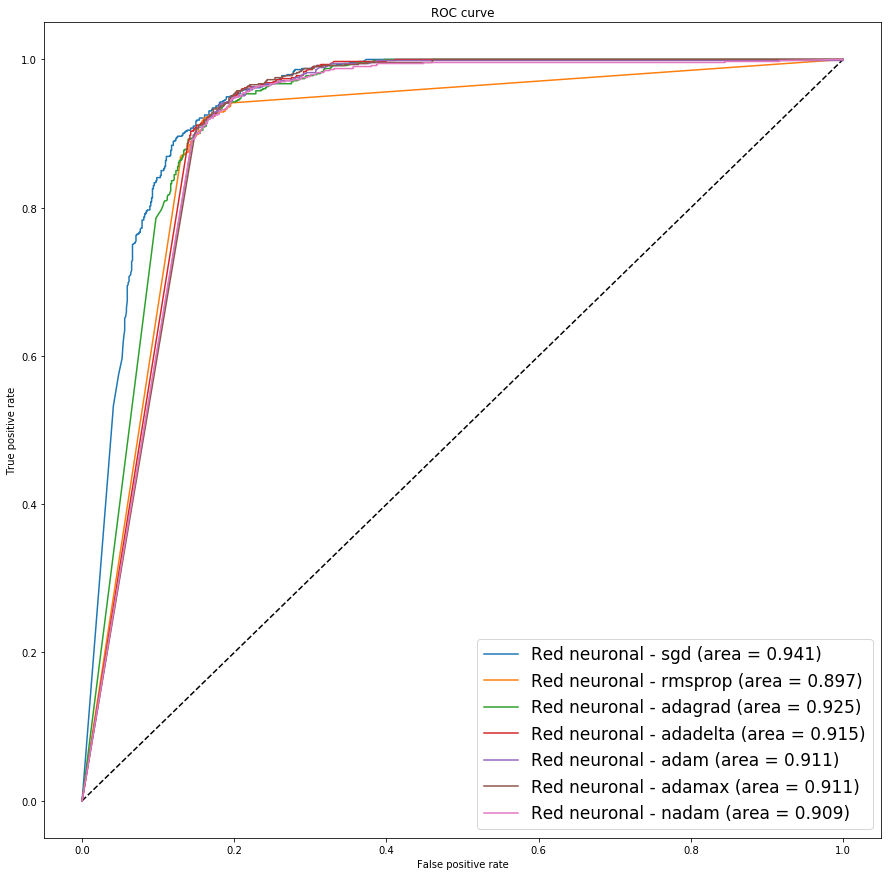

<Figure size 432x288 with 0 Axes>

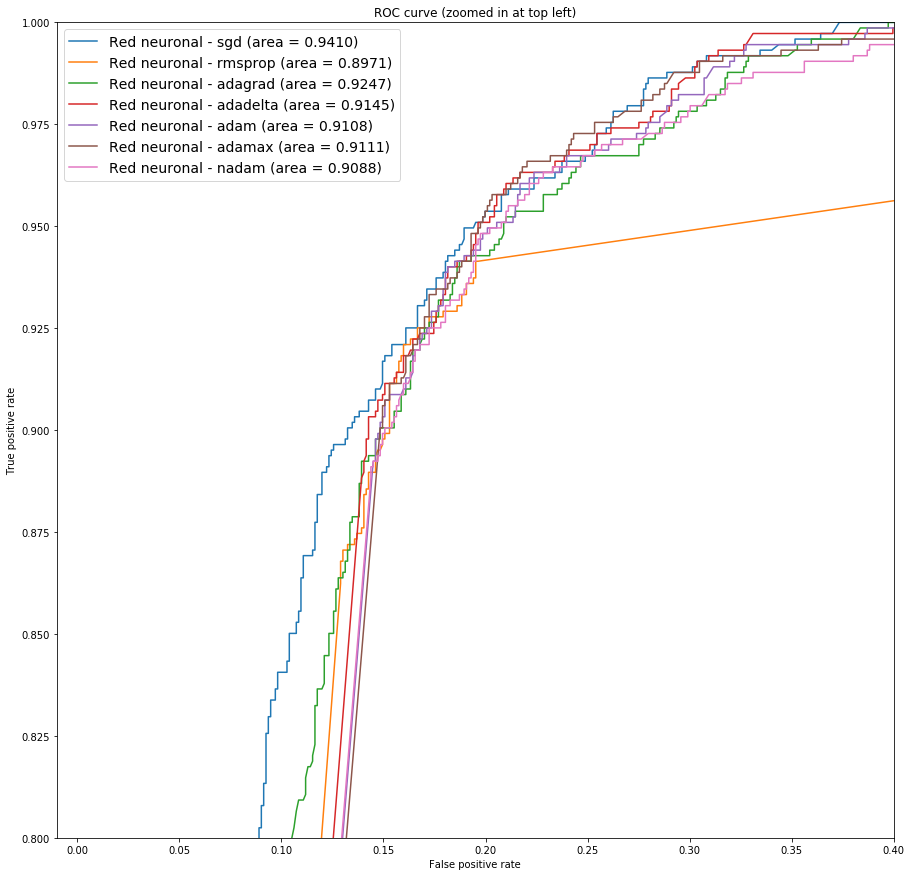

In [29]:
plt.subplots(figsize=(15,15))
plt.figure(1)
plt.plot([0, 1], [0, 1], 'k--')

plt.plot(fpr_keras12, tpr_keras12, label='Red neuronal - sgd (area = {:.3f})'.format(auc_keras12))
plt.plot(fpr_keras13, tpr_keras13, label='Red neuronal - rmsprop (area = {:.3f})'.format(auc_keras13))
plt.plot(fpr_keras14, tpr_keras14, label='Red neuronal - adagrad (area = {:.3f})'.format(auc_keras14))
plt.plot(fpr_keras15, tpr_keras15, label='Red neuronal - adadelta (area = {:.3f})'.format(auc_keras15))
plt.plot(fpr_keras16, tpr_keras16, label='Red neuronal - adam (area = {:.3f})'.format(auc_keras16))
plt.plot(fpr_keras17, tpr_keras17, label='Red neuronal - adamax (area = {:.3f})'.format(auc_keras17))
plt.plot(fpr_keras18, tpr_keras18, label='Red neuronal - nadam (area = {:.3f})'.format(auc_keras18))

plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve')
plt.legend(loc='best',prop={'size': 17})
plt.show()

plt.figure(2)
plt.subplots(figsize=(15,15))
plt.xlim(-0.01, 0.4)
plt.ylim(0.8, 1)
plt.plot([0, 1], [0, 1], 'k--')

plt.plot(fpr_keras12, tpr_keras12, label='Red neuronal - sgd (area = {:.4f})'.format(auc_keras12))
plt.plot(fpr_keras13, tpr_keras13, label='Red neuronal - rmsprop (area = {:.4f})'.format(auc_keras13))
plt.plot(fpr_keras14, tpr_keras14, label='Red neuronal - adagrad (area = {:.4f})'.format(auc_keras14))
plt.plot(fpr_keras15, tpr_keras15, label='Red neuronal - adadelta (area = {:.4f})'.format(auc_keras15))
plt.plot(fpr_keras16, tpr_keras16, label='Red neuronal - adam (area = {:.4f})'.format(auc_keras16))
plt.plot(fpr_keras17, tpr_keras17, label='Red neuronal - adamax (area = {:.4f})'.format(auc_keras17))
plt.plot(fpr_keras18, tpr_keras18, label='Red neuronal - nadam (area = {:.4f})'.format(auc_keras18))

plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve (zoomed in at top left)')
plt.legend(loc='best',prop={'size': 14})

plt.show()

In [80]:
from sklearn.metrics import roc_auc_score,confusion_matrix, precision_score, mean_absolute_error
from sklearn.metrics import recall_score, f1_score, cohen_kappa_score
# Confusion matrix
a = confusion_matrix(y_test, y_pred_mean_squared_error.round())
b = roc_auc_score(y_test, y_pred_mean_squared_error.round())
c = precision_score(y_test, y_pred_mean_squared_error.round())
d = recall_score(y_test, y_pred_mean_squared_error.round())
e = f1_score(y_test, y_pred_mean_squared_error.round())

print (a,b,c,d,e)

[[754 122]
 [ 98 636]] 0.8636078036156422 0.8390501319261213 0.8664850136239782 0.8525469168900804


In [81]:
a = confusion_matrix(y_test, y_pred_mean_absolute_error.round())
b = roc_auc_score(y_test, y_pred_mean_absolute_error.round())
c = precision_score(y_test, y_pred_mean_absolute_error.round())
d = recall_score(y_test, y_pred_mean_absolute_error.round())
e = f1_score(y_test, y_pred_mean_absolute_error.round())

print (a,b,c,d,e)

[[740 136]
 [ 61 673]] 0.880821295708758 0.8318912237330037 0.9168937329700273 0.8723266364225534


In [82]:
a = confusion_matrix(y_test, y_pred_mean_absolute_percentage_error.round())
b = roc_auc_score(y_test, y_pred_mean_absolute_percentage_error.round())
c = precision_score(y_test, y_pred_mean_absolute_percentage_error.round())
d = recall_score(y_test, y_pred_mean_absolute_percentage_error.round())
e = f1_score(y_test, y_pred_mean_absolute_percentage_error.round())

print (a,b,c,d,e)

[[876   0]
 [734   0]] 0.5 0.0 0.0 0.0


C:\Users\Michael\Anaconda3\envs\KerasNGpu\lib\site-packages\sklearn\metrics\classification.py:1135: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Michael\Anaconda3\envs\KerasNGpu\lib\site-packages\sklearn\metrics\classification.py:1135: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)


In [83]:
a = confusion_matrix(y_test, y_pred_mean_squared_logarithmic_error.round())
b = roc_auc_score(y_test, y_pred_mean_squared_logarithmic_error.round())
c = precision_score(y_test, y_pred_mean_squared_logarithmic_error.round())
d = recall_score(y_test, y_pred_mean_squared_logarithmic_error.round())
e = f1_score(y_test, y_pred_mean_squared_logarithmic_error.round())

print (a,b,c,d,e)

[[765 111]
 [ 86 648]] 0.8780607293494085 0.8537549407114624 0.8828337874659401 0.8680509042196918


In [84]:
a = confusion_matrix(y_test, y_pred_squared_hinge.round())
b = roc_auc_score(y_test, y_pred_squared_hinge.round())
c = precision_score(y_test, y_pred_squared_hinge.round())
d = recall_score(y_test, y_pred_squared_hinge.round())
e = f1_score(y_test, y_pred_squared_hinge.round())

print (a,b,c,d,e)


[[  0 876]
 [  0 734]] 0.5 0.45590062111801244 1.0 0.6262798634812288


In [85]:
a = confusion_matrix(y_test, y_pred_hinge.round())
b = roc_auc_score(y_test, y_pred_hinge.round())
c = precision_score(y_test, y_pred_hinge.round())
d = recall_score(y_test, y_pred_hinge.round())
e = f1_score(y_test, y_pred_hinge.round())

print (a,b,c,d,e)

[[  0 876]
 [  0 734]] 0.5 0.45590062111801244 1.0 0.6262798634812288


In [87]:
a = confusion_matrix(y_test, y_pred_categorical_hinge.round())
b = roc_auc_score(y_test, y_pred_categorical_hinge.round())
c = precision_score(y_test, y_pred_categorical_hinge.round())
d = recall_score(y_test, y_pred_categorical_hinge.round())
e = f1_score(y_test, y_pred_categorical_hinge.round())

print (a,b,c,d,e)

[[756 120]
 [ 70 664]] 0.8838229256093465 0.8469387755102041 0.9046321525885559 0.8748353096179183


In [88]:
a = confusion_matrix(y_test, y_pred_logcosh.round())
b = roc_auc_score(y_test, y_pred_logcosh.round())
c = precision_score(y_test, y_pred_logcosh.round())
d = recall_score(y_test, y_pred_logcosh.round())
e = f1_score(y_test, y_pred_logcosh.round())

print (a,b,c,d,e)

[[765 111]
 [ 84 650]] 0.8794231271695718 0.8541392904073587 0.885558583106267 0.8695652173913043


In [89]:
a = confusion_matrix(y_test, y_pred_binary_crossentropy.round())
b = roc_auc_score(y_test, y_pred_binary_crossentropy.round())
c = precision_score(y_test, y_pred_binary_crossentropy.round())
d = recall_score(y_test, y_pred_binary_crossentropy.round())
e = f1_score(y_test, y_pred_binary_crossentropy.round())

print (a,b,c,d,e)

[[760 116]
 [124 610]] 0.8493212894877633 0.8402203856749312 0.8310626702997275 0.8356164383561644


In [90]:
a = confusion_matrix(y_test, y_pred_kullback_leibler_divergence.round())
b = roc_auc_score(y_test, y_pred_kullback_leibler_divergence.round())
c = precision_score(y_test, y_pred_kullback_leibler_divergence.round())
d = recall_score(y_test, y_pred_kullback_leibler_divergence.round())
e = f1_score(y_test, y_pred_kullback_leibler_divergence.round())

print (a,b,c,d,e)

[[  0 876]
 [  0 734]] 0.5 0.45590062111801244 1.0 0.6262798634812288


In [91]:
a = confusion_matrix(y_test, y_pred_poisson.round())
b = roc_auc_score(y_test, y_pred_poisson.round())
c = precision_score(y_test, y_pred_poisson.round())
d = recall_score(y_test, y_pred_poisson.round())
e = f1_score(y_test, y_pred_poisson.round())

print (a,b,c,d,e)

[[742 134]
 [ 79 655]] 0.869701267838702 0.8301647655259823 0.8923705722070845 0.8601444517399869


Optimizadores de precisión

In [66]:
confusion_matrix(y_test, y_pred_sgd.round())

array([[776, 100],
       [115, 619]], dtype=int64)

In [67]:
confusion_matrix(y_test, y_pred_rmsprop.round())

array([[759, 117],
       [ 99, 635]], dtype=int64)

In [68]:
confusion_matrix(y_test, y_pred_adagrad.round())

array([[758, 118],
       [104, 630]], dtype=int64)

In [69]:
confusion_matrix(y_test, y_pred_adadelta.round())

array([[769, 107],
       [132, 602]], dtype=int64)

In [70]:
confusion_matrix(y_test, y_pred_adam.round())

array([[764, 112],
       [127, 607]], dtype=int64)

In [71]:
confusion_matrix(y_test, y_pred_adamax.round())

array([[758, 118],
       [120, 614]], dtype=int64)

In [72]:
confusion_matrix(y_test, y_pred_nadam.round())

array([[749, 127],
       [104, 630]], dtype=int64)

Precision y perdida

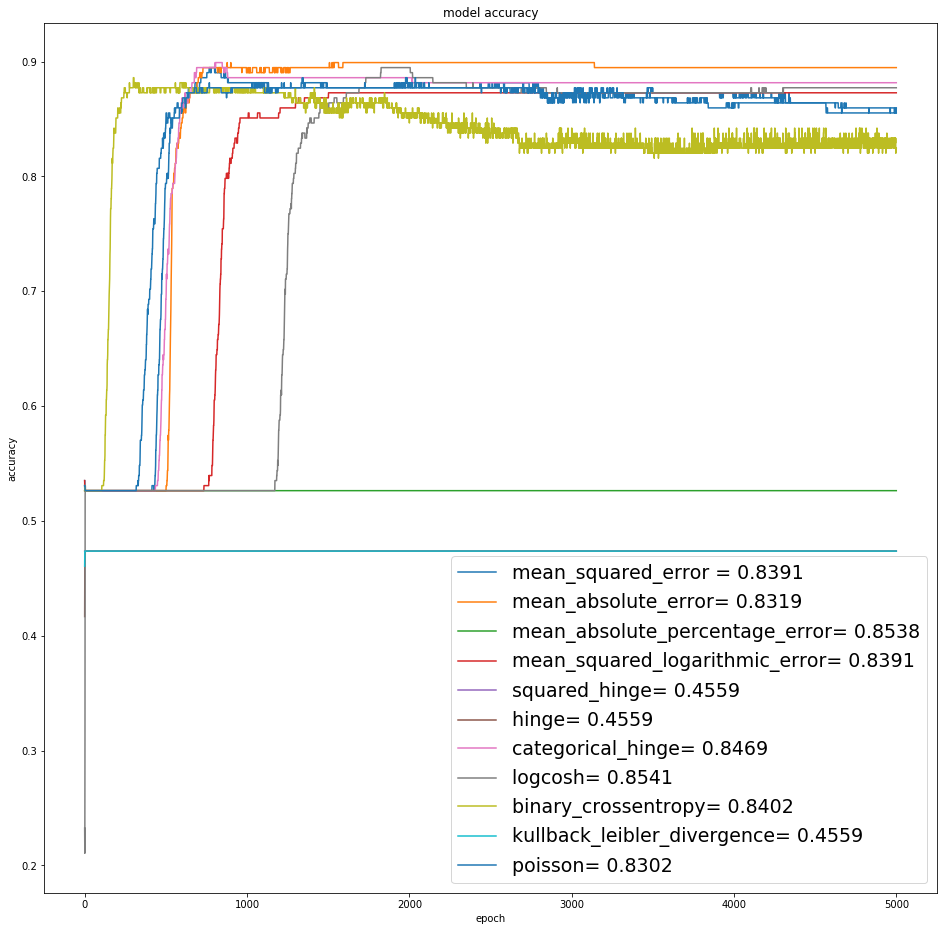

In [73]:
plt.subplots(figsize=(16,16))
#plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])

#plt.plot(history2.history['acc'])
plt.plot(history2.history['val_acc'])
#plt.plot(history3.history['acc'])
plt.plot(history3.history['val_acc'])
#plt.plot(history4.history['acc'])
plt.plot(history4.history['val_acc'])
#plt.plot(history5.history['acc'])
plt.plot(history5.history['val_acc'])
#plt.plot(history6.history['acc'])
plt.plot(history6.history['val_acc'])
#plt.plot(history7.history['acc'])
plt.plot(history7.history['val_acc'])
#plt.plot(history8.history['acc'])
plt.plot(history8.history['val_acc'])
#plt.plot(history9.history['acc'])
plt.plot(history9.history['val_acc'])
#plt.plot(history10.history['acc'])
plt.plot(history10.history['val_acc'])
#plt.plot(history11.history['acc'])
plt.plot(history11.history['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['mean_squared_error = {:.4f}'.format(precision_score(y_test, y_pred_mean_squared_error.round())),
'mean_absolute_error= {:.4f}'.format(precision_score(y_test, y_pred_mean_absolute_error.round())),
'mean_absolute_percentage_error= {:.4f}'.format(precision_score(y_test, y_pred_mean_squared_logarithmic_error.round())),
'mean_squared_logarithmic_error= {:.4f}'.format(precision_score(y_test, y_pred_mean_squared_error.round())),
'squared_hinge= {:.4f}'.format(precision_score(y_test, y_pred_squared_hinge.round())),
'hinge= {:.4f}'.format(precision_score(y_test, y_pred_hinge.round())),
'categorical_hinge= {:.4f}'.format(precision_score(y_test, y_pred_categorical_hinge.round())),
'logcosh= {:.4f}'.format(precision_score(y_test, y_pred_logcosh.round())),
'binary_crossentropy= {:.4f}'.format(precision_score(y_test, y_pred_binary_crossentropy.round())),
'kullback_leibler_divergence= {:.4f}'.format(precision_score(y_test, y_pred_kullback_leibler_divergence.round())),
'poisson= {:.4f}'.format(precision_score(y_test, y_pred_poisson.round()))], loc='lower right',prop={'size': 19})
plt.show()

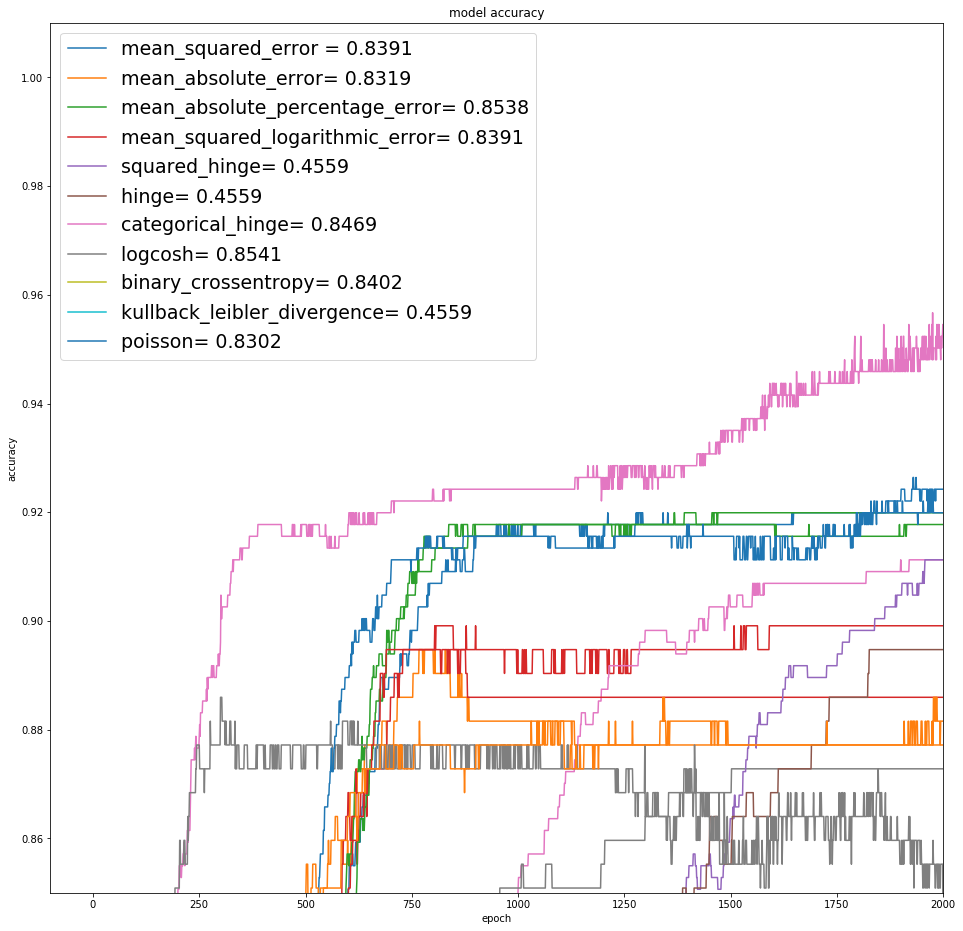

In [74]:
plt.subplots(figsize=(16,16))
plt.xlim(-100, 2000)
plt.ylim(0.85, 1.01)
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])

plt.plot(history2.history['acc'])
plt.plot(history2.history['val_acc'])
plt.plot(history3.history['acc'])
plt.plot(history3.history['val_acc'])
plt.plot(history4.history['acc'])
plt.plot(history4.history['val_acc'])
plt.plot(history5.history['acc'])
plt.plot(history5.history['val_acc'])
plt.plot(history6.history['acc'])
plt.plot(history6.history['val_acc'])
plt.plot(history7.history['acc'])
plt.plot(history7.history['val_acc'])
plt.plot(history8.history['acc'])
plt.plot(history8.history['val_acc'])
plt.plot(history9.history['acc'])
plt.plot(history9.history['val_acc'])
plt.plot(history10.history['acc'])
plt.plot(history10.history['val_acc'])
plt.plot(history11.history['acc'])
plt.plot(history11.history['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['mean_squared_error = {:.4f}'.format(precision_score(y_test, y_pred_mean_squared_error.round())),
'mean_absolute_error= {:.4f}'.format(precision_score(y_test, y_pred_mean_absolute_error.round())),
'mean_absolute_percentage_error= {:.4f}'.format(precision_score(y_test, y_pred_mean_squared_logarithmic_error.round())),
'mean_squared_logarithmic_error= {:.4f}'.format(precision_score(y_test, y_pred_mean_squared_error.round())),
'squared_hinge= {:.4f}'.format(precision_score(y_test, y_pred_squared_hinge.round())),
'hinge= {:.4f}'.format(precision_score(y_test, y_pred_hinge.round())),
'categorical_hinge= {:.4f}'.format(precision_score(y_test, y_pred_categorical_hinge.round())),
'logcosh= {:.4f}'.format(precision_score(y_test, y_pred_logcosh.round())),
'binary_crossentropy= {:.4f}'.format(precision_score(y_test, y_pred_binary_crossentropy.round())),
'kullback_leibler_divergence= {:.4f}'.format(precision_score(y_test, y_pred_kullback_leibler_divergence.round())),
'poisson= {:.4f}'.format(precision_score(y_test, y_pred_poisson.round()))], loc='upper left',prop={'size': 19})
plt.show()

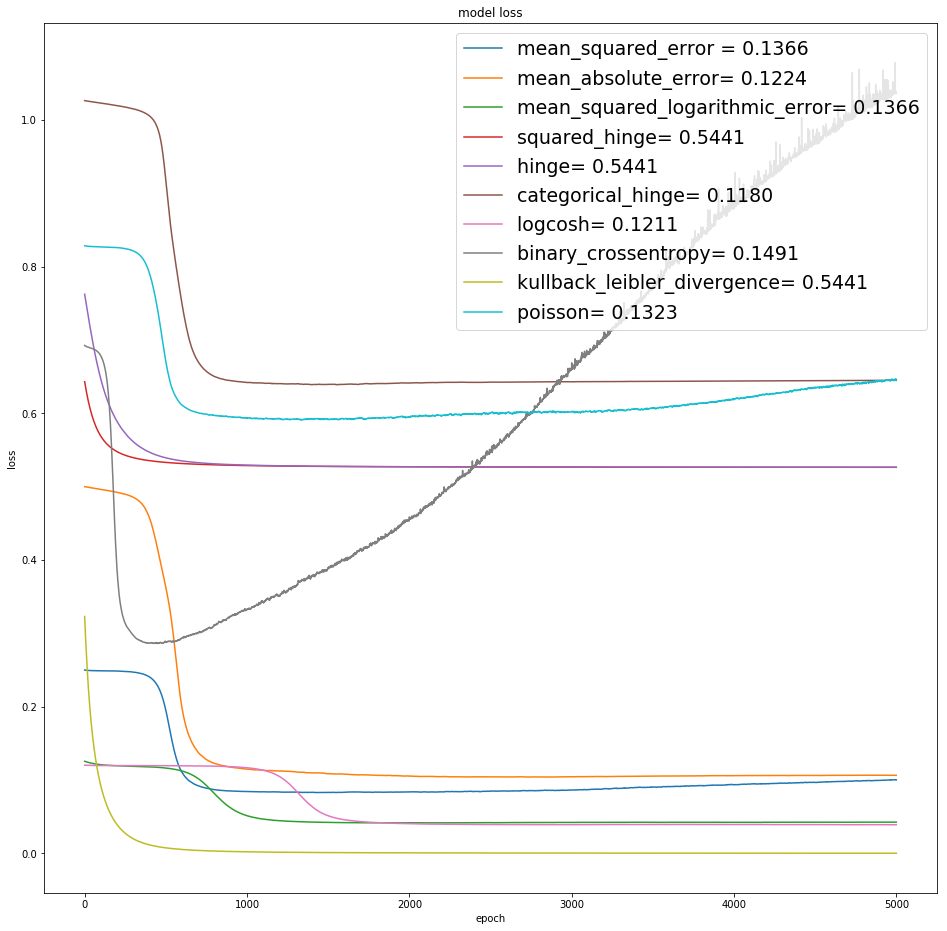

In [75]:
plt.subplots(figsize=(16,16))
#plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
#plt.plot(history2.history['loss'])
plt.plot(history2.history['val_loss'])
#plt.plot(history3.history['loss'])
#plt.plot(history3.history['val_loss'])
#plt.plot(history4.history['loss'])
plt.plot(history4.history['val_loss'])
#plt.plot(history5.history['loss'])
plt.plot(history5.history['val_loss'])
#plt.plot(history6.history['loss'])
plt.plot(history6.history['val_loss'])
#plt.plot(history7.history['loss'])
plt.plot(history7.history['val_loss'])
#plt.plot(history8.history['loss'])
plt.plot(history8.history['val_loss'])
#plt.plot(history9.history['loss'])
plt.plot(history9.history['val_loss'])
#plt.plot(history10.history['loss'])
plt.plot(history10.history['val_loss'])
#plt.plot(history11.history['loss'])
plt.plot(history11.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['mean_squared_error = {:.4f}'.format(mean_absolute_error(y_test, y_pred_mean_squared_error.round())),
'mean_absolute_error= {:.4f}'.format(mean_absolute_error(y_test, y_pred_mean_absolute_error.round())),
#'mean_absolute_percentage_error= {:.4f}'.format(mean_absolute_error(y_test, y_pred_mean_squared_logarithmic_error.round())),
'mean_squared_logarithmic_error= {:.4f}'.format(mean_absolute_error(y_test, y_pred_mean_squared_error.round())),
'squared_hinge= {:.4f}'.format(mean_absolute_error(y_test, y_pred_squared_hinge.round())),
'hinge= {:.4f}'.format(mean_absolute_error(y_test, y_pred_hinge.round())),
'categorical_hinge= {:.4f}'.format(mean_absolute_error(y_test, y_pred_categorical_hinge.round())),
'logcosh= {:.4f}'.format(mean_absolute_error(y_test, y_pred_logcosh.round())),
'binary_crossentropy= {:.4f}'.format(mean_absolute_error(y_test, y_pred_binary_crossentropy.round())),
'kullback_leibler_divergence= {:.4f}'.format(mean_absolute_error(y_test, y_pred_kullback_leibler_divergence.round())),
'poisson= {:.4f}'.format(mean_absolute_error(y_test, y_pred_poisson.round()))], loc='upper right',prop={'size': 19})
plt.show()